# Table of contents
[Libraries Used](#lib)

Part I: [Read data and EDA](#DataLoading)

Part II: [Feature selection and correlation](#featureselection)

Part III: [Model selection and data training](#modelselection)

Part IV: [Exploration-Exploitation](#exp-exp)


In [1]:
import numpy as np
from rdkit import Chem as CH
from rdkit.Chem import Descriptors
from rdkit.Chem.rdMolDescriptors import CalcMolFormula
from rdkit.Chem import AllChem
import pubchempy as pcp
from pymatgen.core.composition import Composition
from matminer.featurizers.composition import ElectronAffinity
from matminer.featurizers.composition import ElementFraction

import RDkit_Desc

import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

#Own functions

import IC_calculator

# SKlearn libraries for learning.
from sklearn.model_selection import cross_val_score, cross_val_predict, KFold, RepeatedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import ShuffleSplit, cross_validate, train_test_split
from sklearn import linear_model 
from xgboost import XGBRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn import kernel_ridge
from sklearn.utils import resample
from sklearn.metrics import r2_score
import xgboost as xgb
import lightgbm as lgbm
from catboost import CatBoostRegressor as CBRegressor




# SKlearn libraries for evaluation.
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error
from sklearn.feature_selection import SelectFromModel

hyperparam_opt=False

gen_planar_mol_feat=False

# Part I: Read data and EDA

<a id="DataLoading"></a>

### 1. Planar molecule dataset

In [2]:
if gen_planar_mol_feat == True:
    planar_mol = pd.read_csv('DataSource/filtered_planar_mol_by_fit.txt', index_col = None, delimiter = ',')
    smiles = planar_mol['SMILES']
    cid = planar_mol['CID']
    TPSA = []
    mol_weight = []
    aromatic_rings = []
    num_heavy_atoms = []
    LabuteASA = []
    SPAN = []
    GEDI = []

    #Getting gas-features from SMILES using rdkit
    for i in range(len(smiles)):
        m = CH.MolFromSmiles(smiles[i])
        mh = CH.AddHs(m)
        AllChem.EmbedMolecule(mh)
        TPSA.append(Descriptors.TPSA(m))
        mol_weight.append(Descriptors.MolWt(m))
        aromatic_rings.append(Descriptors.NumAromaticRings(m))
        num_heavy_atoms.append(Descriptors.HeavyAtomCount(m))
        LabuteASA.append(Descriptors.LabuteASA(m))
        SPAN.append(RDkit_Desc.get_SPAN(mh,None))
        GEDI.append(RDkit_Desc.get_GeDi(mh))

    planar_mol['TPSA'] = TPSA
    planar_mol['HeavyAtoms'] = num_heavy_atoms
    planar_mol['AromaticRings'] = aromatic_rings
    planar_mol['MolWt'] = mol_weight
    planar_mol['LabuteASA'] = LabuteASA
    planar_mol['SPAN'] = SPAN
    planar_mol['GeDi'] = GEDI
    planar_mol = planar_mol.astype({'CID' :'str'})
    planar_mol
    #planar_mol.to_csv('DataSource/filtered_planar_mol_by_fit_with_features.txt', index=False)

In [3]:
planar_mol = pd.read_csv('DataSource/filtered_planar_mol_by_fit_with_features', index_col = None, delimiter = ',')
planar_mol = planar_mol.astype({'CID' :'str'})
planar_mol

,CID,SMILES,TPSA,HeavyAtoms,AromaticRings,MolWt,LabuteASA,SPAN,GeDi
0,13,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,9,1,181.449,68.341202,3.481711,6.260667
1,66,C1=CC(=C(C=C1Cl)O)Cl,20.23,9,1,163.003,62.832169,3.313690,6.323829
2,101,C1=CC(=CC(=C1)O)C=O,37.30,9,1,122.123,52.752101,3.360840,6.313907
3,240,C1=CC=C(C=C1)C=O,17.07,8,1,106.124,47.957867,3.345250,6.138852
4,241,C1=CC=CC=C1,0.00,6,1,78.114,37.431403,2.494200,4.970533
...,...,...,...,...,...,...,...,...,...
10113,5367417,C=CC=CC=C,0.00,6,0,80.130,38.495153,3.942085,7.841565
10114,137747,C=C=C=C,0.00,4,0,52.076,25.765268,2.701678,5.242299
10115,5463058,CC=CC=CC=C,0.00,7,0,94.157,44.860095,4.174226,8.014709
10116,139187,C=CC=C=C,0.00,5,0,66.103,32.130210,3.220374,6.013381


### 2. 2D materials dataset

In [4]:
TwoD_mat = pd.read_csv('DataSource/Bilayer-Bulk_TotalEnergy.txt', delimiter = ',')
SepBL = pd.read_csv('DataSource/SeparatedBilayerEnergy.txt', delimiter=',')
LC = pd.read_csv('DataSource/LC.txt', delimiter = ',')
SepE = []
HalfSet = int(len(TwoD_mat)/2)

BilayerEnergy = TwoD_mat.iloc[:HalfSet,:]

name = []
for i in BilayerEnergy['Material']:
    strip_text = str(i).strip('struc_Bilayer_')
    name.append(strip_text)
    
BilayerEnergy['Name'] = pd.DataFrame(name)   
SepBL = SepBL.merge(BilayerEnergy, on=["Name"], how="left")
SepBL['SeperationE'] = SepBL['IC'] - SepBL['E']
MaterialFeatures = SepBL.merge(LC, on=["Material"], how="left")

MaterialFeatures.drop(['IC', 'E', 'Material'], axis=1, inplace=True)
MaterialFeatures['a'] = MaterialFeatures['a']/3
MaterialFeatures['b'] = MaterialFeatures['b']/3
MaterialFeatures

MatFormula = []

for i in MaterialFeatures['Name']:
    i = i.replace("Mo", "Mo18")
    i = i.replace("W", "W18")
    i = i.replace("Hf", "Hf18")
    i = i.replace("Ti", "Ti18")
    i = i.replace("Cr", "Cr18")
    i = i.replace("Zr", "Zr18")
    i = i.replace("S2", "S36")
    i = i.replace("Se2", "Se36")
    i = i.replace("Te2", "Te36")
    i = i.replace("O2", "O36")
    MatFormula.append(i)
 
MaterialFeatures['MatFormula'] = pd.DataFrame(MatFormula)
#MaterialFeatures.to_csv('MaterialFeatures', index=False)
MaterialFeatures = MaterialFeatures[(MaterialFeatures.Name != 'ZrO2') & (MaterialFeatures.Name != 'HfO2') & (MaterialFeatures.Name != 'TiO2')]
MaterialFeatures

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Name,SeperationE,a,b,c,SG,MatFormula
0,MoS2,1.766763,3.154333,3.154333,27.427,164.0,Mo18S36
1,MoSe2,2.056959,3.285000,3.285000,28.094,164.0,Mo18Se36
2,MoTe2,2.636494,3.493333,3.493333,28.999,164.0,Mo18Te36
3,MoO2,1.202318,2.828333,2.828333,25.010,164.0,Mo18O36
4,WS2,1.865270,3.162333,3.162333,27.460,164.0,W18S36
5,WSe2,2.142525,3.291667,3.291667,28.154,164.0,W18Se36
6,WTe2,2.694539,3.508333,3.508333,29.028,164.0,W18Te36
7,WO2,1.340843,2.832333,2.832333,25.022,164.0,W18O36
8,HfS2,1.844773,3.531667,3.531667,27.360,164.0,Hf18S36
9,HfSe2,2.075391,3.678000,3.678000,27.514,164.0,Hf18Se36


### 3. Intercalation Dataset

In [5]:
IC_1 = pd.read_csv('DataSource/IC_energy1.txt', delimiter =',')
IC_2 = pd.read_csv('DataSource/IC_energy2.txt', delimiter =',')
IC_3 = pd.read_csv('Results_Code_1/IC_THN_1.txt', delimiter =',')
IC_4 = pd.read_csv('Results_Code_1/IC_THU_1.txt', delimiter =',')
IC_5 = pd.read_csv('Results_Code_2/IC_THN_2.txt', delimiter =',')
IC_6 = pd.read_csv('Results_Code_2/IC_THU_2.txt', delimiter =',')
IC_7 = pd.read_csv('Results_Code_3/IC_THN_3.txt', delimiter =',')
IC_7_previous = pd.read_csv('Results_Code_3/OverlapFromPreviousAttempt_THN', delimiter =',')
IC_8 = pd.read_csv('Results_Code_3/IC_THU_3.txt', delimiter =',')
IC_9 = pd.read_csv('Results_Code_4/IC_THN_4.txt', delimiter =',')
IC_10 = pd.read_csv('Results_Code_4/IC_THU_4.txt', delimiter =',')

Gas = pd.read_csv('DataSource/Energy_gas.txt' , delimiter=',')
Gas_3 = pd.read_csv('Results_Code_1/Gas_THN_1.txt', delimiter =',')
Gas_4 = pd.read_csv('Results_Code_1/Gas_THU_1.txt', delimiter =',')
Gas_5 = pd.read_csv('Results_Code_2/Gas_THN_2.txt', delimiter =',')
Gas_6 = pd.read_csv('Results_Code_2/Gas_THU_2.txt', delimiter =',')
Gas_7 = pd.read_csv('Results_Code_3/Gas_THN_3.txt', delimiter =',')
Gas_7_previous = pd.read_csv('Results_Code_3/OverlapFromPreviousAttempt_THN_gas', delimiter = ',')
Gas_8 = pd.read_csv('Results_Code_3/Gas_THU_3.txt', delimiter =',')
Gas_9 = pd.read_csv('Results_Code_4/Gas_THN_4.txt', delimiter =',')
Gas_10 = pd.read_csv('Results_Code_4/Gas_THU_4.txt', delimiter =',')

Bilayer = pd.read_csv('DataSource/BilayerEnergy.txt', delimiter=',')

IC1 = IC_calculator.IC_calculator(IC_1, Gas, Bilayer)
IC2 = IC_calculator.IC_calculator(IC_2, Gas, Bilayer)
IC3 = IC_calculator.IC_calculator(IC_3, Gas_3, Bilayer)
IC4 = IC_calculator.IC_calculator(IC_4, Gas_4, Bilayer)
IC5 = IC_calculator.IC_calculator(IC_5, Gas_5, Bilayer)
IC6 = IC_calculator.IC_calculator(IC_6, Gas_6, Bilayer)
IC7 = IC_calculator.IC_calculator(IC_7, Gas_7, Bilayer)
IC7_previous = IC_calculator.IC_calculator(IC_7_previous, Gas_7_previous, Bilayer)
IC8 = IC_calculator.IC_calculator(IC_8, Gas_8, Bilayer)
IC9 = IC_calculator.IC_calculator(IC_9, Gas_9, Bilayer)
IC10 = IC_calculator.IC_calculator(IC_10, Gas_10, Bilayer)

IC = pd.concat([IC1, IC2, IC3, IC4, IC5, IC6, IC7, IC7_previous, IC8, IC9, IC10], axis=0).drop_duplicates()
IC

,System,Name,CID,IC_ENERGY
0,12606301_CrS2_0,CrS2,12606301,0.134932
1,12606301_CrSe2_0,CrSe2,12606301,0.466738
2,12606301_CrTe2_0,CrTe2,12606301,1.030505
3,12606301_HfS2_0,HfS2,12606301,-0.796573
4,12606301_HfSe2_0,HfSe2,12606301,-0.156093
...,...,...,...,...
142,90487519_TiS2_0,TiS2,90487519,0.213371
143,90487612_TiS2_0,TiS2,90487612,0.253622
144,90487638_TiS2_0,TiS2,90487638,0.317355
145,91231438_TiS2_0,TiS2,91231438,-0.099807


### 4. Merging the three datasets above

In [6]:
Merge_2_3 = IC.merge(MaterialFeatures, on=["Name"], how="right")
FinalSet = Merge_2_3.merge(planar_mol, on=["CID"], how="left").dropna()
#FinalSet = FinalSet[FinalSet.CID != '88957274']

## We want the fractional composition of constituent elements as features. 
## The following lines do that...

gas_formula = []
for i in FinalSet['SMILES']:
    m = CH.MolFromSmiles(i)
    gas_formula.append(CalcMolFormula(m))

FinalSet['Gas_Formula'] = gas_formula
FinalSet['CompoundFormula'] = FinalSet['MatFormula']+FinalSet['Gas_Formula']

Comp = []
for i in FinalSet['CompoundFormula']:
    Comp.append(Composition(i))
    
FinalSet['Composition'] = Comp
from matminer.featurizers.composition import ElementFraction
from matminer.featurizers.composition import Stoichiometry

FinalSet = ElementFraction().featurize_dataframe(FinalSet, 'Composition')

FinalSet = FinalSet.drop_duplicates(subset=['System'])
### Making a copy of Final Set with 'Name', 'SMILES', 'CID'. 
### This is for when we use Final Set and merge it with PredictionSet to make ExploitSet
MergeWithPredictionSet = FinalSet.drop(['b', 'SG', 'c', 'Composition','Gas_Formula', 'CompoundFormula', 'MatFormula', 'MolWt', 'LabuteASA', 'HeavyAtoms'], axis = 1)

### FinalSet for developing ML model
FinalSet = FinalSet.drop(['b', 'SMILES', 'SG', 'c', 'Composition', 'Name', 'CID','Gas_Formula', 'CompoundFormula', 'MatFormula','MolWt','LabuteASA', 'HeavyAtoms'], axis = 1)

## For plotting feature correlation
PlotSet = FinalSet.loc[:, (FinalSet != 0).any(axis=0)] 

FinalSet =FinalSet[FinalSet['IC_ENERGY'] < 10]
FinalSet =FinalSet[FinalSet['IC_ENERGY'] > -4]

ElementFraction:   0%|          | 0/1300 [00:00<?, ?it/s]

In [7]:
FinalSet

,System,IC_ENERGY,SeperationE,a,TPSA,AromaticRings,SPAN,GeDi,H,He,...,Pu,Am,Cm,Bk,Cf,Es,Fm,Md,No,Lr
2,137161100_MoS2_0,0.435827,1.766763,3.154333,63.05,2.0,3.050890,5.910676,0.044118,0,...,0,0,0,0,0,0,0,0,0,0
6,154148619_MoS2_0,0.219380,1.766763,3.154333,45.75,2.0,4.867923,7.441902,0.044118,0,...,0,0,0,0,0,0,0,0,0,0
8,20197826_MoS2_0,0.523010,1.766763,3.154333,12.89,0.0,3.781485,5.781853,0.046154,0,...,0,0,0,0,0,0,0,0,0,0
9,20405740_MoS2_0,0.749361,1.766763,3.154333,51.81,2.0,3.281336,5.952812,0.045455,0,...,0,0,0,0,0,0,0,0,0,0
10,45080076_MoS2_0,0.280013,1.766763,3.154333,43.08,3.0,3.485019,6.566693,0.057971,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1506,86249522_ZrTe2_0,0.750397,2.625600,3.495000,0.00,0.0,3.142076,6.277975,0.088235,0,...,0,0,0,0,0,0,0,0,0,0
1507,87361649_ZrTe2_0,-0.373538,2.625600,3.495000,12.53,2.0,3.503803,6.013405,0.058824,0,...,0,0,0,0,0,0,0,0,0,0
1508,129785799_ZrTe2_0,0.517669,2.625600,3.495000,21.48,3.0,4.040250,7.791307,0.071429,0,...,0,0,0,0,0,0,0,0,0,0
1509,129856444_ZrTe2_0,-0.754676,2.625600,3.495000,0.00,0.0,3.540754,7.033390,0.060606,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
FinalSet[FinalSet.IC_ENERGY<-2].describe()

,IC_ENERGY,SeperationE,a,TPSA,AromaticRings,SPAN,GeDi,H,He,Li,...,Pu,Am,Cm,Bk,Cf,Es,Fm,Md,No,Lr
count,70.000000,70.000000,70.000000,70.000000,70.000000,70.000000,70.000000,70.000000,70.0,70.0,...,70.0,70.0,70.0,70.0,70.0,70.0,70.0,70.0,70.0,70.0
mean,-2.641141,1.113624,2.831943,20.695000,0.400000,3.418470,6.490153,0.076156,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.494862,0.496168,0.365240,14.240205,0.599517,0.521989,1.012454,0.024627,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,-3.948572,0.823892,2.622667,0.000000,0.000000,2.107092,3.569104,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,-2.924619,0.823892,2.622667,12.470000,0.000000,3.157422,5.802597,0.059701,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,-2.481685,0.823892,2.622667,20.745000,0.000000,3.591341,7.034904,0.085714,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,-2.261915,1.202318,2.828333,30.430000,1.000000,3.644170,7.185310,0.098592,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,-2.006434,2.211189,3.706333,49.840000,3.000000,5.252273,8.041221,0.111111,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Part II: Feature Selection and Correlation

<a id="featureselection"></a>

Text(0.5, 1.0, 'Features Correlating with IC energy')

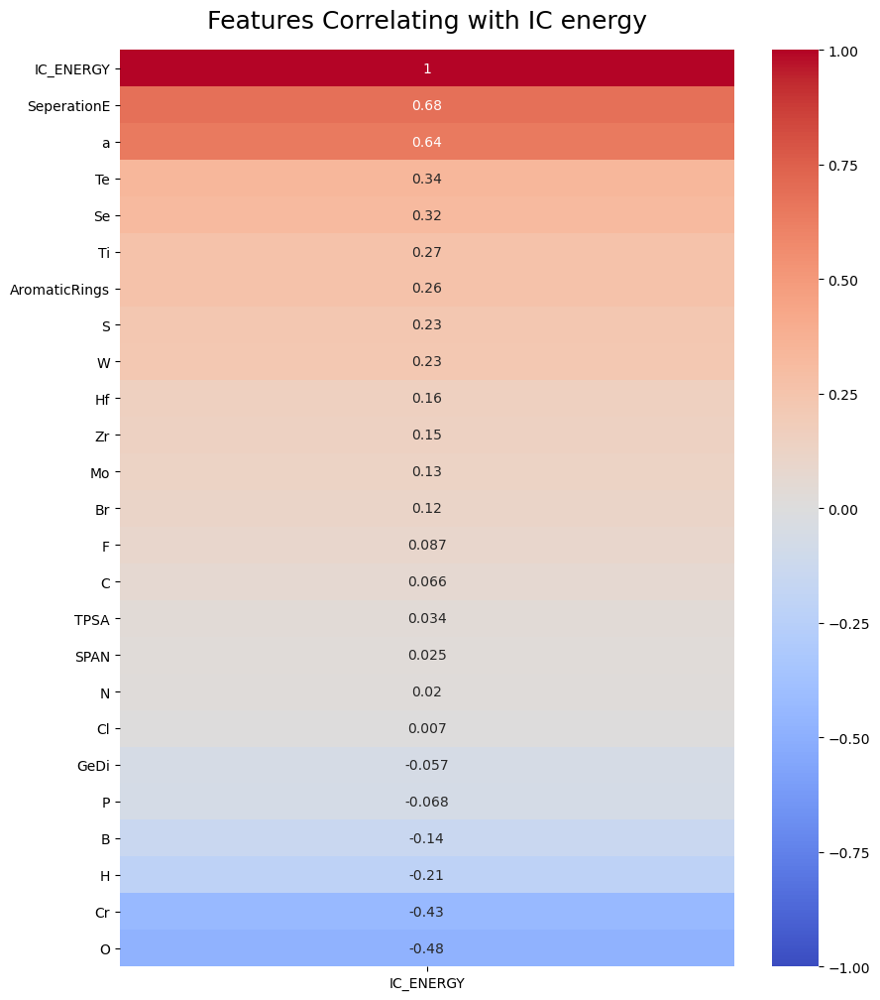

In [9]:
plt.figure(figsize=(10, 12))
matrix = (PlotSet.corr(method = 'spearman')).round(3)
matrix = matrix[~np.isnan(matrix)]


heatmap = sns.heatmap(matrix[['IC_ENERGY']].sort_values(by='IC_ENERGY', ascending=False), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('Features Correlating with IC energy', fontdict={'fontsize':18}, pad=16)

# Part III: Model Selection and Data Training

<a id="modelselection"></a>

In [10]:
exclude = ['IC_ENERGY', 'System']
features = [c for c in FinalSet.columns if c not in exclude]
X = FinalSet[features]
y = FinalSet["IC_ENERGY"]

## Evaluating performance of various models

In [11]:
#Lets use train/split ratio of 70/30 - Use ShuffleSplit
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)
#kfold = KFold(n_splits = 5, shuffle = True, random_state = 42 )

# Use some linear reg model and some with boosting capabilities

hyper_params_lgbm = {
    "objective" : "multiclass",
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'n_estimators': 500,
    "verbosity" : -1 
}

hyper_params_xgb = { 
    'objective': 'reg:squarederror',  # error evaluation for multiclass tasks
    'n_estimators': 500,
    'eval_metric': mean_absolute_error
    }

hyper_params_cb = {   
    'n_estimators': 500,
    'eval_metric': mean_absolute_error
    }

#Use ShuffleSplit for cross validation of dataset. Kfold also gives similar result
cv_split = ShuffleSplit(n_splits = 5, test_size = 0.30, random_state = 42)

# Initializing the Algorithms # I have tried a couple of them. Just showing a handful here
algorithm_list = {'LinearReg': linear_model.LinearRegression(), 
                  'BayeRidge':linear_model.BayesianRidge(),
                  'LassoLars': linear_model.LassoLars(alpha=0.01),
                  'LeastAngLars':linear_model.Lars(),
                  'XgbostReg': xgb.XGBRegressor(**hyper_params_xgb),
                  'LGBMReg': lgbm.LGBMRegressor(**hyper_params_lgbm),
                  'CatBoost' : CBRegressor(),
                  'KernelRidge' : kernel_ridge.KernelRidge(alpha=1,kernel='poly',gamma=None,degree=3,coef0=1,kernel_params=None)
                 }

test_R2 = []
train_R2 = []
ad_R2 = []
CV_R2 = []
CV_R2_std = []
mse = []
mae = []
std = []
mape = []
mod = []
mod_call_name = []
ModelMetrics = pd.DataFrame()
# Fit the various model
for key,model in algorithm_list.items():
    try:
        if key == 'XgbostReg' or key == 'LGBMReg' or key == 'CatBoost':
            model.fit(X_train, y_train,early_stopping_rounds=100,eval_set=[(X_test, y_test)])
        else:
            model.fit(X_train, y_train)
        # Cross-validate the result to avoid over fitting
        cv_results = cross_validate(model, X_train, y_train, cv  = cv_split)
#        cv_results = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
        adj_R2 = 1 - (1-model.score(X_train, y_train))*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
        y_pred = model.predict(X_test) 
        # Print model and test metrics
        print(f'Model - {key: <5} || Model Score: %.3f, Adj_R^2: %.3f, Test Score: %.3f, Cross Val Score: %.3f' 
              %(model.score(X_train, y_train),adj_R2, model.score(X_test, y_test), cv_results.get('test_score').mean()))
        mod.append(key)
        test_R2.append(model.score(X_test, y_test))
        train_R2.append(model.score(X_train, y_train))
        ad_R2.append(adj_R2)
        CV_R2.append(cv_results.get('test_score').mean())
        CV_R2_std.append(cv_results.get('test_score').std())
        
        print(f'Model - {key: <5} || MSE: %.3f, MAE: %.3f, STD: %.3f, MAPE: %.3f%%' 
              %(metrics.mean_squared_error(y_test, y_pred), metrics.mean_absolute_error(y_test, y_pred), 
                cv_results.get('test_score').std(), metrics.mean_absolute_percentage_error(y_test, y_pred)*100))
        mse.append(metrics.mean_squared_error(y_test, y_pred))
        mae.append(metrics.mean_absolute_error(y_test, y_pred))
        std.append(cv_results.get('test_score').std())
        mape.append(metrics.mean_absolute_percentage_error(y_test, y_pred)*100)
        mod_call_name.append(model)
        
        print(f'Model - {key: <5}  || Cross Validation Progress: \n')
        print(pd.DataFrame(cv_results))
        print('----------------------------------------------------------------------------------------------------------')
    except Exception as e:
        print(f"Exception occurred in {str(e)}")
        pass 



ModelMetrics['Model'] = mod
ModelMetrics['Train_R2'] = train_R2
ModelMetrics['Adjusted_R2'] = ad_R2
ModelMetrics['Test_R2'] = test_R2
ModelMetrics['CV_R2'] = CV_R2
ModelMetrics['Std_in_CV'] = CV_R2_std
ModelMetrics['MSE'] = mse
ModelMetrics['MAE'] = mae
ModelMetrics['STD'] = std
ModelMetrics['MAPE'] = mape

Model - LinearReg || Model Score: 0.601, Adj_R^2: 0.533, Test Score: 0.478, Cross Val Score: 0.552
Model - LinearReg || MSE: 0.505, MAE: 0.481, STD: 0.062, MAPE: 89.207%
Model - LinearReg  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.008127    0.003288    0.448517
1  0.013790    0.002921    0.518949
2  0.014496    0.003117    0.589218
3  0.008952    0.002636    0.627047
4  0.008215    0.002594    0.577210
----------------------------------------------------------------------------------------------------------
Model - BayeRidge || Model Score: 0.550, Adj_R^2: 0.473, Test Score: 0.423, Cross Val Score: 0.516
Model - BayeRidge || MSE: 0.558, MAE: 0.531, STD: 0.047, MAPE: 92.669%
Model - BayeRidge  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.017589    0.002423    0.459752
1  0.011348    0.002442    0.476368
2  0.008600    0.002438    0.510183
3  0.007182    0.002300    0.590648
4  0.009367    0.002300    0.543192
-------------------

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/sklearn/linear_model/_base.py:138: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLars())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  FutureWarning,
/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/sklearn/linear_model/_base.py:138: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the dat

[14]	validation_0-rmse:0.54126
[15]	validation_0-rmse:0.53857
[16]	validation_0-rmse:0.53920
[17]	validation_0-rmse:0.53860
[18]	validation_0-rmse:0.53746
[19]	validation_0-rmse:0.53659
[20]	validation_0-rmse:0.53515
[21]	validation_0-rmse:0.53570
[22]	validation_0-rmse:0.53579
[23]	validation_0-rmse:0.53457
[24]	validation_0-rmse:0.53374
[25]	validation_0-rmse:0.53200
[26]	validation_0-rmse:0.53152
[27]	validation_0-rmse:0.53107
[28]	validation_0-rmse:0.52909
[29]	validation_0-rmse:0.52775
[30]	validation_0-rmse:0.52754
[31]	validation_0-rmse:0.52852
[32]	validation_0-rmse:0.52863
[33]	validation_0-rmse:0.52891
[34]	validation_0-rmse:0.52744
[35]	validation_0-rmse:0.52719
[36]	validation_0-rmse:0.52731
[37]	validation_0-rmse:0.52692
[38]	validation_0-rmse:0.52653
[39]	validation_0-rmse:0.52613
[40]	validation_0-rmse:0.52573
[41]	validation_0-rmse:0.52567
[42]	validation_0-rmse:0.52560
[43]	validation_0-rmse:0.52571
[44]	validation_0-rmse:0.52581
[45]	validation_0-rmse:0.52619
[46]	val

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[108]	valid_0's l2: 0.252785
[109]	valid_0's l2: 0.252531
[110]	valid_0's l2: 0.251877
[111]	valid_0's l2: 0.251358
[112]	valid_0's l2: 0.252272
[113]	valid_0's l2: 0.252225
[114]	valid_0's l2: 0.251979
[115]	valid_0's l2: 0.252222
[116]	valid_0's l2: 0.252517
[117]	valid_0's l2: 0.252568
[118]	valid_0's l2: 0.251607
[119]	valid_0's l2: 0.251515
[120]	valid_0's l2: 0.251352
[121]	valid_0's l2: 0.251879
[122]	valid_0's l2: 0.252539
[123]	valid_0's l2: 0.251895
[124]	valid_0's l2: 0.251369
[125]	valid_0's l2: 0.25145
[126]	valid_0's l2: 0.250769
[127]	valid_0's l2: 0.250566
[128]	valid_0's l2: 0.251199
[129]	valid_0's l2: 0.250785
[130]	valid_0's l2: 0.251341
[131]	valid_0's l2: 0.250392
[132]	valid_0's l2: 0.250685
[133]	valid_0's l2: 0.251477
[134]	valid_0's l2: 0.250765
[135]	valid_0's l2: 0.250449
[136]	valid_0's l2: 0.250223
[137]	valid_0's l2: 0.250689
[138]	valid_0's l2: 0.250514
[139]	valid_0's l2: 0.250796
[140]	valid_0's l2: 0.250782
[141]	valid_0's l2: 0.250115
[142]	valid_0's

[416]	valid_0's l2: 0.238877
[417]	valid_0's l2: 0.238891
[418]	valid_0's l2: 0.238827
[419]	valid_0's l2: 0.238871
[420]	valid_0's l2: 0.238871
[421]	valid_0's l2: 0.238884
[422]	valid_0's l2: 0.238833
[423]	valid_0's l2: 0.238889
[424]	valid_0's l2: 0.239045
[425]	valid_0's l2: 0.238945
[426]	valid_0's l2: 0.239002
[427]	valid_0's l2: 0.238868
[428]	valid_0's l2: 0.238827
[429]	valid_0's l2: 0.23865
[430]	valid_0's l2: 0.238571
[431]	valid_0's l2: 0.2384
[432]	valid_0's l2: 0.238457
[433]	valid_0's l2: 0.238427
[434]	valid_0's l2: 0.238474
[435]	valid_0's l2: 0.238664
[436]	valid_0's l2: 0.238497
[437]	valid_0's l2: 0.238467
[438]	valid_0's l2: 0.238266
[439]	valid_0's l2: 0.23827
[440]	valid_0's l2: 0.238347
[441]	valid_0's l2: 0.23838
[442]	valid_0's l2: 0.23836
[443]	valid_0's l2: 0.238586
[444]	valid_0's l2: 0.238387
[445]	valid_0's l2: 0.238461
[446]	valid_0's l2: 0.238346
[447]	valid_0's l2: 0.238393
[448]	valid_0's l2: 0.238268
[449]	valid_0's l2: 0.23821
[450]	valid_0's l2: 0

157:	learn: 0.3890618	test: 0.5322167	best: 0.5322167 (157)	total: 155ms	remaining: 825ms
158:	learn: 0.3882744	test: 0.5315615	best: 0.5315615 (158)	total: 156ms	remaining: 823ms
159:	learn: 0.3870728	test: 0.5311143	best: 0.5311143 (159)	total: 156ms	remaining: 820ms
160:	learn: 0.3855279	test: 0.5304172	best: 0.5304172 (160)	total: 157ms	remaining: 818ms
161:	learn: 0.3846021	test: 0.5297215	best: 0.5297215 (161)	total: 158ms	remaining: 815ms
162:	learn: 0.3842146	test: 0.5295558	best: 0.5295558 (162)	total: 158ms	remaining: 812ms
163:	learn: 0.3830816	test: 0.5293476	best: 0.5293476 (163)	total: 159ms	remaining: 810ms
164:	learn: 0.3819779	test: 0.5297634	best: 0.5293476 (163)	total: 159ms	remaining: 807ms
165:	learn: 0.3806003	test: 0.5294085	best: 0.5293476 (163)	total: 160ms	remaining: 805ms
166:	learn: 0.3793900	test: 0.5294254	best: 0.5293476 (163)	total: 161ms	remaining: 802ms
167:	learn: 0.3786780	test: 0.5288337	best: 0.5288337 (167)	total: 161ms	remaining: 800ms
168:	learn

437:	learn: 0.2353910	test: 0.4737736	best: 0.4737374 (436)	total: 333ms	remaining: 428ms
438:	learn: 0.2350448	test: 0.4734120	best: 0.4734120 (438)	total: 334ms	remaining: 427ms
439:	learn: 0.2347766	test: 0.4737842	best: 0.4734120 (438)	total: 334ms	remaining: 426ms
440:	learn: 0.2342241	test: 0.4736428	best: 0.4734120 (438)	total: 335ms	remaining: 425ms
441:	learn: 0.2337864	test: 0.4736602	best: 0.4734120 (438)	total: 336ms	remaining: 424ms
442:	learn: 0.2335445	test: 0.4734425	best: 0.4734120 (438)	total: 336ms	remaining: 423ms
443:	learn: 0.2334903	test: 0.4734115	best: 0.4734115 (443)	total: 337ms	remaining: 422ms
444:	learn: 0.2331034	test: 0.4730184	best: 0.4730184 (444)	total: 337ms	remaining: 421ms
445:	learn: 0.2325254	test: 0.4727630	best: 0.4727630 (445)	total: 338ms	remaining: 420ms
446:	learn: 0.2316638	test: 0.4726460	best: 0.4726460 (446)	total: 339ms	remaining: 419ms
447:	learn: 0.2311574	test: 0.4726146	best: 0.4726146 (447)	total: 339ms	remaining: 418ms
448:	learn

757:	learn: 0.1633488	test: 0.4571997	best: 0.4570850 (755)	total: 513ms	remaining: 164ms
758:	learn: 0.1630793	test: 0.4571975	best: 0.4570850 (755)	total: 514ms	remaining: 163ms
759:	learn: 0.1628148	test: 0.4571899	best: 0.4570850 (755)	total: 515ms	remaining: 163ms
760:	learn: 0.1626521	test: 0.4570817	best: 0.4570817 (760)	total: 515ms	remaining: 162ms
761:	learn: 0.1624702	test: 0.4571629	best: 0.4570817 (760)	total: 516ms	remaining: 161ms
762:	learn: 0.1623160	test: 0.4571563	best: 0.4570817 (760)	total: 517ms	remaining: 160ms
763:	learn: 0.1619453	test: 0.4572461	best: 0.4570817 (760)	total: 517ms	remaining: 160ms
764:	learn: 0.1617146	test: 0.4571469	best: 0.4570817 (760)	total: 518ms	remaining: 159ms
765:	learn: 0.1615073	test: 0.4571369	best: 0.4570817 (760)	total: 518ms	remaining: 158ms
766:	learn: 0.1611145	test: 0.4569103	best: 0.4569103 (766)	total: 519ms	remaining: 158ms
767:	learn: 0.1610984	test: 0.4569047	best: 0.4569047 (767)	total: 520ms	remaining: 157ms
768:	learn

58:	learn: 0.5393269	total: 29.4ms	remaining: 469ms
59:	learn: 0.5377994	total: 30.2ms	remaining: 473ms
60:	learn: 0.5347640	total: 30.7ms	remaining: 473ms
61:	learn: 0.5327555	total: 31.2ms	remaining: 473ms
62:	learn: 0.5310913	total: 31.8ms	remaining: 472ms
63:	learn: 0.5273894	total: 32.3ms	remaining: 472ms
64:	learn: 0.5247590	total: 32.8ms	remaining: 472ms
65:	learn: 0.5225895	total: 33.4ms	remaining: 472ms
66:	learn: 0.5190395	total: 33.9ms	remaining: 472ms
67:	learn: 0.5171340	total: 34.4ms	remaining: 472ms
68:	learn: 0.5151537	total: 35ms	remaining: 472ms
69:	learn: 0.5134854	total: 35.5ms	remaining: 472ms
70:	learn: 0.5126696	total: 35.8ms	remaining: 469ms
71:	learn: 0.5111865	total: 36.3ms	remaining: 468ms
72:	learn: 0.5103135	total: 36.8ms	remaining: 468ms
73:	learn: 0.5081245	total: 37.3ms	remaining: 467ms
74:	learn: 0.5068340	total: 37.8ms	remaining: 467ms
75:	learn: 0.5053811	total: 38.3ms	remaining: 466ms
76:	learn: 0.5039385	total: 38.8ms	remaining: 465ms
77:	learn: 0.5

313:	learn: 0.3125986	total: 175ms	remaining: 383ms
314:	learn: 0.3125577	total: 176ms	remaining: 382ms
315:	learn: 0.3125112	total: 177ms	remaining: 382ms
316:	learn: 0.3117982	total: 177ms	remaining: 382ms
317:	learn: 0.3112906	total: 178ms	remaining: 381ms
318:	learn: 0.3105383	total: 178ms	remaining: 380ms
319:	learn: 0.3100484	total: 179ms	remaining: 380ms
320:	learn: 0.3099986	total: 179ms	remaining: 379ms
321:	learn: 0.3092228	total: 180ms	remaining: 378ms
322:	learn: 0.3091779	total: 180ms	remaining: 378ms
323:	learn: 0.3091393	total: 181ms	remaining: 377ms
324:	learn: 0.3085627	total: 181ms	remaining: 377ms
325:	learn: 0.3083556	total: 182ms	remaining: 376ms
326:	learn: 0.3080408	total: 182ms	remaining: 375ms
327:	learn: 0.3079992	total: 183ms	remaining: 374ms
328:	learn: 0.3079585	total: 183ms	remaining: 374ms
329:	learn: 0.3078358	total: 184ms	remaining: 373ms
330:	learn: 0.3070979	total: 184ms	remaining: 372ms
331:	learn: 0.3070532	total: 185ms	remaining: 372ms
332:	learn: 

614:	learn: 0.1988006	total: 340ms	remaining: 213ms
615:	learn: 0.1984624	total: 341ms	remaining: 213ms
616:	learn: 0.1980747	total: 342ms	remaining: 212ms
617:	learn: 0.1979808	total: 342ms	remaining: 212ms
618:	learn: 0.1978174	total: 343ms	remaining: 211ms
619:	learn: 0.1975631	total: 343ms	remaining: 210ms
620:	learn: 0.1972872	total: 344ms	remaining: 210ms
621:	learn: 0.1968066	total: 344ms	remaining: 209ms
622:	learn: 0.1966633	total: 345ms	remaining: 209ms
623:	learn: 0.1961916	total: 345ms	remaining: 208ms
624:	learn: 0.1961580	total: 346ms	remaining: 208ms
625:	learn: 0.1959970	total: 346ms	remaining: 207ms
626:	learn: 0.1956815	total: 347ms	remaining: 206ms
627:	learn: 0.1953706	total: 347ms	remaining: 206ms
628:	learn: 0.1952065	total: 348ms	remaining: 205ms
629:	learn: 0.1949528	total: 348ms	remaining: 205ms
630:	learn: 0.1949116	total: 349ms	remaining: 204ms
631:	learn: 0.1945018	total: 349ms	remaining: 204ms
632:	learn: 0.1940247	total: 350ms	remaining: 203ms
633:	learn: 

931:	learn: 0.1402624	total: 506ms	remaining: 36.9ms
932:	learn: 0.1399492	total: 507ms	remaining: 36.4ms
933:	learn: 0.1397939	total: 507ms	remaining: 35.9ms
934:	learn: 0.1397056	total: 508ms	remaining: 35.3ms
935:	learn: 0.1395624	total: 509ms	remaining: 34.8ms
936:	learn: 0.1393470	total: 509ms	remaining: 34.2ms
937:	learn: 0.1392613	total: 510ms	remaining: 33.7ms
938:	learn: 0.1390852	total: 510ms	remaining: 33.1ms
939:	learn: 0.1388378	total: 511ms	remaining: 32.6ms
940:	learn: 0.1386433	total: 511ms	remaining: 32ms
941:	learn: 0.1385315	total: 512ms	remaining: 31.5ms
942:	learn: 0.1384547	total: 512ms	remaining: 31ms
943:	learn: 0.1383943	total: 513ms	remaining: 30.4ms
944:	learn: 0.1382523	total: 513ms	remaining: 29.9ms
945:	learn: 0.1380416	total: 514ms	remaining: 29.3ms
946:	learn: 0.1379126	total: 514ms	remaining: 28.8ms
947:	learn: 0.1379038	total: 515ms	remaining: 28.2ms
948:	learn: 0.1378334	total: 516ms	remaining: 27.7ms
949:	learn: 0.1376638	total: 516ms	remaining: 27.2

119:	learn: 0.4241127	total: 94.7ms	remaining: 695ms
120:	learn: 0.4223713	total: 95.7ms	remaining: 695ms
121:	learn: 0.4204147	total: 96.5ms	remaining: 695ms
122:	learn: 0.4195232	total: 97.6ms	remaining: 696ms
123:	learn: 0.4178350	total: 98.5ms	remaining: 696ms
124:	learn: 0.4170470	total: 99.4ms	remaining: 696ms
125:	learn: 0.4150492	total: 100ms	remaining: 694ms
126:	learn: 0.4137055	total: 101ms	remaining: 692ms
127:	learn: 0.4128616	total: 102ms	remaining: 692ms
128:	learn: 0.4116347	total: 102ms	remaining: 690ms
129:	learn: 0.4105665	total: 103ms	remaining: 690ms
130:	learn: 0.4100774	total: 104ms	remaining: 689ms
131:	learn: 0.4088351	total: 105ms	remaining: 688ms
132:	learn: 0.4072910	total: 105ms	remaining: 687ms
133:	learn: 0.4059707	total: 106ms	remaining: 687ms
134:	learn: 0.4048029	total: 107ms	remaining: 688ms
135:	learn: 0.4040917	total: 108ms	remaining: 687ms
136:	learn: 0.4025351	total: 109ms	remaining: 687ms
137:	learn: 0.4018902	total: 110ms	remaining: 685ms
138:	l

440:	learn: 0.2167244	total: 275ms	remaining: 349ms
441:	learn: 0.2166302	total: 276ms	remaining: 348ms
442:	learn: 0.2161483	total: 276ms	remaining: 347ms
443:	learn: 0.2156500	total: 277ms	remaining: 347ms
444:	learn: 0.2153107	total: 277ms	remaining: 346ms
445:	learn: 0.2152362	total: 278ms	remaining: 345ms
446:	learn: 0.2147986	total: 278ms	remaining: 344ms
447:	learn: 0.2144719	total: 279ms	remaining: 344ms
448:	learn: 0.2141538	total: 279ms	remaining: 343ms
449:	learn: 0.2137725	total: 280ms	remaining: 342ms
450:	learn: 0.2133956	total: 281ms	remaining: 342ms
451:	learn: 0.2130098	total: 281ms	remaining: 341ms
452:	learn: 0.2125306	total: 282ms	remaining: 340ms
453:	learn: 0.2122857	total: 282ms	remaining: 339ms
454:	learn: 0.2119806	total: 283ms	remaining: 339ms
455:	learn: 0.2115351	total: 283ms	remaining: 338ms
456:	learn: 0.2114602	total: 284ms	remaining: 337ms
457:	learn: 0.2108701	total: 285ms	remaining: 337ms
458:	learn: 0.2105997	total: 285ms	remaining: 336ms
459:	learn: 

770:	learn: 0.1443552	total: 451ms	remaining: 134ms
771:	learn: 0.1441891	total: 452ms	remaining: 133ms
772:	learn: 0.1440186	total: 453ms	remaining: 133ms
773:	learn: 0.1437524	total: 453ms	remaining: 132ms
774:	learn: 0.1436802	total: 454ms	remaining: 132ms
775:	learn: 0.1434872	total: 455ms	remaining: 131ms
776:	learn: 0.1433062	total: 456ms	remaining: 131ms
777:	learn: 0.1431694	total: 456ms	remaining: 130ms
778:	learn: 0.1429827	total: 457ms	remaining: 130ms
779:	learn: 0.1427652	total: 458ms	remaining: 129ms
780:	learn: 0.1426794	total: 458ms	remaining: 129ms
781:	learn: 0.1424429	total: 459ms	remaining: 128ms
782:	learn: 0.1423128	total: 460ms	remaining: 127ms
783:	learn: 0.1420499	total: 460ms	remaining: 127ms
784:	learn: 0.1417771	total: 461ms	remaining: 126ms
785:	learn: 0.1414812	total: 462ms	remaining: 126ms
786:	learn: 0.1413222	total: 462ms	remaining: 125ms
787:	learn: 0.1412094	total: 463ms	remaining: 125ms
788:	learn: 0.1410082	total: 464ms	remaining: 124ms
789:	learn: 

14:	learn: 0.7312388	total: 13ms	remaining: 851ms
15:	learn: 0.7231802	total: 13.8ms	remaining: 850ms
16:	learn: 0.7154873	total: 14.7ms	remaining: 848ms
17:	learn: 0.7069238	total: 15.3ms	remaining: 837ms
18:	learn: 0.7000836	total: 16.1ms	remaining: 834ms
19:	learn: 0.6914779	total: 16.9ms	remaining: 829ms
20:	learn: 0.6850930	total: 17.7ms	remaining: 825ms
21:	learn: 0.6781056	total: 18.4ms	remaining: 816ms
22:	learn: 0.6720566	total: 19ms	remaining: 806ms
23:	learn: 0.6656450	total: 19.6ms	remaining: 797ms
24:	learn: 0.6598743	total: 20.2ms	remaining: 789ms
25:	learn: 0.6553105	total: 20.9ms	remaining: 784ms
26:	learn: 0.6487347	total: 21.6ms	remaining: 777ms
27:	learn: 0.6417449	total: 22.3ms	remaining: 773ms
28:	learn: 0.6370329	total: 22.9ms	remaining: 766ms
29:	learn: 0.6306955	total: 23.5ms	remaining: 761ms
30:	learn: 0.6256812	total: 24.3ms	remaining: 759ms
31:	learn: 0.6205038	total: 24.9ms	remaining: 754ms
32:	learn: 0.6162740	total: 25.5ms	remaining: 746ms
33:	learn: 0.612

341:	learn: 0.2945672	total: 194ms	remaining: 374ms
342:	learn: 0.2939214	total: 195ms	remaining: 374ms
343:	learn: 0.2933289	total: 196ms	remaining: 373ms
344:	learn: 0.2930339	total: 196ms	remaining: 373ms
345:	learn: 0.2926694	total: 197ms	remaining: 372ms
346:	learn: 0.2922159	total: 197ms	remaining: 372ms
347:	learn: 0.2919651	total: 198ms	remaining: 371ms
348:	learn: 0.2917074	total: 199ms	remaining: 370ms
349:	learn: 0.2913194	total: 199ms	remaining: 370ms
350:	learn: 0.2906669	total: 200ms	remaining: 369ms
351:	learn: 0.2898129	total: 200ms	remaining: 369ms
352:	learn: 0.2897737	total: 201ms	remaining: 368ms
353:	learn: 0.2893245	total: 201ms	remaining: 367ms
354:	learn: 0.2892719	total: 202ms	remaining: 367ms
355:	learn: 0.2884122	total: 202ms	remaining: 366ms
356:	learn: 0.2877270	total: 203ms	remaining: 365ms
357:	learn: 0.2870559	total: 204ms	remaining: 365ms
358:	learn: 0.2870164	total: 204ms	remaining: 364ms
359:	learn: 0.2862137	total: 205ms	remaining: 364ms
360:	learn: 

596:	learn: 0.2005509	total: 339ms	remaining: 229ms
597:	learn: 0.2002149	total: 340ms	remaining: 228ms
598:	learn: 0.1998599	total: 340ms	remaining: 228ms
599:	learn: 0.1996040	total: 341ms	remaining: 227ms
600:	learn: 0.1994500	total: 341ms	remaining: 227ms
601:	learn: 0.1993650	total: 342ms	remaining: 226ms
602:	learn: 0.1991013	total: 342ms	remaining: 225ms
603:	learn: 0.1986446	total: 343ms	remaining: 225ms
604:	learn: 0.1983647	total: 344ms	remaining: 224ms
605:	learn: 0.1981495	total: 344ms	remaining: 224ms
606:	learn: 0.1980955	total: 345ms	remaining: 223ms
607:	learn: 0.1977253	total: 345ms	remaining: 223ms
608:	learn: 0.1974965	total: 346ms	remaining: 222ms
609:	learn: 0.1973123	total: 346ms	remaining: 221ms
610:	learn: 0.1969538	total: 347ms	remaining: 221ms
611:	learn: 0.1968506	total: 348ms	remaining: 220ms
612:	learn: 0.1964009	total: 348ms	remaining: 220ms
613:	learn: 0.1963757	total: 349ms	remaining: 219ms
614:	learn: 0.1958082	total: 349ms	remaining: 219ms
615:	learn: 

881:	learn: 0.1374820	total: 504ms	remaining: 67.4ms
882:	learn: 0.1372670	total: 505ms	remaining: 66.9ms
883:	learn: 0.1372084	total: 505ms	remaining: 66.3ms
884:	learn: 0.1371980	total: 506ms	remaining: 65.7ms
885:	learn: 0.1369970	total: 506ms	remaining: 65.1ms
886:	learn: 0.1368241	total: 507ms	remaining: 64.6ms
887:	learn: 0.1364998	total: 507ms	remaining: 64ms
888:	learn: 0.1363089	total: 508ms	remaining: 63.4ms
889:	learn: 0.1362823	total: 509ms	remaining: 62.9ms
890:	learn: 0.1360851	total: 509ms	remaining: 62.3ms
891:	learn: 0.1356711	total: 510ms	remaining: 61.7ms
892:	learn: 0.1355677	total: 510ms	remaining: 61.2ms
893:	learn: 0.1354413	total: 511ms	remaining: 60.6ms
894:	learn: 0.1352991	total: 512ms	remaining: 60ms
895:	learn: 0.1352189	total: 512ms	remaining: 59.5ms
896:	learn: 0.1351231	total: 513ms	remaining: 58.9ms
897:	learn: 0.1349316	total: 513ms	remaining: 58.3ms
898:	learn: 0.1347441	total: 514ms	remaining: 57.7ms
899:	learn: 0.1345440	total: 515ms	remaining: 57.2

142:	learn: 0.4457069	total: 89.2ms	remaining: 535ms
143:	learn: 0.4448623	total: 90ms	remaining: 535ms
144:	learn: 0.4439359	total: 90.7ms	remaining: 535ms
145:	learn: 0.4434676	total: 91.3ms	remaining: 534ms
146:	learn: 0.4428617	total: 91.9ms	remaining: 533ms
147:	learn: 0.4421025	total: 92.6ms	remaining: 533ms
148:	learn: 0.4409185	total: 93.2ms	remaining: 532ms
149:	learn: 0.4393106	total: 94ms	remaining: 533ms
150:	learn: 0.4374867	total: 94.6ms	remaining: 532ms
151:	learn: 0.4371483	total: 95.3ms	remaining: 531ms
152:	learn: 0.4360526	total: 96ms	remaining: 532ms
153:	learn: 0.4350225	total: 96.7ms	remaining: 531ms
154:	learn: 0.4342573	total: 97.3ms	remaining: 530ms
155:	learn: 0.4334363	total: 98.1ms	remaining: 531ms
156:	learn: 0.4330633	total: 98.8ms	remaining: 531ms
157:	learn: 0.4326224	total: 99.4ms	remaining: 530ms
158:	learn: 0.4322229	total: 100ms	remaining: 530ms
159:	learn: 0.4303440	total: 101ms	remaining: 529ms
160:	learn: 0.4285846	total: 101ms	remaining: 529ms
16

482:	learn: 0.2534333	total: 271ms	remaining: 290ms
483:	learn: 0.2531447	total: 271ms	remaining: 289ms
484:	learn: 0.2528115	total: 272ms	remaining: 289ms
485:	learn: 0.2524212	total: 272ms	remaining: 288ms
486:	learn: 0.2520063	total: 273ms	remaining: 288ms
487:	learn: 0.2514319	total: 274ms	remaining: 287ms
488:	learn: 0.2508868	total: 274ms	remaining: 287ms
489:	learn: 0.2506101	total: 275ms	remaining: 286ms
490:	learn: 0.2505008	total: 275ms	remaining: 285ms
491:	learn: 0.2502829	total: 276ms	remaining: 285ms
492:	learn: 0.2500823	total: 276ms	remaining: 284ms
493:	learn: 0.2499034	total: 277ms	remaining: 284ms
494:	learn: 0.2494012	total: 278ms	remaining: 283ms
495:	learn: 0.2489020	total: 278ms	remaining: 283ms
496:	learn: 0.2487313	total: 279ms	remaining: 282ms
497:	learn: 0.2484608	total: 279ms	remaining: 281ms
498:	learn: 0.2483995	total: 280ms	remaining: 281ms
499:	learn: 0.2482388	total: 280ms	remaining: 280ms
500:	learn: 0.2478769	total: 281ms	remaining: 280ms
501:	learn: 

826:	learn: 0.1704940	total: 454ms	remaining: 94.9ms
827:	learn: 0.1703298	total: 455ms	remaining: 94.4ms
828:	learn: 0.1701790	total: 455ms	remaining: 93.9ms
829:	learn: 0.1700150	total: 456ms	remaining: 93.3ms
830:	learn: 0.1697475	total: 456ms	remaining: 92.8ms
831:	learn: 0.1695892	total: 457ms	remaining: 92.3ms
832:	learn: 0.1695637	total: 457ms	remaining: 91.7ms
833:	learn: 0.1692317	total: 458ms	remaining: 91.2ms
834:	learn: 0.1692129	total: 458ms	remaining: 90.6ms
835:	learn: 0.1690826	total: 459ms	remaining: 90ms
836:	learn: 0.1689029	total: 460ms	remaining: 89.5ms
837:	learn: 0.1686742	total: 460ms	remaining: 88.9ms
838:	learn: 0.1685611	total: 461ms	remaining: 88.4ms
839:	learn: 0.1684309	total: 461ms	remaining: 87.9ms
840:	learn: 0.1684055	total: 462ms	remaining: 87.3ms
841:	learn: 0.1681944	total: 462ms	remaining: 86.8ms
842:	learn: 0.1679931	total: 463ms	remaining: 86.2ms
843:	learn: 0.1678163	total: 464ms	remaining: 85.7ms
844:	learn: 0.1677042	total: 464ms	remaining: 85

11:	learn: 0.8349637	total: 10.1ms	remaining: 830ms
12:	learn: 0.8231993	total: 11ms	remaining: 835ms
13:	learn: 0.8128638	total: 11.8ms	remaining: 828ms
14:	learn: 0.8026130	total: 12.5ms	remaining: 819ms
15:	learn: 0.7921836	total: 13.2ms	remaining: 813ms
16:	learn: 0.7830343	total: 13.9ms	remaining: 802ms
17:	learn: 0.7745663	total: 14.6ms	remaining: 796ms
18:	learn: 0.7654482	total: 15.3ms	remaining: 789ms
19:	learn: 0.7569692	total: 16ms	remaining: 783ms
20:	learn: 0.7482156	total: 16.7ms	remaining: 776ms
21:	learn: 0.7402658	total: 17.3ms	remaining: 768ms
22:	learn: 0.7329140	total: 17.9ms	remaining: 760ms
23:	learn: 0.7251994	total: 18.5ms	remaining: 752ms
24:	learn: 0.7185664	total: 19.1ms	remaining: 744ms
25:	learn: 0.7127908	total: 19.7ms	remaining: 738ms
26:	learn: 0.7059493	total: 20.3ms	remaining: 731ms
27:	learn: 0.7011943	total: 20.5ms	remaining: 713ms
28:	learn: 0.6954444	total: 21.2ms	remaining: 710ms
29:	learn: 0.6899793	total: 21.8ms	remaining: 705ms
30:	learn: 0.683

345:	learn: 0.2913199	total: 190ms	remaining: 359ms
346:	learn: 0.2907181	total: 191ms	remaining: 359ms
347:	learn: 0.2899692	total: 191ms	remaining: 359ms
348:	learn: 0.2898812	total: 192ms	remaining: 358ms
349:	learn: 0.2894387	total: 193ms	remaining: 358ms
350:	learn: 0.2886511	total: 193ms	remaining: 357ms
351:	learn: 0.2879628	total: 194ms	remaining: 357ms
352:	learn: 0.2869689	total: 194ms	remaining: 356ms
353:	learn: 0.2863736	total: 195ms	remaining: 356ms
354:	learn: 0.2858993	total: 196ms	remaining: 355ms
355:	learn: 0.2858164	total: 196ms	remaining: 355ms
356:	learn: 0.2848259	total: 197ms	remaining: 354ms
357:	learn: 0.2843358	total: 197ms	remaining: 354ms
358:	learn: 0.2842324	total: 198ms	remaining: 353ms
359:	learn: 0.2841594	total: 198ms	remaining: 353ms
360:	learn: 0.2834133	total: 199ms	remaining: 352ms
361:	learn: 0.2833355	total: 200ms	remaining: 352ms
362:	learn: 0.2832563	total: 200ms	remaining: 351ms
363:	learn: 0.2826771	total: 201ms	remaining: 351ms
364:	learn: 

675:	learn: 0.1908237	total: 371ms	remaining: 178ms
676:	learn: 0.1906890	total: 372ms	remaining: 178ms
677:	learn: 0.1905128	total: 373ms	remaining: 177ms
678:	learn: 0.1904871	total: 373ms	remaining: 176ms
679:	learn: 0.1901779	total: 374ms	remaining: 176ms
680:	learn: 0.1900837	total: 374ms	remaining: 175ms
681:	learn: 0.1897835	total: 375ms	remaining: 175ms
682:	learn: 0.1896829	total: 375ms	remaining: 174ms
683:	learn: 0.1894811	total: 376ms	remaining: 174ms
684:	learn: 0.1894571	total: 377ms	remaining: 173ms
685:	learn: 0.1893301	total: 377ms	remaining: 173ms
686:	learn: 0.1893085	total: 378ms	remaining: 172ms
687:	learn: 0.1892132	total: 378ms	remaining: 172ms
688:	learn: 0.1888889	total: 379ms	remaining: 171ms
689:	learn: 0.1886239	total: 379ms	remaining: 170ms
690:	learn: 0.1883859	total: 380ms	remaining: 170ms
691:	learn: 0.1882908	total: 380ms	remaining: 169ms
692:	learn: 0.1880583	total: 381ms	remaining: 169ms
693:	learn: 0.1879666	total: 381ms	remaining: 168ms
694:	learn: 

Model - CatBoost || Model Score: 0.983, Adj_R^2: 0.980, Test Score: 0.788, Cross Val Score: 0.726
Model - CatBoost || MSE: 0.205, MAE: 0.260, STD: 0.075, MAPE: 54.601%
Model - CatBoost  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.693572    0.006238    0.667997
1  0.733895    0.005437    0.622306
2  0.729880    0.005602    0.776664
3  0.668785    0.005748    0.831073
4  0.647145    0.005492    0.731560
----------------------------------------------------------------------------------------------------------
Model - KernelRidge || Model Score: 0.571, Adj_R^2: 0.498, Test Score: 0.483, Cross Val Score: 0.543
Model - KernelRidge || MSE: 0.500, MAE: 0.492, STD: 0.051, MAPE: 87.421%
Model - KernelRidge  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.016891    0.005812    0.497994
1  0.013506    0.005763    0.497631
2  0.016136    0.006386    0.513117
3  0.014818    0.005876    0.619603
4  0.016255    0.006149    0.588227
----------------

In [12]:
ModelMetrics

,Model,Train_R2,Adjusted_R2,Test_R2,CV_R2,Std_in_CV,MSE,MAE,STD,MAPE
0,LinearReg,0.600615,0.532912,0.478102,5.521884e-01,6.237577e-02,0.504876,0.481479,6.237577e-02,89.207294
1,BayeRidge,0.549624,0.473277,0.423491,5.160286e-01,4.707461e-02,0.557706,0.530516,4.707461e-02,92.669287
2,LassoLars,0.314469,0.198259,0.262825,3.600840e-01,3.403898e-02,0.713131,0.606502,3.403898e-02,88.084333
3,LeastAngLars,-0.096522,-0.282402,-0.144678,-3.448930e+14,6.897860e+14,1.107343,0.744795,6.897860e+14,203.721555
4,XgbostReg,0.996201,0.995557,0.717570,6.889930e-01,9.715336e-02,0.273218,0.292113,9.715336e-02,58.845166
5,LGBMReg,0.994262,0.993289,0.754662,7.207239e-01,8.661485e-02,0.237336,0.289825,8.661485e-02,64.152028
6,CatBoost,0.982546,0.979588,0.788265,7.259199e-01,7.450476e-02,0.204829,0.259778,7.450476e-02,54.601497
7,KernelRidge,0.570678,0.497901,0.483144,5.433143e-01,5.077368e-02,0.499998,0.492468,5.077368e-02,87.421038


# Parity Plot of the Best Model

Learning rate set to 0.037788
0:	learn: 0.9742128	total: 849us	remaining: 848ms
1:	learn: 0.9565695	total: 1.71ms	remaining: 853ms
2:	learn: 0.9402741	total: 2.43ms	remaining: 808ms
3:	learn: 0.9253883	total: 3.14ms	remaining: 782ms
4:	learn: 0.9108593	total: 3.91ms	remaining: 778ms
5:	learn: 0.8954956	total: 4.61ms	remaining: 764ms
6:	learn: 0.8814795	total: 5.34ms	remaining: 757ms
7:	learn: 0.8672131	total: 6.17ms	remaining: 765ms
8:	learn: 0.8523646	total: 6.9ms	remaining: 760ms
9:	learn: 0.8382417	total: 7.57ms	remaining: 750ms
10:	learn: 0.8254302	total: 8.24ms	remaining: 741ms
11:	learn: 0.8131931	total: 9.08ms	remaining: 748ms
12:	learn: 0.8014618	total: 9.84ms	remaining: 747ms
13:	learn: 0.7905282	total: 10.5ms	remaining: 738ms
14:	learn: 0.7794778	total: 11.2ms	remaining: 734ms
15:	learn: 0.7707466	total: 11.9ms	remaining: 731ms
16:	learn: 0.7602939	total: 12.6ms	remaining: 729ms
17:	learn: 0.7510029	total: 13.3ms	remaining: 724ms
18:	learn: 0.7425944	total: 14.1ms	remaining: 

264:	learn: 0.3524396	total: 180ms	remaining: 498ms
265:	learn: 0.3515086	total: 181ms	remaining: 498ms
266:	learn: 0.3511440	total: 181ms	remaining: 498ms
267:	learn: 0.3510731	total: 182ms	remaining: 498ms
268:	learn: 0.3509994	total: 183ms	remaining: 497ms
269:	learn: 0.3499669	total: 183ms	remaining: 496ms
270:	learn: 0.3498953	total: 184ms	remaining: 495ms
271:	learn: 0.3498257	total: 185ms	remaining: 494ms
272:	learn: 0.3497579	total: 185ms	remaining: 493ms
273:	learn: 0.3496887	total: 186ms	remaining: 493ms
274:	learn: 0.3487078	total: 187ms	remaining: 492ms
275:	learn: 0.3486348	total: 187ms	remaining: 491ms
276:	learn: 0.3485755	total: 188ms	remaining: 490ms
277:	learn: 0.3485200	total: 189ms	remaining: 490ms
278:	learn: 0.3484636	total: 189ms	remaining: 489ms
279:	learn: 0.3476340	total: 190ms	remaining: 489ms
280:	learn: 0.3475787	total: 191ms	remaining: 489ms
281:	learn: 0.3475214	total: 192ms	remaining: 488ms
282:	learn: 0.3474516	total: 192ms	remaining: 487ms
283:	learn: 

561:	learn: 0.2361096	total: 363ms	remaining: 283ms
562:	learn: 0.2358584	total: 363ms	remaining: 282ms
563:	learn: 0.2357157	total: 364ms	remaining: 282ms
564:	learn: 0.2355254	total: 365ms	remaining: 281ms
565:	learn: 0.2351040	total: 365ms	remaining: 280ms
566:	learn: 0.2348303	total: 366ms	remaining: 280ms
567:	learn: 0.2342661	total: 367ms	remaining: 279ms
568:	learn: 0.2340457	total: 367ms	remaining: 278ms
569:	learn: 0.2337249	total: 368ms	remaining: 277ms
570:	learn: 0.2334076	total: 368ms	remaining: 277ms
571:	learn: 0.2331750	total: 369ms	remaining: 276ms
572:	learn: 0.2327995	total: 370ms	remaining: 275ms
573:	learn: 0.2325087	total: 370ms	remaining: 275ms
574:	learn: 0.2323957	total: 371ms	remaining: 274ms
575:	learn: 0.2321181	total: 371ms	remaining: 273ms
576:	learn: 0.2317357	total: 372ms	remaining: 273ms
577:	learn: 0.2313973	total: 373ms	remaining: 272ms
578:	learn: 0.2311204	total: 373ms	remaining: 271ms
579:	learn: 0.2310798	total: 374ms	remaining: 271ms
580:	learn: 

891:	learn: 0.1676754	total: 546ms	remaining: 66ms
892:	learn: 0.1675822	total: 546ms	remaining: 65.5ms
893:	learn: 0.1674178	total: 548ms	remaining: 64.9ms
894:	learn: 0.1672260	total: 548ms	remaining: 64.3ms
895:	learn: 0.1670096	total: 549ms	remaining: 63.7ms
896:	learn: 0.1669855	total: 550ms	remaining: 63.1ms
897:	learn: 0.1669783	total: 550ms	remaining: 62.5ms
898:	learn: 0.1668036	total: 551ms	remaining: 61.9ms
899:	learn: 0.1665717	total: 552ms	remaining: 61.3ms
900:	learn: 0.1664986	total: 552ms	remaining: 60.7ms
901:	learn: 0.1663605	total: 553ms	remaining: 60.1ms
902:	learn: 0.1662498	total: 553ms	remaining: 59.4ms
903:	learn: 0.1661242	total: 554ms	remaining: 58.8ms
904:	learn: 0.1658548	total: 555ms	remaining: 58.2ms
905:	learn: 0.1656110	total: 555ms	remaining: 57.6ms
906:	learn: 0.1652617	total: 556ms	remaining: 57ms
907:	learn: 0.1650449	total: 557ms	remaining: 56.4ms
908:	learn: 0.1648331	total: 557ms	remaining: 55.8ms
909:	learn: 0.1647206	total: 558ms	remaining: 55.2

168:	learn: 0.3884899	total: 94.3ms	remaining: 464ms
169:	learn: 0.3876033	total: 95.2ms	remaining: 465ms
170:	learn: 0.3871396	total: 96.1ms	remaining: 466ms
171:	learn: 0.3862925	total: 96.9ms	remaining: 466ms
172:	learn: 0.3851864	total: 97.6ms	remaining: 467ms
173:	learn: 0.3840924	total: 98.3ms	remaining: 467ms
174:	learn: 0.3824177	total: 98.9ms	remaining: 466ms
175:	learn: 0.3812101	total: 99.6ms	remaining: 466ms
176:	learn: 0.3803746	total: 100ms	remaining: 466ms
177:	learn: 0.3790843	total: 101ms	remaining: 466ms
178:	learn: 0.3788325	total: 102ms	remaining: 467ms
179:	learn: 0.3782376	total: 102ms	remaining: 467ms
180:	learn: 0.3780957	total: 103ms	remaining: 466ms
181:	learn: 0.3770081	total: 104ms	remaining: 466ms
182:	learn: 0.3758680	total: 104ms	remaining: 466ms
183:	learn: 0.3748672	total: 105ms	remaining: 465ms
184:	learn: 0.3739806	total: 106ms	remaining: 465ms
185:	learn: 0.3728827	total: 106ms	remaining: 465ms
186:	learn: 0.3720576	total: 107ms	remaining: 465ms
187:

503:	learn: 0.2232825	total: 276ms	remaining: 271ms
504:	learn: 0.2226244	total: 277ms	remaining: 271ms
505:	learn: 0.2223897	total: 277ms	remaining: 271ms
506:	learn: 0.2220870	total: 278ms	remaining: 270ms
507:	learn: 0.2219855	total: 278ms	remaining: 269ms
508:	learn: 0.2214859	total: 279ms	remaining: 269ms
509:	learn: 0.2213042	total: 279ms	remaining: 268ms
510:	learn: 0.2210823	total: 280ms	remaining: 268ms
511:	learn: 0.2207983	total: 280ms	remaining: 267ms
512:	learn: 0.2205210	total: 281ms	remaining: 267ms
513:	learn: 0.2202769	total: 282ms	remaining: 266ms
514:	learn: 0.2200065	total: 282ms	remaining: 266ms
515:	learn: 0.2198351	total: 283ms	remaining: 265ms
516:	learn: 0.2194894	total: 283ms	remaining: 264ms
517:	learn: 0.2191983	total: 284ms	remaining: 264ms
518:	learn: 0.2187705	total: 284ms	remaining: 263ms
519:	learn: 0.2184318	total: 285ms	remaining: 263ms
520:	learn: 0.2182073	total: 285ms	remaining: 262ms
521:	learn: 0.2175481	total: 286ms	remaining: 262ms
522:	learn: 

841:	learn: 0.1551322	total: 459ms	remaining: 86.1ms
842:	learn: 0.1549977	total: 460ms	remaining: 85.6ms
843:	learn: 0.1549258	total: 460ms	remaining: 85.1ms
844:	learn: 0.1547952	total: 461ms	remaining: 84.6ms
845:	learn: 0.1546730	total: 462ms	remaining: 84.1ms
846:	learn: 0.1546178	total: 463ms	remaining: 83.6ms
847:	learn: 0.1545028	total: 463ms	remaining: 83ms
848:	learn: 0.1543914	total: 464ms	remaining: 82.5ms
849:	learn: 0.1543571	total: 464ms	remaining: 81.9ms
850:	learn: 0.1542088	total: 465ms	remaining: 81.4ms
851:	learn: 0.1540662	total: 466ms	remaining: 80.9ms
852:	learn: 0.1539386	total: 466ms	remaining: 80.3ms
853:	learn: 0.1538361	total: 467ms	remaining: 79.8ms
854:	learn: 0.1536417	total: 467ms	remaining: 79.3ms
855:	learn: 0.1534853	total: 468ms	remaining: 78.7ms
856:	learn: 0.1534582	total: 468ms	remaining: 78.2ms
857:	learn: 0.1533690	total: 469ms	remaining: 77.6ms
858:	learn: 0.1532897	total: 470ms	remaining: 77.1ms
859:	learn: 0.1532372	total: 470ms	remaining: 76

126:	learn: 0.4546429	total: 69.3ms	remaining: 477ms
127:	learn: 0.4532462	total: 70.3ms	remaining: 479ms
128:	learn: 0.4517317	total: 71.3ms	remaining: 481ms
129:	learn: 0.4502362	total: 72.1ms	remaining: 482ms
130:	learn: 0.4481235	total: 72.7ms	remaining: 482ms
131:	learn: 0.4476912	total: 73.2ms	remaining: 481ms
132:	learn: 0.4471237	total: 73.8ms	remaining: 481ms
133:	learn: 0.4450844	total: 74.4ms	remaining: 481ms
134:	learn: 0.4440369	total: 75ms	remaining: 481ms
135:	learn: 0.4429718	total: 75.7ms	remaining: 481ms
136:	learn: 0.4420890	total: 76.3ms	remaining: 481ms
137:	learn: 0.4415049	total: 77.2ms	remaining: 482ms
138:	learn: 0.4388903	total: 77.9ms	remaining: 483ms
139:	learn: 0.4376107	total: 78.7ms	remaining: 483ms
140:	learn: 0.4373649	total: 79.3ms	remaining: 483ms
141:	learn: 0.4363340	total: 79.9ms	remaining: 483ms
142:	learn: 0.4352712	total: 80.6ms	remaining: 483ms
143:	learn: 0.4344835	total: 81.3ms	remaining: 483ms
144:	learn: 0.4328675	total: 82.1ms	remaining: 4

401:	learn: 0.2694137	total: 249ms	remaining: 370ms
402:	learn: 0.2691398	total: 250ms	remaining: 370ms
403:	learn: 0.2685143	total: 250ms	remaining: 369ms
404:	learn: 0.2679043	total: 251ms	remaining: 369ms
405:	learn: 0.2677459	total: 252ms	remaining: 368ms
406:	learn: 0.2671641	total: 252ms	remaining: 368ms
407:	learn: 0.2666027	total: 253ms	remaining: 367ms
408:	learn: 0.2664519	total: 253ms	remaining: 366ms
409:	learn: 0.2660802	total: 254ms	remaining: 365ms
410:	learn: 0.2654683	total: 255ms	remaining: 365ms
411:	learn: 0.2654132	total: 255ms	remaining: 364ms
412:	learn: 0.2649348	total: 256ms	remaining: 364ms
413:	learn: 0.2647174	total: 257ms	remaining: 363ms
414:	learn: 0.2643161	total: 257ms	remaining: 363ms
415:	learn: 0.2641709	total: 258ms	remaining: 362ms
416:	learn: 0.2635437	total: 258ms	remaining: 361ms
417:	learn: 0.2632939	total: 259ms	remaining: 361ms
418:	learn: 0.2629145	total: 260ms	remaining: 360ms
419:	learn: 0.2627694	total: 260ms	remaining: 359ms
420:	learn: 

735:	learn: 0.1771457	total: 431ms	remaining: 155ms
736:	learn: 0.1770687	total: 432ms	remaining: 154ms
737:	learn: 0.1769560	total: 433ms	remaining: 154ms
738:	learn: 0.1768858	total: 433ms	remaining: 153ms
739:	learn: 0.1767142	total: 434ms	remaining: 152ms
740:	learn: 0.1766444	total: 435ms	remaining: 152ms
741:	learn: 0.1765245	total: 435ms	remaining: 151ms
742:	learn: 0.1763197	total: 436ms	remaining: 151ms
743:	learn: 0.1761030	total: 436ms	remaining: 150ms
744:	learn: 0.1758070	total: 437ms	remaining: 150ms
745:	learn: 0.1756914	total: 437ms	remaining: 149ms
746:	learn: 0.1755334	total: 438ms	remaining: 148ms
747:	learn: 0.1754015	total: 438ms	remaining: 148ms
748:	learn: 0.1752531	total: 439ms	remaining: 147ms
749:	learn: 0.1751105	total: 440ms	remaining: 147ms
750:	learn: 0.1749532	total: 440ms	remaining: 146ms
751:	learn: 0.1747887	total: 441ms	remaining: 145ms
752:	learn: 0.1747404	total: 441ms	remaining: 145ms
753:	learn: 0.1744684	total: 442ms	remaining: 144ms
754:	learn: 

35:	learn: 0.6461639	total: 21.2ms	remaining: 568ms
36:	learn: 0.6428774	total: 21.9ms	remaining: 569ms
37:	learn: 0.6391590	total: 22.7ms	remaining: 576ms
38:	learn: 0.6341387	total: 23.5ms	remaining: 578ms
39:	learn: 0.6307032	total: 24.1ms	remaining: 579ms
40:	learn: 0.6262721	total: 24.7ms	remaining: 578ms
41:	learn: 0.6232437	total: 25.3ms	remaining: 577ms
42:	learn: 0.6202517	total: 25.8ms	remaining: 574ms
43:	learn: 0.6169984	total: 26.3ms	remaining: 572ms
44:	learn: 0.6130258	total: 26.9ms	remaining: 570ms
45:	learn: 0.6079988	total: 27.4ms	remaining: 569ms
46:	learn: 0.6036594	total: 28ms	remaining: 568ms
47:	learn: 0.5991283	total: 28.6ms	remaining: 567ms
48:	learn: 0.5958209	total: 29.2ms	remaining: 566ms
49:	learn: 0.5931156	total: 29.8ms	remaining: 566ms
50:	learn: 0.5901910	total: 30.4ms	remaining: 566ms
51:	learn: 0.5871472	total: 30.9ms	remaining: 564ms
52:	learn: 0.5838841	total: 31.6ms	remaining: 564ms
53:	learn: 0.5810716	total: 32.1ms	remaining: 563ms
54:	learn: 0.5

339:	learn: 0.3075451	total: 203ms	remaining: 394ms
340:	learn: 0.3069244	total: 204ms	remaining: 394ms
341:	learn: 0.3063033	total: 204ms	remaining: 393ms
342:	learn: 0.3057107	total: 205ms	remaining: 393ms
343:	learn: 0.3051487	total: 206ms	remaining: 393ms
344:	learn: 0.3047974	total: 207ms	remaining: 393ms
345:	learn: 0.3045655	total: 208ms	remaining: 392ms
346:	learn: 0.3041243	total: 208ms	remaining: 392ms
347:	learn: 0.3034348	total: 209ms	remaining: 392ms
348:	learn: 0.3028062	total: 210ms	remaining: 391ms
349:	learn: 0.3020436	total: 211ms	remaining: 391ms
350:	learn: 0.3014275	total: 211ms	remaining: 391ms
351:	learn: 0.3012275	total: 212ms	remaining: 390ms
352:	learn: 0.3008634	total: 213ms	remaining: 390ms
353:	learn: 0.3005289	total: 213ms	remaining: 389ms
354:	learn: 0.3003502	total: 214ms	remaining: 388ms
355:	learn: 0.2999114	total: 214ms	remaining: 388ms
356:	learn: 0.2996605	total: 215ms	remaining: 387ms
357:	learn: 0.2990860	total: 216ms	remaining: 386ms
358:	learn: 

680:	learn: 0.2046998	total: 385ms	remaining: 180ms
681:	learn: 0.2045864	total: 386ms	remaining: 180ms
682:	learn: 0.2045638	total: 386ms	remaining: 179ms
683:	learn: 0.2044360	total: 387ms	remaining: 179ms
684:	learn: 0.2041905	total: 388ms	remaining: 178ms
685:	learn: 0.2037736	total: 388ms	remaining: 178ms
686:	learn: 0.2037482	total: 389ms	remaining: 177ms
687:	learn: 0.2035102	total: 389ms	remaining: 177ms
688:	learn: 0.2031694	total: 390ms	remaining: 176ms
689:	learn: 0.2028079	total: 391ms	remaining: 175ms
690:	learn: 0.2025901	total: 391ms	remaining: 175ms
691:	learn: 0.2025653	total: 392ms	remaining: 174ms
692:	learn: 0.2025074	total: 392ms	remaining: 174ms
693:	learn: 0.2021793	total: 393ms	remaining: 173ms
694:	learn: 0.2017333	total: 393ms	remaining: 173ms
695:	learn: 0.2015234	total: 394ms	remaining: 172ms
696:	learn: 0.2013752	total: 394ms	remaining: 171ms
697:	learn: 0.2009336	total: 395ms	remaining: 171ms
698:	learn: 0.2006397	total: 396ms	remaining: 170ms
699:	learn: 

981:	learn: 0.1546432	total: 567ms	remaining: 10.4ms
982:	learn: 0.1545489	total: 568ms	remaining: 9.82ms
983:	learn: 0.1545167	total: 568ms	remaining: 9.24ms
984:	learn: 0.1543240	total: 569ms	remaining: 8.66ms
985:	learn: 0.1541432	total: 570ms	remaining: 8.09ms
986:	learn: 0.1540864	total: 570ms	remaining: 7.51ms
987:	learn: 0.1540007	total: 571ms	remaining: 6.93ms
988:	learn: 0.1539450	total: 572ms	remaining: 6.36ms
989:	learn: 0.1537081	total: 572ms	remaining: 5.78ms
990:	learn: 0.1535520	total: 573ms	remaining: 5.2ms
991:	learn: 0.1533374	total: 573ms	remaining: 4.62ms
992:	learn: 0.1532749	total: 574ms	remaining: 4.04ms
993:	learn: 0.1531607	total: 575ms	remaining: 3.47ms
994:	learn: 0.1529406	total: 575ms	remaining: 2.89ms
995:	learn: 0.1527466	total: 576ms	remaining: 2.31ms
996:	learn: 0.1526066	total: 576ms	remaining: 1.73ms
997:	learn: 0.1525064	total: 577ms	remaining: 1.16ms
998:	learn: 0.1522667	total: 578ms	remaining: 578us
999:	learn: 0.1521482	total: 579ms	remaining: 0u

181:	learn: 0.3989191	total: 129ms	remaining: 578ms
182:	learn: 0.3984401	total: 129ms	remaining: 578ms
183:	learn: 0.3968879	total: 130ms	remaining: 578ms
184:	learn: 0.3948096	total: 131ms	remaining: 576ms
185:	learn: 0.3942413	total: 131ms	remaining: 575ms
186:	learn: 0.3932422	total: 132ms	remaining: 574ms
187:	learn: 0.3926004	total: 133ms	remaining: 573ms
188:	learn: 0.3922827	total: 133ms	remaining: 572ms
189:	learn: 0.3915226	total: 134ms	remaining: 571ms
190:	learn: 0.3903710	total: 134ms	remaining: 570ms
191:	learn: 0.3896217	total: 135ms	remaining: 568ms
192:	learn: 0.3890236	total: 136ms	remaining: 567ms
193:	learn: 0.3885322	total: 136ms	remaining: 566ms
194:	learn: 0.3882631	total: 137ms	remaining: 565ms
195:	learn: 0.3876076	total: 138ms	remaining: 565ms
196:	learn: 0.3869358	total: 139ms	remaining: 565ms
197:	learn: 0.3866266	total: 139ms	remaining: 565ms
198:	learn: 0.3864568	total: 140ms	remaining: 565ms
199:	learn: 0.3856965	total: 141ms	remaining: 564ms
200:	learn: 

439:	learn: 0.2704202	total: 309ms	remaining: 394ms
440:	learn: 0.2700758	total: 310ms	remaining: 393ms
441:	learn: 0.2697151	total: 311ms	remaining: 392ms
442:	learn: 0.2692527	total: 312ms	remaining: 392ms
443:	learn: 0.2690662	total: 312ms	remaining: 391ms
444:	learn: 0.2687645	total: 313ms	remaining: 390ms
445:	learn: 0.2684481	total: 314ms	remaining: 390ms
446:	learn: 0.2678715	total: 314ms	remaining: 389ms
447:	learn: 0.2678060	total: 315ms	remaining: 388ms
448:	learn: 0.2674057	total: 316ms	remaining: 388ms
449:	learn: 0.2671009	total: 317ms	remaining: 387ms
450:	learn: 0.2667694	total: 317ms	remaining: 386ms
451:	learn: 0.2662354	total: 318ms	remaining: 385ms
452:	learn: 0.2658966	total: 319ms	remaining: 385ms
453:	learn: 0.2655393	total: 319ms	remaining: 384ms
454:	learn: 0.2652546	total: 320ms	remaining: 383ms
455:	learn: 0.2645689	total: 321ms	remaining: 383ms
456:	learn: 0.2640090	total: 322ms	remaining: 382ms
457:	learn: 0.2633584	total: 322ms	remaining: 382ms
458:	learn: 

725:	learn: 0.1919769	total: 490ms	remaining: 185ms
726:	learn: 0.1917951	total: 491ms	remaining: 184ms
727:	learn: 0.1916167	total: 492ms	remaining: 184ms
728:	learn: 0.1913477	total: 492ms	remaining: 183ms
729:	learn: 0.1911615	total: 493ms	remaining: 182ms
730:	learn: 0.1909845	total: 493ms	remaining: 182ms
731:	learn: 0.1904923	total: 494ms	remaining: 181ms
732:	learn: 0.1902453	total: 494ms	remaining: 180ms
733:	learn: 0.1901393	total: 495ms	remaining: 179ms
734:	learn: 0.1899015	total: 496ms	remaining: 179ms
735:	learn: 0.1897997	total: 496ms	remaining: 178ms
736:	learn: 0.1895893	total: 497ms	remaining: 177ms
737:	learn: 0.1893736	total: 497ms	remaining: 176ms
738:	learn: 0.1892210	total: 498ms	remaining: 176ms
739:	learn: 0.1890477	total: 498ms	remaining: 175ms
740:	learn: 0.1886565	total: 499ms	remaining: 174ms
741:	learn: 0.1882841	total: 499ms	remaining: 174ms
742:	learn: 0.1880251	total: 500ms	remaining: 173ms
743:	learn: 0.1879773	total: 501ms	remaining: 172ms
744:	learn: 

0:	learn: 0.9800732	total: 2.16ms	remaining: 2.16s
1:	learn: 0.9612703	total: 3.54ms	remaining: 1.76s
2:	learn: 0.9443460	total: 4.55ms	remaining: 1.51s
3:	learn: 0.9277075	total: 5.44ms	remaining: 1.35s
4:	learn: 0.9123977	total: 6.31ms	remaining: 1.25s
5:	learn: 0.8976436	total: 7.05ms	remaining: 1.17s
6:	learn: 0.8829288	total: 7.88ms	remaining: 1.12s
7:	learn: 0.8681555	total: 8.64ms	remaining: 1.07s
8:	learn: 0.8536751	total: 9.36ms	remaining: 1.03s
9:	learn: 0.8397131	total: 10ms	remaining: 994ms
10:	learn: 0.8264435	total: 10.7ms	remaining: 961ms
11:	learn: 0.8138721	total: 11.3ms	remaining: 934ms
12:	learn: 0.8013658	total: 12.1ms	remaining: 916ms
13:	learn: 0.7909069	total: 12.4ms	remaining: 874ms
14:	learn: 0.7791035	total: 13.1ms	remaining: 860ms
15:	learn: 0.7704001	total: 13.5ms	remaining: 829ms
16:	learn: 0.7600123	total: 14.2ms	remaining: 820ms
17:	learn: 0.7510624	total: 14.8ms	remaining: 807ms
18:	learn: 0.7415738	total: 15.4ms	remaining: 797ms
19:	learn: 0.7323876	tot

316:	learn: 0.2737598	total: 182ms	remaining: 392ms
317:	learn: 0.2736803	total: 183ms	remaining: 392ms
318:	learn: 0.2734699	total: 183ms	remaining: 391ms
319:	learn: 0.2729396	total: 184ms	remaining: 391ms
320:	learn: 0.2728147	total: 184ms	remaining: 390ms
321:	learn: 0.2724935	total: 185ms	remaining: 390ms
322:	learn: 0.2721131	total: 186ms	remaining: 389ms
323:	learn: 0.2717004	total: 186ms	remaining: 389ms
324:	learn: 0.2713181	total: 187ms	remaining: 388ms
325:	learn: 0.2711509	total: 187ms	remaining: 387ms
326:	learn: 0.2706339	total: 188ms	remaining: 387ms
327:	learn: 0.2701220	total: 189ms	remaining: 386ms
328:	learn: 0.2696899	total: 189ms	remaining: 386ms
329:	learn: 0.2692789	total: 190ms	remaining: 385ms
330:	learn: 0.2691729	total: 190ms	remaining: 384ms
331:	learn: 0.2686943	total: 191ms	remaining: 384ms
332:	learn: 0.2680583	total: 191ms	remaining: 383ms
333:	learn: 0.2680164	total: 192ms	remaining: 382ms
334:	learn: 0.2676836	total: 192ms	remaining: 382ms
335:	learn: 

661:	learn: 0.1739320	total: 364ms	remaining: 186ms
662:	learn: 0.1736698	total: 365ms	remaining: 186ms
663:	learn: 0.1732793	total: 366ms	remaining: 185ms
664:	learn: 0.1732408	total: 367ms	remaining: 185ms
665:	learn: 0.1731159	total: 367ms	remaining: 184ms
666:	learn: 0.1728801	total: 368ms	remaining: 184ms
667:	learn: 0.1726743	total: 368ms	remaining: 183ms
668:	learn: 0.1724764	total: 369ms	remaining: 183ms
669:	learn: 0.1722565	total: 370ms	remaining: 182ms
670:	learn: 0.1719073	total: 370ms	remaining: 182ms
671:	learn: 0.1716035	total: 371ms	remaining: 181ms
672:	learn: 0.1713951	total: 372ms	remaining: 181ms
673:	learn: 0.1710296	total: 372ms	remaining: 180ms
674:	learn: 0.1708089	total: 373ms	remaining: 180ms
675:	learn: 0.1706856	total: 374ms	remaining: 179ms
676:	learn: 0.1704208	total: 374ms	remaining: 179ms
677:	learn: 0.1703152	total: 375ms	remaining: 178ms
678:	learn: 0.1701604	total: 375ms	remaining: 177ms
679:	learn: 0.1699144	total: 376ms	remaining: 177ms
680:	learn: 

984:	learn: 0.1256531	total: 547ms	remaining: 8.33ms
985:	learn: 0.1256354	total: 548ms	remaining: 7.78ms
986:	learn: 0.1255155	total: 549ms	remaining: 7.23ms
987:	learn: 0.1254253	total: 549ms	remaining: 6.67ms
988:	learn: 0.1253406	total: 550ms	remaining: 6.12ms
989:	learn: 0.1252892	total: 550ms	remaining: 5.56ms
990:	learn: 0.1252452	total: 551ms	remaining: 5ms
991:	learn: 0.1252286	total: 552ms	remaining: 4.45ms
992:	learn: 0.1251073	total: 552ms	remaining: 3.89ms
993:	learn: 0.1249992	total: 553ms	remaining: 3.34ms
994:	learn: 0.1248914	total: 553ms	remaining: 2.78ms
995:	learn: 0.1247990	total: 554ms	remaining: 2.22ms
996:	learn: 0.1247024	total: 554ms	remaining: 1.67ms
997:	learn: 0.1245595	total: 555ms	remaining: 1.11ms
998:	learn: 0.1245325	total: 555ms	remaining: 556us
999:	learn: 0.1245229	total: 556ms	remaining: 0us
Learning rate set to 0.037788
0:	learn: 0.9620252	total: 681us	remaining: 681ms
1:	learn: 0.9452655	total: 1.35ms	remaining: 672ms
2:	learn: 0.9293463	total: 2

269:	learn: 0.3514399	total: 152ms	remaining: 410ms
270:	learn: 0.3507273	total: 153ms	remaining: 411ms
271:	learn: 0.3503339	total: 153ms	remaining: 410ms
272:	learn: 0.3499306	total: 154ms	remaining: 410ms
273:	learn: 0.3498440	total: 154ms	remaining: 409ms
274:	learn: 0.3490285	total: 155ms	remaining: 408ms
275:	learn: 0.3489703	total: 155ms	remaining: 408ms
276:	learn: 0.3481598	total: 156ms	remaining: 407ms
277:	learn: 0.3478233	total: 157ms	remaining: 406ms
278:	learn: 0.3471834	total: 157ms	remaining: 406ms
279:	learn: 0.3471162	total: 158ms	remaining: 405ms
280:	learn: 0.3470503	total: 158ms	remaining: 405ms
281:	learn: 0.3461656	total: 159ms	remaining: 404ms
282:	learn: 0.3461015	total: 159ms	remaining: 403ms
283:	learn: 0.3454349	total: 160ms	remaining: 403ms
284:	learn: 0.3450517	total: 160ms	remaining: 402ms
285:	learn: 0.3449968	total: 161ms	remaining: 401ms
286:	learn: 0.3440167	total: 161ms	remaining: 401ms
287:	learn: 0.3431916	total: 162ms	remaining: 400ms
288:	learn: 

608:	learn: 0.2369679	total: 334ms	remaining: 214ms
609:	learn: 0.2366579	total: 335ms	remaining: 214ms
610:	learn: 0.2364254	total: 335ms	remaining: 214ms
611:	learn: 0.2363979	total: 336ms	remaining: 213ms
612:	learn: 0.2362074	total: 337ms	remaining: 213ms
613:	learn: 0.2360296	total: 337ms	remaining: 212ms
614:	learn: 0.2356867	total: 338ms	remaining: 212ms
615:	learn: 0.2353742	total: 339ms	remaining: 211ms
616:	learn: 0.2353387	total: 339ms	remaining: 211ms
617:	learn: 0.2350343	total: 340ms	remaining: 210ms
618:	learn: 0.2346112	total: 340ms	remaining: 210ms
619:	learn: 0.2344976	total: 341ms	remaining: 209ms
620:	learn: 0.2344719	total: 342ms	remaining: 208ms
621:	learn: 0.2340990	total: 342ms	remaining: 208ms
622:	learn: 0.2340557	total: 343ms	remaining: 207ms
623:	learn: 0.2340402	total: 343ms	remaining: 207ms
624:	learn: 0.2340027	total: 344ms	remaining: 206ms
625:	learn: 0.2336230	total: 345ms	remaining: 206ms
626:	learn: 0.2336078	total: 345ms	remaining: 205ms
627:	learn: 

930:	learn: 0.1760843	total: 517ms	remaining: 38.3ms
931:	learn: 0.1760787	total: 517ms	remaining: 37.7ms
932:	learn: 0.1760630	total: 518ms	remaining: 37.2ms
933:	learn: 0.1759674	total: 518ms	remaining: 36.6ms
934:	learn: 0.1758592	total: 519ms	remaining: 36.1ms
935:	learn: 0.1758512	total: 520ms	remaining: 35.5ms
936:	learn: 0.1756020	total: 520ms	remaining: 35ms
937:	learn: 0.1753622	total: 521ms	remaining: 34.4ms
938:	learn: 0.1751313	total: 521ms	remaining: 33.9ms
939:	learn: 0.1750051	total: 522ms	remaining: 33.3ms
940:	learn: 0.1749384	total: 522ms	remaining: 32.8ms
941:	learn: 0.1746522	total: 523ms	remaining: 32.2ms
942:	learn: 0.1744393	total: 524ms	remaining: 31.6ms
943:	learn: 0.1742731	total: 524ms	remaining: 31.1ms
944:	learn: 0.1741160	total: 525ms	remaining: 30.5ms
945:	learn: 0.1739139	total: 525ms	remaining: 30ms
946:	learn: 0.1738895	total: 526ms	remaining: 29.4ms
947:	learn: 0.1736885	total: 526ms	remaining: 28.9ms
948:	learn: 0.1735559	total: 527ms	remaining: 28.3

223:	learn: 0.3725213	total: 123ms	remaining: 427ms
224:	learn: 0.3710642	total: 124ms	remaining: 427ms
225:	learn: 0.3702204	total: 125ms	remaining: 427ms
226:	learn: 0.3691720	total: 125ms	remaining: 427ms
227:	learn: 0.3678483	total: 126ms	remaining: 427ms
228:	learn: 0.3667305	total: 127ms	remaining: 426ms
229:	learn: 0.3655276	total: 127ms	remaining: 426ms
230:	learn: 0.3651192	total: 128ms	remaining: 425ms
231:	learn: 0.3643283	total: 128ms	remaining: 425ms
232:	learn: 0.3639247	total: 129ms	remaining: 425ms
233:	learn: 0.3632856	total: 130ms	remaining: 424ms
234:	learn: 0.3622997	total: 130ms	remaining: 424ms
235:	learn: 0.3617842	total: 131ms	remaining: 423ms
236:	learn: 0.3614556	total: 131ms	remaining: 423ms
237:	learn: 0.3607346	total: 132ms	remaining: 423ms
238:	learn: 0.3599219	total: 133ms	remaining: 422ms
239:	learn: 0.3595675	total: 133ms	remaining: 422ms
240:	learn: 0.3594626	total: 134ms	remaining: 422ms
241:	learn: 0.3588091	total: 135ms	remaining: 422ms
242:	learn: 

555:	learn: 0.2363427	total: 304ms	remaining: 243ms
556:	learn: 0.2357739	total: 305ms	remaining: 243ms
557:	learn: 0.2357119	total: 306ms	remaining: 242ms
558:	learn: 0.2353759	total: 306ms	remaining: 242ms
559:	learn: 0.2352146	total: 307ms	remaining: 241ms
560:	learn: 0.2349798	total: 308ms	remaining: 241ms
561:	learn: 0.2349442	total: 308ms	remaining: 240ms
562:	learn: 0.2347380	total: 309ms	remaining: 240ms
563:	learn: 0.2343614	total: 309ms	remaining: 239ms
564:	learn: 0.2340185	total: 310ms	remaining: 239ms
565:	learn: 0.2338791	total: 311ms	remaining: 238ms
566:	learn: 0.2332584	total: 311ms	remaining: 238ms
567:	learn: 0.2331927	total: 312ms	remaining: 237ms
568:	learn: 0.2326407	total: 312ms	remaining: 237ms
569:	learn: 0.2322437	total: 313ms	remaining: 236ms
570:	learn: 0.2322162	total: 314ms	remaining: 236ms
571:	learn: 0.2318839	total: 315ms	remaining: 235ms
572:	learn: 0.2316625	total: 315ms	remaining: 235ms
573:	learn: 0.2311497	total: 316ms	remaining: 234ms
574:	learn: 

885:	learn: 0.1641965	total: 486ms	remaining: 62.5ms
886:	learn: 0.1638399	total: 487ms	remaining: 62ms
887:	learn: 0.1636958	total: 487ms	remaining: 61.5ms
888:	learn: 0.1633652	total: 488ms	remaining: 60.9ms
889:	learn: 0.1631706	total: 489ms	remaining: 60.4ms
890:	learn: 0.1629479	total: 489ms	remaining: 59.8ms
891:	learn: 0.1626851	total: 490ms	remaining: 59.3ms
892:	learn: 0.1625625	total: 490ms	remaining: 58.7ms
893:	learn: 0.1625083	total: 491ms	remaining: 58.2ms
894:	learn: 0.1623719	total: 491ms	remaining: 57.6ms
895:	learn: 0.1622297	total: 492ms	remaining: 57.1ms
896:	learn: 0.1621864	total: 493ms	remaining: 56.6ms
897:	learn: 0.1620200	total: 493ms	remaining: 56ms
898:	learn: 0.1616634	total: 494ms	remaining: 55.5ms
899:	learn: 0.1615106	total: 494ms	remaining: 54.9ms
900:	learn: 0.1613530	total: 495ms	remaining: 54.4ms
901:	learn: 0.1611378	total: 495ms	remaining: 53.8ms
902:	learn: 0.1609321	total: 496ms	remaining: 53.3ms
903:	learn: 0.1607457	total: 497ms	remaining: 52.7

186:	learn: 0.4136411	total: 100ms	remaining: 435ms
187:	learn: 0.4121194	total: 101ms	remaining: 436ms
188:	learn: 0.4110967	total: 102ms	remaining: 437ms
189:	learn: 0.4096925	total: 103ms	remaining: 438ms
190:	learn: 0.4093615	total: 103ms	remaining: 438ms
191:	learn: 0.4088684	total: 104ms	remaining: 438ms
192:	learn: 0.4077737	total: 105ms	remaining: 438ms
193:	learn: 0.4070681	total: 105ms	remaining: 438ms
194:	learn: 0.4066948	total: 106ms	remaining: 439ms
195:	learn: 0.4062196	total: 107ms	remaining: 440ms
196:	learn: 0.4056761	total: 108ms	remaining: 440ms
197:	learn: 0.4043683	total: 109ms	remaining: 440ms
198:	learn: 0.4036612	total: 109ms	remaining: 439ms
199:	learn: 0.4033136	total: 110ms	remaining: 439ms
200:	learn: 0.4020056	total: 110ms	remaining: 439ms
201:	learn: 0.4017521	total: 111ms	remaining: 439ms
202:	learn: 0.3999829	total: 112ms	remaining: 439ms
203:	learn: 0.3987795	total: 113ms	remaining: 439ms
204:	learn: 0.3980471	total: 113ms	remaining: 439ms
205:	learn: 

506:	learn: 0.2499620	total: 281ms	remaining: 273ms
507:	learn: 0.2497741	total: 281ms	remaining: 272ms
508:	learn: 0.2497041	total: 282ms	remaining: 272ms
509:	learn: 0.2494150	total: 283ms	remaining: 271ms
510:	learn: 0.2490770	total: 283ms	remaining: 271ms
511:	learn: 0.2488545	total: 284ms	remaining: 270ms
512:	learn: 0.2485729	total: 284ms	remaining: 270ms
513:	learn: 0.2481755	total: 285ms	remaining: 269ms
514:	learn: 0.2480516	total: 285ms	remaining: 269ms
515:	learn: 0.2477266	total: 286ms	remaining: 268ms
516:	learn: 0.2475499	total: 287ms	remaining: 268ms
517:	learn: 0.2471271	total: 287ms	remaining: 267ms
518:	learn: 0.2469810	total: 288ms	remaining: 267ms
519:	learn: 0.2466803	total: 288ms	remaining: 266ms
520:	learn: 0.2462899	total: 289ms	remaining: 266ms
521:	learn: 0.2459461	total: 289ms	remaining: 265ms
522:	learn: 0.2456751	total: 290ms	remaining: 264ms
523:	learn: 0.2454454	total: 291ms	remaining: 264ms
524:	learn: 0.2451212	total: 291ms	remaining: 263ms
525:	learn: 

852:	learn: 0.1748527	total: 463ms	remaining: 79.8ms
853:	learn: 0.1748380	total: 464ms	remaining: 79.3ms
854:	learn: 0.1746165	total: 464ms	remaining: 78.8ms
855:	learn: 0.1746037	total: 465ms	remaining: 78.2ms
856:	learn: 0.1745327	total: 466ms	remaining: 77.7ms
857:	learn: 0.1743165	total: 466ms	remaining: 77.2ms
858:	learn: 0.1741153	total: 467ms	remaining: 76.6ms
859:	learn: 0.1739603	total: 467ms	remaining: 76.1ms
860:	learn: 0.1737373	total: 468ms	remaining: 75.5ms
861:	learn: 0.1736213	total: 469ms	remaining: 75ms
862:	learn: 0.1735452	total: 469ms	remaining: 74.5ms
863:	learn: 0.1734032	total: 470ms	remaining: 73.9ms
864:	learn: 0.1731771	total: 470ms	remaining: 73.4ms
865:	learn: 0.1730862	total: 471ms	remaining: 72.8ms
866:	learn: 0.1729959	total: 471ms	remaining: 72.3ms
867:	learn: 0.1727748	total: 472ms	remaining: 71.8ms
868:	learn: 0.1725122	total: 472ms	remaining: 71.2ms
869:	learn: 0.1724584	total: 473ms	remaining: 70.7ms
870:	learn: 0.1722051	total: 474ms	remaining: 70

112:	learn: 0.4715720	total: 65.1ms	remaining: 511ms
113:	learn: 0.4694789	total: 65.9ms	remaining: 512ms
114:	learn: 0.4685893	total: 66.6ms	remaining: 512ms
115:	learn: 0.4678148	total: 67.3ms	remaining: 513ms
116:	learn: 0.4663786	total: 68ms	remaining: 513ms
117:	learn: 0.4641259	total: 68.7ms	remaining: 514ms
118:	learn: 0.4629021	total: 69.6ms	remaining: 515ms
119:	learn: 0.4619615	total: 70.2ms	remaining: 515ms
120:	learn: 0.4612281	total: 71ms	remaining: 516ms
121:	learn: 0.4601960	total: 71.7ms	remaining: 516ms
122:	learn: 0.4591372	total: 72.3ms	remaining: 516ms
123:	learn: 0.4569490	total: 73.1ms	remaining: 517ms
124:	learn: 0.4550349	total: 73.8ms	remaining: 516ms
125:	learn: 0.4542922	total: 74.5ms	remaining: 517ms
126:	learn: 0.4535676	total: 75.1ms	remaining: 516ms
127:	learn: 0.4531721	total: 75.8ms	remaining: 516ms
128:	learn: 0.4508392	total: 76.7ms	remaining: 518ms
129:	learn: 0.4490351	total: 77.3ms	remaining: 517ms
130:	learn: 0.4480558	total: 77.9ms	remaining: 517

446:	learn: 0.2678732	total: 246ms	remaining: 305ms
447:	learn: 0.2673829	total: 247ms	remaining: 304ms
448:	learn: 0.2669566	total: 248ms	remaining: 304ms
449:	learn: 0.2666205	total: 248ms	remaining: 303ms
450:	learn: 0.2665658	total: 249ms	remaining: 303ms
451:	learn: 0.2661764	total: 250ms	remaining: 303ms
452:	learn: 0.2661483	total: 250ms	remaining: 302ms
453:	learn: 0.2656312	total: 251ms	remaining: 302ms
454:	learn: 0.2651836	total: 251ms	remaining: 301ms
455:	learn: 0.2648009	total: 252ms	remaining: 301ms
456:	learn: 0.2645477	total: 252ms	remaining: 300ms
457:	learn: 0.2642557	total: 253ms	remaining: 300ms
458:	learn: 0.2638944	total: 254ms	remaining: 299ms
459:	learn: 0.2638115	total: 254ms	remaining: 299ms
460:	learn: 0.2632115	total: 255ms	remaining: 298ms
461:	learn: 0.2629208	total: 256ms	remaining: 298ms
462:	learn: 0.2625990	total: 256ms	remaining: 297ms
463:	learn: 0.2623945	total: 257ms	remaining: 297ms
464:	learn: 0.2620907	total: 257ms	remaining: 296ms
465:	learn: 

777:	learn: 0.1883880	total: 429ms	remaining: 123ms
778:	learn: 0.1882476	total: 430ms	remaining: 122ms
779:	learn: 0.1880994	total: 431ms	remaining: 121ms
780:	learn: 0.1879257	total: 431ms	remaining: 121ms
781:	learn: 0.1878562	total: 432ms	remaining: 120ms
782:	learn: 0.1875477	total: 433ms	remaining: 120ms
783:	learn: 0.1874441	total: 433ms	remaining: 119ms
784:	learn: 0.1872830	total: 434ms	remaining: 119ms
785:	learn: 0.1871253	total: 435ms	remaining: 118ms
786:	learn: 0.1869999	total: 435ms	remaining: 118ms
787:	learn: 0.1869869	total: 436ms	remaining: 117ms
788:	learn: 0.1867986	total: 436ms	remaining: 117ms
789:	learn: 0.1865538	total: 437ms	remaining: 116ms
790:	learn: 0.1863028	total: 437ms	remaining: 116ms
791:	learn: 0.1861128	total: 438ms	remaining: 115ms
792:	learn: 0.1858423	total: 439ms	remaining: 115ms
793:	learn: 0.1857082	total: 439ms	remaining: 114ms
794:	learn: 0.1855026	total: 440ms	remaining: 113ms
795:	learn: 0.1851715	total: 441ms	remaining: 113ms
796:	learn: 

70:	learn: 0.5158113	total: 37.2ms	remaining: 486ms
71:	learn: 0.5145196	total: 37.8ms	remaining: 488ms
72:	learn: 0.5128066	total: 38.4ms	remaining: 488ms
73:	learn: 0.5100134	total: 39ms	remaining: 489ms
74:	learn: 0.5082846	total: 39.6ms	remaining: 489ms
75:	learn: 0.5071457	total: 40.2ms	remaining: 489ms
76:	learn: 0.5046085	total: 40.8ms	remaining: 489ms
77:	learn: 0.5029606	total: 41.3ms	remaining: 488ms
78:	learn: 0.5018676	total: 41.9ms	remaining: 488ms
79:	learn: 0.4997967	total: 42.5ms	remaining: 488ms
80:	learn: 0.4982638	total: 43.1ms	remaining: 489ms
81:	learn: 0.4972531	total: 43.7ms	remaining: 489ms
82:	learn: 0.4959218	total: 44.2ms	remaining: 488ms
83:	learn: 0.4939769	total: 44.8ms	remaining: 488ms
84:	learn: 0.4917885	total: 45.4ms	remaining: 489ms
85:	learn: 0.4896173	total: 46ms	remaining: 489ms
86:	learn: 0.4873901	total: 46.6ms	remaining: 489ms
87:	learn: 0.4857761	total: 47.2ms	remaining: 489ms
88:	learn: 0.4839283	total: 47.8ms	remaining: 489ms
89:	learn: 0.483

399:	learn: 0.2601651	total: 218ms	remaining: 327ms
400:	learn: 0.2595339	total: 218ms	remaining: 326ms
401:	learn: 0.2591679	total: 219ms	remaining: 326ms
402:	learn: 0.2587798	total: 220ms	remaining: 325ms
403:	learn: 0.2584502	total: 220ms	remaining: 325ms
404:	learn: 0.2584066	total: 221ms	remaining: 324ms
405:	learn: 0.2583660	total: 221ms	remaining: 324ms
406:	learn: 0.2579649	total: 222ms	remaining: 323ms
407:	learn: 0.2573286	total: 222ms	remaining: 323ms
408:	learn: 0.2572869	total: 223ms	remaining: 322ms
409:	learn: 0.2567413	total: 223ms	remaining: 321ms
410:	learn: 0.2562213	total: 224ms	remaining: 321ms
411:	learn: 0.2555726	total: 225ms	remaining: 320ms
412:	learn: 0.2551148	total: 225ms	remaining: 320ms
413:	learn: 0.2548536	total: 226ms	remaining: 320ms
414:	learn: 0.2547512	total: 226ms	remaining: 319ms
415:	learn: 0.2543039	total: 227ms	remaining: 319ms
416:	learn: 0.2536861	total: 227ms	remaining: 318ms
417:	learn: 0.2532452	total: 228ms	remaining: 318ms
418:	learn: 

747:	learn: 0.1662921	total: 401ms	remaining: 135ms
748:	learn: 0.1660395	total: 401ms	remaining: 134ms
749:	learn: 0.1659069	total: 402ms	remaining: 134ms
750:	learn: 0.1656834	total: 402ms	remaining: 133ms
751:	learn: 0.1654126	total: 403ms	remaining: 133ms
752:	learn: 0.1651979	total: 404ms	remaining: 132ms
753:	learn: 0.1649567	total: 404ms	remaining: 132ms
754:	learn: 0.1644916	total: 405ms	remaining: 131ms
755:	learn: 0.1644770	total: 405ms	remaining: 131ms
756:	learn: 0.1641550	total: 406ms	remaining: 130ms
757:	learn: 0.1639148	total: 406ms	remaining: 130ms
758:	learn: 0.1637446	total: 407ms	remaining: 129ms
759:	learn: 0.1633728	total: 408ms	remaining: 129ms
760:	learn: 0.1630229	total: 408ms	remaining: 128ms
761:	learn: 0.1627682	total: 409ms	remaining: 128ms
762:	learn: 0.1625743	total: 409ms	remaining: 127ms
763:	learn: 0.1622137	total: 410ms	remaining: 127ms
764:	learn: 0.1619273	total: 410ms	remaining: 126ms
765:	learn: 0.1617207	total: 411ms	remaining: 126ms
766:	learn: 

57:	learn: 0.5701597	total: 30.8ms	remaining: 501ms
58:	learn: 0.5683709	total: 31.5ms	remaining: 503ms
59:	learn: 0.5666472	total: 32.2ms	remaining: 504ms
60:	learn: 0.5634821	total: 32.7ms	remaining: 504ms
61:	learn: 0.5612868	total: 33.3ms	remaining: 504ms
62:	learn: 0.5580299	total: 33.9ms	remaining: 504ms
63:	learn: 0.5558893	total: 34.4ms	remaining: 504ms
64:	learn: 0.5536192	total: 35.1ms	remaining: 504ms
65:	learn: 0.5517759	total: 35.6ms	remaining: 504ms
66:	learn: 0.5492293	total: 36.1ms	remaining: 503ms
67:	learn: 0.5478253	total: 36.7ms	remaining: 503ms
68:	learn: 0.5462986	total: 37.2ms	remaining: 502ms
69:	learn: 0.5445373	total: 37.8ms	remaining: 502ms
70:	learn: 0.5430395	total: 38.3ms	remaining: 502ms
71:	learn: 0.5413198	total: 38.9ms	remaining: 501ms
72:	learn: 0.5401845	total: 39.4ms	remaining: 500ms
73:	learn: 0.5381906	total: 40ms	remaining: 500ms
74:	learn: 0.5360147	total: 40.5ms	remaining: 500ms
75:	learn: 0.5342996	total: 41.1ms	remaining: 499ms
76:	learn: 0.5

388:	learn: 0.2854377	total: 212ms	remaining: 333ms
389:	learn: 0.2850412	total: 212ms	remaining: 332ms
390:	learn: 0.2845956	total: 213ms	remaining: 332ms
391:	learn: 0.2843542	total: 214ms	remaining: 331ms
392:	learn: 0.2834762	total: 214ms	remaining: 331ms
393:	learn: 0.2833990	total: 215ms	remaining: 330ms
394:	learn: 0.2830306	total: 215ms	remaining: 330ms
395:	learn: 0.2828221	total: 216ms	remaining: 330ms
396:	learn: 0.2824199	total: 217ms	remaining: 329ms
397:	learn: 0.2814768	total: 217ms	remaining: 328ms
398:	learn: 0.2814209	total: 218ms	remaining: 328ms
399:	learn: 0.2807618	total: 218ms	remaining: 327ms
400:	learn: 0.2801440	total: 219ms	remaining: 327ms
401:	learn: 0.2800874	total: 219ms	remaining: 326ms
402:	learn: 0.2797095	total: 220ms	remaining: 326ms
403:	learn: 0.2793418	total: 221ms	remaining: 325ms
404:	learn: 0.2787996	total: 221ms	remaining: 325ms
405:	learn: 0.2784716	total: 222ms	remaining: 324ms
406:	learn: 0.2781336	total: 222ms	remaining: 324ms
407:	learn: 

731:	learn: 0.1903923	total: 395ms	remaining: 145ms
732:	learn: 0.1902703	total: 396ms	remaining: 144ms
733:	learn: 0.1900545	total: 396ms	remaining: 144ms
734:	learn: 0.1896651	total: 397ms	remaining: 143ms
735:	learn: 0.1895118	total: 397ms	remaining: 143ms
736:	learn: 0.1892092	total: 398ms	remaining: 142ms
737:	learn: 0.1889958	total: 399ms	remaining: 142ms
738:	learn: 0.1887830	total: 399ms	remaining: 141ms
739:	learn: 0.1884560	total: 400ms	remaining: 140ms
740:	learn: 0.1881548	total: 400ms	remaining: 140ms
741:	learn: 0.1881321	total: 401ms	remaining: 139ms
742:	learn: 0.1879843	total: 401ms	remaining: 139ms
743:	learn: 0.1876713	total: 402ms	remaining: 138ms
744:	learn: 0.1873840	total: 402ms	remaining: 138ms
745:	learn: 0.1869701	total: 403ms	remaining: 137ms
746:	learn: 0.1869572	total: 404ms	remaining: 137ms
747:	learn: 0.1867665	total: 404ms	remaining: 136ms
748:	learn: 0.1865097	total: 405ms	remaining: 136ms
749:	learn: 0.1863545	total: 405ms	remaining: 135ms
750:	learn: 

36:	learn: 0.6196407	total: 20.5ms	remaining: 534ms
37:	learn: 0.6143250	total: 21.3ms	remaining: 539ms
38:	learn: 0.6107036	total: 21.9ms	remaining: 539ms
39:	learn: 0.6066588	total: 22.5ms	remaining: 539ms
40:	learn: 0.6026051	total: 23ms	remaining: 539ms
41:	learn: 0.5977220	total: 23.6ms	remaining: 538ms
42:	learn: 0.5939910	total: 24.1ms	remaining: 537ms
43:	learn: 0.5913703	total: 24.8ms	remaining: 538ms
44:	learn: 0.5876744	total: 25.3ms	remaining: 537ms
45:	learn: 0.5845389	total: 25.8ms	remaining: 536ms
46:	learn: 0.5810754	total: 26.4ms	remaining: 536ms
47:	learn: 0.5783902	total: 26.9ms	remaining: 534ms
48:	learn: 0.5761453	total: 27.4ms	remaining: 532ms
49:	learn: 0.5736673	total: 28ms	remaining: 532ms
50:	learn: 0.5713115	total: 28.5ms	remaining: 531ms
51:	learn: 0.5671461	total: 29.1ms	remaining: 530ms
52:	learn: 0.5649888	total: 29.7ms	remaining: 531ms
53:	learn: 0.5613576	total: 30.4ms	remaining: 533ms
54:	learn: 0.5582402	total: 31ms	remaining: 533ms
55:	learn: 0.55508

360:	learn: 0.2780121	total: 201ms	remaining: 357ms
361:	learn: 0.2772897	total: 202ms	remaining: 356ms
362:	learn: 0.2771412	total: 203ms	remaining: 356ms
363:	learn: 0.2768703	total: 203ms	remaining: 355ms
364:	learn: 0.2763781	total: 204ms	remaining: 355ms
365:	learn: 0.2760525	total: 205ms	remaining: 354ms
366:	learn: 0.2756214	total: 205ms	remaining: 354ms
367:	learn: 0.2752921	total: 206ms	remaining: 353ms
368:	learn: 0.2747195	total: 206ms	remaining: 352ms
369:	learn: 0.2746577	total: 207ms	remaining: 352ms
370:	learn: 0.2744279	total: 207ms	remaining: 351ms
371:	learn: 0.2740077	total: 208ms	remaining: 351ms
372:	learn: 0.2732807	total: 208ms	remaining: 350ms
373:	learn: 0.2731988	total: 209ms	remaining: 350ms
374:	learn: 0.2725642	total: 209ms	remaining: 349ms
375:	learn: 0.2722515	total: 210ms	remaining: 348ms
376:	learn: 0.2718345	total: 210ms	remaining: 348ms
377:	learn: 0.2713993	total: 211ms	remaining: 347ms
378:	learn: 0.2707004	total: 212ms	remaining: 347ms
379:	learn: 

702:	learn: 0.1851165	total: 384ms	remaining: 162ms
703:	learn: 0.1849022	total: 385ms	remaining: 162ms
704:	learn: 0.1847075	total: 386ms	remaining: 161ms
705:	learn: 0.1844524	total: 386ms	remaining: 161ms
706:	learn: 0.1842107	total: 387ms	remaining: 160ms
707:	learn: 0.1839699	total: 388ms	remaining: 160ms
708:	learn: 0.1837667	total: 388ms	remaining: 159ms
709:	learn: 0.1834950	total: 389ms	remaining: 159ms
710:	learn: 0.1833437	total: 389ms	remaining: 158ms
711:	learn: 0.1830542	total: 390ms	remaining: 158ms
712:	learn: 0.1827348	total: 391ms	remaining: 157ms
713:	learn: 0.1825843	total: 391ms	remaining: 157ms
714:	learn: 0.1823412	total: 392ms	remaining: 156ms
715:	learn: 0.1821513	total: 392ms	remaining: 156ms
716:	learn: 0.1818464	total: 393ms	remaining: 155ms
717:	learn: 0.1817429	total: 394ms	remaining: 155ms
718:	learn: 0.1815691	total: 394ms	remaining: 154ms
719:	learn: 0.1812076	total: 395ms	remaining: 154ms
720:	learn: 0.1809720	total: 396ms	remaining: 153ms
721:	learn: 

Learning rate set to 0.037798
0:	learn: 0.9782549	total: 728us	remaining: 727ms
1:	learn: 0.9599291	total: 1.49ms	remaining: 743ms
2:	learn: 0.9444649	total: 2.11ms	remaining: 700ms
3:	learn: 0.9294439	total: 2.78ms	remaining: 691ms
4:	learn: 0.9143336	total: 3.46ms	remaining: 689ms
5:	learn: 0.9000395	total: 4.24ms	remaining: 702ms
6:	learn: 0.8866507	total: 4.93ms	remaining: 700ms
7:	learn: 0.8736561	total: 5.86ms	remaining: 727ms
8:	learn: 0.8598612	total: 6.64ms	remaining: 731ms
9:	learn: 0.8478874	total: 7.37ms	remaining: 730ms
10:	learn: 0.8356021	total: 8.15ms	remaining: 733ms
11:	learn: 0.8242691	total: 8.79ms	remaining: 724ms
12:	learn: 0.8141272	total: 9.57ms	remaining: 727ms
13:	learn: 0.8042537	total: 10.5ms	remaining: 740ms
14:	learn: 0.7935929	total: 11.4ms	remaining: 748ms
15:	learn: 0.7844275	total: 12.2ms	remaining: 748ms
16:	learn: 0.7746808	total: 13ms	remaining: 749ms
17:	learn: 0.7649779	total: 13.8ms	remaining: 752ms
18:	learn: 0.7570398	total: 14.4ms	remaining: 7

315:	learn: 0.3292346	total: 179ms	remaining: 388ms
316:	learn: 0.3288246	total: 180ms	remaining: 387ms
317:	learn: 0.3283415	total: 180ms	remaining: 387ms
318:	learn: 0.3278529	total: 181ms	remaining: 387ms
319:	learn: 0.3273556	total: 182ms	remaining: 386ms
320:	learn: 0.3264544	total: 182ms	remaining: 385ms
321:	learn: 0.3264113	total: 183ms	remaining: 385ms
322:	learn: 0.3254732	total: 183ms	remaining: 384ms
323:	learn: 0.3249640	total: 184ms	remaining: 383ms
324:	learn: 0.3245068	total: 184ms	remaining: 383ms
325:	learn: 0.3241998	total: 185ms	remaining: 382ms
326:	learn: 0.3237858	total: 185ms	remaining: 382ms
327:	learn: 0.3230761	total: 186ms	remaining: 381ms
328:	learn: 0.3223969	total: 186ms	remaining: 380ms
329:	learn: 0.3217746	total: 187ms	remaining: 380ms
330:	learn: 0.3208483	total: 188ms	remaining: 379ms
331:	learn: 0.3204041	total: 188ms	remaining: 379ms
332:	learn: 0.3200629	total: 189ms	remaining: 378ms
333:	learn: 0.3195802	total: 189ms	remaining: 377ms
334:	learn: 

659:	learn: 0.2168595	total: 361ms	remaining: 186ms
660:	learn: 0.2164667	total: 362ms	remaining: 186ms
661:	learn: 0.2162106	total: 363ms	remaining: 185ms
662:	learn: 0.2159778	total: 363ms	remaining: 185ms
663:	learn: 0.2158118	total: 364ms	remaining: 184ms
664:	learn: 0.2153884	total: 364ms	remaining: 184ms
665:	learn: 0.2152573	total: 365ms	remaining: 183ms
666:	learn: 0.2150183	total: 366ms	remaining: 182ms
667:	learn: 0.2149946	total: 366ms	remaining: 182ms
668:	learn: 0.2147263	total: 367ms	remaining: 181ms
669:	learn: 0.2145420	total: 367ms	remaining: 181ms
670:	learn: 0.2142036	total: 368ms	remaining: 180ms
671:	learn: 0.2138770	total: 368ms	remaining: 180ms
672:	learn: 0.2137506	total: 369ms	remaining: 179ms
673:	learn: 0.2134720	total: 369ms	remaining: 179ms
674:	learn: 0.2132896	total: 370ms	remaining: 178ms
675:	learn: 0.2130690	total: 371ms	remaining: 178ms
676:	learn: 0.2129397	total: 371ms	remaining: 177ms
677:	learn: 0.2127531	total: 372ms	remaining: 177ms
678:	learn: 

990:	learn: 0.1570897	total: 545ms	remaining: 4.95ms
991:	learn: 0.1569407	total: 546ms	remaining: 4.4ms
992:	learn: 0.1567274	total: 547ms	remaining: 3.85ms
993:	learn: 0.1565898	total: 547ms	remaining: 3.3ms
994:	learn: 0.1563157	total: 548ms	remaining: 2.75ms
995:	learn: 0.1561183	total: 549ms	remaining: 2.2ms
996:	learn: 0.1559293	total: 549ms	remaining: 1.65ms
997:	learn: 0.1557866	total: 550ms	remaining: 1.1ms
998:	learn: 0.1557633	total: 550ms	remaining: 551us
999:	learn: 0.1556203	total: 551ms	remaining: 0us
Learning rate set to 0.037798
0:	learn: 0.9701864	total: 652us	remaining: 652ms
1:	learn: 0.9515526	total: 1.39ms	remaining: 695ms
2:	learn: 0.9357032	total: 2.07ms	remaining: 687ms
3:	learn: 0.9182219	total: 2.75ms	remaining: 684ms
4:	learn: 0.9035346	total: 3.31ms	remaining: 658ms
5:	learn: 0.8892084	total: 3.87ms	remaining: 641ms
6:	learn: 0.8752275	total: 4.52ms	remaining: 641ms
7:	learn: 0.8617482	total: 5.05ms	remaining: 626ms
8:	learn: 0.8471935	total: 5.65ms	remaini

277:	learn: 0.3269102	total: 157ms	remaining: 408ms
278:	learn: 0.3267329	total: 158ms	remaining: 407ms
279:	learn: 0.3259396	total: 158ms	remaining: 407ms
280:	learn: 0.3254205	total: 159ms	remaining: 406ms
281:	learn: 0.3248840	total: 159ms	remaining: 406ms
282:	learn: 0.3243463	total: 160ms	remaining: 405ms
283:	learn: 0.3241700	total: 161ms	remaining: 405ms
284:	learn: 0.3239481	total: 161ms	remaining: 404ms
285:	learn: 0.3230721	total: 162ms	remaining: 404ms
286:	learn: 0.3225231	total: 162ms	remaining: 403ms
287:	learn: 0.3213403	total: 163ms	remaining: 403ms
288:	learn: 0.3209486	total: 163ms	remaining: 402ms
289:	learn: 0.3200604	total: 164ms	remaining: 401ms
290:	learn: 0.3198050	total: 165ms	remaining: 401ms
291:	learn: 0.3189622	total: 165ms	remaining: 400ms
292:	learn: 0.3184598	total: 166ms	remaining: 400ms
293:	learn: 0.3179306	total: 166ms	remaining: 399ms
294:	learn: 0.3172664	total: 167ms	remaining: 399ms
295:	learn: 0.3167052	total: 167ms	remaining: 398ms
296:	learn: 

612:	learn: 0.2050134	total: 340ms	remaining: 214ms
613:	learn: 0.2048565	total: 340ms	remaining: 214ms
614:	learn: 0.2043544	total: 341ms	remaining: 214ms
615:	learn: 0.2040253	total: 342ms	remaining: 213ms
616:	learn: 0.2039122	total: 343ms	remaining: 213ms
617:	learn: 0.2038230	total: 343ms	remaining: 212ms
618:	learn: 0.2033284	total: 344ms	remaining: 212ms
619:	learn: 0.2031910	total: 344ms	remaining: 211ms
620:	learn: 0.2030970	total: 345ms	remaining: 210ms
621:	learn: 0.2029846	total: 345ms	remaining: 210ms
622:	learn: 0.2028297	total: 346ms	remaining: 209ms
623:	learn: 0.2025406	total: 347ms	remaining: 209ms
624:	learn: 0.2025243	total: 347ms	remaining: 208ms
625:	learn: 0.2023784	total: 348ms	remaining: 208ms
626:	learn: 0.2022262	total: 349ms	remaining: 207ms
627:	learn: 0.2019280	total: 349ms	remaining: 207ms
628:	learn: 0.2015579	total: 350ms	remaining: 206ms
629:	learn: 0.2015082	total: 350ms	remaining: 206ms
630:	learn: 0.2014824	total: 351ms	remaining: 205ms
631:	learn: 

938:	learn: 0.1518977	total: 522ms	remaining: 33.9ms
939:	learn: 0.1516894	total: 523ms	remaining: 33.4ms
940:	learn: 0.1515568	total: 523ms	remaining: 32.8ms
941:	learn: 0.1515470	total: 524ms	remaining: 32.3ms
942:	learn: 0.1514218	total: 524ms	remaining: 31.7ms
943:	learn: 0.1513449	total: 525ms	remaining: 31.1ms
944:	learn: 0.1511673	total: 526ms	remaining: 30.6ms
945:	learn: 0.1511061	total: 526ms	remaining: 30ms
946:	learn: 0.1509575	total: 527ms	remaining: 29.5ms
947:	learn: 0.1509487	total: 527ms	remaining: 28.9ms
948:	learn: 0.1507970	total: 528ms	remaining: 28.4ms
949:	learn: 0.1507426	total: 528ms	remaining: 27.8ms
950:	learn: 0.1507284	total: 529ms	remaining: 27.3ms
951:	learn: 0.1504585	total: 530ms	remaining: 26.7ms
952:	learn: 0.1502476	total: 530ms	remaining: 26.1ms
953:	learn: 0.1502005	total: 531ms	remaining: 25.6ms
954:	learn: 0.1501286	total: 531ms	remaining: 25ms
955:	learn: 0.1499411	total: 532ms	remaining: 24.5ms
956:	learn: 0.1497975	total: 533ms	remaining: 23.9

214:	learn: 0.3792235	total: 123ms	remaining: 448ms
215:	learn: 0.3779086	total: 124ms	remaining: 449ms
216:	learn: 0.3774553	total: 124ms	remaining: 449ms
217:	learn: 0.3773647	total: 125ms	remaining: 449ms
218:	learn: 0.3764120	total: 126ms	remaining: 449ms
219:	learn: 0.3759563	total: 127ms	remaining: 449ms
220:	learn: 0.3758701	total: 127ms	remaining: 448ms
221:	learn: 0.3748936	total: 128ms	remaining: 447ms
222:	learn: 0.3742642	total: 128ms	remaining: 447ms
223:	learn: 0.3741381	total: 129ms	remaining: 446ms
224:	learn: 0.3738517	total: 129ms	remaining: 446ms
225:	learn: 0.3729061	total: 130ms	remaining: 445ms
226:	learn: 0.3728105	total: 130ms	remaining: 444ms
227:	learn: 0.3727412	total: 131ms	remaining: 443ms
228:	learn: 0.3719695	total: 132ms	remaining: 443ms
229:	learn: 0.3718898	total: 132ms	remaining: 442ms
230:	learn: 0.3718192	total: 133ms	remaining: 441ms
231:	learn: 0.3716005	total: 133ms	remaining: 441ms
232:	learn: 0.3715358	total: 134ms	remaining: 440ms
233:	learn: 

544:	learn: 0.2405152	total: 304ms	remaining: 254ms
545:	learn: 0.2399768	total: 305ms	remaining: 254ms
546:	learn: 0.2395700	total: 306ms	remaining: 253ms
547:	learn: 0.2391790	total: 306ms	remaining: 253ms
548:	learn: 0.2391561	total: 307ms	remaining: 252ms
549:	learn: 0.2391163	total: 307ms	remaining: 252ms
550:	learn: 0.2388045	total: 308ms	remaining: 251ms
551:	learn: 0.2385622	total: 308ms	remaining: 250ms
552:	learn: 0.2382913	total: 309ms	remaining: 250ms
553:	learn: 0.2380597	total: 310ms	remaining: 249ms
554:	learn: 0.2378607	total: 310ms	remaining: 249ms
555:	learn: 0.2375245	total: 311ms	remaining: 248ms
556:	learn: 0.2374995	total: 311ms	remaining: 248ms
557:	learn: 0.2371397	total: 312ms	remaining: 247ms
558:	learn: 0.2369021	total: 312ms	remaining: 246ms
559:	learn: 0.2365568	total: 313ms	remaining: 246ms
560:	learn: 0.2365135	total: 313ms	remaining: 245ms
561:	learn: 0.2361096	total: 314ms	remaining: 245ms
562:	learn: 0.2358584	total: 315ms	remaining: 244ms
563:	learn: 

888:	learn: 0.1683750	total: 487ms	remaining: 60.8ms
889:	learn: 0.1681155	total: 488ms	remaining: 60.3ms
890:	learn: 0.1678970	total: 489ms	remaining: 59.8ms
891:	learn: 0.1676754	total: 489ms	remaining: 59.2ms
892:	learn: 0.1675822	total: 490ms	remaining: 58.7ms
893:	learn: 0.1674178	total: 490ms	remaining: 58.1ms
894:	learn: 0.1672260	total: 491ms	remaining: 57.6ms
895:	learn: 0.1670096	total: 491ms	remaining: 57ms
896:	learn: 0.1669855	total: 492ms	remaining: 56.5ms
897:	learn: 0.1669783	total: 493ms	remaining: 55.9ms
898:	learn: 0.1668036	total: 493ms	remaining: 55.4ms
899:	learn: 0.1665717	total: 494ms	remaining: 54.8ms
900:	learn: 0.1664986	total: 494ms	remaining: 54.3ms
901:	learn: 0.1663605	total: 495ms	remaining: 53.8ms
902:	learn: 0.1662498	total: 495ms	remaining: 53.2ms
903:	learn: 0.1661242	total: 496ms	remaining: 52.7ms
904:	learn: 0.1658548	total: 497ms	remaining: 52.1ms
905:	learn: 0.1656110	total: 497ms	remaining: 51.6ms
906:	learn: 0.1652617	total: 498ms	remaining: 51

177:	learn: 0.3790843	total: 94.3ms	remaining: 436ms
178:	learn: 0.3788325	total: 95.3ms	remaining: 437ms
179:	learn: 0.3782376	total: 96.1ms	remaining: 438ms
180:	learn: 0.3780957	total: 96.8ms	remaining: 438ms
181:	learn: 0.3770081	total: 97.5ms	remaining: 438ms
182:	learn: 0.3758680	total: 98.1ms	remaining: 438ms
183:	learn: 0.3748672	total: 98.8ms	remaining: 438ms
184:	learn: 0.3739806	total: 99.5ms	remaining: 438ms
185:	learn: 0.3728827	total: 100ms	remaining: 438ms
186:	learn: 0.3720576	total: 101ms	remaining: 438ms
187:	learn: 0.3716243	total: 101ms	remaining: 438ms
188:	learn: 0.3709066	total: 102ms	remaining: 439ms
189:	learn: 0.3704071	total: 103ms	remaining: 439ms
190:	learn: 0.3688561	total: 104ms	remaining: 439ms
191:	learn: 0.3682403	total: 104ms	remaining: 439ms
192:	learn: 0.3675988	total: 105ms	remaining: 438ms
193:	learn: 0.3671302	total: 106ms	remaining: 439ms
194:	learn: 0.3664949	total: 106ms	remaining: 439ms
195:	learn: 0.3652094	total: 107ms	remaining: 439ms
196:

500:	learn: 0.2236754	total: 276ms	remaining: 275ms
501:	learn: 0.2236451	total: 276ms	remaining: 274ms
502:	learn: 0.2233949	total: 277ms	remaining: 274ms
503:	learn: 0.2232825	total: 278ms	remaining: 273ms
504:	learn: 0.2226244	total: 278ms	remaining: 273ms
505:	learn: 0.2223897	total: 279ms	remaining: 272ms
506:	learn: 0.2220870	total: 279ms	remaining: 272ms
507:	learn: 0.2219855	total: 280ms	remaining: 271ms
508:	learn: 0.2214859	total: 281ms	remaining: 271ms
509:	learn: 0.2213042	total: 281ms	remaining: 270ms
510:	learn: 0.2210823	total: 282ms	remaining: 270ms
511:	learn: 0.2207983	total: 282ms	remaining: 269ms
512:	learn: 0.2205210	total: 283ms	remaining: 268ms
513:	learn: 0.2202769	total: 283ms	remaining: 268ms
514:	learn: 0.2200065	total: 284ms	remaining: 267ms
515:	learn: 0.2198351	total: 284ms	remaining: 267ms
516:	learn: 0.2194894	total: 285ms	remaining: 266ms
517:	learn: 0.2191983	total: 286ms	remaining: 266ms
518:	learn: 0.2187705	total: 286ms	remaining: 265ms
519:	learn: 

833:	learn: 0.1563142	total: 458ms	remaining: 91.2ms
834:	learn: 0.1562560	total: 459ms	remaining: 90.6ms
835:	learn: 0.1562414	total: 459ms	remaining: 90.1ms
836:	learn: 0.1560701	total: 460ms	remaining: 89.6ms
837:	learn: 0.1557287	total: 460ms	remaining: 89ms
838:	learn: 0.1557113	total: 461ms	remaining: 88.5ms
839:	learn: 0.1554758	total: 462ms	remaining: 87.9ms
840:	learn: 0.1552441	total: 462ms	remaining: 87.4ms
841:	learn: 0.1551322	total: 463ms	remaining: 86.8ms
842:	learn: 0.1549977	total: 463ms	remaining: 86.3ms
843:	learn: 0.1549258	total: 464ms	remaining: 85.7ms
844:	learn: 0.1547952	total: 464ms	remaining: 85.2ms
845:	learn: 0.1546730	total: 465ms	remaining: 84.6ms
846:	learn: 0.1546178	total: 465ms	remaining: 84.1ms
847:	learn: 0.1545028	total: 466ms	remaining: 83.5ms
848:	learn: 0.1543914	total: 467ms	remaining: 83ms
849:	learn: 0.1543571	total: 467ms	remaining: 82.5ms
850:	learn: 0.1542088	total: 468ms	remaining: 81.9ms
851:	learn: 0.1540662	total: 468ms	remaining: 81.4

145:	learn: 0.4314618	total: 75.5ms	remaining: 442ms
146:	learn: 0.4301653	total: 76.2ms	remaining: 442ms
147:	learn: 0.4291453	total: 76.7ms	remaining: 442ms
148:	learn: 0.4278002	total: 77.4ms	remaining: 442ms
149:	learn: 0.4268745	total: 77.9ms	remaining: 442ms
150:	learn: 0.4254843	total: 78.5ms	remaining: 441ms
151:	learn: 0.4250260	total: 79ms	remaining: 441ms
152:	learn: 0.4232964	total: 79.5ms	remaining: 440ms
153:	learn: 0.4226569	total: 80.1ms	remaining: 440ms
154:	learn: 0.4212508	total: 80.6ms	remaining: 440ms
155:	learn: 0.4205994	total: 81.2ms	remaining: 440ms
156:	learn: 0.4202372	total: 81.8ms	remaining: 439ms
157:	learn: 0.4189485	total: 82.4ms	remaining: 439ms
158:	learn: 0.4186625	total: 82.9ms	remaining: 439ms
159:	learn: 0.4178499	total: 83.5ms	remaining: 438ms
160:	learn: 0.4174784	total: 84ms	remaining: 438ms
161:	learn: 0.4158776	total: 84.7ms	remaining: 438ms
162:	learn: 0.4150399	total: 85.3ms	remaining: 438ms
163:	learn: 0.4147708	total: 85.7ms	remaining: 437

464:	learn: 0.2447506	total: 256ms	remaining: 294ms
465:	learn: 0.2446489	total: 257ms	remaining: 294ms
466:	learn: 0.2442717	total: 257ms	remaining: 294ms
467:	learn: 0.2438083	total: 258ms	remaining: 293ms
468:	learn: 0.2433846	total: 258ms	remaining: 293ms
469:	learn: 0.2429609	total: 259ms	remaining: 292ms
470:	learn: 0.2424451	total: 260ms	remaining: 292ms
471:	learn: 0.2420744	total: 260ms	remaining: 291ms
472:	learn: 0.2417926	total: 261ms	remaining: 290ms
473:	learn: 0.2413813	total: 261ms	remaining: 290ms
474:	learn: 0.2410786	total: 262ms	remaining: 289ms
475:	learn: 0.2406826	total: 262ms	remaining: 289ms
476:	learn: 0.2405508	total: 263ms	remaining: 288ms
477:	learn: 0.2401395	total: 263ms	remaining: 288ms
478:	learn: 0.2398450	total: 264ms	remaining: 287ms
479:	learn: 0.2396152	total: 265ms	remaining: 287ms
480:	learn: 0.2395630	total: 265ms	remaining: 286ms
481:	learn: 0.2393073	total: 266ms	remaining: 286ms
482:	learn: 0.2389771	total: 266ms	remaining: 285ms
483:	learn: 

792:	learn: 0.1678820	total: 438ms	remaining: 114ms
793:	learn: 0.1676960	total: 439ms	remaining: 114ms
794:	learn: 0.1675469	total: 439ms	remaining: 113ms
795:	learn: 0.1674113	total: 440ms	remaining: 113ms
796:	learn: 0.1671967	total: 441ms	remaining: 112ms
797:	learn: 0.1670440	total: 441ms	remaining: 112ms
798:	learn: 0.1668605	total: 442ms	remaining: 111ms
799:	learn: 0.1666334	total: 442ms	remaining: 111ms
800:	learn: 0.1666071	total: 443ms	remaining: 110ms
801:	learn: 0.1665295	total: 443ms	remaining: 109ms
802:	learn: 0.1663601	total: 444ms	remaining: 109ms
803:	learn: 0.1660619	total: 445ms	remaining: 108ms
804:	learn: 0.1659599	total: 445ms	remaining: 108ms
805:	learn: 0.1656282	total: 446ms	remaining: 107ms
806:	learn: 0.1655728	total: 446ms	remaining: 107ms
807:	learn: 0.1654080	total: 447ms	remaining: 106ms
808:	learn: 0.1652811	total: 447ms	remaining: 106ms
809:	learn: 0.1650218	total: 448ms	remaining: 105ms
810:	learn: 0.1648747	total: 448ms	remaining: 105ms
811:	learn: 

71:	learn: 0.5417153	total: 37.4ms	remaining: 482ms
72:	learn: 0.5404483	total: 38ms	remaining: 483ms
73:	learn: 0.5391847	total: 38.7ms	remaining: 484ms
74:	learn: 0.5381692	total: 39.2ms	remaining: 484ms
75:	learn: 0.5365505	total: 39.8ms	remaining: 484ms
76:	learn: 0.5340618	total: 40.4ms	remaining: 484ms
77:	learn: 0.5324359	total: 40.9ms	remaining: 484ms
78:	learn: 0.5305765	total: 41.5ms	remaining: 484ms
79:	learn: 0.5285817	total: 42ms	remaining: 483ms
80:	learn: 0.5274415	total: 42.6ms	remaining: 483ms
81:	learn: 0.5264385	total: 43.2ms	remaining: 483ms
82:	learn: 0.5241571	total: 43.9ms	remaining: 486ms
83:	learn: 0.5232531	total: 44.5ms	remaining: 486ms
84:	learn: 0.5212530	total: 45.1ms	remaining: 485ms
85:	learn: 0.5202132	total: 45.6ms	remaining: 485ms
86:	learn: 0.5181812	total: 46.2ms	remaining: 485ms
87:	learn: 0.5155297	total: 46.8ms	remaining: 485ms
88:	learn: 0.5145448	total: 47.4ms	remaining: 485ms
89:	learn: 0.5134428	total: 48ms	remaining: 485ms
90:	learn: 0.51224

403:	learn: 0.2804230	total: 219ms	remaining: 322ms
404:	learn: 0.2803870	total: 219ms	remaining: 322ms
405:	learn: 0.2800078	total: 220ms	remaining: 322ms
406:	learn: 0.2794795	total: 221ms	remaining: 321ms
407:	learn: 0.2794447	total: 221ms	remaining: 321ms
408:	learn: 0.2791424	total: 222ms	remaining: 320ms
409:	learn: 0.2790759	total: 222ms	remaining: 320ms
410:	learn: 0.2789854	total: 223ms	remaining: 319ms
411:	learn: 0.2784740	total: 223ms	remaining: 319ms
412:	learn: 0.2779666	total: 224ms	remaining: 318ms
413:	learn: 0.2774855	total: 224ms	remaining: 318ms
414:	learn: 0.2770426	total: 225ms	remaining: 317ms
415:	learn: 0.2764997	total: 225ms	remaining: 317ms
416:	learn: 0.2760408	total: 226ms	remaining: 316ms
417:	learn: 0.2759761	total: 227ms	remaining: 315ms
418:	learn: 0.2754717	total: 227ms	remaining: 315ms
419:	learn: 0.2754360	total: 228ms	remaining: 315ms
420:	learn: 0.2749547	total: 228ms	remaining: 314ms
421:	learn: 0.2746404	total: 229ms	remaining: 313ms
422:	learn: 

733:	learn: 0.1939458	total: 401ms	remaining: 145ms
734:	learn: 0.1939010	total: 401ms	remaining: 145ms
735:	learn: 0.1936336	total: 402ms	remaining: 144ms
736:	learn: 0.1934285	total: 403ms	remaining: 144ms
737:	learn: 0.1933261	total: 403ms	remaining: 143ms
738:	learn: 0.1929560	total: 404ms	remaining: 143ms
739:	learn: 0.1927855	total: 404ms	remaining: 142ms
740:	learn: 0.1925990	total: 405ms	remaining: 141ms
741:	learn: 0.1923868	total: 405ms	remaining: 141ms
742:	learn: 0.1923611	total: 406ms	remaining: 140ms
743:	learn: 0.1921475	total: 407ms	remaining: 140ms
744:	learn: 0.1918943	total: 407ms	remaining: 139ms
745:	learn: 0.1917332	total: 408ms	remaining: 139ms
746:	learn: 0.1916084	total: 408ms	remaining: 138ms
747:	learn: 0.1912758	total: 409ms	remaining: 138ms
748:	learn: 0.1910496	total: 410ms	remaining: 137ms
749:	learn: 0.1909849	total: 410ms	remaining: 137ms
750:	learn: 0.1909159	total: 411ms	remaining: 136ms
751:	learn: 0.1904943	total: 411ms	remaining: 136ms
752:	learn: 

26:	learn: 0.6822671	total: 15ms	remaining: 540ms
27:	learn: 0.6763940	total: 15.7ms	remaining: 544ms
28:	learn: 0.6714025	total: 16.4ms	remaining: 548ms
29:	learn: 0.6646057	total: 16.9ms	remaining: 548ms
30:	learn: 0.6601547	total: 17.5ms	remaining: 546ms
31:	learn: 0.6549648	total: 18ms	remaining: 545ms
32:	learn: 0.6491985	total: 18.6ms	remaining: 545ms
33:	learn: 0.6443165	total: 19.1ms	remaining: 544ms
34:	learn: 0.6394352	total: 19.7ms	remaining: 543ms
35:	learn: 0.6349642	total: 20.2ms	remaining: 542ms
36:	learn: 0.6305188	total: 20.8ms	remaining: 540ms
37:	learn: 0.6262012	total: 21.3ms	remaining: 540ms
38:	learn: 0.6224019	total: 21.9ms	remaining: 539ms
39:	learn: 0.6187391	total: 22.4ms	remaining: 538ms
40:	learn: 0.6155911	total: 23ms	remaining: 537ms
41:	learn: 0.6117393	total: 23.5ms	remaining: 537ms
42:	learn: 0.6081187	total: 24.1ms	remaining: 536ms
43:	learn: 0.6056695	total: 24.7ms	remaining: 536ms
44:	learn: 0.6004940	total: 25.2ms	remaining: 535ms
45:	learn: 0.59738

356:	learn: 0.3028725	total: 196ms	remaining: 354ms
357:	learn: 0.3026452	total: 197ms	remaining: 353ms
358:	learn: 0.3022283	total: 198ms	remaining: 353ms
359:	learn: 0.3016854	total: 198ms	remaining: 352ms
360:	learn: 0.3012235	total: 199ms	remaining: 352ms
361:	learn: 0.3009874	total: 199ms	remaining: 351ms
362:	learn: 0.3003079	total: 200ms	remaining: 351ms
363:	learn: 0.2999065	total: 200ms	remaining: 350ms
364:	learn: 0.2998102	total: 201ms	remaining: 350ms
365:	learn: 0.2995947	total: 202ms	remaining: 349ms
366:	learn: 0.2993936	total: 202ms	remaining: 349ms
367:	learn: 0.2989912	total: 203ms	remaining: 349ms
368:	learn: 0.2989131	total: 204ms	remaining: 348ms
369:	learn: 0.2984321	total: 204ms	remaining: 348ms
370:	learn: 0.2979135	total: 205ms	remaining: 347ms
371:	learn: 0.2968350	total: 205ms	remaining: 347ms
372:	learn: 0.2962718	total: 206ms	remaining: 346ms
373:	learn: 0.2958483	total: 207ms	remaining: 346ms
374:	learn: 0.2957322	total: 207ms	remaining: 346ms
375:	learn: 

695:	learn: 0.1980672	total: 379ms	remaining: 166ms
696:	learn: 0.1978196	total: 380ms	remaining: 165ms
697:	learn: 0.1976629	total: 381ms	remaining: 165ms
698:	learn: 0.1974250	total: 381ms	remaining: 164ms
699:	learn: 0.1972542	total: 382ms	remaining: 164ms
700:	learn: 0.1970090	total: 382ms	remaining: 163ms
701:	learn: 0.1968686	total: 383ms	remaining: 163ms
702:	learn: 0.1966560	total: 383ms	remaining: 162ms
703:	learn: 0.1964460	total: 384ms	remaining: 161ms
704:	learn: 0.1960320	total: 385ms	remaining: 161ms
705:	learn: 0.1956763	total: 385ms	remaining: 160ms
706:	learn: 0.1954770	total: 386ms	remaining: 160ms
707:	learn: 0.1953097	total: 386ms	remaining: 159ms
708:	learn: 0.1951270	total: 387ms	remaining: 159ms
709:	learn: 0.1949304	total: 388ms	remaining: 158ms
710:	learn: 0.1947757	total: 388ms	remaining: 158ms
711:	learn: 0.1945574	total: 389ms	remaining: 157ms
712:	learn: 0.1945007	total: 389ms	remaining: 157ms
713:	learn: 0.1943211	total: 390ms	remaining: 156ms
714:	learn: 

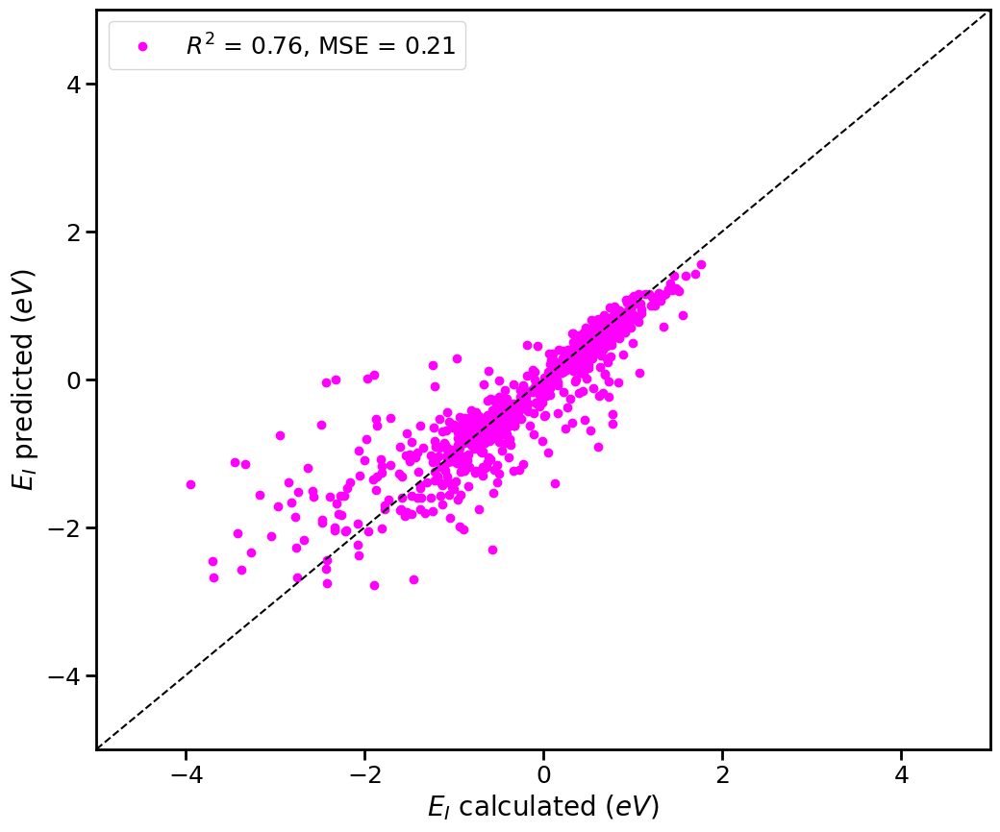

In [15]:
bestmodel = CBRegressor()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state=42)
kfold = KFold(n_splits = 5, shuffle = True, random_state = 42 )
### Cross validation scores
cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
scores = cross_val_score(bestmodel, X_train, y_train, cv = cv)
r2_mean = scores.mean()
print("%0.4f accuracy with a standard deviation of %0.4f" % (r2_mean, scores.std()))

### Cross validation predictions
yhat_bestmodel = cross_val_predict(bestmodel, X_train, y_train, cv = kfold)
Mean_sqr_error = metrics.mean_squared_error(y_train, yhat_bestmodel)
f, ax = plt.subplots(figsize=(12, 10))

# Increase axis font size
ax.tick_params(axis='both', labelsize=18)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)

label_mlr = "$R^2$ = %.2f, MSE = %.2f" % (r2_mean, Mean_sqr_error)
plt.plot(y_train, yhat_bestmodel, 'o', label=label_mlr, color = "magenta")
plt.ylabel(r"$E_{I}$ predicted ($eV$)", fontsize=20)
plt.xlabel(r"$E_{I}$ calculated ($eV$)", fontsize=20)
plt.legend(fontsize=18)
plt.xlim([-5, 5])
plt.ylim([-5, 5])
plt.plot([-5, 5], [-5, 5], 'k--')
plt.show()

#f.savefig("Results_Code_5/ParityPlot", dpi = 300, transparent = False, facecolor = 'white')

## Sensitivity Analysis

Learning rate set to 0.039148
0:	learn: 0.9547727	total: 845us	remaining: 845ms
1:	learn: 0.9364902	total: 1.56ms	remaining: 778ms
2:	learn: 0.9194511	total: 2.32ms	remaining: 772ms
3:	learn: 0.9037859	total: 3.07ms	remaining: 764ms
4:	learn: 0.8888591	total: 3.81ms	remaining: 758ms
5:	learn: 0.8738407	total: 4.62ms	remaining: 766ms
6:	learn: 0.8597456	total: 5.44ms	remaining: 772ms
7:	learn: 0.8457785	total: 6.28ms	remaining: 779ms
8:	learn: 0.8314474	total: 7.02ms	remaining: 773ms
9:	learn: 0.8181896	total: 7.65ms	remaining: 758ms
10:	learn: 0.8058280	total: 8.32ms	remaining: 748ms
11:	learn: 0.7941780	total: 8.97ms	remaining: 739ms
12:	learn: 0.7839103	total: 9.63ms	remaining: 731ms
13:	learn: 0.7741235	total: 10.3ms	remaining: 722ms
14:	learn: 0.7638081	total: 10.9ms	remaining: 717ms
15:	learn: 0.7528951	total: 11.6ms	remaining: 715ms
16:	learn: 0.7436337	total: 12.3ms	remaining: 714ms
17:	learn: 0.7341231	total: 13.1ms	remaining: 713ms
18:	learn: 0.7257282	total: 13.6ms	remaining:

294:	learn: 0.3215398	total: 180ms	remaining: 431ms
295:	learn: 0.3206409	total: 181ms	remaining: 431ms
296:	learn: 0.3201681	total: 182ms	remaining: 430ms
297:	learn: 0.3193686	total: 182ms	remaining: 429ms
298:	learn: 0.3188465	total: 183ms	remaining: 429ms
299:	learn: 0.3186128	total: 183ms	remaining: 428ms
300:	learn: 0.3179565	total: 184ms	remaining: 427ms
301:	learn: 0.3173734	total: 185ms	remaining: 427ms
302:	learn: 0.3165541	total: 185ms	remaining: 426ms
303:	learn: 0.3163779	total: 186ms	remaining: 425ms
304:	learn: 0.3156845	total: 186ms	remaining: 425ms
305:	learn: 0.3148058	total: 187ms	remaining: 424ms
306:	learn: 0.3144169	total: 188ms	remaining: 423ms
307:	learn: 0.3138582	total: 188ms	remaining: 423ms
308:	learn: 0.3134857	total: 189ms	remaining: 422ms
309:	learn: 0.3130078	total: 189ms	remaining: 421ms
310:	learn: 0.3128076	total: 190ms	remaining: 421ms
311:	learn: 0.3121984	total: 190ms	remaining: 420ms
312:	learn: 0.3118300	total: 191ms	remaining: 419ms
313:	learn: 

592:	learn: 0.2256163	total: 363ms	remaining: 249ms
593:	learn: 0.2251346	total: 363ms	remaining: 248ms
594:	learn: 0.2249330	total: 364ms	remaining: 248ms
595:	learn: 0.2246045	total: 365ms	remaining: 247ms
596:	learn: 0.2241936	total: 365ms	remaining: 247ms
597:	learn: 0.2239088	total: 366ms	remaining: 246ms
598:	learn: 0.2238731	total: 367ms	remaining: 245ms
599:	learn: 0.2235832	total: 367ms	remaining: 245ms
600:	learn: 0.2235493	total: 368ms	remaining: 244ms
601:	learn: 0.2232079	total: 368ms	remaining: 243ms
602:	learn: 0.2229934	total: 369ms	remaining: 243ms
603:	learn: 0.2228571	total: 369ms	remaining: 242ms
604:	learn: 0.2228425	total: 370ms	remaining: 242ms
605:	learn: 0.2226387	total: 371ms	remaining: 241ms
606:	learn: 0.2222588	total: 371ms	remaining: 240ms
607:	learn: 0.2220237	total: 372ms	remaining: 240ms
608:	learn: 0.2218056	total: 372ms	remaining: 239ms
609:	learn: 0.2213202	total: 373ms	remaining: 238ms
610:	learn: 0.2210579	total: 374ms	remaining: 238ms
611:	learn: 

924:	learn: 0.1670861	total: 546ms	remaining: 44.2ms
925:	learn: 0.1669038	total: 546ms	remaining: 43.7ms
926:	learn: 0.1667852	total: 547ms	remaining: 43.1ms
927:	learn: 0.1666282	total: 548ms	remaining: 42.5ms
928:	learn: 0.1664855	total: 548ms	remaining: 41.9ms
929:	learn: 0.1663480	total: 549ms	remaining: 41.3ms
930:	learn: 0.1661520	total: 549ms	remaining: 40.7ms
931:	learn: 0.1660050	total: 550ms	remaining: 40.1ms
932:	learn: 0.1659692	total: 551ms	remaining: 39.5ms
933:	learn: 0.1659562	total: 551ms	remaining: 38.9ms
934:	learn: 0.1657602	total: 552ms	remaining: 38.4ms
935:	learn: 0.1657465	total: 552ms	remaining: 37.8ms
936:	learn: 0.1657256	total: 553ms	remaining: 37.2ms
937:	learn: 0.1655647	total: 554ms	remaining: 36.6ms
938:	learn: 0.1654035	total: 554ms	remaining: 36ms
939:	learn: 0.1652284	total: 555ms	remaining: 35.4ms
940:	learn: 0.1651277	total: 555ms	remaining: 34.8ms
941:	learn: 0.1649558	total: 556ms	remaining: 34.2ms
942:	learn: 0.1646736	total: 556ms	remaining: 33

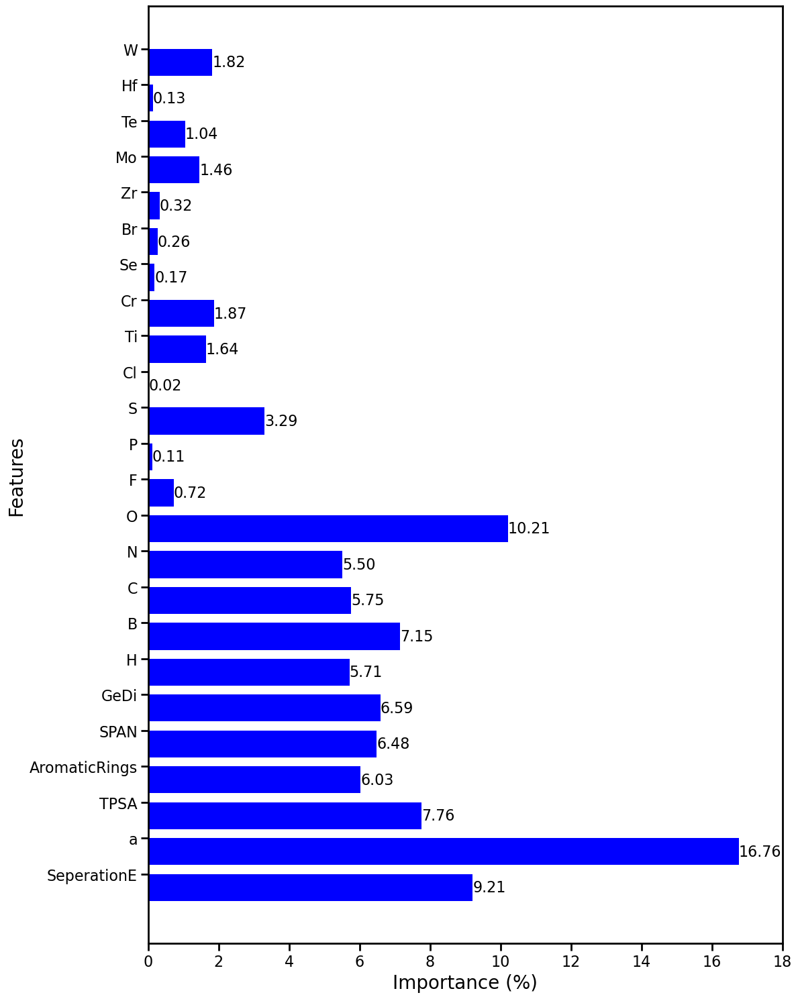

In [18]:
bestmodel.fit(X_train, y_train)
bestmodel_feature_importance = pd.DataFrame()
bestmodel_feature_importance['Feature'] = pd.DataFrame(X_test.columns)
bestmodel_feature_importance['Importance'] = pd.DataFrame(bestmodel.feature_importances_)
bestmodel_feature_importance = bestmodel_feature_importance[bestmodel_feature_importance.Importance > 0]

y = bestmodel_feature_importance.Importance
x = bestmodel_feature_importance.Feature

fig, ax = plt.subplots(figsize=(12,15)) 

# Increase axis font size
ax.tick_params(axis='both', labelsize=16)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)

width = 0.75 # the width of the bars 
ind = np.arange(len(y))  # the x locations for the groups
ax.barh(ind, y, width, color="blue")
ax.set_yticks(ind+width/2)
ax.set_yticklabels(x, minor=False)
#plt.title('Distribution of Feature Importance')
plt.xlabel('Importance (%)', fontsize=20)
plt.ylabel('Features', fontsize=20)
plt.xlim([0, 18])

# Print the values on the barchart
ax.bar_label(ax.containers[0],label_type='edge',fmt='%.2f', fontsize = 16)

plt.tight_layout()  # Ensures that the figure fits within the specified dimensions

plt.show()

#fig.savefig("Results_Code_5/FeatImp", dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Part IV: Exploration-Exploitation

<a id="modelselection"></a>

In [16]:
## We combined our 2D materials and gas molecules datasets 
## to make all possible hybrid material combinations. 
## And, calculated necessary features for these combinations in an auxiliary code. 


PredictionSet = pd.read_csv('PredictionSet_3')
PredictionSet = PredictionSet.astype({'CID' :'str'})
PredictionSet






,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,Li,...,Bk,Cf,Es,Fm,Md,No,Lr,SPAN,GeDi,System
0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.509434,6.313619,13_MoS2_0
1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.456396,6.211905,13_MoSe2_0
2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.451183,6.228006,13_MoTe2_0
3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.469165,6.245761,13_MoO2_0
4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,3.457050,6.216698,13_WS2_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,3.297814,6.552722,13593933_CrTe2_0
212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,3.302684,6.319375,13593933_CrO2_0
212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,3.291805,6.497326,13593933_ZrS2_0
212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,3.280770,6.377696,13593933_ZrSe2_0


In [17]:
FullSet = pd.concat([PredictionSet, MergeWithPredictionSet.drop(['IC_ENERGY'], axis = 1)], axis = 0).drop_duplicates(subset='System')
FullSet

,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,Li,...,Bk,Cf,Es,Fm,Md,No,Lr,SPAN,GeDi,System
0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.509434,6.313619,13_MoS2_0
1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.456396,6.211905,13_MoSe2_0
2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.451183,6.228006,13_MoTe2_0
3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.469165,6.245761,13_MoO2_0
4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,0,...,0,0,0,0,0,0,0,3.457050,6.216698,13_WS2_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0.0,0.092308,0,0,...,0,0,0,0,0,0,0,3.297814,6.552722,13593933_CrTe2_0
212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0.0,0.092308,0,0,...,0,0,0,0,0,0,0,3.302684,6.319375,13593933_CrO2_0
212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0.0,0.092308,0,0,...,0,0,0,0,0,0,0,3.291805,6.497326,13593933_ZrS2_0
212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0.0,0.092308,0,0,...,0,0,0,0,0,0,0,3.280770,6.377696,13593933_ZrSe2_0


## Bootstrap begins here

In [18]:
n_bs = 200
train_r2 = []
test_r2 = []
pred_r2 = []
remove_from_features = ['Name', 'SMILES', 'CID', 'System']
features = [c for c in FullSet.columns if c not in remove_from_features]
X_pred = FullSet[features]

fullset_bootstrapped_yhats = pd.DataFrame()

for i in range(n_bs):
    # Making n_bs bootstrapped samples
    train = resample(FinalSet, replace=True, n_samples=len(FinalSet), random_state=i)
    test = FinalSet[~FinalSet.index.isin(train.index)]
    
    # Split bootstrapped samples into train and test sets
    X_train = train[features]
    y_train = train["IC_ENERGY"]
    X_test = test[features]
    y_test = test["IC_ENERGY"]
    
    # Fit model on train sets
    bestmodel.fit(X_train, y_train)
    
    # Model scores
    r2_train = bestmodel.score(X_train, y_train)
    r2_test = bestmodel.score(X_test, y_test)
    train_r2.append(r2_train)
    test_r2.append(r2_test)
    
    # Predict on PredictionSet
    
    y_hat = bestmodel.predict(X_pred)
    
    #temp_df = pd.DataFrame(y_hat, columns=[])
    fullset_bootstrapped_yhats['y_pred_bs_{}'.format(i)] = y_hat
    fullset_bootstrapped_yhats = fullset_bootstrapped_yhats.copy()
    #bootstrapped_yhats[i] = pd.DataFrame(y_hat)




Learning rate set to 0.04142
0:	learn: 0.9460789	total: 1.43ms	remaining: 1.43s
1:	learn: 0.9265650	total: 2.41ms	remaining: 1.2s
2:	learn: 0.9058680	total: 3.29ms	remaining: 1.09s
3:	learn: 0.8867154	total: 4.13ms	remaining: 1.03s
4:	learn: 0.8671669	total: 4.99ms	remaining: 993ms
5:	learn: 0.8485807	total: 5.86ms	remaining: 970ms
6:	learn: 0.8317975	total: 6.61ms	remaining: 938ms
7:	learn: 0.8152377	total: 7.44ms	remaining: 922ms
8:	learn: 0.7987451	total: 8.37ms	remaining: 921ms
9:	learn: 0.7846438	total: 9.21ms	remaining: 912ms
10:	learn: 0.7709663	total: 9.99ms	remaining: 898ms
11:	learn: 0.7563926	total: 10.7ms	remaining: 880ms
12:	learn: 0.7429551	total: 11.4ms	remaining: 868ms
13:	learn: 0.7314381	total: 12.1ms	remaining: 855ms
14:	learn: 0.7185844	total: 13ms	remaining: 852ms
15:	learn: 0.7063924	total: 13.8ms	remaining: 846ms
16:	learn: 0.6948754	total: 14.5ms	remaining: 837ms
17:	learn: 0.6844936	total: 15.2ms	remaining: 830ms
18:	learn: 0.6743830	total: 16ms	remaining: 827m

258:	learn: 0.2727597	total: 180ms	remaining: 514ms
259:	learn: 0.2718262	total: 181ms	remaining: 514ms
260:	learn: 0.2706383	total: 181ms	remaining: 514ms
261:	learn: 0.2700469	total: 182ms	remaining: 513ms
262:	learn: 0.2699415	total: 183ms	remaining: 513ms
263:	learn: 0.2692944	total: 184ms	remaining: 512ms
264:	learn: 0.2686276	total: 185ms	remaining: 512ms
265:	learn: 0.2680970	total: 185ms	remaining: 511ms
266:	learn: 0.2676512	total: 186ms	remaining: 511ms
267:	learn: 0.2670070	total: 187ms	remaining: 511ms
268:	learn: 0.2665014	total: 188ms	remaining: 510ms
269:	learn: 0.2661600	total: 188ms	remaining: 509ms
270:	learn: 0.2654592	total: 189ms	remaining: 508ms
271:	learn: 0.2650451	total: 190ms	remaining: 508ms
272:	learn: 0.2645182	total: 190ms	remaining: 506ms
273:	learn: 0.2644363	total: 191ms	remaining: 505ms
274:	learn: 0.2640281	total: 191ms	remaining: 504ms
275:	learn: 0.2633521	total: 192ms	remaining: 504ms
276:	learn: 0.2629162	total: 193ms	remaining: 503ms
277:	learn: 

518:	learn: 0.1874094	total: 345ms	remaining: 319ms
519:	learn: 0.1872370	total: 345ms	remaining: 319ms
520:	learn: 0.1868264	total: 346ms	remaining: 318ms
521:	learn: 0.1864337	total: 346ms	remaining: 317ms
522:	learn: 0.1862521	total: 347ms	remaining: 317ms
523:	learn: 0.1860376	total: 348ms	remaining: 316ms
524:	learn: 0.1858282	total: 348ms	remaining: 315ms
525:	learn: 0.1856233	total: 349ms	remaining: 314ms
526:	learn: 0.1852622	total: 349ms	remaining: 314ms
527:	learn: 0.1849543	total: 350ms	remaining: 313ms
528:	learn: 0.1848304	total: 351ms	remaining: 312ms
529:	learn: 0.1846375	total: 351ms	remaining: 311ms
530:	learn: 0.1843314	total: 352ms	remaining: 311ms
531:	learn: 0.1840580	total: 352ms	remaining: 310ms
532:	learn: 0.1838567	total: 353ms	remaining: 309ms
533:	learn: 0.1838213	total: 354ms	remaining: 309ms
534:	learn: 0.1836124	total: 354ms	remaining: 308ms
535:	learn: 0.1832470	total: 355ms	remaining: 307ms
536:	learn: 0.1830078	total: 356ms	remaining: 307ms
537:	learn: 

830:	learn: 0.1331877	total: 529ms	remaining: 108ms
831:	learn: 0.1330387	total: 530ms	remaining: 107ms
832:	learn: 0.1328903	total: 531ms	remaining: 106ms
833:	learn: 0.1327601	total: 531ms	remaining: 106ms
834:	learn: 0.1326090	total: 532ms	remaining: 105ms
835:	learn: 0.1324544	total: 532ms	remaining: 104ms
836:	learn: 0.1321077	total: 533ms	remaining: 104ms
837:	learn: 0.1319432	total: 534ms	remaining: 103ms
838:	learn: 0.1316642	total: 534ms	remaining: 103ms
839:	learn: 0.1315104	total: 535ms	remaining: 102ms
840:	learn: 0.1313882	total: 536ms	remaining: 101ms
841:	learn: 0.1312194	total: 536ms	remaining: 101ms
842:	learn: 0.1311105	total: 537ms	remaining: 100ms
843:	learn: 0.1309652	total: 537ms	remaining: 99.3ms
844:	learn: 0.1308652	total: 538ms	remaining: 98.7ms
845:	learn: 0.1307641	total: 539ms	remaining: 98ms
846:	learn: 0.1306579	total: 539ms	remaining: 97.4ms
847:	learn: 0.1305761	total: 540ms	remaining: 96.8ms
848:	learn: 0.1304072	total: 540ms	remaining: 96.1ms
849:	lea

Learning rate set to 0.04142
0:	learn: 0.9991177	total: 791us	remaining: 791ms
1:	learn: 0.9805865	total: 1.65ms	remaining: 822ms
2:	learn: 0.9595008	total: 2.35ms	remaining: 781ms
3:	learn: 0.9398682	total: 3.03ms	remaining: 755ms
4:	learn: 0.9220881	total: 3.71ms	remaining: 739ms
5:	learn: 0.9057998	total: 4.53ms	remaining: 751ms
6:	learn: 0.8891555	total: 5.38ms	remaining: 763ms
7:	learn: 0.8736450	total: 6.52ms	remaining: 809ms
8:	learn: 0.8582026	total: 7.42ms	remaining: 817ms
9:	learn: 0.8432235	total: 8.75ms	remaining: 866ms
10:	learn: 0.8300526	total: 9.71ms	remaining: 873ms
11:	learn: 0.8174700	total: 10.8ms	remaining: 886ms
12:	learn: 0.8049816	total: 11.6ms	remaining: 883ms
13:	learn: 0.7948643	total: 12.5ms	remaining: 877ms
14:	learn: 0.7838164	total: 13.2ms	remaining: 868ms
15:	learn: 0.7712871	total: 14ms	remaining: 860ms
16:	learn: 0.7620364	total: 14.9ms	remaining: 864ms
17:	learn: 0.7524190	total: 15.8ms	remaining: 860ms
18:	learn: 0.7431752	total: 16.5ms	remaining: 85

241:	learn: 0.3302380	total: 163ms	remaining: 511ms
242:	learn: 0.3293509	total: 164ms	remaining: 511ms
243:	learn: 0.3284625	total: 165ms	remaining: 510ms
244:	learn: 0.3274322	total: 165ms	remaining: 509ms
245:	learn: 0.3273148	total: 166ms	remaining: 508ms
246:	learn: 0.3267258	total: 166ms	remaining: 507ms
247:	learn: 0.3263984	total: 167ms	remaining: 506ms
248:	learn: 0.3256689	total: 168ms	remaining: 505ms
249:	learn: 0.3252270	total: 168ms	remaining: 504ms
250:	learn: 0.3248754	total: 169ms	remaining: 504ms
251:	learn: 0.3241323	total: 169ms	remaining: 503ms
252:	learn: 0.3230324	total: 170ms	remaining: 502ms
253:	learn: 0.3217988	total: 171ms	remaining: 501ms
254:	learn: 0.3212489	total: 171ms	remaining: 500ms
255:	learn: 0.3209435	total: 172ms	remaining: 499ms
256:	learn: 0.3206508	total: 172ms	remaining: 498ms
257:	learn: 0.3195591	total: 173ms	remaining: 497ms
258:	learn: 0.3190021	total: 173ms	remaining: 496ms
259:	learn: 0.3181117	total: 174ms	remaining: 495ms
260:	learn: 

451:	learn: 0.2179645	total: 313ms	remaining: 380ms
452:	learn: 0.2176656	total: 314ms	remaining: 379ms
453:	learn: 0.2171318	total: 315ms	remaining: 379ms
454:	learn: 0.2167997	total: 315ms	remaining: 378ms
455:	learn: 0.2163870	total: 316ms	remaining: 377ms
456:	learn: 0.2159932	total: 317ms	remaining: 376ms
457:	learn: 0.2156735	total: 317ms	remaining: 375ms
458:	learn: 0.2156096	total: 318ms	remaining: 375ms
459:	learn: 0.2151808	total: 318ms	remaining: 374ms
460:	learn: 0.2151066	total: 319ms	remaining: 373ms
461:	learn: 0.2147752	total: 320ms	remaining: 372ms
462:	learn: 0.2145305	total: 320ms	remaining: 371ms
463:	learn: 0.2141244	total: 321ms	remaining: 370ms
464:	learn: 0.2139938	total: 321ms	remaining: 370ms
465:	learn: 0.2138305	total: 322ms	remaining: 369ms
466:	learn: 0.2133055	total: 322ms	remaining: 368ms
467:	learn: 0.2128707	total: 323ms	remaining: 367ms
468:	learn: 0.2124900	total: 324ms	remaining: 366ms
469:	learn: 0.2120497	total: 324ms	remaining: 366ms
470:	learn: 

706:	learn: 0.1523658	total: 479ms	remaining: 198ms
707:	learn: 0.1520741	total: 480ms	remaining: 198ms
708:	learn: 0.1518077	total: 480ms	remaining: 197ms
709:	learn: 0.1514995	total: 481ms	remaining: 197ms
710:	learn: 0.1513812	total: 482ms	remaining: 196ms
711:	learn: 0.1513181	total: 483ms	remaining: 195ms
712:	learn: 0.1512678	total: 483ms	remaining: 195ms
713:	learn: 0.1509520	total: 484ms	remaining: 194ms
714:	learn: 0.1507689	total: 485ms	remaining: 193ms
715:	learn: 0.1506471	total: 485ms	remaining: 192ms
716:	learn: 0.1503946	total: 486ms	remaining: 192ms
717:	learn: 0.1502060	total: 486ms	remaining: 191ms
718:	learn: 0.1501772	total: 487ms	remaining: 190ms
719:	learn: 0.1499140	total: 488ms	remaining: 190ms
720:	learn: 0.1498630	total: 488ms	remaining: 189ms
721:	learn: 0.1498082	total: 489ms	remaining: 188ms
722:	learn: 0.1497539	total: 490ms	remaining: 188ms
723:	learn: 0.1495668	total: 491ms	remaining: 187ms
724:	learn: 0.1493956	total: 491ms	remaining: 186ms
725:	learn: 

997:	learn: 0.1152537	total: 662ms	remaining: 1.33ms
998:	learn: 0.1152062	total: 663ms	remaining: 663us
999:	learn: 0.1151977	total: 664ms	remaining: 0us
Learning rate set to 0.04142
0:	learn: 0.9239900	total: 647us	remaining: 647ms
1:	learn: 0.9060963	total: 1.27ms	remaining: 634ms
2:	learn: 0.8875827	total: 1.91ms	remaining: 636ms
3:	learn: 0.8751603	total: 2.12ms	remaining: 527ms
4:	learn: 0.8603066	total: 2.67ms	remaining: 532ms
5:	learn: 0.8462970	total: 3.25ms	remaining: 539ms
6:	learn: 0.8318460	total: 3.81ms	remaining: 541ms
7:	learn: 0.8163865	total: 4.39ms	remaining: 545ms
8:	learn: 0.8037614	total: 5.05ms	remaining: 556ms
9:	learn: 0.7898081	total: 5.64ms	remaining: 558ms
10:	learn: 0.7771309	total: 6.22ms	remaining: 559ms
11:	learn: 0.7668951	total: 6.79ms	remaining: 560ms
12:	learn: 0.7561212	total: 7.36ms	remaining: 559ms
13:	learn: 0.7448088	total: 7.89ms	remaining: 556ms
14:	learn: 0.7354005	total: 8.46ms	remaining: 556ms
15:	learn: 0.7264637	total: 9.03ms	remaining: 5

442:	learn: 0.2348637	total: 275ms	remaining: 345ms
443:	learn: 0.2348332	total: 275ms	remaining: 345ms
444:	learn: 0.2342761	total: 276ms	remaining: 344ms
445:	learn: 0.2342368	total: 277ms	remaining: 344ms
446:	learn: 0.2339805	total: 277ms	remaining: 343ms
447:	learn: 0.2336354	total: 278ms	remaining: 342ms
448:	learn: 0.2332340	total: 279ms	remaining: 342ms
449:	learn: 0.2328251	total: 279ms	remaining: 341ms
450:	learn: 0.2324971	total: 280ms	remaining: 341ms
451:	learn: 0.2321383	total: 281ms	remaining: 340ms
452:	learn: 0.2319104	total: 281ms	remaining: 340ms
453:	learn: 0.2316308	total: 282ms	remaining: 339ms
454:	learn: 0.2312733	total: 282ms	remaining: 338ms
455:	learn: 0.2311253	total: 283ms	remaining: 338ms
456:	learn: 0.2308258	total: 284ms	remaining: 337ms
457:	learn: 0.2306333	total: 284ms	remaining: 336ms
458:	learn: 0.2304991	total: 285ms	remaining: 336ms
459:	learn: 0.2302934	total: 286ms	remaining: 335ms
460:	learn: 0.2302658	total: 286ms	remaining: 335ms
461:	learn: 

673:	learn: 0.1814241	total: 426ms	remaining: 206ms
674:	learn: 0.1811413	total: 427ms	remaining: 205ms
675:	learn: 0.1809361	total: 428ms	remaining: 205ms
676:	learn: 0.1807589	total: 428ms	remaining: 204ms
677:	learn: 0.1804379	total: 429ms	remaining: 204ms
678:	learn: 0.1802340	total: 430ms	remaining: 203ms
679:	learn: 0.1801070	total: 431ms	remaining: 203ms
680:	learn: 0.1800449	total: 432ms	remaining: 202ms
681:	learn: 0.1797977	total: 433ms	remaining: 202ms
682:	learn: 0.1797730	total: 434ms	remaining: 201ms
683:	learn: 0.1797494	total: 434ms	remaining: 201ms
684:	learn: 0.1795067	total: 435ms	remaining: 200ms
685:	learn: 0.1791726	total: 436ms	remaining: 200ms
686:	learn: 0.1790724	total: 437ms	remaining: 199ms
687:	learn: 0.1788677	total: 438ms	remaining: 199ms
688:	learn: 0.1787487	total: 439ms	remaining: 198ms
689:	learn: 0.1785982	total: 440ms	remaining: 198ms
690:	learn: 0.1783419	total: 441ms	remaining: 197ms
691:	learn: 0.1782508	total: 442ms	remaining: 197ms
692:	learn: 

934:	learn: 0.1389692	total: 599ms	remaining: 41.7ms
935:	learn: 0.1387751	total: 601ms	remaining: 41.1ms
936:	learn: 0.1385494	total: 601ms	remaining: 40.4ms
937:	learn: 0.1385295	total: 602ms	remaining: 39.8ms
938:	learn: 0.1384558	total: 603ms	remaining: 39.2ms
939:	learn: 0.1383597	total: 604ms	remaining: 38.5ms
940:	learn: 0.1381512	total: 604ms	remaining: 37.9ms
941:	learn: 0.1380590	total: 605ms	remaining: 37.3ms
942:	learn: 0.1379430	total: 606ms	remaining: 36.6ms
943:	learn: 0.1378589	total: 606ms	remaining: 36ms
944:	learn: 0.1376810	total: 607ms	remaining: 35.3ms
945:	learn: 0.1375197	total: 608ms	remaining: 34.7ms
946:	learn: 0.1374845	total: 608ms	remaining: 34.1ms
947:	learn: 0.1373445	total: 609ms	remaining: 33.4ms
948:	learn: 0.1371841	total: 610ms	remaining: 32.8ms
949:	learn: 0.1370527	total: 611ms	remaining: 32.1ms
950:	learn: 0.1369525	total: 611ms	remaining: 31.5ms
951:	learn: 0.1368604	total: 612ms	remaining: 30.9ms
952:	learn: 0.1366933	total: 613ms	remaining: 30

117:	learn: 0.4301779	total: 73.8ms	remaining: 552ms
118:	learn: 0.4298723	total: 74.9ms	remaining: 555ms
119:	learn: 0.4285726	total: 75.8ms	remaining: 556ms
120:	learn: 0.4265019	total: 76.6ms	remaining: 557ms
121:	learn: 0.4248219	total: 77.3ms	remaining: 557ms
122:	learn: 0.4240749	total: 78ms	remaining: 556ms
123:	learn: 0.4230761	total: 78.5ms	remaining: 555ms
124:	learn: 0.4222779	total: 79.2ms	remaining: 554ms
125:	learn: 0.4212637	total: 79.8ms	remaining: 553ms
126:	learn: 0.4199111	total: 80.4ms	remaining: 553ms
127:	learn: 0.4189870	total: 81.1ms	remaining: 552ms
128:	learn: 0.4171128	total: 81.7ms	remaining: 551ms
129:	learn: 0.4163657	total: 82.3ms	remaining: 551ms
130:	learn: 0.4147877	total: 82.9ms	remaining: 550ms
131:	learn: 0.4136098	total: 83.6ms	remaining: 550ms
132:	learn: 0.4127290	total: 84.2ms	remaining: 549ms
133:	learn: 0.4108185	total: 84.9ms	remaining: 549ms
134:	learn: 0.4091008	total: 85.5ms	remaining: 548ms
135:	learn: 0.4078108	total: 86.2ms	remaining: 5

429:	learn: 0.2263445	total: 256ms	remaining: 339ms
430:	learn: 0.2262113	total: 257ms	remaining: 339ms
431:	learn: 0.2255739	total: 257ms	remaining: 338ms
432:	learn: 0.2254016	total: 258ms	remaining: 338ms
433:	learn: 0.2253698	total: 258ms	remaining: 337ms
434:	learn: 0.2251384	total: 259ms	remaining: 336ms
435:	learn: 0.2251113	total: 260ms	remaining: 336ms
436:	learn: 0.2250127	total: 260ms	remaining: 335ms
437:	learn: 0.2249874	total: 261ms	remaining: 335ms
438:	learn: 0.2247796	total: 261ms	remaining: 334ms
439:	learn: 0.2243652	total: 262ms	remaining: 334ms
440:	learn: 0.2240685	total: 263ms	remaining: 333ms
441:	learn: 0.2240461	total: 263ms	remaining: 332ms
442:	learn: 0.2236288	total: 264ms	remaining: 332ms
443:	learn: 0.2236079	total: 264ms	remaining: 331ms
444:	learn: 0.2233373	total: 265ms	remaining: 330ms
445:	learn: 0.2228302	total: 266ms	remaining: 330ms
446:	learn: 0.2223261	total: 266ms	remaining: 329ms
447:	learn: 0.2223056	total: 267ms	remaining: 329ms
448:	learn: 

733:	learn: 0.1594088	total: 440ms	remaining: 159ms
734:	learn: 0.1593779	total: 440ms	remaining: 159ms
735:	learn: 0.1592722	total: 441ms	remaining: 158ms
736:	learn: 0.1592016	total: 441ms	remaining: 158ms
737:	learn: 0.1591261	total: 442ms	remaining: 157ms
738:	learn: 0.1591151	total: 443ms	remaining: 156ms
739:	learn: 0.1590531	total: 443ms	remaining: 156ms
740:	learn: 0.1589104	total: 444ms	remaining: 155ms
741:	learn: 0.1586063	total: 445ms	remaining: 155ms
742:	learn: 0.1584721	total: 445ms	remaining: 154ms
743:	learn: 0.1583433	total: 446ms	remaining: 153ms
744:	learn: 0.1580657	total: 446ms	remaining: 153ms
745:	learn: 0.1579374	total: 447ms	remaining: 152ms
746:	learn: 0.1577258	total: 447ms	remaining: 152ms
747:	learn: 0.1577132	total: 448ms	remaining: 151ms
748:	learn: 0.1573166	total: 449ms	remaining: 150ms
749:	learn: 0.1571587	total: 449ms	remaining: 150ms
750:	learn: 0.1569145	total: 450ms	remaining: 149ms
751:	learn: 0.1568969	total: 450ms	remaining: 149ms
752:	learn: 

971:	learn: 0.1277424	total: 590ms	remaining: 17ms
972:	learn: 0.1276025	total: 591ms	remaining: 16.4ms
973:	learn: 0.1274406	total: 591ms	remaining: 15.8ms
974:	learn: 0.1273627	total: 592ms	remaining: 15.2ms
975:	learn: 0.1271204	total: 593ms	remaining: 14.6ms
976:	learn: 0.1269351	total: 593ms	remaining: 14ms
977:	learn: 0.1268274	total: 594ms	remaining: 13.4ms
978:	learn: 0.1267169	total: 595ms	remaining: 12.8ms
979:	learn: 0.1265860	total: 595ms	remaining: 12.1ms
980:	learn: 0.1264514	total: 596ms	remaining: 11.5ms
981:	learn: 0.1264468	total: 597ms	remaining: 10.9ms
982:	learn: 0.1262852	total: 597ms	remaining: 10.3ms
983:	learn: 0.1262821	total: 598ms	remaining: 9.72ms
984:	learn: 0.1261285	total: 598ms	remaining: 9.11ms
985:	learn: 0.1261207	total: 599ms	remaining: 8.51ms
986:	learn: 0.1259656	total: 600ms	remaining: 7.9ms
987:	learn: 0.1258842	total: 600ms	remaining: 7.29ms
988:	learn: 0.1258263	total: 601ms	remaining: 6.69ms
989:	learn: 0.1258231	total: 602ms	remaining: 6.08m

349:	learn: 0.2698775	total: 230ms	remaining: 426ms
350:	learn: 0.2693895	total: 230ms	remaining: 426ms
351:	learn: 0.2691545	total: 231ms	remaining: 425ms
352:	learn: 0.2685131	total: 232ms	remaining: 425ms
353:	learn: 0.2679556	total: 232ms	remaining: 424ms
354:	learn: 0.2671383	total: 233ms	remaining: 423ms
355:	learn: 0.2669542	total: 233ms	remaining: 422ms
356:	learn: 0.2663917	total: 234ms	remaining: 422ms
357:	learn: 0.2656103	total: 235ms	remaining: 421ms
358:	learn: 0.2651399	total: 235ms	remaining: 420ms
359:	learn: 0.2644217	total: 236ms	remaining: 419ms
360:	learn: 0.2640578	total: 236ms	remaining: 419ms
361:	learn: 0.2633243	total: 237ms	remaining: 418ms
362:	learn: 0.2631289	total: 238ms	remaining: 417ms
363:	learn: 0.2627284	total: 238ms	remaining: 416ms
364:	learn: 0.2621954	total: 239ms	remaining: 416ms
365:	learn: 0.2613247	total: 240ms	remaining: 415ms
366:	learn: 0.2605911	total: 240ms	remaining: 414ms
367:	learn: 0.2601324	total: 241ms	remaining: 414ms
368:	learn: 

613:	learn: 0.1825656	total: 396ms	remaining: 249ms
614:	learn: 0.1824253	total: 397ms	remaining: 249ms
615:	learn: 0.1822104	total: 398ms	remaining: 248ms
616:	learn: 0.1821081	total: 398ms	remaining: 247ms
617:	learn: 0.1818497	total: 399ms	remaining: 247ms
618:	learn: 0.1816496	total: 400ms	remaining: 246ms
619:	learn: 0.1813243	total: 400ms	remaining: 245ms
620:	learn: 0.1809774	total: 401ms	remaining: 245ms
621:	learn: 0.1805940	total: 401ms	remaining: 244ms
622:	learn: 0.1804361	total: 402ms	remaining: 243ms
623:	learn: 0.1800603	total: 403ms	remaining: 243ms
624:	learn: 0.1797351	total: 403ms	remaining: 242ms
625:	learn: 0.1793611	total: 404ms	remaining: 241ms
626:	learn: 0.1792817	total: 404ms	remaining: 240ms
627:	learn: 0.1789508	total: 405ms	remaining: 240ms
628:	learn: 0.1786870	total: 405ms	remaining: 239ms
629:	learn: 0.1785153	total: 406ms	remaining: 238ms
630:	learn: 0.1783382	total: 406ms	remaining: 238ms
631:	learn: 0.1781803	total: 407ms	remaining: 237ms
632:	learn: 

935:	learn: 0.1299594	total: 581ms	remaining: 39.7ms
936:	learn: 0.1299133	total: 582ms	remaining: 39.1ms
937:	learn: 0.1297188	total: 582ms	remaining: 38.5ms
938:	learn: 0.1297006	total: 583ms	remaining: 37.9ms
939:	learn: 0.1296109	total: 584ms	remaining: 37.3ms
940:	learn: 0.1295289	total: 584ms	remaining: 36.6ms
941:	learn: 0.1294224	total: 585ms	remaining: 36ms
942:	learn: 0.1293000	total: 585ms	remaining: 35.4ms
943:	learn: 0.1291745	total: 586ms	remaining: 34.8ms
944:	learn: 0.1289894	total: 587ms	remaining: 34.1ms
945:	learn: 0.1289515	total: 587ms	remaining: 33.5ms
946:	learn: 0.1288603	total: 588ms	remaining: 32.9ms
947:	learn: 0.1286694	total: 589ms	remaining: 32.3ms
948:	learn: 0.1285469	total: 590ms	remaining: 31.7ms
949:	learn: 0.1285015	total: 590ms	remaining: 31.1ms
950:	learn: 0.1284361	total: 591ms	remaining: 30.4ms
951:	learn: 0.1282542	total: 591ms	remaining: 29.8ms
952:	learn: 0.1282263	total: 592ms	remaining: 29.2ms
953:	learn: 0.1281539	total: 593ms	remaining: 28

322:	learn: 0.2700987	total: 222ms	remaining: 465ms
323:	learn: 0.2694795	total: 222ms	remaining: 464ms
324:	learn: 0.2687976	total: 223ms	remaining: 463ms
325:	learn: 0.2682309	total: 224ms	remaining: 462ms
326:	learn: 0.2678962	total: 224ms	remaining: 462ms
327:	learn: 0.2674583	total: 225ms	remaining: 461ms
328:	learn: 0.2666574	total: 225ms	remaining: 460ms
329:	learn: 0.2659078	total: 226ms	remaining: 459ms
330:	learn: 0.2653706	total: 227ms	remaining: 458ms
331:	learn: 0.2649251	total: 227ms	remaining: 457ms
332:	learn: 0.2646367	total: 228ms	remaining: 456ms
333:	learn: 0.2642718	total: 228ms	remaining: 455ms
334:	learn: 0.2639083	total: 229ms	remaining: 454ms
335:	learn: 0.2634400	total: 229ms	remaining: 453ms
336:	learn: 0.2631255	total: 230ms	remaining: 453ms
337:	learn: 0.2625659	total: 231ms	remaining: 452ms
338:	learn: 0.2618281	total: 231ms	remaining: 451ms
339:	learn: 0.2613168	total: 232ms	remaining: 450ms
340:	learn: 0.2608600	total: 232ms	remaining: 449ms
341:	learn: 

549:	learn: 0.1905521	total: 371ms	remaining: 303ms
550:	learn: 0.1902932	total: 371ms	remaining: 303ms
551:	learn: 0.1899565	total: 372ms	remaining: 302ms
552:	learn: 0.1897484	total: 373ms	remaining: 301ms
553:	learn: 0.1894638	total: 373ms	remaining: 300ms
554:	learn: 0.1892016	total: 374ms	remaining: 300ms
555:	learn: 0.1890428	total: 374ms	remaining: 299ms
556:	learn: 0.1888262	total: 375ms	remaining: 298ms
557:	learn: 0.1886280	total: 376ms	remaining: 297ms
558:	learn: 0.1884121	total: 376ms	remaining: 297ms
559:	learn: 0.1882113	total: 377ms	remaining: 296ms
560:	learn: 0.1879054	total: 377ms	remaining: 295ms
561:	learn: 0.1875873	total: 378ms	remaining: 295ms
562:	learn: 0.1874767	total: 378ms	remaining: 294ms
563:	learn: 0.1874355	total: 379ms	remaining: 293ms
564:	learn: 0.1872443	total: 380ms	remaining: 292ms
565:	learn: 0.1872013	total: 380ms	remaining: 292ms
566:	learn: 0.1870192	total: 381ms	remaining: 291ms
567:	learn: 0.1869054	total: 381ms	remaining: 290ms
568:	learn: 

869:	learn: 0.1357390	total: 553ms	remaining: 82.6ms
870:	learn: 0.1356956	total: 554ms	remaining: 82ms
871:	learn: 0.1356136	total: 554ms	remaining: 81.4ms
872:	learn: 0.1356088	total: 555ms	remaining: 80.7ms
873:	learn: 0.1355127	total: 556ms	remaining: 80.1ms
874:	learn: 0.1354436	total: 556ms	remaining: 79.5ms
875:	learn: 0.1353163	total: 557ms	remaining: 78.8ms
876:	learn: 0.1351949	total: 557ms	remaining: 78.2ms
877:	learn: 0.1350874	total: 558ms	remaining: 77.5ms
878:	learn: 0.1349871	total: 559ms	remaining: 76.9ms
879:	learn: 0.1348396	total: 559ms	remaining: 76.2ms
880:	learn: 0.1347143	total: 560ms	remaining: 75.6ms
881:	learn: 0.1346546	total: 560ms	remaining: 74.9ms
882:	learn: 0.1345307	total: 561ms	remaining: 74.3ms
883:	learn: 0.1343232	total: 561ms	remaining: 73.7ms
884:	learn: 0.1342117	total: 562ms	remaining: 73ms
885:	learn: 0.1341261	total: 562ms	remaining: 72.4ms
886:	learn: 0.1338378	total: 563ms	remaining: 71.7ms
887:	learn: 0.1337107	total: 564ms	remaining: 71.1

52:	learn: 0.5273662	total: 34ms	remaining: 608ms
53:	learn: 0.5247669	total: 34.9ms	remaining: 612ms
54:	learn: 0.5222264	total: 35.5ms	remaining: 611ms
55:	learn: 0.5188826	total: 36.4ms	remaining: 613ms
56:	learn: 0.5159696	total: 37ms	remaining: 612ms
57:	learn: 0.5129808	total: 37.7ms	remaining: 612ms
58:	learn: 0.5100555	total: 38.3ms	remaining: 611ms
59:	learn: 0.5061372	total: 39ms	remaining: 611ms
60:	learn: 0.5041880	total: 39.7ms	remaining: 611ms
61:	learn: 0.5018254	total: 40.5ms	remaining: 613ms
62:	learn: 0.4994040	total: 41.2ms	remaining: 613ms
63:	learn: 0.4970456	total: 41.8ms	remaining: 612ms
64:	learn: 0.4951290	total: 42.6ms	remaining: 612ms
65:	learn: 0.4921173	total: 43.2ms	remaining: 612ms
66:	learn: 0.4899746	total: 44ms	remaining: 613ms
67:	learn: 0.4881964	total: 44.8ms	remaining: 613ms
68:	learn: 0.4853499	total: 45.4ms	remaining: 613ms
69:	learn: 0.4839061	total: 46.1ms	remaining: 612ms
70:	learn: 0.4825183	total: 46.8ms	remaining: 612ms
71:	learn: 0.4807399

280:	learn: 0.2893560	total: 216ms	remaining: 552ms
281:	learn: 0.2888925	total: 217ms	remaining: 553ms
282:	learn: 0.2882701	total: 219ms	remaining: 554ms
283:	learn: 0.2876795	total: 220ms	remaining: 554ms
284:	learn: 0.2876440	total: 220ms	remaining: 553ms
285:	learn: 0.2867821	total: 221ms	remaining: 552ms
286:	learn: 0.2859150	total: 222ms	remaining: 552ms
287:	learn: 0.2857308	total: 223ms	remaining: 551ms
288:	learn: 0.2848826	total: 224ms	remaining: 550ms
289:	learn: 0.2842269	total: 224ms	remaining: 549ms
290:	learn: 0.2840428	total: 225ms	remaining: 548ms
291:	learn: 0.2833430	total: 226ms	remaining: 548ms
292:	learn: 0.2833101	total: 227ms	remaining: 547ms
293:	learn: 0.2826293	total: 228ms	remaining: 547ms
294:	learn: 0.2818598	total: 229ms	remaining: 546ms
295:	learn: 0.2809420	total: 229ms	remaining: 545ms
296:	learn: 0.2808329	total: 230ms	remaining: 545ms
297:	learn: 0.2808016	total: 231ms	remaining: 544ms
298:	learn: 0.2801373	total: 232ms	remaining: 544ms
299:	learn: 

549:	learn: 0.1926973	total: 397ms	remaining: 325ms
550:	learn: 0.1924070	total: 397ms	remaining: 324ms
551:	learn: 0.1921989	total: 398ms	remaining: 323ms
552:	learn: 0.1921826	total: 399ms	remaining: 322ms
553:	learn: 0.1919304	total: 399ms	remaining: 321ms
554:	learn: 0.1917465	total: 400ms	remaining: 321ms
555:	learn: 0.1917314	total: 400ms	remaining: 320ms
556:	learn: 0.1917081	total: 401ms	remaining: 319ms
557:	learn: 0.1916591	total: 402ms	remaining: 318ms
558:	learn: 0.1913059	total: 402ms	remaining: 317ms
559:	learn: 0.1910301	total: 403ms	remaining: 317ms
560:	learn: 0.1905206	total: 403ms	remaining: 316ms
561:	learn: 0.1901228	total: 404ms	remaining: 315ms
562:	learn: 0.1901098	total: 405ms	remaining: 314ms
563:	learn: 0.1896717	total: 405ms	remaining: 313ms
564:	learn: 0.1893724	total: 406ms	remaining: 312ms
565:	learn: 0.1890997	total: 406ms	remaining: 312ms
566:	learn: 0.1886858	total: 407ms	remaining: 311ms
567:	learn: 0.1886085	total: 408ms	remaining: 310ms
568:	learn: 

851:	learn: 0.1403397	total: 580ms	remaining: 101ms
852:	learn: 0.1401918	total: 581ms	remaining: 100ms
853:	learn: 0.1399104	total: 582ms	remaining: 99.5ms
854:	learn: 0.1397974	total: 583ms	remaining: 98.9ms
855:	learn: 0.1396975	total: 584ms	remaining: 98.3ms
856:	learn: 0.1395944	total: 585ms	remaining: 97.6ms
857:	learn: 0.1395231	total: 586ms	remaining: 97ms
858:	learn: 0.1393809	total: 587ms	remaining: 96.3ms
859:	learn: 0.1393723	total: 587ms	remaining: 95.6ms
860:	learn: 0.1392777	total: 588ms	remaining: 95ms
861:	learn: 0.1390808	total: 589ms	remaining: 94.3ms
862:	learn: 0.1390628	total: 590ms	remaining: 93.6ms
863:	learn: 0.1389107	total: 591ms	remaining: 93ms
864:	learn: 0.1389038	total: 591ms	remaining: 92.3ms
865:	learn: 0.1387748	total: 592ms	remaining: 91.6ms
866:	learn: 0.1385378	total: 593ms	remaining: 90.9ms
867:	learn: 0.1385210	total: 593ms	remaining: 90.2ms
868:	learn: 0.1384376	total: 594ms	remaining: 89.5ms
869:	learn: 0.1384188	total: 595ms	remaining: 88.9ms
8

264:	learn: 0.2967050	total: 165ms	remaining: 457ms
265:	learn: 0.2962016	total: 166ms	remaining: 459ms
266:	learn: 0.2953425	total: 167ms	remaining: 459ms
267:	learn: 0.2951230	total: 168ms	remaining: 458ms
268:	learn: 0.2943026	total: 169ms	remaining: 458ms
269:	learn: 0.2937249	total: 170ms	remaining: 459ms
270:	learn: 0.2935169	total: 170ms	remaining: 458ms
271:	learn: 0.2932334	total: 171ms	remaining: 458ms
272:	learn: 0.2926368	total: 172ms	remaining: 459ms
273:	learn: 0.2920753	total: 174ms	remaining: 460ms
274:	learn: 0.2917617	total: 175ms	remaining: 460ms
275:	learn: 0.2907078	total: 176ms	remaining: 460ms
276:	learn: 0.2897237	total: 176ms	remaining: 461ms
277:	learn: 0.2894313	total: 177ms	remaining: 460ms
278:	learn: 0.2885746	total: 178ms	remaining: 460ms
279:	learn: 0.2881620	total: 179ms	remaining: 460ms
280:	learn: 0.2877972	total: 180ms	remaining: 460ms
281:	learn: 0.2874392	total: 181ms	remaining: 462ms
282:	learn: 0.2865518	total: 182ms	remaining: 462ms
283:	learn: 

525:	learn: 0.2003755	total: 344ms	remaining: 310ms
526:	learn: 0.2001043	total: 345ms	remaining: 310ms
527:	learn: 0.1999538	total: 346ms	remaining: 309ms
528:	learn: 0.1999049	total: 347ms	remaining: 309ms
529:	learn: 0.1997116	total: 348ms	remaining: 308ms
530:	learn: 0.1992859	total: 349ms	remaining: 308ms
531:	learn: 0.1990645	total: 349ms	remaining: 307ms
532:	learn: 0.1987289	total: 350ms	remaining: 307ms
533:	learn: 0.1984439	total: 351ms	remaining: 306ms
534:	learn: 0.1981713	total: 352ms	remaining: 306ms
535:	learn: 0.1980143	total: 352ms	remaining: 305ms
536:	learn: 0.1977237	total: 353ms	remaining: 305ms
537:	learn: 0.1975568	total: 354ms	remaining: 304ms
538:	learn: 0.1973167	total: 356ms	remaining: 305ms
539:	learn: 0.1971717	total: 357ms	remaining: 304ms
540:	learn: 0.1970265	total: 358ms	remaining: 304ms
541:	learn: 0.1966879	total: 359ms	remaining: 303ms
542:	learn: 0.1965736	total: 359ms	remaining: 302ms
543:	learn: 0.1962094	total: 360ms	remaining: 302ms
544:	learn: 

779:	learn: 0.1516961	total: 510ms	remaining: 144ms
780:	learn: 0.1514490	total: 511ms	remaining: 143ms
781:	learn: 0.1513587	total: 512ms	remaining: 143ms
782:	learn: 0.1512039	total: 512ms	remaining: 142ms
783:	learn: 0.1510229	total: 513ms	remaining: 141ms
784:	learn: 0.1505978	total: 513ms	remaining: 141ms
785:	learn: 0.1505103	total: 514ms	remaining: 140ms
786:	learn: 0.1503999	total: 515ms	remaining: 139ms
787:	learn: 0.1503842	total: 515ms	remaining: 139ms
788:	learn: 0.1501849	total: 516ms	remaining: 138ms
789:	learn: 0.1500155	total: 516ms	remaining: 137ms
790:	learn: 0.1499035	total: 517ms	remaining: 137ms
791:	learn: 0.1496509	total: 518ms	remaining: 136ms
792:	learn: 0.1496283	total: 518ms	remaining: 135ms
793:	learn: 0.1492206	total: 519ms	remaining: 135ms
794:	learn: 0.1490889	total: 519ms	remaining: 134ms
795:	learn: 0.1489961	total: 520ms	remaining: 133ms
796:	learn: 0.1489054	total: 521ms	remaining: 133ms
797:	learn: 0.1486612	total: 521ms	remaining: 132ms
798:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9406812	total: 903us	remaining: 903ms
1:	learn: 0.9230920	total: 1.67ms	remaining: 832ms
2:	learn: 0.9047872	total: 2.44ms	remaining: 812ms
3:	learn: 0.8874066	total: 3.2ms	remaining: 798ms
4:	learn: 0.8705819	total: 4.07ms	remaining: 810ms
5:	learn: 0.8543594	total: 4.81ms	remaining: 798ms
6:	learn: 0.8389911	total: 5.56ms	remaining: 788ms
7:	learn: 0.8250125	total: 6.37ms	remaining: 789ms
8:	learn: 0.8101523	total: 7.14ms	remaining: 787ms
9:	learn: 0.7962714	total: 7.88ms	remaining: 780ms
10:	learn: 0.7835513	total: 8.7ms	remaining: 782ms
11:	learn: 0.7715333	total: 9.37ms	remaining: 771ms
12:	learn: 0.7599707	total: 10.1ms	remaining: 769ms
13:	learn: 0.7502362	total: 10.8ms	remaining: 759ms
14:	learn: 0.7382923	total: 11.4ms	remaining: 750ms
15:	learn: 0.7288287	total: 12ms	remaining: 741ms
16:	learn: 0.7202369	total: 12.7ms	remaining: 736ms
17:	learn: 0.7113551	total: 13.4ms	remaining: 730ms
18:	learn: 0.7023665	total: 14.1ms	remaining: 728m

279:	learn: 0.2810704	total: 179ms	remaining: 461ms
280:	learn: 0.2807355	total: 180ms	remaining: 461ms
281:	learn: 0.2799621	total: 181ms	remaining: 461ms
282:	learn: 0.2793937	total: 182ms	remaining: 460ms
283:	learn: 0.2789767	total: 182ms	remaining: 459ms
284:	learn: 0.2788219	total: 183ms	remaining: 459ms
285:	learn: 0.2779594	total: 184ms	remaining: 459ms
286:	learn: 0.2775213	total: 184ms	remaining: 458ms
287:	learn: 0.2770608	total: 185ms	remaining: 458ms
288:	learn: 0.2763764	total: 186ms	remaining: 457ms
289:	learn: 0.2760898	total: 186ms	remaining: 456ms
290:	learn: 0.2757020	total: 187ms	remaining: 455ms
291:	learn: 0.2749410	total: 188ms	remaining: 455ms
292:	learn: 0.2744766	total: 188ms	remaining: 454ms
293:	learn: 0.2742676	total: 189ms	remaining: 453ms
294:	learn: 0.2737554	total: 189ms	remaining: 452ms
295:	learn: 0.2733697	total: 190ms	remaining: 452ms
296:	learn: 0.2729057	total: 191ms	remaining: 452ms
297:	learn: 0.2724265	total: 192ms	remaining: 452ms
298:	learn: 

490:	learn: 0.2045650	total: 324ms	remaining: 336ms
491:	learn: 0.2040826	total: 325ms	remaining: 335ms
492:	learn: 0.2038316	total: 325ms	remaining: 334ms
493:	learn: 0.2033334	total: 326ms	remaining: 334ms
494:	learn: 0.2030404	total: 326ms	remaining: 333ms
495:	learn: 0.2026805	total: 327ms	remaining: 332ms
496:	learn: 0.2023359	total: 328ms	remaining: 332ms
497:	learn: 0.2019484	total: 328ms	remaining: 331ms
498:	learn: 0.2017732	total: 329ms	remaining: 330ms
499:	learn: 0.2016451	total: 330ms	remaining: 330ms
500:	learn: 0.2013128	total: 330ms	remaining: 329ms
501:	learn: 0.2012474	total: 331ms	remaining: 328ms
502:	learn: 0.2010582	total: 331ms	remaining: 327ms
503:	learn: 0.2006592	total: 332ms	remaining: 327ms
504:	learn: 0.2004708	total: 333ms	remaining: 326ms
505:	learn: 0.2001675	total: 333ms	remaining: 325ms
506:	learn: 0.2000620	total: 334ms	remaining: 325ms
507:	learn: 0.1999241	total: 334ms	remaining: 324ms
508:	learn: 0.1996477	total: 335ms	remaining: 323ms
509:	learn: 

807:	learn: 0.1441468	total: 507ms	remaining: 121ms
808:	learn: 0.1440106	total: 508ms	remaining: 120ms
809:	learn: 0.1437637	total: 509ms	remaining: 119ms
810:	learn: 0.1435420	total: 509ms	remaining: 119ms
811:	learn: 0.1433380	total: 510ms	remaining: 118ms
812:	learn: 0.1432240	total: 511ms	remaining: 117ms
813:	learn: 0.1430528	total: 511ms	remaining: 117ms
814:	learn: 0.1429848	total: 512ms	remaining: 116ms
815:	learn: 0.1429121	total: 512ms	remaining: 116ms
816:	learn: 0.1427192	total: 513ms	remaining: 115ms
817:	learn: 0.1425544	total: 513ms	remaining: 114ms
818:	learn: 0.1423153	total: 514ms	remaining: 114ms
819:	learn: 0.1422049	total: 515ms	remaining: 113ms
820:	learn: 0.1421084	total: 515ms	remaining: 112ms
821:	learn: 0.1419924	total: 516ms	remaining: 112ms
822:	learn: 0.1418099	total: 516ms	remaining: 111ms
823:	learn: 0.1415882	total: 517ms	remaining: 110ms
824:	learn: 0.1414913	total: 518ms	remaining: 110ms
825:	learn: 0.1413678	total: 518ms	remaining: 109ms
826:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9617944	total: 957us	remaining: 956ms
1:	learn: 0.9438385	total: 1.78ms	remaining: 887ms
2:	learn: 0.9255426	total: 2.52ms	remaining: 839ms
3:	learn: 0.9084392	total: 3.61ms	remaining: 900ms
4:	learn: 0.8909451	total: 4.72ms	remaining: 940ms
5:	learn: 0.8758384	total: 5.64ms	remaining: 934ms
6:	learn: 0.8594566	total: 6.7ms	remaining: 950ms
7:	learn: 0.8460133	total: 7.71ms	remaining: 956ms
8:	learn: 0.8319366	total: 8.75ms	remaining: 963ms
9:	learn: 0.8181805	total: 9.64ms	remaining: 955ms
10:	learn: 0.8062871	total: 10.7ms	remaining: 965ms
11:	learn: 0.7930962	total: 11.8ms	remaining: 972ms
12:	learn: 0.7795064	total: 12.5ms	remaining: 951ms
13:	learn: 0.7695732	total: 13.3ms	remaining: 936ms
14:	learn: 0.7569036	total: 14.3ms	remaining: 941ms
15:	learn: 0.7465292	total: 15.4ms	remaining: 949ms
16:	learn: 0.7376258	total: 16.2ms	remaining: 935ms
17:	learn: 0.7289952	total: 17.2ms	remaining: 939ms
18:	learn: 0.7196191	total: 18.1ms	remaining: 9

215:	learn: 0.3336004	total: 179ms	remaining: 651ms
216:	learn: 0.3324023	total: 180ms	remaining: 651ms
217:	learn: 0.3319712	total: 181ms	remaining: 650ms
218:	learn: 0.3314160	total: 182ms	remaining: 649ms
219:	learn: 0.3302075	total: 183ms	remaining: 648ms
220:	learn: 0.3288185	total: 184ms	remaining: 647ms
221:	learn: 0.3282907	total: 184ms	remaining: 646ms
222:	learn: 0.3276888	total: 185ms	remaining: 646ms
223:	learn: 0.3262565	total: 186ms	remaining: 645ms
224:	learn: 0.3256898	total: 187ms	remaining: 644ms
225:	learn: 0.3250770	total: 188ms	remaining: 644ms
226:	learn: 0.3238800	total: 189ms	remaining: 642ms
227:	learn: 0.3230640	total: 190ms	remaining: 642ms
228:	learn: 0.3221279	total: 190ms	remaining: 641ms
229:	learn: 0.3209588	total: 191ms	remaining: 640ms
230:	learn: 0.3204198	total: 192ms	remaining: 639ms
231:	learn: 0.3196016	total: 193ms	remaining: 639ms
232:	learn: 0.3189405	total: 194ms	remaining: 638ms
233:	learn: 0.3172730	total: 195ms	remaining: 637ms
234:	learn: 

484:	learn: 0.1967621	total: 360ms	remaining: 382ms
485:	learn: 0.1964154	total: 361ms	remaining: 382ms
486:	learn: 0.1959059	total: 362ms	remaining: 381ms
487:	learn: 0.1958356	total: 362ms	remaining: 380ms
488:	learn: 0.1953823	total: 363ms	remaining: 379ms
489:	learn: 0.1953146	total: 364ms	remaining: 378ms
490:	learn: 0.1949288	total: 364ms	remaining: 377ms
491:	learn: 0.1947406	total: 365ms	remaining: 377ms
492:	learn: 0.1943891	total: 365ms	remaining: 376ms
493:	learn: 0.1942032	total: 366ms	remaining: 375ms
494:	learn: 0.1939374	total: 366ms	remaining: 374ms
495:	learn: 0.1936645	total: 367ms	remaining: 373ms
496:	learn: 0.1934583	total: 368ms	remaining: 372ms
497:	learn: 0.1932373	total: 368ms	remaining: 371ms
498:	learn: 0.1929732	total: 369ms	remaining: 370ms
499:	learn: 0.1925961	total: 370ms	remaining: 370ms
500:	learn: 0.1922531	total: 370ms	remaining: 369ms
501:	learn: 0.1919926	total: 371ms	remaining: 368ms
502:	learn: 0.1917592	total: 372ms	remaining: 367ms
503:	learn: 

725:	learn: 0.1460903	total: 541ms	remaining: 204ms
726:	learn: 0.1458030	total: 542ms	remaining: 204ms
727:	learn: 0.1456577	total: 543ms	remaining: 203ms
728:	learn: 0.1455645	total: 544ms	remaining: 202ms
729:	learn: 0.1454263	total: 544ms	remaining: 201ms
730:	learn: 0.1452583	total: 545ms	remaining: 201ms
731:	learn: 0.1450174	total: 546ms	remaining: 200ms
732:	learn: 0.1447856	total: 546ms	remaining: 199ms
733:	learn: 0.1447631	total: 547ms	remaining: 198ms
734:	learn: 0.1446376	total: 548ms	remaining: 198ms
735:	learn: 0.1444124	total: 549ms	remaining: 197ms
736:	learn: 0.1443692	total: 550ms	remaining: 196ms
737:	learn: 0.1442088	total: 551ms	remaining: 196ms
738:	learn: 0.1440770	total: 552ms	remaining: 195ms
739:	learn: 0.1438227	total: 552ms	remaining: 194ms
740:	learn: 0.1435975	total: 553ms	remaining: 193ms
741:	learn: 0.1434701	total: 554ms	remaining: 193ms
742:	learn: 0.1434395	total: 555ms	remaining: 192ms
743:	learn: 0.1433964	total: 556ms	remaining: 191ms
744:	learn: 

919:	learn: 0.1188452	total: 690ms	remaining: 60ms
920:	learn: 0.1187386	total: 691ms	remaining: 59.3ms
921:	learn: 0.1186542	total: 692ms	remaining: 58.5ms
922:	learn: 0.1186181	total: 693ms	remaining: 57.8ms
923:	learn: 0.1185993	total: 693ms	remaining: 57ms
924:	learn: 0.1185151	total: 694ms	remaining: 56.3ms
925:	learn: 0.1184860	total: 695ms	remaining: 55.5ms
926:	learn: 0.1183402	total: 696ms	remaining: 54.8ms
927:	learn: 0.1183032	total: 696ms	remaining: 54ms
928:	learn: 0.1182069	total: 697ms	remaining: 53.3ms
929:	learn: 0.1180643	total: 697ms	remaining: 52.5ms
930:	learn: 0.1178496	total: 698ms	remaining: 51.7ms
931:	learn: 0.1176757	total: 699ms	remaining: 51ms
932:	learn: 0.1175918	total: 699ms	remaining: 50.2ms
933:	learn: 0.1175093	total: 700ms	remaining: 49.5ms
934:	learn: 0.1174474	total: 700ms	remaining: 48.7ms
935:	learn: 0.1172085	total: 701ms	remaining: 47.9ms
936:	learn: 0.1171816	total: 702ms	remaining: 47.2ms
937:	learn: 0.1169925	total: 703ms	remaining: 46.4ms
9

339:	learn: 0.2548211	total: 207ms	remaining: 402ms
340:	learn: 0.2546244	total: 208ms	remaining: 401ms
341:	learn: 0.2540835	total: 208ms	remaining: 401ms
342:	learn: 0.2536491	total: 209ms	remaining: 400ms
343:	learn: 0.2532367	total: 210ms	remaining: 400ms
344:	learn: 0.2525729	total: 210ms	remaining: 399ms
345:	learn: 0.2521399	total: 211ms	remaining: 398ms
346:	learn: 0.2516870	total: 211ms	remaining: 398ms
347:	learn: 0.2513856	total: 212ms	remaining: 397ms
348:	learn: 0.2506990	total: 213ms	remaining: 396ms
349:	learn: 0.2500903	total: 213ms	remaining: 396ms
350:	learn: 0.2493315	total: 214ms	remaining: 395ms
351:	learn: 0.2489415	total: 214ms	remaining: 395ms
352:	learn: 0.2485467	total: 215ms	remaining: 394ms
353:	learn: 0.2480045	total: 216ms	remaining: 393ms
354:	learn: 0.2476924	total: 216ms	remaining: 393ms
355:	learn: 0.2471839	total: 217ms	remaining: 392ms
356:	learn: 0.2467365	total: 217ms	remaining: 391ms
357:	learn: 0.2462869	total: 218ms	remaining: 391ms
358:	learn: 

627:	learn: 0.1708255	total: 373ms	remaining: 221ms
628:	learn: 0.1707179	total: 374ms	remaining: 221ms
629:	learn: 0.1706595	total: 375ms	remaining: 220ms
630:	learn: 0.1703677	total: 375ms	remaining: 219ms
631:	learn: 0.1699640	total: 376ms	remaining: 219ms
632:	learn: 0.1697115	total: 377ms	remaining: 218ms
633:	learn: 0.1696130	total: 377ms	remaining: 218ms
634:	learn: 0.1692441	total: 378ms	remaining: 217ms
635:	learn: 0.1691813	total: 379ms	remaining: 217ms
636:	learn: 0.1690697	total: 379ms	remaining: 216ms
637:	learn: 0.1688980	total: 380ms	remaining: 216ms
638:	learn: 0.1686737	total: 381ms	remaining: 215ms
639:	learn: 0.1684185	total: 381ms	remaining: 214ms
640:	learn: 0.1682729	total: 382ms	remaining: 214ms
641:	learn: 0.1680691	total: 382ms	remaining: 213ms
642:	learn: 0.1678869	total: 383ms	remaining: 213ms
643:	learn: 0.1676098	total: 384ms	remaining: 212ms
644:	learn: 0.1674335	total: 384ms	remaining: 211ms
645:	learn: 0.1671978	total: 385ms	remaining: 211ms
646:	learn: 

931:	learn: 0.1210035	total: 557ms	remaining: 40.6ms
932:	learn: 0.1209202	total: 558ms	remaining: 40ms
933:	learn: 0.1208098	total: 558ms	remaining: 39.5ms
934:	learn: 0.1206568	total: 559ms	remaining: 38.9ms
935:	learn: 0.1205546	total: 560ms	remaining: 38.3ms
936:	learn: 0.1204943	total: 561ms	remaining: 37.7ms
937:	learn: 0.1203410	total: 562ms	remaining: 37.1ms
938:	learn: 0.1202177	total: 562ms	remaining: 36.5ms
939:	learn: 0.1201434	total: 563ms	remaining: 35.9ms
940:	learn: 0.1200114	total: 564ms	remaining: 35.3ms
941:	learn: 0.1199095	total: 564ms	remaining: 34.7ms
942:	learn: 0.1197967	total: 565ms	remaining: 34.1ms
943:	learn: 0.1197532	total: 566ms	remaining: 33.5ms
944:	learn: 0.1196052	total: 566ms	remaining: 32.9ms
945:	learn: 0.1194634	total: 567ms	remaining: 32.3ms
946:	learn: 0.1192853	total: 567ms	remaining: 31.7ms
947:	learn: 0.1192011	total: 568ms	remaining: 31.1ms
948:	learn: 0.1190719	total: 568ms	remaining: 30.5ms
949:	learn: 0.1189303	total: 569ms	remaining: 29

306:	learn: 0.2576035	total: 203ms	remaining: 458ms
307:	learn: 0.2568590	total: 204ms	remaining: 457ms
308:	learn: 0.2559913	total: 204ms	remaining: 456ms
309:	learn: 0.2556078	total: 205ms	remaining: 456ms
310:	learn: 0.2549066	total: 205ms	remaining: 455ms
311:	learn: 0.2545466	total: 206ms	remaining: 454ms
312:	learn: 0.2539903	total: 207ms	remaining: 453ms
313:	learn: 0.2535731	total: 207ms	remaining: 453ms
314:	learn: 0.2532904	total: 208ms	remaining: 452ms
315:	learn: 0.2528945	total: 208ms	remaining: 451ms
316:	learn: 0.2523824	total: 209ms	remaining: 450ms
317:	learn: 0.2520243	total: 210ms	remaining: 449ms
318:	learn: 0.2515672	total: 210ms	remaining: 449ms
319:	learn: 0.2510662	total: 211ms	remaining: 448ms
320:	learn: 0.2507219	total: 211ms	remaining: 447ms
321:	learn: 0.2505316	total: 212ms	remaining: 446ms
322:	learn: 0.2498515	total: 213ms	remaining: 445ms
323:	learn: 0.2494211	total: 213ms	remaining: 445ms
324:	learn: 0.2487283	total: 214ms	remaining: 444ms
325:	learn: 

613:	learn: 0.1628871	total: 387ms	remaining: 243ms
614:	learn: 0.1626891	total: 388ms	remaining: 243ms
615:	learn: 0.1624261	total: 388ms	remaining: 242ms
616:	learn: 0.1622166	total: 389ms	remaining: 241ms
617:	learn: 0.1619362	total: 390ms	remaining: 241ms
618:	learn: 0.1617175	total: 390ms	remaining: 240ms
619:	learn: 0.1614305	total: 391ms	remaining: 240ms
620:	learn: 0.1611526	total: 392ms	remaining: 239ms
621:	learn: 0.1608779	total: 392ms	remaining: 238ms
622:	learn: 0.1607844	total: 393ms	remaining: 238ms
623:	learn: 0.1605145	total: 393ms	remaining: 237ms
624:	learn: 0.1602239	total: 394ms	remaining: 236ms
625:	learn: 0.1600291	total: 395ms	remaining: 236ms
626:	learn: 0.1598154	total: 395ms	remaining: 235ms
627:	learn: 0.1597758	total: 396ms	remaining: 235ms
628:	learn: 0.1595370	total: 396ms	remaining: 234ms
629:	learn: 0.1594439	total: 397ms	remaining: 233ms
630:	learn: 0.1592501	total: 398ms	remaining: 233ms
631:	learn: 0.1590918	total: 399ms	remaining: 232ms
632:	learn: 

920:	learn: 0.1179839	total: 571ms	remaining: 49ms
921:	learn: 0.1178695	total: 572ms	remaining: 48.4ms
922:	learn: 0.1177543	total: 572ms	remaining: 47.7ms
923:	learn: 0.1176790	total: 573ms	remaining: 47.1ms
924:	learn: 0.1175946	total: 574ms	remaining: 46.5ms
925:	learn: 0.1175536	total: 574ms	remaining: 45.9ms
926:	learn: 0.1173822	total: 575ms	remaining: 45.3ms
927:	learn: 0.1172903	total: 575ms	remaining: 44.6ms
928:	learn: 0.1171822	total: 576ms	remaining: 44ms
929:	learn: 0.1170119	total: 577ms	remaining: 43.4ms
930:	learn: 0.1168242	total: 577ms	remaining: 42.8ms
931:	learn: 0.1167776	total: 578ms	remaining: 42.1ms
932:	learn: 0.1166989	total: 578ms	remaining: 41.5ms
933:	learn: 0.1165776	total: 579ms	remaining: 40.9ms
934:	learn: 0.1165009	total: 580ms	remaining: 40.3ms
935:	learn: 0.1163910	total: 580ms	remaining: 39.7ms
936:	learn: 0.1163691	total: 581ms	remaining: 39.1ms
937:	learn: 0.1163394	total: 582ms	remaining: 38.4ms
938:	learn: 0.1162420	total: 582ms	remaining: 37.8

363:	learn: 0.2372929	total: 223ms	remaining: 389ms
364:	learn: 0.2367672	total: 223ms	remaining: 389ms
365:	learn: 0.2364917	total: 224ms	remaining: 388ms
366:	learn: 0.2362868	total: 225ms	remaining: 388ms
367:	learn: 0.2357308	total: 225ms	remaining: 387ms
368:	learn: 0.2355717	total: 226ms	remaining: 386ms
369:	learn: 0.2350691	total: 227ms	remaining: 386ms
370:	learn: 0.2344645	total: 227ms	remaining: 385ms
371:	learn: 0.2341842	total: 228ms	remaining: 384ms
372:	learn: 0.2339389	total: 228ms	remaining: 384ms
373:	learn: 0.2337035	total: 229ms	remaining: 383ms
374:	learn: 0.2334799	total: 229ms	remaining: 382ms
375:	learn: 0.2332613	total: 230ms	remaining: 382ms
376:	learn: 0.2328684	total: 231ms	remaining: 381ms
377:	learn: 0.2325802	total: 231ms	remaining: 381ms
378:	learn: 0.2323335	total: 232ms	remaining: 380ms
379:	learn: 0.2320941	total: 232ms	remaining: 379ms
380:	learn: 0.2316675	total: 233ms	remaining: 379ms
381:	learn: 0.2309215	total: 234ms	remaining: 378ms
382:	learn: 

674:	learn: 0.1539763	total: 406ms	remaining: 196ms
675:	learn: 0.1538926	total: 407ms	remaining: 195ms
676:	learn: 0.1536148	total: 408ms	remaining: 194ms
677:	learn: 0.1532393	total: 408ms	remaining: 194ms
678:	learn: 0.1530101	total: 409ms	remaining: 193ms
679:	learn: 0.1529612	total: 409ms	remaining: 193ms
680:	learn: 0.1526367	total: 410ms	remaining: 192ms
681:	learn: 0.1524527	total: 411ms	remaining: 192ms
682:	learn: 0.1522541	total: 411ms	remaining: 191ms
683:	learn: 0.1520565	total: 412ms	remaining: 190ms
684:	learn: 0.1517058	total: 412ms	remaining: 190ms
685:	learn: 0.1516190	total: 413ms	remaining: 189ms
686:	learn: 0.1514700	total: 414ms	remaining: 188ms
687:	learn: 0.1513855	total: 414ms	remaining: 188ms
688:	learn: 0.1513506	total: 415ms	remaining: 187ms
689:	learn: 0.1510042	total: 415ms	remaining: 187ms
690:	learn: 0.1509695	total: 416ms	remaining: 186ms
691:	learn: 0.1508408	total: 417ms	remaining: 185ms
692:	learn: 0.1505664	total: 417ms	remaining: 185ms
693:	learn: 

984:	learn: 0.1115399	total: 590ms	remaining: 8.99ms
985:	learn: 0.1115080	total: 591ms	remaining: 8.39ms
986:	learn: 0.1114135	total: 592ms	remaining: 7.79ms
987:	learn: 0.1113576	total: 593ms	remaining: 7.2ms
988:	learn: 0.1111267	total: 593ms	remaining: 6.6ms
989:	learn: 0.1111057	total: 594ms	remaining: 6ms
990:	learn: 0.1109713	total: 595ms	remaining: 5.4ms
991:	learn: 0.1108739	total: 595ms	remaining: 4.8ms
992:	learn: 0.1108384	total: 596ms	remaining: 4.2ms
993:	learn: 0.1107081	total: 597ms	remaining: 3.6ms
994:	learn: 0.1106450	total: 597ms	remaining: 3ms
995:	learn: 0.1105512	total: 598ms	remaining: 2.4ms
996:	learn: 0.1104392	total: 599ms	remaining: 1.8ms
997:	learn: 0.1102649	total: 599ms	remaining: 1.2ms
998:	learn: 0.1100792	total: 600ms	remaining: 600us
999:	learn: 0.1098479	total: 601ms	remaining: 0us
Learning rate set to 0.04142
0:	learn: 0.9425687	total: 1.15ms	remaining: 1.15s
1:	learn: 0.9235820	total: 2.27ms	remaining: 1.13s
2:	learn: 0.9041314	total: 3.56ms	remain

365:	learn: 0.2343451	total: 248ms	remaining: 430ms
366:	learn: 0.2335261	total: 249ms	remaining: 430ms
367:	learn: 0.2332832	total: 250ms	remaining: 430ms
368:	learn: 0.2332663	total: 251ms	remaining: 429ms
369:	learn: 0.2328368	total: 251ms	remaining: 428ms
370:	learn: 0.2324896	total: 252ms	remaining: 427ms
371:	learn: 0.2321860	total: 253ms	remaining: 427ms
372:	learn: 0.2317351	total: 254ms	remaining: 427ms
373:	learn: 0.2314578	total: 254ms	remaining: 426ms
374:	learn: 0.2310200	total: 255ms	remaining: 425ms
375:	learn: 0.2307727	total: 256ms	remaining: 424ms
376:	learn: 0.2304634	total: 257ms	remaining: 424ms
377:	learn: 0.2302113	total: 257ms	remaining: 423ms
378:	learn: 0.2296523	total: 258ms	remaining: 422ms
379:	learn: 0.2292437	total: 258ms	remaining: 421ms
380:	learn: 0.2291411	total: 259ms	remaining: 421ms
381:	learn: 0.2285881	total: 260ms	remaining: 420ms
382:	learn: 0.2282048	total: 260ms	remaining: 419ms
383:	learn: 0.2277838	total: 261ms	remaining: 418ms
384:	learn: 

664:	learn: 0.1624375	total: 431ms	remaining: 217ms
665:	learn: 0.1623303	total: 432ms	remaining: 217ms
666:	learn: 0.1619979	total: 432ms	remaining: 216ms
667:	learn: 0.1616449	total: 433ms	remaining: 215ms
668:	learn: 0.1614279	total: 434ms	remaining: 215ms
669:	learn: 0.1613744	total: 434ms	remaining: 214ms
670:	learn: 0.1610536	total: 435ms	remaining: 213ms
671:	learn: 0.1609136	total: 435ms	remaining: 213ms
672:	learn: 0.1608249	total: 436ms	remaining: 212ms
673:	learn: 0.1605806	total: 437ms	remaining: 211ms
674:	learn: 0.1604169	total: 437ms	remaining: 211ms
675:	learn: 0.1602140	total: 438ms	remaining: 210ms
676:	learn: 0.1601088	total: 439ms	remaining: 209ms
677:	learn: 0.1598950	total: 439ms	remaining: 209ms
678:	learn: 0.1597666	total: 440ms	remaining: 208ms
679:	learn: 0.1594339	total: 440ms	remaining: 207ms
680:	learn: 0.1591805	total: 441ms	remaining: 206ms
681:	learn: 0.1589857	total: 441ms	remaining: 206ms
682:	learn: 0.1587483	total: 442ms	remaining: 205ms
683:	learn: 

971:	learn: 0.1183905	total: 614ms	remaining: 17.7ms
972:	learn: 0.1183019	total: 615ms	remaining: 17.1ms
973:	learn: 0.1181141	total: 616ms	remaining: 16.4ms
974:	learn: 0.1179990	total: 616ms	remaining: 15.8ms
975:	learn: 0.1178618	total: 617ms	remaining: 15.2ms
976:	learn: 0.1177453	total: 617ms	remaining: 14.5ms
977:	learn: 0.1176732	total: 618ms	remaining: 13.9ms
978:	learn: 0.1176656	total: 619ms	remaining: 13.3ms
979:	learn: 0.1175421	total: 619ms	remaining: 12.6ms
980:	learn: 0.1173579	total: 620ms	remaining: 12ms
981:	learn: 0.1171918	total: 620ms	remaining: 11.4ms
982:	learn: 0.1171252	total: 621ms	remaining: 10.7ms
983:	learn: 0.1169993	total: 622ms	remaining: 10.1ms
984:	learn: 0.1169155	total: 622ms	remaining: 9.47ms
985:	learn: 0.1168736	total: 623ms	remaining: 8.84ms
986:	learn: 0.1167214	total: 624ms	remaining: 8.21ms
987:	learn: 0.1165970	total: 624ms	remaining: 7.58ms
988:	learn: 0.1165186	total: 625ms	remaining: 6.95ms
989:	learn: 0.1163859	total: 625ms	remaining: 6.

368:	learn: 0.2552280	total: 238ms	remaining: 407ms
369:	learn: 0.2547131	total: 239ms	remaining: 407ms
370:	learn: 0.2539831	total: 240ms	remaining: 406ms
371:	learn: 0.2535512	total: 240ms	remaining: 406ms
372:	learn: 0.2530709	total: 241ms	remaining: 405ms
373:	learn: 0.2527874	total: 242ms	remaining: 404ms
374:	learn: 0.2523414	total: 242ms	remaining: 404ms
375:	learn: 0.2520849	total: 243ms	remaining: 403ms
376:	learn: 0.2516072	total: 243ms	remaining: 402ms
377:	learn: 0.2513882	total: 244ms	remaining: 401ms
378:	learn: 0.2511812	total: 244ms	remaining: 401ms
379:	learn: 0.2509642	total: 245ms	remaining: 400ms
380:	learn: 0.2506902	total: 246ms	remaining: 399ms
381:	learn: 0.2502973	total: 246ms	remaining: 398ms
382:	learn: 0.2500383	total: 247ms	remaining: 398ms
383:	learn: 0.2498799	total: 247ms	remaining: 397ms
384:	learn: 0.2492973	total: 248ms	remaining: 396ms
385:	learn: 0.2488003	total: 249ms	remaining: 396ms
386:	learn: 0.2480953	total: 249ms	remaining: 395ms
387:	learn: 

666:	learn: 0.1678990	total: 422ms	remaining: 211ms
667:	learn: 0.1676714	total: 423ms	remaining: 210ms
668:	learn: 0.1673517	total: 424ms	remaining: 210ms
669:	learn: 0.1670764	total: 424ms	remaining: 209ms
670:	learn: 0.1668825	total: 425ms	remaining: 208ms
671:	learn: 0.1667222	total: 425ms	remaining: 207ms
672:	learn: 0.1666166	total: 426ms	remaining: 207ms
673:	learn: 0.1664800	total: 426ms	remaining: 206ms
674:	learn: 0.1662533	total: 427ms	remaining: 206ms
675:	learn: 0.1659061	total: 427ms	remaining: 205ms
676:	learn: 0.1658274	total: 428ms	remaining: 204ms
677:	learn: 0.1655434	total: 429ms	remaining: 204ms
678:	learn: 0.1652249	total: 429ms	remaining: 203ms
679:	learn: 0.1649314	total: 430ms	remaining: 202ms
680:	learn: 0.1646467	total: 431ms	remaining: 202ms
681:	learn: 0.1643849	total: 431ms	remaining: 201ms
682:	learn: 0.1641267	total: 432ms	remaining: 200ms
683:	learn: 0.1639318	total: 432ms	remaining: 200ms
684:	learn: 0.1636247	total: 433ms	remaining: 199ms
685:	learn: 

967:	learn: 0.1179871	total: 605ms	remaining: 20ms
968:	learn: 0.1178139	total: 606ms	remaining: 19.4ms
969:	learn: 0.1176493	total: 606ms	remaining: 18.8ms
970:	learn: 0.1174726	total: 607ms	remaining: 18.1ms
971:	learn: 0.1173585	total: 608ms	remaining: 17.5ms
972:	learn: 0.1172385	total: 608ms	remaining: 16.9ms
973:	learn: 0.1171052	total: 609ms	remaining: 16.3ms
974:	learn: 0.1169303	total: 609ms	remaining: 15.6ms
975:	learn: 0.1168248	total: 610ms	remaining: 15ms
976:	learn: 0.1167308	total: 611ms	remaining: 14.4ms
977:	learn: 0.1167148	total: 611ms	remaining: 13.8ms
978:	learn: 0.1165343	total: 612ms	remaining: 13.1ms
979:	learn: 0.1164535	total: 612ms	remaining: 12.5ms
980:	learn: 0.1162731	total: 613ms	remaining: 11.9ms
981:	learn: 0.1161846	total: 614ms	remaining: 11.2ms
982:	learn: 0.1161087	total: 614ms	remaining: 10.6ms
983:	learn: 0.1160166	total: 615ms	remaining: 10ms
984:	learn: 0.1159942	total: 616ms	remaining: 9.37ms
985:	learn: 0.1158600	total: 616ms	remaining: 8.75ms

352:	learn: 0.2417485	total: 213ms	remaining: 390ms
353:	learn: 0.2413292	total: 215ms	remaining: 392ms
354:	learn: 0.2412189	total: 216ms	remaining: 392ms
355:	learn: 0.2407465	total: 217ms	remaining: 392ms
356:	learn: 0.2406274	total: 218ms	remaining: 392ms
357:	learn: 0.2397643	total: 218ms	remaining: 392ms
358:	learn: 0.2393290	total: 219ms	remaining: 391ms
359:	learn: 0.2390270	total: 220ms	remaining: 391ms
360:	learn: 0.2386507	total: 221ms	remaining: 391ms
361:	learn: 0.2381898	total: 221ms	remaining: 390ms
362:	learn: 0.2375859	total: 222ms	remaining: 390ms
363:	learn: 0.2373000	total: 223ms	remaining: 389ms
364:	learn: 0.2372005	total: 224ms	remaining: 389ms
365:	learn: 0.2371020	total: 224ms	remaining: 388ms
366:	learn: 0.2365029	total: 225ms	remaining: 388ms
367:	learn: 0.2361245	total: 226ms	remaining: 387ms
368:	learn: 0.2355523	total: 226ms	remaining: 387ms
369:	learn: 0.2350574	total: 227ms	remaining: 387ms
370:	learn: 0.2344963	total: 228ms	remaining: 386ms
371:	learn: 

660:	learn: 0.1670882	total: 397ms	remaining: 204ms
661:	learn: 0.1669447	total: 398ms	remaining: 203ms
662:	learn: 0.1668783	total: 398ms	remaining: 202ms
663:	learn: 0.1666710	total: 399ms	remaining: 202ms
664:	learn: 0.1664902	total: 400ms	remaining: 201ms
665:	learn: 0.1662127	total: 400ms	remaining: 201ms
666:	learn: 0.1659445	total: 401ms	remaining: 200ms
667:	learn: 0.1658134	total: 401ms	remaining: 199ms
668:	learn: 0.1656390	total: 402ms	remaining: 199ms
669:	learn: 0.1655654	total: 403ms	remaining: 198ms
670:	learn: 0.1652708	total: 403ms	remaining: 198ms
671:	learn: 0.1650757	total: 404ms	remaining: 197ms
672:	learn: 0.1648844	total: 404ms	remaining: 196ms
673:	learn: 0.1646197	total: 405ms	remaining: 196ms
674:	learn: 0.1645888	total: 405ms	remaining: 195ms
675:	learn: 0.1645030	total: 406ms	remaining: 195ms
676:	learn: 0.1642555	total: 407ms	remaining: 194ms
677:	learn: 0.1640780	total: 407ms	remaining: 193ms
678:	learn: 0.1638443	total: 408ms	remaining: 193ms
679:	learn: 

958:	learn: 0.1274101	total: 581ms	remaining: 24.9ms
959:	learn: 0.1272047	total: 582ms	remaining: 24.3ms
960:	learn: 0.1271374	total: 583ms	remaining: 23.7ms
961:	learn: 0.1271202	total: 584ms	remaining: 23.1ms
962:	learn: 0.1270136	total: 585ms	remaining: 22.5ms
963:	learn: 0.1269818	total: 586ms	remaining: 21.9ms
964:	learn: 0.1269391	total: 587ms	remaining: 21.3ms
965:	learn: 0.1269072	total: 587ms	remaining: 20.7ms
966:	learn: 0.1268776	total: 588ms	remaining: 20.1ms
967:	learn: 0.1267359	total: 589ms	remaining: 19.5ms
968:	learn: 0.1266318	total: 590ms	remaining: 18.9ms
969:	learn: 0.1265192	total: 590ms	remaining: 18.3ms
970:	learn: 0.1264767	total: 591ms	remaining: 17.7ms
971:	learn: 0.1262923	total: 592ms	remaining: 17ms
972:	learn: 0.1262126	total: 592ms	remaining: 16.4ms
973:	learn: 0.1259649	total: 593ms	remaining: 15.8ms
974:	learn: 0.1257853	total: 594ms	remaining: 15.2ms
975:	learn: 0.1256278	total: 595ms	remaining: 14.6ms
976:	learn: 0.1254480	total: 595ms	remaining: 14

302:	learn: 0.2771361	total: 201ms	remaining: 463ms
303:	learn: 0.2769496	total: 202ms	remaining: 462ms
304:	learn: 0.2766308	total: 203ms	remaining: 462ms
305:	learn: 0.2762227	total: 203ms	remaining: 461ms
306:	learn: 0.2756609	total: 204ms	remaining: 460ms
307:	learn: 0.2753213	total: 204ms	remaining: 459ms
308:	learn: 0.2748291	total: 205ms	remaining: 458ms
309:	learn: 0.2745457	total: 205ms	remaining: 457ms
310:	learn: 0.2735640	total: 206ms	remaining: 456ms
311:	learn: 0.2727679	total: 207ms	remaining: 456ms
312:	learn: 0.2726722	total: 207ms	remaining: 455ms
313:	learn: 0.2720625	total: 208ms	remaining: 454ms
314:	learn: 0.2718400	total: 208ms	remaining: 453ms
315:	learn: 0.2713334	total: 209ms	remaining: 452ms
316:	learn: 0.2709264	total: 210ms	remaining: 452ms
317:	learn: 0.2701803	total: 210ms	remaining: 451ms
318:	learn: 0.2699956	total: 211ms	remaining: 450ms
319:	learn: 0.2698951	total: 211ms	remaining: 449ms
320:	learn: 0.2693879	total: 212ms	remaining: 448ms
321:	learn: 

626:	learn: 0.1671070	total: 384ms	remaining: 229ms
627:	learn: 0.1668677	total: 385ms	remaining: 228ms
628:	learn: 0.1667346	total: 386ms	remaining: 228ms
629:	learn: 0.1667196	total: 386ms	remaining: 227ms
630:	learn: 0.1665938	total: 387ms	remaining: 226ms
631:	learn: 0.1663739	total: 388ms	remaining: 226ms
632:	learn: 0.1661600	total: 388ms	remaining: 225ms
633:	learn: 0.1657916	total: 389ms	remaining: 224ms
634:	learn: 0.1654439	total: 389ms	remaining: 224ms
635:	learn: 0.1652728	total: 390ms	remaining: 223ms
636:	learn: 0.1651065	total: 391ms	remaining: 223ms
637:	learn: 0.1649462	total: 391ms	remaining: 222ms
638:	learn: 0.1648539	total: 392ms	remaining: 221ms
639:	learn: 0.1648274	total: 392ms	remaining: 221ms
640:	learn: 0.1645601	total: 393ms	remaining: 220ms
641:	learn: 0.1641240	total: 394ms	remaining: 219ms
642:	learn: 0.1641046	total: 394ms	remaining: 219ms
643:	learn: 0.1639488	total: 395ms	remaining: 218ms
644:	learn: 0.1636301	total: 395ms	remaining: 218ms
645:	learn: 

948:	learn: 0.1175745	total: 568ms	remaining: 30.5ms
949:	learn: 0.1173730	total: 569ms	remaining: 29.9ms
950:	learn: 0.1172914	total: 569ms	remaining: 29.3ms
951:	learn: 0.1171187	total: 570ms	remaining: 28.7ms
952:	learn: 0.1170621	total: 571ms	remaining: 28.1ms
953:	learn: 0.1169961	total: 571ms	remaining: 27.5ms
954:	learn: 0.1169164	total: 572ms	remaining: 26.9ms
955:	learn: 0.1168000	total: 572ms	remaining: 26.3ms
956:	learn: 0.1167684	total: 573ms	remaining: 25.7ms
957:	learn: 0.1165881	total: 574ms	remaining: 25.1ms
958:	learn: 0.1163903	total: 574ms	remaining: 24.6ms
959:	learn: 0.1163015	total: 575ms	remaining: 24ms
960:	learn: 0.1161222	total: 575ms	remaining: 23.4ms
961:	learn: 0.1159795	total: 576ms	remaining: 22.8ms
962:	learn: 0.1158552	total: 577ms	remaining: 22.2ms
963:	learn: 0.1157897	total: 577ms	remaining: 21.6ms
964:	learn: 0.1156710	total: 578ms	remaining: 21ms
965:	learn: 0.1156091	total: 579ms	remaining: 20.4ms
966:	learn: 0.1155452	total: 579ms	remaining: 19.8

361:	learn: 0.2463517	total: 231ms	remaining: 408ms
362:	learn: 0.2462854	total: 232ms	remaining: 407ms
363:	learn: 0.2462419	total: 233ms	remaining: 407ms
364:	learn: 0.2456057	total: 234ms	remaining: 407ms
365:	learn: 0.2452383	total: 234ms	remaining: 406ms
366:	learn: 0.2445159	total: 235ms	remaining: 405ms
367:	learn: 0.2443772	total: 236ms	remaining: 404ms
368:	learn: 0.2442927	total: 236ms	remaining: 404ms
369:	learn: 0.2438669	total: 237ms	remaining: 403ms
370:	learn: 0.2431320	total: 237ms	remaining: 402ms
371:	learn: 0.2428674	total: 238ms	remaining: 402ms
372:	learn: 0.2427200	total: 239ms	remaining: 401ms
373:	learn: 0.2422746	total: 239ms	remaining: 401ms
374:	learn: 0.2420034	total: 240ms	remaining: 400ms
375:	learn: 0.2416035	total: 241ms	remaining: 399ms
376:	learn: 0.2410135	total: 241ms	remaining: 399ms
377:	learn: 0.2401807	total: 242ms	remaining: 398ms
378:	learn: 0.2400993	total: 242ms	remaining: 397ms
379:	learn: 0.2397186	total: 243ms	remaining: 397ms
380:	learn: 

665:	learn: 0.1586132	total: 415ms	remaining: 208ms
666:	learn: 0.1585167	total: 416ms	remaining: 208ms
667:	learn: 0.1582923	total: 416ms	remaining: 207ms
668:	learn: 0.1581338	total: 417ms	remaining: 206ms
669:	learn: 0.1578495	total: 418ms	remaining: 206ms
670:	learn: 0.1575465	total: 418ms	remaining: 205ms
671:	learn: 0.1573361	total: 419ms	remaining: 204ms
672:	learn: 0.1571759	total: 419ms	remaining: 204ms
673:	learn: 0.1570267	total: 420ms	remaining: 203ms
674:	learn: 0.1568416	total: 421ms	remaining: 203ms
675:	learn: 0.1565951	total: 421ms	remaining: 202ms
676:	learn: 0.1564378	total: 422ms	remaining: 201ms
677:	learn: 0.1563024	total: 423ms	remaining: 201ms
678:	learn: 0.1559580	total: 423ms	remaining: 200ms
679:	learn: 0.1556781	total: 424ms	remaining: 199ms
680:	learn: 0.1554008	total: 424ms	remaining: 199ms
681:	learn: 0.1552780	total: 425ms	remaining: 198ms
682:	learn: 0.1550787	total: 426ms	remaining: 198ms
683:	learn: 0.1549913	total: 426ms	remaining: 197ms
684:	learn: 

972:	learn: 0.1188009	total: 599ms	remaining: 16.6ms
973:	learn: 0.1186759	total: 599ms	remaining: 16ms
974:	learn: 0.1185424	total: 600ms	remaining: 15.4ms
975:	learn: 0.1184142	total: 601ms	remaining: 14.8ms
976:	learn: 0.1183558	total: 601ms	remaining: 14.2ms
977:	learn: 0.1182010	total: 602ms	remaining: 13.5ms
978:	learn: 0.1180766	total: 603ms	remaining: 12.9ms
979:	learn: 0.1180325	total: 603ms	remaining: 12.3ms
980:	learn: 0.1179312	total: 604ms	remaining: 11.7ms
981:	learn: 0.1177955	total: 605ms	remaining: 11.1ms
982:	learn: 0.1177568	total: 605ms	remaining: 10.5ms
983:	learn: 0.1176660	total: 606ms	remaining: 9.85ms
984:	learn: 0.1175581	total: 606ms	remaining: 9.23ms
985:	learn: 0.1174035	total: 607ms	remaining: 8.62ms
986:	learn: 0.1173445	total: 608ms	remaining: 8ms
987:	learn: 0.1172669	total: 608ms	remaining: 7.39ms
988:	learn: 0.1171453	total: 609ms	remaining: 6.77ms
989:	learn: 0.1169871	total: 610ms	remaining: 6.16ms
990:	learn: 0.1169130	total: 610ms	remaining: 5.54m

378:	learn: 0.2334304	total: 238ms	remaining: 390ms
379:	learn: 0.2330168	total: 239ms	remaining: 390ms
380:	learn: 0.2325893	total: 240ms	remaining: 390ms
381:	learn: 0.2321942	total: 241ms	remaining: 390ms
382:	learn: 0.2317626	total: 241ms	remaining: 389ms
383:	learn: 0.2313274	total: 242ms	remaining: 388ms
384:	learn: 0.2310547	total: 243ms	remaining: 387ms
385:	learn: 0.2306246	total: 243ms	remaining: 387ms
386:	learn: 0.2302768	total: 244ms	remaining: 386ms
387:	learn: 0.2300938	total: 244ms	remaining: 385ms
388:	learn: 0.2296709	total: 245ms	remaining: 385ms
389:	learn: 0.2293371	total: 245ms	remaining: 384ms
390:	learn: 0.2291397	total: 246ms	remaining: 383ms
391:	learn: 0.2286767	total: 247ms	remaining: 382ms
392:	learn: 0.2282855	total: 247ms	remaining: 382ms
393:	learn: 0.2278735	total: 248ms	remaining: 381ms
394:	learn: 0.2275080	total: 248ms	remaining: 380ms
395:	learn: 0.2270771	total: 249ms	remaining: 380ms
396:	learn: 0.2266999	total: 250ms	remaining: 380ms
397:	learn: 

689:	learn: 0.1643626	total: 422ms	remaining: 190ms
690:	learn: 0.1640766	total: 423ms	remaining: 189ms
691:	learn: 0.1638179	total: 423ms	remaining: 188ms
692:	learn: 0.1636259	total: 424ms	remaining: 188ms
693:	learn: 0.1632978	total: 425ms	remaining: 187ms
694:	learn: 0.1632213	total: 425ms	remaining: 187ms
695:	learn: 0.1631010	total: 426ms	remaining: 186ms
696:	learn: 0.1629268	total: 426ms	remaining: 185ms
697:	learn: 0.1627899	total: 427ms	remaining: 185ms
698:	learn: 0.1626772	total: 428ms	remaining: 184ms
699:	learn: 0.1626352	total: 428ms	remaining: 183ms
700:	learn: 0.1625015	total: 429ms	remaining: 183ms
701:	learn: 0.1624463	total: 429ms	remaining: 182ms
702:	learn: 0.1622217	total: 430ms	remaining: 182ms
703:	learn: 0.1620829	total: 430ms	remaining: 181ms
704:	learn: 0.1619904	total: 431ms	remaining: 180ms
705:	learn: 0.1618496	total: 432ms	remaining: 180ms
706:	learn: 0.1617642	total: 432ms	remaining: 179ms
707:	learn: 0.1617027	total: 433ms	remaining: 178ms
708:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9391489	total: 1.08ms	remaining: 1.08s
1:	learn: 0.9199900	total: 2.38ms	remaining: 1.19s
2:	learn: 0.9018696	total: 3.27ms	remaining: 1.09s
3:	learn: 0.8846760	total: 4.21ms	remaining: 1.05s
4:	learn: 0.8678368	total: 5.23ms	remaining: 1.04s
5:	learn: 0.8514611	total: 6.32ms	remaining: 1.05s
6:	learn: 0.8354740	total: 7.39ms	remaining: 1.05s
7:	learn: 0.8213446	total: 8.53ms	remaining: 1.06s
8:	learn: 0.8075835	total: 9.5ms	remaining: 1.05s
9:	learn: 0.7935722	total: 10.6ms	remaining: 1.05s
10:	learn: 0.7811994	total: 11.5ms	remaining: 1.03s
11:	learn: 0.7693250	total: 12.3ms	remaining: 1.01s
12:	learn: 0.7576314	total: 13.1ms	remaining: 995ms
13:	learn: 0.7481132	total: 13.9ms	remaining: 981ms
14:	learn: 0.7367181	total: 14.9ms	remaining: 975ms
15:	learn: 0.7258215	total: 15.6ms	remaining: 962ms
16:	learn: 0.7165952	total: 16.7ms	remaining: 964ms
17:	learn: 0.7076548	total: 17.5ms	remaining: 953ms
18:	learn: 0.6994381	total: 18.3ms	remaining: 

267:	learn: 0.3033168	total: 179ms	remaining: 488ms
268:	learn: 0.3028861	total: 180ms	remaining: 488ms
269:	learn: 0.3020106	total: 180ms	remaining: 487ms
270:	learn: 0.3018910	total: 181ms	remaining: 487ms
271:	learn: 0.3009732	total: 182ms	remaining: 486ms
272:	learn: 0.3009221	total: 182ms	remaining: 485ms
273:	learn: 0.3008765	total: 183ms	remaining: 484ms
274:	learn: 0.2997675	total: 183ms	remaining: 484ms
275:	learn: 0.2989843	total: 184ms	remaining: 483ms
276:	learn: 0.2983803	total: 185ms	remaining: 482ms
277:	learn: 0.2982421	total: 185ms	remaining: 481ms
278:	learn: 0.2980878	total: 186ms	remaining: 480ms
279:	learn: 0.2974015	total: 186ms	remaining: 480ms
280:	learn: 0.2969312	total: 187ms	remaining: 479ms
281:	learn: 0.2964702	total: 188ms	remaining: 478ms
282:	learn: 0.2958421	total: 188ms	remaining: 477ms
283:	learn: 0.2952820	total: 189ms	remaining: 476ms
284:	learn: 0.2946238	total: 190ms	remaining: 476ms
285:	learn: 0.2940805	total: 190ms	remaining: 475ms
286:	learn: 

569:	learn: 0.1907936	total: 362ms	remaining: 273ms
570:	learn: 0.1904915	total: 363ms	remaining: 273ms
571:	learn: 0.1902871	total: 364ms	remaining: 272ms
572:	learn: 0.1901383	total: 364ms	remaining: 272ms
573:	learn: 0.1897224	total: 365ms	remaining: 271ms
574:	learn: 0.1896535	total: 366ms	remaining: 270ms
575:	learn: 0.1896037	total: 366ms	remaining: 270ms
576:	learn: 0.1892886	total: 367ms	remaining: 269ms
577:	learn: 0.1890716	total: 368ms	remaining: 269ms
578:	learn: 0.1890075	total: 368ms	remaining: 268ms
579:	learn: 0.1887960	total: 369ms	remaining: 267ms
580:	learn: 0.1886954	total: 370ms	remaining: 267ms
581:	learn: 0.1886738	total: 370ms	remaining: 266ms
582:	learn: 0.1883170	total: 371ms	remaining: 265ms
583:	learn: 0.1879203	total: 372ms	remaining: 265ms
584:	learn: 0.1877394	total: 372ms	remaining: 264ms
585:	learn: 0.1874658	total: 373ms	remaining: 264ms
586:	learn: 0.1872050	total: 374ms	remaining: 263ms
587:	learn: 0.1868471	total: 374ms	remaining: 262ms
588:	learn: 

872:	learn: 0.1376408	total: 546ms	remaining: 79.4ms
873:	learn: 0.1375069	total: 547ms	remaining: 78.8ms
874:	learn: 0.1374534	total: 548ms	remaining: 78.2ms
875:	learn: 0.1373259	total: 548ms	remaining: 77.6ms
876:	learn: 0.1372391	total: 549ms	remaining: 77ms
877:	learn: 0.1369710	total: 549ms	remaining: 76.3ms
878:	learn: 0.1367261	total: 550ms	remaining: 75.7ms
879:	learn: 0.1366577	total: 551ms	remaining: 75.1ms
880:	learn: 0.1364458	total: 551ms	remaining: 74.5ms
881:	learn: 0.1363944	total: 552ms	remaining: 73.8ms
882:	learn: 0.1362994	total: 552ms	remaining: 73.2ms
883:	learn: 0.1362485	total: 553ms	remaining: 72.6ms
884:	learn: 0.1361018	total: 554ms	remaining: 72ms
885:	learn: 0.1358842	total: 554ms	remaining: 71.3ms
886:	learn: 0.1356146	total: 555ms	remaining: 70.7ms
887:	learn: 0.1353568	total: 555ms	remaining: 70.1ms
888:	learn: 0.1352096	total: 556ms	remaining: 69.4ms
889:	learn: 0.1350627	total: 557ms	remaining: 68.8ms
890:	learn: 0.1350245	total: 557ms	remaining: 68.2

253:	learn: 0.3037276	total: 162ms	remaining: 476ms
254:	learn: 0.3032916	total: 164ms	remaining: 479ms
255:	learn: 0.3028500	total: 165ms	remaining: 480ms
256:	learn: 0.3024545	total: 166ms	remaining: 481ms
257:	learn: 0.3017417	total: 167ms	remaining: 481ms
258:	learn: 0.3012492	total: 168ms	remaining: 481ms
259:	learn: 0.3007472	total: 169ms	remaining: 481ms
260:	learn: 0.3005796	total: 170ms	remaining: 481ms
261:	learn: 0.2998678	total: 171ms	remaining: 481ms
262:	learn: 0.2993410	total: 171ms	remaining: 480ms
263:	learn: 0.2987358	total: 172ms	remaining: 480ms
264:	learn: 0.2983469	total: 173ms	remaining: 480ms
265:	learn: 0.2977690	total: 174ms	remaining: 479ms
266:	learn: 0.2973398	total: 174ms	remaining: 479ms
267:	learn: 0.2966826	total: 175ms	remaining: 478ms
268:	learn: 0.2963822	total: 176ms	remaining: 478ms
269:	learn: 0.2957033	total: 176ms	remaining: 477ms
270:	learn: 0.2950773	total: 177ms	remaining: 477ms
271:	learn: 0.2948480	total: 178ms	remaining: 476ms
272:	learn: 

554:	learn: 0.1906689	total: 347ms	remaining: 278ms
555:	learn: 0.1902846	total: 347ms	remaining: 277ms
556:	learn: 0.1900985	total: 348ms	remaining: 277ms
557:	learn: 0.1897820	total: 349ms	remaining: 276ms
558:	learn: 0.1895005	total: 349ms	remaining: 276ms
559:	learn: 0.1892434	total: 350ms	remaining: 275ms
560:	learn: 0.1889171	total: 351ms	remaining: 274ms
561:	learn: 0.1887207	total: 351ms	remaining: 274ms
562:	learn: 0.1886258	total: 352ms	remaining: 273ms
563:	learn: 0.1884556	total: 353ms	remaining: 273ms
564:	learn: 0.1881899	total: 353ms	remaining: 272ms
565:	learn: 0.1880268	total: 354ms	remaining: 271ms
566:	learn: 0.1878314	total: 354ms	remaining: 271ms
567:	learn: 0.1876630	total: 355ms	remaining: 270ms
568:	learn: 0.1874213	total: 356ms	remaining: 270ms
569:	learn: 0.1870988	total: 357ms	remaining: 269ms
570:	learn: 0.1867153	total: 357ms	remaining: 268ms
571:	learn: 0.1863186	total: 358ms	remaining: 268ms
572:	learn: 0.1861466	total: 358ms	remaining: 267ms
573:	learn: 

828:	learn: 0.1411266	total: 514ms	remaining: 106ms
829:	learn: 0.1410390	total: 515ms	remaining: 105ms
830:	learn: 0.1408773	total: 516ms	remaining: 105ms
831:	learn: 0.1406706	total: 517ms	remaining: 104ms
832:	learn: 0.1404776	total: 517ms	remaining: 104ms
833:	learn: 0.1402118	total: 518ms	remaining: 103ms
834:	learn: 0.1401068	total: 519ms	remaining: 103ms
835:	learn: 0.1398615	total: 520ms	remaining: 102ms
836:	learn: 0.1397299	total: 520ms	remaining: 101ms
837:	learn: 0.1396168	total: 521ms	remaining: 101ms
838:	learn: 0.1394051	total: 522ms	remaining: 100ms
839:	learn: 0.1392923	total: 522ms	remaining: 99.5ms
840:	learn: 0.1391776	total: 523ms	remaining: 98.9ms
841:	learn: 0.1391355	total: 524ms	remaining: 98.3ms
842:	learn: 0.1390775	total: 525ms	remaining: 97.7ms
843:	learn: 0.1388691	total: 525ms	remaining: 97.1ms
844:	learn: 0.1387968	total: 526ms	remaining: 96.5ms
845:	learn: 0.1387297	total: 527ms	remaining: 95.9ms
846:	learn: 0.1386217	total: 528ms	remaining: 95.3ms
847:

Learning rate set to 0.04142
0:	learn: 0.9693399	total: 1.25ms	remaining: 1.25s
1:	learn: 0.9509199	total: 2.21ms	remaining: 1.1s
2:	learn: 0.9327692	total: 3.32ms	remaining: 1.1s
3:	learn: 0.9143077	total: 4.26ms	remaining: 1.06s
4:	learn: 0.8967173	total: 5.02ms	remaining: 1000ms
5:	learn: 0.8791864	total: 5.85ms	remaining: 969ms
6:	learn: 0.8637077	total: 6.67ms	remaining: 947ms
7:	learn: 0.8485063	total: 7.43ms	remaining: 921ms
8:	learn: 0.8328263	total: 8.16ms	remaining: 898ms
9:	learn: 0.8197091	total: 8.92ms	remaining: 884ms
10:	learn: 0.8066013	total: 9.74ms	remaining: 876ms
11:	learn: 0.7924014	total: 10.5ms	remaining: 862ms
12:	learn: 0.7797106	total: 11.2ms	remaining: 848ms
13:	learn: 0.7694757	total: 11.9ms	remaining: 841ms
14:	learn: 0.7578171	total: 12.7ms	remaining: 834ms
15:	learn: 0.7473186	total: 13.4ms	remaining: 824ms
16:	learn: 0.7373374	total: 14.1ms	remaining: 817ms
17:	learn: 0.7270848	total: 14.9ms	remaining: 814ms
18:	learn: 0.7182474	total: 15.6ms	remaining: 

256:	learn: 0.2885448	total: 160ms	remaining: 463ms
257:	learn: 0.2877560	total: 161ms	remaining: 463ms
258:	learn: 0.2874349	total: 161ms	remaining: 462ms
259:	learn: 0.2866262	total: 162ms	remaining: 462ms
260:	learn: 0.2863129	total: 163ms	remaining: 461ms
261:	learn: 0.2857812	total: 163ms	remaining: 460ms
262:	learn: 0.2854582	total: 164ms	remaining: 460ms
263:	learn: 0.2852101	total: 164ms	remaining: 459ms
264:	learn: 0.2843911	total: 165ms	remaining: 458ms
265:	learn: 0.2838157	total: 166ms	remaining: 457ms
266:	learn: 0.2835247	total: 166ms	remaining: 456ms
267:	learn: 0.2832460	total: 167ms	remaining: 456ms
268:	learn: 0.2826393	total: 167ms	remaining: 455ms
269:	learn: 0.2819841	total: 168ms	remaining: 454ms
270:	learn: 0.2816051	total: 169ms	remaining: 453ms
271:	learn: 0.2805449	total: 169ms	remaining: 453ms
272:	learn: 0.2800000	total: 170ms	remaining: 452ms
273:	learn: 0.2795165	total: 170ms	remaining: 451ms
274:	learn: 0.2788248	total: 171ms	remaining: 451ms
275:	learn: 

571:	learn: 0.1752719	total: 341ms	remaining: 255ms
572:	learn: 0.1747970	total: 342ms	remaining: 255ms
573:	learn: 0.1746047	total: 343ms	remaining: 255ms
574:	learn: 0.1743536	total: 344ms	remaining: 254ms
575:	learn: 0.1740317	total: 345ms	remaining: 254ms
576:	learn: 0.1739226	total: 345ms	remaining: 253ms
577:	learn: 0.1734661	total: 346ms	remaining: 253ms
578:	learn: 0.1732162	total: 347ms	remaining: 252ms
579:	learn: 0.1731284	total: 347ms	remaining: 252ms
580:	learn: 0.1729228	total: 348ms	remaining: 251ms
581:	learn: 0.1726326	total: 349ms	remaining: 251ms
582:	learn: 0.1724742	total: 350ms	remaining: 250ms
583:	learn: 0.1723584	total: 350ms	remaining: 250ms
584:	learn: 0.1722070	total: 351ms	remaining: 249ms
585:	learn: 0.1717866	total: 352ms	remaining: 249ms
586:	learn: 0.1716702	total: 352ms	remaining: 248ms
587:	learn: 0.1713385	total: 353ms	remaining: 247ms
588:	learn: 0.1710885	total: 354ms	remaining: 247ms
589:	learn: 0.1708581	total: 355ms	remaining: 246ms
590:	learn: 

851:	learn: 0.1261182	total: 508ms	remaining: 88.2ms
852:	learn: 0.1260059	total: 508ms	remaining: 87.6ms
853:	learn: 0.1258638	total: 509ms	remaining: 87ms
854:	learn: 0.1257158	total: 509ms	remaining: 86.4ms
855:	learn: 0.1256586	total: 510ms	remaining: 85.8ms
856:	learn: 0.1256304	total: 511ms	remaining: 85.2ms
857:	learn: 0.1255337	total: 511ms	remaining: 84.6ms
858:	learn: 0.1254591	total: 512ms	remaining: 84ms
859:	learn: 0.1253895	total: 512ms	remaining: 83.4ms
860:	learn: 0.1252782	total: 513ms	remaining: 82.8ms
861:	learn: 0.1250745	total: 514ms	remaining: 82.2ms
862:	learn: 0.1249992	total: 514ms	remaining: 81.6ms
863:	learn: 0.1248728	total: 515ms	remaining: 81ms
864:	learn: 0.1247588	total: 515ms	remaining: 80.4ms
865:	learn: 0.1246338	total: 516ms	remaining: 79.8ms
866:	learn: 0.1245955	total: 517ms	remaining: 79.3ms
867:	learn: 0.1244836	total: 517ms	remaining: 78.7ms
868:	learn: 0.1244584	total: 518ms	remaining: 78.1ms
869:	learn: 0.1243564	total: 519ms	remaining: 77.5ms

283:	learn: 0.3073568	total: 177ms	remaining: 447ms
284:	learn: 0.3068088	total: 178ms	remaining: 447ms
285:	learn: 0.3063550	total: 179ms	remaining: 446ms
286:	learn: 0.3060391	total: 179ms	remaining: 446ms
287:	learn: 0.3055488	total: 180ms	remaining: 445ms
288:	learn: 0.3052314	total: 181ms	remaining: 444ms
289:	learn: 0.3047614	total: 181ms	remaining: 444ms
290:	learn: 0.3042226	total: 182ms	remaining: 443ms
291:	learn: 0.3036079	total: 182ms	remaining: 442ms
292:	learn: 0.3030385	total: 183ms	remaining: 442ms
293:	learn: 0.3022353	total: 184ms	remaining: 441ms
294:	learn: 0.3020380	total: 184ms	remaining: 440ms
295:	learn: 0.3018114	total: 185ms	remaining: 440ms
296:	learn: 0.3012128	total: 185ms	remaining: 439ms
297:	learn: 0.3011079	total: 186ms	remaining: 438ms
298:	learn: 0.3009873	total: 187ms	remaining: 437ms
299:	learn: 0.2998619	total: 187ms	remaining: 437ms
300:	learn: 0.2997773	total: 187ms	remaining: 435ms
301:	learn: 0.2992109	total: 188ms	remaining: 435ms
302:	learn: 

604:	learn: 0.2012718	total: 361ms	remaining: 236ms
605:	learn: 0.2012242	total: 362ms	remaining: 235ms
606:	learn: 0.2012160	total: 362ms	remaining: 235ms
607:	learn: 0.2010767	total: 363ms	remaining: 234ms
608:	learn: 0.2009432	total: 364ms	remaining: 233ms
609:	learn: 0.2008427	total: 364ms	remaining: 233ms
610:	learn: 0.2008254	total: 365ms	remaining: 232ms
611:	learn: 0.2006447	total: 365ms	remaining: 232ms
612:	learn: 0.2006124	total: 366ms	remaining: 231ms
613:	learn: 0.2003331	total: 367ms	remaining: 230ms
614:	learn: 0.2001993	total: 367ms	remaining: 230ms
615:	learn: 0.2000340	total: 368ms	remaining: 229ms
616:	learn: 0.1997332	total: 368ms	remaining: 229ms
617:	learn: 0.1994288	total: 369ms	remaining: 228ms
618:	learn: 0.1988748	total: 370ms	remaining: 227ms
619:	learn: 0.1985128	total: 370ms	remaining: 227ms
620:	learn: 0.1983147	total: 371ms	remaining: 226ms
621:	learn: 0.1982909	total: 371ms	remaining: 226ms
622:	learn: 0.1981246	total: 372ms	remaining: 225ms
623:	learn: 

910:	learn: 0.1491378	total: 545ms	remaining: 53.2ms
911:	learn: 0.1489576	total: 546ms	remaining: 52.7ms
912:	learn: 0.1487631	total: 546ms	remaining: 52.1ms
913:	learn: 0.1485665	total: 547ms	remaining: 51.5ms
914:	learn: 0.1484999	total: 548ms	remaining: 50.9ms
915:	learn: 0.1483139	total: 548ms	remaining: 50.3ms
916:	learn: 0.1481162	total: 549ms	remaining: 49.7ms
917:	learn: 0.1479604	total: 550ms	remaining: 49.1ms
918:	learn: 0.1477781	total: 550ms	remaining: 48.5ms
919:	learn: 0.1476859	total: 551ms	remaining: 47.9ms
920:	learn: 0.1475154	total: 551ms	remaining: 47.3ms
921:	learn: 0.1475071	total: 552ms	remaining: 46.7ms
922:	learn: 0.1473292	total: 552ms	remaining: 46.1ms
923:	learn: 0.1472852	total: 553ms	remaining: 45.5ms
924:	learn: 0.1471437	total: 554ms	remaining: 44.9ms
925:	learn: 0.1469836	total: 554ms	remaining: 44.3ms
926:	learn: 0.1468869	total: 555ms	remaining: 43.7ms
927:	learn: 0.1468227	total: 555ms	remaining: 43.1ms
928:	learn: 0.1466819	total: 556ms	remaining: 

244:	learn: 0.3217965	total: 180ms	remaining: 554ms
245:	learn: 0.3208485	total: 181ms	remaining: 555ms
246:	learn: 0.3199868	total: 182ms	remaining: 554ms
247:	learn: 0.3197627	total: 183ms	remaining: 554ms
248:	learn: 0.3192267	total: 183ms	remaining: 553ms
249:	learn: 0.3186681	total: 184ms	remaining: 552ms
250:	learn: 0.3177870	total: 185ms	remaining: 552ms
251:	learn: 0.3170705	total: 185ms	remaining: 551ms
252:	learn: 0.3163183	total: 186ms	remaining: 550ms
253:	learn: 0.3158247	total: 187ms	remaining: 549ms
254:	learn: 0.3144880	total: 188ms	remaining: 548ms
255:	learn: 0.3138568	total: 188ms	remaining: 547ms
256:	learn: 0.3134385	total: 189ms	remaining: 546ms
257:	learn: 0.3129213	total: 189ms	remaining: 545ms
258:	learn: 0.3125213	total: 190ms	remaining: 544ms
259:	learn: 0.3120585	total: 191ms	remaining: 542ms
260:	learn: 0.3111458	total: 191ms	remaining: 541ms
261:	learn: 0.3104769	total: 192ms	remaining: 540ms
262:	learn: 0.3098390	total: 192ms	remaining: 539ms
263:	learn: 

555:	learn: 0.1967239	total: 365ms	remaining: 291ms
556:	learn: 0.1964263	total: 365ms	remaining: 291ms
557:	learn: 0.1962541	total: 366ms	remaining: 290ms
558:	learn: 0.1960796	total: 367ms	remaining: 289ms
559:	learn: 0.1959159	total: 367ms	remaining: 289ms
560:	learn: 0.1955364	total: 368ms	remaining: 288ms
561:	learn: 0.1953853	total: 369ms	remaining: 287ms
562:	learn: 0.1950011	total: 369ms	remaining: 287ms
563:	learn: 0.1949448	total: 370ms	remaining: 286ms
564:	learn: 0.1948276	total: 371ms	remaining: 285ms
565:	learn: 0.1945105	total: 371ms	remaining: 285ms
566:	learn: 0.1942016	total: 372ms	remaining: 284ms
567:	learn: 0.1938265	total: 372ms	remaining: 283ms
568:	learn: 0.1935333	total: 373ms	remaining: 282ms
569:	learn: 0.1932483	total: 374ms	remaining: 282ms
570:	learn: 0.1930751	total: 374ms	remaining: 281ms
571:	learn: 0.1928872	total: 375ms	remaining: 280ms
572:	learn: 0.1925093	total: 375ms	remaining: 280ms
573:	learn: 0.1923860	total: 376ms	remaining: 279ms
574:	learn: 

865:	learn: 0.1389629	total: 549ms	remaining: 84.9ms
866:	learn: 0.1387166	total: 549ms	remaining: 84.3ms
867:	learn: 0.1384730	total: 550ms	remaining: 83.7ms
868:	learn: 0.1384557	total: 551ms	remaining: 83ms
869:	learn: 0.1382193	total: 551ms	remaining: 82.4ms
870:	learn: 0.1380388	total: 552ms	remaining: 81.7ms
871:	learn: 0.1378322	total: 553ms	remaining: 81.1ms
872:	learn: 0.1376906	total: 553ms	remaining: 80.5ms
873:	learn: 0.1375183	total: 554ms	remaining: 79.8ms
874:	learn: 0.1374643	total: 554ms	remaining: 79.2ms
875:	learn: 0.1373586	total: 555ms	remaining: 78.5ms
876:	learn: 0.1372098	total: 556ms	remaining: 77.9ms
877:	learn: 0.1371509	total: 556ms	remaining: 77.3ms
878:	learn: 0.1369722	total: 557ms	remaining: 76.7ms
879:	learn: 0.1369428	total: 557ms	remaining: 76ms
880:	learn: 0.1367410	total: 558ms	remaining: 75.4ms
881:	learn: 0.1366356	total: 559ms	remaining: 74.7ms
882:	learn: 0.1364381	total: 559ms	remaining: 74.1ms
883:	learn: 0.1362144	total: 560ms	remaining: 73.5

285:	learn: 0.3102085	total: 179ms	remaining: 447ms
286:	learn: 0.3090943	total: 180ms	remaining: 448ms
287:	learn: 0.3087448	total: 181ms	remaining: 447ms
288:	learn: 0.3078842	total: 182ms	remaining: 448ms
289:	learn: 0.3074197	total: 183ms	remaining: 447ms
290:	learn: 0.3063298	total: 183ms	remaining: 447ms
291:	learn: 0.3056750	total: 184ms	remaining: 447ms
292:	learn: 0.3052086	total: 185ms	remaining: 447ms
293:	learn: 0.3043240	total: 186ms	remaining: 446ms
294:	learn: 0.3042201	total: 186ms	remaining: 446ms
295:	learn: 0.3038507	total: 187ms	remaining: 445ms
296:	learn: 0.3027269	total: 188ms	remaining: 444ms
297:	learn: 0.3016302	total: 188ms	remaining: 443ms
298:	learn: 0.3008186	total: 189ms	remaining: 443ms
299:	learn: 0.3002201	total: 190ms	remaining: 443ms
300:	learn: 0.2998266	total: 191ms	remaining: 443ms
301:	learn: 0.2991291	total: 191ms	remaining: 442ms
302:	learn: 0.2981430	total: 192ms	remaining: 442ms
303:	learn: 0.2980035	total: 193ms	remaining: 442ms
304:	learn: 

557:	learn: 0.1973403	total: 363ms	remaining: 287ms
558:	learn: 0.1970763	total: 363ms	remaining: 287ms
559:	learn: 0.1969592	total: 364ms	remaining: 286ms
560:	learn: 0.1968316	total: 365ms	remaining: 285ms
561:	learn: 0.1964749	total: 365ms	remaining: 285ms
562:	learn: 0.1961224	total: 366ms	remaining: 284ms
563:	learn: 0.1957880	total: 366ms	remaining: 283ms
564:	learn: 0.1956000	total: 367ms	remaining: 283ms
565:	learn: 0.1952963	total: 368ms	remaining: 282ms
566:	learn: 0.1949965	total: 368ms	remaining: 281ms
567:	learn: 0.1948303	total: 369ms	remaining: 280ms
568:	learn: 0.1946636	total: 369ms	remaining: 280ms
569:	learn: 0.1945289	total: 370ms	remaining: 279ms
570:	learn: 0.1941138	total: 370ms	remaining: 278ms
571:	learn: 0.1940659	total: 371ms	remaining: 278ms
572:	learn: 0.1940209	total: 372ms	remaining: 277ms
573:	learn: 0.1938147	total: 372ms	remaining: 276ms
574:	learn: 0.1935005	total: 373ms	remaining: 276ms
575:	learn: 0.1931334	total: 374ms	remaining: 275ms
576:	learn: 

868:	learn: 0.1393270	total: 546ms	remaining: 82.4ms
869:	learn: 0.1390899	total: 547ms	remaining: 81.7ms
870:	learn: 0.1390524	total: 548ms	remaining: 81.1ms
871:	learn: 0.1389197	total: 548ms	remaining: 80.5ms
872:	learn: 0.1388322	total: 549ms	remaining: 79.8ms
873:	learn: 0.1384286	total: 549ms	remaining: 79.2ms
874:	learn: 0.1383083	total: 550ms	remaining: 78.6ms
875:	learn: 0.1380653	total: 551ms	remaining: 77.9ms
876:	learn: 0.1378909	total: 551ms	remaining: 77.3ms
877:	learn: 0.1377044	total: 552ms	remaining: 76.7ms
878:	learn: 0.1375145	total: 553ms	remaining: 76.1ms
879:	learn: 0.1374065	total: 553ms	remaining: 75.4ms
880:	learn: 0.1372510	total: 554ms	remaining: 74.8ms
881:	learn: 0.1372025	total: 554ms	remaining: 74.2ms
882:	learn: 0.1370679	total: 555ms	remaining: 73.5ms
883:	learn: 0.1369552	total: 556ms	remaining: 72.9ms
884:	learn: 0.1367901	total: 556ms	remaining: 72.3ms
885:	learn: 0.1367346	total: 557ms	remaining: 71.7ms
886:	learn: 0.1367194	total: 558ms	remaining: 

274:	learn: 0.2957638	total: 178ms	remaining: 470ms
275:	learn: 0.2944616	total: 179ms	remaining: 470ms
276:	learn: 0.2936071	total: 180ms	remaining: 469ms
277:	learn: 0.2923401	total: 180ms	remaining: 468ms
278:	learn: 0.2914054	total: 181ms	remaining: 467ms
279:	learn: 0.2904196	total: 181ms	remaining: 466ms
280:	learn: 0.2892878	total: 182ms	remaining: 466ms
281:	learn: 0.2879259	total: 183ms	remaining: 465ms
282:	learn: 0.2872715	total: 183ms	remaining: 464ms
283:	learn: 0.2872077	total: 184ms	remaining: 463ms
284:	learn: 0.2868144	total: 184ms	remaining: 462ms
285:	learn: 0.2867463	total: 185ms	remaining: 462ms
286:	learn: 0.2858125	total: 186ms	remaining: 461ms
287:	learn: 0.2852103	total: 186ms	remaining: 460ms
288:	learn: 0.2846439	total: 187ms	remaining: 459ms
289:	learn: 0.2845612	total: 187ms	remaining: 458ms
290:	learn: 0.2836208	total: 188ms	remaining: 458ms
291:	learn: 0.2829758	total: 188ms	remaining: 457ms
292:	learn: 0.2819289	total: 189ms	remaining: 456ms
293:	learn: 

591:	learn: 0.1779520	total: 361ms	remaining: 249ms
592:	learn: 0.1776141	total: 362ms	remaining: 249ms
593:	learn: 0.1772649	total: 363ms	remaining: 248ms
594:	learn: 0.1772494	total: 363ms	remaining: 247ms
595:	learn: 0.1769794	total: 364ms	remaining: 247ms
596:	learn: 0.1768566	total: 365ms	remaining: 246ms
597:	learn: 0.1766715	total: 365ms	remaining: 246ms
598:	learn: 0.1764541	total: 366ms	remaining: 245ms
599:	learn: 0.1762902	total: 367ms	remaining: 244ms
600:	learn: 0.1758500	total: 367ms	remaining: 244ms
601:	learn: 0.1756271	total: 368ms	remaining: 243ms
602:	learn: 0.1755036	total: 369ms	remaining: 243ms
603:	learn: 0.1752295	total: 369ms	remaining: 242ms
604:	learn: 0.1748844	total: 370ms	remaining: 241ms
605:	learn: 0.1746583	total: 371ms	remaining: 241ms
606:	learn: 0.1745413	total: 371ms	remaining: 240ms
607:	learn: 0.1745278	total: 372ms	remaining: 240ms
608:	learn: 0.1743833	total: 372ms	remaining: 239ms
609:	learn: 0.1741858	total: 373ms	remaining: 238ms
610:	learn: 

902:	learn: 0.1290666	total: 544ms	remaining: 58.5ms
903:	learn: 0.1289885	total: 545ms	remaining: 57.9ms
904:	learn: 0.1287810	total: 546ms	remaining: 57.3ms
905:	learn: 0.1285663	total: 546ms	remaining: 56.7ms
906:	learn: 0.1284553	total: 547ms	remaining: 56.1ms
907:	learn: 0.1282869	total: 547ms	remaining: 55.5ms
908:	learn: 0.1281424	total: 548ms	remaining: 54.9ms
909:	learn: 0.1280920	total: 549ms	remaining: 54.3ms
910:	learn: 0.1279159	total: 549ms	remaining: 53.7ms
911:	learn: 0.1277123	total: 550ms	remaining: 53.1ms
912:	learn: 0.1277019	total: 550ms	remaining: 52.5ms
913:	learn: 0.1276180	total: 551ms	remaining: 51.8ms
914:	learn: 0.1272741	total: 552ms	remaining: 51.2ms
915:	learn: 0.1271012	total: 552ms	remaining: 50.6ms
916:	learn: 0.1268788	total: 553ms	remaining: 50ms
917:	learn: 0.1268736	total: 553ms	remaining: 49.4ms
918:	learn: 0.1267372	total: 554ms	remaining: 48.8ms
919:	learn: 0.1266045	total: 555ms	remaining: 48.2ms
920:	learn: 0.1264620	total: 555ms	remaining: 47

267:	learn: 0.3097115	total: 171ms	remaining: 466ms
268:	learn: 0.3092925	total: 171ms	remaining: 466ms
269:	learn: 0.3087657	total: 172ms	remaining: 466ms
270:	learn: 0.3080036	total: 173ms	remaining: 466ms
271:	learn: 0.3073370	total: 174ms	remaining: 465ms
272:	learn: 0.3063986	total: 175ms	remaining: 465ms
273:	learn: 0.3056296	total: 175ms	remaining: 464ms
274:	learn: 0.3049114	total: 176ms	remaining: 464ms
275:	learn: 0.3045409	total: 177ms	remaining: 463ms
276:	learn: 0.3039521	total: 177ms	remaining: 463ms
277:	learn: 0.3036718	total: 178ms	remaining: 462ms
278:	learn: 0.3029047	total: 179ms	remaining: 462ms
279:	learn: 0.3024189	total: 179ms	remaining: 461ms
280:	learn: 0.3018119	total: 180ms	remaining: 461ms
281:	learn: 0.3015256	total: 181ms	remaining: 460ms
282:	learn: 0.3008119	total: 181ms	remaining: 459ms
283:	learn: 0.3003187	total: 182ms	remaining: 459ms
284:	learn: 0.2996915	total: 183ms	remaining: 458ms
285:	learn: 0.2990163	total: 183ms	remaining: 458ms
286:	learn: 

590:	learn: 0.1955660	total: 353ms	remaining: 245ms
591:	learn: 0.1953672	total: 354ms	remaining: 244ms
592:	learn: 0.1950646	total: 355ms	remaining: 244ms
593:	learn: 0.1947401	total: 356ms	remaining: 243ms
594:	learn: 0.1945971	total: 356ms	remaining: 242ms
595:	learn: 0.1944543	total: 357ms	remaining: 242ms
596:	learn: 0.1944375	total: 357ms	remaining: 241ms
597:	learn: 0.1944213	total: 357ms	remaining: 240ms
598:	learn: 0.1938411	total: 358ms	remaining: 240ms
599:	learn: 0.1935910	total: 359ms	remaining: 239ms
600:	learn: 0.1933121	total: 359ms	remaining: 239ms
601:	learn: 0.1930007	total: 360ms	remaining: 238ms
602:	learn: 0.1925475	total: 360ms	remaining: 237ms
603:	learn: 0.1925165	total: 361ms	remaining: 237ms
604:	learn: 0.1921855	total: 362ms	remaining: 236ms
605:	learn: 0.1921613	total: 362ms	remaining: 236ms
606:	learn: 0.1917963	total: 363ms	remaining: 235ms
607:	learn: 0.1915006	total: 364ms	remaining: 234ms
608:	learn: 0.1911974	total: 364ms	remaining: 234ms
609:	learn: 

918:	learn: 0.1409577	total: 537ms	remaining: 47.3ms
919:	learn: 0.1407638	total: 538ms	remaining: 46.8ms
920:	learn: 0.1406973	total: 538ms	remaining: 46.2ms
921:	learn: 0.1406536	total: 539ms	remaining: 45.6ms
922:	learn: 0.1405112	total: 540ms	remaining: 45ms
923:	learn: 0.1404739	total: 540ms	remaining: 44.4ms
924:	learn: 0.1403140	total: 541ms	remaining: 43.9ms
925:	learn: 0.1401395	total: 542ms	remaining: 43.3ms
926:	learn: 0.1400671	total: 542ms	remaining: 42.7ms
927:	learn: 0.1398677	total: 543ms	remaining: 42.1ms
928:	learn: 0.1397121	total: 543ms	remaining: 41.5ms
929:	learn: 0.1396040	total: 544ms	remaining: 41ms
930:	learn: 0.1394000	total: 545ms	remaining: 40.4ms
931:	learn: 0.1392972	total: 545ms	remaining: 39.8ms
932:	learn: 0.1392816	total: 546ms	remaining: 39.2ms
933:	learn: 0.1390610	total: 547ms	remaining: 38.6ms
934:	learn: 0.1389298	total: 547ms	remaining: 38ms
935:	learn: 0.1387490	total: 548ms	remaining: 37.5ms
936:	learn: 0.1386269	total: 548ms	remaining: 36.9ms

276:	learn: 0.2932252	total: 182ms	remaining: 476ms
277:	learn: 0.2929445	total: 183ms	remaining: 475ms
278:	learn: 0.2926877	total: 184ms	remaining: 474ms
279:	learn: 0.2917755	total: 184ms	remaining: 474ms
280:	learn: 0.2916168	total: 185ms	remaining: 473ms
281:	learn: 0.2910710	total: 186ms	remaining: 473ms
282:	learn: 0.2910161	total: 186ms	remaining: 472ms
283:	learn: 0.2901050	total: 187ms	remaining: 471ms
284:	learn: 0.2894986	total: 187ms	remaining: 470ms
285:	learn: 0.2888289	total: 188ms	remaining: 470ms
286:	learn: 0.2883256	total: 189ms	remaining: 469ms
287:	learn: 0.2878136	total: 189ms	remaining: 468ms
288:	learn: 0.2877097	total: 190ms	remaining: 467ms
289:	learn: 0.2875598	total: 191ms	remaining: 467ms
290:	learn: 0.2870616	total: 191ms	remaining: 466ms
291:	learn: 0.2865679	total: 192ms	remaining: 465ms
292:	learn: 0.2864729	total: 192ms	remaining: 464ms
293:	learn: 0.2858886	total: 193ms	remaining: 463ms
294:	learn: 0.2855452	total: 194ms	remaining: 463ms
295:	learn: 

583:	learn: 0.1890159	total: 366ms	remaining: 261ms
584:	learn: 0.1890010	total: 367ms	remaining: 260ms
585:	learn: 0.1887466	total: 367ms	remaining: 259ms
586:	learn: 0.1884913	total: 368ms	remaining: 259ms
587:	learn: 0.1881429	total: 369ms	remaining: 258ms
588:	learn: 0.1877494	total: 369ms	remaining: 258ms
589:	learn: 0.1876166	total: 370ms	remaining: 257ms
590:	learn: 0.1875499	total: 371ms	remaining: 256ms
591:	learn: 0.1872696	total: 371ms	remaining: 256ms
592:	learn: 0.1872128	total: 372ms	remaining: 255ms
593:	learn: 0.1871410	total: 372ms	remaining: 255ms
594:	learn: 0.1870825	total: 373ms	remaining: 254ms
595:	learn: 0.1869755	total: 374ms	remaining: 253ms
596:	learn: 0.1867866	total: 374ms	remaining: 253ms
597:	learn: 0.1865058	total: 375ms	remaining: 252ms
598:	learn: 0.1862118	total: 375ms	remaining: 251ms
599:	learn: 0.1858005	total: 376ms	remaining: 251ms
600:	learn: 0.1853176	total: 377ms	remaining: 250ms
601:	learn: 0.1851483	total: 377ms	remaining: 249ms
602:	learn: 

805:	learn: 0.1512627	total: 512ms	remaining: 123ms
806:	learn: 0.1509998	total: 513ms	remaining: 123ms
807:	learn: 0.1508439	total: 513ms	remaining: 122ms
808:	learn: 0.1507384	total: 514ms	remaining: 121ms
809:	learn: 0.1506508	total: 515ms	remaining: 121ms
810:	learn: 0.1506192	total: 515ms	remaining: 120ms
811:	learn: 0.1505067	total: 516ms	remaining: 119ms
812:	learn: 0.1503641	total: 517ms	remaining: 119ms
813:	learn: 0.1501945	total: 517ms	remaining: 118ms
814:	learn: 0.1501857	total: 518ms	remaining: 118ms
815:	learn: 0.1500526	total: 519ms	remaining: 117ms
816:	learn: 0.1497372	total: 519ms	remaining: 116ms
817:	learn: 0.1497220	total: 520ms	remaining: 116ms
818:	learn: 0.1495485	total: 520ms	remaining: 115ms
819:	learn: 0.1492238	total: 521ms	remaining: 114ms
820:	learn: 0.1492026	total: 522ms	remaining: 114ms
821:	learn: 0.1489977	total: 522ms	remaining: 113ms
822:	learn: 0.1488173	total: 523ms	remaining: 112ms
823:	learn: 0.1486479	total: 523ms	remaining: 112ms
824:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9618084	total: 1.26ms	remaining: 1.26s
1:	learn: 0.9439841	total: 2.6ms	remaining: 1.3s
2:	learn: 0.9244810	total: 3.8ms	remaining: 1.26s
3:	learn: 0.9074149	total: 5.03ms	remaining: 1.25s
4:	learn: 0.8883300	total: 5.93ms	remaining: 1.18s
5:	learn: 0.8716279	total: 7.08ms	remaining: 1.17s
6:	learn: 0.8565184	total: 8.12ms	remaining: 1.15s
7:	learn: 0.8419079	total: 9.04ms	remaining: 1.12s
8:	learn: 0.8258879	total: 9.91ms	remaining: 1.09s
9:	learn: 0.8120502	total: 10.7ms	remaining: 1.06s
10:	learn: 0.7986757	total: 11.6ms	remaining: 1.04s
11:	learn: 0.7860411	total: 12.5ms	remaining: 1.03s
12:	learn: 0.7732642	total: 13.7ms	remaining: 1.04s
13:	learn: 0.7619546	total: 14.6ms	remaining: 1.03s
14:	learn: 0.7510200	total: 15.4ms	remaining: 1.01s
15:	learn: 0.7410040	total: 16.2ms	remaining: 995ms
16:	learn: 0.7324587	total: 16.9ms	remaining: 975ms
17:	learn: 0.7239070	total: 17.6ms	remaining: 961ms
18:	learn: 0.7155222	total: 18.3ms	remaining: 94

276:	learn: 0.2792878	total: 180ms	remaining: 469ms
277:	learn: 0.2786746	total: 180ms	remaining: 468ms
278:	learn: 0.2782880	total: 181ms	remaining: 468ms
279:	learn: 0.2773261	total: 182ms	remaining: 467ms
280:	learn: 0.2766075	total: 182ms	remaining: 466ms
281:	learn: 0.2759052	total: 183ms	remaining: 465ms
282:	learn: 0.2753710	total: 183ms	remaining: 465ms
283:	learn: 0.2749138	total: 184ms	remaining: 464ms
284:	learn: 0.2743757	total: 185ms	remaining: 463ms
285:	learn: 0.2741914	total: 185ms	remaining: 462ms
286:	learn: 0.2736964	total: 186ms	remaining: 461ms
287:	learn: 0.2730169	total: 186ms	remaining: 460ms
288:	learn: 0.2725543	total: 187ms	remaining: 460ms
289:	learn: 0.2722263	total: 187ms	remaining: 459ms
290:	learn: 0.2717632	total: 188ms	remaining: 458ms
291:	learn: 0.2708724	total: 189ms	remaining: 457ms
292:	learn: 0.2699213	total: 189ms	remaining: 456ms
293:	learn: 0.2694614	total: 190ms	remaining: 456ms
294:	learn: 0.2688515	total: 190ms	remaining: 455ms
295:	learn: 

593:	learn: 0.1769247	total: 363ms	remaining: 248ms
594:	learn: 0.1764815	total: 363ms	remaining: 247ms
595:	learn: 0.1763212	total: 364ms	remaining: 247ms
596:	learn: 0.1760897	total: 365ms	remaining: 246ms
597:	learn: 0.1759049	total: 365ms	remaining: 246ms
598:	learn: 0.1755262	total: 366ms	remaining: 245ms
599:	learn: 0.1753110	total: 366ms	remaining: 244ms
600:	learn: 0.1748451	total: 367ms	remaining: 244ms
601:	learn: 0.1746649	total: 368ms	remaining: 243ms
602:	learn: 0.1744718	total: 368ms	remaining: 242ms
603:	learn: 0.1742710	total: 369ms	remaining: 242ms
604:	learn: 0.1739610	total: 369ms	remaining: 241ms
605:	learn: 0.1736091	total: 370ms	remaining: 241ms
606:	learn: 0.1733835	total: 371ms	remaining: 240ms
607:	learn: 0.1730132	total: 371ms	remaining: 239ms
608:	learn: 0.1728447	total: 372ms	remaining: 239ms
609:	learn: 0.1726104	total: 372ms	remaining: 238ms
610:	learn: 0.1723442	total: 373ms	remaining: 237ms
611:	learn: 0.1720884	total: 374ms	remaining: 237ms
612:	learn: 

913:	learn: 0.1247269	total: 547ms	remaining: 51.5ms
914:	learn: 0.1246046	total: 548ms	remaining: 50.9ms
915:	learn: 0.1244907	total: 548ms	remaining: 50.3ms
916:	learn: 0.1243881	total: 549ms	remaining: 49.7ms
917:	learn: 0.1241963	total: 549ms	remaining: 49.1ms
918:	learn: 0.1241115	total: 550ms	remaining: 48.5ms
919:	learn: 0.1240631	total: 551ms	remaining: 47.9ms
920:	learn: 0.1237843	total: 551ms	remaining: 47.3ms
921:	learn: 0.1236523	total: 552ms	remaining: 46.7ms
922:	learn: 0.1234999	total: 553ms	remaining: 46.1ms
923:	learn: 0.1234285	total: 553ms	remaining: 45.5ms
924:	learn: 0.1233571	total: 554ms	remaining: 44.9ms
925:	learn: 0.1232200	total: 554ms	remaining: 44.3ms
926:	learn: 0.1230642	total: 555ms	remaining: 43.7ms
927:	learn: 0.1229990	total: 555ms	remaining: 43.1ms
928:	learn: 0.1229246	total: 556ms	remaining: 42.5ms
929:	learn: 0.1228343	total: 556ms	remaining: 41.9ms
930:	learn: 0.1227508	total: 557ms	remaining: 41.3ms
931:	learn: 0.1225238	total: 558ms	remaining: 

236:	learn: 0.3051711	total: 175ms	remaining: 565ms
237:	learn: 0.3040767	total: 177ms	remaining: 566ms
238:	learn: 0.3032599	total: 178ms	remaining: 567ms
239:	learn: 0.3025440	total: 179ms	remaining: 566ms
240:	learn: 0.3022900	total: 180ms	remaining: 567ms
241:	learn: 0.3014945	total: 181ms	remaining: 567ms
242:	learn: 0.3004933	total: 182ms	remaining: 567ms
243:	learn: 0.2994498	total: 183ms	remaining: 568ms
244:	learn: 0.2992320	total: 184ms	remaining: 568ms
245:	learn: 0.2987855	total: 185ms	remaining: 568ms
246:	learn: 0.2978675	total: 186ms	remaining: 568ms
247:	learn: 0.2972499	total: 188ms	remaining: 569ms
248:	learn: 0.2965023	total: 189ms	remaining: 569ms
249:	learn: 0.2956338	total: 190ms	remaining: 570ms
250:	learn: 0.2949709	total: 191ms	remaining: 570ms
251:	learn: 0.2944021	total: 192ms	remaining: 569ms
252:	learn: 0.2937441	total: 193ms	remaining: 569ms
253:	learn: 0.2929941	total: 194ms	remaining: 569ms
254:	learn: 0.2926874	total: 195ms	remaining: 569ms
255:	learn: 

503:	learn: 0.1992624	total: 354ms	remaining: 348ms
504:	learn: 0.1989827	total: 355ms	remaining: 348ms
505:	learn: 0.1986390	total: 356ms	remaining: 347ms
506:	learn: 0.1983356	total: 356ms	remaining: 346ms
507:	learn: 0.1982781	total: 357ms	remaining: 346ms
508:	learn: 0.1980774	total: 358ms	remaining: 345ms
509:	learn: 0.1977986	total: 358ms	remaining: 344ms
510:	learn: 0.1974783	total: 359ms	remaining: 344ms
511:	learn: 0.1971001	total: 360ms	remaining: 343ms
512:	learn: 0.1967953	total: 360ms	remaining: 342ms
513:	learn: 0.1965003	total: 361ms	remaining: 341ms
514:	learn: 0.1963208	total: 362ms	remaining: 341ms
515:	learn: 0.1960947	total: 362ms	remaining: 340ms
516:	learn: 0.1958579	total: 363ms	remaining: 339ms
517:	learn: 0.1955910	total: 364ms	remaining: 338ms
518:	learn: 0.1954281	total: 364ms	remaining: 338ms
519:	learn: 0.1951201	total: 365ms	remaining: 337ms
520:	learn: 0.1949859	total: 366ms	remaining: 336ms
521:	learn: 0.1945434	total: 367ms	remaining: 336ms
522:	learn: 

811:	learn: 0.1368758	total: 538ms	remaining: 125ms
812:	learn: 0.1368080	total: 539ms	remaining: 124ms
813:	learn: 0.1367400	total: 539ms	remaining: 123ms
814:	learn: 0.1365394	total: 540ms	remaining: 123ms
815:	learn: 0.1364330	total: 540ms	remaining: 122ms
816:	learn: 0.1362611	total: 541ms	remaining: 121ms
817:	learn: 0.1359745	total: 542ms	remaining: 121ms
818:	learn: 0.1357911	total: 542ms	remaining: 120ms
819:	learn: 0.1354760	total: 543ms	remaining: 119ms
820:	learn: 0.1353836	total: 544ms	remaining: 119ms
821:	learn: 0.1352587	total: 544ms	remaining: 118ms
822:	learn: 0.1352151	total: 545ms	remaining: 117ms
823:	learn: 0.1350211	total: 546ms	remaining: 117ms
824:	learn: 0.1349104	total: 546ms	remaining: 116ms
825:	learn: 0.1347534	total: 547ms	remaining: 115ms
826:	learn: 0.1347016	total: 547ms	remaining: 115ms
827:	learn: 0.1345106	total: 548ms	remaining: 114ms
828:	learn: 0.1343994	total: 549ms	remaining: 113ms
829:	learn: 0.1342291	total: 549ms	remaining: 113ms
830:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9553153	total: 846us	remaining: 846ms
1:	learn: 0.9347911	total: 1.54ms	remaining: 771ms
2:	learn: 0.9140721	total: 2.33ms	remaining: 775ms
3:	learn: 0.8949668	total: 3.05ms	remaining: 760ms
4:	learn: 0.8760601	total: 3.77ms	remaining: 750ms
5:	learn: 0.8574568	total: 4.53ms	remaining: 751ms
6:	learn: 0.8415152	total: 5.23ms	remaining: 743ms
7:	learn: 0.8257773	total: 5.98ms	remaining: 742ms
8:	learn: 0.8103727	total: 6.72ms	remaining: 740ms
9:	learn: 0.7952732	total: 7.43ms	remaining: 736ms
10:	learn: 0.7803694	total: 8.15ms	remaining: 733ms
11:	learn: 0.7667785	total: 8.85ms	remaining: 728ms
12:	learn: 0.7542982	total: 9.6ms	remaining: 729ms
13:	learn: 0.7436243	total: 10.4ms	remaining: 729ms
14:	learn: 0.7313823	total: 11.1ms	remaining: 729ms
15:	learn: 0.7198592	total: 11.8ms	remaining: 726ms
16:	learn: 0.7098280	total: 12.5ms	remaining: 725ms
17:	learn: 0.6996075	total: 13.2ms	remaining: 721ms
18:	learn: 0.6904967	total: 13.9ms	remaining: 7

257:	learn: 0.2920519	total: 171ms	remaining: 490ms
258:	learn: 0.2916896	total: 172ms	remaining: 491ms
259:	learn: 0.2910434	total: 173ms	remaining: 491ms
260:	learn: 0.2904859	total: 173ms	remaining: 491ms
261:	learn: 0.2897650	total: 174ms	remaining: 491ms
262:	learn: 0.2894741	total: 175ms	remaining: 490ms
263:	learn: 0.2886583	total: 176ms	remaining: 490ms
264:	learn: 0.2877767	total: 177ms	remaining: 490ms
265:	learn: 0.2873245	total: 177ms	remaining: 489ms
266:	learn: 0.2870418	total: 178ms	remaining: 489ms
267:	learn: 0.2860101	total: 179ms	remaining: 489ms
268:	learn: 0.2852121	total: 180ms	remaining: 488ms
269:	learn: 0.2845842	total: 180ms	remaining: 487ms
270:	learn: 0.2840972	total: 181ms	remaining: 487ms
271:	learn: 0.2835796	total: 182ms	remaining: 487ms
272:	learn: 0.2827553	total: 182ms	remaining: 486ms
273:	learn: 0.2816510	total: 183ms	remaining: 485ms
274:	learn: 0.2810005	total: 184ms	remaining: 485ms
275:	learn: 0.2803462	total: 185ms	remaining: 484ms
276:	learn: 

533:	learn: 0.1931036	total: 335ms	remaining: 293ms
534:	learn: 0.1928139	total: 336ms	remaining: 292ms
535:	learn: 0.1927816	total: 337ms	remaining: 292ms
536:	learn: 0.1925262	total: 337ms	remaining: 291ms
537:	learn: 0.1922037	total: 338ms	remaining: 290ms
538:	learn: 0.1919308	total: 339ms	remaining: 290ms
539:	learn: 0.1916588	total: 339ms	remaining: 289ms
540:	learn: 0.1914897	total: 340ms	remaining: 288ms
541:	learn: 0.1912900	total: 340ms	remaining: 288ms
542:	learn: 0.1910422	total: 341ms	remaining: 287ms
543:	learn: 0.1908628	total: 342ms	remaining: 286ms
544:	learn: 0.1908218	total: 342ms	remaining: 286ms
545:	learn: 0.1905566	total: 343ms	remaining: 285ms
546:	learn: 0.1902834	total: 343ms	remaining: 284ms
547:	learn: 0.1899188	total: 344ms	remaining: 284ms
548:	learn: 0.1896587	total: 345ms	remaining: 283ms
549:	learn: 0.1892643	total: 345ms	remaining: 282ms
550:	learn: 0.1889398	total: 346ms	remaining: 282ms
551:	learn: 0.1888712	total: 346ms	remaining: 281ms
552:	learn: 

850:	learn: 0.1328782	total: 520ms	remaining: 91ms
851:	learn: 0.1328688	total: 520ms	remaining: 90.4ms
852:	learn: 0.1327837	total: 521ms	remaining: 89.8ms
853:	learn: 0.1326714	total: 521ms	remaining: 89.2ms
854:	learn: 0.1325467	total: 522ms	remaining: 88.5ms
855:	learn: 0.1324029	total: 523ms	remaining: 87.9ms
856:	learn: 0.1323218	total: 523ms	remaining: 87.3ms
857:	learn: 0.1322808	total: 524ms	remaining: 86.7ms
858:	learn: 0.1320482	total: 524ms	remaining: 86.1ms
859:	learn: 0.1319519	total: 525ms	remaining: 85.5ms
860:	learn: 0.1316372	total: 526ms	remaining: 84.9ms
861:	learn: 0.1315811	total: 526ms	remaining: 84.3ms
862:	learn: 0.1313987	total: 527ms	remaining: 83.6ms
863:	learn: 0.1313229	total: 527ms	remaining: 83ms
864:	learn: 0.1312668	total: 528ms	remaining: 82.4ms
865:	learn: 0.1310924	total: 529ms	remaining: 81.8ms
866:	learn: 0.1309625	total: 529ms	remaining: 81.2ms
867:	learn: 0.1308907	total: 530ms	remaining: 80.6ms
868:	learn: 0.1307014	total: 530ms	remaining: 80ms

214:	learn: 0.3356002	total: 145ms	remaining: 528ms
215:	learn: 0.3348500	total: 145ms	remaining: 527ms
216:	learn: 0.3343162	total: 146ms	remaining: 527ms
217:	learn: 0.3338803	total: 147ms	remaining: 526ms
218:	learn: 0.3329830	total: 147ms	remaining: 525ms
219:	learn: 0.3324036	total: 148ms	remaining: 524ms
220:	learn: 0.3321039	total: 148ms	remaining: 523ms
221:	learn: 0.3313633	total: 149ms	remaining: 522ms
222:	learn: 0.3305651	total: 150ms	remaining: 522ms
223:	learn: 0.3299086	total: 150ms	remaining: 521ms
224:	learn: 0.3296028	total: 151ms	remaining: 520ms
225:	learn: 0.3294268	total: 152ms	remaining: 519ms
226:	learn: 0.3283722	total: 152ms	remaining: 518ms
227:	learn: 0.3279499	total: 153ms	remaining: 517ms
228:	learn: 0.3267964	total: 153ms	remaining: 516ms
229:	learn: 0.3258853	total: 154ms	remaining: 515ms
230:	learn: 0.3257349	total: 155ms	remaining: 515ms
231:	learn: 0.3252693	total: 155ms	remaining: 514ms
232:	learn: 0.3247909	total: 156ms	remaining: 513ms
233:	learn: 

479:	learn: 0.2206140	total: 310ms	remaining: 336ms
480:	learn: 0.2203576	total: 311ms	remaining: 335ms
481:	learn: 0.2197509	total: 311ms	remaining: 335ms
482:	learn: 0.2196677	total: 312ms	remaining: 334ms
483:	learn: 0.2189506	total: 312ms	remaining: 333ms
484:	learn: 0.2184846	total: 313ms	remaining: 332ms
485:	learn: 0.2182966	total: 314ms	remaining: 332ms
486:	learn: 0.2179437	total: 314ms	remaining: 331ms
487:	learn: 0.2177889	total: 315ms	remaining: 330ms
488:	learn: 0.2177698	total: 315ms	remaining: 330ms
489:	learn: 0.2177231	total: 316ms	remaining: 329ms
490:	learn: 0.2174449	total: 317ms	remaining: 328ms
491:	learn: 0.2173043	total: 317ms	remaining: 328ms
492:	learn: 0.2172729	total: 318ms	remaining: 327ms
493:	learn: 0.2171917	total: 318ms	remaining: 326ms
494:	learn: 0.2171769	total: 319ms	remaining: 325ms
495:	learn: 0.2169012	total: 320ms	remaining: 325ms
496:	learn: 0.2168844	total: 320ms	remaining: 324ms
497:	learn: 0.2166273	total: 321ms	remaining: 324ms
498:	learn: 

790:	learn: 0.1620486	total: 493ms	remaining: 130ms
791:	learn: 0.1618721	total: 494ms	remaining: 130ms
792:	learn: 0.1616212	total: 494ms	remaining: 129ms
793:	learn: 0.1615741	total: 495ms	remaining: 128ms
794:	learn: 0.1613139	total: 496ms	remaining: 128ms
795:	learn: 0.1609023	total: 496ms	remaining: 127ms
796:	learn: 0.1607405	total: 497ms	remaining: 127ms
797:	learn: 0.1605911	total: 498ms	remaining: 126ms
798:	learn: 0.1604223	total: 498ms	remaining: 125ms
799:	learn: 0.1601359	total: 499ms	remaining: 125ms
800:	learn: 0.1598359	total: 500ms	remaining: 124ms
801:	learn: 0.1594206	total: 500ms	remaining: 123ms
802:	learn: 0.1593195	total: 501ms	remaining: 123ms
803:	learn: 0.1589498	total: 501ms	remaining: 122ms
804:	learn: 0.1587909	total: 502ms	remaining: 122ms
805:	learn: 0.1584016	total: 503ms	remaining: 121ms
806:	learn: 0.1580956	total: 503ms	remaining: 120ms
807:	learn: 0.1580170	total: 504ms	remaining: 120ms
808:	learn: 0.1577932	total: 505ms	remaining: 119ms
809:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9611896	total: 906us	remaining: 906ms
1:	learn: 0.9419428	total: 1.68ms	remaining: 836ms
2:	learn: 0.9230113	total: 2.56ms	remaining: 852ms
3:	learn: 0.9062617	total: 3.38ms	remaining: 842ms
4:	learn: 0.8876596	total: 4.19ms	remaining: 834ms
5:	learn: 0.8709930	total: 5.02ms	remaining: 831ms
6:	learn: 0.8558252	total: 5.81ms	remaining: 824ms
7:	learn: 0.8415219	total: 6.56ms	remaining: 814ms
8:	learn: 0.8270538	total: 7.4ms	remaining: 815ms
9:	learn: 0.8127161	total: 8.21ms	remaining: 813ms
10:	learn: 0.7988873	total: 9.02ms	remaining: 811ms
11:	learn: 0.7858562	total: 9.91ms	remaining: 816ms
12:	learn: 0.7741867	total: 10.7ms	remaining: 809ms
13:	learn: 0.7636369	total: 11.4ms	remaining: 800ms
14:	learn: 0.7518086	total: 12.1ms	remaining: 794ms
15:	learn: 0.7415557	total: 12.8ms	remaining: 789ms
16:	learn: 0.7320332	total: 13.6ms	remaining: 785ms
17:	learn: 0.7224274	total: 14.3ms	remaining: 782ms
18:	learn: 0.7116244	total: 15ms	remaining: 777

201:	learn: 0.3338623	total: 139ms	remaining: 550ms
202:	learn: 0.3330438	total: 140ms	remaining: 550ms
203:	learn: 0.3327404	total: 141ms	remaining: 549ms
204:	learn: 0.3319455	total: 141ms	remaining: 548ms
205:	learn: 0.3313087	total: 142ms	remaining: 547ms
206:	learn: 0.3299812	total: 142ms	remaining: 546ms
207:	learn: 0.3295818	total: 143ms	remaining: 544ms
208:	learn: 0.3287547	total: 144ms	remaining: 543ms
209:	learn: 0.3283086	total: 144ms	remaining: 542ms
210:	learn: 0.3274704	total: 145ms	remaining: 541ms
211:	learn: 0.3265577	total: 145ms	remaining: 540ms
212:	learn: 0.3258452	total: 146ms	remaining: 539ms
213:	learn: 0.3252844	total: 146ms	remaining: 538ms
214:	learn: 0.3243464	total: 147ms	remaining: 537ms
215:	learn: 0.3233230	total: 148ms	remaining: 536ms
216:	learn: 0.3226143	total: 148ms	remaining: 535ms
217:	learn: 0.3218096	total: 149ms	remaining: 534ms
218:	learn: 0.3210713	total: 149ms	remaining: 533ms
219:	learn: 0.3205205	total: 150ms	remaining: 532ms
220:	learn: 

517:	learn: 0.1964295	total: 321ms	remaining: 299ms
518:	learn: 0.1961098	total: 322ms	remaining: 299ms
519:	learn: 0.1959165	total: 324ms	remaining: 299ms
520:	learn: 0.1957236	total: 324ms	remaining: 298ms
521:	learn: 0.1955892	total: 325ms	remaining: 298ms
522:	learn: 0.1953775	total: 325ms	remaining: 297ms
523:	learn: 0.1953502	total: 326ms	remaining: 296ms
524:	learn: 0.1950116	total: 327ms	remaining: 295ms
525:	learn: 0.1949616	total: 327ms	remaining: 295ms
526:	learn: 0.1944464	total: 328ms	remaining: 294ms
527:	learn: 0.1939541	total: 328ms	remaining: 294ms
528:	learn: 0.1938056	total: 329ms	remaining: 293ms
529:	learn: 0.1935560	total: 330ms	remaining: 292ms
530:	learn: 0.1935465	total: 330ms	remaining: 292ms
531:	learn: 0.1932408	total: 331ms	remaining: 291ms
532:	learn: 0.1930624	total: 331ms	remaining: 290ms
533:	learn: 0.1927582	total: 332ms	remaining: 290ms
534:	learn: 0.1925787	total: 332ms	remaining: 289ms
535:	learn: 0.1922294	total: 333ms	remaining: 288ms
536:	learn: 

830:	learn: 0.1369838	total: 506ms	remaining: 103ms
831:	learn: 0.1368423	total: 506ms	remaining: 102ms
832:	learn: 0.1366615	total: 507ms	remaining: 102ms
833:	learn: 0.1364105	total: 508ms	remaining: 101ms
834:	learn: 0.1361405	total: 508ms	remaining: 100ms
835:	learn: 0.1360001	total: 509ms	remaining: 99.8ms
836:	learn: 0.1358912	total: 509ms	remaining: 99.2ms
837:	learn: 0.1357768	total: 510ms	remaining: 98.6ms
838:	learn: 0.1357022	total: 511ms	remaining: 98ms
839:	learn: 0.1356028	total: 511ms	remaining: 97.4ms
840:	learn: 0.1353677	total: 512ms	remaining: 96.8ms
841:	learn: 0.1350972	total: 512ms	remaining: 96.2ms
842:	learn: 0.1349759	total: 513ms	remaining: 95.5ms
843:	learn: 0.1348733	total: 514ms	remaining: 94.9ms
844:	learn: 0.1347468	total: 514ms	remaining: 94.3ms
845:	learn: 0.1345063	total: 515ms	remaining: 93.7ms
846:	learn: 0.1342572	total: 515ms	remaining: 93.1ms
847:	learn: 0.1340026	total: 516ms	remaining: 92.5ms
848:	learn: 0.1336979	total: 517ms	remaining: 91.9ms


Learning rate set to 0.04142
0:	learn: 0.9576707	total: 771us	remaining: 771ms
1:	learn: 0.9374895	total: 1.49ms	remaining: 743ms
2:	learn: 0.9187485	total: 2.25ms	remaining: 747ms
3:	learn: 0.9004529	total: 3.05ms	remaining: 759ms
4:	learn: 0.8830684	total: 3.78ms	remaining: 753ms
5:	learn: 0.8657888	total: 4.5ms	remaining: 745ms
6:	learn: 0.8491626	total: 5.18ms	remaining: 735ms
7:	learn: 0.8346273	total: 5.95ms	remaining: 738ms
8:	learn: 0.8197979	total: 6.68ms	remaining: 735ms
9:	learn: 0.8052519	total: 7.43ms	remaining: 736ms
10:	learn: 0.7913124	total: 8.29ms	remaining: 746ms
11:	learn: 0.7785476	total: 9.1ms	remaining: 749ms
12:	learn: 0.7657544	total: 9.79ms	remaining: 743ms
13:	learn: 0.7557848	total: 10.6ms	remaining: 743ms
14:	learn: 0.7442751	total: 11.3ms	remaining: 740ms
15:	learn: 0.7322086	total: 12ms	remaining: 739ms
16:	learn: 0.7212816	total: 12.7ms	remaining: 735ms
17:	learn: 0.7108917	total: 13.4ms	remaining: 733ms
18:	learn: 0.7002074	total: 14.2ms	remaining: 733m

243:	learn: 0.3027462	total: 162ms	remaining: 503ms
244:	learn: 0.3019811	total: 163ms	remaining: 502ms
245:	learn: 0.3017673	total: 164ms	remaining: 502ms
246:	learn: 0.3015372	total: 165ms	remaining: 502ms
247:	learn: 0.3014892	total: 165ms	remaining: 501ms
248:	learn: 0.3007665	total: 166ms	remaining: 500ms
249:	learn: 0.2999663	total: 167ms	remaining: 500ms
250:	learn: 0.2995277	total: 167ms	remaining: 499ms
251:	learn: 0.2992376	total: 168ms	remaining: 499ms
252:	learn: 0.2986084	total: 169ms	remaining: 499ms
253:	learn: 0.2984440	total: 170ms	remaining: 500ms
254:	learn: 0.2982240	total: 171ms	remaining: 500ms
255:	learn: 0.2976368	total: 172ms	remaining: 500ms
256:	learn: 0.2972038	total: 173ms	remaining: 499ms
257:	learn: 0.2969690	total: 174ms	remaining: 500ms
258:	learn: 0.2963878	total: 175ms	remaining: 499ms
259:	learn: 0.2958477	total: 176ms	remaining: 500ms
260:	learn: 0.2952896	total: 176ms	remaining: 499ms
261:	learn: 0.2948155	total: 177ms	remaining: 499ms
262:	learn: 

505:	learn: 0.2052833	total: 329ms	remaining: 321ms
506:	learn: 0.2048782	total: 330ms	remaining: 321ms
507:	learn: 0.2046091	total: 331ms	remaining: 320ms
508:	learn: 0.2043275	total: 331ms	remaining: 319ms
509:	learn: 0.2040796	total: 332ms	remaining: 319ms
510:	learn: 0.2039861	total: 332ms	remaining: 318ms
511:	learn: 0.2038410	total: 333ms	remaining: 317ms
512:	learn: 0.2036377	total: 333ms	remaining: 316ms
513:	learn: 0.2032562	total: 334ms	remaining: 316ms
514:	learn: 0.2028946	total: 335ms	remaining: 315ms
515:	learn: 0.2027680	total: 335ms	remaining: 314ms
516:	learn: 0.2026396	total: 336ms	remaining: 314ms
517:	learn: 0.2021634	total: 337ms	remaining: 313ms
518:	learn: 0.2017621	total: 337ms	remaining: 312ms
519:	learn: 0.2013803	total: 338ms	remaining: 312ms
520:	learn: 0.2009118	total: 338ms	remaining: 311ms
521:	learn: 0.2006023	total: 339ms	remaining: 310ms
522:	learn: 0.2003361	total: 339ms	remaining: 310ms
523:	learn: 0.1998418	total: 340ms	remaining: 309ms
524:	learn: 

816:	learn: 0.1441043	total: 512ms	remaining: 115ms
817:	learn: 0.1439041	total: 512ms	remaining: 114ms
818:	learn: 0.1438912	total: 513ms	remaining: 113ms
819:	learn: 0.1437582	total: 513ms	remaining: 113ms
820:	learn: 0.1436226	total: 514ms	remaining: 112ms
821:	learn: 0.1433695	total: 515ms	remaining: 111ms
822:	learn: 0.1432328	total: 515ms	remaining: 111ms
823:	learn: 0.1430144	total: 516ms	remaining: 110ms
824:	learn: 0.1428822	total: 517ms	remaining: 110ms
825:	learn: 0.1428402	total: 517ms	remaining: 109ms
826:	learn: 0.1426955	total: 518ms	remaining: 108ms
827:	learn: 0.1424819	total: 518ms	remaining: 108ms
828:	learn: 0.1424208	total: 519ms	remaining: 107ms
829:	learn: 0.1423665	total: 520ms	remaining: 106ms
830:	learn: 0.1423272	total: 520ms	remaining: 106ms
831:	learn: 0.1420994	total: 521ms	remaining: 105ms
832:	learn: 0.1419614	total: 521ms	remaining: 105ms
833:	learn: 0.1418018	total: 522ms	remaining: 104ms
834:	learn: 0.1416511	total: 523ms	remaining: 103ms
835:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9789573	total: 1.14ms	remaining: 1.14s
1:	learn: 0.9599768	total: 2.06ms	remaining: 1.03s
2:	learn: 0.9407755	total: 3.04ms	remaining: 1.01s
3:	learn: 0.9220000	total: 3.89ms	remaining: 969ms
4:	learn: 0.9042601	total: 4.69ms	remaining: 934ms
5:	learn: 0.8866550	total: 5.46ms	remaining: 904ms
6:	learn: 0.8697902	total: 6.28ms	remaining: 891ms
7:	learn: 0.8550257	total: 7.13ms	remaining: 885ms
8:	learn: 0.8395107	total: 7.89ms	remaining: 869ms
9:	learn: 0.8241581	total: 8.62ms	remaining: 854ms
10:	learn: 0.8104937	total: 9.33ms	remaining: 839ms
11:	learn: 0.7980102	total: 10ms	remaining: 825ms
12:	learn: 0.7853298	total: 10.7ms	remaining: 816ms
13:	learn: 0.7757908	total: 11.1ms	remaining: 785ms
14:	learn: 0.7651580	total: 11.8ms	remaining: 774ms
15:	learn: 0.7560829	total: 12.6ms	remaining: 774ms
16:	learn: 0.7468059	total: 13.3ms	remaining: 766ms
17:	learn: 0.7364940	total: 14ms	remaining: 764ms
18:	learn: 0.7277728	total: 14.7ms	remaining: 760

223:	learn: 0.3296560	total: 146ms	remaining: 505ms
224:	learn: 0.3289792	total: 146ms	remaining: 504ms
225:	learn: 0.3277224	total: 147ms	remaining: 504ms
226:	learn: 0.3273732	total: 148ms	remaining: 503ms
227:	learn: 0.3266112	total: 148ms	remaining: 502ms
228:	learn: 0.3255256	total: 149ms	remaining: 501ms
229:	learn: 0.3246909	total: 150ms	remaining: 501ms
230:	learn: 0.3245245	total: 150ms	remaining: 500ms
231:	learn: 0.3233540	total: 151ms	remaining: 499ms
232:	learn: 0.3229515	total: 151ms	remaining: 498ms
233:	learn: 0.3222676	total: 152ms	remaining: 497ms
234:	learn: 0.3214674	total: 152ms	remaining: 496ms
235:	learn: 0.3210753	total: 153ms	remaining: 495ms
236:	learn: 0.3207130	total: 154ms	remaining: 494ms
237:	learn: 0.3196473	total: 154ms	remaining: 493ms
238:	learn: 0.3187648	total: 155ms	remaining: 493ms
239:	learn: 0.3186807	total: 155ms	remaining: 492ms
240:	learn: 0.3181856	total: 156ms	remaining: 491ms
241:	learn: 0.3171227	total: 157ms	remaining: 491ms
242:	learn: 

544:	learn: 0.1965256	total: 328ms	remaining: 274ms
545:	learn: 0.1963408	total: 329ms	remaining: 274ms
546:	learn: 0.1960412	total: 330ms	remaining: 273ms
547:	learn: 0.1956505	total: 331ms	remaining: 273ms
548:	learn: 0.1954347	total: 331ms	remaining: 272ms
549:	learn: 0.1951270	total: 332ms	remaining: 271ms
550:	learn: 0.1949261	total: 332ms	remaining: 271ms
551:	learn: 0.1946921	total: 333ms	remaining: 270ms
552:	learn: 0.1943683	total: 333ms	remaining: 269ms
553:	learn: 0.1941136	total: 334ms	remaining: 269ms
554:	learn: 0.1938424	total: 334ms	remaining: 268ms
555:	learn: 0.1937260	total: 335ms	remaining: 267ms
556:	learn: 0.1932924	total: 335ms	remaining: 267ms
557:	learn: 0.1930508	total: 336ms	remaining: 266ms
558:	learn: 0.1927211	total: 337ms	remaining: 266ms
559:	learn: 0.1925577	total: 337ms	remaining: 265ms
560:	learn: 0.1923856	total: 338ms	remaining: 264ms
561:	learn: 0.1919619	total: 338ms	remaining: 264ms
562:	learn: 0.1915825	total: 339ms	remaining: 263ms
563:	learn: 

867:	learn: 0.1348394	total: 513ms	remaining: 77.9ms
868:	learn: 0.1346477	total: 513ms	remaining: 77.4ms
869:	learn: 0.1345448	total: 514ms	remaining: 76.8ms
870:	learn: 0.1344399	total: 514ms	remaining: 76.2ms
871:	learn: 0.1343227	total: 515ms	remaining: 75.6ms
872:	learn: 0.1341156	total: 516ms	remaining: 75ms
873:	learn: 0.1340942	total: 516ms	remaining: 74.4ms
874:	learn: 0.1338940	total: 517ms	remaining: 73.8ms
875:	learn: 0.1337869	total: 517ms	remaining: 73.2ms
876:	learn: 0.1337629	total: 518ms	remaining: 72.6ms
877:	learn: 0.1336639	total: 519ms	remaining: 72.1ms
878:	learn: 0.1335804	total: 519ms	remaining: 71.5ms
879:	learn: 0.1335553	total: 520ms	remaining: 70.9ms
880:	learn: 0.1334166	total: 520ms	remaining: 70.3ms
881:	learn: 0.1332623	total: 521ms	remaining: 69.7ms
882:	learn: 0.1331406	total: 522ms	remaining: 69.1ms
883:	learn: 0.1329629	total: 522ms	remaining: 68.5ms
884:	learn: 0.1327709	total: 523ms	remaining: 67.9ms
885:	learn: 0.1324210	total: 523ms	remaining: 67

258:	learn: 0.3316108	total: 163ms	remaining: 465ms
259:	learn: 0.3306577	total: 163ms	remaining: 465ms
260:	learn: 0.3297690	total: 164ms	remaining: 464ms
261:	learn: 0.3294185	total: 165ms	remaining: 464ms
262:	learn: 0.3284904	total: 165ms	remaining: 463ms
263:	learn: 0.3281274	total: 166ms	remaining: 463ms
264:	learn: 0.3273996	total: 166ms	remaining: 462ms
265:	learn: 0.3269846	total: 167ms	remaining: 461ms
266:	learn: 0.3261088	total: 168ms	remaining: 460ms
267:	learn: 0.3255478	total: 168ms	remaining: 459ms
268:	learn: 0.3247436	total: 169ms	remaining: 459ms
269:	learn: 0.3240715	total: 169ms	remaining: 458ms
270:	learn: 0.3231019	total: 170ms	remaining: 457ms
271:	learn: 0.3223897	total: 171ms	remaining: 456ms
272:	learn: 0.3217200	total: 171ms	remaining: 456ms
273:	learn: 0.3211178	total: 172ms	remaining: 455ms
274:	learn: 0.3206368	total: 172ms	remaining: 454ms
275:	learn: 0.3197394	total: 173ms	remaining: 454ms
276:	learn: 0.3193948	total: 174ms	remaining: 453ms
277:	learn: 

507:	learn: 0.2178237	total: 327ms	remaining: 317ms
508:	learn: 0.2175891	total: 329ms	remaining: 317ms
509:	learn: 0.2171977	total: 329ms	remaining: 317ms
510:	learn: 0.2170017	total: 330ms	remaining: 316ms
511:	learn: 0.2168015	total: 332ms	remaining: 316ms
512:	learn: 0.2165156	total: 333ms	remaining: 316ms
513:	learn: 0.2162709	total: 333ms	remaining: 315ms
514:	learn: 0.2160809	total: 334ms	remaining: 315ms
515:	learn: 0.2159275	total: 335ms	remaining: 314ms
516:	learn: 0.2152771	total: 336ms	remaining: 314ms
517:	learn: 0.2152102	total: 337ms	remaining: 313ms
518:	learn: 0.2149764	total: 337ms	remaining: 313ms
519:	learn: 0.2145111	total: 338ms	remaining: 312ms
520:	learn: 0.2143807	total: 339ms	remaining: 312ms
521:	learn: 0.2141576	total: 340ms	remaining: 311ms
522:	learn: 0.2137523	total: 341ms	remaining: 311ms
523:	learn: 0.2135394	total: 342ms	remaining: 311ms
524:	learn: 0.2133449	total: 343ms	remaining: 310ms
525:	learn: 0.2131890	total: 344ms	remaining: 310ms
526:	learn: 

778:	learn: 0.1587768	total: 511ms	remaining: 145ms
779:	learn: 0.1585479	total: 512ms	remaining: 144ms
780:	learn: 0.1584358	total: 513ms	remaining: 144ms
781:	learn: 0.1581773	total: 513ms	remaining: 143ms
782:	learn: 0.1579822	total: 514ms	remaining: 142ms
783:	learn: 0.1577757	total: 514ms	remaining: 142ms
784:	learn: 0.1576085	total: 515ms	remaining: 141ms
785:	learn: 0.1574656	total: 516ms	remaining: 140ms
786:	learn: 0.1572475	total: 516ms	remaining: 140ms
787:	learn: 0.1569507	total: 517ms	remaining: 139ms
788:	learn: 0.1566380	total: 518ms	remaining: 138ms
789:	learn: 0.1564700	total: 518ms	remaining: 138ms
790:	learn: 0.1562887	total: 519ms	remaining: 137ms
791:	learn: 0.1562240	total: 519ms	remaining: 136ms
792:	learn: 0.1560478	total: 520ms	remaining: 136ms
793:	learn: 0.1556020	total: 521ms	remaining: 135ms
794:	learn: 0.1553544	total: 521ms	remaining: 134ms
795:	learn: 0.1553051	total: 522ms	remaining: 134ms
796:	learn: 0.1550699	total: 523ms	remaining: 133ms
797:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9511982	total: 951us	remaining: 950ms
1:	learn: 0.9327726	total: 1.8ms	remaining: 898ms
2:	learn: 0.9159181	total: 2.69ms	remaining: 892ms
3:	learn: 0.9001801	total: 3.43ms	remaining: 855ms
4:	learn: 0.8837120	total: 4.32ms	remaining: 860ms
5:	learn: 0.8663463	total: 5.11ms	remaining: 847ms
6:	learn: 0.8514775	total: 5.87ms	remaining: 832ms
7:	learn: 0.8367015	total: 6.59ms	remaining: 818ms
8:	learn: 0.8244049	total: 7.34ms	remaining: 809ms
9:	learn: 0.8112573	total: 8.12ms	remaining: 804ms
10:	learn: 0.7982193	total: 8.86ms	remaining: 796ms
11:	learn: 0.7866501	total: 9.59ms	remaining: 790ms
12:	learn: 0.7757516	total: 10.5ms	remaining: 796ms
13:	learn: 0.7665997	total: 11.4ms	remaining: 802ms
14:	learn: 0.7558009	total: 12.2ms	remaining: 803ms
15:	learn: 0.7449676	total: 13ms	remaining: 802ms
16:	learn: 0.7348999	total: 13.8ms	remaining: 795ms
17:	learn: 0.7257879	total: 14.5ms	remaining: 792ms
18:	learn: 0.7187522	total: 15.3ms	remaining: 792

216:	learn: 0.3285290	total: 146ms	remaining: 526ms
217:	learn: 0.3276875	total: 147ms	remaining: 526ms
218:	learn: 0.3269348	total: 147ms	remaining: 525ms
219:	learn: 0.3262219	total: 148ms	remaining: 525ms
220:	learn: 0.3253029	total: 149ms	remaining: 524ms
221:	learn: 0.3244316	total: 149ms	remaining: 523ms
222:	learn: 0.3231580	total: 150ms	remaining: 523ms
223:	learn: 0.3224580	total: 151ms	remaining: 522ms
224:	learn: 0.3214138	total: 151ms	remaining: 522ms
225:	learn: 0.3205112	total: 152ms	remaining: 521ms
226:	learn: 0.3200051	total: 153ms	remaining: 520ms
227:	learn: 0.3193234	total: 153ms	remaining: 519ms
228:	learn: 0.3185815	total: 154ms	remaining: 519ms
229:	learn: 0.3181456	total: 155ms	remaining: 518ms
230:	learn: 0.3179416	total: 155ms	remaining: 517ms
231:	learn: 0.3168384	total: 156ms	remaining: 517ms
232:	learn: 0.3159153	total: 157ms	remaining: 516ms
233:	learn: 0.3148463	total: 157ms	remaining: 515ms
234:	learn: 0.3140780	total: 158ms	remaining: 515ms
235:	learn: 

526:	learn: 0.1906250	total: 328ms	remaining: 295ms
527:	learn: 0.1902829	total: 329ms	remaining: 294ms
528:	learn: 0.1899401	total: 330ms	remaining: 294ms
529:	learn: 0.1896346	total: 330ms	remaining: 293ms
530:	learn: 0.1893047	total: 331ms	remaining: 292ms
531:	learn: 0.1890057	total: 332ms	remaining: 292ms
532:	learn: 0.1887320	total: 332ms	remaining: 291ms
533:	learn: 0.1886890	total: 333ms	remaining: 290ms
534:	learn: 0.1882938	total: 333ms	remaining: 290ms
535:	learn: 0.1879745	total: 334ms	remaining: 289ms
536:	learn: 0.1876522	total: 335ms	remaining: 288ms
537:	learn: 0.1871874	total: 335ms	remaining: 288ms
538:	learn: 0.1869171	total: 336ms	remaining: 287ms
539:	learn: 0.1868335	total: 336ms	remaining: 287ms
540:	learn: 0.1866843	total: 337ms	remaining: 286ms
541:	learn: 0.1863693	total: 338ms	remaining: 285ms
542:	learn: 0.1858876	total: 338ms	remaining: 285ms
543:	learn: 0.1857652	total: 339ms	remaining: 284ms
544:	learn: 0.1855527	total: 340ms	remaining: 284ms
545:	learn: 

821:	learn: 0.1351253	total: 512ms	remaining: 111ms
822:	learn: 0.1350665	total: 513ms	remaining: 110ms
823:	learn: 0.1349446	total: 514ms	remaining: 110ms
824:	learn: 0.1347774	total: 514ms	remaining: 109ms
825:	learn: 0.1347164	total: 515ms	remaining: 108ms
826:	learn: 0.1346053	total: 515ms	remaining: 108ms
827:	learn: 0.1344407	total: 516ms	remaining: 107ms
828:	learn: 0.1343185	total: 517ms	remaining: 107ms
829:	learn: 0.1341673	total: 518ms	remaining: 106ms
830:	learn: 0.1340198	total: 518ms	remaining: 105ms
831:	learn: 0.1337866	total: 519ms	remaining: 105ms
832:	learn: 0.1336268	total: 520ms	remaining: 104ms
833:	learn: 0.1334448	total: 520ms	remaining: 104ms
834:	learn: 0.1333916	total: 521ms	remaining: 103ms
835:	learn: 0.1331714	total: 522ms	remaining: 102ms
836:	learn: 0.1330740	total: 522ms	remaining: 102ms
837:	learn: 0.1329949	total: 523ms	remaining: 101ms
838:	learn: 0.1327690	total: 524ms	remaining: 100ms
839:	learn: 0.1327604	total: 524ms	remaining: 99.8ms
840:	learn:

Learning rate set to 0.04142
0:	learn: 0.9871374	total: 833us	remaining: 832ms
1:	learn: 0.9671681	total: 1.65ms	remaining: 825ms
2:	learn: 0.9450228	total: 2.52ms	remaining: 838ms
3:	learn: 0.9259391	total: 3.35ms	remaining: 834ms
4:	learn: 0.9060286	total: 4.18ms	remaining: 832ms
5:	learn: 0.8886723	total: 5.09ms	remaining: 843ms
6:	learn: 0.8726376	total: 5.96ms	remaining: 845ms
7:	learn: 0.8566886	total: 6.75ms	remaining: 837ms
8:	learn: 0.8404487	total: 7.59ms	remaining: 836ms
9:	learn: 0.8238904	total: 8.45ms	remaining: 837ms
10:	learn: 0.8096455	total: 9.26ms	remaining: 832ms
11:	learn: 0.7945274	total: 10.2ms	remaining: 843ms
12:	learn: 0.7807499	total: 11.1ms	remaining: 847ms
13:	learn: 0.7679296	total: 12ms	remaining: 843ms
14:	learn: 0.7554733	total: 12.9ms	remaining: 845ms
15:	learn: 0.7438719	total: 13.7ms	remaining: 844ms
16:	learn: 0.7341632	total: 14.6ms	remaining: 841ms
17:	learn: 0.7235478	total: 15.5ms	remaining: 846ms
18:	learn: 0.7139026	total: 16.4ms	remaining: 84

224:	learn: 0.3160985	total: 163ms	remaining: 560ms
225:	learn: 0.3150601	total: 163ms	remaining: 560ms
226:	learn: 0.3146630	total: 164ms	remaining: 559ms
227:	learn: 0.3144381	total: 165ms	remaining: 558ms
228:	learn: 0.3133750	total: 166ms	remaining: 558ms
229:	learn: 0.3124918	total: 166ms	remaining: 557ms
230:	learn: 0.3118982	total: 167ms	remaining: 557ms
231:	learn: 0.3110152	total: 168ms	remaining: 556ms
232:	learn: 0.3102303	total: 169ms	remaining: 555ms
233:	learn: 0.3098833	total: 169ms	remaining: 554ms
234:	learn: 0.3091307	total: 170ms	remaining: 553ms
235:	learn: 0.3088758	total: 171ms	remaining: 552ms
236:	learn: 0.3084933	total: 171ms	remaining: 552ms
237:	learn: 0.3078918	total: 172ms	remaining: 551ms
238:	learn: 0.3068017	total: 173ms	remaining: 550ms
239:	learn: 0.3061727	total: 173ms	remaining: 549ms
240:	learn: 0.3052989	total: 174ms	remaining: 548ms
241:	learn: 0.3049327	total: 175ms	remaining: 547ms
242:	learn: 0.3042172	total: 175ms	remaining: 546ms
243:	learn: 

497:	learn: 0.2124538	total: 328ms	remaining: 331ms
498:	learn: 0.2124060	total: 329ms	remaining: 331ms
499:	learn: 0.2121949	total: 330ms	remaining: 330ms
500:	learn: 0.2119679	total: 331ms	remaining: 329ms
501:	learn: 0.2115905	total: 331ms	remaining: 329ms
502:	learn: 0.2112632	total: 332ms	remaining: 328ms
503:	learn: 0.2110381	total: 333ms	remaining: 328ms
504:	learn: 0.2110082	total: 333ms	remaining: 327ms
505:	learn: 0.2106603	total: 334ms	remaining: 326ms
506:	learn: 0.2106219	total: 335ms	remaining: 326ms
507:	learn: 0.2103783	total: 336ms	remaining: 325ms
508:	learn: 0.2100674	total: 336ms	remaining: 324ms
509:	learn: 0.2099989	total: 337ms	remaining: 324ms
510:	learn: 0.2097052	total: 337ms	remaining: 323ms
511:	learn: 0.2095198	total: 338ms	remaining: 322ms
512:	learn: 0.2090439	total: 339ms	remaining: 322ms
513:	learn: 0.2088258	total: 339ms	remaining: 321ms
514:	learn: 0.2082693	total: 340ms	remaining: 320ms
515:	learn: 0.2079477	total: 341ms	remaining: 319ms
516:	learn: 

808:	learn: 0.1538301	total: 512ms	remaining: 121ms
809:	learn: 0.1537451	total: 513ms	remaining: 120ms
810:	learn: 0.1536550	total: 513ms	remaining: 120ms
811:	learn: 0.1535649	total: 514ms	remaining: 119ms
812:	learn: 0.1534268	total: 515ms	remaining: 118ms
813:	learn: 0.1533083	total: 515ms	remaining: 118ms
814:	learn: 0.1531868	total: 516ms	remaining: 117ms
815:	learn: 0.1530098	total: 517ms	remaining: 116ms
816:	learn: 0.1527980	total: 517ms	remaining: 116ms
817:	learn: 0.1525472	total: 518ms	remaining: 115ms
818:	learn: 0.1524439	total: 518ms	remaining: 115ms
819:	learn: 0.1521949	total: 519ms	remaining: 114ms
820:	learn: 0.1519195	total: 520ms	remaining: 113ms
821:	learn: 0.1517786	total: 520ms	remaining: 113ms
822:	learn: 0.1517487	total: 521ms	remaining: 112ms
823:	learn: 0.1516685	total: 521ms	remaining: 111ms
824:	learn: 0.1513589	total: 522ms	remaining: 111ms
825:	learn: 0.1513037	total: 522ms	remaining: 110ms
826:	learn: 0.1512833	total: 523ms	remaining: 109ms
827:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9855226	total: 873us	remaining: 873ms
1:	learn: 0.9656148	total: 1.75ms	remaining: 871ms
2:	learn: 0.9467883	total: 2.62ms	remaining: 870ms
3:	learn: 0.9305314	total: 3.51ms	remaining: 873ms
4:	learn: 0.9116968	total: 4.36ms	remaining: 867ms
5:	learn: 0.8960860	total: 5.14ms	remaining: 852ms
6:	learn: 0.8793686	total: 5.99ms	remaining: 850ms
7:	learn: 0.8640617	total: 6.78ms	remaining: 840ms
8:	learn: 0.8491893	total: 7.56ms	remaining: 832ms
9:	learn: 0.8338738	total: 8.33ms	remaining: 825ms
10:	learn: 0.8194028	total: 9.07ms	remaining: 815ms
11:	learn: 0.8056767	total: 9.84ms	remaining: 810ms
12:	learn: 0.7930053	total: 10.7ms	remaining: 810ms
13:	learn: 0.7839467	total: 11.1ms	remaining: 779ms
14:	learn: 0.7736788	total: 11.8ms	remaining: 774ms
15:	learn: 0.7658586	total: 12.2ms	remaining: 752ms
16:	learn: 0.7554615	total: 12.9ms	remaining: 747ms
17:	learn: 0.7471355	total: 13.7ms	remaining: 745ms
18:	learn: 0.7386752	total: 14.3ms	remaining: 

274:	learn: 0.3022289	total: 180ms	remaining: 475ms
275:	learn: 0.3020133	total: 181ms	remaining: 475ms
276:	learn: 0.3015040	total: 182ms	remaining: 474ms
277:	learn: 0.3011470	total: 182ms	remaining: 473ms
278:	learn: 0.3006926	total: 183ms	remaining: 473ms
279:	learn: 0.2999790	total: 183ms	remaining: 472ms
280:	learn: 0.2997165	total: 184ms	remaining: 471ms
281:	learn: 0.2992651	total: 185ms	remaining: 470ms
282:	learn: 0.2988030	total: 185ms	remaining: 470ms
283:	learn: 0.2980012	total: 186ms	remaining: 469ms
284:	learn: 0.2973208	total: 187ms	remaining: 468ms
285:	learn: 0.2971358	total: 187ms	remaining: 468ms
286:	learn: 0.2965966	total: 188ms	remaining: 467ms
287:	learn: 0.2961163	total: 189ms	remaining: 466ms
288:	learn: 0.2954156	total: 189ms	remaining: 465ms
289:	learn: 0.2946493	total: 190ms	remaining: 465ms
290:	learn: 0.2939886	total: 190ms	remaining: 464ms
291:	learn: 0.2933703	total: 191ms	remaining: 463ms
292:	learn: 0.2928257	total: 192ms	remaining: 463ms
293:	learn: 

573:	learn: 0.1977270	total: 364ms	remaining: 270ms
574:	learn: 0.1974973	total: 364ms	remaining: 269ms
575:	learn: 0.1972944	total: 365ms	remaining: 269ms
576:	learn: 0.1971949	total: 366ms	remaining: 268ms
577:	learn: 0.1970374	total: 366ms	remaining: 267ms
578:	learn: 0.1968575	total: 367ms	remaining: 267ms
579:	learn: 0.1965698	total: 368ms	remaining: 266ms
580:	learn: 0.1962977	total: 368ms	remaining: 265ms
581:	learn: 0.1960411	total: 369ms	remaining: 265ms
582:	learn: 0.1958208	total: 369ms	remaining: 264ms
583:	learn: 0.1956325	total: 370ms	remaining: 264ms
584:	learn: 0.1954192	total: 370ms	remaining: 263ms
585:	learn: 0.1953749	total: 371ms	remaining: 262ms
586:	learn: 0.1951414	total: 372ms	remaining: 261ms
587:	learn: 0.1948586	total: 372ms	remaining: 261ms
588:	learn: 0.1944990	total: 373ms	remaining: 260ms
589:	learn: 0.1943006	total: 373ms	remaining: 259ms
590:	learn: 0.1942122	total: 374ms	remaining: 259ms
591:	learn: 0.1940208	total: 375ms	remaining: 258ms
592:	learn: 

892:	learn: 0.1377326	total: 547ms	remaining: 65.5ms
893:	learn: 0.1376059	total: 548ms	remaining: 64.9ms
894:	learn: 0.1374884	total: 548ms	remaining: 64.3ms
895:	learn: 0.1373404	total: 549ms	remaining: 63.7ms
896:	learn: 0.1372517	total: 550ms	remaining: 63.1ms
897:	learn: 0.1369362	total: 551ms	remaining: 62.5ms
898:	learn: 0.1367860	total: 551ms	remaining: 61.9ms
899:	learn: 0.1365969	total: 552ms	remaining: 61.3ms
900:	learn: 0.1364066	total: 552ms	remaining: 60.7ms
901:	learn: 0.1361655	total: 553ms	remaining: 60.1ms
902:	learn: 0.1361441	total: 554ms	remaining: 59.5ms
903:	learn: 0.1359322	total: 554ms	remaining: 58.9ms
904:	learn: 0.1358718	total: 555ms	remaining: 58.3ms
905:	learn: 0.1356386	total: 556ms	remaining: 57.7ms
906:	learn: 0.1355113	total: 556ms	remaining: 57.1ms
907:	learn: 0.1353250	total: 557ms	remaining: 56.4ms
908:	learn: 0.1351336	total: 558ms	remaining: 55.8ms
909:	learn: 0.1350467	total: 558ms	remaining: 55.2ms
910:	learn: 0.1350092	total: 559ms	remaining: 

246:	learn: 0.2821318	total: 164ms	remaining: 499ms
247:	learn: 0.2813938	total: 165ms	remaining: 501ms
248:	learn: 0.2809629	total: 167ms	remaining: 503ms
249:	learn: 0.2802729	total: 168ms	remaining: 504ms
250:	learn: 0.2796063	total: 169ms	remaining: 504ms
251:	learn: 0.2790689	total: 170ms	remaining: 504ms
252:	learn: 0.2786165	total: 171ms	remaining: 505ms
253:	learn: 0.2778375	total: 172ms	remaining: 504ms
254:	learn: 0.2771657	total: 172ms	remaining: 504ms
255:	learn: 0.2766630	total: 173ms	remaining: 504ms
256:	learn: 0.2762743	total: 174ms	remaining: 504ms
257:	learn: 0.2758968	total: 175ms	remaining: 504ms
258:	learn: 0.2756542	total: 176ms	remaining: 503ms
259:	learn: 0.2751746	total: 177ms	remaining: 503ms
260:	learn: 0.2745473	total: 178ms	remaining: 503ms
261:	learn: 0.2741944	total: 178ms	remaining: 503ms
262:	learn: 0.2737415	total: 179ms	remaining: 502ms
263:	learn: 0.2734299	total: 180ms	remaining: 502ms
264:	learn: 0.2730303	total: 181ms	remaining: 502ms
265:	learn: 

516:	learn: 0.1919243	total: 348ms	remaining: 325ms
517:	learn: 0.1918702	total: 349ms	remaining: 324ms
518:	learn: 0.1917922	total: 349ms	remaining: 324ms
519:	learn: 0.1916696	total: 350ms	remaining: 323ms
520:	learn: 0.1915957	total: 351ms	remaining: 322ms
521:	learn: 0.1913749	total: 351ms	remaining: 322ms
522:	learn: 0.1911564	total: 352ms	remaining: 321ms
523:	learn: 0.1908674	total: 353ms	remaining: 320ms
524:	learn: 0.1908238	total: 353ms	remaining: 320ms
525:	learn: 0.1904883	total: 354ms	remaining: 319ms
526:	learn: 0.1903121	total: 355ms	remaining: 319ms
527:	learn: 0.1901283	total: 356ms	remaining: 318ms
528:	learn: 0.1897786	total: 356ms	remaining: 317ms
529:	learn: 0.1895749	total: 357ms	remaining: 317ms
530:	learn: 0.1891872	total: 358ms	remaining: 316ms
531:	learn: 0.1891064	total: 359ms	remaining: 315ms
532:	learn: 0.1888855	total: 359ms	remaining: 315ms
533:	learn: 0.1888241	total: 360ms	remaining: 314ms
534:	learn: 0.1886917	total: 361ms	remaining: 314ms
535:	learn: 

795:	learn: 0.1447792	total: 515ms	remaining: 132ms
796:	learn: 0.1446815	total: 515ms	remaining: 131ms
797:	learn: 0.1446316	total: 516ms	remaining: 131ms
798:	learn: 0.1446141	total: 517ms	remaining: 130ms
799:	learn: 0.1444723	total: 517ms	remaining: 129ms
800:	learn: 0.1442848	total: 518ms	remaining: 129ms
801:	learn: 0.1440015	total: 518ms	remaining: 128ms
802:	learn: 0.1439070	total: 519ms	remaining: 127ms
803:	learn: 0.1438031	total: 519ms	remaining: 127ms
804:	learn: 0.1437690	total: 520ms	remaining: 126ms
805:	learn: 0.1436658	total: 521ms	remaining: 125ms
806:	learn: 0.1435428	total: 521ms	remaining: 125ms
807:	learn: 0.1434064	total: 522ms	remaining: 124ms
808:	learn: 0.1432485	total: 522ms	remaining: 123ms
809:	learn: 0.1430780	total: 523ms	remaining: 123ms
810:	learn: 0.1429442	total: 523ms	remaining: 122ms
811:	learn: 0.1427619	total: 524ms	remaining: 121ms
812:	learn: 0.1426558	total: 525ms	remaining: 121ms
813:	learn: 0.1426253	total: 525ms	remaining: 120ms
814:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9648080	total: 955us	remaining: 955ms
1:	learn: 0.9461162	total: 1.88ms	remaining: 939ms
2:	learn: 0.9256333	total: 2.8ms	remaining: 932ms
3:	learn: 0.9077538	total: 3.64ms	remaining: 906ms
4:	learn: 0.8899758	total: 4.49ms	remaining: 893ms
5:	learn: 0.8729694	total: 5.33ms	remaining: 883ms
6:	learn: 0.8562846	total: 6.21ms	remaining: 881ms
7:	learn: 0.8401073	total: 7ms	remaining: 868ms
8:	learn: 0.8255813	total: 7.81ms	remaining: 860ms
9:	learn: 0.8121821	total: 8.69ms	remaining: 860ms
10:	learn: 0.7973664	total: 9.49ms	remaining: 853ms
11:	learn: 0.7845907	total: 10.2ms	remaining: 843ms
12:	learn: 0.7722719	total: 11.1ms	remaining: 843ms
13:	learn: 0.7616305	total: 11.9ms	remaining: 836ms
14:	learn: 0.7518960	total: 12.5ms	remaining: 819ms
15:	learn: 0.7420737	total: 13.3ms	remaining: 821ms
16:	learn: 0.7332044	total: 14.2ms	remaining: 821ms
17:	learn: 0.7245408	total: 14.9ms	remaining: 815ms
18:	learn: 0.7154660	total: 15.7ms	remaining: 812m

277:	learn: 0.3130067	total: 178ms	remaining: 464ms
278:	learn: 0.3127010	total: 180ms	remaining: 464ms
279:	learn: 0.3124212	total: 181ms	remaining: 464ms
280:	learn: 0.3119152	total: 181ms	remaining: 464ms
281:	learn: 0.3115141	total: 182ms	remaining: 463ms
282:	learn: 0.3110296	total: 183ms	remaining: 462ms
283:	learn: 0.3105443	total: 183ms	remaining: 462ms
284:	learn: 0.3097136	total: 184ms	remaining: 461ms
285:	learn: 0.3088426	total: 185ms	remaining: 461ms
286:	learn: 0.3082199	total: 185ms	remaining: 460ms
287:	learn: 0.3075445	total: 186ms	remaining: 459ms
288:	learn: 0.3071418	total: 187ms	remaining: 459ms
289:	learn: 0.3063387	total: 187ms	remaining: 458ms
290:	learn: 0.3047441	total: 188ms	remaining: 457ms
291:	learn: 0.3037878	total: 188ms	remaining: 457ms
292:	learn: 0.3028799	total: 189ms	remaining: 456ms
293:	learn: 0.3015934	total: 190ms	remaining: 455ms
294:	learn: 0.3010685	total: 190ms	remaining: 454ms
295:	learn: 0.3004313	total: 191ms	remaining: 454ms
296:	learn: 

489:	learn: 0.2213983	total: 327ms	remaining: 340ms
490:	learn: 0.2210324	total: 328ms	remaining: 340ms
491:	learn: 0.2206101	total: 329ms	remaining: 339ms
492:	learn: 0.2200922	total: 329ms	remaining: 339ms
493:	learn: 0.2197181	total: 330ms	remaining: 338ms
494:	learn: 0.2192519	total: 330ms	remaining: 337ms
495:	learn: 0.2190003	total: 331ms	remaining: 336ms
496:	learn: 0.2185410	total: 332ms	remaining: 336ms
497:	learn: 0.2185014	total: 332ms	remaining: 335ms
498:	learn: 0.2179329	total: 333ms	remaining: 334ms
499:	learn: 0.2175848	total: 334ms	remaining: 334ms
500:	learn: 0.2169927	total: 334ms	remaining: 333ms
501:	learn: 0.2166867	total: 335ms	remaining: 332ms
502:	learn: 0.2162134	total: 336ms	remaining: 332ms
503:	learn: 0.2159367	total: 336ms	remaining: 331ms
504:	learn: 0.2155811	total: 337ms	remaining: 330ms
505:	learn: 0.2151811	total: 337ms	remaining: 329ms
506:	learn: 0.2147580	total: 338ms	remaining: 329ms
507:	learn: 0.2144781	total: 339ms	remaining: 328ms
508:	learn: 

801:	learn: 0.1486881	total: 509ms	remaining: 126ms
802:	learn: 0.1485655	total: 510ms	remaining: 125ms
803:	learn: 0.1483878	total: 511ms	remaining: 124ms
804:	learn: 0.1482142	total: 511ms	remaining: 124ms
805:	learn: 0.1482086	total: 512ms	remaining: 123ms
806:	learn: 0.1478850	total: 513ms	remaining: 123ms
807:	learn: 0.1478140	total: 513ms	remaining: 122ms
808:	learn: 0.1476422	total: 514ms	remaining: 121ms
809:	learn: 0.1475360	total: 515ms	remaining: 121ms
810:	learn: 0.1474330	total: 515ms	remaining: 120ms
811:	learn: 0.1472963	total: 516ms	remaining: 119ms
812:	learn: 0.1470910	total: 517ms	remaining: 119ms
813:	learn: 0.1470065	total: 517ms	remaining: 118ms
814:	learn: 0.1468348	total: 518ms	remaining: 118ms
815:	learn: 0.1467594	total: 519ms	remaining: 117ms
816:	learn: 0.1467163	total: 519ms	remaining: 116ms
817:	learn: 0.1464060	total: 520ms	remaining: 116ms
818:	learn: 0.1462113	total: 521ms	remaining: 115ms
819:	learn: 0.1461090	total: 521ms	remaining: 114ms
820:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9600513	total: 859us	remaining: 858ms
1:	learn: 0.9402799	total: 1.8ms	remaining: 899ms
2:	learn: 0.9208952	total: 2.69ms	remaining: 893ms
3:	learn: 0.9025122	total: 3.63ms	remaining: 903ms
4:	learn: 0.8846720	total: 4.45ms	remaining: 886ms
5:	learn: 0.8670452	total: 5.27ms	remaining: 874ms
6:	learn: 0.8498509	total: 6.13ms	remaining: 869ms
7:	learn: 0.8346591	total: 6.95ms	remaining: 862ms
8:	learn: 0.8195451	total: 7.74ms	remaining: 853ms
9:	learn: 0.8055621	total: 8.59ms	remaining: 851ms
10:	learn: 0.7919156	total: 9.4ms	remaining: 845ms
11:	learn: 0.7799870	total: 10.2ms	remaining: 843ms
12:	learn: 0.7675075	total: 11ms	remaining: 838ms
13:	learn: 0.7569443	total: 11.9ms	remaining: 835ms
14:	learn: 0.7464372	total: 12.7ms	remaining: 832ms
15:	learn: 0.7347188	total: 13.5ms	remaining: 830ms
16:	learn: 0.7235619	total: 14.3ms	remaining: 828ms
17:	learn: 0.7145634	total: 15.2ms	remaining: 827ms
18:	learn: 0.7048629	total: 16ms	remaining: 825ms


226:	learn: 0.3219181	total: 159ms	remaining: 540ms
227:	learn: 0.3213947	total: 160ms	remaining: 541ms
228:	learn: 0.3208086	total: 160ms	remaining: 540ms
229:	learn: 0.3205006	total: 161ms	remaining: 540ms
230:	learn: 0.3199332	total: 162ms	remaining: 540ms
231:	learn: 0.3192084	total: 163ms	remaining: 539ms
232:	learn: 0.3180286	total: 164ms	remaining: 539ms
233:	learn: 0.3169320	total: 164ms	remaining: 538ms
234:	learn: 0.3154460	total: 165ms	remaining: 537ms
235:	learn: 0.3149323	total: 166ms	remaining: 537ms
236:	learn: 0.3138048	total: 167ms	remaining: 536ms
237:	learn: 0.3135459	total: 167ms	remaining: 535ms
238:	learn: 0.3128757	total: 168ms	remaining: 535ms
239:	learn: 0.3120934	total: 169ms	remaining: 534ms
240:	learn: 0.3115367	total: 169ms	remaining: 533ms
241:	learn: 0.3101481	total: 170ms	remaining: 533ms
242:	learn: 0.3099386	total: 171ms	remaining: 532ms
243:	learn: 0.3093521	total: 172ms	remaining: 532ms
244:	learn: 0.3091535	total: 172ms	remaining: 531ms
245:	learn: 

489:	learn: 0.2064183	total: 324ms	remaining: 337ms
490:	learn: 0.2061780	total: 325ms	remaining: 337ms
491:	learn: 0.2058011	total: 326ms	remaining: 337ms
492:	learn: 0.2050958	total: 327ms	remaining: 336ms
493:	learn: 0.2047677	total: 327ms	remaining: 335ms
494:	learn: 0.2045458	total: 328ms	remaining: 335ms
495:	learn: 0.2042410	total: 329ms	remaining: 334ms
496:	learn: 0.2041873	total: 329ms	remaining: 333ms
497:	learn: 0.2041192	total: 330ms	remaining: 333ms
498:	learn: 0.2040395	total: 331ms	remaining: 332ms
499:	learn: 0.2037664	total: 332ms	remaining: 332ms
500:	learn: 0.2034517	total: 332ms	remaining: 331ms
501:	learn: 0.2032868	total: 333ms	remaining: 330ms
502:	learn: 0.2031918	total: 334ms	remaining: 330ms
503:	learn: 0.2030498	total: 334ms	remaining: 329ms
504:	learn: 0.2027213	total: 335ms	remaining: 328ms
505:	learn: 0.2026047	total: 336ms	remaining: 328ms
506:	learn: 0.2023890	total: 336ms	remaining: 327ms
507:	learn: 0.2020687	total: 337ms	remaining: 327ms
508:	learn: 

794:	learn: 0.1428866	total: 508ms	remaining: 131ms
795:	learn: 0.1425981	total: 508ms	remaining: 130ms
796:	learn: 0.1424949	total: 509ms	remaining: 130ms
797:	learn: 0.1422805	total: 510ms	remaining: 129ms
798:	learn: 0.1422126	total: 510ms	remaining: 128ms
799:	learn: 0.1420163	total: 511ms	remaining: 128ms
800:	learn: 0.1419927	total: 512ms	remaining: 127ms
801:	learn: 0.1418185	total: 512ms	remaining: 126ms
802:	learn: 0.1416716	total: 513ms	remaining: 126ms
803:	learn: 0.1416571	total: 513ms	remaining: 125ms
804:	learn: 0.1415487	total: 514ms	remaining: 125ms
805:	learn: 0.1413748	total: 515ms	remaining: 124ms
806:	learn: 0.1412473	total: 515ms	remaining: 123ms
807:	learn: 0.1412376	total: 516ms	remaining: 123ms
808:	learn: 0.1411651	total: 516ms	remaining: 122ms
809:	learn: 0.1409630	total: 517ms	remaining: 121ms
810:	learn: 0.1408834	total: 518ms	remaining: 121ms
811:	learn: 0.1408372	total: 518ms	remaining: 120ms
812:	learn: 0.1407061	total: 519ms	remaining: 119ms
813:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9341757	total: 829us	remaining: 829ms
1:	learn: 0.9151010	total: 1.67ms	remaining: 835ms
2:	learn: 0.8960324	total: 2.5ms	remaining: 830ms
3:	learn: 0.8797227	total: 3.27ms	remaining: 814ms
4:	learn: 0.8631588	total: 4.01ms	remaining: 798ms
5:	learn: 0.8460497	total: 4.74ms	remaining: 785ms
6:	learn: 0.8313962	total: 5.48ms	remaining: 777ms
7:	learn: 0.8170669	total: 6.21ms	remaining: 770ms
8:	learn: 0.8023050	total: 6.97ms	remaining: 767ms
9:	learn: 0.7881629	total: 7.84ms	remaining: 776ms
10:	learn: 0.7760967	total: 8.61ms	remaining: 774ms
11:	learn: 0.7640593	total: 9.31ms	remaining: 767ms
12:	learn: 0.7512228	total: 10.2ms	remaining: 774ms
13:	learn: 0.7419305	total: 10.8ms	remaining: 759ms
14:	learn: 0.7312533	total: 11.8ms	remaining: 772ms
15:	learn: 0.7224627	total: 12.6ms	remaining: 776ms
16:	learn: 0.7132848	total: 13.4ms	remaining: 778ms
17:	learn: 0.7037972	total: 14.4ms	remaining: 786ms
18:	learn: 0.6947937	total: 15.3ms	remaining: 7

282:	learn: 0.2927222	total: 180ms	remaining: 455ms
283:	learn: 0.2919976	total: 180ms	remaining: 455ms
284:	learn: 0.2912407	total: 181ms	remaining: 454ms
285:	learn: 0.2902469	total: 182ms	remaining: 453ms
286:	learn: 0.2893335	total: 182ms	remaining: 453ms
287:	learn: 0.2883893	total: 183ms	remaining: 452ms
288:	learn: 0.2877722	total: 183ms	remaining: 451ms
289:	learn: 0.2871252	total: 184ms	remaining: 450ms
290:	learn: 0.2867924	total: 185ms	remaining: 450ms
291:	learn: 0.2857181	total: 185ms	remaining: 449ms
292:	learn: 0.2851345	total: 186ms	remaining: 448ms
293:	learn: 0.2843663	total: 186ms	remaining: 447ms
294:	learn: 0.2837657	total: 187ms	remaining: 446ms
295:	learn: 0.2834060	total: 187ms	remaining: 446ms
296:	learn: 0.2827374	total: 188ms	remaining: 445ms
297:	learn: 0.2823072	total: 189ms	remaining: 444ms
298:	learn: 0.2816711	total: 189ms	remaining: 443ms
299:	learn: 0.2810061	total: 190ms	remaining: 443ms
300:	learn: 0.2800790	total: 190ms	remaining: 442ms
301:	learn: 

497:	learn: 0.2020916	total: 327ms	remaining: 330ms
498:	learn: 0.2019771	total: 328ms	remaining: 329ms
499:	learn: 0.2015420	total: 328ms	remaining: 328ms
500:	learn: 0.2010558	total: 329ms	remaining: 328ms
501:	learn: 0.2009252	total: 330ms	remaining: 327ms
502:	learn: 0.2008009	total: 330ms	remaining: 326ms
503:	learn: 0.2004705	total: 331ms	remaining: 325ms
504:	learn: 0.2001759	total: 331ms	remaining: 325ms
505:	learn: 0.1999183	total: 332ms	remaining: 324ms
506:	learn: 0.1994832	total: 333ms	remaining: 323ms
507:	learn: 0.1992263	total: 333ms	remaining: 323ms
508:	learn: 0.1990992	total: 334ms	remaining: 322ms
509:	learn: 0.1985414	total: 334ms	remaining: 321ms
510:	learn: 0.1983018	total: 335ms	remaining: 321ms
511:	learn: 0.1979623	total: 336ms	remaining: 320ms
512:	learn: 0.1975270	total: 336ms	remaining: 319ms
513:	learn: 0.1974011	total: 337ms	remaining: 318ms
514:	learn: 0.1972064	total: 337ms	remaining: 318ms
515:	learn: 0.1968876	total: 338ms	remaining: 317ms
516:	learn: 

799:	learn: 0.1418695	total: 511ms	remaining: 128ms
800:	learn: 0.1416279	total: 512ms	remaining: 127ms
801:	learn: 0.1414244	total: 512ms	remaining: 126ms
802:	learn: 0.1412888	total: 513ms	remaining: 126ms
803:	learn: 0.1411280	total: 513ms	remaining: 125ms
804:	learn: 0.1410593	total: 514ms	remaining: 124ms
805:	learn: 0.1409368	total: 514ms	remaining: 124ms
806:	learn: 0.1407032	total: 515ms	remaining: 123ms
807:	learn: 0.1406076	total: 516ms	remaining: 123ms
808:	learn: 0.1403688	total: 516ms	remaining: 122ms
809:	learn: 0.1401550	total: 517ms	remaining: 121ms
810:	learn: 0.1399652	total: 517ms	remaining: 121ms
811:	learn: 0.1398986	total: 518ms	remaining: 120ms
812:	learn: 0.1398311	total: 519ms	remaining: 119ms
813:	learn: 0.1396094	total: 519ms	remaining: 119ms
814:	learn: 0.1394484	total: 520ms	remaining: 118ms
815:	learn: 0.1393824	total: 520ms	remaining: 117ms
816:	learn: 0.1392224	total: 521ms	remaining: 117ms
817:	learn: 0.1390399	total: 522ms	remaining: 116ms
818:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9202883	total: 791us	remaining: 790ms
1:	learn: 0.9030915	total: 1.67ms	remaining: 835ms
2:	learn: 0.8848728	total: 2.52ms	remaining: 838ms
3:	learn: 0.8691113	total: 3.44ms	remaining: 858ms
4:	learn: 0.8524995	total: 4.31ms	remaining: 858ms
5:	learn: 0.8375716	total: 5.09ms	remaining: 843ms
6:	learn: 0.8236664	total: 5.94ms	remaining: 842ms
7:	learn: 0.8103267	total: 6.7ms	remaining: 831ms
8:	learn: 0.7961097	total: 7.5ms	remaining: 826ms
9:	learn: 0.7837115	total: 8.36ms	remaining: 828ms
10:	learn: 0.7717787	total: 9.56ms	remaining: 860ms
11:	learn: 0.7606240	total: 10.6ms	remaining: 869ms
12:	learn: 0.7497188	total: 11.5ms	remaining: 871ms
13:	learn: 0.7409035	total: 12.3ms	remaining: 868ms
14:	learn: 0.7322728	total: 13.2ms	remaining: 870ms
15:	learn: 0.7234171	total: 14.1ms	remaining: 870ms
16:	learn: 0.7151213	total: 15.1ms	remaining: 870ms
17:	learn: 0.7074747	total: 15.9ms	remaining: 866ms
18:	learn: 0.6989062	total: 16.9ms	remaining: 87

233:	learn: 0.3021457	total: 163ms	remaining: 535ms
234:	learn: 0.3016542	total: 164ms	remaining: 535ms
235:	learn: 0.3012880	total: 165ms	remaining: 535ms
236:	learn: 0.3002811	total: 166ms	remaining: 535ms
237:	learn: 0.2996203	total: 167ms	remaining: 534ms
238:	learn: 0.2994259	total: 168ms	remaining: 534ms
239:	learn: 0.2983111	total: 168ms	remaining: 533ms
240:	learn: 0.2974920	total: 169ms	remaining: 533ms
241:	learn: 0.2971192	total: 170ms	remaining: 532ms
242:	learn: 0.2963314	total: 170ms	remaining: 531ms
243:	learn: 0.2958762	total: 171ms	remaining: 531ms
244:	learn: 0.2955438	total: 172ms	remaining: 530ms
245:	learn: 0.2947786	total: 173ms	remaining: 530ms
246:	learn: 0.2939319	total: 173ms	remaining: 529ms
247:	learn: 0.2931954	total: 174ms	remaining: 528ms
248:	learn: 0.2930047	total: 175ms	remaining: 528ms
249:	learn: 0.2924770	total: 176ms	remaining: 527ms
250:	learn: 0.2924022	total: 176ms	remaining: 525ms
251:	learn: 0.2914444	total: 177ms	remaining: 525ms
252:	learn: 

497:	learn: 0.2028207	total: 329ms	remaining: 332ms
498:	learn: 0.2025369	total: 330ms	remaining: 332ms
499:	learn: 0.2020235	total: 331ms	remaining: 331ms
500:	learn: 0.2016190	total: 332ms	remaining: 331ms
501:	learn: 0.2010259	total: 333ms	remaining: 330ms
502:	learn: 0.2007279	total: 334ms	remaining: 330ms
503:	learn: 0.2004594	total: 334ms	remaining: 329ms
504:	learn: 0.2002520	total: 335ms	remaining: 329ms
505:	learn: 0.2000098	total: 336ms	remaining: 328ms
506:	learn: 0.1994562	total: 337ms	remaining: 327ms
507:	learn: 0.1991447	total: 338ms	remaining: 327ms
508:	learn: 0.1988320	total: 338ms	remaining: 326ms
509:	learn: 0.1987957	total: 339ms	remaining: 326ms
510:	learn: 0.1986014	total: 340ms	remaining: 325ms
511:	learn: 0.1982657	total: 341ms	remaining: 325ms
512:	learn: 0.1980061	total: 342ms	remaining: 324ms
513:	learn: 0.1978326	total: 342ms	remaining: 324ms
514:	learn: 0.1975429	total: 343ms	remaining: 323ms
515:	learn: 0.1975075	total: 344ms	remaining: 323ms
516:	learn: 

753:	learn: 0.1463092	total: 512ms	remaining: 167ms
754:	learn: 0.1461252	total: 513ms	remaining: 167ms
755:	learn: 0.1461059	total: 514ms	remaining: 166ms
756:	learn: 0.1459558	total: 515ms	remaining: 165ms
757:	learn: 0.1458261	total: 515ms	remaining: 164ms
758:	learn: 0.1456672	total: 516ms	remaining: 164ms
759:	learn: 0.1454602	total: 516ms	remaining: 163ms
760:	learn: 0.1451779	total: 517ms	remaining: 162ms
761:	learn: 0.1447918	total: 518ms	remaining: 162ms
762:	learn: 0.1445931	total: 518ms	remaining: 161ms
763:	learn: 0.1444135	total: 519ms	remaining: 160ms
764:	learn: 0.1442918	total: 519ms	remaining: 160ms
765:	learn: 0.1440761	total: 520ms	remaining: 159ms
766:	learn: 0.1440580	total: 521ms	remaining: 158ms
767:	learn: 0.1439039	total: 521ms	remaining: 157ms
768:	learn: 0.1437027	total: 522ms	remaining: 157ms
769:	learn: 0.1435354	total: 522ms	remaining: 156ms
770:	learn: 0.1433745	total: 523ms	remaining: 155ms
771:	learn: 0.1432287	total: 524ms	remaining: 155ms
772:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9738452	total: 796us	remaining: 796ms
1:	learn: 0.9551304	total: 1.6ms	remaining: 797ms
2:	learn: 0.9353563	total: 2.4ms	remaining: 798ms
3:	learn: 0.9160610	total: 3.19ms	remaining: 796ms
4:	learn: 0.8987624	total: 4.05ms	remaining: 806ms
5:	learn: 0.8818759	total: 4.89ms	remaining: 811ms
6:	learn: 0.8655861	total: 5.74ms	remaining: 815ms
7:	learn: 0.8524581	total: 6.52ms	remaining: 809ms
8:	learn: 0.8386368	total: 7.34ms	remaining: 808ms
9:	learn: 0.8234250	total: 8.12ms	remaining: 803ms
10:	learn: 0.8120015	total: 8.88ms	remaining: 798ms
11:	learn: 0.7990494	total: 9.74ms	remaining: 802ms
12:	learn: 0.7861096	total: 10.5ms	remaining: 797ms
13:	learn: 0.7767448	total: 11.3ms	remaining: 795ms
14:	learn: 0.7662507	total: 12.1ms	remaining: 796ms
15:	learn: 0.7554614	total: 13ms	remaining: 800ms
16:	learn: 0.7477558	total: 13.7ms	remaining: 793ms
17:	learn: 0.7388729	total: 14.4ms	remaining: 786ms
18:	learn: 0.7283306	total: 15.2ms	remaining: 785m

220:	learn: 0.3407372	total: 147ms	remaining: 519ms
221:	learn: 0.3405870	total: 148ms	remaining: 519ms
222:	learn: 0.3397795	total: 149ms	remaining: 518ms
223:	learn: 0.3392505	total: 149ms	remaining: 517ms
224:	learn: 0.3388915	total: 150ms	remaining: 517ms
225:	learn: 0.3384829	total: 151ms	remaining: 516ms
226:	learn: 0.3375645	total: 151ms	remaining: 515ms
227:	learn: 0.3372000	total: 152ms	remaining: 515ms
228:	learn: 0.3369031	total: 153ms	remaining: 514ms
229:	learn: 0.3362565	total: 153ms	remaining: 513ms
230:	learn: 0.3359680	total: 154ms	remaining: 512ms
231:	learn: 0.3351187	total: 155ms	remaining: 512ms
232:	learn: 0.3348701	total: 155ms	remaining: 511ms
233:	learn: 0.3338132	total: 156ms	remaining: 511ms
234:	learn: 0.3332367	total: 157ms	remaining: 510ms
235:	learn: 0.3325842	total: 157ms	remaining: 509ms
236:	learn: 0.3316753	total: 158ms	remaining: 509ms
237:	learn: 0.3309662	total: 159ms	remaining: 508ms
238:	learn: 0.3300615	total: 159ms	remaining: 507ms
239:	learn: 

512:	learn: 0.2028088	total: 330ms	remaining: 314ms
513:	learn: 0.2024339	total: 331ms	remaining: 313ms
514:	learn: 0.2023268	total: 332ms	remaining: 312ms
515:	learn: 0.2021695	total: 332ms	remaining: 312ms
516:	learn: 0.2015585	total: 333ms	remaining: 311ms
517:	learn: 0.2013892	total: 334ms	remaining: 310ms
518:	learn: 0.2009761	total: 334ms	remaining: 310ms
519:	learn: 0.2008275	total: 335ms	remaining: 309ms
520:	learn: 0.2005638	total: 335ms	remaining: 308ms
521:	learn: 0.2004441	total: 336ms	remaining: 308ms
522:	learn: 0.2002747	total: 336ms	remaining: 307ms
523:	learn: 0.1999788	total: 337ms	remaining: 306ms
524:	learn: 0.1997278	total: 338ms	remaining: 306ms
525:	learn: 0.1996398	total: 338ms	remaining: 305ms
526:	learn: 0.1993435	total: 339ms	remaining: 304ms
527:	learn: 0.1989282	total: 340ms	remaining: 304ms
528:	learn: 0.1988876	total: 340ms	remaining: 303ms
529:	learn: 0.1988459	total: 341ms	remaining: 302ms
530:	learn: 0.1986766	total: 341ms	remaining: 301ms
531:	learn: 

813:	learn: 0.1401991	total: 515ms	remaining: 118ms
814:	learn: 0.1400801	total: 516ms	remaining: 117ms
815:	learn: 0.1399520	total: 516ms	remaining: 116ms
816:	learn: 0.1396767	total: 517ms	remaining: 116ms
817:	learn: 0.1394378	total: 518ms	remaining: 115ms
818:	learn: 0.1393834	total: 518ms	remaining: 115ms
819:	learn: 0.1392278	total: 519ms	remaining: 114ms
820:	learn: 0.1389250	total: 519ms	remaining: 113ms
821:	learn: 0.1389114	total: 520ms	remaining: 113ms
822:	learn: 0.1386516	total: 521ms	remaining: 112ms
823:	learn: 0.1384988	total: 521ms	remaining: 111ms
824:	learn: 0.1382312	total: 522ms	remaining: 111ms
825:	learn: 0.1380052	total: 522ms	remaining: 110ms
826:	learn: 0.1378425	total: 523ms	remaining: 109ms
827:	learn: 0.1376781	total: 524ms	remaining: 109ms
828:	learn: 0.1373964	total: 524ms	remaining: 108ms
829:	learn: 0.1371638	total: 525ms	remaining: 108ms
830:	learn: 0.1369387	total: 526ms	remaining: 107ms
831:	learn: 0.1367654	total: 526ms	remaining: 106ms
832:	learn: 

Learning rate set to 0.04142
0:	learn: 1.0056107	total: 813us	remaining: 813ms
1:	learn: 0.9864138	total: 1.56ms	remaining: 778ms
2:	learn: 0.9663531	total: 2.33ms	remaining: 773ms
3:	learn: 0.9456771	total: 3.06ms	remaining: 763ms
4:	learn: 0.9269054	total: 3.82ms	remaining: 761ms
5:	learn: 0.9078736	total: 4.54ms	remaining: 752ms
6:	learn: 0.8895744	total: 5.24ms	remaining: 744ms
7:	learn: 0.8725850	total: 6.02ms	remaining: 746ms
8:	learn: 0.8563550	total: 6.7ms	remaining: 737ms
9:	learn: 0.8398324	total: 7.36ms	remaining: 729ms
10:	learn: 0.8242057	total: 8.04ms	remaining: 723ms
11:	learn: 0.8090107	total: 8.97ms	remaining: 739ms
12:	learn: 0.7944534	total: 9.78ms	remaining: 743ms
13:	learn: 0.7826545	total: 10.5ms	remaining: 741ms
14:	learn: 0.7698636	total: 11.3ms	remaining: 741ms
15:	learn: 0.7582759	total: 12.1ms	remaining: 745ms
16:	learn: 0.7478460	total: 12.9ms	remaining: 748ms
17:	learn: 0.7365509	total: 13.6ms	remaining: 744ms
18:	learn: 0.7268327	total: 14.3ms	remaining: 7

279:	learn: 0.2830328	total: 167ms	remaining: 429ms
280:	learn: 0.2820260	total: 168ms	remaining: 430ms
281:	learn: 0.2817216	total: 169ms	remaining: 431ms
282:	learn: 0.2815852	total: 170ms	remaining: 431ms
283:	learn: 0.2812289	total: 171ms	remaining: 431ms
284:	learn: 0.2808685	total: 172ms	remaining: 431ms
285:	learn: 0.2804532	total: 173ms	remaining: 431ms
286:	learn: 0.2802534	total: 173ms	remaining: 431ms
287:	learn: 0.2797945	total: 174ms	remaining: 431ms
288:	learn: 0.2793595	total: 175ms	remaining: 430ms
289:	learn: 0.2786705	total: 176ms	remaining: 430ms
290:	learn: 0.2780894	total: 176ms	remaining: 429ms
291:	learn: 0.2774291	total: 177ms	remaining: 429ms
292:	learn: 0.2769085	total: 178ms	remaining: 428ms
293:	learn: 0.2766645	total: 178ms	remaining: 428ms
294:	learn: 0.2761618	total: 179ms	remaining: 427ms
295:	learn: 0.2760687	total: 179ms	remaining: 427ms
296:	learn: 0.2755973	total: 180ms	remaining: 426ms
297:	learn: 0.2751311	total: 181ms	remaining: 426ms
298:	learn: 

590:	learn: 0.1947382	total: 350ms	remaining: 242ms
591:	learn: 0.1945471	total: 351ms	remaining: 242ms
592:	learn: 0.1944164	total: 351ms	remaining: 241ms
593:	learn: 0.1942883	total: 352ms	remaining: 240ms
594:	learn: 0.1938559	total: 352ms	remaining: 240ms
595:	learn: 0.1934874	total: 353ms	remaining: 239ms
596:	learn: 0.1932188	total: 354ms	remaining: 239ms
597:	learn: 0.1929574	total: 354ms	remaining: 238ms
598:	learn: 0.1927270	total: 355ms	remaining: 238ms
599:	learn: 0.1926834	total: 356ms	remaining: 237ms
600:	learn: 0.1925420	total: 356ms	remaining: 236ms
601:	learn: 0.1923471	total: 357ms	remaining: 236ms
602:	learn: 0.1919382	total: 357ms	remaining: 235ms
603:	learn: 0.1917204	total: 358ms	remaining: 235ms
604:	learn: 0.1915865	total: 359ms	remaining: 234ms
605:	learn: 0.1914556	total: 359ms	remaining: 234ms
606:	learn: 0.1912217	total: 360ms	remaining: 233ms
607:	learn: 0.1909986	total: 361ms	remaining: 232ms
608:	learn: 0.1909728	total: 361ms	remaining: 232ms
609:	learn: 

880:	learn: 0.1464525	total: 515ms	remaining: 69.6ms
881:	learn: 0.1463159	total: 516ms	remaining: 69ms
882:	learn: 0.1462259	total: 517ms	remaining: 68.4ms
883:	learn: 0.1460044	total: 517ms	remaining: 67.9ms
884:	learn: 0.1458586	total: 518ms	remaining: 67.3ms
885:	learn: 0.1457857	total: 518ms	remaining: 66.7ms
886:	learn: 0.1457745	total: 519ms	remaining: 66.1ms
887:	learn: 0.1455866	total: 520ms	remaining: 65.5ms
888:	learn: 0.1453833	total: 520ms	remaining: 64.9ms
889:	learn: 0.1453789	total: 520ms	remaining: 64.3ms
890:	learn: 0.1452799	total: 521ms	remaining: 63.7ms
891:	learn: 0.1451086	total: 522ms	remaining: 63.2ms
892:	learn: 0.1449771	total: 522ms	remaining: 62.6ms
893:	learn: 0.1448578	total: 523ms	remaining: 62ms
894:	learn: 0.1447909	total: 523ms	remaining: 61.4ms
895:	learn: 0.1447120	total: 524ms	remaining: 60.8ms
896:	learn: 0.1446331	total: 525ms	remaining: 60.2ms
897:	learn: 0.1444739	total: 525ms	remaining: 59.6ms
898:	learn: 0.1443406	total: 526ms	remaining: 59.1

287:	learn: 0.2838005	total: 180ms	remaining: 444ms
288:	learn: 0.2835748	total: 181ms	remaining: 444ms
289:	learn: 0.2831153	total: 181ms	remaining: 443ms
290:	learn: 0.2830459	total: 182ms	remaining: 443ms
291:	learn: 0.2825719	total: 182ms	remaining: 442ms
292:	learn: 0.2819785	total: 183ms	remaining: 441ms
293:	learn: 0.2819371	total: 183ms	remaining: 441ms
294:	learn: 0.2812897	total: 184ms	remaining: 440ms
295:	learn: 0.2805385	total: 185ms	remaining: 440ms
296:	learn: 0.2802974	total: 185ms	remaining: 439ms
297:	learn: 0.2802580	total: 186ms	remaining: 438ms
298:	learn: 0.2797628	total: 187ms	remaining: 438ms
299:	learn: 0.2795659	total: 187ms	remaining: 437ms
300:	learn: 0.2789271	total: 188ms	remaining: 436ms
301:	learn: 0.2788307	total: 188ms	remaining: 435ms
302:	learn: 0.2787819	total: 189ms	remaining: 435ms
303:	learn: 0.2786967	total: 190ms	remaining: 434ms
304:	learn: 0.2785097	total: 190ms	remaining: 433ms
305:	learn: 0.2783625	total: 191ms	remaining: 432ms
306:	learn: 

522:	learn: 0.2068574	total: 329ms	remaining: 300ms
523:	learn: 0.2063396	total: 329ms	remaining: 299ms
524:	learn: 0.2060531	total: 330ms	remaining: 298ms
525:	learn: 0.2055907	total: 330ms	remaining: 298ms
526:	learn: 0.2052840	total: 331ms	remaining: 297ms
527:	learn: 0.2049561	total: 332ms	remaining: 296ms
528:	learn: 0.2046338	total: 332ms	remaining: 296ms
529:	learn: 0.2043949	total: 333ms	remaining: 295ms
530:	learn: 0.2041379	total: 333ms	remaining: 294ms
531:	learn: 0.2038936	total: 334ms	remaining: 294ms
532:	learn: 0.2038235	total: 335ms	remaining: 293ms
533:	learn: 0.2032299	total: 335ms	remaining: 293ms
534:	learn: 0.2029816	total: 336ms	remaining: 292ms
535:	learn: 0.2026779	total: 336ms	remaining: 291ms
536:	learn: 0.2024953	total: 337ms	remaining: 291ms
537:	learn: 0.2022342	total: 338ms	remaining: 290ms
538:	learn: 0.2021153	total: 338ms	remaining: 289ms
539:	learn: 0.2019984	total: 339ms	remaining: 289ms
540:	learn: 0.2016470	total: 339ms	remaining: 288ms
541:	learn: 

838:	learn: 0.1471320	total: 512ms	remaining: 98.3ms
839:	learn: 0.1469888	total: 513ms	remaining: 97.8ms
840:	learn: 0.1467676	total: 514ms	remaining: 97.1ms
841:	learn: 0.1466821	total: 514ms	remaining: 96.5ms
842:	learn: 0.1465484	total: 515ms	remaining: 95.9ms
843:	learn: 0.1463894	total: 516ms	remaining: 95.3ms
844:	learn: 0.1461997	total: 516ms	remaining: 94.7ms
845:	learn: 0.1460183	total: 517ms	remaining: 94.1ms
846:	learn: 0.1458541	total: 517ms	remaining: 93.5ms
847:	learn: 0.1456646	total: 518ms	remaining: 92.9ms
848:	learn: 0.1456416	total: 519ms	remaining: 92.2ms
849:	learn: 0.1454711	total: 519ms	remaining: 91.6ms
850:	learn: 0.1454472	total: 520ms	remaining: 91ms
851:	learn: 0.1454242	total: 520ms	remaining: 90.4ms
852:	learn: 0.1452246	total: 521ms	remaining: 89.8ms
853:	learn: 0.1450584	total: 521ms	remaining: 89.2ms
854:	learn: 0.1449695	total: 522ms	remaining: 88.5ms
855:	learn: 0.1447355	total: 523ms	remaining: 87.9ms
856:	learn: 0.1445836	total: 523ms	remaining: 87

Learning rate set to 0.04142
0:	learn: 0.9262001	total: 802us	remaining: 801ms
1:	learn: 0.9066264	total: 1.57ms	remaining: 784ms
2:	learn: 0.8884589	total: 2.39ms	remaining: 794ms
3:	learn: 0.8709337	total: 3.08ms	remaining: 768ms
4:	learn: 0.8533760	total: 3.84ms	remaining: 764ms
5:	learn: 0.8370458	total: 4.53ms	remaining: 750ms
6:	learn: 0.8212245	total: 5.23ms	remaining: 742ms
7:	learn: 0.8068683	total: 5.92ms	remaining: 734ms
8:	learn: 0.7917610	total: 6.56ms	remaining: 723ms
9:	learn: 0.7773805	total: 7.31ms	remaining: 724ms
10:	learn: 0.7653380	total: 8.09ms	remaining: 727ms
11:	learn: 0.7528250	total: 8.74ms	remaining: 719ms
12:	learn: 0.7419704	total: 9.41ms	remaining: 715ms
13:	learn: 0.7311115	total: 10.1ms	remaining: 710ms
14:	learn: 0.7204344	total: 10.8ms	remaining: 708ms
15:	learn: 0.7101231	total: 11.5ms	remaining: 709ms
16:	learn: 0.7002765	total: 12.2ms	remaining: 703ms
17:	learn: 0.6909602	total: 12.9ms	remaining: 702ms
18:	learn: 0.6829083	total: 13.5ms	remaining: 

251:	learn: 0.3088500	total: 164ms	remaining: 487ms
252:	learn: 0.3077999	total: 165ms	remaining: 488ms
253:	learn: 0.3067219	total: 166ms	remaining: 489ms
254:	learn: 0.3062492	total: 167ms	remaining: 489ms
255:	learn: 0.3053502	total: 168ms	remaining: 489ms
256:	learn: 0.3051899	total: 169ms	remaining: 489ms
257:	learn: 0.3043292	total: 170ms	remaining: 489ms
258:	learn: 0.3038422	total: 171ms	remaining: 488ms
259:	learn: 0.3029977	total: 171ms	remaining: 488ms
260:	learn: 0.3027505	total: 172ms	remaining: 487ms
261:	learn: 0.3015484	total: 173ms	remaining: 487ms
262:	learn: 0.3010647	total: 173ms	remaining: 486ms
263:	learn: 0.3008300	total: 174ms	remaining: 485ms
264:	learn: 0.3004316	total: 175ms	remaining: 485ms
265:	learn: 0.2996982	total: 175ms	remaining: 484ms
266:	learn: 0.2994961	total: 176ms	remaining: 483ms
267:	learn: 0.2985464	total: 177ms	remaining: 483ms
268:	learn: 0.2980414	total: 177ms	remaining: 482ms
269:	learn: 0.2972025	total: 178ms	remaining: 482ms
270:	learn: 

563:	learn: 0.1947913	total: 347ms	remaining: 269ms
564:	learn: 0.1946758	total: 348ms	remaining: 268ms
565:	learn: 0.1943969	total: 349ms	remaining: 267ms
566:	learn: 0.1943263	total: 349ms	remaining: 267ms
567:	learn: 0.1942896	total: 350ms	remaining: 266ms
568:	learn: 0.1940198	total: 351ms	remaining: 266ms
569:	learn: 0.1939821	total: 351ms	remaining: 265ms
570:	learn: 0.1938728	total: 352ms	remaining: 264ms
571:	learn: 0.1938481	total: 352ms	remaining: 264ms
572:	learn: 0.1935925	total: 353ms	remaining: 263ms
573:	learn: 0.1934221	total: 354ms	remaining: 262ms
574:	learn: 0.1932377	total: 354ms	remaining: 262ms
575:	learn: 0.1930339	total: 355ms	remaining: 261ms
576:	learn: 0.1927901	total: 355ms	remaining: 261ms
577:	learn: 0.1925405	total: 356ms	remaining: 260ms
578:	learn: 0.1923850	total: 357ms	remaining: 259ms
579:	learn: 0.1921651	total: 357ms	remaining: 259ms
580:	learn: 0.1918489	total: 358ms	remaining: 258ms
581:	learn: 0.1918278	total: 359ms	remaining: 258ms
582:	learn: 

834:	learn: 0.1496000	total: 513ms	remaining: 101ms
835:	learn: 0.1494987	total: 514ms	remaining: 101ms
836:	learn: 0.1492024	total: 515ms	remaining: 100ms
837:	learn: 0.1490703	total: 515ms	remaining: 99.6ms
838:	learn: 0.1490383	total: 516ms	remaining: 99ms
839:	learn: 0.1490176	total: 517ms	remaining: 98.4ms
840:	learn: 0.1488279	total: 517ms	remaining: 97.8ms
841:	learn: 0.1487277	total: 518ms	remaining: 97.2ms
842:	learn: 0.1485762	total: 518ms	remaining: 96.5ms
843:	learn: 0.1485354	total: 519ms	remaining: 95.9ms
844:	learn: 0.1485197	total: 520ms	remaining: 95.3ms
845:	learn: 0.1484194	total: 520ms	remaining: 94.7ms
846:	learn: 0.1481919	total: 521ms	remaining: 94.1ms
847:	learn: 0.1479765	total: 521ms	remaining: 93.4ms
848:	learn: 0.1477189	total: 522ms	remaining: 92.8ms
849:	learn: 0.1476732	total: 522ms	remaining: 92.2ms
850:	learn: 0.1474607	total: 523ms	remaining: 91.6ms
851:	learn: 0.1471860	total: 524ms	remaining: 91ms
852:	learn: 0.1470633	total: 524ms	remaining: 90.3ms


Learning rate set to 0.04142
0:	learn: 0.9401545	total: 788us	remaining: 788ms
1:	learn: 0.9231109	total: 1.55ms	remaining: 774ms
2:	learn: 0.9049762	total: 2.31ms	remaining: 769ms
3:	learn: 0.8870268	total: 3.05ms	remaining: 759ms
4:	learn: 0.8695833	total: 3.78ms	remaining: 752ms
5:	learn: 0.8523914	total: 4.5ms	remaining: 746ms
6:	learn: 0.8372302	total: 5.21ms	remaining: 739ms
7:	learn: 0.8231313	total: 5.86ms	remaining: 727ms
8:	learn: 0.8075400	total: 6.57ms	remaining: 724ms
9:	learn: 0.7944540	total: 7.27ms	remaining: 720ms
10:	learn: 0.7792293	total: 8.01ms	remaining: 720ms
11:	learn: 0.7670834	total: 8.69ms	remaining: 716ms
12:	learn: 0.7558552	total: 9.44ms	remaining: 717ms
13:	learn: 0.7444188	total: 10.2ms	remaining: 717ms
14:	learn: 0.7323053	total: 10.8ms	remaining: 712ms
15:	learn: 0.7214481	total: 11.5ms	remaining: 708ms
16:	learn: 0.7116857	total: 12.2ms	remaining: 708ms
17:	learn: 0.7027816	total: 12.9ms	remaining: 706ms
18:	learn: 0.6934641	total: 13.7ms	remaining: 7

270:	learn: 0.2804318	total: 180ms	remaining: 485ms
271:	learn: 0.2796149	total: 181ms	remaining: 486ms
272:	learn: 0.2791895	total: 182ms	remaining: 486ms
273:	learn: 0.2790004	total: 183ms	remaining: 485ms
274:	learn: 0.2788925	total: 184ms	remaining: 484ms
275:	learn: 0.2787998	total: 185ms	remaining: 485ms
276:	learn: 0.2780691	total: 185ms	remaining: 484ms
277:	learn: 0.2774632	total: 186ms	remaining: 483ms
278:	learn: 0.2765173	total: 187ms	remaining: 483ms
279:	learn: 0.2764110	total: 188ms	remaining: 483ms
280:	learn: 0.2758361	total: 189ms	remaining: 483ms
281:	learn: 0.2753584	total: 190ms	remaining: 483ms
282:	learn: 0.2747281	total: 191ms	remaining: 483ms
283:	learn: 0.2742647	total: 191ms	remaining: 482ms
284:	learn: 0.2737922	total: 192ms	remaining: 482ms
285:	learn: 0.2733373	total: 193ms	remaining: 482ms
286:	learn: 0.2729529	total: 194ms	remaining: 481ms
287:	learn: 0.2723991	total: 194ms	remaining: 481ms
288:	learn: 0.2718898	total: 195ms	remaining: 480ms
289:	learn: 

491:	learn: 0.1993431	total: 329ms	remaining: 340ms
492:	learn: 0.1988968	total: 330ms	remaining: 339ms
493:	learn: 0.1986375	total: 331ms	remaining: 339ms
494:	learn: 0.1984467	total: 331ms	remaining: 338ms
495:	learn: 0.1983161	total: 332ms	remaining: 337ms
496:	learn: 0.1978956	total: 332ms	remaining: 336ms
497:	learn: 0.1976810	total: 333ms	remaining: 336ms
498:	learn: 0.1973155	total: 334ms	remaining: 335ms
499:	learn: 0.1969047	total: 334ms	remaining: 334ms
500:	learn: 0.1966206	total: 335ms	remaining: 333ms
501:	learn: 0.1962024	total: 335ms	remaining: 333ms
502:	learn: 0.1959373	total: 336ms	remaining: 332ms
503:	learn: 0.1956620	total: 337ms	remaining: 331ms
504:	learn: 0.1952828	total: 337ms	remaining: 330ms
505:	learn: 0.1951114	total: 338ms	remaining: 330ms
506:	learn: 0.1948703	total: 338ms	remaining: 329ms
507:	learn: 0.1947497	total: 339ms	remaining: 328ms
508:	learn: 0.1944786	total: 339ms	remaining: 327ms
509:	learn: 0.1940747	total: 340ms	remaining: 327ms
510:	learn: 

807:	learn: 0.1387443	total: 512ms	remaining: 122ms
808:	learn: 0.1387181	total: 513ms	remaining: 121ms
809:	learn: 0.1385935	total: 514ms	remaining: 121ms
810:	learn: 0.1383609	total: 514ms	remaining: 120ms
811:	learn: 0.1383312	total: 515ms	remaining: 119ms
812:	learn: 0.1382644	total: 516ms	remaining: 119ms
813:	learn: 0.1381678	total: 516ms	remaining: 118ms
814:	learn: 0.1380554	total: 517ms	remaining: 117ms
815:	learn: 0.1379673	total: 517ms	remaining: 117ms
816:	learn: 0.1378670	total: 518ms	remaining: 116ms
817:	learn: 0.1377175	total: 519ms	remaining: 115ms
818:	learn: 0.1375336	total: 519ms	remaining: 115ms
819:	learn: 0.1374239	total: 520ms	remaining: 114ms
820:	learn: 0.1373857	total: 520ms	remaining: 113ms
821:	learn: 0.1372965	total: 521ms	remaining: 113ms
822:	learn: 0.1371959	total: 522ms	remaining: 112ms
823:	learn: 0.1369380	total: 522ms	remaining: 112ms
824:	learn: 0.1368326	total: 523ms	remaining: 111ms
825:	learn: 0.1366664	total: 523ms	remaining: 110ms
826:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9698174	total: 995us	remaining: 995ms
1:	learn: 0.9522057	total: 1.93ms	remaining: 963ms
2:	learn: 0.9325647	total: 2.74ms	remaining: 911ms
3:	learn: 0.9151904	total: 3.57ms	remaining: 888ms
4:	learn: 0.8980221	total: 4.43ms	remaining: 881ms
5:	learn: 0.8812110	total: 5.21ms	remaining: 864ms
6:	learn: 0.8655596	total: 5.97ms	remaining: 847ms
7:	learn: 0.8508405	total: 6.77ms	remaining: 839ms
8:	learn: 0.8363931	total: 7.59ms	remaining: 836ms
9:	learn: 0.8223194	total: 8.38ms	remaining: 830ms
10:	learn: 0.8101672	total: 9.14ms	remaining: 822ms
11:	learn: 0.7979363	total: 9.84ms	remaining: 810ms
12:	learn: 0.7867908	total: 10.6ms	remaining: 806ms
13:	learn: 0.7748495	total: 11.4ms	remaining: 805ms
14:	learn: 0.7633385	total: 12.1ms	remaining: 792ms
15:	learn: 0.7525855	total: 12.8ms	remaining: 785ms
16:	learn: 0.7432626	total: 13.4ms	remaining: 775ms
17:	learn: 0.7329086	total: 14.1ms	remaining: 771ms
18:	learn: 0.7248685	total: 14.9ms	remaining: 

255:	learn: 0.3209818	total: 164ms	remaining: 476ms
256:	learn: 0.3203518	total: 165ms	remaining: 478ms
257:	learn: 0.3194728	total: 166ms	remaining: 478ms
258:	learn: 0.3190314	total: 167ms	remaining: 478ms
259:	learn: 0.3186056	total: 168ms	remaining: 477ms
260:	learn: 0.3180769	total: 168ms	remaining: 477ms
261:	learn: 0.3168821	total: 169ms	remaining: 477ms
262:	learn: 0.3168280	total: 170ms	remaining: 475ms
263:	learn: 0.3162790	total: 170ms	remaining: 475ms
264:	learn: 0.3158326	total: 171ms	remaining: 474ms
265:	learn: 0.3152782	total: 172ms	remaining: 474ms
266:	learn: 0.3147612	total: 173ms	remaining: 474ms
267:	learn: 0.3140405	total: 173ms	remaining: 473ms
268:	learn: 0.3129241	total: 174ms	remaining: 473ms
269:	learn: 0.3121347	total: 175ms	remaining: 472ms
270:	learn: 0.3120249	total: 175ms	remaining: 471ms
271:	learn: 0.3114935	total: 176ms	remaining: 471ms
272:	learn: 0.3107904	total: 177ms	remaining: 471ms
273:	learn: 0.3101045	total: 177ms	remaining: 470ms
274:	learn: 

559:	learn: 0.2008157	total: 346ms	remaining: 272ms
560:	learn: 0.2006421	total: 347ms	remaining: 272ms
561:	learn: 0.2006271	total: 348ms	remaining: 271ms
562:	learn: 0.2004845	total: 348ms	remaining: 270ms
563:	learn: 0.2002963	total: 349ms	remaining: 270ms
564:	learn: 0.1999627	total: 350ms	remaining: 269ms
565:	learn: 0.1998365	total: 350ms	remaining: 269ms
566:	learn: 0.1994834	total: 351ms	remaining: 268ms
567:	learn: 0.1992771	total: 352ms	remaining: 268ms
568:	learn: 0.1991440	total: 352ms	remaining: 267ms
569:	learn: 0.1988330	total: 353ms	remaining: 266ms
570:	learn: 0.1988191	total: 354ms	remaining: 266ms
571:	learn: 0.1985871	total: 354ms	remaining: 265ms
572:	learn: 0.1983558	total: 355ms	remaining: 264ms
573:	learn: 0.1981859	total: 355ms	remaining: 264ms
574:	learn: 0.1980650	total: 356ms	remaining: 263ms
575:	learn: 0.1978703	total: 357ms	remaining: 263ms
576:	learn: 0.1977301	total: 357ms	remaining: 262ms
577:	learn: 0.1977165	total: 358ms	remaining: 261ms
578:	learn: 

845:	learn: 0.1501470	total: 513ms	remaining: 93.3ms
846:	learn: 0.1500762	total: 513ms	remaining: 92.7ms
847:	learn: 0.1498151	total: 514ms	remaining: 92.1ms
848:	learn: 0.1495501	total: 514ms	remaining: 91.5ms
849:	learn: 0.1495308	total: 515ms	remaining: 90.9ms
850:	learn: 0.1494634	total: 516ms	remaining: 90.3ms
851:	learn: 0.1492931	total: 516ms	remaining: 89.7ms
852:	learn: 0.1491021	total: 517ms	remaining: 89.1ms
853:	learn: 0.1490006	total: 517ms	remaining: 88.5ms
854:	learn: 0.1488542	total: 518ms	remaining: 87.9ms
855:	learn: 0.1487123	total: 519ms	remaining: 87.2ms
856:	learn: 0.1484674	total: 519ms	remaining: 86.6ms
857:	learn: 0.1483298	total: 520ms	remaining: 86ms
858:	learn: 0.1481920	total: 520ms	remaining: 85.4ms
859:	learn: 0.1481710	total: 521ms	remaining: 84.8ms
860:	learn: 0.1480475	total: 522ms	remaining: 84.2ms
861:	learn: 0.1479846	total: 522ms	remaining: 83.6ms
862:	learn: 0.1478878	total: 523ms	remaining: 83ms
863:	learn: 0.1477138	total: 523ms	remaining: 82.4

244:	learn: 0.3225029	total: 163ms	remaining: 501ms
245:	learn: 0.3218907	total: 164ms	remaining: 504ms
246:	learn: 0.3210014	total: 165ms	remaining: 503ms
247:	learn: 0.3204788	total: 166ms	remaining: 502ms
248:	learn: 0.3196885	total: 166ms	remaining: 502ms
249:	learn: 0.3195832	total: 167ms	remaining: 502ms
250:	learn: 0.3183499	total: 168ms	remaining: 501ms
251:	learn: 0.3180278	total: 168ms	remaining: 500ms
252:	learn: 0.3172010	total: 169ms	remaining: 499ms
253:	learn: 0.3165738	total: 170ms	remaining: 498ms
254:	learn: 0.3159792	total: 170ms	remaining: 498ms
255:	learn: 0.3156695	total: 171ms	remaining: 497ms
256:	learn: 0.3148389	total: 172ms	remaining: 497ms
257:	learn: 0.3141143	total: 173ms	remaining: 496ms
258:	learn: 0.3135984	total: 173ms	remaining: 496ms
259:	learn: 0.3133189	total: 174ms	remaining: 495ms
260:	learn: 0.3127721	total: 175ms	remaining: 494ms
261:	learn: 0.3123333	total: 175ms	remaining: 494ms
262:	learn: 0.3118248	total: 176ms	remaining: 493ms
263:	learn: 

517:	learn: 0.2065853	total: 328ms	remaining: 306ms
518:	learn: 0.2063082	total: 329ms	remaining: 305ms
519:	learn: 0.2059439	total: 330ms	remaining: 304ms
520:	learn: 0.2058218	total: 330ms	remaining: 304ms
521:	learn: 0.2054610	total: 331ms	remaining: 303ms
522:	learn: 0.2051508	total: 332ms	remaining: 302ms
523:	learn: 0.2047641	total: 332ms	remaining: 302ms
524:	learn: 0.2045953	total: 333ms	remaining: 301ms
525:	learn: 0.2043305	total: 333ms	remaining: 300ms
526:	learn: 0.2038221	total: 334ms	remaining: 300ms
527:	learn: 0.2033911	total: 334ms	remaining: 299ms
528:	learn: 0.2029490	total: 335ms	remaining: 298ms
529:	learn: 0.2026296	total: 336ms	remaining: 298ms
530:	learn: 0.2026193	total: 336ms	remaining: 297ms
531:	learn: 0.2023775	total: 337ms	remaining: 296ms
532:	learn: 0.2020342	total: 337ms	remaining: 296ms
533:	learn: 0.2016288	total: 338ms	remaining: 295ms
534:	learn: 0.2013412	total: 339ms	remaining: 294ms
535:	learn: 0.2010914	total: 339ms	remaining: 294ms
536:	learn: 

840:	learn: 0.1441785	total: 512ms	remaining: 96.8ms
841:	learn: 0.1440668	total: 513ms	remaining: 96.2ms
842:	learn: 0.1440390	total: 514ms	remaining: 95.6ms
843:	learn: 0.1438750	total: 514ms	remaining: 95ms
844:	learn: 0.1438274	total: 515ms	remaining: 94.4ms
845:	learn: 0.1438224	total: 515ms	remaining: 93.8ms
846:	learn: 0.1436848	total: 516ms	remaining: 93.2ms
847:	learn: 0.1435024	total: 517ms	remaining: 92.6ms
848:	learn: 0.1434982	total: 517ms	remaining: 92ms
849:	learn: 0.1432849	total: 518ms	remaining: 91.4ms
850:	learn: 0.1432438	total: 519ms	remaining: 90.8ms
851:	learn: 0.1431074	total: 520ms	remaining: 90.3ms
852:	learn: 0.1428678	total: 520ms	remaining: 89.6ms
853:	learn: 0.1426797	total: 521ms	remaining: 89ms
854:	learn: 0.1425220	total: 521ms	remaining: 88.4ms
855:	learn: 0.1423641	total: 522ms	remaining: 87.8ms
856:	learn: 0.1422163	total: 522ms	remaining: 87.2ms
857:	learn: 0.1420511	total: 523ms	remaining: 86.6ms
858:	learn: 0.1419250	total: 524ms	remaining: 86ms
8

Learning rate set to 0.04142
0:	learn: 0.9484555	total: 810us	remaining: 810ms
1:	learn: 0.9300908	total: 1.56ms	remaining: 780ms
2:	learn: 0.9104561	total: 2.33ms	remaining: 775ms
3:	learn: 0.8926792	total: 3ms	remaining: 747ms
4:	learn: 0.8752593	total: 3.72ms	remaining: 740ms
5:	learn: 0.8597214	total: 4.43ms	remaining: 734ms
6:	learn: 0.8434128	total: 5.12ms	remaining: 726ms
7:	learn: 0.8293629	total: 5.8ms	remaining: 720ms
8:	learn: 0.8156643	total: 6.49ms	remaining: 714ms
9:	learn: 0.8014575	total: 7.24ms	remaining: 716ms
10:	learn: 0.7885628	total: 7.93ms	remaining: 713ms
11:	learn: 0.7757750	total: 8.73ms	remaining: 719ms
12:	learn: 0.7628764	total: 9.54ms	remaining: 724ms
13:	learn: 0.7531752	total: 10.4ms	remaining: 730ms
14:	learn: 0.7425155	total: 11.2ms	remaining: 734ms
15:	learn: 0.7318529	total: 11.9ms	remaining: 732ms
16:	learn: 0.7224147	total: 12.7ms	remaining: 736ms
17:	learn: 0.7128939	total: 13.5ms	remaining: 735ms
18:	learn: 0.7041142	total: 14.2ms	remaining: 733m

261:	learn: 0.2858007	total: 162ms	remaining: 458ms
262:	learn: 0.2850506	total: 164ms	remaining: 460ms
263:	learn: 0.2841060	total: 165ms	remaining: 460ms
264:	learn: 0.2838618	total: 166ms	remaining: 461ms
265:	learn: 0.2834898	total: 167ms	remaining: 461ms
266:	learn: 0.2827829	total: 168ms	remaining: 461ms
267:	learn: 0.2825551	total: 169ms	remaining: 461ms
268:	learn: 0.2815450	total: 169ms	remaining: 460ms
269:	learn: 0.2814441	total: 170ms	remaining: 460ms
270:	learn: 0.2809667	total: 171ms	remaining: 460ms
271:	learn: 0.2803644	total: 172ms	remaining: 459ms
272:	learn: 0.2798190	total: 172ms	remaining: 459ms
273:	learn: 0.2795207	total: 173ms	remaining: 458ms
274:	learn: 0.2786499	total: 174ms	remaining: 458ms
275:	learn: 0.2778771	total: 174ms	remaining: 458ms
276:	learn: 0.2772448	total: 175ms	remaining: 457ms
277:	learn: 0.2768653	total: 176ms	remaining: 456ms
278:	learn: 0.2763244	total: 176ms	remaining: 456ms
279:	learn: 0.2759683	total: 177ms	remaining: 455ms
280:	learn: 

517:	learn: 0.1909923	total: 346ms	remaining: 322ms
518:	learn: 0.1905969	total: 348ms	remaining: 322ms
519:	learn: 0.1903697	total: 348ms	remaining: 322ms
520:	learn: 0.1903482	total: 349ms	remaining: 321ms
521:	learn: 0.1900043	total: 350ms	remaining: 320ms
522:	learn: 0.1896748	total: 350ms	remaining: 320ms
523:	learn: 0.1894737	total: 351ms	remaining: 319ms
524:	learn: 0.1891600	total: 352ms	remaining: 318ms
525:	learn: 0.1891534	total: 353ms	remaining: 318ms
526:	learn: 0.1888578	total: 353ms	remaining: 317ms
527:	learn: 0.1885007	total: 354ms	remaining: 316ms
528:	learn: 0.1884116	total: 354ms	remaining: 315ms
529:	learn: 0.1881349	total: 355ms	remaining: 315ms
530:	learn: 0.1880332	total: 356ms	remaining: 314ms
531:	learn: 0.1878027	total: 357ms	remaining: 314ms
532:	learn: 0.1876018	total: 357ms	remaining: 313ms
533:	learn: 0.1873212	total: 358ms	remaining: 313ms
534:	learn: 0.1869671	total: 359ms	remaining: 312ms
535:	learn: 0.1865487	total: 359ms	remaining: 311ms
536:	learn: 

806:	learn: 0.1368413	total: 530ms	remaining: 127ms
807:	learn: 0.1366870	total: 531ms	remaining: 126ms
808:	learn: 0.1365962	total: 531ms	remaining: 125ms
809:	learn: 0.1364308	total: 532ms	remaining: 125ms
810:	learn: 0.1362862	total: 533ms	remaining: 124ms
811:	learn: 0.1361403	total: 533ms	remaining: 123ms
812:	learn: 0.1358050	total: 534ms	remaining: 123ms
813:	learn: 0.1357585	total: 535ms	remaining: 122ms
814:	learn: 0.1356425	total: 535ms	remaining: 121ms
815:	learn: 0.1355778	total: 536ms	remaining: 121ms
816:	learn: 0.1354419	total: 537ms	remaining: 120ms
817:	learn: 0.1352701	total: 537ms	remaining: 120ms
818:	learn: 0.1351797	total: 538ms	remaining: 119ms
819:	learn: 0.1349868	total: 538ms	remaining: 118ms
820:	learn: 0.1348847	total: 539ms	remaining: 118ms
821:	learn: 0.1346622	total: 540ms	remaining: 117ms
822:	learn: 0.1343895	total: 541ms	remaining: 116ms
823:	learn: 0.1343149	total: 541ms	remaining: 116ms
824:	learn: 0.1342670	total: 542ms	remaining: 115ms
825:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9427780	total: 788us	remaining: 788ms
1:	learn: 0.9259157	total: 1.53ms	remaining: 765ms
2:	learn: 0.9089079	total: 2.29ms	remaining: 761ms
3:	learn: 0.8923709	total: 3.07ms	remaining: 765ms
4:	learn: 0.8767030	total: 3.9ms	remaining: 777ms
5:	learn: 0.8591146	total: 4.75ms	remaining: 788ms
6:	learn: 0.8442833	total: 5.59ms	remaining: 793ms
7:	learn: 0.8307945	total: 6.3ms	remaining: 781ms
8:	learn: 0.8150103	total: 7.01ms	remaining: 772ms
9:	learn: 0.8015111	total: 7.75ms	remaining: 768ms
10:	learn: 0.7891074	total: 8.46ms	remaining: 761ms
11:	learn: 0.7771422	total: 9.27ms	remaining: 763ms
12:	learn: 0.7657687	total: 10ms	remaining: 762ms
13:	learn: 0.7547516	total: 11ms	remaining: 774ms
14:	learn: 0.7417677	total: 11.8ms	remaining: 778ms
15:	learn: 0.7305977	total: 12.6ms	remaining: 777ms
16:	learn: 0.7208133	total: 13.4ms	remaining: 775ms
17:	learn: 0.7125852	total: 14.2ms	remaining: 773ms
18:	learn: 0.7036842	total: 15ms	remaining: 772ms
19

216:	learn: 0.3106072	total: 146ms	remaining: 527ms
217:	learn: 0.3103475	total: 147ms	remaining: 526ms
218:	learn: 0.3097970	total: 147ms	remaining: 525ms
219:	learn: 0.3091477	total: 148ms	remaining: 524ms
220:	learn: 0.3087264	total: 148ms	remaining: 523ms
221:	learn: 0.3079126	total: 149ms	remaining: 522ms
222:	learn: 0.3069696	total: 150ms	remaining: 521ms
223:	learn: 0.3068780	total: 150ms	remaining: 521ms
224:	learn: 0.3065070	total: 151ms	remaining: 520ms
225:	learn: 0.3055735	total: 152ms	remaining: 519ms
226:	learn: 0.3045277	total: 152ms	remaining: 518ms
227:	learn: 0.3037187	total: 153ms	remaining: 517ms
228:	learn: 0.3031896	total: 153ms	remaining: 517ms
229:	learn: 0.3023015	total: 154ms	remaining: 516ms
230:	learn: 0.3017411	total: 155ms	remaining: 515ms
231:	learn: 0.3014538	total: 155ms	remaining: 514ms
232:	learn: 0.3007961	total: 156ms	remaining: 513ms
233:	learn: 0.2999093	total: 156ms	remaining: 512ms
234:	learn: 0.2993846	total: 157ms	remaining: 511ms
235:	learn: 

516:	learn: 0.1920776	total: 329ms	remaining: 307ms
517:	learn: 0.1918745	total: 330ms	remaining: 307ms
518:	learn: 0.1915681	total: 330ms	remaining: 306ms
519:	learn: 0.1914025	total: 331ms	remaining: 305ms
520:	learn: 0.1909191	total: 332ms	remaining: 305ms
521:	learn: 0.1907656	total: 332ms	remaining: 304ms
522:	learn: 0.1906761	total: 333ms	remaining: 304ms
523:	learn: 0.1903593	total: 333ms	remaining: 303ms
524:	learn: 0.1901630	total: 334ms	remaining: 302ms
525:	learn: 0.1899250	total: 335ms	remaining: 302ms
526:	learn: 0.1897911	total: 335ms	remaining: 301ms
527:	learn: 0.1895509	total: 336ms	remaining: 300ms
528:	learn: 0.1889675	total: 337ms	remaining: 300ms
529:	learn: 0.1887816	total: 337ms	remaining: 299ms
530:	learn: 0.1885958	total: 338ms	remaining: 299ms
531:	learn: 0.1883391	total: 339ms	remaining: 298ms
532:	learn: 0.1877638	total: 339ms	remaining: 297ms
533:	learn: 0.1875262	total: 340ms	remaining: 297ms
534:	learn: 0.1874478	total: 341ms	remaining: 296ms
535:	learn: 

821:	learn: 0.1337324	total: 513ms	remaining: 111ms
822:	learn: 0.1335383	total: 513ms	remaining: 110ms
823:	learn: 0.1333928	total: 514ms	remaining: 110ms
824:	learn: 0.1332622	total: 514ms	remaining: 109ms
825:	learn: 0.1332131	total: 515ms	remaining: 109ms
826:	learn: 0.1330008	total: 516ms	remaining: 108ms
827:	learn: 0.1329707	total: 516ms	remaining: 107ms
828:	learn: 0.1328881	total: 517ms	remaining: 107ms
829:	learn: 0.1327203	total: 517ms	remaining: 106ms
830:	learn: 0.1324965	total: 518ms	remaining: 105ms
831:	learn: 0.1324671	total: 519ms	remaining: 105ms
832:	learn: 0.1322556	total: 519ms	remaining: 104ms
833:	learn: 0.1322242	total: 520ms	remaining: 104ms
834:	learn: 0.1320109	total: 521ms	remaining: 103ms
835:	learn: 0.1318391	total: 521ms	remaining: 102ms
836:	learn: 0.1317647	total: 522ms	remaining: 102ms
837:	learn: 0.1316145	total: 522ms	remaining: 101ms
838:	learn: 0.1314118	total: 523ms	remaining: 100ms
839:	learn: 0.1312598	total: 524ms	remaining: 99.7ms
840:	learn:

Learning rate set to 0.04142
0:	learn: 0.9753894	total: 801us	remaining: 801ms
1:	learn: 0.9580295	total: 1.59ms	remaining: 796ms
2:	learn: 0.9371926	total: 2.38ms	remaining: 792ms
3:	learn: 0.9206100	total: 3.23ms	remaining: 805ms
4:	learn: 0.9031735	total: 4.03ms	remaining: 803ms
5:	learn: 0.8872342	total: 4.9ms	remaining: 812ms
6:	learn: 0.8719204	total: 5.69ms	remaining: 808ms
7:	learn: 0.8561884	total: 6.41ms	remaining: 794ms
8:	learn: 0.8409286	total: 7.14ms	remaining: 787ms
9:	learn: 0.8268939	total: 7.96ms	remaining: 788ms
10:	learn: 0.8127801	total: 8.77ms	remaining: 789ms
11:	learn: 0.7993621	total: 9.56ms	remaining: 787ms
12:	learn: 0.7882098	total: 10.4ms	remaining: 793ms
13:	learn: 0.7757271	total: 11.3ms	remaining: 796ms
14:	learn: 0.7645385	total: 12.1ms	remaining: 797ms
15:	learn: 0.7509715	total: 12.9ms	remaining: 791ms
16:	learn: 0.7412891	total: 13.6ms	remaining: 786ms
17:	learn: 0.7306667	total: 14.4ms	remaining: 783ms
18:	learn: 0.7203523	total: 15.2ms	remaining: 7

275:	learn: 0.2882645	total: 165ms	remaining: 433ms
276:	learn: 0.2876724	total: 166ms	remaining: 433ms
277:	learn: 0.2868329	total: 167ms	remaining: 433ms
278:	learn: 0.2861119	total: 167ms	remaining: 433ms
279:	learn: 0.2858730	total: 168ms	remaining: 432ms
280:	learn: 0.2856380	total: 169ms	remaining: 432ms
281:	learn: 0.2851434	total: 169ms	remaining: 431ms
282:	learn: 0.2844135	total: 170ms	remaining: 431ms
283:	learn: 0.2836998	total: 171ms	remaining: 430ms
284:	learn: 0.2829005	total: 171ms	remaining: 429ms
285:	learn: 0.2822274	total: 172ms	remaining: 429ms
286:	learn: 0.2816853	total: 173ms	remaining: 429ms
287:	learn: 0.2811528	total: 173ms	remaining: 428ms
288:	learn: 0.2803730	total: 174ms	remaining: 428ms
289:	learn: 0.2801790	total: 174ms	remaining: 427ms
290:	learn: 0.2793186	total: 175ms	remaining: 427ms
291:	learn: 0.2786712	total: 176ms	remaining: 426ms
292:	learn: 0.2785724	total: 176ms	remaining: 425ms
293:	learn: 0.2776360	total: 177ms	remaining: 425ms
294:	learn: 

562:	learn: 0.1916336	total: 340ms	remaining: 264ms
563:	learn: 0.1913778	total: 341ms	remaining: 264ms
564:	learn: 0.1910823	total: 342ms	remaining: 263ms
565:	learn: 0.1907701	total: 343ms	remaining: 263ms
566:	learn: 0.1903480	total: 343ms	remaining: 262ms
567:	learn: 0.1903303	total: 344ms	remaining: 262ms
568:	learn: 0.1902498	total: 345ms	remaining: 261ms
569:	learn: 0.1900850	total: 345ms	remaining: 261ms
570:	learn: 0.1898387	total: 346ms	remaining: 260ms
571:	learn: 0.1895514	total: 347ms	remaining: 259ms
572:	learn: 0.1893935	total: 347ms	remaining: 259ms
573:	learn: 0.1891659	total: 348ms	remaining: 258ms
574:	learn: 0.1890658	total: 349ms	remaining: 258ms
575:	learn: 0.1885564	total: 350ms	remaining: 257ms
576:	learn: 0.1884300	total: 350ms	remaining: 257ms
577:	learn: 0.1883036	total: 351ms	remaining: 256ms
578:	learn: 0.1880743	total: 352ms	remaining: 256ms
579:	learn: 0.1877769	total: 352ms	remaining: 255ms
580:	learn: 0.1876092	total: 353ms	remaining: 255ms
581:	learn: 

870:	learn: 0.1396473	total: 524ms	remaining: 77.5ms
871:	learn: 0.1394732	total: 524ms	remaining: 77ms
872:	learn: 0.1392951	total: 525ms	remaining: 76.4ms
873:	learn: 0.1392535	total: 525ms	remaining: 75.8ms
874:	learn: 0.1391067	total: 526ms	remaining: 75.2ms
875:	learn: 0.1388703	total: 527ms	remaining: 74.5ms
876:	learn: 0.1387541	total: 527ms	remaining: 73.9ms
877:	learn: 0.1386504	total: 528ms	remaining: 73.3ms
878:	learn: 0.1385467	total: 528ms	remaining: 72.7ms
879:	learn: 0.1385124	total: 529ms	remaining: 72.2ms
880:	learn: 0.1384407	total: 530ms	remaining: 71.5ms
881:	learn: 0.1382868	total: 530ms	remaining: 70.9ms
882:	learn: 0.1381824	total: 531ms	remaining: 70.3ms
883:	learn: 0.1380666	total: 531ms	remaining: 69.7ms
884:	learn: 0.1379004	total: 532ms	remaining: 69.1ms
885:	learn: 0.1377630	total: 533ms	remaining: 68.5ms
886:	learn: 0.1376991	total: 533ms	remaining: 68ms
887:	learn: 0.1376067	total: 534ms	remaining: 67.3ms
888:	learn: 0.1374632	total: 535ms	remaining: 66.7

291:	learn: 0.2868675	total: 181ms	remaining: 438ms
292:	learn: 0.2863291	total: 181ms	remaining: 437ms
293:	learn: 0.2854140	total: 182ms	remaining: 437ms
294:	learn: 0.2849619	total: 183ms	remaining: 437ms
295:	learn: 0.2844000	total: 183ms	remaining: 436ms
296:	learn: 0.2838922	total: 184ms	remaining: 436ms
297:	learn: 0.2830946	total: 185ms	remaining: 435ms
298:	learn: 0.2824043	total: 185ms	remaining: 434ms
299:	learn: 0.2818756	total: 186ms	remaining: 434ms
300:	learn: 0.2813318	total: 187ms	remaining: 433ms
301:	learn: 0.2805838	total: 187ms	remaining: 433ms
302:	learn: 0.2800455	total: 188ms	remaining: 432ms
303:	learn: 0.2794362	total: 188ms	remaining: 431ms
304:	learn: 0.2788217	total: 189ms	remaining: 431ms
305:	learn: 0.2782793	total: 190ms	remaining: 430ms
306:	learn: 0.2778972	total: 190ms	remaining: 429ms
307:	learn: 0.2772222	total: 191ms	remaining: 429ms
308:	learn: 0.2766953	total: 192ms	remaining: 428ms
309:	learn: 0.2762416	total: 192ms	remaining: 428ms
310:	learn: 

526:	learn: 0.2029041	total: 331ms	remaining: 297ms
527:	learn: 0.2027878	total: 332ms	remaining: 297ms
528:	learn: 0.2024600	total: 333ms	remaining: 296ms
529:	learn: 0.2023375	total: 333ms	remaining: 296ms
530:	learn: 0.2020640	total: 334ms	remaining: 295ms
531:	learn: 0.2017858	total: 335ms	remaining: 294ms
532:	learn: 0.2015154	total: 335ms	remaining: 294ms
533:	learn: 0.2013257	total: 336ms	remaining: 293ms
534:	learn: 0.2012397	total: 337ms	remaining: 293ms
535:	learn: 0.2010950	total: 337ms	remaining: 292ms
536:	learn: 0.2007128	total: 338ms	remaining: 292ms
537:	learn: 0.2005294	total: 339ms	remaining: 291ms
538:	learn: 0.2000970	total: 339ms	remaining: 290ms
539:	learn: 0.1998757	total: 340ms	remaining: 290ms
540:	learn: 0.1996031	total: 340ms	remaining: 289ms
541:	learn: 0.1994634	total: 341ms	remaining: 288ms
542:	learn: 0.1992587	total: 342ms	remaining: 288ms
543:	learn: 0.1990758	total: 342ms	remaining: 287ms
544:	learn: 0.1987981	total: 343ms	remaining: 286ms
545:	learn: 

827:	learn: 0.1502932	total: 514ms	remaining: 107ms
828:	learn: 0.1501056	total: 515ms	remaining: 106ms
829:	learn: 0.1499623	total: 515ms	remaining: 106ms
830:	learn: 0.1499410	total: 516ms	remaining: 105ms
831:	learn: 0.1498092	total: 516ms	remaining: 104ms
832:	learn: 0.1497212	total: 517ms	remaining: 104ms
833:	learn: 0.1496629	total: 518ms	remaining: 103ms
834:	learn: 0.1496203	total: 518ms	remaining: 102ms
835:	learn: 0.1494496	total: 519ms	remaining: 102ms
836:	learn: 0.1492945	total: 519ms	remaining: 101ms
837:	learn: 0.1492239	total: 520ms	remaining: 101ms
838:	learn: 0.1490594	total: 521ms	remaining: 99.9ms
839:	learn: 0.1488740	total: 521ms	remaining: 99.3ms
840:	learn: 0.1486302	total: 522ms	remaining: 98.7ms
841:	learn: 0.1484721	total: 522ms	remaining: 98ms
842:	learn: 0.1483189	total: 523ms	remaining: 97.4ms
843:	learn: 0.1481543	total: 524ms	remaining: 96.8ms
844:	learn: 0.1477814	total: 524ms	remaining: 96.2ms
845:	learn: 0.1476110	total: 525ms	remaining: 95.5ms
846:	l

Learning rate set to 0.04142
0:	learn: 0.9514667	total: 820us	remaining: 819ms
1:	learn: 0.9328267	total: 1.61ms	remaining: 802ms
2:	learn: 0.9137610	total: 2.43ms	remaining: 807ms
3:	learn: 0.8944334	total: 3.14ms	remaining: 781ms
4:	learn: 0.8762263	total: 3.89ms	remaining: 773ms
5:	learn: 0.8583097	total: 4.7ms	remaining: 779ms
6:	learn: 0.8431778	total: 5.44ms	remaining: 771ms
7:	learn: 0.8280497	total: 6.19ms	remaining: 767ms
8:	learn: 0.8124731	total: 6.84ms	remaining: 754ms
9:	learn: 0.7973400	total: 7.54ms	remaining: 746ms
10:	learn: 0.7843158	total: 8.25ms	remaining: 742ms
11:	learn: 0.7715130	total: 8.99ms	remaining: 740ms
12:	learn: 0.7589551	total: 9.77ms	remaining: 742ms
13:	learn: 0.7478934	total: 10.5ms	remaining: 742ms
14:	learn: 0.7351505	total: 11.3ms	remaining: 739ms
15:	learn: 0.7242903	total: 12ms	remaining: 741ms
16:	learn: 0.7139948	total: 12.8ms	remaining: 738ms
17:	learn: 0.7034444	total: 13.5ms	remaining: 738ms
18:	learn: 0.6948366	total: 14.3ms	remaining: 738

282:	learn: 0.2678935	total: 168ms	remaining: 426ms
283:	learn: 0.2673727	total: 169ms	remaining: 427ms
284:	learn: 0.2672512	total: 171ms	remaining: 428ms
285:	learn: 0.2666204	total: 171ms	remaining: 428ms
286:	learn: 0.2659089	total: 172ms	remaining: 428ms
287:	learn: 0.2649782	total: 173ms	remaining: 428ms
288:	learn: 0.2644927	total: 174ms	remaining: 428ms
289:	learn: 0.2640128	total: 175ms	remaining: 428ms
290:	learn: 0.2633719	total: 175ms	remaining: 427ms
291:	learn: 0.2628621	total: 176ms	remaining: 427ms
292:	learn: 0.2621673	total: 177ms	remaining: 427ms
293:	learn: 0.2616422	total: 178ms	remaining: 427ms
294:	learn: 0.2610462	total: 178ms	remaining: 426ms
295:	learn: 0.2605814	total: 179ms	remaining: 426ms
296:	learn: 0.2601852	total: 180ms	remaining: 425ms
297:	learn: 0.2595874	total: 180ms	remaining: 425ms
298:	learn: 0.2594133	total: 181ms	remaining: 424ms
299:	learn: 0.2587690	total: 182ms	remaining: 424ms
300:	learn: 0.2583265	total: 182ms	remaining: 423ms
301:	learn: 

588:	learn: 0.1725147	total: 351ms	remaining: 245ms
589:	learn: 0.1724246	total: 352ms	remaining: 245ms
590:	learn: 0.1721961	total: 353ms	remaining: 244ms
591:	learn: 0.1718175	total: 353ms	remaining: 243ms
592:	learn: 0.1716494	total: 354ms	remaining: 243ms
593:	learn: 0.1715214	total: 355ms	remaining: 242ms
594:	learn: 0.1712655	total: 355ms	remaining: 242ms
595:	learn: 0.1710384	total: 356ms	remaining: 241ms
596:	learn: 0.1709761	total: 357ms	remaining: 241ms
597:	learn: 0.1708608	total: 357ms	remaining: 240ms
598:	learn: 0.1706413	total: 358ms	remaining: 240ms
599:	learn: 0.1703883	total: 359ms	remaining: 239ms
600:	learn: 0.1703064	total: 359ms	remaining: 239ms
601:	learn: 0.1702952	total: 360ms	remaining: 238ms
602:	learn: 0.1702139	total: 361ms	remaining: 238ms
603:	learn: 0.1698051	total: 361ms	remaining: 237ms
604:	learn: 0.1695317	total: 362ms	remaining: 236ms
605:	learn: 0.1694802	total: 363ms	remaining: 236ms
606:	learn: 0.1693416	total: 364ms	remaining: 235ms
607:	learn: 

877:	learn: 0.1314877	total: 520ms	remaining: 72.2ms
878:	learn: 0.1314286	total: 520ms	remaining: 71.6ms
879:	learn: 0.1314153	total: 521ms	remaining: 71.1ms
880:	learn: 0.1313989	total: 522ms	remaining: 70.5ms
881:	learn: 0.1312811	total: 522ms	remaining: 69.9ms
882:	learn: 0.1312299	total: 523ms	remaining: 69.3ms
883:	learn: 0.1310543	total: 523ms	remaining: 68.7ms
884:	learn: 0.1309326	total: 524ms	remaining: 68.1ms
885:	learn: 0.1308114	total: 525ms	remaining: 67.5ms
886:	learn: 0.1305214	total: 525ms	remaining: 66.9ms
887:	learn: 0.1304853	total: 526ms	remaining: 66.4ms
888:	learn: 0.1303669	total: 527ms	remaining: 65.8ms
889:	learn: 0.1301453	total: 527ms	remaining: 65.2ms
890:	learn: 0.1299978	total: 528ms	remaining: 64.6ms
891:	learn: 0.1299500	total: 529ms	remaining: 64ms
892:	learn: 0.1299151	total: 529ms	remaining: 63.4ms
893:	learn: 0.1297551	total: 530ms	remaining: 62.8ms
894:	learn: 0.1295374	total: 530ms	remaining: 62.2ms
895:	learn: 0.1293854	total: 531ms	remaining: 61

296:	learn: 0.2605119	total: 180ms	remaining: 425ms
297:	learn: 0.2598113	total: 180ms	remaining: 425ms
298:	learn: 0.2593111	total: 181ms	remaining: 425ms
299:	learn: 0.2586805	total: 182ms	remaining: 424ms
300:	learn: 0.2583621	total: 182ms	remaining: 423ms
301:	learn: 0.2579463	total: 183ms	remaining: 423ms
302:	learn: 0.2571909	total: 184ms	remaining: 422ms
303:	learn: 0.2563932	total: 184ms	remaining: 421ms
304:	learn: 0.2563000	total: 185ms	remaining: 421ms
305:	learn: 0.2557899	total: 185ms	remaining: 420ms
306:	learn: 0.2549549	total: 186ms	remaining: 420ms
307:	learn: 0.2544352	total: 186ms	remaining: 419ms
308:	learn: 0.2540542	total: 187ms	remaining: 418ms
309:	learn: 0.2537476	total: 188ms	remaining: 418ms
310:	learn: 0.2531139	total: 188ms	remaining: 417ms
311:	learn: 0.2528257	total: 189ms	remaining: 417ms
312:	learn: 0.2523333	total: 190ms	remaining: 416ms
313:	learn: 0.2518748	total: 190ms	remaining: 416ms
314:	learn: 0.2515020	total: 191ms	remaining: 416ms
315:	learn: 

545:	learn: 0.1835537	total: 328ms	remaining: 273ms
546:	learn: 0.1829725	total: 329ms	remaining: 272ms
547:	learn: 0.1828953	total: 330ms	remaining: 272ms
548:	learn: 0.1826334	total: 330ms	remaining: 271ms
549:	learn: 0.1824491	total: 331ms	remaining: 271ms
550:	learn: 0.1822739	total: 331ms	remaining: 270ms
551:	learn: 0.1819609	total: 332ms	remaining: 269ms
552:	learn: 0.1819147	total: 333ms	remaining: 269ms
553:	learn: 0.1817540	total: 333ms	remaining: 268ms
554:	learn: 0.1814931	total: 334ms	remaining: 268ms
555:	learn: 0.1813077	total: 334ms	remaining: 267ms
556:	learn: 0.1811467	total: 335ms	remaining: 266ms
557:	learn: 0.1809714	total: 336ms	remaining: 266ms
558:	learn: 0.1807674	total: 336ms	remaining: 265ms
559:	learn: 0.1806002	total: 337ms	remaining: 265ms
560:	learn: 0.1802801	total: 337ms	remaining: 264ms
561:	learn: 0.1801768	total: 338ms	remaining: 263ms
562:	learn: 0.1799846	total: 339ms	remaining: 263ms
563:	learn: 0.1796251	total: 339ms	remaining: 262ms
564:	learn: 

862:	learn: 0.1296168	total: 512ms	remaining: 81.3ms
863:	learn: 0.1294537	total: 513ms	remaining: 80.7ms
864:	learn: 0.1293103	total: 514ms	remaining: 80.1ms
865:	learn: 0.1290182	total: 514ms	remaining: 79.6ms
866:	learn: 0.1289553	total: 515ms	remaining: 79ms
867:	learn: 0.1288670	total: 515ms	remaining: 78.4ms
868:	learn: 0.1288108	total: 516ms	remaining: 77.8ms
869:	learn: 0.1286532	total: 517ms	remaining: 77.2ms
870:	learn: 0.1284570	total: 517ms	remaining: 76.6ms
871:	learn: 0.1283619	total: 518ms	remaining: 76ms
872:	learn: 0.1283009	total: 518ms	remaining: 75.4ms
873:	learn: 0.1281237	total: 519ms	remaining: 74.8ms
874:	learn: 0.1280078	total: 519ms	remaining: 74.2ms
875:	learn: 0.1277959	total: 520ms	remaining: 73.6ms
876:	learn: 0.1274446	total: 521ms	remaining: 73ms
877:	learn: 0.1273868	total: 521ms	remaining: 72.4ms
878:	learn: 0.1271632	total: 522ms	remaining: 71.8ms
879:	learn: 0.1268821	total: 523ms	remaining: 71.3ms
880:	learn: 0.1266969	total: 523ms	remaining: 70.7ms

301:	learn: 0.2447591	total: 179ms	remaining: 413ms
302:	learn: 0.2443100	total: 179ms	remaining: 413ms
303:	learn: 0.2435356	total: 180ms	remaining: 412ms
304:	learn: 0.2433447	total: 181ms	remaining: 411ms
305:	learn: 0.2428940	total: 181ms	remaining: 411ms
306:	learn: 0.2423870	total: 182ms	remaining: 410ms
307:	learn: 0.2421276	total: 183ms	remaining: 410ms
308:	learn: 0.2418820	total: 183ms	remaining: 410ms
309:	learn: 0.2413739	total: 184ms	remaining: 409ms
310:	learn: 0.2404769	total: 184ms	remaining: 409ms
311:	learn: 0.2400967	total: 185ms	remaining: 408ms
312:	learn: 0.2396741	total: 186ms	remaining: 408ms
313:	learn: 0.2388629	total: 186ms	remaining: 407ms
314:	learn: 0.2383018	total: 187ms	remaining: 406ms
315:	learn: 0.2381087	total: 188ms	remaining: 406ms
316:	learn: 0.2375303	total: 188ms	remaining: 405ms
317:	learn: 0.2366802	total: 189ms	remaining: 405ms
318:	learn: 0.2363935	total: 189ms	remaining: 404ms
319:	learn: 0.2361165	total: 190ms	remaining: 404ms
320:	learn: 

607:	learn: 0.1532101	total: 362ms	remaining: 233ms
608:	learn: 0.1530772	total: 363ms	remaining: 233ms
609:	learn: 0.1528838	total: 363ms	remaining: 232ms
610:	learn: 0.1526228	total: 364ms	remaining: 232ms
611:	learn: 0.1524922	total: 365ms	remaining: 231ms
612:	learn: 0.1522080	total: 365ms	remaining: 231ms
613:	learn: 0.1520619	total: 366ms	remaining: 230ms
614:	learn: 0.1517974	total: 367ms	remaining: 229ms
615:	learn: 0.1517435	total: 367ms	remaining: 229ms
616:	learn: 0.1516162	total: 368ms	remaining: 228ms
617:	learn: 0.1514746	total: 369ms	remaining: 228ms
618:	learn: 0.1514186	total: 369ms	remaining: 227ms
619:	learn: 0.1512148	total: 370ms	remaining: 227ms
620:	learn: 0.1511471	total: 370ms	remaining: 226ms
621:	learn: 0.1510491	total: 371ms	remaining: 225ms
622:	learn: 0.1509095	total: 371ms	remaining: 225ms
623:	learn: 0.1507359	total: 372ms	remaining: 224ms
624:	learn: 0.1504462	total: 373ms	remaining: 224ms
625:	learn: 0.1503697	total: 373ms	remaining: 223ms
626:	learn: 

897:	learn: 0.1113075	total: 529ms	remaining: 60.1ms
898:	learn: 0.1112058	total: 529ms	remaining: 59.5ms
899:	learn: 0.1109974	total: 530ms	remaining: 58.9ms
900:	learn: 0.1108751	total: 531ms	remaining: 58.3ms
901:	learn: 0.1108115	total: 531ms	remaining: 57.7ms
902:	learn: 0.1106838	total: 532ms	remaining: 57.1ms
903:	learn: 0.1106065	total: 532ms	remaining: 56.5ms
904:	learn: 0.1104493	total: 533ms	remaining: 56ms
905:	learn: 0.1104030	total: 534ms	remaining: 55.4ms
906:	learn: 0.1102812	total: 534ms	remaining: 54.8ms
907:	learn: 0.1101902	total: 535ms	remaining: 54.2ms
908:	learn: 0.1101014	total: 535ms	remaining: 53.6ms
909:	learn: 0.1099721	total: 536ms	remaining: 53ms
910:	learn: 0.1098612	total: 537ms	remaining: 52.4ms
911:	learn: 0.1098149	total: 537ms	remaining: 51.8ms
912:	learn: 0.1096407	total: 538ms	remaining: 51.2ms
913:	learn: 0.1095635	total: 538ms	remaining: 50.6ms
914:	learn: 0.1093869	total: 539ms	remaining: 50.1ms
915:	learn: 0.1093333	total: 540ms	remaining: 49.5

285:	learn: 0.3030497	total: 180ms	remaining: 450ms
286:	learn: 0.3022088	total: 181ms	remaining: 450ms
287:	learn: 0.3017973	total: 182ms	remaining: 449ms
288:	learn: 0.3011229	total: 182ms	remaining: 448ms
289:	learn: 0.3006883	total: 183ms	remaining: 447ms
290:	learn: 0.3003115	total: 183ms	remaining: 447ms
291:	learn: 0.3000703	total: 184ms	remaining: 446ms
292:	learn: 0.2999172	total: 185ms	remaining: 445ms
293:	learn: 0.2994740	total: 185ms	remaining: 445ms
294:	learn: 0.2989616	total: 186ms	remaining: 444ms
295:	learn: 0.2984766	total: 186ms	remaining: 443ms
296:	learn: 0.2983767	total: 187ms	remaining: 442ms
297:	learn: 0.2978553	total: 187ms	remaining: 442ms
298:	learn: 0.2977540	total: 188ms	remaining: 441ms
299:	learn: 0.2970428	total: 189ms	remaining: 440ms
300:	learn: 0.2964791	total: 189ms	remaining: 440ms
301:	learn: 0.2959562	total: 190ms	remaining: 439ms
302:	learn: 0.2951684	total: 191ms	remaining: 438ms
303:	learn: 0.2943698	total: 191ms	remaining: 438ms
304:	learn: 

508:	learn: 0.2211172	total: 327ms	remaining: 316ms
509:	learn: 0.2210892	total: 328ms	remaining: 315ms
510:	learn: 0.2206828	total: 328ms	remaining: 314ms
511:	learn: 0.2202823	total: 329ms	remaining: 314ms
512:	learn: 0.2200447	total: 330ms	remaining: 313ms
513:	learn: 0.2197788	total: 331ms	remaining: 313ms
514:	learn: 0.2192069	total: 331ms	remaining: 312ms
515:	learn: 0.2189885	total: 332ms	remaining: 311ms
516:	learn: 0.2187447	total: 333ms	remaining: 311ms
517:	learn: 0.2184760	total: 333ms	remaining: 310ms
518:	learn: 0.2180987	total: 334ms	remaining: 310ms
519:	learn: 0.2178854	total: 335ms	remaining: 309ms
520:	learn: 0.2176150	total: 335ms	remaining: 308ms
521:	learn: 0.2171867	total: 336ms	remaining: 308ms
522:	learn: 0.2169757	total: 337ms	remaining: 307ms
523:	learn: 0.2166815	total: 337ms	remaining: 306ms
524:	learn: 0.2165458	total: 338ms	remaining: 306ms
525:	learn: 0.2162313	total: 338ms	remaining: 305ms
526:	learn: 0.2160365	total: 339ms	remaining: 304ms
527:	learn: 

757:	learn: 0.1723155	total: 492ms	remaining: 157ms
758:	learn: 0.1720610	total: 493ms	remaining: 157ms
759:	learn: 0.1718719	total: 494ms	remaining: 156ms
760:	learn: 0.1716860	total: 495ms	remaining: 155ms
761:	learn: 0.1715833	total: 496ms	remaining: 155ms
762:	learn: 0.1713379	total: 496ms	remaining: 154ms
763:	learn: 0.1711372	total: 497ms	remaining: 154ms
764:	learn: 0.1708894	total: 498ms	remaining: 153ms
765:	learn: 0.1705326	total: 499ms	remaining: 152ms
766:	learn: 0.1703161	total: 499ms	remaining: 152ms
767:	learn: 0.1700241	total: 500ms	remaining: 151ms
768:	learn: 0.1698161	total: 501ms	remaining: 150ms
769:	learn: 0.1695015	total: 502ms	remaining: 150ms
770:	learn: 0.1692731	total: 502ms	remaining: 149ms
771:	learn: 0.1692000	total: 503ms	remaining: 149ms
772:	learn: 0.1690476	total: 504ms	remaining: 148ms
773:	learn: 0.1689889	total: 505ms	remaining: 147ms
774:	learn: 0.1687808	total: 506ms	remaining: 147ms
775:	learn: 0.1687080	total: 506ms	remaining: 146ms
776:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9751109	total: 994us	remaining: 994ms
1:	learn: 0.9562224	total: 1.82ms	remaining: 909ms
2:	learn: 0.9384817	total: 2.64ms	remaining: 878ms
3:	learn: 0.9200882	total: 3.44ms	remaining: 857ms
4:	learn: 0.9033368	total: 4.27ms	remaining: 849ms
5:	learn: 0.8859633	total: 5.05ms	remaining: 837ms
6:	learn: 0.8697509	total: 5.83ms	remaining: 827ms
7:	learn: 0.8557630	total: 6.58ms	remaining: 816ms
8:	learn: 0.8420928	total: 7.34ms	remaining: 808ms
9:	learn: 0.8271267	total: 8.13ms	remaining: 804ms
10:	learn: 0.8133164	total: 8.9ms	remaining: 800ms
11:	learn: 0.8002880	total: 9.73ms	remaining: 801ms
12:	learn: 0.7871731	total: 10.5ms	remaining: 797ms
13:	learn: 0.7762591	total: 11.3ms	remaining: 798ms
14:	learn: 0.7653733	total: 12.2ms	remaining: 803ms
15:	learn: 0.7553513	total: 12.9ms	remaining: 796ms
16:	learn: 0.7460432	total: 13.7ms	remaining: 791ms
17:	learn: 0.7357955	total: 14.4ms	remaining: 788ms
18:	learn: 0.7263395	total: 15.2ms	remaining: 7

258:	learn: 0.3029924	total: 163ms	remaining: 468ms
259:	learn: 0.3018992	total: 165ms	remaining: 470ms
260:	learn: 0.3014133	total: 166ms	remaining: 470ms
261:	learn: 0.3009873	total: 167ms	remaining: 471ms
262:	learn: 0.3008112	total: 168ms	remaining: 471ms
263:	learn: 0.3004737	total: 169ms	remaining: 471ms
264:	learn: 0.2999216	total: 170ms	remaining: 471ms
265:	learn: 0.2992561	total: 171ms	remaining: 471ms
266:	learn: 0.2989821	total: 171ms	remaining: 470ms
267:	learn: 0.2987950	total: 172ms	remaining: 470ms
268:	learn: 0.2983940	total: 173ms	remaining: 470ms
269:	learn: 0.2977360	total: 174ms	remaining: 469ms
270:	learn: 0.2965774	total: 174ms	remaining: 469ms
271:	learn: 0.2960173	total: 175ms	remaining: 469ms
272:	learn: 0.2952901	total: 176ms	remaining: 468ms
273:	learn: 0.2947375	total: 177ms	remaining: 468ms
274:	learn: 0.2944310	total: 177ms	remaining: 467ms
275:	learn: 0.2935947	total: 178ms	remaining: 467ms
276:	learn: 0.2930169	total: 179ms	remaining: 466ms
277:	learn: 

559:	learn: 0.1862823	total: 347ms	remaining: 272ms
560:	learn: 0.1860375	total: 347ms	remaining: 272ms
561:	learn: 0.1859767	total: 348ms	remaining: 271ms
562:	learn: 0.1855624	total: 349ms	remaining: 271ms
563:	learn: 0.1852202	total: 349ms	remaining: 270ms
564:	learn: 0.1847922	total: 350ms	remaining: 269ms
565:	learn: 0.1842412	total: 351ms	remaining: 269ms
566:	learn: 0.1839991	total: 351ms	remaining: 268ms
567:	learn: 0.1838069	total: 352ms	remaining: 268ms
568:	learn: 0.1836078	total: 352ms	remaining: 267ms
569:	learn: 0.1834347	total: 353ms	remaining: 266ms
570:	learn: 0.1833421	total: 353ms	remaining: 266ms
571:	learn: 0.1830867	total: 354ms	remaining: 265ms
572:	learn: 0.1829654	total: 355ms	remaining: 264ms
573:	learn: 0.1829070	total: 355ms	remaining: 264ms
574:	learn: 0.1828894	total: 356ms	remaining: 263ms
575:	learn: 0.1825696	total: 357ms	remaining: 262ms
576:	learn: 0.1823853	total: 357ms	remaining: 262ms
577:	learn: 0.1818658	total: 358ms	remaining: 261ms
578:	learn: 

872:	learn: 0.1317309	total: 531ms	remaining: 77.2ms
873:	learn: 0.1316584	total: 532ms	remaining: 76.6ms
874:	learn: 0.1315489	total: 532ms	remaining: 76ms
875:	learn: 0.1313333	total: 533ms	remaining: 75.5ms
876:	learn: 0.1312984	total: 534ms	remaining: 74.9ms
877:	learn: 0.1311358	total: 535ms	remaining: 74.3ms
878:	learn: 0.1308327	total: 535ms	remaining: 73.7ms
879:	learn: 0.1307642	total: 536ms	remaining: 73.1ms
880:	learn: 0.1305695	total: 537ms	remaining: 72.5ms
881:	learn: 0.1305197	total: 537ms	remaining: 71.9ms
882:	learn: 0.1303206	total: 538ms	remaining: 71.3ms
883:	learn: 0.1302114	total: 539ms	remaining: 70.7ms
884:	learn: 0.1300137	total: 539ms	remaining: 70.1ms
885:	learn: 0.1299577	total: 540ms	remaining: 69.5ms
886:	learn: 0.1297254	total: 541ms	remaining: 68.9ms
887:	learn: 0.1295803	total: 541ms	remaining: 68.3ms
888:	learn: 0.1294662	total: 542ms	remaining: 67.7ms
889:	learn: 0.1293687	total: 543ms	remaining: 67.1ms
890:	learn: 0.1292029	total: 543ms	remaining: 66

232:	learn: 0.2930407	total: 167ms	remaining: 550ms
233:	learn: 0.2923837	total: 168ms	remaining: 550ms
234:	learn: 0.2918377	total: 169ms	remaining: 549ms
235:	learn: 0.2915029	total: 170ms	remaining: 549ms
236:	learn: 0.2910930	total: 170ms	remaining: 548ms
237:	learn: 0.2905608	total: 171ms	remaining: 547ms
238:	learn: 0.2898575	total: 172ms	remaining: 546ms
239:	learn: 0.2893578	total: 172ms	remaining: 546ms
240:	learn: 0.2884595	total: 173ms	remaining: 545ms
241:	learn: 0.2876377	total: 174ms	remaining: 545ms
242:	learn: 0.2872163	total: 175ms	remaining: 544ms
243:	learn: 0.2865502	total: 175ms	remaining: 543ms
244:	learn: 0.2857952	total: 176ms	remaining: 542ms
245:	learn: 0.2851706	total: 176ms	remaining: 541ms
246:	learn: 0.2846285	total: 177ms	remaining: 539ms
247:	learn: 0.2840720	total: 178ms	remaining: 538ms
248:	learn: 0.2835412	total: 178ms	remaining: 538ms
249:	learn: 0.2829016	total: 179ms	remaining: 537ms
250:	learn: 0.2825290	total: 180ms	remaining: 536ms
251:	learn: 

534:	learn: 0.1837254	total: 349ms	remaining: 304ms
535:	learn: 0.1836317	total: 350ms	remaining: 303ms
536:	learn: 0.1835545	total: 351ms	remaining: 303ms
537:	learn: 0.1834600	total: 352ms	remaining: 302ms
538:	learn: 0.1831988	total: 352ms	remaining: 301ms
539:	learn: 0.1828812	total: 353ms	remaining: 300ms
540:	learn: 0.1826282	total: 353ms	remaining: 300ms
541:	learn: 0.1825459	total: 354ms	remaining: 299ms
542:	learn: 0.1822669	total: 355ms	remaining: 298ms
543:	learn: 0.1819329	total: 355ms	remaining: 298ms
544:	learn: 0.1816369	total: 356ms	remaining: 297ms
545:	learn: 0.1815570	total: 356ms	remaining: 296ms
546:	learn: 0.1814077	total: 357ms	remaining: 296ms
547:	learn: 0.1812520	total: 358ms	remaining: 295ms
548:	learn: 0.1810654	total: 358ms	remaining: 295ms
549:	learn: 0.1809845	total: 359ms	remaining: 294ms
550:	learn: 0.1808360	total: 360ms	remaining: 293ms
551:	learn: 0.1806672	total: 360ms	remaining: 292ms
552:	learn: 0.1802963	total: 361ms	remaining: 292ms
553:	learn: 

782:	learn: 0.1423878	total: 515ms	remaining: 143ms
783:	learn: 0.1423762	total: 516ms	remaining: 142ms
784:	learn: 0.1421729	total: 517ms	remaining: 142ms
785:	learn: 0.1421601	total: 518ms	remaining: 141ms
786:	learn: 0.1419563	total: 519ms	remaining: 140ms
787:	learn: 0.1418669	total: 520ms	remaining: 140ms
788:	learn: 0.1418006	total: 520ms	remaining: 139ms
789:	learn: 0.1416389	total: 521ms	remaining: 139ms
790:	learn: 0.1414693	total: 522ms	remaining: 138ms
791:	learn: 0.1413598	total: 522ms	remaining: 137ms
792:	learn: 0.1413481	total: 523ms	remaining: 137ms
793:	learn: 0.1411900	total: 524ms	remaining: 136ms
794:	learn: 0.1410631	total: 525ms	remaining: 135ms
795:	learn: 0.1410100	total: 525ms	remaining: 135ms
796:	learn: 0.1409190	total: 526ms	remaining: 134ms
797:	learn: 0.1407466	total: 527ms	remaining: 133ms
798:	learn: 0.1406186	total: 527ms	remaining: 133ms
799:	learn: 0.1405676	total: 528ms	remaining: 132ms
800:	learn: 0.1404795	total: 529ms	remaining: 131ms
801:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9485877	total: 901us	remaining: 901ms
1:	learn: 0.9318253	total: 1.71ms	remaining: 855ms
2:	learn: 0.9141845	total: 2.56ms	remaining: 850ms
3:	learn: 0.8967677	total: 3.35ms	remaining: 835ms
4:	learn: 0.8798452	total: 4.19ms	remaining: 833ms
5:	learn: 0.8624129	total: 4.97ms	remaining: 823ms
6:	learn: 0.8469989	total: 5.72ms	remaining: 812ms
7:	learn: 0.8319869	total: 6.47ms	remaining: 803ms
8:	learn: 0.8181814	total: 7.21ms	remaining: 794ms
9:	learn: 0.8036308	total: 7.95ms	remaining: 787ms
10:	learn: 0.7895307	total: 8.68ms	remaining: 781ms
11:	learn: 0.7779340	total: 9.38ms	remaining: 772ms
12:	learn: 0.7648415	total: 10.1ms	remaining: 765ms
13:	learn: 0.7545056	total: 10.8ms	remaining: 759ms
14:	learn: 0.7419295	total: 11.5ms	remaining: 756ms
15:	learn: 0.7311146	total: 12.2ms	remaining: 753ms
16:	learn: 0.7227148	total: 13ms	remaining: 749ms
17:	learn: 0.7133807	total: 13.6ms	remaining: 743ms
18:	learn: 0.7039681	total: 14.3ms	remaining: 73

283:	learn: 0.2693544	total: 181ms	remaining: 457ms
284:	learn: 0.2689256	total: 182ms	remaining: 457ms
285:	learn: 0.2683436	total: 183ms	remaining: 456ms
286:	learn: 0.2675980	total: 183ms	remaining: 456ms
287:	learn: 0.2672037	total: 184ms	remaining: 455ms
288:	learn: 0.2670315	total: 185ms	remaining: 454ms
289:	learn: 0.2665724	total: 185ms	remaining: 454ms
290:	learn: 0.2659232	total: 186ms	remaining: 453ms
291:	learn: 0.2654467	total: 186ms	remaining: 452ms
292:	learn: 0.2644043	total: 187ms	remaining: 451ms
293:	learn: 0.2639268	total: 188ms	remaining: 451ms
294:	learn: 0.2630002	total: 188ms	remaining: 450ms
295:	learn: 0.2627458	total: 189ms	remaining: 449ms
296:	learn: 0.2621751	total: 189ms	remaining: 448ms
297:	learn: 0.2617241	total: 190ms	remaining: 448ms
298:	learn: 0.2613508	total: 191ms	remaining: 447ms
299:	learn: 0.2613128	total: 191ms	remaining: 446ms
300:	learn: 0.2608013	total: 192ms	remaining: 445ms
301:	learn: 0.2600609	total: 192ms	remaining: 445ms
302:	learn: 

535:	learn: 0.1810831	total: 349ms	remaining: 302ms
536:	learn: 0.1808234	total: 350ms	remaining: 301ms
537:	learn: 0.1806563	total: 350ms	remaining: 301ms
538:	learn: 0.1805162	total: 351ms	remaining: 300ms
539:	learn: 0.1801506	total: 352ms	remaining: 300ms
540:	learn: 0.1798611	total: 353ms	remaining: 299ms
541:	learn: 0.1795977	total: 353ms	remaining: 298ms
542:	learn: 0.1791673	total: 354ms	remaining: 298ms
543:	learn: 0.1788291	total: 355ms	remaining: 297ms
544:	learn: 0.1786281	total: 355ms	remaining: 297ms
545:	learn: 0.1784605	total: 356ms	remaining: 296ms
546:	learn: 0.1784202	total: 357ms	remaining: 295ms
547:	learn: 0.1782931	total: 357ms	remaining: 295ms
548:	learn: 0.1779882	total: 358ms	remaining: 294ms
549:	learn: 0.1777170	total: 359ms	remaining: 293ms
550:	learn: 0.1771893	total: 359ms	remaining: 293ms
551:	learn: 0.1768730	total: 360ms	remaining: 292ms
552:	learn: 0.1768440	total: 360ms	remaining: 291ms
553:	learn: 0.1767221	total: 361ms	remaining: 291ms
554:	learn: 

762:	learn: 0.1384373	total: 495ms	remaining: 154ms
763:	learn: 0.1382863	total: 497ms	remaining: 153ms
764:	learn: 0.1382322	total: 497ms	remaining: 153ms
765:	learn: 0.1381058	total: 498ms	remaining: 152ms
766:	learn: 0.1377980	total: 499ms	remaining: 151ms
767:	learn: 0.1377027	total: 499ms	remaining: 151ms
768:	learn: 0.1376275	total: 500ms	remaining: 150ms
769:	learn: 0.1375218	total: 500ms	remaining: 149ms
770:	learn: 0.1373923	total: 501ms	remaining: 149ms
771:	learn: 0.1372572	total: 502ms	remaining: 148ms
772:	learn: 0.1371868	total: 502ms	remaining: 147ms
773:	learn: 0.1369257	total: 503ms	remaining: 147ms
774:	learn: 0.1368866	total: 503ms	remaining: 146ms
775:	learn: 0.1367310	total: 504ms	remaining: 145ms
776:	learn: 0.1366100	total: 505ms	remaining: 145ms
777:	learn: 0.1363323	total: 505ms	remaining: 144ms
778:	learn: 0.1362533	total: 506ms	remaining: 144ms
779:	learn: 0.1361860	total: 506ms	remaining: 143ms
780:	learn: 0.1359809	total: 507ms	remaining: 142ms
781:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9616355	total: 892us	remaining: 891ms
1:	learn: 0.9413577	total: 1.61ms	remaining: 806ms
2:	learn: 0.9210254	total: 2.54ms	remaining: 844ms
3:	learn: 0.9011089	total: 3.38ms	remaining: 841ms
4:	learn: 0.8829256	total: 4.2ms	remaining: 835ms
5:	learn: 0.8654973	total: 4.95ms	remaining: 820ms
6:	learn: 0.8467264	total: 5.75ms	remaining: 815ms
7:	learn: 0.8310107	total: 6.54ms	remaining: 811ms
8:	learn: 0.8150503	total: 7.41ms	remaining: 816ms
9:	learn: 0.8002195	total: 8.27ms	remaining: 818ms
10:	learn: 0.7868309	total: 9ms	remaining: 809ms
11:	learn: 0.7727565	total: 9.83ms	remaining: 809ms
12:	learn: 0.7594011	total: 10.8ms	remaining: 821ms
13:	learn: 0.7482259	total: 11.9ms	remaining: 837ms
14:	learn: 0.7360080	total: 12.8ms	remaining: 841ms
15:	learn: 0.7248264	total: 13.7ms	remaining: 844ms
16:	learn: 0.7156096	total: 14.5ms	remaining: 841ms
17:	learn: 0.7049531	total: 15.5ms	remaining: 844ms
18:	learn: 0.6955793	total: 16.4ms	remaining: 845m

247:	learn: 0.3129684	total: 164ms	remaining: 497ms
248:	learn: 0.3122556	total: 165ms	remaining: 498ms
249:	learn: 0.3112914	total: 166ms	remaining: 497ms
250:	learn: 0.3103054	total: 167ms	remaining: 497ms
251:	learn: 0.3095772	total: 167ms	remaining: 497ms
252:	learn: 0.3088356	total: 168ms	remaining: 497ms
253:	learn: 0.3079352	total: 169ms	remaining: 496ms
254:	learn: 0.3069300	total: 170ms	remaining: 496ms
255:	learn: 0.3063812	total: 171ms	remaining: 496ms
256:	learn: 0.3062082	total: 171ms	remaining: 496ms
257:	learn: 0.3054634	total: 172ms	remaining: 495ms
258:	learn: 0.3047209	total: 173ms	remaining: 495ms
259:	learn: 0.3045562	total: 174ms	remaining: 495ms
260:	learn: 0.3044950	total: 175ms	remaining: 495ms
261:	learn: 0.3038004	total: 176ms	remaining: 495ms
262:	learn: 0.3035111	total: 176ms	remaining: 494ms
263:	learn: 0.3034504	total: 177ms	remaining: 494ms
264:	learn: 0.3025209	total: 178ms	remaining: 493ms
265:	learn: 0.3016289	total: 179ms	remaining: 493ms
266:	learn: 

536:	learn: 0.2067909	total: 346ms	remaining: 298ms
537:	learn: 0.2066366	total: 347ms	remaining: 298ms
538:	learn: 0.2062444	total: 348ms	remaining: 298ms
539:	learn: 0.2058090	total: 349ms	remaining: 297ms
540:	learn: 0.2057781	total: 350ms	remaining: 297ms
541:	learn: 0.2055406	total: 351ms	remaining: 296ms
542:	learn: 0.2053144	total: 352ms	remaining: 296ms
543:	learn: 0.2049199	total: 353ms	remaining: 295ms
544:	learn: 0.2047832	total: 354ms	remaining: 295ms
545:	learn: 0.2045042	total: 355ms	remaining: 295ms
546:	learn: 0.2041717	total: 355ms	remaining: 294ms
547:	learn: 0.2038627	total: 356ms	remaining: 294ms
548:	learn: 0.2035026	total: 357ms	remaining: 294ms
549:	learn: 0.2032791	total: 358ms	remaining: 293ms
550:	learn: 0.2030168	total: 359ms	remaining: 293ms
551:	learn: 0.2027346	total: 360ms	remaining: 292ms
552:	learn: 0.2025201	total: 361ms	remaining: 292ms
553:	learn: 0.2020686	total: 362ms	remaining: 292ms
554:	learn: 0.2016580	total: 363ms	remaining: 291ms
555:	learn: 

773:	learn: 0.1571737	total: 513ms	remaining: 150ms
774:	learn: 0.1570791	total: 514ms	remaining: 149ms
775:	learn: 0.1569090	total: 515ms	remaining: 149ms
776:	learn: 0.1567866	total: 516ms	remaining: 148ms
777:	learn: 0.1566490	total: 516ms	remaining: 147ms
778:	learn: 0.1564138	total: 517ms	remaining: 147ms
779:	learn: 0.1561658	total: 518ms	remaining: 146ms
780:	learn: 0.1561443	total: 519ms	remaining: 145ms
781:	learn: 0.1559494	total: 519ms	remaining: 145ms
782:	learn: 0.1558564	total: 520ms	remaining: 144ms
783:	learn: 0.1558400	total: 521ms	remaining: 143ms
784:	learn: 0.1556989	total: 522ms	remaining: 143ms
785:	learn: 0.1554654	total: 522ms	remaining: 142ms
786:	learn: 0.1552582	total: 523ms	remaining: 141ms
787:	learn: 0.1551867	total: 523ms	remaining: 141ms
788:	learn: 0.1551700	total: 524ms	remaining: 140ms
789:	learn: 0.1549985	total: 524ms	remaining: 139ms
790:	learn: 0.1546237	total: 525ms	remaining: 139ms
791:	learn: 0.1544243	total: 526ms	remaining: 138ms
792:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9838749	total: 814us	remaining: 814ms
1:	learn: 0.9637103	total: 1.65ms	remaining: 824ms
2:	learn: 0.9442641	total: 2.35ms	remaining: 781ms
3:	learn: 0.9252450	total: 3.15ms	remaining: 785ms
4:	learn: 0.9072375	total: 4.15ms	remaining: 826ms
5:	learn: 0.8899741	total: 4.94ms	remaining: 818ms
6:	learn: 0.8738928	total: 5.76ms	remaining: 817ms
7:	learn: 0.8584804	total: 6.49ms	remaining: 804ms
8:	learn: 0.8419260	total: 7.27ms	remaining: 801ms
9:	learn: 0.8281437	total: 8.13ms	remaining: 805ms
10:	learn: 0.8138799	total: 9.05ms	remaining: 814ms
11:	learn: 0.8015852	total: 9.87ms	remaining: 813ms
12:	learn: 0.7886687	total: 10.7ms	remaining: 812ms
13:	learn: 0.7776619	total: 11.5ms	remaining: 811ms
14:	learn: 0.7658157	total: 12.4ms	remaining: 812ms
15:	learn: 0.7556636	total: 13.2ms	remaining: 812ms
16:	learn: 0.7453518	total: 14ms	remaining: 812ms
17:	learn: 0.7353959	total: 14.8ms	remaining: 810ms
18:	learn: 0.7251270	total: 15.7ms	remaining: 80

291:	learn: 0.2722741	total: 180ms	remaining: 437ms
292:	learn: 0.2719013	total: 181ms	remaining: 436ms
293:	learn: 0.2714642	total: 181ms	remaining: 436ms
294:	learn: 0.2712009	total: 182ms	remaining: 435ms
295:	learn: 0.2706088	total: 183ms	remaining: 435ms
296:	learn: 0.2703232	total: 183ms	remaining: 434ms
297:	learn: 0.2698985	total: 184ms	remaining: 433ms
298:	learn: 0.2696355	total: 185ms	remaining: 433ms
299:	learn: 0.2693185	total: 185ms	remaining: 433ms
300:	learn: 0.2689210	total: 186ms	remaining: 432ms
301:	learn: 0.2687636	total: 187ms	remaining: 431ms
302:	learn: 0.2683059	total: 187ms	remaining: 431ms
303:	learn: 0.2677640	total: 188ms	remaining: 430ms
304:	learn: 0.2673971	total: 189ms	remaining: 430ms
305:	learn: 0.2668681	total: 189ms	remaining: 429ms
306:	learn: 0.2666939	total: 190ms	remaining: 429ms
307:	learn: 0.2659172	total: 191ms	remaining: 428ms
308:	learn: 0.2656098	total: 191ms	remaining: 428ms
309:	learn: 0.2651648	total: 192ms	remaining: 427ms
310:	learn: 

499:	learn: 0.2083369	total: 329ms	remaining: 329ms
500:	learn: 0.2081573	total: 329ms	remaining: 328ms
501:	learn: 0.2077892	total: 330ms	remaining: 327ms
502:	learn: 0.2077811	total: 331ms	remaining: 327ms
503:	learn: 0.2075984	total: 331ms	remaining: 326ms
504:	learn: 0.2073024	total: 332ms	remaining: 325ms
505:	learn: 0.2070479	total: 332ms	remaining: 324ms
506:	learn: 0.2070401	total: 333ms	remaining: 323ms
507:	learn: 0.2068693	total: 333ms	remaining: 323ms
508:	learn: 0.2066866	total: 334ms	remaining: 322ms
509:	learn: 0.2064010	total: 334ms	remaining: 321ms
510:	learn: 0.2061238	total: 335ms	remaining: 321ms
511:	learn: 0.2058519	total: 336ms	remaining: 320ms
512:	learn: 0.2054647	total: 336ms	remaining: 319ms
513:	learn: 0.2051890	total: 337ms	remaining: 319ms
514:	learn: 0.2050030	total: 337ms	remaining: 318ms
515:	learn: 0.2049933	total: 338ms	remaining: 317ms
516:	learn: 0.2048285	total: 339ms	remaining: 316ms
517:	learn: 0.2045608	total: 339ms	remaining: 316ms
518:	learn: 

749:	learn: 0.1599570	total: 495ms	remaining: 165ms
750:	learn: 0.1596667	total: 496ms	remaining: 164ms
751:	learn: 0.1595027	total: 496ms	remaining: 164ms
752:	learn: 0.1593897	total: 497ms	remaining: 163ms
753:	learn: 0.1593319	total: 498ms	remaining: 162ms
754:	learn: 0.1591954	total: 498ms	remaining: 162ms
755:	learn: 0.1590547	total: 499ms	remaining: 161ms
756:	learn: 0.1588560	total: 500ms	remaining: 160ms
757:	learn: 0.1587486	total: 500ms	remaining: 160ms
758:	learn: 0.1585360	total: 501ms	remaining: 159ms
759:	learn: 0.1584444	total: 502ms	remaining: 158ms
760:	learn: 0.1582492	total: 502ms	remaining: 158ms
761:	learn: 0.1580202	total: 503ms	remaining: 157ms
762:	learn: 0.1579300	total: 503ms	remaining: 156ms
763:	learn: 0.1578434	total: 504ms	remaining: 156ms
764:	learn: 0.1575874	total: 505ms	remaining: 155ms
765:	learn: 0.1574378	total: 505ms	remaining: 154ms
766:	learn: 0.1572874	total: 506ms	remaining: 154ms
767:	learn: 0.1571205	total: 506ms	remaining: 153ms
768:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9498106	total: 912us	remaining: 911ms
1:	learn: 0.9329086	total: 1.79ms	remaining: 895ms
2:	learn: 0.9147919	total: 2.61ms	remaining: 868ms
3:	learn: 0.8972093	total: 3.47ms	remaining: 865ms
4:	learn: 0.8789965	total: 4.29ms	remaining: 854ms
5:	learn: 0.8624163	total: 5.18ms	remaining: 859ms
6:	learn: 0.8473344	total: 5.98ms	remaining: 848ms
7:	learn: 0.8335088	total: 6.74ms	remaining: 836ms
8:	learn: 0.8190073	total: 7.53ms	remaining: 829ms
9:	learn: 0.8053312	total: 8.32ms	remaining: 824ms
10:	learn: 0.7913201	total: 9.22ms	remaining: 829ms
11:	learn: 0.7791527	total: 10ms	remaining: 825ms
12:	learn: 0.7677626	total: 10.8ms	remaining: 823ms
13:	learn: 0.7584447	total: 11.3ms	remaining: 794ms
14:	learn: 0.7483371	total: 12ms	remaining: 791ms
15:	learn: 0.7388480	total: 12.8ms	remaining: 788ms
16:	learn: 0.7278960	total: 13.6ms	remaining: 785ms
17:	learn: 0.7182377	total: 14.4ms	remaining: 784ms
18:	learn: 0.7100857	total: 15.2ms	remaining: 785m

257:	learn: 0.2666914	total: 163ms	remaining: 469ms
258:	learn: 0.2662288	total: 164ms	remaining: 469ms
259:	learn: 0.2657437	total: 165ms	remaining: 468ms
260:	learn: 0.2657039	total: 165ms	remaining: 468ms
261:	learn: 0.2652089	total: 166ms	remaining: 467ms
262:	learn: 0.2645329	total: 167ms	remaining: 467ms
263:	learn: 0.2640078	total: 167ms	remaining: 467ms
264:	learn: 0.2636024	total: 168ms	remaining: 466ms
265:	learn: 0.2635639	total: 169ms	remaining: 466ms
266:	learn: 0.2632028	total: 169ms	remaining: 465ms
267:	learn: 0.2626682	total: 170ms	remaining: 465ms
268:	learn: 0.2620666	total: 171ms	remaining: 464ms
269:	learn: 0.2613847	total: 171ms	remaining: 463ms
270:	learn: 0.2606480	total: 172ms	remaining: 463ms
271:	learn: 0.2599190	total: 173ms	remaining: 462ms
272:	learn: 0.2598824	total: 173ms	remaining: 462ms
273:	learn: 0.2596129	total: 174ms	remaining: 461ms
274:	learn: 0.2591607	total: 175ms	remaining: 460ms
275:	learn: 0.2586898	total: 175ms	remaining: 459ms
276:	learn: 

492:	learn: 0.1937618	total: 312ms	remaining: 321ms
493:	learn: 0.1936762	total: 313ms	remaining: 320ms
494:	learn: 0.1936178	total: 313ms	remaining: 320ms
495:	learn: 0.1933934	total: 314ms	remaining: 319ms
496:	learn: 0.1930090	total: 315ms	remaining: 319ms
497:	learn: 0.1923217	total: 315ms	remaining: 318ms
498:	learn: 0.1922254	total: 316ms	remaining: 317ms
499:	learn: 0.1919885	total: 317ms	remaining: 317ms
500:	learn: 0.1916649	total: 317ms	remaining: 316ms
501:	learn: 0.1915038	total: 318ms	remaining: 315ms
502:	learn: 0.1913458	total: 318ms	remaining: 315ms
503:	learn: 0.1910389	total: 319ms	remaining: 314ms
504:	learn: 0.1907707	total: 320ms	remaining: 313ms
505:	learn: 0.1905334	total: 320ms	remaining: 313ms
506:	learn: 0.1902654	total: 321ms	remaining: 312ms
507:	learn: 0.1901194	total: 321ms	remaining: 311ms
508:	learn: 0.1899785	total: 322ms	remaining: 311ms
509:	learn: 0.1897024	total: 323ms	remaining: 310ms
510:	learn: 0.1894748	total: 323ms	remaining: 309ms
511:	learn: 

804:	learn: 0.1362744	total: 496ms	remaining: 120ms
805:	learn: 0.1361309	total: 497ms	remaining: 120ms
806:	learn: 0.1360814	total: 497ms	remaining: 119ms
807:	learn: 0.1359168	total: 498ms	remaining: 118ms
808:	learn: 0.1357386	total: 499ms	remaining: 118ms
809:	learn: 0.1356103	total: 499ms	remaining: 117ms
810:	learn: 0.1353686	total: 500ms	remaining: 116ms
811:	learn: 0.1350949	total: 500ms	remaining: 116ms
812:	learn: 0.1349746	total: 501ms	remaining: 115ms
813:	learn: 0.1348041	total: 501ms	remaining: 115ms
814:	learn: 0.1346683	total: 502ms	remaining: 114ms
815:	learn: 0.1342963	total: 503ms	remaining: 113ms
816:	learn: 0.1342237	total: 503ms	remaining: 113ms
817:	learn: 0.1341549	total: 504ms	remaining: 112ms
818:	learn: 0.1341409	total: 504ms	remaining: 111ms
819:	learn: 0.1340267	total: 505ms	remaining: 111ms
820:	learn: 0.1338395	total: 505ms	remaining: 110ms
821:	learn: 0.1337452	total: 506ms	remaining: 110ms
822:	learn: 0.1336702	total: 507ms	remaining: 109ms
823:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9323545	total: 828us	remaining: 827ms
1:	learn: 0.9136594	total: 1.6ms	remaining: 799ms
2:	learn: 0.8941167	total: 2.38ms	remaining: 791ms
3:	learn: 0.8783623	total: 3.17ms	remaining: 788ms
4:	learn: 0.8620226	total: 4.02ms	remaining: 801ms
5:	learn: 0.8459552	total: 4.78ms	remaining: 792ms
6:	learn: 0.8297903	total: 5.64ms	remaining: 800ms
7:	learn: 0.8157723	total: 6.31ms	remaining: 782ms
8:	learn: 0.8011737	total: 7.01ms	remaining: 772ms
9:	learn: 0.7874115	total: 7.74ms	remaining: 767ms
10:	learn: 0.7747475	total: 8.46ms	remaining: 761ms
11:	learn: 0.7625831	total: 9.31ms	remaining: 766ms
12:	learn: 0.7504184	total: 10.2ms	remaining: 773ms
13:	learn: 0.7411939	total: 10.7ms	remaining: 757ms
14:	learn: 0.7318824	total: 11.5ms	remaining: 753ms
15:	learn: 0.7250699	total: 12.2ms	remaining: 753ms
16:	learn: 0.7164871	total: 13ms	remaining: 750ms
17:	learn: 0.7060106	total: 13.7ms	remaining: 747ms
18:	learn: 0.6980201	total: 14.4ms	remaining: 746

302:	learn: 0.2762584	total: 181ms	remaining: 417ms
303:	learn: 0.2760370	total: 182ms	remaining: 417ms
304:	learn: 0.2753732	total: 183ms	remaining: 417ms
305:	learn: 0.2751192	total: 183ms	remaining: 416ms
306:	learn: 0.2745529	total: 184ms	remaining: 416ms
307:	learn: 0.2741548	total: 185ms	remaining: 415ms
308:	learn: 0.2737956	total: 185ms	remaining: 414ms
309:	learn: 0.2734281	total: 186ms	remaining: 414ms
310:	learn: 0.2730458	total: 187ms	remaining: 413ms
311:	learn: 0.2723398	total: 187ms	remaining: 413ms
312:	learn: 0.2715399	total: 188ms	remaining: 412ms
313:	learn: 0.2710540	total: 188ms	remaining: 411ms
314:	learn: 0.2704912	total: 189ms	remaining: 411ms
315:	learn: 0.2701242	total: 189ms	remaining: 410ms
316:	learn: 0.2698545	total: 190ms	remaining: 410ms
317:	learn: 0.2693031	total: 191ms	remaining: 409ms
318:	learn: 0.2691487	total: 192ms	remaining: 409ms
319:	learn: 0.2685989	total: 192ms	remaining: 409ms
320:	learn: 0.2677075	total: 193ms	remaining: 408ms
321:	learn: 

596:	learn: 0.1802958	total: 365ms	remaining: 246ms
597:	learn: 0.1798604	total: 366ms	remaining: 246ms
598:	learn: 0.1798449	total: 367ms	remaining: 245ms
599:	learn: 0.1795933	total: 367ms	remaining: 245ms
600:	learn: 0.1792864	total: 368ms	remaining: 244ms
601:	learn: 0.1789830	total: 368ms	remaining: 244ms
602:	learn: 0.1789254	total: 369ms	remaining: 243ms
603:	learn: 0.1787616	total: 370ms	remaining: 242ms
604:	learn: 0.1787469	total: 370ms	remaining: 242ms
605:	learn: 0.1786922	total: 371ms	remaining: 241ms
606:	learn: 0.1783078	total: 372ms	remaining: 241ms
607:	learn: 0.1779662	total: 372ms	remaining: 240ms
608:	learn: 0.1777591	total: 373ms	remaining: 240ms
609:	learn: 0.1775082	total: 374ms	remaining: 239ms
610:	learn: 0.1770898	total: 375ms	remaining: 238ms
611:	learn: 0.1767368	total: 375ms	remaining: 238ms
612:	learn: 0.1764703	total: 376ms	remaining: 237ms
613:	learn: 0.1764176	total: 376ms	remaining: 237ms
614:	learn: 0.1760523	total: 377ms	remaining: 236ms
615:	learn: 

825:	learn: 0.1404028	total: 513ms	remaining: 108ms
826:	learn: 0.1402245	total: 514ms	remaining: 108ms
827:	learn: 0.1400031	total: 515ms	remaining: 107ms
828:	learn: 0.1399494	total: 515ms	remaining: 106ms
829:	learn: 0.1396264	total: 516ms	remaining: 106ms
830:	learn: 0.1395719	total: 517ms	remaining: 105ms
831:	learn: 0.1393336	total: 517ms	remaining: 104ms
832:	learn: 0.1391836	total: 518ms	remaining: 104ms
833:	learn: 0.1389098	total: 518ms	remaining: 103ms
834:	learn: 0.1387985	total: 519ms	remaining: 103ms
835:	learn: 0.1385699	total: 520ms	remaining: 102ms
836:	learn: 0.1385373	total: 520ms	remaining: 101ms
837:	learn: 0.1384197	total: 521ms	remaining: 101ms
838:	learn: 0.1383653	total: 521ms	remaining: 100ms
839:	learn: 0.1383546	total: 522ms	remaining: 99.4ms
840:	learn: 0.1383421	total: 523ms	remaining: 98.8ms
841:	learn: 0.1381896	total: 523ms	remaining: 98.2ms
842:	learn: 0.1380696	total: 524ms	remaining: 97.6ms
843:	learn: 0.1380064	total: 524ms	remaining: 96.9ms
844:	le

Learning rate set to 0.04142
0:	learn: 0.9481332	total: 856us	remaining: 856ms
1:	learn: 0.9279648	total: 1.73ms	remaining: 862ms
2:	learn: 0.9073894	total: 2.54ms	remaining: 844ms
3:	learn: 0.8906390	total: 3.45ms	remaining: 859ms
4:	learn: 0.8743265	total: 4.25ms	remaining: 845ms
5:	learn: 0.8574116	total: 5.24ms	remaining: 869ms
6:	learn: 0.8413562	total: 6.07ms	remaining: 861ms
7:	learn: 0.8268761	total: 6.99ms	remaining: 867ms
8:	learn: 0.8110508	total: 7.82ms	remaining: 861ms
9:	learn: 0.7965451	total: 8.77ms	remaining: 869ms
10:	learn: 0.7824286	total: 9.61ms	remaining: 864ms
11:	learn: 0.7686680	total: 10.4ms	remaining: 855ms
12:	learn: 0.7564335	total: 11.3ms	remaining: 856ms
13:	learn: 0.7456958	total: 12ms	remaining: 848ms
14:	learn: 0.7327871	total: 12.9ms	remaining: 849ms
15:	learn: 0.7211001	total: 13.7ms	remaining: 845ms
16:	learn: 0.7097085	total: 14.5ms	remaining: 839ms
17:	learn: 0.6989963	total: 15.4ms	remaining: 840ms
18:	learn: 0.6903477	total: 16.3ms	remaining: 84

255:	learn: 0.2652191	total: 163ms	remaining: 474ms
256:	learn: 0.2645760	total: 164ms	remaining: 474ms
257:	learn: 0.2636112	total: 165ms	remaining: 473ms
258:	learn: 0.2631109	total: 165ms	remaining: 473ms
259:	learn: 0.2621294	total: 166ms	remaining: 472ms
260:	learn: 0.2617702	total: 167ms	remaining: 472ms
261:	learn: 0.2611589	total: 167ms	remaining: 471ms
262:	learn: 0.2604907	total: 168ms	remaining: 471ms
263:	learn: 0.2596066	total: 169ms	remaining: 470ms
264:	learn: 0.2588808	total: 169ms	remaining: 469ms
265:	learn: 0.2584343	total: 170ms	remaining: 469ms
266:	learn: 0.2582179	total: 171ms	remaining: 469ms
267:	learn: 0.2576780	total: 171ms	remaining: 468ms
268:	learn: 0.2572080	total: 172ms	remaining: 467ms
269:	learn: 0.2568054	total: 172ms	remaining: 466ms
270:	learn: 0.2564634	total: 173ms	remaining: 465ms
271:	learn: 0.2558885	total: 174ms	remaining: 464ms
272:	learn: 0.2557827	total: 174ms	remaining: 464ms
273:	learn: 0.2551931	total: 175ms	remaining: 463ms
274:	learn: 

548:	learn: 0.1709488	total: 335ms	remaining: 275ms
549:	learn: 0.1708349	total: 336ms	remaining: 275ms
550:	learn: 0.1706595	total: 337ms	remaining: 275ms
551:	learn: 0.1704666	total: 338ms	remaining: 274ms
552:	learn: 0.1703324	total: 339ms	remaining: 274ms
553:	learn: 0.1701077	total: 339ms	remaining: 273ms
554:	learn: 0.1697451	total: 340ms	remaining: 273ms
555:	learn: 0.1694353	total: 341ms	remaining: 272ms
556:	learn: 0.1691238	total: 342ms	remaining: 272ms
557:	learn: 0.1687809	total: 342ms	remaining: 271ms
558:	learn: 0.1686152	total: 343ms	remaining: 271ms
559:	learn: 0.1684086	total: 344ms	remaining: 270ms
560:	learn: 0.1680459	total: 344ms	remaining: 270ms
561:	learn: 0.1679644	total: 345ms	remaining: 269ms
562:	learn: 0.1676031	total: 346ms	remaining: 268ms
563:	learn: 0.1671941	total: 346ms	remaining: 268ms
564:	learn: 0.1668630	total: 347ms	remaining: 267ms
565:	learn: 0.1665826	total: 348ms	remaining: 267ms
566:	learn: 0.1662729	total: 348ms	remaining: 266ms
567:	learn: 

860:	learn: 0.1200076	total: 520ms	remaining: 83.9ms
861:	learn: 0.1199428	total: 520ms	remaining: 83.3ms
862:	learn: 0.1198109	total: 521ms	remaining: 82.7ms
863:	learn: 0.1197641	total: 522ms	remaining: 82.1ms
864:	learn: 0.1196840	total: 522ms	remaining: 81.5ms
865:	learn: 0.1196210	total: 523ms	remaining: 80.9ms
866:	learn: 0.1194778	total: 523ms	remaining: 80.3ms
867:	learn: 0.1193038	total: 524ms	remaining: 79.7ms
868:	learn: 0.1192111	total: 525ms	remaining: 79.1ms
869:	learn: 0.1189868	total: 525ms	remaining: 78.5ms
870:	learn: 0.1189467	total: 526ms	remaining: 77.9ms
871:	learn: 0.1187782	total: 526ms	remaining: 77.3ms
872:	learn: 0.1186869	total: 527ms	remaining: 76.7ms
873:	learn: 0.1185412	total: 528ms	remaining: 76.1ms
874:	learn: 0.1183065	total: 528ms	remaining: 75.5ms
875:	learn: 0.1181674	total: 529ms	remaining: 74.9ms
876:	learn: 0.1181586	total: 530ms	remaining: 74.3ms
877:	learn: 0.1179972	total: 530ms	remaining: 73.7ms
878:	learn: 0.1177933	total: 531ms	remaining: 

287:	learn: 0.2888489	total: 181ms	remaining: 447ms
288:	learn: 0.2881150	total: 182ms	remaining: 447ms
289:	learn: 0.2878010	total: 182ms	remaining: 446ms
290:	learn: 0.2868927	total: 183ms	remaining: 445ms
291:	learn: 0.2863444	total: 183ms	remaining: 445ms
292:	learn: 0.2858889	total: 184ms	remaining: 444ms
293:	learn: 0.2855137	total: 185ms	remaining: 444ms
294:	learn: 0.2850795	total: 185ms	remaining: 443ms
295:	learn: 0.2843516	total: 186ms	remaining: 443ms
296:	learn: 0.2835302	total: 187ms	remaining: 442ms
297:	learn: 0.2827609	total: 187ms	remaining: 441ms
298:	learn: 0.2823237	total: 188ms	remaining: 441ms
299:	learn: 0.2819681	total: 189ms	remaining: 440ms
300:	learn: 0.2818306	total: 189ms	remaining: 440ms
301:	learn: 0.2811086	total: 190ms	remaining: 440ms
302:	learn: 0.2810759	total: 191ms	remaining: 439ms
303:	learn: 0.2799378	total: 192ms	remaining: 439ms
304:	learn: 0.2798697	total: 192ms	remaining: 438ms
305:	learn: 0.2789341	total: 193ms	remaining: 437ms
306:	learn: 

536:	learn: 0.2019132	total: 329ms	remaining: 284ms
537:	learn: 0.2018868	total: 330ms	remaining: 283ms
538:	learn: 0.2016113	total: 331ms	remaining: 283ms
539:	learn: 0.2014477	total: 331ms	remaining: 282ms
540:	learn: 0.2010277	total: 332ms	remaining: 282ms
541:	learn: 0.2008055	total: 332ms	remaining: 281ms
542:	learn: 0.2007502	total: 333ms	remaining: 280ms
543:	learn: 0.2006243	total: 334ms	remaining: 280ms
544:	learn: 0.2005687	total: 334ms	remaining: 279ms
545:	learn: 0.2002600	total: 335ms	remaining: 278ms
546:	learn: 0.2000280	total: 336ms	remaining: 278ms
547:	learn: 0.1998472	total: 336ms	remaining: 277ms
548:	learn: 0.1997967	total: 337ms	remaining: 277ms
549:	learn: 0.1997595	total: 337ms	remaining: 276ms
550:	learn: 0.1994141	total: 338ms	remaining: 275ms
551:	learn: 0.1990487	total: 339ms	remaining: 275ms
552:	learn: 0.1989098	total: 339ms	remaining: 274ms
553:	learn: 0.1986969	total: 340ms	remaining: 274ms
554:	learn: 0.1986060	total: 341ms	remaining: 273ms
555:	learn: 

841:	learn: 0.1502787	total: 514ms	remaining: 96.4ms
842:	learn: 0.1501422	total: 514ms	remaining: 95.8ms
843:	learn: 0.1500299	total: 515ms	remaining: 95.2ms
844:	learn: 0.1497880	total: 516ms	remaining: 94.6ms
845:	learn: 0.1494464	total: 516ms	remaining: 94ms
846:	learn: 0.1494280	total: 517ms	remaining: 93.4ms
847:	learn: 0.1492004	total: 518ms	remaining: 92.8ms
848:	learn: 0.1490854	total: 518ms	remaining: 92.2ms
849:	learn: 0.1489573	total: 519ms	remaining: 91.6ms
850:	learn: 0.1489342	total: 519ms	remaining: 90.9ms
851:	learn: 0.1488312	total: 520ms	remaining: 90.3ms
852:	learn: 0.1487133	total: 521ms	remaining: 89.7ms
853:	learn: 0.1483726	total: 521ms	remaining: 89.1ms
854:	learn: 0.1482420	total: 522ms	remaining: 88.5ms
855:	learn: 0.1481699	total: 523ms	remaining: 87.9ms
856:	learn: 0.1479956	total: 523ms	remaining: 87.3ms
857:	learn: 0.1478378	total: 524ms	remaining: 86.7ms
858:	learn: 0.1475748	total: 524ms	remaining: 86.1ms
859:	learn: 0.1474476	total: 525ms	remaining: 85

Learning rate set to 0.04142
0:	learn: 0.9476837	total: 818us	remaining: 818ms
1:	learn: 0.9285239	total: 1.55ms	remaining: 772ms
2:	learn: 0.9102914	total: 2.41ms	remaining: 800ms
3:	learn: 0.8933322	total: 3.22ms	remaining: 801ms
4:	learn: 0.8765545	total: 4.07ms	remaining: 810ms
5:	learn: 0.8610090	total: 4.84ms	remaining: 802ms
6:	learn: 0.8457861	total: 5.64ms	remaining: 800ms
7:	learn: 0.8310225	total: 6.44ms	remaining: 798ms
8:	learn: 0.8161205	total: 7.24ms	remaining: 797ms
9:	learn: 0.8017249	total: 8.04ms	remaining: 796ms
10:	learn: 0.7895332	total: 8.86ms	remaining: 796ms
11:	learn: 0.7773540	total: 9.67ms	remaining: 796ms
12:	learn: 0.7646530	total: 10.5ms	remaining: 797ms
13:	learn: 0.7538713	total: 11.3ms	remaining: 798ms
14:	learn: 0.7439854	total: 12.1ms	remaining: 795ms
15:	learn: 0.7355328	total: 12.9ms	remaining: 796ms
16:	learn: 0.7264746	total: 13.9ms	remaining: 804ms
17:	learn: 0.7167898	total: 14.7ms	remaining: 803ms
18:	learn: 0.7078933	total: 15.5ms	remaining: 

179:	learn: 0.3765324	total: 147ms	remaining: 668ms
180:	learn: 0.3756417	total: 147ms	remaining: 667ms
181:	learn: 0.3750010	total: 148ms	remaining: 665ms
182:	learn: 0.3744868	total: 149ms	remaining: 665ms
183:	learn: 0.3737205	total: 150ms	remaining: 663ms
184:	learn: 0.3731419	total: 150ms	remaining: 662ms
185:	learn: 0.3723133	total: 151ms	remaining: 660ms
186:	learn: 0.3716360	total: 152ms	remaining: 659ms
187:	learn: 0.3712795	total: 152ms	remaining: 657ms
188:	learn: 0.3708109	total: 153ms	remaining: 656ms
189:	learn: 0.3699505	total: 153ms	remaining: 654ms
190:	learn: 0.3689170	total: 154ms	remaining: 653ms
191:	learn: 0.3683332	total: 155ms	remaining: 651ms
192:	learn: 0.3672527	total: 155ms	remaining: 649ms
193:	learn: 0.3667098	total: 156ms	remaining: 647ms
194:	learn: 0.3661573	total: 156ms	remaining: 646ms
195:	learn: 0.3658960	total: 157ms	remaining: 645ms
196:	learn: 0.3656823	total: 158ms	remaining: 643ms
197:	learn: 0.3642831	total: 158ms	remaining: 641ms
198:	learn: 

493:	learn: 0.2272773	total: 330ms	remaining: 338ms
494:	learn: 0.2269378	total: 331ms	remaining: 338ms
495:	learn: 0.2264384	total: 331ms	remaining: 337ms
496:	learn: 0.2262161	total: 332ms	remaining: 336ms
497:	learn: 0.2259016	total: 333ms	remaining: 335ms
498:	learn: 0.2253909	total: 333ms	remaining: 335ms
499:	learn: 0.2250262	total: 334ms	remaining: 334ms
500:	learn: 0.2246573	total: 335ms	remaining: 333ms
501:	learn: 0.2243601	total: 335ms	remaining: 332ms
502:	learn: 0.2241533	total: 336ms	remaining: 332ms
503:	learn: 0.2237091	total: 336ms	remaining: 331ms
504:	learn: 0.2232818	total: 337ms	remaining: 330ms
505:	learn: 0.2231802	total: 338ms	remaining: 330ms
506:	learn: 0.2226308	total: 338ms	remaining: 329ms
507:	learn: 0.2222768	total: 339ms	remaining: 328ms
508:	learn: 0.2219645	total: 339ms	remaining: 327ms
509:	learn: 0.2216664	total: 340ms	remaining: 327ms
510:	learn: 0.2214927	total: 341ms	remaining: 326ms
511:	learn: 0.2212691	total: 341ms	remaining: 325ms
512:	learn: 

811:	learn: 0.1583928	total: 514ms	remaining: 119ms
812:	learn: 0.1580789	total: 515ms	remaining: 118ms
813:	learn: 0.1579211	total: 515ms	remaining: 118ms
814:	learn: 0.1577618	total: 516ms	remaining: 117ms
815:	learn: 0.1576230	total: 516ms	remaining: 116ms
816:	learn: 0.1574218	total: 517ms	remaining: 116ms
817:	learn: 0.1573288	total: 518ms	remaining: 115ms
818:	learn: 0.1572834	total: 518ms	remaining: 114ms
819:	learn: 0.1572097	total: 519ms	remaining: 114ms
820:	learn: 0.1569858	total: 519ms	remaining: 113ms
821:	learn: 0.1568210	total: 520ms	remaining: 113ms
822:	learn: 0.1566945	total: 520ms	remaining: 112ms
823:	learn: 0.1565414	total: 521ms	remaining: 111ms
824:	learn: 0.1562878	total: 522ms	remaining: 111ms
825:	learn: 0.1560325	total: 522ms	remaining: 110ms
826:	learn: 0.1559345	total: 523ms	remaining: 109ms
827:	learn: 0.1558978	total: 524ms	remaining: 109ms
828:	learn: 0.1558679	total: 524ms	remaining: 108ms
829:	learn: 0.1557932	total: 525ms	remaining: 107ms
830:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9343890	total: 833us	remaining: 832ms
1:	learn: 0.9160633	total: 1.64ms	remaining: 819ms
2:	learn: 0.8978165	total: 2.45ms	remaining: 813ms
3:	learn: 0.8796163	total: 3.25ms	remaining: 809ms
4:	learn: 0.8622068	total: 4.01ms	remaining: 797ms
5:	learn: 0.8452943	total: 4.95ms	remaining: 819ms
6:	learn: 0.8294406	total: 5.72ms	remaining: 811ms
7:	learn: 0.8144935	total: 6.47ms	remaining: 802ms
8:	learn: 0.7994145	total: 7.24ms	remaining: 798ms
9:	learn: 0.7855515	total: 8.04ms	remaining: 796ms
10:	learn: 0.7742460	total: 8.78ms	remaining: 789ms
11:	learn: 0.7614160	total: 9.55ms	remaining: 787ms
12:	learn: 0.7504405	total: 10.3ms	remaining: 783ms
13:	learn: 0.7389555	total: 11ms	remaining: 775ms
14:	learn: 0.7273911	total: 11.7ms	remaining: 770ms
15:	learn: 0.7169094	total: 12.5ms	remaining: 771ms
16:	learn: 0.7078352	total: 13.3ms	remaining: 767ms
17:	learn: 0.6984612	total: 14ms	remaining: 764ms
18:	learn: 0.6892023	total: 14.7ms	remaining: 761m

288:	learn: 0.2949946	total: 180ms	remaining: 442ms
289:	learn: 0.2945433	total: 180ms	remaining: 442ms
290:	learn: 0.2943539	total: 181ms	remaining: 441ms
291:	learn: 0.2939648	total: 182ms	remaining: 440ms
292:	learn: 0.2936388	total: 182ms	remaining: 440ms
293:	learn: 0.2932955	total: 183ms	remaining: 439ms
294:	learn: 0.2928273	total: 183ms	remaining: 438ms
295:	learn: 0.2923676	total: 184ms	remaining: 438ms
296:	learn: 0.2914899	total: 185ms	remaining: 437ms
297:	learn: 0.2913916	total: 185ms	remaining: 436ms
298:	learn: 0.2912778	total: 186ms	remaining: 435ms
299:	learn: 0.2908174	total: 186ms	remaining: 435ms
300:	learn: 0.2898757	total: 187ms	remaining: 434ms
301:	learn: 0.2889809	total: 187ms	remaining: 433ms
302:	learn: 0.2889223	total: 188ms	remaining: 432ms
303:	learn: 0.2882526	total: 189ms	remaining: 432ms
304:	learn: 0.2874402	total: 189ms	remaining: 431ms
305:	learn: 0.2869052	total: 190ms	remaining: 430ms
306:	learn: 0.2861674	total: 190ms	remaining: 430ms
307:	learn: 

606:	learn: 0.1896594	total: 363ms	remaining: 235ms
607:	learn: 0.1894541	total: 364ms	remaining: 235ms
608:	learn: 0.1891222	total: 365ms	remaining: 234ms
609:	learn: 0.1888632	total: 365ms	remaining: 233ms
610:	learn: 0.1887125	total: 366ms	remaining: 233ms
611:	learn: 0.1883475	total: 366ms	remaining: 232ms
612:	learn: 0.1882220	total: 367ms	remaining: 232ms
613:	learn: 0.1880064	total: 367ms	remaining: 231ms
614:	learn: 0.1879741	total: 368ms	remaining: 230ms
615:	learn: 0.1877798	total: 369ms	remaining: 230ms
616:	learn: 0.1877654	total: 369ms	remaining: 229ms
617:	learn: 0.1875497	total: 370ms	remaining: 229ms
618:	learn: 0.1871208	total: 370ms	remaining: 228ms
619:	learn: 0.1871085	total: 371ms	remaining: 227ms
620:	learn: 0.1868669	total: 372ms	remaining: 227ms
621:	learn: 0.1868053	total: 372ms	remaining: 226ms
622:	learn: 0.1864516	total: 373ms	remaining: 226ms
623:	learn: 0.1864386	total: 373ms	remaining: 225ms
624:	learn: 0.1864031	total: 374ms	remaining: 224ms
625:	learn: 

923:	learn: 0.1372493	total: 547ms	remaining: 45ms
924:	learn: 0.1370644	total: 548ms	remaining: 44.4ms
925:	learn: 0.1368086	total: 548ms	remaining: 43.8ms
926:	learn: 0.1366706	total: 549ms	remaining: 43.2ms
927:	learn: 0.1366643	total: 550ms	remaining: 42.6ms
928:	learn: 0.1365267	total: 550ms	remaining: 42.1ms
929:	learn: 0.1363628	total: 551ms	remaining: 41.5ms
930:	learn: 0.1363047	total: 552ms	remaining: 40.9ms
931:	learn: 0.1362281	total: 552ms	remaining: 40.3ms
932:	learn: 0.1362213	total: 553ms	remaining: 39.7ms
933:	learn: 0.1362161	total: 553ms	remaining: 39.1ms
934:	learn: 0.1360780	total: 554ms	remaining: 38.5ms
935:	learn: 0.1359201	total: 554ms	remaining: 37.9ms
936:	learn: 0.1359149	total: 555ms	remaining: 37.3ms
937:	learn: 0.1357423	total: 556ms	remaining: 36.7ms
938:	learn: 0.1356630	total: 556ms	remaining: 36.1ms
939:	learn: 0.1356488	total: 557ms	remaining: 35.5ms
940:	learn: 0.1355397	total: 557ms	remaining: 34.9ms
941:	learn: 0.1353735	total: 558ms	remaining: 34

245:	learn: 0.3238053	total: 166ms	remaining: 508ms
246:	learn: 0.3231087	total: 166ms	remaining: 508ms
247:	learn: 0.3223126	total: 167ms	remaining: 507ms
248:	learn: 0.3217119	total: 168ms	remaining: 506ms
249:	learn: 0.3205543	total: 168ms	remaining: 505ms
250:	learn: 0.3199859	total: 169ms	remaining: 504ms
251:	learn: 0.3196348	total: 170ms	remaining: 504ms
252:	learn: 0.3190642	total: 170ms	remaining: 503ms
253:	learn: 0.3183631	total: 171ms	remaining: 502ms
254:	learn: 0.3177447	total: 172ms	remaining: 501ms
255:	learn: 0.3168662	total: 172ms	remaining: 501ms
256:	learn: 0.3164965	total: 173ms	remaining: 500ms
257:	learn: 0.3159108	total: 173ms	remaining: 499ms
258:	learn: 0.3150577	total: 174ms	remaining: 498ms
259:	learn: 0.3143394	total: 175ms	remaining: 497ms
260:	learn: 0.3142248	total: 175ms	remaining: 497ms
261:	learn: 0.3135598	total: 176ms	remaining: 496ms
262:	learn: 0.3129302	total: 177ms	remaining: 495ms
263:	learn: 0.3126065	total: 177ms	remaining: 494ms
264:	learn: 

545:	learn: 0.1974066	total: 349ms	remaining: 290ms
546:	learn: 0.1969700	total: 350ms	remaining: 290ms
547:	learn: 0.1967562	total: 350ms	remaining: 289ms
548:	learn: 0.1966176	total: 351ms	remaining: 288ms
549:	learn: 0.1963516	total: 352ms	remaining: 288ms
550:	learn: 0.1962201	total: 352ms	remaining: 287ms
551:	learn: 0.1958521	total: 353ms	remaining: 286ms
552:	learn: 0.1955780	total: 353ms	remaining: 286ms
553:	learn: 0.1954514	total: 354ms	remaining: 285ms
554:	learn: 0.1952724	total: 355ms	remaining: 284ms
555:	learn: 0.1950461	total: 355ms	remaining: 284ms
556:	learn: 0.1948087	total: 356ms	remaining: 283ms
557:	learn: 0.1946738	total: 356ms	remaining: 282ms
558:	learn: 0.1943906	total: 357ms	remaining: 282ms
559:	learn: 0.1941616	total: 358ms	remaining: 281ms
560:	learn: 0.1939961	total: 358ms	remaining: 280ms
561:	learn: 0.1938604	total: 359ms	remaining: 280ms
562:	learn: 0.1935804	total: 359ms	remaining: 279ms
563:	learn: 0.1932718	total: 360ms	remaining: 278ms
564:	learn: 

773:	learn: 0.1535972	total: 499ms	remaining: 146ms
774:	learn: 0.1535905	total: 500ms	remaining: 145ms
775:	learn: 0.1534553	total: 501ms	remaining: 145ms
776:	learn: 0.1533790	total: 501ms	remaining: 144ms
777:	learn: 0.1531634	total: 502ms	remaining: 143ms
778:	learn: 0.1531021	total: 503ms	remaining: 143ms
779:	learn: 0.1530420	total: 503ms	remaining: 142ms
780:	learn: 0.1528732	total: 504ms	remaining: 141ms
781:	learn: 0.1526791	total: 504ms	remaining: 141ms
782:	learn: 0.1524057	total: 505ms	remaining: 140ms
783:	learn: 0.1522859	total: 506ms	remaining: 139ms
784:	learn: 0.1521124	total: 506ms	remaining: 139ms
785:	learn: 0.1520946	total: 507ms	remaining: 138ms
786:	learn: 0.1519380	total: 508ms	remaining: 137ms
787:	learn: 0.1515185	total: 508ms	remaining: 137ms
788:	learn: 0.1513608	total: 509ms	remaining: 136ms
789:	learn: 0.1511936	total: 510ms	remaining: 135ms
790:	learn: 0.1510565	total: 510ms	remaining: 135ms
791:	learn: 0.1508653	total: 511ms	remaining: 134ms
792:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9656711	total: 776us	remaining: 776ms
1:	learn: 0.9464852	total: 1.5ms	remaining: 750ms
2:	learn: 0.9283610	total: 2.3ms	remaining: 764ms
3:	learn: 0.9101578	total: 3.02ms	remaining: 753ms
4:	learn: 0.8915657	total: 3.83ms	remaining: 763ms
5:	learn: 0.8754529	total: 4.57ms	remaining: 757ms
6:	learn: 0.8592554	total: 5.35ms	remaining: 760ms
7:	learn: 0.8441653	total: 6.03ms	remaining: 747ms
8:	learn: 0.8289382	total: 6.73ms	remaining: 742ms
9:	learn: 0.8137920	total: 7.45ms	remaining: 737ms
10:	learn: 0.8010260	total: 8.22ms	remaining: 739ms
11:	learn: 0.7884158	total: 8.96ms	remaining: 738ms
12:	learn: 0.7769968	total: 9.78ms	remaining: 742ms
13:	learn: 0.7668832	total: 10.6ms	remaining: 747ms
14:	learn: 0.7551743	total: 11.4ms	remaining: 747ms
15:	learn: 0.7450986	total: 12.2ms	remaining: 748ms
16:	learn: 0.7346265	total: 12.9ms	remaining: 745ms
17:	learn: 0.7267168	total: 13.6ms	remaining: 744ms
18:	learn: 0.7184721	total: 14.4ms	remaining: 74

263:	learn: 0.3087904	total: 180ms	remaining: 503ms
264:	learn: 0.3082149	total: 181ms	remaining: 502ms
265:	learn: 0.3081136	total: 182ms	remaining: 501ms
266:	learn: 0.3071593	total: 182ms	remaining: 501ms
267:	learn: 0.3063114	total: 183ms	remaining: 500ms
268:	learn: 0.3058582	total: 184ms	remaining: 499ms
269:	learn: 0.3048501	total: 184ms	remaining: 498ms
270:	learn: 0.3042699	total: 185ms	remaining: 498ms
271:	learn: 0.3036638	total: 186ms	remaining: 497ms
272:	learn: 0.3035723	total: 186ms	remaining: 496ms
273:	learn: 0.3030110	total: 187ms	remaining: 495ms
274:	learn: 0.3027931	total: 187ms	remaining: 494ms
275:	learn: 0.3023667	total: 188ms	remaining: 493ms
276:	learn: 0.3022955	total: 189ms	remaining: 492ms
277:	learn: 0.3016982	total: 189ms	remaining: 491ms
278:	learn: 0.3010668	total: 190ms	remaining: 491ms
279:	learn: 0.3004348	total: 190ms	remaining: 490ms
280:	learn: 0.2995730	total: 191ms	remaining: 489ms
281:	learn: 0.2989984	total: 192ms	remaining: 488ms
282:	learn: 

558:	learn: 0.2049985	total: 363ms	remaining: 286ms
559:	learn: 0.2047547	total: 364ms	remaining: 286ms
560:	learn: 0.2041993	total: 365ms	remaining: 285ms
561:	learn: 0.2038347	total: 365ms	remaining: 285ms
562:	learn: 0.2034545	total: 366ms	remaining: 284ms
563:	learn: 0.2029076	total: 366ms	remaining: 283ms
564:	learn: 0.2026075	total: 367ms	remaining: 282ms
565:	learn: 0.2021726	total: 368ms	remaining: 282ms
566:	learn: 0.2021422	total: 368ms	remaining: 281ms
567:	learn: 0.2020736	total: 369ms	remaining: 280ms
568:	learn: 0.2016100	total: 369ms	remaining: 280ms
569:	learn: 0.2015912	total: 370ms	remaining: 279ms
570:	learn: 0.2013039	total: 370ms	remaining: 278ms
571:	learn: 0.2010551	total: 371ms	remaining: 278ms
572:	learn: 0.2007273	total: 372ms	remaining: 277ms
573:	learn: 0.2007148	total: 372ms	remaining: 276ms
574:	learn: 0.2002634	total: 373ms	remaining: 276ms
575:	learn: 0.1999317	total: 373ms	remaining: 275ms
576:	learn: 0.1996902	total: 374ms	remaining: 274ms
577:	learn: 

817:	learn: 0.1487585	total: 513ms	remaining: 114ms
818:	learn: 0.1484885	total: 514ms	remaining: 113ms
819:	learn: 0.1481993	total: 514ms	remaining: 113ms
820:	learn: 0.1479886	total: 515ms	remaining: 112ms
821:	learn: 0.1478291	total: 515ms	remaining: 112ms
822:	learn: 0.1478221	total: 516ms	remaining: 111ms
823:	learn: 0.1475874	total: 516ms	remaining: 110ms
824:	learn: 0.1474165	total: 517ms	remaining: 110ms
825:	learn: 0.1472273	total: 517ms	remaining: 109ms
826:	learn: 0.1470699	total: 518ms	remaining: 108ms
827:	learn: 0.1469498	total: 519ms	remaining: 108ms
828:	learn: 0.1467409	total: 519ms	remaining: 107ms
829:	learn: 0.1465517	total: 520ms	remaining: 106ms
830:	learn: 0.1462478	total: 520ms	remaining: 106ms
831:	learn: 0.1460881	total: 521ms	remaining: 105ms
832:	learn: 0.1459845	total: 522ms	remaining: 105ms
833:	learn: 0.1457933	total: 522ms	remaining: 104ms
834:	learn: 0.1456276	total: 523ms	remaining: 103ms
835:	learn: 0.1453065	total: 523ms	remaining: 103ms
836:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9510189	total: 754us	remaining: 753ms
1:	learn: 0.9297543	total: 1.44ms	remaining: 718ms
2:	learn: 0.9105868	total: 2.13ms	remaining: 708ms
3:	learn: 0.8935278	total: 2.87ms	remaining: 715ms
4:	learn: 0.8733454	total: 3.65ms	remaining: 725ms
5:	learn: 0.8559296	total: 4.37ms	remaining: 724ms
6:	learn: 0.8388929	total: 5.15ms	remaining: 731ms
7:	learn: 0.8233018	total: 5.89ms	remaining: 731ms
8:	learn: 0.8081980	total: 6.68ms	remaining: 735ms
9:	learn: 0.7926380	total: 7.35ms	remaining: 728ms
10:	learn: 0.7785834	total: 8.13ms	remaining: 731ms
11:	learn: 0.7652810	total: 8.92ms	remaining: 734ms
12:	learn: 0.7521270	total: 9.6ms	remaining: 729ms
13:	learn: 0.7412193	total: 10.4ms	remaining: 729ms
14:	learn: 0.7297797	total: 11.2ms	remaining: 732ms
15:	learn: 0.7196780	total: 12ms	remaining: 735ms
16:	learn: 0.7089073	total: 12.7ms	remaining: 732ms
17:	learn: 0.6982668	total: 13.4ms	remaining: 730ms
18:	learn: 0.6877516	total: 14.1ms	remaining: 728

256:	learn: 0.2998788	total: 159ms	remaining: 461ms
257:	learn: 0.2992977	total: 160ms	remaining: 461ms
258:	learn: 0.2991391	total: 161ms	remaining: 461ms
259:	learn: 0.2985472	total: 162ms	remaining: 460ms
260:	learn: 0.2976736	total: 162ms	remaining: 460ms
261:	learn: 0.2973032	total: 163ms	remaining: 460ms
262:	learn: 0.2963570	total: 164ms	remaining: 459ms
263:	learn: 0.2957387	total: 165ms	remaining: 459ms
264:	learn: 0.2947177	total: 165ms	remaining: 458ms
265:	learn: 0.2945117	total: 166ms	remaining: 458ms
266:	learn: 0.2936841	total: 167ms	remaining: 458ms
267:	learn: 0.2930991	total: 167ms	remaining: 457ms
268:	learn: 0.2927229	total: 168ms	remaining: 457ms
269:	learn: 0.2921498	total: 169ms	remaining: 456ms
270:	learn: 0.2915625	total: 169ms	remaining: 456ms
271:	learn: 0.2912899	total: 170ms	remaining: 455ms
272:	learn: 0.2906897	total: 171ms	remaining: 454ms
273:	learn: 0.2899125	total: 171ms	remaining: 454ms
274:	learn: 0.2891984	total: 172ms	remaining: 453ms
275:	learn: 

541:	learn: 0.1911179	total: 326ms	remaining: 275ms
542:	learn: 0.1908590	total: 327ms	remaining: 275ms
543:	learn: 0.1906940	total: 328ms	remaining: 275ms
544:	learn: 0.1902967	total: 328ms	remaining: 274ms
545:	learn: 0.1900359	total: 329ms	remaining: 273ms
546:	learn: 0.1898780	total: 330ms	remaining: 273ms
547:	learn: 0.1894469	total: 330ms	remaining: 272ms
548:	learn: 0.1891649	total: 331ms	remaining: 272ms
549:	learn: 0.1888167	total: 332ms	remaining: 271ms
550:	learn: 0.1885386	total: 332ms	remaining: 271ms
551:	learn: 0.1880359	total: 333ms	remaining: 270ms
552:	learn: 0.1875383	total: 333ms	remaining: 270ms
553:	learn: 0.1872871	total: 334ms	remaining: 269ms
554:	learn: 0.1868666	total: 335ms	remaining: 268ms
555:	learn: 0.1865577	total: 335ms	remaining: 268ms
556:	learn: 0.1862673	total: 336ms	remaining: 267ms
557:	learn: 0.1859063	total: 336ms	remaining: 266ms
558:	learn: 0.1856579	total: 337ms	remaining: 266ms
559:	learn: 0.1854891	total: 338ms	remaining: 265ms
560:	learn: 

855:	learn: 0.1348230	total: 510ms	remaining: 85.7ms
856:	learn: 0.1346694	total: 510ms	remaining: 85.2ms
857:	learn: 0.1343878	total: 511ms	remaining: 84.6ms
858:	learn: 0.1341718	total: 512ms	remaining: 84ms
859:	learn: 0.1338691	total: 512ms	remaining: 83.4ms
860:	learn: 0.1337583	total: 513ms	remaining: 82.8ms
861:	learn: 0.1335743	total: 514ms	remaining: 82.2ms
862:	learn: 0.1334587	total: 514ms	remaining: 81.6ms
863:	learn: 0.1333188	total: 515ms	remaining: 81ms
864:	learn: 0.1332579	total: 515ms	remaining: 80.4ms
865:	learn: 0.1331542	total: 516ms	remaining: 79.9ms
866:	learn: 0.1330371	total: 517ms	remaining: 79.3ms
867:	learn: 0.1328699	total: 517ms	remaining: 78.7ms
868:	learn: 0.1328000	total: 518ms	remaining: 78.1ms
869:	learn: 0.1327641	total: 519ms	remaining: 77.5ms
870:	learn: 0.1326496	total: 519ms	remaining: 76.9ms
871:	learn: 0.1325043	total: 520ms	remaining: 76.3ms
872:	learn: 0.1324046	total: 521ms	remaining: 75.8ms
873:	learn: 0.1322124	total: 522ms	remaining: 75.2

275:	learn: 0.2772622	total: 180ms	remaining: 471ms
276:	learn: 0.2765289	total: 180ms	remaining: 471ms
277:	learn: 0.2760404	total: 181ms	remaining: 470ms
278:	learn: 0.2752541	total: 182ms	remaining: 470ms
279:	learn: 0.2747537	total: 182ms	remaining: 469ms
280:	learn: 0.2744278	total: 183ms	remaining: 468ms
281:	learn: 0.2741431	total: 184ms	remaining: 468ms
282:	learn: 0.2740213	total: 184ms	remaining: 467ms
283:	learn: 0.2738379	total: 185ms	remaining: 466ms
284:	learn: 0.2736869	total: 186ms	remaining: 466ms
285:	learn: 0.2729275	total: 186ms	remaining: 465ms
286:	learn: 0.2725716	total: 187ms	remaining: 464ms
287:	learn: 0.2722250	total: 187ms	remaining: 463ms
288:	learn: 0.2718807	total: 188ms	remaining: 463ms
289:	learn: 0.2712868	total: 189ms	remaining: 462ms
290:	learn: 0.2708260	total: 189ms	remaining: 461ms
291:	learn: 0.2703877	total: 190ms	remaining: 460ms
292:	learn: 0.2700950	total: 191ms	remaining: 460ms
293:	learn: 0.2697649	total: 191ms	remaining: 459ms
294:	learn: 

571:	learn: 0.1827383	total: 363ms	remaining: 272ms
572:	learn: 0.1824960	total: 364ms	remaining: 272ms
573:	learn: 0.1824119	total: 365ms	remaining: 271ms
574:	learn: 0.1823836	total: 366ms	remaining: 270ms
575:	learn: 0.1821301	total: 366ms	remaining: 270ms
576:	learn: 0.1819648	total: 367ms	remaining: 269ms
577:	learn: 0.1816675	total: 368ms	remaining: 268ms
578:	learn: 0.1814664	total: 368ms	remaining: 268ms
579:	learn: 0.1812378	total: 369ms	remaining: 267ms
580:	learn: 0.1810759	total: 369ms	remaining: 266ms
581:	learn: 0.1810005	total: 370ms	remaining: 266ms
582:	learn: 0.1808892	total: 370ms	remaining: 265ms
583:	learn: 0.1808580	total: 371ms	remaining: 264ms
584:	learn: 0.1806630	total: 372ms	remaining: 264ms
585:	learn: 0.1804388	total: 372ms	remaining: 263ms
586:	learn: 0.1803143	total: 373ms	remaining: 262ms
587:	learn: 0.1801374	total: 374ms	remaining: 262ms
588:	learn: 0.1798793	total: 374ms	remaining: 261ms
589:	learn: 0.1794944	total: 375ms	remaining: 261ms
590:	learn: 

879:	learn: 0.1350974	total: 548ms	remaining: 74.7ms
880:	learn: 0.1350142	total: 549ms	remaining: 74.1ms
881:	learn: 0.1349499	total: 549ms	remaining: 73.5ms
882:	learn: 0.1347597	total: 550ms	remaining: 72.9ms
883:	learn: 0.1346945	total: 551ms	remaining: 72.2ms
884:	learn: 0.1346495	total: 551ms	remaining: 71.6ms
885:	learn: 0.1344133	total: 552ms	remaining: 71ms
886:	learn: 0.1342295	total: 552ms	remaining: 70.4ms
887:	learn: 0.1340621	total: 553ms	remaining: 69.7ms
888:	learn: 0.1339913	total: 553ms	remaining: 69.1ms
889:	learn: 0.1339372	total: 554ms	remaining: 68.5ms
890:	learn: 0.1337100	total: 555ms	remaining: 67.9ms
891:	learn: 0.1335676	total: 555ms	remaining: 67.2ms
892:	learn: 0.1334362	total: 556ms	remaining: 66.6ms
893:	learn: 0.1333119	total: 557ms	remaining: 66ms
894:	learn: 0.1332970	total: 557ms	remaining: 65.4ms
895:	learn: 0.1331065	total: 558ms	remaining: 64.7ms
896:	learn: 0.1330793	total: 558ms	remaining: 64.1ms
897:	learn: 0.1329959	total: 559ms	remaining: 63.5

303:	learn: 0.2972510	total: 180ms	remaining: 413ms
304:	learn: 0.2965713	total: 181ms	remaining: 412ms
305:	learn: 0.2960422	total: 182ms	remaining: 412ms
306:	learn: 0.2955078	total: 182ms	remaining: 411ms
307:	learn: 0.2948719	total: 183ms	remaining: 411ms
308:	learn: 0.2942160	total: 183ms	remaining: 410ms
309:	learn: 0.2935457	total: 184ms	remaining: 410ms
310:	learn: 0.2932343	total: 185ms	remaining: 409ms
311:	learn: 0.2924430	total: 185ms	remaining: 408ms
312:	learn: 0.2921351	total: 186ms	remaining: 408ms
313:	learn: 0.2920225	total: 186ms	remaining: 407ms
314:	learn: 0.2919127	total: 187ms	remaining: 406ms
315:	learn: 0.2909585	total: 187ms	remaining: 406ms
316:	learn: 0.2903203	total: 188ms	remaining: 405ms
317:	learn: 0.2899546	total: 189ms	remaining: 405ms
318:	learn: 0.2891853	total: 189ms	remaining: 404ms
319:	learn: 0.2886416	total: 190ms	remaining: 403ms
320:	learn: 0.2881530	total: 190ms	remaining: 403ms
321:	learn: 0.2879932	total: 191ms	remaining: 402ms
322:	learn: 

617:	learn: 0.1945648	total: 364ms	remaining: 225ms
618:	learn: 0.1941467	total: 365ms	remaining: 225ms
619:	learn: 0.1940696	total: 366ms	remaining: 224ms
620:	learn: 0.1939632	total: 366ms	remaining: 223ms
621:	learn: 0.1936422	total: 367ms	remaining: 223ms
622:	learn: 0.1934912	total: 368ms	remaining: 222ms
623:	learn: 0.1932322	total: 368ms	remaining: 222ms
624:	learn: 0.1929216	total: 369ms	remaining: 221ms
625:	learn: 0.1924842	total: 369ms	remaining: 221ms
626:	learn: 0.1922201	total: 370ms	remaining: 220ms
627:	learn: 0.1921436	total: 371ms	remaining: 220ms
628:	learn: 0.1919150	total: 371ms	remaining: 219ms
629:	learn: 0.1917204	total: 372ms	remaining: 218ms
630:	learn: 0.1916259	total: 372ms	remaining: 218ms
631:	learn: 0.1915968	total: 373ms	remaining: 217ms
632:	learn: 0.1915640	total: 374ms	remaining: 217ms
633:	learn: 0.1914143	total: 374ms	remaining: 216ms
634:	learn: 0.1912122	total: 375ms	remaining: 215ms
635:	learn: 0.1908282	total: 376ms	remaining: 215ms
636:	learn: 

930:	learn: 0.1425565	total: 547ms	remaining: 40.6ms
931:	learn: 0.1423911	total: 548ms	remaining: 40ms
932:	learn: 0.1422012	total: 549ms	remaining: 39.4ms
933:	learn: 0.1419196	total: 550ms	remaining: 38.8ms
934:	learn: 0.1417275	total: 550ms	remaining: 38.2ms
935:	learn: 0.1416430	total: 551ms	remaining: 37.7ms
936:	learn: 0.1413854	total: 551ms	remaining: 37.1ms
937:	learn: 0.1412784	total: 552ms	remaining: 36.5ms
938:	learn: 0.1410651	total: 553ms	remaining: 35.9ms
939:	learn: 0.1408360	total: 553ms	remaining: 35.3ms
940:	learn: 0.1407187	total: 554ms	remaining: 34.7ms
941:	learn: 0.1405216	total: 554ms	remaining: 34.1ms
942:	learn: 0.1403385	total: 555ms	remaining: 33.5ms
943:	learn: 0.1401048	total: 556ms	remaining: 33ms
944:	learn: 0.1398657	total: 556ms	remaining: 32.4ms
945:	learn: 0.1397394	total: 557ms	remaining: 31.8ms
946:	learn: 0.1396910	total: 557ms	remaining: 31.2ms
947:	learn: 0.1395765	total: 558ms	remaining: 30.6ms
948:	learn: 0.1395190	total: 559ms	remaining: 30ms

288:	learn: 0.2707621	total: 180ms	remaining: 442ms
289:	learn: 0.2703555	total: 181ms	remaining: 443ms
290:	learn: 0.2697160	total: 181ms	remaining: 442ms
291:	learn: 0.2688242	total: 182ms	remaining: 442ms
292:	learn: 0.2680861	total: 183ms	remaining: 442ms
293:	learn: 0.2674766	total: 184ms	remaining: 441ms
294:	learn: 0.2667640	total: 185ms	remaining: 441ms
295:	learn: 0.2659498	total: 185ms	remaining: 440ms
296:	learn: 0.2651117	total: 187ms	remaining: 442ms
297:	learn: 0.2643220	total: 188ms	remaining: 442ms
298:	learn: 0.2641710	total: 188ms	remaining: 441ms
299:	learn: 0.2635640	total: 189ms	remaining: 441ms
300:	learn: 0.2630443	total: 190ms	remaining: 440ms
301:	learn: 0.2622881	total: 190ms	remaining: 440ms
302:	learn: 0.2619738	total: 191ms	remaining: 439ms
303:	learn: 0.2617066	total: 192ms	remaining: 439ms
304:	learn: 0.2613752	total: 192ms	remaining: 438ms
305:	learn: 0.2608010	total: 193ms	remaining: 438ms
306:	learn: 0.2604480	total: 194ms	remaining: 437ms
307:	learn: 

553:	learn: 0.1799582	total: 347ms	remaining: 279ms
554:	learn: 0.1797096	total: 348ms	remaining: 279ms
555:	learn: 0.1796569	total: 349ms	remaining: 279ms
556:	learn: 0.1795306	total: 350ms	remaining: 278ms
557:	learn: 0.1794078	total: 350ms	remaining: 278ms
558:	learn: 0.1792053	total: 351ms	remaining: 277ms
559:	learn: 0.1789058	total: 352ms	remaining: 277ms
560:	learn: 0.1787782	total: 353ms	remaining: 276ms
561:	learn: 0.1785207	total: 354ms	remaining: 276ms
562:	learn: 0.1784667	total: 354ms	remaining: 275ms
563:	learn: 0.1781372	total: 355ms	remaining: 274ms
564:	learn: 0.1780355	total: 355ms	remaining: 274ms
565:	learn: 0.1777706	total: 356ms	remaining: 273ms
566:	learn: 0.1776573	total: 357ms	remaining: 273ms
567:	learn: 0.1775953	total: 358ms	remaining: 272ms
568:	learn: 0.1773616	total: 359ms	remaining: 272ms
569:	learn: 0.1773005	total: 359ms	remaining: 271ms
570:	learn: 0.1770829	total: 360ms	remaining: 270ms
571:	learn: 0.1768081	total: 361ms	remaining: 270ms
572:	learn: 

798:	learn: 0.1374357	total: 514ms	remaining: 129ms
799:	learn: 0.1373697	total: 515ms	remaining: 129ms
800:	learn: 0.1372013	total: 515ms	remaining: 128ms
801:	learn: 0.1370915	total: 516ms	remaining: 127ms
802:	learn: 0.1369828	total: 517ms	remaining: 127ms
803:	learn: 0.1368368	total: 517ms	remaining: 126ms
804:	learn: 0.1367998	total: 518ms	remaining: 125ms
805:	learn: 0.1366166	total: 519ms	remaining: 125ms
806:	learn: 0.1365005	total: 519ms	remaining: 124ms
807:	learn: 0.1364109	total: 520ms	remaining: 124ms
808:	learn: 0.1363886	total: 520ms	remaining: 123ms
809:	learn: 0.1361952	total: 521ms	remaining: 122ms
810:	learn: 0.1361550	total: 522ms	remaining: 122ms
811:	learn: 0.1360430	total: 522ms	remaining: 121ms
812:	learn: 0.1360370	total: 523ms	remaining: 120ms
813:	learn: 0.1360307	total: 524ms	remaining: 120ms
814:	learn: 0.1359855	total: 525ms	remaining: 119ms
815:	learn: 0.1357484	total: 525ms	remaining: 118ms
816:	learn: 0.1356011	total: 526ms	remaining: 118ms
817:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9187848	total: 801us	remaining: 800ms
1:	learn: 0.9010259	total: 1.54ms	remaining: 768ms
2:	learn: 0.8826644	total: 2.22ms	remaining: 738ms
3:	learn: 0.8643818	total: 2.94ms	remaining: 733ms
4:	learn: 0.8473627	total: 3.68ms	remaining: 732ms
5:	learn: 0.8315456	total: 4.32ms	remaining: 716ms
6:	learn: 0.8152259	total: 4.95ms	remaining: 702ms
7:	learn: 0.8010029	total: 5.6ms	remaining: 695ms
8:	learn: 0.7869097	total: 6.33ms	remaining: 697ms
9:	learn: 0.7732766	total: 7.04ms	remaining: 697ms
10:	learn: 0.7611867	total: 7.7ms	remaining: 692ms
11:	learn: 0.7490316	total: 8.41ms	remaining: 693ms
12:	learn: 0.7371499	total: 9.09ms	remaining: 690ms
13:	learn: 0.7278154	total: 9.48ms	remaining: 668ms
14:	learn: 0.7173684	total: 10.2ms	remaining: 669ms
15:	learn: 0.7082728	total: 10.9ms	remaining: 673ms
16:	learn: 0.6978245	total: 11.6ms	remaining: 672ms
17:	learn: 0.6876616	total: 12.4ms	remaining: 678ms
18:	learn: 0.6798977	total: 13.2ms	remaining: 68

218:	learn: 0.3327163	total: 145ms	remaining: 519ms
219:	learn: 0.3321443	total: 146ms	remaining: 519ms
220:	learn: 0.3308796	total: 147ms	remaining: 518ms
221:	learn: 0.3296846	total: 148ms	remaining: 517ms
222:	learn: 0.3295003	total: 148ms	remaining: 516ms
223:	learn: 0.3288344	total: 149ms	remaining: 515ms
224:	learn: 0.3279776	total: 149ms	remaining: 515ms
225:	learn: 0.3278181	total: 150ms	remaining: 514ms
226:	learn: 0.3271108	total: 151ms	remaining: 513ms
227:	learn: 0.3261690	total: 151ms	remaining: 511ms
228:	learn: 0.3251221	total: 152ms	remaining: 511ms
229:	learn: 0.3248116	total: 152ms	remaining: 510ms
230:	learn: 0.3242644	total: 153ms	remaining: 509ms
231:	learn: 0.3237282	total: 153ms	remaining: 508ms
232:	learn: 0.3233148	total: 154ms	remaining: 507ms
233:	learn: 0.3225208	total: 155ms	remaining: 506ms
234:	learn: 0.3215940	total: 155ms	remaining: 505ms
235:	learn: 0.3207200	total: 156ms	remaining: 504ms
236:	learn: 0.3201853	total: 156ms	remaining: 504ms
237:	learn: 

536:	learn: 0.2079576	total: 328ms	remaining: 283ms
537:	learn: 0.2076992	total: 329ms	remaining: 283ms
538:	learn: 0.2074187	total: 330ms	remaining: 282ms
539:	learn: 0.2070725	total: 330ms	remaining: 281ms
540:	learn: 0.2068270	total: 331ms	remaining: 281ms
541:	learn: 0.2065761	total: 332ms	remaining: 280ms
542:	learn: 0.2064104	total: 332ms	remaining: 280ms
543:	learn: 0.2063000	total: 333ms	remaining: 279ms
544:	learn: 0.2062269	total: 333ms	remaining: 278ms
545:	learn: 0.2061436	total: 334ms	remaining: 278ms
546:	learn: 0.2060155	total: 335ms	remaining: 277ms
547:	learn: 0.2058411	total: 335ms	remaining: 277ms
548:	learn: 0.2054917	total: 336ms	remaining: 276ms
549:	learn: 0.2051566	total: 337ms	remaining: 275ms
550:	learn: 0.2049637	total: 337ms	remaining: 275ms
551:	learn: 0.2047589	total: 338ms	remaining: 274ms
552:	learn: 0.2045088	total: 338ms	remaining: 273ms
553:	learn: 0.2041651	total: 339ms	remaining: 273ms
554:	learn: 0.2038332	total: 340ms	remaining: 272ms
555:	learn: 

850:	learn: 0.1540663	total: 512ms	remaining: 89.7ms
851:	learn: 0.1540134	total: 513ms	remaining: 89.1ms
852:	learn: 0.1539023	total: 514ms	remaining: 88.5ms
853:	learn: 0.1537340	total: 514ms	remaining: 87.9ms
854:	learn: 0.1536521	total: 515ms	remaining: 87.3ms
855:	learn: 0.1534901	total: 515ms	remaining: 86.7ms
856:	learn: 0.1533828	total: 516ms	remaining: 86.1ms
857:	learn: 0.1532680	total: 517ms	remaining: 85.5ms
858:	learn: 0.1531449	total: 517ms	remaining: 84.9ms
859:	learn: 0.1529578	total: 518ms	remaining: 84.3ms
860:	learn: 0.1528246	total: 518ms	remaining: 83.7ms
861:	learn: 0.1526672	total: 519ms	remaining: 83.1ms
862:	learn: 0.1525461	total: 520ms	remaining: 82.5ms
863:	learn: 0.1524600	total: 520ms	remaining: 81.9ms
864:	learn: 0.1523375	total: 521ms	remaining: 81.3ms
865:	learn: 0.1521963	total: 521ms	remaining: 80.7ms
866:	learn: 0.1520779	total: 522ms	remaining: 80.1ms
867:	learn: 0.1520594	total: 523ms	remaining: 79.5ms
868:	learn: 0.1518430	total: 523ms	remaining: 

257:	learn: 0.2933907	total: 165ms	remaining: 475ms
258:	learn: 0.2928698	total: 166ms	remaining: 475ms
259:	learn: 0.2921900	total: 167ms	remaining: 475ms
260:	learn: 0.2910415	total: 167ms	remaining: 474ms
261:	learn: 0.2904386	total: 168ms	remaining: 474ms
262:	learn: 0.2895942	total: 169ms	remaining: 473ms
263:	learn: 0.2895363	total: 170ms	remaining: 473ms
264:	learn: 0.2890841	total: 170ms	remaining: 472ms
265:	learn: 0.2884923	total: 171ms	remaining: 472ms
266:	learn: 0.2879460	total: 172ms	remaining: 471ms
267:	learn: 0.2875365	total: 172ms	remaining: 470ms
268:	learn: 0.2871856	total: 173ms	remaining: 470ms
269:	learn: 0.2866940	total: 174ms	remaining: 470ms
270:	learn: 0.2861225	total: 175ms	remaining: 470ms
271:	learn: 0.2857248	total: 175ms	remaining: 469ms
272:	learn: 0.2853674	total: 176ms	remaining: 469ms
273:	learn: 0.2848493	total: 177ms	remaining: 468ms
274:	learn: 0.2843983	total: 177ms	remaining: 468ms
275:	learn: 0.2839665	total: 178ms	remaining: 467ms
276:	learn: 

518:	learn: 0.2001000	total: 332ms	remaining: 308ms
519:	learn: 0.1998288	total: 333ms	remaining: 307ms
520:	learn: 0.1994376	total: 334ms	remaining: 307ms
521:	learn: 0.1990387	total: 334ms	remaining: 306ms
522:	learn: 0.1986674	total: 335ms	remaining: 305ms
523:	learn: 0.1985044	total: 335ms	remaining: 305ms
524:	learn: 0.1983231	total: 336ms	remaining: 304ms
525:	learn: 0.1979918	total: 336ms	remaining: 303ms
526:	learn: 0.1977054	total: 337ms	remaining: 302ms
527:	learn: 0.1976194	total: 338ms	remaining: 302ms
528:	learn: 0.1973387	total: 338ms	remaining: 301ms
529:	learn: 0.1973106	total: 339ms	remaining: 300ms
530:	learn: 0.1971151	total: 339ms	remaining: 300ms
531:	learn: 0.1969378	total: 340ms	remaining: 299ms
532:	learn: 0.1967946	total: 341ms	remaining: 298ms
533:	learn: 0.1964583	total: 341ms	remaining: 298ms
534:	learn: 0.1960742	total: 342ms	remaining: 297ms
535:	learn: 0.1958309	total: 342ms	remaining: 296ms
536:	learn: 0.1952739	total: 343ms	remaining: 296ms
537:	learn: 

833:	learn: 0.1416559	total: 516ms	remaining: 103ms
834:	learn: 0.1416388	total: 516ms	remaining: 102ms
835:	learn: 0.1415329	total: 517ms	remaining: 101ms
836:	learn: 0.1414097	total: 518ms	remaining: 101ms
837:	learn: 0.1411751	total: 518ms	remaining: 100ms
838:	learn: 0.1411587	total: 519ms	remaining: 99.6ms
839:	learn: 0.1410622	total: 520ms	remaining: 99ms
840:	learn: 0.1408019	total: 520ms	remaining: 98.3ms
841:	learn: 0.1406218	total: 521ms	remaining: 97.7ms
842:	learn: 0.1404677	total: 521ms	remaining: 97.1ms
843:	learn: 0.1403586	total: 522ms	remaining: 96.5ms
844:	learn: 0.1401881	total: 523ms	remaining: 95.8ms
845:	learn: 0.1400637	total: 523ms	remaining: 95.2ms
846:	learn: 0.1400127	total: 524ms	remaining: 94.6ms
847:	learn: 0.1398439	total: 524ms	remaining: 94ms
848:	learn: 0.1397405	total: 525ms	remaining: 93.4ms
849:	learn: 0.1394873	total: 525ms	remaining: 92.7ms
850:	learn: 0.1394109	total: 526ms	remaining: 92.1ms
851:	learn: 0.1391812	total: 527ms	remaining: 91.5ms
85

Learning rate set to 0.04142
0:	learn: 0.9935381	total: 784us	remaining: 784ms
1:	learn: 0.9747930	total: 1.5ms	remaining: 750ms
2:	learn: 0.9544554	total: 2.21ms	remaining: 734ms
3:	learn: 0.9371582	total: 2.86ms	remaining: 713ms
4:	learn: 0.9196010	total: 3.58ms	remaining: 713ms
5:	learn: 0.9021828	total: 4.25ms	remaining: 705ms
6:	learn: 0.8855551	total: 4.91ms	remaining: 697ms
7:	learn: 0.8711305	total: 5.6ms	remaining: 694ms
8:	learn: 0.8559611	total: 6.29ms	remaining: 692ms
9:	learn: 0.8396205	total: 6.95ms	remaining: 689ms
10:	learn: 0.8264385	total: 7.65ms	remaining: 688ms
11:	learn: 0.8146780	total: 8.41ms	remaining: 693ms
12:	learn: 0.8010426	total: 9.17ms	remaining: 696ms
13:	learn: 0.7905462	total: 9.94ms	remaining: 700ms
14:	learn: 0.7786757	total: 10.7ms	remaining: 700ms
15:	learn: 0.7666817	total: 11.5ms	remaining: 706ms
16:	learn: 0.7575442	total: 12.2ms	remaining: 707ms
17:	learn: 0.7470326	total: 12.9ms	remaining: 706ms
18:	learn: 0.7377479	total: 13.7ms	remaining: 70

228:	learn: 0.3338403	total: 146ms	remaining: 490ms
229:	learn: 0.3331842	total: 146ms	remaining: 490ms
230:	learn: 0.3327211	total: 147ms	remaining: 489ms
231:	learn: 0.3321917	total: 148ms	remaining: 489ms
232:	learn: 0.3312732	total: 148ms	remaining: 488ms
233:	learn: 0.3306599	total: 149ms	remaining: 487ms
234:	learn: 0.3299983	total: 150ms	remaining: 487ms
235:	learn: 0.3295112	total: 150ms	remaining: 486ms
236:	learn: 0.3287442	total: 151ms	remaining: 486ms
237:	learn: 0.3280700	total: 151ms	remaining: 485ms
238:	learn: 0.3273758	total: 152ms	remaining: 484ms
239:	learn: 0.3271867	total: 153ms	remaining: 483ms
240:	learn: 0.3265922	total: 153ms	remaining: 483ms
241:	learn: 0.3263684	total: 154ms	remaining: 482ms
242:	learn: 0.3257798	total: 155ms	remaining: 481ms
243:	learn: 0.3248584	total: 155ms	remaining: 481ms
244:	learn: 0.3240704	total: 156ms	remaining: 480ms
245:	learn: 0.3234493	total: 156ms	remaining: 479ms
246:	learn: 0.3231068	total: 157ms	remaining: 478ms
247:	learn: 

538:	learn: 0.2087101	total: 328ms	remaining: 280ms
539:	learn: 0.2084810	total: 329ms	remaining: 280ms
540:	learn: 0.2082723	total: 329ms	remaining: 279ms
541:	learn: 0.2078065	total: 330ms	remaining: 279ms
542:	learn: 0.2075592	total: 330ms	remaining: 278ms
543:	learn: 0.2073040	total: 331ms	remaining: 278ms
544:	learn: 0.2071067	total: 332ms	remaining: 277ms
545:	learn: 0.2067954	total: 332ms	remaining: 276ms
546:	learn: 0.2065597	total: 333ms	remaining: 276ms
547:	learn: 0.2063411	total: 333ms	remaining: 275ms
548:	learn: 0.2058197	total: 334ms	remaining: 274ms
549:	learn: 0.2055963	total: 335ms	remaining: 274ms
550:	learn: 0.2053510	total: 335ms	remaining: 273ms
551:	learn: 0.2051796	total: 336ms	remaining: 272ms
552:	learn: 0.2048325	total: 336ms	remaining: 272ms
553:	learn: 0.2045745	total: 337ms	remaining: 271ms
554:	learn: 0.2042763	total: 338ms	remaining: 271ms
555:	learn: 0.2039294	total: 338ms	remaining: 270ms
556:	learn: 0.2035637	total: 339ms	remaining: 269ms
557:	learn: 

860:	learn: 0.1446648	total: 512ms	remaining: 82.6ms
861:	learn: 0.1445793	total: 513ms	remaining: 82.1ms
862:	learn: 0.1444788	total: 513ms	remaining: 81.5ms
863:	learn: 0.1443716	total: 514ms	remaining: 80.9ms
864:	learn: 0.1442230	total: 514ms	remaining: 80.3ms
865:	learn: 0.1440982	total: 515ms	remaining: 79.7ms
866:	learn: 0.1440560	total: 516ms	remaining: 79.1ms
867:	learn: 0.1438564	total: 517ms	remaining: 78.5ms
868:	learn: 0.1437134	total: 517ms	remaining: 78ms
869:	learn: 0.1436562	total: 518ms	remaining: 77.4ms
870:	learn: 0.1435439	total: 519ms	remaining: 76.8ms
871:	learn: 0.1434346	total: 519ms	remaining: 76.2ms
872:	learn: 0.1433169	total: 520ms	remaining: 75.6ms
873:	learn: 0.1429811	total: 520ms	remaining: 75ms
874:	learn: 0.1428624	total: 521ms	remaining: 74.4ms
875:	learn: 0.1427854	total: 522ms	remaining: 73.9ms
876:	learn: 0.1426326	total: 522ms	remaining: 73.3ms
877:	learn: 0.1425922	total: 523ms	remaining: 72.7ms
878:	learn: 0.1425285	total: 524ms	remaining: 72.1

244:	learn: 0.2911651	total: 165ms	remaining: 509ms
245:	learn: 0.2900937	total: 166ms	remaining: 509ms
246:	learn: 0.2893850	total: 167ms	remaining: 508ms
247:	learn: 0.2890353	total: 167ms	remaining: 507ms
248:	learn: 0.2888272	total: 168ms	remaining: 507ms
249:	learn: 0.2881493	total: 169ms	remaining: 506ms
250:	learn: 0.2874815	total: 169ms	remaining: 505ms
251:	learn: 0.2866773	total: 170ms	remaining: 504ms
252:	learn: 0.2856705	total: 170ms	remaining: 503ms
253:	learn: 0.2849438	total: 171ms	remaining: 503ms
254:	learn: 0.2843056	total: 172ms	remaining: 502ms
255:	learn: 0.2836299	total: 173ms	remaining: 501ms
256:	learn: 0.2831616	total: 173ms	remaining: 501ms
257:	learn: 0.2822547	total: 174ms	remaining: 500ms
258:	learn: 0.2818806	total: 174ms	remaining: 499ms
259:	learn: 0.2811328	total: 175ms	remaining: 498ms
260:	learn: 0.2801992	total: 176ms	remaining: 497ms
261:	learn: 0.2800471	total: 176ms	remaining: 496ms
262:	learn: 0.2794238	total: 177ms	remaining: 496ms
263:	learn: 

510:	learn: 0.1943899	total: 331ms	remaining: 317ms
511:	learn: 0.1941409	total: 332ms	remaining: 317ms
512:	learn: 0.1938134	total: 333ms	remaining: 316ms
513:	learn: 0.1937343	total: 333ms	remaining: 315ms
514:	learn: 0.1933937	total: 334ms	remaining: 315ms
515:	learn: 0.1933655	total: 335ms	remaining: 314ms
516:	learn: 0.1931787	total: 335ms	remaining: 313ms
517:	learn: 0.1927829	total: 336ms	remaining: 313ms
518:	learn: 0.1924880	total: 337ms	remaining: 312ms
519:	learn: 0.1923850	total: 337ms	remaining: 311ms
520:	learn: 0.1921578	total: 338ms	remaining: 311ms
521:	learn: 0.1919241	total: 339ms	remaining: 310ms
522:	learn: 0.1914934	total: 339ms	remaining: 310ms
523:	learn: 0.1914266	total: 340ms	remaining: 309ms
524:	learn: 0.1911474	total: 341ms	remaining: 308ms
525:	learn: 0.1910257	total: 341ms	remaining: 308ms
526:	learn: 0.1908679	total: 342ms	remaining: 307ms
527:	learn: 0.1904600	total: 343ms	remaining: 306ms
528:	learn: 0.1902696	total: 343ms	remaining: 306ms
529:	learn: 

820:	learn: 0.1446882	total: 516ms	remaining: 113ms
821:	learn: 0.1444878	total: 517ms	remaining: 112ms
822:	learn: 0.1442568	total: 518ms	remaining: 111ms
823:	learn: 0.1441850	total: 518ms	remaining: 111ms
824:	learn: 0.1440357	total: 519ms	remaining: 110ms
825:	learn: 0.1439681	total: 520ms	remaining: 109ms
826:	learn: 0.1439226	total: 520ms	remaining: 109ms
827:	learn: 0.1438387	total: 521ms	remaining: 108ms
828:	learn: 0.1437098	total: 521ms	remaining: 108ms
829:	learn: 0.1434726	total: 522ms	remaining: 107ms
830:	learn: 0.1433616	total: 523ms	remaining: 106ms
831:	learn: 0.1432787	total: 523ms	remaining: 106ms
832:	learn: 0.1430918	total: 524ms	remaining: 105ms
833:	learn: 0.1427793	total: 525ms	remaining: 104ms
834:	learn: 0.1425947	total: 525ms	remaining: 104ms
835:	learn: 0.1425614	total: 526ms	remaining: 103ms
836:	learn: 0.1424723	total: 526ms	remaining: 103ms
837:	learn: 0.1424631	total: 527ms	remaining: 102ms
838:	learn: 0.1422395	total: 528ms	remaining: 101ms
839:	learn: 

Learning rate set to 0.04142
0:	learn: 1.0092443	total: 750us	remaining: 750ms
1:	learn: 0.9884968	total: 1.48ms	remaining: 740ms
2:	learn: 0.9685478	total: 2.25ms	remaining: 747ms
3:	learn: 0.9482211	total: 3ms	remaining: 747ms
4:	learn: 0.9295538	total: 3.75ms	remaining: 747ms
5:	learn: 0.9111673	total: 4.45ms	remaining: 737ms
6:	learn: 0.8943496	total: 5.18ms	remaining: 735ms
7:	learn: 0.8775958	total: 5.88ms	remaining: 730ms
8:	learn: 0.8624383	total: 6.58ms	remaining: 725ms
9:	learn: 0.8475668	total: 7.29ms	remaining: 722ms
10:	learn: 0.8325060	total: 8.03ms	remaining: 722ms
11:	learn: 0.8189494	total: 8.74ms	remaining: 720ms
12:	learn: 0.8047566	total: 9.52ms	remaining: 723ms
13:	learn: 0.7914127	total: 10.4ms	remaining: 732ms
14:	learn: 0.7811995	total: 11.2ms	remaining: 735ms
15:	learn: 0.7699529	total: 11.9ms	remaining: 734ms
16:	learn: 0.7601383	total: 12.7ms	remaining: 735ms
17:	learn: 0.7512591	total: 13.5ms	remaining: 737ms
18:	learn: 0.7422547	total: 14.2ms	remaining: 736

234:	learn: 0.3387384	total: 148ms	remaining: 482ms
235:	learn: 0.3379417	total: 149ms	remaining: 482ms
236:	learn: 0.3376536	total: 149ms	remaining: 481ms
237:	learn: 0.3368957	total: 150ms	remaining: 480ms
238:	learn: 0.3361763	total: 151ms	remaining: 480ms
239:	learn: 0.3357221	total: 151ms	remaining: 480ms
240:	learn: 0.3343690	total: 152ms	remaining: 479ms
241:	learn: 0.3339177	total: 153ms	remaining: 479ms
242:	learn: 0.3330235	total: 153ms	remaining: 478ms
243:	learn: 0.3322453	total: 154ms	remaining: 477ms
244:	learn: 0.3309681	total: 155ms	remaining: 477ms
245:	learn: 0.3297664	total: 155ms	remaining: 476ms
246:	learn: 0.3292444	total: 156ms	remaining: 475ms
247:	learn: 0.3281601	total: 157ms	remaining: 475ms
248:	learn: 0.3275355	total: 157ms	remaining: 474ms
249:	learn: 0.3265649	total: 158ms	remaining: 473ms
250:	learn: 0.3259377	total: 158ms	remaining: 473ms
251:	learn: 0.3249421	total: 159ms	remaining: 472ms
252:	learn: 0.3239037	total: 160ms	remaining: 472ms
253:	learn: 

528:	learn: 0.2129174	total: 331ms	remaining: 295ms
529:	learn: 0.2126394	total: 332ms	remaining: 295ms
530:	learn: 0.2124978	total: 333ms	remaining: 294ms
531:	learn: 0.2123052	total: 333ms	remaining: 293ms
532:	learn: 0.2120489	total: 334ms	remaining: 293ms
533:	learn: 0.2116803	total: 335ms	remaining: 292ms
534:	learn: 0.2113532	total: 335ms	remaining: 291ms
535:	learn: 0.2110725	total: 336ms	remaining: 291ms
536:	learn: 0.2106735	total: 336ms	remaining: 290ms
537:	learn: 0.2104802	total: 337ms	remaining: 289ms
538:	learn: 0.2104385	total: 338ms	remaining: 289ms
539:	learn: 0.2102262	total: 338ms	remaining: 288ms
540:	learn: 0.2101714	total: 339ms	remaining: 287ms
541:	learn: 0.2101237	total: 340ms	remaining: 287ms
542:	learn: 0.2097851	total: 340ms	remaining: 286ms
543:	learn: 0.2095174	total: 341ms	remaining: 286ms
544:	learn: 0.2092171	total: 341ms	remaining: 285ms
545:	learn: 0.2087151	total: 342ms	remaining: 284ms
546:	learn: 0.2084889	total: 343ms	remaining: 284ms
547:	learn: 

836:	learn: 0.1517082	total: 515ms	remaining: 100ms
837:	learn: 0.1515527	total: 516ms	remaining: 99.8ms
838:	learn: 0.1513732	total: 517ms	remaining: 99.1ms
839:	learn: 0.1512533	total: 517ms	remaining: 98.5ms
840:	learn: 0.1510322	total: 518ms	remaining: 97.9ms
841:	learn: 0.1509506	total: 519ms	remaining: 97.3ms
842:	learn: 0.1507779	total: 519ms	remaining: 96.7ms
843:	learn: 0.1507513	total: 520ms	remaining: 96.1ms
844:	learn: 0.1505472	total: 520ms	remaining: 95.5ms
845:	learn: 0.1504866	total: 521ms	remaining: 94.8ms
846:	learn: 0.1503552	total: 522ms	remaining: 94.2ms
847:	learn: 0.1501779	total: 522ms	remaining: 93.6ms
848:	learn: 0.1500716	total: 523ms	remaining: 93ms
849:	learn: 0.1497591	total: 523ms	remaining: 92.4ms
850:	learn: 0.1496001	total: 524ms	remaining: 91.8ms
851:	learn: 0.1494084	total: 525ms	remaining: 91.2ms
852:	learn: 0.1492152	total: 526ms	remaining: 90.6ms
853:	learn: 0.1490528	total: 526ms	remaining: 89.9ms
854:	learn: 0.1490175	total: 527ms	remaining: 89.

Learning rate set to 0.04142
0:	learn: 0.9692789	total: 832us	remaining: 832ms
1:	learn: 0.9488523	total: 1.72ms	remaining: 858ms
2:	learn: 0.9288074	total: 2.56ms	remaining: 850ms
3:	learn: 0.9095569	total: 3.35ms	remaining: 834ms
4:	learn: 0.8910978	total: 4.16ms	remaining: 828ms
5:	learn: 0.8737155	total: 4.97ms	remaining: 824ms
6:	learn: 0.8565193	total: 5.81ms	remaining: 824ms
7:	learn: 0.8395093	total: 6.63ms	remaining: 823ms
8:	learn: 0.8235267	total: 7.31ms	remaining: 805ms
9:	learn: 0.8083956	total: 8.09ms	remaining: 801ms
10:	learn: 0.7944849	total: 8.84ms	remaining: 795ms
11:	learn: 0.7815627	total: 9.73ms	remaining: 801ms
12:	learn: 0.7689284	total: 10.5ms	remaining: 797ms
13:	learn: 0.7591576	total: 11ms	remaining: 773ms
14:	learn: 0.7486187	total: 11.8ms	remaining: 773ms
15:	learn: 0.7402579	total: 12.2ms	remaining: 750ms
16:	learn: 0.7296601	total: 12.9ms	remaining: 745ms
17:	learn: 0.7213632	total: 13.6ms	remaining: 743ms
18:	learn: 0.7120853	total: 14.3ms	remaining: 74

257:	learn: 0.3151474	total: 164ms	remaining: 473ms
258:	learn: 0.3149670	total: 165ms	remaining: 473ms
259:	learn: 0.3142404	total: 166ms	remaining: 472ms
260:	learn: 0.3140495	total: 167ms	remaining: 472ms
261:	learn: 0.3140247	total: 167ms	remaining: 471ms
262:	learn: 0.3138093	total: 168ms	remaining: 470ms
263:	learn: 0.3130486	total: 168ms	remaining: 469ms
264:	learn: 0.3129629	total: 169ms	remaining: 468ms
265:	learn: 0.3127819	total: 170ms	remaining: 468ms
266:	learn: 0.3125630	total: 170ms	remaining: 467ms
267:	learn: 0.3117837	total: 171ms	remaining: 466ms
268:	learn: 0.3116506	total: 171ms	remaining: 465ms
269:	learn: 0.3114329	total: 172ms	remaining: 464ms
270:	learn: 0.3113014	total: 172ms	remaining: 464ms
271:	learn: 0.3112093	total: 173ms	remaining: 463ms
272:	learn: 0.3111783	total: 174ms	remaining: 462ms
273:	learn: 0.3109855	total: 174ms	remaining: 462ms
274:	learn: 0.3107951	total: 175ms	remaining: 461ms
275:	learn: 0.3096511	total: 175ms	remaining: 460ms
276:	learn: 

535:	learn: 0.2028692	total: 331ms	remaining: 287ms
536:	learn: 0.2027251	total: 332ms	remaining: 286ms
537:	learn: 0.2022506	total: 332ms	remaining: 285ms
538:	learn: 0.2021662	total: 333ms	remaining: 285ms
539:	learn: 0.2019338	total: 333ms	remaining: 284ms
540:	learn: 0.2015570	total: 334ms	remaining: 283ms
541:	learn: 0.2012021	total: 335ms	remaining: 283ms
542:	learn: 0.2011333	total: 335ms	remaining: 282ms
543:	learn: 0.2009336	total: 336ms	remaining: 281ms
544:	learn: 0.2006378	total: 336ms	remaining: 281ms
545:	learn: 0.2002342	total: 337ms	remaining: 280ms
546:	learn: 0.1999037	total: 338ms	remaining: 280ms
547:	learn: 0.1997478	total: 338ms	remaining: 279ms
548:	learn: 0.1994666	total: 339ms	remaining: 278ms
549:	learn: 0.1991913	total: 339ms	remaining: 278ms
550:	learn: 0.1987143	total: 340ms	remaining: 277ms
551:	learn: 0.1985925	total: 341ms	remaining: 276ms
552:	learn: 0.1982580	total: 341ms	remaining: 276ms
553:	learn: 0.1982122	total: 342ms	remaining: 275ms
554:	learn: 

851:	learn: 0.1499043	total: 515ms	remaining: 89.4ms
852:	learn: 0.1497920	total: 515ms	remaining: 88.8ms
853:	learn: 0.1496456	total: 516ms	remaining: 88.2ms
854:	learn: 0.1493980	total: 517ms	remaining: 87.6ms
855:	learn: 0.1493878	total: 517ms	remaining: 87ms
856:	learn: 0.1492817	total: 518ms	remaining: 86.4ms
857:	learn: 0.1492355	total: 518ms	remaining: 85.8ms
858:	learn: 0.1492241	total: 519ms	remaining: 85.2ms
859:	learn: 0.1491297	total: 520ms	remaining: 84.6ms
860:	learn: 0.1490797	total: 520ms	remaining: 84ms
861:	learn: 0.1490734	total: 521ms	remaining: 83.4ms
862:	learn: 0.1488814	total: 521ms	remaining: 82.8ms
863:	learn: 0.1487357	total: 522ms	remaining: 82.2ms
864:	learn: 0.1484212	total: 523ms	remaining: 81.6ms
865:	learn: 0.1481942	total: 524ms	remaining: 81ms
866:	learn: 0.1480182	total: 524ms	remaining: 80.4ms
867:	learn: 0.1477146	total: 525ms	remaining: 79.8ms
868:	learn: 0.1476028	total: 525ms	remaining: 79.2ms
869:	learn: 0.1475980	total: 526ms	remaining: 78.6ms

275:	learn: 0.2781313	total: 166ms	remaining: 435ms
276:	learn: 0.2776217	total: 167ms	remaining: 437ms
277:	learn: 0.2773903	total: 169ms	remaining: 438ms
278:	learn: 0.2762050	total: 170ms	remaining: 438ms
279:	learn: 0.2755468	total: 171ms	remaining: 439ms
280:	learn: 0.2754306	total: 172ms	remaining: 439ms
281:	learn: 0.2748844	total: 172ms	remaining: 439ms
282:	learn: 0.2746022	total: 173ms	remaining: 438ms
283:	learn: 0.2741172	total: 174ms	remaining: 438ms
284:	learn: 0.2734027	total: 175ms	remaining: 439ms
285:	learn: 0.2728637	total: 176ms	remaining: 439ms
286:	learn: 0.2722305	total: 176ms	remaining: 438ms
287:	learn: 0.2720982	total: 177ms	remaining: 438ms
288:	learn: 0.2713714	total: 178ms	remaining: 437ms
289:	learn: 0.2707356	total: 178ms	remaining: 437ms
290:	learn: 0.2703925	total: 179ms	remaining: 436ms
291:	learn: 0.2698925	total: 180ms	remaining: 436ms
292:	learn: 0.2692309	total: 180ms	remaining: 436ms
293:	learn: 0.2687881	total: 181ms	remaining: 435ms
294:	learn: 

581:	learn: 0.1706864	total: 349ms	remaining: 251ms
582:	learn: 0.1705447	total: 350ms	remaining: 250ms
583:	learn: 0.1705053	total: 350ms	remaining: 249ms
584:	learn: 0.1703660	total: 351ms	remaining: 249ms
585:	learn: 0.1703493	total: 351ms	remaining: 248ms
586:	learn: 0.1701664	total: 352ms	remaining: 248ms
587:	learn: 0.1701129	total: 353ms	remaining: 247ms
588:	learn: 0.1699473	total: 353ms	remaining: 246ms
589:	learn: 0.1696207	total: 354ms	remaining: 246ms
590:	learn: 0.1694201	total: 354ms	remaining: 245ms
591:	learn: 0.1693813	total: 355ms	remaining: 245ms
592:	learn: 0.1692017	total: 356ms	remaining: 244ms
593:	learn: 0.1689642	total: 356ms	remaining: 244ms
594:	learn: 0.1686632	total: 357ms	remaining: 243ms
595:	learn: 0.1685294	total: 358ms	remaining: 242ms
596:	learn: 0.1684346	total: 358ms	remaining: 242ms
597:	learn: 0.1681497	total: 359ms	remaining: 241ms
598:	learn: 0.1679049	total: 360ms	remaining: 241ms
599:	learn: 0.1678204	total: 360ms	remaining: 240ms
600:	learn: 

867:	learn: 0.1252452	total: 515ms	remaining: 78.4ms
868:	learn: 0.1252405	total: 516ms	remaining: 77.8ms
869:	learn: 0.1250729	total: 517ms	remaining: 77.2ms
870:	learn: 0.1249820	total: 517ms	remaining: 76.6ms
871:	learn: 0.1249176	total: 518ms	remaining: 76ms
872:	learn: 0.1248720	total: 519ms	remaining: 75.5ms
873:	learn: 0.1248450	total: 519ms	remaining: 74.9ms
874:	learn: 0.1246956	total: 520ms	remaining: 74.3ms
875:	learn: 0.1244851	total: 521ms	remaining: 73.7ms
876:	learn: 0.1242452	total: 521ms	remaining: 73.1ms
877:	learn: 0.1241059	total: 522ms	remaining: 72.6ms
878:	learn: 0.1239855	total: 523ms	remaining: 72ms
879:	learn: 0.1238219	total: 523ms	remaining: 71.4ms
880:	learn: 0.1237965	total: 524ms	remaining: 70.8ms
881:	learn: 0.1236144	total: 525ms	remaining: 70.2ms
882:	learn: 0.1235363	total: 525ms	remaining: 69.6ms
883:	learn: 0.1233491	total: 526ms	remaining: 69ms
884:	learn: 0.1232386	total: 526ms	remaining: 68.4ms
885:	learn: 0.1230804	total: 527ms	remaining: 67.8ms

290:	learn: 0.2772291	total: 181ms	remaining: 442ms
291:	learn: 0.2768230	total: 182ms	remaining: 441ms
292:	learn: 0.2763212	total: 183ms	remaining: 441ms
293:	learn: 0.2758327	total: 183ms	remaining: 440ms
294:	learn: 0.2754419	total: 184ms	remaining: 440ms
295:	learn: 0.2747761	total: 185ms	remaining: 439ms
296:	learn: 0.2742801	total: 185ms	remaining: 439ms
297:	learn: 0.2741786	total: 186ms	remaining: 439ms
298:	learn: 0.2736177	total: 187ms	remaining: 439ms
299:	learn: 0.2728218	total: 188ms	remaining: 439ms
300:	learn: 0.2722713	total: 189ms	remaining: 438ms
301:	learn: 0.2714022	total: 190ms	remaining: 438ms
302:	learn: 0.2713033	total: 190ms	remaining: 438ms
303:	learn: 0.2707198	total: 191ms	remaining: 438ms
304:	learn: 0.2705878	total: 192ms	remaining: 437ms
305:	learn: 0.2699877	total: 193ms	remaining: 437ms
306:	learn: 0.2692467	total: 193ms	remaining: 436ms
307:	learn: 0.2686056	total: 194ms	remaining: 436ms
308:	learn: 0.2675033	total: 195ms	remaining: 436ms
309:	learn: 

536:	learn: 0.1909816	total: 330ms	remaining: 285ms
537:	learn: 0.1907666	total: 331ms	remaining: 284ms
538:	learn: 0.1906472	total: 332ms	remaining: 284ms
539:	learn: 0.1903235	total: 332ms	remaining: 283ms
540:	learn: 0.1900033	total: 333ms	remaining: 283ms
541:	learn: 0.1897239	total: 334ms	remaining: 282ms
542:	learn: 0.1895266	total: 334ms	remaining: 281ms
543:	learn: 0.1894592	total: 335ms	remaining: 281ms
544:	learn: 0.1891903	total: 336ms	remaining: 280ms
545:	learn: 0.1889268	total: 336ms	remaining: 280ms
546:	learn: 0.1885564	total: 337ms	remaining: 279ms
547:	learn: 0.1885404	total: 338ms	remaining: 279ms
548:	learn: 0.1882896	total: 338ms	remaining: 278ms
549:	learn: 0.1882820	total: 339ms	remaining: 277ms
550:	learn: 0.1878842	total: 340ms	remaining: 277ms
551:	learn: 0.1876812	total: 340ms	remaining: 276ms
552:	learn: 0.1874894	total: 341ms	remaining: 275ms
553:	learn: 0.1872247	total: 341ms	remaining: 275ms
554:	learn: 0.1869899	total: 342ms	remaining: 274ms
555:	learn: 

845:	learn: 0.1396565	total: 515ms	remaining: 93.7ms
846:	learn: 0.1394927	total: 515ms	remaining: 93.1ms
847:	learn: 0.1394191	total: 516ms	remaining: 92.5ms
848:	learn: 0.1392830	total: 517ms	remaining: 91.9ms
849:	learn: 0.1392596	total: 517ms	remaining: 91.3ms
850:	learn: 0.1391218	total: 518ms	remaining: 90.7ms
851:	learn: 0.1390654	total: 519ms	remaining: 90.1ms
852:	learn: 0.1389656	total: 519ms	remaining: 89.5ms
853:	learn: 0.1389148	total: 520ms	remaining: 88.9ms
854:	learn: 0.1387364	total: 521ms	remaining: 88.3ms
855:	learn: 0.1386717	total: 521ms	remaining: 87.7ms
856:	learn: 0.1385980	total: 522ms	remaining: 87.1ms
857:	learn: 0.1385142	total: 523ms	remaining: 86.5ms
858:	learn: 0.1384630	total: 523ms	remaining: 85.9ms
859:	learn: 0.1383551	total: 524ms	remaining: 85.3ms
860:	learn: 0.1382435	total: 525ms	remaining: 84.7ms
861:	learn: 0.1381239	total: 525ms	remaining: 84.1ms
862:	learn: 0.1379358	total: 526ms	remaining: 83.5ms
863:	learn: 0.1378793	total: 527ms	remaining: 

262:	learn: 0.2803687	total: 164ms	remaining: 460ms
263:	learn: 0.2802760	total: 165ms	remaining: 459ms
264:	learn: 0.2795657	total: 165ms	remaining: 459ms
265:	learn: 0.2792461	total: 166ms	remaining: 458ms
266:	learn: 0.2787922	total: 167ms	remaining: 457ms
267:	learn: 0.2784045	total: 167ms	remaining: 457ms
268:	learn: 0.2778452	total: 168ms	remaining: 456ms
269:	learn: 0.2772728	total: 168ms	remaining: 455ms
270:	learn: 0.2763512	total: 169ms	remaining: 454ms
271:	learn: 0.2756738	total: 170ms	remaining: 454ms
272:	learn: 0.2752317	total: 170ms	remaining: 453ms
273:	learn: 0.2748742	total: 171ms	remaining: 452ms
274:	learn: 0.2742285	total: 171ms	remaining: 452ms
275:	learn: 0.2735308	total: 172ms	remaining: 451ms
276:	learn: 0.2730953	total: 172ms	remaining: 450ms
277:	learn: 0.2723501	total: 173ms	remaining: 450ms
278:	learn: 0.2717078	total: 174ms	remaining: 449ms
279:	learn: 0.2712615	total: 174ms	remaining: 448ms
280:	learn: 0.2710441	total: 175ms	remaining: 448ms
281:	learn: 

539:	learn: 0.1866252	total: 331ms	remaining: 282ms
540:	learn: 0.1864298	total: 332ms	remaining: 282ms
541:	learn: 0.1860949	total: 333ms	remaining: 281ms
542:	learn: 0.1858942	total: 333ms	remaining: 280ms
543:	learn: 0.1857102	total: 334ms	remaining: 280ms
544:	learn: 0.1855101	total: 334ms	remaining: 279ms
545:	learn: 0.1854112	total: 335ms	remaining: 279ms
546:	learn: 0.1852901	total: 336ms	remaining: 278ms
547:	learn: 0.1848794	total: 336ms	remaining: 277ms
548:	learn: 0.1847235	total: 337ms	remaining: 277ms
549:	learn: 0.1844822	total: 337ms	remaining: 276ms
550:	learn: 0.1841489	total: 338ms	remaining: 275ms
551:	learn: 0.1837813	total: 339ms	remaining: 275ms
552:	learn: 0.1837445	total: 339ms	remaining: 274ms
553:	learn: 0.1835572	total: 340ms	remaining: 273ms
554:	learn: 0.1832875	total: 340ms	remaining: 273ms
555:	learn: 0.1828283	total: 341ms	remaining: 272ms
556:	learn: 0.1827559	total: 341ms	remaining: 272ms
557:	learn: 0.1824285	total: 342ms	remaining: 271ms
558:	learn: 

854:	learn: 0.1374856	total: 515ms	remaining: 87.4ms
855:	learn: 0.1373281	total: 516ms	remaining: 86.8ms
856:	learn: 0.1371476	total: 516ms	remaining: 86.2ms
857:	learn: 0.1371095	total: 517ms	remaining: 85.6ms
858:	learn: 0.1370825	total: 518ms	remaining: 85ms
859:	learn: 0.1369292	total: 518ms	remaining: 84.4ms
860:	learn: 0.1367906	total: 519ms	remaining: 83.8ms
861:	learn: 0.1366873	total: 520ms	remaining: 83.2ms
862:	learn: 0.1365582	total: 520ms	remaining: 82.6ms
863:	learn: 0.1364112	total: 521ms	remaining: 82ms
864:	learn: 0.1363025	total: 521ms	remaining: 81.4ms
865:	learn: 0.1362126	total: 522ms	remaining: 80.8ms
866:	learn: 0.1361787	total: 523ms	remaining: 80.2ms
867:	learn: 0.1361021	total: 523ms	remaining: 79.6ms
868:	learn: 0.1360286	total: 524ms	remaining: 79ms
869:	learn: 0.1359385	total: 525ms	remaining: 78.4ms
870:	learn: 0.1358696	total: 525ms	remaining: 77.8ms
871:	learn: 0.1358057	total: 526ms	remaining: 77.2ms
872:	learn: 0.1356517	total: 526ms	remaining: 76.6ms

227:	learn: 0.3073681	total: 147ms	remaining: 497ms
228:	learn: 0.3071170	total: 148ms	remaining: 497ms
229:	learn: 0.3065675	total: 148ms	remaining: 497ms
230:	learn: 0.3059223	total: 149ms	remaining: 496ms
231:	learn: 0.3049218	total: 150ms	remaining: 496ms
232:	learn: 0.3047232	total: 151ms	remaining: 496ms
233:	learn: 0.3043650	total: 151ms	remaining: 495ms
234:	learn: 0.3038915	total: 152ms	remaining: 495ms
235:	learn: 0.3036111	total: 153ms	remaining: 495ms
236:	learn: 0.3033200	total: 154ms	remaining: 494ms
237:	learn: 0.3030834	total: 154ms	remaining: 494ms
238:	learn: 0.3023882	total: 155ms	remaining: 493ms
239:	learn: 0.3019608	total: 156ms	remaining: 493ms
240:	learn: 0.3013561	total: 156ms	remaining: 492ms
241:	learn: 0.3006939	total: 157ms	remaining: 491ms
242:	learn: 0.3001800	total: 158ms	remaining: 491ms
243:	learn: 0.2994049	total: 158ms	remaining: 491ms
244:	learn: 0.2989194	total: 159ms	remaining: 490ms
245:	learn: 0.2988136	total: 160ms	remaining: 489ms
246:	learn: 

539:	learn: 0.1924417	total: 329ms	remaining: 280ms
540:	learn: 0.1923958	total: 330ms	remaining: 280ms
541:	learn: 0.1920333	total: 331ms	remaining: 279ms
542:	learn: 0.1915883	total: 331ms	remaining: 279ms
543:	learn: 0.1912939	total: 332ms	remaining: 278ms
544:	learn: 0.1910623	total: 333ms	remaining: 278ms
545:	learn: 0.1908584	total: 333ms	remaining: 277ms
546:	learn: 0.1907089	total: 334ms	remaining: 276ms
547:	learn: 0.1903986	total: 334ms	remaining: 276ms
548:	learn: 0.1900905	total: 335ms	remaining: 275ms
549:	learn: 0.1899205	total: 335ms	remaining: 274ms
550:	learn: 0.1897134	total: 336ms	remaining: 274ms
551:	learn: 0.1895018	total: 337ms	remaining: 273ms
552:	learn: 0.1892359	total: 337ms	remaining: 273ms
553:	learn: 0.1890543	total: 338ms	remaining: 272ms
554:	learn: 0.1887298	total: 338ms	remaining: 271ms
555:	learn: 0.1886287	total: 339ms	remaining: 271ms
556:	learn: 0.1884057	total: 340ms	remaining: 270ms
557:	learn: 0.1881666	total: 340ms	remaining: 269ms
558:	learn: 

852:	learn: 0.1375571	total: 513ms	remaining: 88.4ms
853:	learn: 0.1374212	total: 514ms	remaining: 87.8ms
854:	learn: 0.1373241	total: 515ms	remaining: 87.3ms
855:	learn: 0.1371821	total: 515ms	remaining: 86.7ms
856:	learn: 0.1371029	total: 516ms	remaining: 86.1ms
857:	learn: 0.1369522	total: 516ms	remaining: 85.5ms
858:	learn: 0.1368521	total: 517ms	remaining: 84.9ms
859:	learn: 0.1367020	total: 518ms	remaining: 84.3ms
860:	learn: 0.1365929	total: 518ms	remaining: 83.7ms
861:	learn: 0.1364878	total: 519ms	remaining: 83ms
862:	learn: 0.1363483	total: 519ms	remaining: 82.4ms
863:	learn: 0.1361888	total: 520ms	remaining: 81.8ms
864:	learn: 0.1360511	total: 520ms	remaining: 81.2ms
865:	learn: 0.1358618	total: 521ms	remaining: 80.6ms
866:	learn: 0.1357995	total: 522ms	remaining: 80ms
867:	learn: 0.1356604	total: 522ms	remaining: 79.4ms
868:	learn: 0.1354855	total: 523ms	remaining: 78.8ms
869:	learn: 0.1353534	total: 523ms	remaining: 78.2ms
870:	learn: 0.1351136	total: 524ms	remaining: 77.6

259:	learn: 0.3090958	total: 164ms	remaining: 466ms
260:	learn: 0.3083764	total: 165ms	remaining: 466ms
261:	learn: 0.3081103	total: 165ms	remaining: 465ms
262:	learn: 0.3076710	total: 166ms	remaining: 465ms
263:	learn: 0.3069492	total: 166ms	remaining: 464ms
264:	learn: 0.3062186	total: 167ms	remaining: 463ms
265:	learn: 0.3060418	total: 168ms	remaining: 462ms
266:	learn: 0.3059258	total: 168ms	remaining: 462ms
267:	learn: 0.3053804	total: 169ms	remaining: 461ms
268:	learn: 0.3047698	total: 169ms	remaining: 460ms
269:	learn: 0.3042245	total: 170ms	remaining: 459ms
270:	learn: 0.3036830	total: 170ms	remaining: 459ms
271:	learn: 0.3030058	total: 171ms	remaining: 458ms
272:	learn: 0.3023902	total: 172ms	remaining: 457ms
273:	learn: 0.3020112	total: 172ms	remaining: 456ms
274:	learn: 0.3012019	total: 173ms	remaining: 455ms
275:	learn: 0.3008526	total: 173ms	remaining: 455ms
276:	learn: 0.3007042	total: 174ms	remaining: 454ms
277:	learn: 0.3006033	total: 175ms	remaining: 454ms
278:	learn: 

519:	learn: 0.2238017	total: 330ms	remaining: 305ms
520:	learn: 0.2235338	total: 331ms	remaining: 304ms
521:	learn: 0.2233849	total: 332ms	remaining: 304ms
522:	learn: 0.2231206	total: 332ms	remaining: 303ms
523:	learn: 0.2230591	total: 333ms	remaining: 302ms
524:	learn: 0.2228321	total: 333ms	remaining: 302ms
525:	learn: 0.2227049	total: 334ms	remaining: 301ms
526:	learn: 0.2224304	total: 335ms	remaining: 300ms
527:	learn: 0.2221388	total: 335ms	remaining: 300ms
528:	learn: 0.2219846	total: 336ms	remaining: 299ms
529:	learn: 0.2216363	total: 337ms	remaining: 299ms
530:	learn: 0.2212978	total: 337ms	remaining: 298ms
531:	learn: 0.2211728	total: 338ms	remaining: 297ms
532:	learn: 0.2209318	total: 339ms	remaining: 297ms
533:	learn: 0.2204911	total: 339ms	remaining: 296ms
534:	learn: 0.2201812	total: 340ms	remaining: 296ms
535:	learn: 0.2197665	total: 341ms	remaining: 295ms
536:	learn: 0.2196460	total: 341ms	remaining: 294ms
537:	learn: 0.2191721	total: 342ms	remaining: 294ms
538:	learn: 

771:	learn: 0.1732490	total: 494ms	remaining: 146ms
772:	learn: 0.1731300	total: 495ms	remaining: 145ms
773:	learn: 0.1731083	total: 495ms	remaining: 145ms
774:	learn: 0.1729880	total: 496ms	remaining: 144ms
775:	learn: 0.1727820	total: 497ms	remaining: 143ms
776:	learn: 0.1724752	total: 498ms	remaining: 143ms
777:	learn: 0.1724067	total: 498ms	remaining: 142ms
778:	learn: 0.1719021	total: 499ms	remaining: 142ms
779:	learn: 0.1717384	total: 500ms	remaining: 141ms
780:	learn: 0.1714808	total: 500ms	remaining: 140ms
781:	learn: 0.1713547	total: 501ms	remaining: 140ms
782:	learn: 0.1710174	total: 502ms	remaining: 139ms
783:	learn: 0.1708365	total: 502ms	remaining: 138ms
784:	learn: 0.1707449	total: 503ms	remaining: 138ms
785:	learn: 0.1706312	total: 504ms	remaining: 137ms
786:	learn: 0.1703846	total: 504ms	remaining: 137ms
787:	learn: 0.1702843	total: 505ms	remaining: 136ms
788:	learn: 0.1701881	total: 506ms	remaining: 135ms
789:	learn: 0.1701291	total: 506ms	remaining: 135ms
790:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9569472	total: 814us	remaining: 813ms
1:	learn: 0.9367670	total: 1.51ms	remaining: 754ms
2:	learn: 0.9167715	total: 2.28ms	remaining: 758ms
3:	learn: 0.8976740	total: 3.04ms	remaining: 756ms
4:	learn: 0.8796150	total: 3.72ms	remaining: 741ms
5:	learn: 0.8619428	total: 4.4ms	remaining: 728ms
6:	learn: 0.8444370	total: 5.14ms	remaining: 730ms
7:	learn: 0.8295155	total: 5.87ms	remaining: 728ms
8:	learn: 0.8128853	total: 6.61ms	remaining: 728ms
9:	learn: 0.7977731	total: 7.28ms	remaining: 721ms
10:	learn: 0.7857543	total: 7.91ms	remaining: 712ms
11:	learn: 0.7733920	total: 8.59ms	remaining: 707ms
12:	learn: 0.7603250	total: 9.22ms	remaining: 700ms
13:	learn: 0.7495675	total: 9.9ms	remaining: 697ms
14:	learn: 0.7369453	total: 10.5ms	remaining: 692ms
15:	learn: 0.7244496	total: 11.2ms	remaining: 689ms
16:	learn: 0.7147741	total: 11.8ms	remaining: 685ms
17:	learn: 0.7048558	total: 12.5ms	remaining: 680ms
18:	learn: 0.6951106	total: 13.1ms	remaining: 67

262:	learn: 0.2951771	total: 164ms	remaining: 460ms
263:	learn: 0.2946528	total: 165ms	remaining: 459ms
264:	learn: 0.2940193	total: 165ms	remaining: 458ms
265:	learn: 0.2927430	total: 166ms	remaining: 458ms
266:	learn: 0.2925888	total: 167ms	remaining: 457ms
267:	learn: 0.2913885	total: 167ms	remaining: 457ms
268:	learn: 0.2912068	total: 168ms	remaining: 456ms
269:	learn: 0.2904150	total: 168ms	remaining: 455ms
270:	learn: 0.2899420	total: 169ms	remaining: 454ms
271:	learn: 0.2893723	total: 170ms	remaining: 454ms
272:	learn: 0.2887428	total: 170ms	remaining: 453ms
273:	learn: 0.2882975	total: 171ms	remaining: 452ms
274:	learn: 0.2882084	total: 171ms	remaining: 452ms
275:	learn: 0.2876306	total: 172ms	remaining: 451ms
276:	learn: 0.2871768	total: 173ms	remaining: 450ms
277:	learn: 0.2865056	total: 173ms	remaining: 450ms
278:	learn: 0.2856670	total: 174ms	remaining: 449ms
279:	learn: 0.2849258	total: 174ms	remaining: 448ms
280:	learn: 0.2839908	total: 175ms	remaining: 448ms
281:	learn: 

524:	learn: 0.1936859	total: 330ms	remaining: 298ms
525:	learn: 0.1933844	total: 330ms	remaining: 298ms
526:	learn: 0.1930089	total: 331ms	remaining: 297ms
527:	learn: 0.1928315	total: 332ms	remaining: 297ms
528:	learn: 0.1925423	total: 332ms	remaining: 296ms
529:	learn: 0.1923783	total: 333ms	remaining: 295ms
530:	learn: 0.1921336	total: 334ms	remaining: 295ms
531:	learn: 0.1919768	total: 334ms	remaining: 294ms
532:	learn: 0.1917851	total: 335ms	remaining: 293ms
533:	learn: 0.1913766	total: 336ms	remaining: 293ms
534:	learn: 0.1912609	total: 336ms	remaining: 292ms
535:	learn: 0.1909279	total: 337ms	remaining: 292ms
536:	learn: 0.1906611	total: 338ms	remaining: 291ms
537:	learn: 0.1902675	total: 338ms	remaining: 290ms
538:	learn: 0.1899593	total: 339ms	remaining: 290ms
539:	learn: 0.1897818	total: 339ms	remaining: 289ms
540:	learn: 0.1896024	total: 340ms	remaining: 289ms
541:	learn: 0.1895530	total: 341ms	remaining: 288ms
542:	learn: 0.1891105	total: 342ms	remaining: 287ms
543:	learn: 

793:	learn: 0.1425592	total: 515ms	remaining: 134ms
794:	learn: 0.1424599	total: 516ms	remaining: 133ms
795:	learn: 0.1422990	total: 517ms	remaining: 132ms
796:	learn: 0.1421087	total: 517ms	remaining: 132ms
797:	learn: 0.1419693	total: 518ms	remaining: 131ms
798:	learn: 0.1417224	total: 519ms	remaining: 130ms
799:	learn: 0.1415986	total: 519ms	remaining: 130ms
800:	learn: 0.1413986	total: 520ms	remaining: 129ms
801:	learn: 0.1412145	total: 520ms	remaining: 128ms
802:	learn: 0.1411419	total: 521ms	remaining: 128ms
803:	learn: 0.1410477	total: 522ms	remaining: 127ms
804:	learn: 0.1408185	total: 522ms	remaining: 127ms
805:	learn: 0.1407258	total: 523ms	remaining: 126ms
806:	learn: 0.1407046	total: 523ms	remaining: 125ms
807:	learn: 0.1405705	total: 524ms	remaining: 125ms
808:	learn: 0.1404926	total: 525ms	remaining: 124ms
809:	learn: 0.1404018	total: 525ms	remaining: 123ms
810:	learn: 0.1403449	total: 526ms	remaining: 123ms
811:	learn: 0.1402725	total: 526ms	remaining: 122ms
812:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9641731	total: 882us	remaining: 882ms
1:	learn: 0.9448930	total: 1.69ms	remaining: 843ms
2:	learn: 0.9260769	total: 2.58ms	remaining: 859ms
3:	learn: 0.9086689	total: 3.35ms	remaining: 834ms
4:	learn: 0.8916057	total: 4.1ms	remaining: 815ms
5:	learn: 0.8743910	total: 4.88ms	remaining: 809ms
6:	learn: 0.8585801	total: 5.65ms	remaining: 802ms
7:	learn: 0.8438242	total: 6.41ms	remaining: 795ms
8:	learn: 0.8290038	total: 7.19ms	remaining: 791ms
9:	learn: 0.8151094	total: 7.95ms	remaining: 787ms
10:	learn: 0.8014285	total: 8.71ms	remaining: 784ms
11:	learn: 0.7893299	total: 9.42ms	remaining: 776ms
12:	learn: 0.7786129	total: 10.1ms	remaining: 768ms
13:	learn: 0.7677250	total: 10.8ms	remaining: 764ms
14:	learn: 0.7590640	total: 11.4ms	remaining: 747ms
15:	learn: 0.7480732	total: 12.1ms	remaining: 742ms
16:	learn: 0.7375169	total: 12.8ms	remaining: 739ms
17:	learn: 0.7278837	total: 13.5ms	remaining: 737ms
18:	learn: 0.7169417	total: 14.2ms	remaining: 7

266:	learn: 0.3060648	total: 165ms	remaining: 452ms
267:	learn: 0.3053529	total: 165ms	remaining: 451ms
268:	learn: 0.3046820	total: 166ms	remaining: 451ms
269:	learn: 0.3038048	total: 167ms	remaining: 450ms
270:	learn: 0.3034557	total: 167ms	remaining: 450ms
271:	learn: 0.3031783	total: 168ms	remaining: 449ms
272:	learn: 0.3026217	total: 168ms	remaining: 448ms
273:	learn: 0.3021783	total: 169ms	remaining: 448ms
274:	learn: 0.3013683	total: 170ms	remaining: 447ms
275:	learn: 0.3008728	total: 170ms	remaining: 447ms
276:	learn: 0.3004405	total: 171ms	remaining: 446ms
277:	learn: 0.2994866	total: 171ms	remaining: 445ms
278:	learn: 0.2989507	total: 172ms	remaining: 444ms
279:	learn: 0.2986080	total: 173ms	remaining: 444ms
280:	learn: 0.2983920	total: 173ms	remaining: 443ms
281:	learn: 0.2975887	total: 174ms	remaining: 443ms
282:	learn: 0.2973777	total: 175ms	remaining: 442ms
283:	learn: 0.2964968	total: 175ms	remaining: 441ms
284:	learn: 0.2960957	total: 176ms	remaining: 441ms
285:	learn: 

536:	learn: 0.1889389	total: 330ms	remaining: 284ms
537:	learn: 0.1887444	total: 331ms	remaining: 284ms
538:	learn: 0.1884857	total: 331ms	remaining: 283ms
539:	learn: 0.1884102	total: 332ms	remaining: 283ms
540:	learn: 0.1879650	total: 332ms	remaining: 282ms
541:	learn: 0.1876605	total: 333ms	remaining: 281ms
542:	learn: 0.1874116	total: 334ms	remaining: 281ms
543:	learn: 0.1871759	total: 334ms	remaining: 280ms
544:	learn: 0.1869435	total: 335ms	remaining: 280ms
545:	learn: 0.1865434	total: 335ms	remaining: 279ms
546:	learn: 0.1863968	total: 336ms	remaining: 278ms
547:	learn: 0.1862627	total: 337ms	remaining: 278ms
548:	learn: 0.1859088	total: 337ms	remaining: 277ms
549:	learn: 0.1857215	total: 338ms	remaining: 277ms
550:	learn: 0.1854231	total: 339ms	remaining: 276ms
551:	learn: 0.1852590	total: 339ms	remaining: 275ms
552:	learn: 0.1849354	total: 340ms	remaining: 275ms
553:	learn: 0.1845430	total: 340ms	remaining: 274ms
554:	learn: 0.1843924	total: 341ms	remaining: 273ms
555:	learn: 

849:	learn: 0.1305853	total: 514ms	remaining: 90.6ms
850:	learn: 0.1305530	total: 514ms	remaining: 90ms
851:	learn: 0.1304412	total: 515ms	remaining: 89.4ms
852:	learn: 0.1302293	total: 515ms	remaining: 88.8ms
853:	learn: 0.1300142	total: 516ms	remaining: 88.2ms
854:	learn: 0.1299896	total: 517ms	remaining: 87.6ms
855:	learn: 0.1298679	total: 517ms	remaining: 87ms
856:	learn: 0.1297503	total: 518ms	remaining: 86.4ms
857:	learn: 0.1297088	total: 518ms	remaining: 85.8ms
858:	learn: 0.1295775	total: 519ms	remaining: 85.2ms
859:	learn: 0.1293912	total: 520ms	remaining: 84.6ms
860:	learn: 0.1292834	total: 520ms	remaining: 84ms
861:	learn: 0.1291893	total: 521ms	remaining: 83.4ms
862:	learn: 0.1291266	total: 521ms	remaining: 82.8ms
863:	learn: 0.1290335	total: 522ms	remaining: 82.2ms
864:	learn: 0.1289892	total: 523ms	remaining: 81.5ms
865:	learn: 0.1289585	total: 523ms	remaining: 80.9ms
866:	learn: 0.1287173	total: 524ms	remaining: 80.3ms
867:	learn: 0.1286320	total: 524ms	remaining: 79.7ms

247:	learn: 0.3098996	total: 161ms	remaining: 490ms
248:	learn: 0.3093496	total: 162ms	remaining: 490ms
249:	learn: 0.3088015	total: 163ms	remaining: 489ms
250:	learn: 0.3078568	total: 164ms	remaining: 490ms
251:	learn: 0.3074566	total: 165ms	remaining: 489ms
252:	learn: 0.3065261	total: 166ms	remaining: 489ms
253:	learn: 0.3060198	total: 166ms	remaining: 488ms
254:	learn: 0.3054749	total: 167ms	remaining: 488ms
255:	learn: 0.3050487	total: 168ms	remaining: 488ms
256:	learn: 0.3040147	total: 168ms	remaining: 487ms
257:	learn: 0.3035873	total: 169ms	remaining: 487ms
258:	learn: 0.3028245	total: 170ms	remaining: 486ms
259:	learn: 0.3024602	total: 171ms	remaining: 486ms
260:	learn: 0.3015652	total: 171ms	remaining: 486ms
261:	learn: 0.3011129	total: 172ms	remaining: 485ms
262:	learn: 0.3002614	total: 173ms	remaining: 485ms
263:	learn: 0.2991471	total: 174ms	remaining: 485ms
264:	learn: 0.2984744	total: 175ms	remaining: 484ms
265:	learn: 0.2980034	total: 175ms	remaining: 484ms
266:	learn: 

525:	learn: 0.2075037	total: 345ms	remaining: 311ms
526:	learn: 0.2073990	total: 346ms	remaining: 311ms
527:	learn: 0.2069582	total: 347ms	remaining: 310ms
528:	learn: 0.2063428	total: 347ms	remaining: 309ms
529:	learn: 0.2060012	total: 348ms	remaining: 309ms
530:	learn: 0.2056441	total: 349ms	remaining: 308ms
531:	learn: 0.2053953	total: 349ms	remaining: 307ms
532:	learn: 0.2052935	total: 350ms	remaining: 306ms
533:	learn: 0.2052798	total: 350ms	remaining: 306ms
534:	learn: 0.2050951	total: 351ms	remaining: 305ms
535:	learn: 0.2048147	total: 351ms	remaining: 304ms
536:	learn: 0.2044527	total: 352ms	remaining: 303ms
537:	learn: 0.2040643	total: 353ms	remaining: 303ms
538:	learn: 0.2037971	total: 353ms	remaining: 302ms
539:	learn: 0.2036559	total: 353ms	remaining: 301ms
540:	learn: 0.2035648	total: 354ms	remaining: 300ms
541:	learn: 0.2032879	total: 354ms	remaining: 299ms
542:	learn: 0.2032374	total: 355ms	remaining: 299ms
543:	learn: 0.2028603	total: 356ms	remaining: 298ms
544:	learn: 

847:	learn: 0.1449261	total: 529ms	remaining: 94.9ms
848:	learn: 0.1448345	total: 530ms	remaining: 94.3ms
849:	learn: 0.1447806	total: 531ms	remaining: 93.7ms
850:	learn: 0.1446269	total: 531ms	remaining: 93ms
851:	learn: 0.1445084	total: 532ms	remaining: 92.4ms
852:	learn: 0.1443179	total: 533ms	remaining: 91.8ms
853:	learn: 0.1442697	total: 533ms	remaining: 91.1ms
854:	learn: 0.1440704	total: 534ms	remaining: 90.5ms
855:	learn: 0.1440585	total: 534ms	remaining: 89.9ms
856:	learn: 0.1440024	total: 535ms	remaining: 89.2ms
857:	learn: 0.1438060	total: 535ms	remaining: 88.6ms
858:	learn: 0.1436733	total: 536ms	remaining: 88ms
859:	learn: 0.1436628	total: 537ms	remaining: 87.3ms
860:	learn: 0.1434922	total: 537ms	remaining: 86.7ms
861:	learn: 0.1432490	total: 538ms	remaining: 86.1ms
862:	learn: 0.1430291	total: 538ms	remaining: 85.5ms
863:	learn: 0.1428058	total: 539ms	remaining: 84.8ms
864:	learn: 0.1427253	total: 540ms	remaining: 84.2ms
865:	learn: 0.1426299	total: 540ms	remaining: 83.6

259:	learn: 0.2994723	total: 163ms	remaining: 464ms
260:	learn: 0.2987502	total: 164ms	remaining: 464ms
261:	learn: 0.2985933	total: 164ms	remaining: 463ms
262:	learn: 0.2978979	total: 165ms	remaining: 463ms
263:	learn: 0.2975186	total: 166ms	remaining: 462ms
264:	learn: 0.2972791	total: 166ms	remaining: 462ms
265:	learn: 0.2970343	total: 167ms	remaining: 461ms
266:	learn: 0.2961169	total: 168ms	remaining: 460ms
267:	learn: 0.2952140	total: 168ms	remaining: 459ms
268:	learn: 0.2950438	total: 169ms	remaining: 458ms
269:	learn: 0.2941980	total: 169ms	remaining: 458ms
270:	learn: 0.2934992	total: 170ms	remaining: 457ms
271:	learn: 0.2932535	total: 170ms	remaining: 456ms
272:	learn: 0.2930264	total: 171ms	remaining: 456ms
273:	learn: 0.2923691	total: 172ms	remaining: 455ms
274:	learn: 0.2922015	total: 172ms	remaining: 454ms
275:	learn: 0.2917670	total: 173ms	remaining: 453ms
276:	learn: 0.2907226	total: 173ms	remaining: 453ms
277:	learn: 0.2901630	total: 174ms	remaining: 452ms
278:	learn: 

548:	learn: 0.1957217	total: 330ms	remaining: 271ms
549:	learn: 0.1955981	total: 331ms	remaining: 271ms
550:	learn: 0.1953914	total: 332ms	remaining: 270ms
551:	learn: 0.1952735	total: 332ms	remaining: 270ms
552:	learn: 0.1948563	total: 333ms	remaining: 269ms
553:	learn: 0.1947146	total: 334ms	remaining: 269ms
554:	learn: 0.1947045	total: 334ms	remaining: 268ms
555:	learn: 0.1944990	total: 335ms	remaining: 268ms
556:	learn: 0.1944731	total: 336ms	remaining: 267ms
557:	learn: 0.1940627	total: 336ms	remaining: 266ms
558:	learn: 0.1939095	total: 337ms	remaining: 266ms
559:	learn: 0.1936277	total: 338ms	remaining: 265ms
560:	learn: 0.1933762	total: 338ms	remaining: 265ms
561:	learn: 0.1928531	total: 339ms	remaining: 264ms
562:	learn: 0.1924425	total: 340ms	remaining: 264ms
563:	learn: 0.1921868	total: 341ms	remaining: 263ms
564:	learn: 0.1916971	total: 341ms	remaining: 263ms
565:	learn: 0.1914535	total: 342ms	remaining: 262ms
566:	learn: 0.1913942	total: 342ms	remaining: 262ms
567:	learn: 

862:	learn: 0.1355035	total: 514ms	remaining: 81.7ms
863:	learn: 0.1354279	total: 515ms	remaining: 81.1ms
864:	learn: 0.1353080	total: 516ms	remaining: 80.5ms
865:	learn: 0.1352607	total: 516ms	remaining: 79.9ms
866:	learn: 0.1352055	total: 517ms	remaining: 79.3ms
867:	learn: 0.1350302	total: 518ms	remaining: 78.7ms
868:	learn: 0.1348283	total: 518ms	remaining: 78.1ms
869:	learn: 0.1346457	total: 519ms	remaining: 77.5ms
870:	learn: 0.1345086	total: 519ms	remaining: 76.9ms
871:	learn: 0.1343628	total: 520ms	remaining: 76.3ms
872:	learn: 0.1342573	total: 520ms	remaining: 75.7ms
873:	learn: 0.1342435	total: 521ms	remaining: 75.1ms
874:	learn: 0.1340649	total: 522ms	remaining: 74.5ms
875:	learn: 0.1340106	total: 522ms	remaining: 73.9ms
876:	learn: 0.1337957	total: 523ms	remaining: 73.3ms
877:	learn: 0.1335772	total: 523ms	remaining: 72.7ms
878:	learn: 0.1333090	total: 524ms	remaining: 72.1ms
879:	learn: 0.1331793	total: 525ms	remaining: 71.6ms
880:	learn: 0.1330321	total: 525ms	remaining: 

298:	learn: 0.2869738	total: 181ms	remaining: 426ms
299:	learn: 0.2864828	total: 182ms	remaining: 425ms
300:	learn: 0.2859290	total: 183ms	remaining: 425ms
301:	learn: 0.2852772	total: 184ms	remaining: 425ms
302:	learn: 0.2847013	total: 184ms	remaining: 424ms
303:	learn: 0.2845063	total: 185ms	remaining: 423ms
304:	learn: 0.2842348	total: 186ms	remaining: 423ms
305:	learn: 0.2834172	total: 186ms	remaining: 423ms
306:	learn: 0.2829035	total: 187ms	remaining: 422ms
307:	learn: 0.2823313	total: 188ms	remaining: 422ms
308:	learn: 0.2816942	total: 188ms	remaining: 421ms
309:	learn: 0.2812544	total: 189ms	remaining: 420ms
310:	learn: 0.2810995	total: 189ms	remaining: 420ms
311:	learn: 0.2806827	total: 190ms	remaining: 419ms
312:	learn: 0.2802220	total: 191ms	remaining: 418ms
313:	learn: 0.2794480	total: 191ms	remaining: 418ms
314:	learn: 0.2792736	total: 192ms	remaining: 417ms
315:	learn: 0.2787303	total: 192ms	remaining: 417ms
316:	learn: 0.2781362	total: 193ms	remaining: 416ms
317:	learn: 

577:	learn: 0.1940401	total: 348ms	remaining: 254ms
578:	learn: 0.1936660	total: 349ms	remaining: 254ms
579:	learn: 0.1934801	total: 349ms	remaining: 253ms
580:	learn: 0.1933121	total: 350ms	remaining: 252ms
581:	learn: 0.1929320	total: 351ms	remaining: 252ms
582:	learn: 0.1923559	total: 351ms	remaining: 251ms
583:	learn: 0.1922336	total: 352ms	remaining: 251ms
584:	learn: 0.1920521	total: 353ms	remaining: 250ms
585:	learn: 0.1917929	total: 353ms	remaining: 249ms
586:	learn: 0.1911458	total: 354ms	remaining: 249ms
587:	learn: 0.1909729	total: 354ms	remaining: 248ms
588:	learn: 0.1907134	total: 355ms	remaining: 248ms
589:	learn: 0.1904551	total: 355ms	remaining: 247ms
590:	learn: 0.1901734	total: 356ms	remaining: 246ms
591:	learn: 0.1900051	total: 357ms	remaining: 246ms
592:	learn: 0.1896850	total: 357ms	remaining: 245ms
593:	learn: 0.1893036	total: 358ms	remaining: 245ms
594:	learn: 0.1889999	total: 359ms	remaining: 244ms
595:	learn: 0.1889134	total: 359ms	remaining: 244ms
596:	learn: 

860:	learn: 0.1404256	total: 514ms	remaining: 83ms
861:	learn: 0.1401538	total: 515ms	remaining: 82.4ms
862:	learn: 0.1400261	total: 516ms	remaining: 81.8ms
863:	learn: 0.1399036	total: 516ms	remaining: 81.2ms
864:	learn: 0.1398021	total: 517ms	remaining: 80.6ms
865:	learn: 0.1396834	total: 517ms	remaining: 80.1ms
866:	learn: 0.1395685	total: 518ms	remaining: 79.5ms
867:	learn: 0.1395117	total: 519ms	remaining: 78.8ms
868:	learn: 0.1393874	total: 519ms	remaining: 78.2ms
869:	learn: 0.1392033	total: 520ms	remaining: 77.6ms
870:	learn: 0.1391874	total: 520ms	remaining: 77.1ms
871:	learn: 0.1391482	total: 521ms	remaining: 76.5ms
872:	learn: 0.1387818	total: 521ms	remaining: 75.9ms
873:	learn: 0.1385939	total: 522ms	remaining: 75.3ms
874:	learn: 0.1385675	total: 523ms	remaining: 74.7ms
875:	learn: 0.1384896	total: 523ms	remaining: 74.1ms
876:	learn: 0.1384850	total: 524ms	remaining: 73.5ms
877:	learn: 0.1382537	total: 524ms	remaining: 72.9ms
878:	learn: 0.1381025	total: 525ms	remaining: 72

217:	learn: 0.3123313	total: 148ms	remaining: 529ms
218:	learn: 0.3119472	total: 148ms	remaining: 529ms
219:	learn: 0.3113007	total: 149ms	remaining: 528ms
220:	learn: 0.3103351	total: 150ms	remaining: 527ms
221:	learn: 0.3093407	total: 150ms	remaining: 526ms
222:	learn: 0.3084398	total: 151ms	remaining: 525ms
223:	learn: 0.3073618	total: 151ms	remaining: 524ms
224:	learn: 0.3064096	total: 152ms	remaining: 524ms
225:	learn: 0.3052302	total: 153ms	remaining: 523ms
226:	learn: 0.3043494	total: 153ms	remaining: 522ms
227:	learn: 0.3036929	total: 154ms	remaining: 521ms
228:	learn: 0.3032655	total: 154ms	remaining: 520ms
229:	learn: 0.3024843	total: 155ms	remaining: 519ms
230:	learn: 0.3014037	total: 156ms	remaining: 518ms
231:	learn: 0.3005514	total: 156ms	remaining: 517ms
232:	learn: 0.2998722	total: 157ms	remaining: 517ms
233:	learn: 0.2995578	total: 158ms	remaining: 516ms
234:	learn: 0.2984093	total: 158ms	remaining: 515ms
235:	learn: 0.2977469	total: 159ms	remaining: 514ms
236:	learn: 

521:	learn: 0.1890277	total: 330ms	remaining: 302ms
522:	learn: 0.1888544	total: 331ms	remaining: 302ms
523:	learn: 0.1886743	total: 331ms	remaining: 301ms
524:	learn: 0.1886222	total: 332ms	remaining: 300ms
525:	learn: 0.1883931	total: 332ms	remaining: 300ms
526:	learn: 0.1880963	total: 333ms	remaining: 299ms
527:	learn: 0.1879588	total: 334ms	remaining: 298ms
528:	learn: 0.1877557	total: 334ms	remaining: 298ms
529:	learn: 0.1873778	total: 335ms	remaining: 297ms
530:	learn: 0.1871598	total: 335ms	remaining: 296ms
531:	learn: 0.1869230	total: 336ms	remaining: 296ms
532:	learn: 0.1867686	total: 337ms	remaining: 295ms
533:	learn: 0.1862503	total: 337ms	remaining: 294ms
534:	learn: 0.1860884	total: 338ms	remaining: 294ms
535:	learn: 0.1858819	total: 339ms	remaining: 293ms
536:	learn: 0.1857321	total: 339ms	remaining: 293ms
537:	learn: 0.1855599	total: 340ms	remaining: 292ms
538:	learn: 0.1854041	total: 341ms	remaining: 291ms
539:	learn: 0.1853595	total: 341ms	remaining: 291ms
540:	learn: 

842:	learn: 0.1342267	total: 515ms	remaining: 95.9ms
843:	learn: 0.1340903	total: 515ms	remaining: 95.3ms
844:	learn: 0.1340520	total: 516ms	remaining: 94.7ms
845:	learn: 0.1339681	total: 517ms	remaining: 94.1ms
846:	learn: 0.1339561	total: 517ms	remaining: 93.4ms
847:	learn: 0.1337345	total: 518ms	remaining: 92.8ms
848:	learn: 0.1335256	total: 518ms	remaining: 92.2ms
849:	learn: 0.1333862	total: 519ms	remaining: 91.6ms
850:	learn: 0.1332758	total: 520ms	remaining: 91ms
851:	learn: 0.1331238	total: 520ms	remaining: 90.4ms
852:	learn: 0.1329747	total: 521ms	remaining: 89.7ms
853:	learn: 0.1328987	total: 521ms	remaining: 89.1ms
854:	learn: 0.1328734	total: 522ms	remaining: 88.5ms
855:	learn: 0.1326783	total: 522ms	remaining: 87.9ms
856:	learn: 0.1325659	total: 523ms	remaining: 87.3ms
857:	learn: 0.1324180	total: 524ms	remaining: 86.7ms
858:	learn: 0.1323771	total: 525ms	remaining: 86.2ms
859:	learn: 0.1322957	total: 525ms	remaining: 85.5ms
860:	learn: 0.1321652	total: 526ms	remaining: 84

Learning rate set to 0.04142
0:	learn: 0.9510377	total: 895us	remaining: 894ms
1:	learn: 0.9313882	total: 1.67ms	remaining: 836ms
2:	learn: 0.9119504	total: 2.4ms	remaining: 798ms
3:	learn: 0.8950318	total: 3.17ms	remaining: 789ms
4:	learn: 0.8779995	total: 3.82ms	remaining: 760ms
5:	learn: 0.8606716	total: 4.57ms	remaining: 757ms
6:	learn: 0.8447306	total: 5.36ms	remaining: 760ms
7:	learn: 0.8292122	total: 6.08ms	remaining: 754ms
8:	learn: 0.8147206	total: 6.79ms	remaining: 748ms
9:	learn: 0.8004711	total: 7.47ms	remaining: 739ms
10:	learn: 0.7872238	total: 8.19ms	remaining: 736ms
11:	learn: 0.7744826	total: 8.82ms	remaining: 726ms
12:	learn: 0.7626028	total: 9.5ms	remaining: 721ms
13:	learn: 0.7522587	total: 10.1ms	remaining: 711ms
14:	learn: 0.7418201	total: 10.8ms	remaining: 708ms
15:	learn: 0.7309961	total: 11.4ms	remaining: 703ms
16:	learn: 0.7213601	total: 12.1ms	remaining: 698ms
17:	learn: 0.7126136	total: 12.7ms	remaining: 691ms
18:	learn: 0.7040702	total: 13.4ms	remaining: 69

258:	learn: 0.3034738	total: 164ms	remaining: 469ms
259:	learn: 0.3027494	total: 165ms	remaining: 468ms
260:	learn: 0.3019118	total: 165ms	remaining: 468ms
261:	learn: 0.3011985	total: 166ms	remaining: 467ms
262:	learn: 0.3006740	total: 166ms	remaining: 466ms
263:	learn: 0.3001848	total: 167ms	remaining: 466ms
264:	learn: 0.2994513	total: 168ms	remaining: 465ms
265:	learn: 0.2990952	total: 168ms	remaining: 464ms
266:	learn: 0.2983549	total: 169ms	remaining: 463ms
267:	learn: 0.2974776	total: 169ms	remaining: 463ms
268:	learn: 0.2967306	total: 170ms	remaining: 462ms
269:	learn: 0.2959346	total: 171ms	remaining: 461ms
270:	learn: 0.2951995	total: 171ms	remaining: 460ms
271:	learn: 0.2947297	total: 172ms	remaining: 460ms
272:	learn: 0.2940867	total: 172ms	remaining: 459ms
273:	learn: 0.2934262	total: 173ms	remaining: 458ms
274:	learn: 0.2925342	total: 174ms	remaining: 457ms
275:	learn: 0.2918564	total: 174ms	remaining: 457ms
276:	learn: 0.2911245	total: 175ms	remaining: 456ms
277:	learn: 

532:	learn: 0.1902633	total: 330ms	remaining: 289ms
533:	learn: 0.1900588	total: 331ms	remaining: 289ms
534:	learn: 0.1897383	total: 332ms	remaining: 288ms
535:	learn: 0.1896547	total: 332ms	remaining: 287ms
536:	learn: 0.1895121	total: 333ms	remaining: 287ms
537:	learn: 0.1893762	total: 333ms	remaining: 286ms
538:	learn: 0.1892468	total: 334ms	remaining: 285ms
539:	learn: 0.1891796	total: 334ms	remaining: 285ms
540:	learn: 0.1890578	total: 335ms	remaining: 284ms
541:	learn: 0.1888253	total: 336ms	remaining: 284ms
542:	learn: 0.1886530	total: 336ms	remaining: 283ms
543:	learn: 0.1882838	total: 337ms	remaining: 283ms
544:	learn: 0.1881944	total: 338ms	remaining: 282ms
545:	learn: 0.1881156	total: 338ms	remaining: 281ms
546:	learn: 0.1878182	total: 339ms	remaining: 281ms
547:	learn: 0.1875969	total: 339ms	remaining: 280ms
548:	learn: 0.1874524	total: 340ms	remaining: 279ms
549:	learn: 0.1872224	total: 341ms	remaining: 279ms
550:	learn: 0.1871370	total: 341ms	remaining: 278ms
551:	learn: 

844:	learn: 0.1326768	total: 514ms	remaining: 94.3ms
845:	learn: 0.1325380	total: 515ms	remaining: 93.7ms
846:	learn: 0.1325328	total: 516ms	remaining: 93.1ms
847:	learn: 0.1323904	total: 516ms	remaining: 92.5ms
848:	learn: 0.1323030	total: 517ms	remaining: 91.9ms
849:	learn: 0.1321724	total: 517ms	remaining: 91.3ms
850:	learn: 0.1320062	total: 518ms	remaining: 90.7ms
851:	learn: 0.1318737	total: 519ms	remaining: 90.1ms
852:	learn: 0.1317243	total: 519ms	remaining: 89.5ms
853:	learn: 0.1315965	total: 520ms	remaining: 88.9ms
854:	learn: 0.1315470	total: 520ms	remaining: 88.3ms
855:	learn: 0.1313861	total: 521ms	remaining: 87.6ms
856:	learn: 0.1312738	total: 522ms	remaining: 87ms
857:	learn: 0.1312099	total: 522ms	remaining: 86.5ms
858:	learn: 0.1310549	total: 523ms	remaining: 85.8ms
859:	learn: 0.1308632	total: 524ms	remaining: 85.2ms
860:	learn: 0.1306841	total: 524ms	remaining: 84.6ms
861:	learn: 0.1306785	total: 525ms	remaining: 84ms
862:	learn: 0.1305568	total: 525ms	remaining: 83.4

Learning rate set to 0.04142
0:	learn: 0.9807935	total: 1.31ms	remaining: 1.31s
1:	learn: 0.9600990	total: 2.5ms	remaining: 1.25s
2:	learn: 0.9401965	total: 3.41ms	remaining: 1.13s
3:	learn: 0.9229625	total: 4.36ms	remaining: 1.09s
4:	learn: 0.9038856	total: 5.25ms	remaining: 1.04s
5:	learn: 0.8855345	total: 5.98ms	remaining: 990ms
6:	learn: 0.8684239	total: 6.69ms	remaining: 949ms
7:	learn: 0.8528953	total: 7.35ms	remaining: 912ms
8:	learn: 0.8357435	total: 8.09ms	remaining: 891ms
9:	learn: 0.8206992	total: 8.81ms	remaining: 872ms
10:	learn: 0.8066556	total: 9.51ms	remaining: 855ms
11:	learn: 0.7921717	total: 10.3ms	remaining: 845ms
12:	learn: 0.7781036	total: 10.9ms	remaining: 830ms
13:	learn: 0.7664057	total: 11.6ms	remaining: 818ms
14:	learn: 0.7528854	total: 12.2ms	remaining: 803ms
15:	learn: 0.7406613	total: 12.9ms	remaining: 794ms
16:	learn: 0.7303730	total: 13.6ms	remaining: 787ms
17:	learn: 0.7203690	total: 14.3ms	remaining: 781ms
18:	learn: 0.7115336	total: 14.9ms	remaining: 

257:	learn: 0.2853062	total: 162ms	remaining: 465ms
258:	learn: 0.2846798	total: 162ms	remaining: 465ms
259:	learn: 0.2840926	total: 163ms	remaining: 464ms
260:	learn: 0.2835688	total: 164ms	remaining: 463ms
261:	learn: 0.2832041	total: 164ms	remaining: 463ms
262:	learn: 0.2827106	total: 165ms	remaining: 462ms
263:	learn: 0.2823657	total: 165ms	remaining: 461ms
264:	learn: 0.2820678	total: 166ms	remaining: 460ms
265:	learn: 0.2816861	total: 167ms	remaining: 460ms
266:	learn: 0.2811575	total: 167ms	remaining: 459ms
267:	learn: 0.2806777	total: 168ms	remaining: 458ms
268:	learn: 0.2800396	total: 168ms	remaining: 458ms
269:	learn: 0.2794958	total: 169ms	remaining: 457ms
270:	learn: 0.2791210	total: 170ms	remaining: 456ms
271:	learn: 0.2787124	total: 170ms	remaining: 455ms
272:	learn: 0.2782039	total: 171ms	remaining: 455ms
273:	learn: 0.2776515	total: 171ms	remaining: 454ms
274:	learn: 0.2773026	total: 172ms	remaining: 453ms
275:	learn: 0.2769410	total: 172ms	remaining: 452ms
276:	learn: 

567:	learn: 0.1859713	total: 346ms	remaining: 263ms
568:	learn: 0.1856097	total: 346ms	remaining: 262ms
569:	learn: 0.1853528	total: 347ms	remaining: 262ms
570:	learn: 0.1850377	total: 348ms	remaining: 261ms
571:	learn: 0.1846963	total: 348ms	remaining: 261ms
572:	learn: 0.1846312	total: 349ms	remaining: 260ms
573:	learn: 0.1844691	total: 350ms	remaining: 259ms
574:	learn: 0.1841338	total: 350ms	remaining: 259ms
575:	learn: 0.1841097	total: 351ms	remaining: 258ms
576:	learn: 0.1839963	total: 351ms	remaining: 258ms
577:	learn: 0.1837893	total: 352ms	remaining: 257ms
578:	learn: 0.1835009	total: 352ms	remaining: 256ms
579:	learn: 0.1833410	total: 353ms	remaining: 256ms
580:	learn: 0.1831543	total: 354ms	remaining: 255ms
581:	learn: 0.1829807	total: 354ms	remaining: 254ms
582:	learn: 0.1828310	total: 355ms	remaining: 254ms
583:	learn: 0.1826095	total: 355ms	remaining: 253ms
584:	learn: 0.1825822	total: 356ms	remaining: 252ms
585:	learn: 0.1823954	total: 356ms	remaining: 252ms
586:	learn: 

885:	learn: 0.1330761	total: 529ms	remaining: 68.1ms
886:	learn: 0.1329840	total: 530ms	remaining: 67.5ms
887:	learn: 0.1329264	total: 531ms	remaining: 66.9ms
888:	learn: 0.1327491	total: 531ms	remaining: 66.3ms
889:	learn: 0.1325628	total: 532ms	remaining: 65.7ms
890:	learn: 0.1325023	total: 532ms	remaining: 65.1ms
891:	learn: 0.1323783	total: 533ms	remaining: 64.5ms
892:	learn: 0.1322299	total: 534ms	remaining: 63.9ms
893:	learn: 0.1321282	total: 534ms	remaining: 63.4ms
894:	learn: 0.1320426	total: 535ms	remaining: 62.8ms
895:	learn: 0.1319419	total: 535ms	remaining: 62.2ms
896:	learn: 0.1318296	total: 536ms	remaining: 61.6ms
897:	learn: 0.1317352	total: 537ms	remaining: 61ms
898:	learn: 0.1316855	total: 537ms	remaining: 60.4ms
899:	learn: 0.1315881	total: 538ms	remaining: 59.8ms
900:	learn: 0.1313733	total: 539ms	remaining: 59.2ms
901:	learn: 0.1312760	total: 539ms	remaining: 58.6ms
902:	learn: 0.1310818	total: 540ms	remaining: 58ms
903:	learn: 0.1309675	total: 540ms	remaining: 57.4

254:	learn: 0.2936941	total: 164ms	remaining: 479ms
255:	learn: 0.2932775	total: 165ms	remaining: 478ms
256:	learn: 0.2927616	total: 165ms	remaining: 478ms
257:	learn: 0.2917636	total: 166ms	remaining: 477ms
258:	learn: 0.2909077	total: 166ms	remaining: 476ms
259:	learn: 0.2902422	total: 167ms	remaining: 476ms
260:	learn: 0.2896288	total: 168ms	remaining: 475ms
261:	learn: 0.2887106	total: 168ms	remaining: 474ms
262:	learn: 0.2881452	total: 169ms	remaining: 473ms
263:	learn: 0.2875614	total: 169ms	remaining: 472ms
264:	learn: 0.2868750	total: 170ms	remaining: 471ms
265:	learn: 0.2861010	total: 171ms	remaining: 471ms
266:	learn: 0.2860095	total: 171ms	remaining: 470ms
267:	learn: 0.2852259	total: 172ms	remaining: 469ms
268:	learn: 0.2845925	total: 172ms	remaining: 468ms
269:	learn: 0.2838988	total: 173ms	remaining: 467ms
270:	learn: 0.2832713	total: 174ms	remaining: 467ms
271:	learn: 0.2830137	total: 174ms	remaining: 466ms
272:	learn: 0.2824431	total: 175ms	remaining: 465ms
273:	learn: 

527:	learn: 0.2015455	total: 329ms	remaining: 294ms
528:	learn: 0.2014194	total: 330ms	remaining: 294ms
529:	learn: 0.2011912	total: 330ms	remaining: 293ms
530:	learn: 0.2010440	total: 331ms	remaining: 292ms
531:	learn: 0.2010357	total: 332ms	remaining: 292ms
532:	learn: 0.2008329	total: 332ms	remaining: 291ms
533:	learn: 0.2007051	total: 333ms	remaining: 290ms
534:	learn: 0.2004974	total: 333ms	remaining: 290ms
535:	learn: 0.2000685	total: 334ms	remaining: 289ms
536:	learn: 0.1997277	total: 335ms	remaining: 288ms
537:	learn: 0.1995942	total: 335ms	remaining: 288ms
538:	learn: 0.1994408	total: 336ms	remaining: 287ms
539:	learn: 0.1992016	total: 336ms	remaining: 287ms
540:	learn: 0.1989693	total: 337ms	remaining: 286ms
541:	learn: 0.1989311	total: 338ms	remaining: 285ms
542:	learn: 0.1987634	total: 338ms	remaining: 285ms
543:	learn: 0.1985236	total: 339ms	remaining: 284ms
544:	learn: 0.1982641	total: 340ms	remaining: 284ms
545:	learn: 0.1981303	total: 341ms	remaining: 283ms
546:	learn: 

840:	learn: 0.1489967	total: 513ms	remaining: 96.9ms
841:	learn: 0.1488640	total: 514ms	remaining: 96.4ms
842:	learn: 0.1486850	total: 514ms	remaining: 95.8ms
843:	learn: 0.1486430	total: 515ms	remaining: 95.2ms
844:	learn: 0.1485435	total: 515ms	remaining: 94.5ms
845:	learn: 0.1484150	total: 516ms	remaining: 93.9ms
846:	learn: 0.1482557	total: 517ms	remaining: 93.3ms
847:	learn: 0.1481611	total: 517ms	remaining: 92.7ms
848:	learn: 0.1480476	total: 518ms	remaining: 92.1ms
849:	learn: 0.1478803	total: 519ms	remaining: 91.5ms
850:	learn: 0.1478059	total: 519ms	remaining: 90.9ms
851:	learn: 0.1476760	total: 520ms	remaining: 90.3ms
852:	learn: 0.1475376	total: 521ms	remaining: 89.7ms
853:	learn: 0.1474136	total: 521ms	remaining: 89.1ms
854:	learn: 0.1472932	total: 522ms	remaining: 88.5ms
855:	learn: 0.1471708	total: 523ms	remaining: 87.9ms
856:	learn: 0.1469614	total: 523ms	remaining: 87.3ms
857:	learn: 0.1467669	total: 524ms	remaining: 86.7ms
858:	learn: 0.1467406	total: 525ms	remaining: 

Learning rate set to 0.04142
0:	learn: 0.9757088	total: 799us	remaining: 798ms
1:	learn: 0.9590737	total: 1.56ms	remaining: 779ms
2:	learn: 0.9421988	total: 2.3ms	remaining: 765ms
3:	learn: 0.9247829	total: 3.13ms	remaining: 781ms
4:	learn: 0.9067419	total: 3.93ms	remaining: 782ms
5:	learn: 0.8917860	total: 4.69ms	remaining: 777ms
6:	learn: 0.8767408	total: 5.41ms	remaining: 767ms
7:	learn: 0.8632404	total: 6.12ms	remaining: 759ms
8:	learn: 0.8493650	total: 6.85ms	remaining: 754ms
9:	learn: 0.8361894	total: 7.59ms	remaining: 752ms
10:	learn: 0.8231953	total: 8.34ms	remaining: 750ms
11:	learn: 0.8109846	total: 9.05ms	remaining: 746ms
12:	learn: 0.7999526	total: 9.8ms	remaining: 744ms
13:	learn: 0.7896942	total: 10.6ms	remaining: 746ms
14:	learn: 0.7776787	total: 11.3ms	remaining: 740ms
15:	learn: 0.7686027	total: 12ms	remaining: 737ms
16:	learn: 0.7589678	total: 12.6ms	remaining: 730ms
17:	learn: 0.7483939	total: 13.3ms	remaining: 728ms
18:	learn: 0.7381865	total: 14ms	remaining: 725ms


264:	learn: 0.3112166	total: 164ms	remaining: 454ms
265:	learn: 0.3104784	total: 165ms	remaining: 454ms
266:	learn: 0.3096748	total: 165ms	remaining: 454ms
267:	learn: 0.3084396	total: 166ms	remaining: 453ms
268:	learn: 0.3077718	total: 167ms	remaining: 453ms
269:	learn: 0.3068154	total: 167ms	remaining: 452ms
270:	learn: 0.3061082	total: 168ms	remaining: 451ms
271:	learn: 0.3053556	total: 168ms	remaining: 451ms
272:	learn: 0.3044092	total: 169ms	remaining: 450ms
273:	learn: 0.3036411	total: 170ms	remaining: 449ms
274:	learn: 0.3027506	total: 170ms	remaining: 449ms
275:	learn: 0.3021375	total: 171ms	remaining: 448ms
276:	learn: 0.3014646	total: 171ms	remaining: 448ms
277:	learn: 0.3006607	total: 172ms	remaining: 447ms
278:	learn: 0.3002768	total: 173ms	remaining: 446ms
279:	learn: 0.3001499	total: 173ms	remaining: 446ms
280:	learn: 0.2995845	total: 174ms	remaining: 445ms
281:	learn: 0.2989375	total: 175ms	remaining: 444ms
282:	learn: 0.2979206	total: 175ms	remaining: 444ms
283:	learn: 

530:	learn: 0.2011876	total: 330ms	remaining: 291ms
531:	learn: 0.2011560	total: 330ms	remaining: 290ms
532:	learn: 0.2009347	total: 331ms	remaining: 290ms
533:	learn: 0.2007963	total: 331ms	remaining: 289ms
534:	learn: 0.2005675	total: 332ms	remaining: 289ms
535:	learn: 0.2005558	total: 333ms	remaining: 288ms
536:	learn: 0.2002684	total: 334ms	remaining: 288ms
537:	learn: 0.1997724	total: 334ms	remaining: 287ms
538:	learn: 0.1995342	total: 335ms	remaining: 286ms
539:	learn: 0.1993028	total: 336ms	remaining: 286ms
540:	learn: 0.1991537	total: 336ms	remaining: 285ms
541:	learn: 0.1987144	total: 337ms	remaining: 285ms
542:	learn: 0.1984870	total: 338ms	remaining: 284ms
543:	learn: 0.1981933	total: 338ms	remaining: 284ms
544:	learn: 0.1979998	total: 339ms	remaining: 283ms
545:	learn: 0.1977365	total: 340ms	remaining: 283ms
546:	learn: 0.1974063	total: 341ms	remaining: 282ms
547:	learn: 0.1973950	total: 342ms	remaining: 282ms
548:	learn: 0.1971272	total: 342ms	remaining: 281ms
549:	learn: 

808:	learn: 0.1528980	total: 511ms	remaining: 121ms
809:	learn: 0.1528716	total: 512ms	remaining: 120ms
810:	learn: 0.1528636	total: 513ms	remaining: 120ms
811:	learn: 0.1527239	total: 514ms	remaining: 119ms
812:	learn: 0.1524809	total: 514ms	remaining: 118ms
813:	learn: 0.1523403	total: 515ms	remaining: 118ms
814:	learn: 0.1522488	total: 516ms	remaining: 117ms
815:	learn: 0.1521665	total: 516ms	remaining: 116ms
816:	learn: 0.1519993	total: 517ms	remaining: 116ms
817:	learn: 0.1518390	total: 518ms	remaining: 115ms
818:	learn: 0.1517935	total: 519ms	remaining: 115ms
819:	learn: 0.1517822	total: 519ms	remaining: 114ms
820:	learn: 0.1516573	total: 520ms	remaining: 113ms
821:	learn: 0.1514815	total: 521ms	remaining: 113ms
822:	learn: 0.1513604	total: 522ms	remaining: 112ms
823:	learn: 0.1511367	total: 523ms	remaining: 112ms
824:	learn: 0.1508638	total: 524ms	remaining: 111ms
825:	learn: 0.1506311	total: 524ms	remaining: 110ms
826:	learn: 0.1505365	total: 525ms	remaining: 110ms
827:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9748691	total: 1.03ms	remaining: 1.03s
1:	learn: 0.9562728	total: 1.94ms	remaining: 967ms
2:	learn: 0.9358423	total: 2.69ms	remaining: 896ms
3:	learn: 0.9172369	total: 3.5ms	remaining: 870ms
4:	learn: 0.8982705	total: 4.31ms	remaining: 859ms
5:	learn: 0.8797878	total: 5.17ms	remaining: 856ms
6:	learn: 0.8631018	total: 6.2ms	remaining: 879ms
7:	learn: 0.8473806	total: 7.2ms	remaining: 892ms
8:	learn: 0.8304199	total: 8.35ms	remaining: 919ms
9:	learn: 0.8162781	total: 9.21ms	remaining: 912ms
10:	learn: 0.8014347	total: 9.98ms	remaining: 898ms
11:	learn: 0.7884953	total: 10.8ms	remaining: 887ms
12:	learn: 0.7756480	total: 11.7ms	remaining: 886ms
13:	learn: 0.7639041	total: 12.5ms	remaining: 883ms
14:	learn: 0.7518944	total: 13.4ms	remaining: 879ms
15:	learn: 0.7407420	total: 14.3ms	remaining: 881ms
16:	learn: 0.7297698	total: 15.4ms	remaining: 891ms
17:	learn: 0.7199853	total: 16.3ms	remaining: 891ms
18:	learn: 0.7115229	total: 17.4ms	remaining: 89

261:	learn: 0.3018463	total: 174ms	remaining: 489ms
262:	learn: 0.3012526	total: 175ms	remaining: 490ms
263:	learn: 0.3005193	total: 175ms	remaining: 489ms
264:	learn: 0.3000448	total: 176ms	remaining: 488ms
265:	learn: 0.2994971	total: 177ms	remaining: 488ms
266:	learn: 0.2989559	total: 177ms	remaining: 487ms
267:	learn: 0.2982979	total: 178ms	remaining: 486ms
268:	learn: 0.2979405	total: 179ms	remaining: 485ms
269:	learn: 0.2977026	total: 179ms	remaining: 485ms
270:	learn: 0.2971960	total: 180ms	remaining: 484ms
271:	learn: 0.2964836	total: 180ms	remaining: 483ms
272:	learn: 0.2956092	total: 181ms	remaining: 482ms
273:	learn: 0.2946841	total: 182ms	remaining: 481ms
274:	learn: 0.2939569	total: 182ms	remaining: 481ms
275:	learn: 0.2929945	total: 183ms	remaining: 480ms
276:	learn: 0.2928626	total: 184ms	remaining: 479ms
277:	learn: 0.2920787	total: 184ms	remaining: 478ms
278:	learn: 0.2914753	total: 185ms	remaining: 478ms
279:	learn: 0.2912110	total: 185ms	remaining: 477ms
280:	learn: 

557:	learn: 0.1950550	total: 357ms	remaining: 283ms
558:	learn: 0.1949133	total: 358ms	remaining: 282ms
559:	learn: 0.1946022	total: 358ms	remaining: 282ms
560:	learn: 0.1945301	total: 359ms	remaining: 281ms
561:	learn: 0.1941814	total: 360ms	remaining: 280ms
562:	learn: 0.1939839	total: 361ms	remaining: 280ms
563:	learn: 0.1937856	total: 361ms	remaining: 279ms
564:	learn: 0.1935512	total: 362ms	remaining: 279ms
565:	learn: 0.1932563	total: 363ms	remaining: 278ms
566:	learn: 0.1930956	total: 364ms	remaining: 278ms
567:	learn: 0.1927278	total: 364ms	remaining: 277ms
568:	learn: 0.1925339	total: 365ms	remaining: 276ms
569:	learn: 0.1922234	total: 366ms	remaining: 276ms
570:	learn: 0.1920429	total: 366ms	remaining: 275ms
571:	learn: 0.1918785	total: 367ms	remaining: 275ms
572:	learn: 0.1916848	total: 368ms	remaining: 274ms
573:	learn: 0.1914616	total: 368ms	remaining: 273ms
574:	learn: 0.1914317	total: 369ms	remaining: 273ms
575:	learn: 0.1911748	total: 370ms	remaining: 272ms
576:	learn: 

804:	learn: 0.1481360	total: 523ms	remaining: 127ms
805:	learn: 0.1480646	total: 523ms	remaining: 126ms
806:	learn: 0.1479729	total: 524ms	remaining: 125ms
807:	learn: 0.1477755	total: 524ms	remaining: 125ms
808:	learn: 0.1476452	total: 525ms	remaining: 124ms
809:	learn: 0.1475208	total: 526ms	remaining: 123ms
810:	learn: 0.1473287	total: 526ms	remaining: 123ms
811:	learn: 0.1471442	total: 527ms	remaining: 122ms
812:	learn: 0.1469981	total: 528ms	remaining: 121ms
813:	learn: 0.1468634	total: 528ms	remaining: 121ms
814:	learn: 0.1466076	total: 529ms	remaining: 120ms
815:	learn: 0.1464881	total: 530ms	remaining: 119ms
816:	learn: 0.1463695	total: 530ms	remaining: 119ms
817:	learn: 0.1462253	total: 531ms	remaining: 118ms
818:	learn: 0.1462125	total: 532ms	remaining: 117ms
819:	learn: 0.1458806	total: 532ms	remaining: 117ms
820:	learn: 0.1457826	total: 533ms	remaining: 116ms
821:	learn: 0.1456855	total: 533ms	remaining: 116ms
822:	learn: 0.1455806	total: 534ms	remaining: 115ms
823:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9709325	total: 899us	remaining: 899ms
1:	learn: 0.9515760	total: 1.75ms	remaining: 872ms
2:	learn: 0.9320716	total: 2.5ms	remaining: 830ms
3:	learn: 0.9138120	total: 3.23ms	remaining: 805ms
4:	learn: 0.8946811	total: 4.07ms	remaining: 810ms
5:	learn: 0.8761193	total: 4.88ms	remaining: 809ms
6:	learn: 0.8598754	total: 5.69ms	remaining: 808ms
7:	learn: 0.8444433	total: 6.52ms	remaining: 809ms
8:	learn: 0.8283015	total: 7.34ms	remaining: 808ms
9:	learn: 0.8146406	total: 8.08ms	remaining: 800ms
10:	learn: 0.8027347	total: 8.82ms	remaining: 793ms
11:	learn: 0.7898714	total: 9.55ms	remaining: 787ms
12:	learn: 0.7775595	total: 10.3ms	remaining: 785ms
13:	learn: 0.7669136	total: 11.2ms	remaining: 788ms
14:	learn: 0.7543174	total: 12.1ms	remaining: 793ms
15:	learn: 0.7435570	total: 12.9ms	remaining: 796ms
16:	learn: 0.7338143	total: 13.7ms	remaining: 793ms
17:	learn: 0.7226820	total: 14.5ms	remaining: 790ms
18:	learn: 0.7131882	total: 15.3ms	remaining: 7

191:	learn: 0.3528486	total: 147ms	remaining: 618ms
192:	learn: 0.3518797	total: 148ms	remaining: 617ms
193:	learn: 0.3514033	total: 148ms	remaining: 617ms
194:	learn: 0.3498610	total: 149ms	remaining: 616ms
195:	learn: 0.3490222	total: 150ms	remaining: 615ms
196:	learn: 0.3484846	total: 151ms	remaining: 614ms
197:	learn: 0.3480132	total: 151ms	remaining: 613ms
198:	learn: 0.3472453	total: 152ms	remaining: 612ms
199:	learn: 0.3459303	total: 153ms	remaining: 611ms
200:	learn: 0.3455083	total: 153ms	remaining: 610ms
201:	learn: 0.3451978	total: 154ms	remaining: 609ms
202:	learn: 0.3450370	total: 155ms	remaining: 608ms
203:	learn: 0.3449708	total: 156ms	remaining: 607ms
204:	learn: 0.3448253	total: 156ms	remaining: 606ms
205:	learn: 0.3440580	total: 157ms	remaining: 606ms
206:	learn: 0.3431362	total: 158ms	remaining: 605ms
207:	learn: 0.3429907	total: 158ms	remaining: 603ms
208:	learn: 0.3423291	total: 159ms	remaining: 602ms
209:	learn: 0.3416793	total: 160ms	remaining: 601ms
210:	learn: 

489:	learn: 0.2209775	total: 329ms	remaining: 343ms
490:	learn: 0.2205126	total: 330ms	remaining: 342ms
491:	learn: 0.2202525	total: 331ms	remaining: 342ms
492:	learn: 0.2199889	total: 331ms	remaining: 341ms
493:	learn: 0.2195870	total: 332ms	remaining: 340ms
494:	learn: 0.2194118	total: 333ms	remaining: 339ms
495:	learn: 0.2190776	total: 333ms	remaining: 339ms
496:	learn: 0.2189958	total: 334ms	remaining: 338ms
497:	learn: 0.2188204	total: 334ms	remaining: 337ms
498:	learn: 0.2187477	total: 335ms	remaining: 336ms
499:	learn: 0.2186898	total: 336ms	remaining: 336ms
500:	learn: 0.2186343	total: 336ms	remaining: 335ms
501:	learn: 0.2181118	total: 337ms	remaining: 334ms
502:	learn: 0.2175738	total: 337ms	remaining: 333ms
503:	learn: 0.2175108	total: 338ms	remaining: 333ms
504:	learn: 0.2173156	total: 339ms	remaining: 332ms
505:	learn: 0.2171381	total: 339ms	remaining: 331ms
506:	learn: 0.2170444	total: 340ms	remaining: 331ms
507:	learn: 0.2165481	total: 341ms	remaining: 330ms
508:	learn: 

797:	learn: 0.1585088	total: 513ms	remaining: 130ms
798:	learn: 0.1583646	total: 514ms	remaining: 129ms
799:	learn: 0.1582643	total: 515ms	remaining: 129ms
800:	learn: 0.1581013	total: 515ms	remaining: 128ms
801:	learn: 0.1578554	total: 516ms	remaining: 127ms
802:	learn: 0.1577317	total: 517ms	remaining: 127ms
803:	learn: 0.1574654	total: 517ms	remaining: 126ms
804:	learn: 0.1571166	total: 518ms	remaining: 125ms
805:	learn: 0.1570287	total: 519ms	remaining: 125ms
806:	learn: 0.1568038	total: 519ms	remaining: 124ms
807:	learn: 0.1566502	total: 520ms	remaining: 124ms
808:	learn: 0.1565152	total: 520ms	remaining: 123ms
809:	learn: 0.1563913	total: 521ms	remaining: 122ms
810:	learn: 0.1562703	total: 522ms	remaining: 122ms
811:	learn: 0.1560521	total: 522ms	remaining: 121ms
812:	learn: 0.1560323	total: 523ms	remaining: 120ms
813:	learn: 0.1560105	total: 523ms	remaining: 120ms
814:	learn: 0.1558765	total: 524ms	remaining: 119ms
815:	learn: 0.1558542	total: 525ms	remaining: 118ms
816:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9465102	total: 837us	remaining: 836ms
1:	learn: 0.9272999	total: 1.67ms	remaining: 831ms
2:	learn: 0.9075611	total: 2.44ms	remaining: 812ms
3:	learn: 0.8895673	total: 3.21ms	remaining: 799ms
4:	learn: 0.8715162	total: 3.88ms	remaining: 772ms
5:	learn: 0.8552063	total: 4.66ms	remaining: 773ms
6:	learn: 0.8390865	total: 5.4ms	remaining: 766ms
7:	learn: 0.8242795	total: 6.09ms	remaining: 756ms
8:	learn: 0.8087393	total: 6.79ms	remaining: 748ms
9:	learn: 0.7944750	total: 7.51ms	remaining: 744ms
10:	learn: 0.7799290	total: 8.26ms	remaining: 742ms
11:	learn: 0.7678141	total: 9.07ms	remaining: 747ms
12:	learn: 0.7564175	total: 9.72ms	remaining: 738ms
13:	learn: 0.7465706	total: 10.4ms	remaining: 735ms
14:	learn: 0.7363639	total: 11.1ms	remaining: 731ms
15:	learn: 0.7247950	total: 11.9ms	remaining: 732ms
16:	learn: 0.7147096	total: 12.7ms	remaining: 735ms
17:	learn: 0.7048407	total: 13.6ms	remaining: 742ms
18:	learn: 0.6966016	total: 14.3ms	remaining: 7

258:	learn: 0.3061344	total: 174ms	remaining: 499ms
259:	learn: 0.3057930	total: 176ms	remaining: 500ms
260:	learn: 0.3052663	total: 177ms	remaining: 500ms
261:	learn: 0.3047869	total: 177ms	remaining: 500ms
262:	learn: 0.3038753	total: 178ms	remaining: 499ms
263:	learn: 0.3031665	total: 179ms	remaining: 499ms
264:	learn: 0.3026183	total: 180ms	remaining: 498ms
265:	learn: 0.3024966	total: 180ms	remaining: 497ms
266:	learn: 0.3022534	total: 181ms	remaining: 496ms
267:	learn: 0.3015788	total: 181ms	remaining: 495ms
268:	learn: 0.3008481	total: 182ms	remaining: 494ms
269:	learn: 0.3002308	total: 183ms	remaining: 494ms
270:	learn: 0.2995701	total: 183ms	remaining: 493ms
271:	learn: 0.2993854	total: 184ms	remaining: 492ms
272:	learn: 0.2992685	total: 184ms	remaining: 491ms
273:	learn: 0.2987019	total: 185ms	remaining: 490ms
274:	learn: 0.2985399	total: 186ms	remaining: 490ms
275:	learn: 0.2984148	total: 186ms	remaining: 489ms
276:	learn: 0.2981537	total: 187ms	remaining: 488ms
277:	learn: 

566:	learn: 0.1966561	total: 356ms	remaining: 272ms
567:	learn: 0.1964237	total: 357ms	remaining: 272ms
568:	learn: 0.1960545	total: 358ms	remaining: 271ms
569:	learn: 0.1955701	total: 358ms	remaining: 270ms
570:	learn: 0.1951720	total: 359ms	remaining: 270ms
571:	learn: 0.1950764	total: 360ms	remaining: 269ms
572:	learn: 0.1948798	total: 360ms	remaining: 269ms
573:	learn: 0.1947990	total: 361ms	remaining: 268ms
574:	learn: 0.1945701	total: 362ms	remaining: 267ms
575:	learn: 0.1943221	total: 362ms	remaining: 267ms
576:	learn: 0.1939416	total: 363ms	remaining: 266ms
577:	learn: 0.1937263	total: 363ms	remaining: 265ms
578:	learn: 0.1934015	total: 364ms	remaining: 265ms
579:	learn: 0.1930075	total: 365ms	remaining: 264ms
580:	learn: 0.1928389	total: 365ms	remaining: 263ms
581:	learn: 0.1925884	total: 366ms	remaining: 263ms
582:	learn: 0.1923474	total: 366ms	remaining: 262ms
583:	learn: 0.1921857	total: 367ms	remaining: 261ms
584:	learn: 0.1917731	total: 367ms	remaining: 261ms
585:	learn: 

876:	learn: 0.1403881	total: 540ms	remaining: 75.8ms
877:	learn: 0.1402865	total: 541ms	remaining: 75.2ms
878:	learn: 0.1401067	total: 542ms	remaining: 74.6ms
879:	learn: 0.1397489	total: 542ms	remaining: 73.9ms
880:	learn: 0.1396551	total: 543ms	remaining: 73.3ms
881:	learn: 0.1395015	total: 544ms	remaining: 72.8ms
882:	learn: 0.1393241	total: 545ms	remaining: 72.2ms
883:	learn: 0.1391523	total: 545ms	remaining: 71.5ms
884:	learn: 0.1388124	total: 546ms	remaining: 70.9ms
885:	learn: 0.1387936	total: 547ms	remaining: 70.3ms
886:	learn: 0.1386252	total: 547ms	remaining: 69.7ms
887:	learn: 0.1385524	total: 548ms	remaining: 69.1ms
888:	learn: 0.1384970	total: 548ms	remaining: 68.5ms
889:	learn: 0.1383921	total: 549ms	remaining: 67.9ms
890:	learn: 0.1383631	total: 550ms	remaining: 67.2ms
891:	learn: 0.1382889	total: 550ms	remaining: 66.6ms
892:	learn: 0.1381879	total: 551ms	remaining: 66ms
893:	learn: 0.1380300	total: 552ms	remaining: 65.4ms
894:	learn: 0.1378582	total: 552ms	remaining: 64

241:	learn: 0.3218165	total: 164ms	remaining: 514ms
242:	learn: 0.3215300	total: 165ms	remaining: 514ms
243:	learn: 0.3214447	total: 166ms	remaining: 515ms
244:	learn: 0.3211240	total: 167ms	remaining: 515ms
245:	learn: 0.3206903	total: 168ms	remaining: 516ms
246:	learn: 0.3201431	total: 169ms	remaining: 516ms
247:	learn: 0.3198174	total: 170ms	remaining: 516ms
248:	learn: 0.3193043	total: 171ms	remaining: 517ms
249:	learn: 0.3184169	total: 172ms	remaining: 517ms
250:	learn: 0.3174356	total: 173ms	remaining: 516ms
251:	learn: 0.3163965	total: 174ms	remaining: 517ms
252:	learn: 0.3155131	total: 175ms	remaining: 517ms
253:	learn: 0.3139694	total: 176ms	remaining: 517ms
254:	learn: 0.3133832	total: 177ms	remaining: 517ms
255:	learn: 0.3132535	total: 178ms	remaining: 516ms
256:	learn: 0.3131901	total: 179ms	remaining: 517ms
257:	learn: 0.3131235	total: 180ms	remaining: 516ms
258:	learn: 0.3127613	total: 180ms	remaining: 516ms
259:	learn: 0.3121268	total: 181ms	remaining: 516ms
260:	learn: 

470:	learn: 0.2264456	total: 330ms	remaining: 371ms
471:	learn: 0.2260697	total: 331ms	remaining: 370ms
472:	learn: 0.2257604	total: 332ms	remaining: 369ms
473:	learn: 0.2254127	total: 332ms	remaining: 369ms
474:	learn: 0.2253978	total: 333ms	remaining: 368ms
475:	learn: 0.2253749	total: 333ms	remaining: 367ms
476:	learn: 0.2248987	total: 334ms	remaining: 366ms
477:	learn: 0.2247927	total: 335ms	remaining: 366ms
478:	learn: 0.2247773	total: 335ms	remaining: 365ms
479:	learn: 0.2247602	total: 336ms	remaining: 364ms
480:	learn: 0.2247400	total: 336ms	remaining: 363ms
481:	learn: 0.2245235	total: 337ms	remaining: 362ms
482:	learn: 0.2241184	total: 338ms	remaining: 361ms
483:	learn: 0.2234026	total: 338ms	remaining: 361ms
484:	learn: 0.2230517	total: 339ms	remaining: 360ms
485:	learn: 0.2227964	total: 339ms	remaining: 359ms
486:	learn: 0.2224869	total: 340ms	remaining: 358ms
487:	learn: 0.2221150	total: 341ms	remaining: 357ms
488:	learn: 0.2220980	total: 341ms	remaining: 357ms
489:	learn: 

773:	learn: 0.1595458	total: 514ms	remaining: 150ms
774:	learn: 0.1593119	total: 514ms	remaining: 149ms
775:	learn: 0.1590514	total: 515ms	remaining: 149ms
776:	learn: 0.1588679	total: 516ms	remaining: 148ms
777:	learn: 0.1586903	total: 516ms	remaining: 147ms
778:	learn: 0.1584285	total: 517ms	remaining: 147ms
779:	learn: 0.1582129	total: 517ms	remaining: 146ms
780:	learn: 0.1580153	total: 518ms	remaining: 145ms
781:	learn: 0.1579945	total: 519ms	remaining: 145ms
782:	learn: 0.1578086	total: 519ms	remaining: 144ms
783:	learn: 0.1576724	total: 520ms	remaining: 143ms
784:	learn: 0.1574950	total: 521ms	remaining: 143ms
785:	learn: 0.1573051	total: 521ms	remaining: 142ms
786:	learn: 0.1571657	total: 522ms	remaining: 141ms
787:	learn: 0.1570378	total: 523ms	remaining: 141ms
788:	learn: 0.1568717	total: 523ms	remaining: 140ms
789:	learn: 0.1566328	total: 524ms	remaining: 139ms
790:	learn: 0.1565306	total: 525ms	remaining: 139ms
791:	learn: 0.1564419	total: 525ms	remaining: 138ms
792:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9416788	total: 839us	remaining: 839ms
1:	learn: 0.9225098	total: 1.76ms	remaining: 878ms
2:	learn: 0.9033237	total: 2.54ms	remaining: 845ms
3:	learn: 0.8846096	total: 3.39ms	remaining: 844ms
4:	learn: 0.8649936	total: 4.17ms	remaining: 831ms
5:	learn: 0.8478420	total: 4.95ms	remaining: 820ms
6:	learn: 0.8316243	total: 5.73ms	remaining: 813ms
7:	learn: 0.8166094	total: 6.45ms	remaining: 800ms
8:	learn: 0.8012379	total: 7.21ms	remaining: 794ms
9:	learn: 0.7862270	total: 7.93ms	remaining: 785ms
10:	learn: 0.7733751	total: 8.85ms	remaining: 795ms
11:	learn: 0.7610808	total: 9.68ms	remaining: 797ms
12:	learn: 0.7476145	total: 10.4ms	remaining: 790ms
13:	learn: 0.7354747	total: 11.1ms	remaining: 782ms
14:	learn: 0.7239624	total: 11.7ms	remaining: 771ms
15:	learn: 0.7132646	total: 12.5ms	remaining: 769ms
16:	learn: 0.7022121	total: 13.2ms	remaining: 765ms
17:	learn: 0.6928095	total: 14ms	remaining: 767ms
18:	learn: 0.6841554	total: 14.8ms	remaining: 76

260:	learn: 0.2927301	total: 165ms	remaining: 466ms
261:	learn: 0.2918994	total: 165ms	remaining: 466ms
262:	learn: 0.2912523	total: 166ms	remaining: 466ms
263:	learn: 0.2907829	total: 167ms	remaining: 465ms
264:	learn: 0.2905388	total: 168ms	remaining: 465ms
265:	learn: 0.2900783	total: 168ms	remaining: 464ms
266:	learn: 0.2894628	total: 169ms	remaining: 464ms
267:	learn: 0.2889133	total: 170ms	remaining: 463ms
268:	learn: 0.2885965	total: 170ms	remaining: 463ms
269:	learn: 0.2881020	total: 171ms	remaining: 462ms
270:	learn: 0.2877370	total: 172ms	remaining: 462ms
271:	learn: 0.2867701	total: 172ms	remaining: 461ms
272:	learn: 0.2865032	total: 173ms	remaining: 461ms
273:	learn: 0.2861102	total: 174ms	remaining: 461ms
274:	learn: 0.2858848	total: 174ms	remaining: 460ms
275:	learn: 0.2854954	total: 175ms	remaining: 459ms
276:	learn: 0.2850433	total: 176ms	remaining: 459ms
277:	learn: 0.2847323	total: 176ms	remaining: 458ms
278:	learn: 0.2840820	total: 177ms	remaining: 457ms
279:	learn: 

560:	learn: 0.1877885	total: 346ms	remaining: 271ms
561:	learn: 0.1876181	total: 347ms	remaining: 270ms
562:	learn: 0.1873538	total: 348ms	remaining: 270ms
563:	learn: 0.1872381	total: 348ms	remaining: 269ms
564:	learn: 0.1869465	total: 349ms	remaining: 269ms
565:	learn: 0.1867136	total: 349ms	remaining: 268ms
566:	learn: 0.1866987	total: 350ms	remaining: 267ms
567:	learn: 0.1863756	total: 350ms	remaining: 267ms
568:	learn: 0.1863396	total: 351ms	remaining: 266ms
569:	learn: 0.1862387	total: 352ms	remaining: 265ms
570:	learn: 0.1859653	total: 352ms	remaining: 265ms
571:	learn: 0.1857917	total: 353ms	remaining: 264ms
572:	learn: 0.1857730	total: 354ms	remaining: 264ms
573:	learn: 0.1854249	total: 354ms	remaining: 263ms
574:	learn: 0.1853861	total: 355ms	remaining: 262ms
575:	learn: 0.1851144	total: 355ms	remaining: 262ms
576:	learn: 0.1849416	total: 356ms	remaining: 261ms
577:	learn: 0.1847205	total: 357ms	remaining: 260ms
578:	learn: 0.1845582	total: 357ms	remaining: 260ms
579:	learn: 

842:	learn: 0.1406228	total: 512ms	remaining: 95.3ms
843:	learn: 0.1404909	total: 513ms	remaining: 94.7ms
844:	learn: 0.1403734	total: 513ms	remaining: 94.1ms
845:	learn: 0.1401214	total: 514ms	remaining: 93.5ms
846:	learn: 0.1401012	total: 514ms	remaining: 92.9ms
847:	learn: 0.1399941	total: 515ms	remaining: 92.3ms
848:	learn: 0.1398055	total: 515ms	remaining: 91.7ms
849:	learn: 0.1397521	total: 516ms	remaining: 91.1ms
850:	learn: 0.1396734	total: 517ms	remaining: 90.5ms
851:	learn: 0.1395720	total: 517ms	remaining: 89.8ms
852:	learn: 0.1395550	total: 518ms	remaining: 89.2ms
853:	learn: 0.1394781	total: 518ms	remaining: 88.6ms
854:	learn: 0.1393594	total: 519ms	remaining: 88ms
855:	learn: 0.1391244	total: 520ms	remaining: 87.4ms
856:	learn: 0.1390044	total: 520ms	remaining: 86.8ms
857:	learn: 0.1387816	total: 521ms	remaining: 86.2ms
858:	learn: 0.1386575	total: 521ms	remaining: 85.6ms
859:	learn: 0.1386327	total: 522ms	remaining: 85ms
860:	learn: 0.1384665	total: 523ms	remaining: 84.4

Learning rate set to 0.04142
0:	learn: 1.0008208	total: 883us	remaining: 883ms
1:	learn: 0.9802205	total: 1.71ms	remaining: 851ms
2:	learn: 0.9603513	total: 2.5ms	remaining: 831ms
3:	learn: 0.9412734	total: 3.49ms	remaining: 868ms
4:	learn: 0.9221756	total: 4.35ms	remaining: 866ms
5:	learn: 0.9044973	total: 5.89ms	remaining: 976ms
6:	learn: 0.8868642	total: 7.51ms	remaining: 1.06s
7:	learn: 0.8711623	total: 8.81ms	remaining: 1.09s
8:	learn: 0.8549682	total: 9.87ms	remaining: 1.09s
9:	learn: 0.8415542	total: 10.8ms	remaining: 1.07s
10:	learn: 0.8278785	total: 11.8ms	remaining: 1.06s
11:	learn: 0.8138379	total: 12.7ms	remaining: 1.04s
12:	learn: 0.8012355	total: 13.5ms	remaining: 1.02s
13:	learn: 0.7907892	total: 14.3ms	remaining: 1.01s
14:	learn: 0.7787927	total: 15.2ms	remaining: 995ms
15:	learn: 0.7675455	total: 16ms	remaining: 981ms
16:	learn: 0.7568695	total: 16.8ms	remaining: 971ms
17:	learn: 0.7463118	total: 17.6ms	remaining: 963ms
18:	learn: 0.7368331	total: 18.5ms	remaining: 954

222:	learn: 0.3295695	total: 145ms	remaining: 506ms
223:	learn: 0.3293526	total: 146ms	remaining: 505ms
224:	learn: 0.3283148	total: 147ms	remaining: 505ms
225:	learn: 0.3280889	total: 147ms	remaining: 504ms
226:	learn: 0.3274276	total: 148ms	remaining: 503ms
227:	learn: 0.3261009	total: 148ms	remaining: 502ms
228:	learn: 0.3253104	total: 149ms	remaining: 501ms
229:	learn: 0.3249926	total: 150ms	remaining: 501ms
230:	learn: 0.3242975	total: 150ms	remaining: 500ms
231:	learn: 0.3236567	total: 151ms	remaining: 499ms
232:	learn: 0.3222556	total: 151ms	remaining: 498ms
233:	learn: 0.3212171	total: 152ms	remaining: 497ms
234:	learn: 0.3205299	total: 152ms	remaining: 496ms
235:	learn: 0.3202123	total: 153ms	remaining: 495ms
236:	learn: 0.3194808	total: 154ms	remaining: 494ms
237:	learn: 0.3183785	total: 154ms	remaining: 494ms
238:	learn: 0.3175791	total: 155ms	remaining: 493ms
239:	learn: 0.3165506	total: 156ms	remaining: 492ms
240:	learn: 0.3163711	total: 156ms	remaining: 492ms
241:	learn: 

541:	learn: 0.1956256	total: 328ms	remaining: 277ms
542:	learn: 0.1951630	total: 329ms	remaining: 277ms
543:	learn: 0.1949232	total: 329ms	remaining: 276ms
544:	learn: 0.1945151	total: 330ms	remaining: 276ms
545:	learn: 0.1944079	total: 331ms	remaining: 275ms
546:	learn: 0.1942634	total: 331ms	remaining: 274ms
547:	learn: 0.1940846	total: 332ms	remaining: 274ms
548:	learn: 0.1937051	total: 332ms	remaining: 273ms
549:	learn: 0.1936862	total: 333ms	remaining: 272ms
550:	learn: 0.1933519	total: 334ms	remaining: 272ms
551:	learn: 0.1930950	total: 334ms	remaining: 271ms
552:	learn: 0.1927766	total: 335ms	remaining: 271ms
553:	learn: 0.1923440	total: 335ms	remaining: 270ms
554:	learn: 0.1921785	total: 336ms	remaining: 269ms
555:	learn: 0.1921483	total: 336ms	remaining: 269ms
556:	learn: 0.1918867	total: 337ms	remaining: 268ms
557:	learn: 0.1915892	total: 338ms	remaining: 267ms
558:	learn: 0.1913201	total: 338ms	remaining: 267ms
559:	learn: 0.1910784	total: 339ms	remaining: 266ms
560:	learn: 

832:	learn: 0.1417819	total: 512ms	remaining: 103ms
833:	learn: 0.1416911	total: 513ms	remaining: 102ms
834:	learn: 0.1415433	total: 513ms	remaining: 101ms
835:	learn: 0.1413790	total: 514ms	remaining: 101ms
836:	learn: 0.1413134	total: 515ms	remaining: 100ms
837:	learn: 0.1411507	total: 515ms	remaining: 99.6ms
838:	learn: 0.1410132	total: 516ms	remaining: 99ms
839:	learn: 0.1408342	total: 516ms	remaining: 98.3ms
840:	learn: 0.1406406	total: 517ms	remaining: 97.7ms
841:	learn: 0.1403913	total: 518ms	remaining: 97.1ms
842:	learn: 0.1403435	total: 518ms	remaining: 96.5ms
843:	learn: 0.1402346	total: 519ms	remaining: 95.9ms
844:	learn: 0.1400588	total: 519ms	remaining: 95.3ms
845:	learn: 0.1399510	total: 520ms	remaining: 94.7ms
846:	learn: 0.1398312	total: 521ms	remaining: 94ms
847:	learn: 0.1397099	total: 521ms	remaining: 93.4ms
848:	learn: 0.1395399	total: 522ms	remaining: 92.8ms
849:	learn: 0.1394785	total: 522ms	remaining: 92.2ms
850:	learn: 0.1392826	total: 523ms	remaining: 91.6ms
85

Learning rate set to 0.04142
0:	learn: 0.9448700	total: 848us	remaining: 847ms
1:	learn: 0.9275172	total: 1.6ms	remaining: 800ms
2:	learn: 0.9080795	total: 2.32ms	remaining: 771ms
3:	learn: 0.8907235	total: 3.08ms	remaining: 768ms
4:	learn: 0.8736385	total: 3.79ms	remaining: 753ms
5:	learn: 0.8567269	total: 4.48ms	remaining: 743ms
6:	learn: 0.8415797	total: 5.18ms	remaining: 735ms
7:	learn: 0.8259035	total: 5.83ms	remaining: 723ms
8:	learn: 0.8112536	total: 6.53ms	remaining: 719ms
9:	learn: 0.7972769	total: 7.24ms	remaining: 717ms
10:	learn: 0.7836118	total: 7.96ms	remaining: 716ms
11:	learn: 0.7715204	total: 8.67ms	remaining: 714ms
12:	learn: 0.7602270	total: 9.35ms	remaining: 710ms
13:	learn: 0.7505496	total: 10.1ms	remaining: 711ms
14:	learn: 0.7416631	total: 10.7ms	remaining: 702ms
15:	learn: 0.7319068	total: 11.5ms	remaining: 706ms
16:	learn: 0.7214327	total: 12.3ms	remaining: 709ms
17:	learn: 0.7122115	total: 12.9ms	remaining: 705ms
18:	learn: 0.7031619	total: 13.6ms	remaining: 7

262:	learn: 0.3104015	total: 164ms	remaining: 459ms
263:	learn: 0.3093082	total: 165ms	remaining: 459ms
264:	learn: 0.3092085	total: 165ms	remaining: 458ms
265:	learn: 0.3091525	total: 166ms	remaining: 458ms
266:	learn: 0.3090985	total: 166ms	remaining: 457ms
267:	learn: 0.3090521	total: 167ms	remaining: 456ms
268:	learn: 0.3090046	total: 168ms	remaining: 455ms
269:	learn: 0.3089453	total: 168ms	remaining: 454ms
270:	learn: 0.3088103	total: 169ms	remaining: 454ms
271:	learn: 0.3083684	total: 169ms	remaining: 453ms
272:	learn: 0.3080887	total: 170ms	remaining: 452ms
273:	learn: 0.3080018	total: 170ms	remaining: 451ms
274:	learn: 0.3078390	total: 171ms	remaining: 451ms
275:	learn: 0.3072226	total: 171ms	remaining: 450ms
276:	learn: 0.3071482	total: 172ms	remaining: 449ms
277:	learn: 0.3070449	total: 173ms	remaining: 448ms
278:	learn: 0.3063105	total: 173ms	remaining: 448ms
279:	learn: 0.3062132	total: 174ms	remaining: 447ms
280:	learn: 0.3051745	total: 174ms	remaining: 446ms
281:	learn: 

542:	learn: 0.1992929	total: 330ms	remaining: 278ms
543:	learn: 0.1990278	total: 331ms	remaining: 277ms
544:	learn: 0.1988024	total: 331ms	remaining: 277ms
545:	learn: 0.1986665	total: 332ms	remaining: 276ms
546:	learn: 0.1985296	total: 332ms	remaining: 275ms
547:	learn: 0.1981662	total: 333ms	remaining: 275ms
548:	learn: 0.1981316	total: 334ms	remaining: 274ms
549:	learn: 0.1978940	total: 334ms	remaining: 273ms
550:	learn: 0.1978005	total: 335ms	remaining: 273ms
551:	learn: 0.1976016	total: 335ms	remaining: 272ms
552:	learn: 0.1972653	total: 336ms	remaining: 272ms
553:	learn: 0.1969363	total: 337ms	remaining: 271ms
554:	learn: 0.1968199	total: 337ms	remaining: 270ms
555:	learn: 0.1964731	total: 338ms	remaining: 270ms
556:	learn: 0.1962227	total: 338ms	remaining: 269ms
557:	learn: 0.1962001	total: 339ms	remaining: 268ms
558:	learn: 0.1959330	total: 339ms	remaining: 268ms
559:	learn: 0.1956008	total: 340ms	remaining: 267ms
560:	learn: 0.1954293	total: 341ms	remaining: 267ms
561:	learn: 

855:	learn: 0.1427719	total: 514ms	remaining: 86.5ms
856:	learn: 0.1426371	total: 515ms	remaining: 85.9ms
857:	learn: 0.1425841	total: 515ms	remaining: 85.3ms
858:	learn: 0.1424690	total: 516ms	remaining: 84.7ms
859:	learn: 0.1424006	total: 517ms	remaining: 84.1ms
860:	learn: 0.1422872	total: 517ms	remaining: 83.5ms
861:	learn: 0.1419624	total: 518ms	remaining: 82.9ms
862:	learn: 0.1417424	total: 518ms	remaining: 82.3ms
863:	learn: 0.1416315	total: 519ms	remaining: 81.7ms
864:	learn: 0.1415909	total: 520ms	remaining: 81.1ms
865:	learn: 0.1413764	total: 520ms	remaining: 80.5ms
866:	learn: 0.1411862	total: 521ms	remaining: 79.9ms
867:	learn: 0.1411616	total: 521ms	remaining: 79.3ms
868:	learn: 0.1410317	total: 522ms	remaining: 78.7ms
869:	learn: 0.1408447	total: 523ms	remaining: 78.1ms
870:	learn: 0.1405618	total: 523ms	remaining: 77.5ms
871:	learn: 0.1403944	total: 524ms	remaining: 76.9ms
872:	learn: 0.1403746	total: 524ms	remaining: 76.3ms
873:	learn: 0.1401437	total: 525ms	remaining: 

258:	learn: 0.3039028	total: 165ms	remaining: 473ms
259:	learn: 0.3034540	total: 166ms	remaining: 473ms
260:	learn: 0.3031190	total: 167ms	remaining: 472ms
261:	learn: 0.3021731	total: 167ms	remaining: 472ms
262:	learn: 0.3018934	total: 168ms	remaining: 471ms
263:	learn: 0.3012262	total: 169ms	remaining: 471ms
264:	learn: 0.3004876	total: 169ms	remaining: 470ms
265:	learn: 0.2997751	total: 170ms	remaining: 469ms
266:	learn: 0.2995916	total: 171ms	remaining: 469ms
267:	learn: 0.2989798	total: 171ms	remaining: 468ms
268:	learn: 0.2980882	total: 172ms	remaining: 468ms
269:	learn: 0.2973499	total: 173ms	remaining: 467ms
270:	learn: 0.2969810	total: 174ms	remaining: 467ms
271:	learn: 0.2961896	total: 174ms	remaining: 466ms
272:	learn: 0.2958184	total: 175ms	remaining: 466ms
273:	learn: 0.2953834	total: 176ms	remaining: 465ms
274:	learn: 0.2951405	total: 176ms	remaining: 464ms
275:	learn: 0.2948242	total: 177ms	remaining: 464ms
276:	learn: 0.2938941	total: 177ms	remaining: 463ms
277:	learn: 

547:	learn: 0.1982275	total: 334ms	remaining: 275ms
548:	learn: 0.1979692	total: 335ms	remaining: 275ms
549:	learn: 0.1975813	total: 336ms	remaining: 275ms
550:	learn: 0.1975118	total: 337ms	remaining: 275ms
551:	learn: 0.1972640	total: 338ms	remaining: 274ms
552:	learn: 0.1970031	total: 339ms	remaining: 274ms
553:	learn: 0.1965845	total: 340ms	remaining: 273ms
554:	learn: 0.1962548	total: 340ms	remaining: 273ms
555:	learn: 0.1959877	total: 341ms	remaining: 272ms
556:	learn: 0.1957889	total: 342ms	remaining: 272ms
557:	learn: 0.1955970	total: 342ms	remaining: 271ms
558:	learn: 0.1952311	total: 343ms	remaining: 271ms
559:	learn: 0.1949241	total: 344ms	remaining: 270ms
560:	learn: 0.1946872	total: 344ms	remaining: 270ms
561:	learn: 0.1945557	total: 345ms	remaining: 269ms
562:	learn: 0.1943408	total: 346ms	remaining: 268ms
563:	learn: 0.1940389	total: 347ms	remaining: 268ms
564:	learn: 0.1937616	total: 347ms	remaining: 267ms
565:	learn: 0.1935455	total: 348ms	remaining: 267ms
566:	learn: 

834:	learn: 0.1462775	total: 518ms	remaining: 102ms
835:	learn: 0.1461532	total: 519ms	remaining: 102ms
836:	learn: 0.1459943	total: 520ms	remaining: 101ms
837:	learn: 0.1458227	total: 520ms	remaining: 101ms
838:	learn: 0.1456730	total: 521ms	remaining: 100ms
839:	learn: 0.1454879	total: 522ms	remaining: 99.3ms
840:	learn: 0.1453302	total: 522ms	remaining: 98.7ms
841:	learn: 0.1450619	total: 523ms	remaining: 98.1ms
842:	learn: 0.1449864	total: 523ms	remaining: 97.5ms
843:	learn: 0.1448668	total: 524ms	remaining: 96.8ms
844:	learn: 0.1447253	total: 525ms	remaining: 96.2ms
845:	learn: 0.1445503	total: 525ms	remaining: 95.6ms
846:	learn: 0.1444422	total: 526ms	remaining: 95ms
847:	learn: 0.1443559	total: 526ms	remaining: 94.4ms
848:	learn: 0.1441980	total: 527ms	remaining: 93.7ms
849:	learn: 0.1441305	total: 528ms	remaining: 93.1ms
850:	learn: 0.1440794	total: 528ms	remaining: 92.5ms
851:	learn: 0.1439006	total: 529ms	remaining: 91.8ms
852:	learn: 0.1437568	total: 529ms	remaining: 91.2ms


Learning rate set to 0.04142
0:	learn: 0.9451151	total: 823us	remaining: 823ms
1:	learn: 0.9282737	total: 1.54ms	remaining: 771ms
2:	learn: 0.9106965	total: 2.35ms	remaining: 782ms
3:	learn: 0.8928467	total: 3.12ms	remaining: 778ms
4:	learn: 0.8768949	total: 3.78ms	remaining: 752ms
5:	learn: 0.8603259	total: 4.58ms	remaining: 759ms
6:	learn: 0.8456124	total: 5.28ms	remaining: 749ms
7:	learn: 0.8310049	total: 5.89ms	remaining: 731ms
8:	learn: 0.8174011	total: 6.56ms	remaining: 722ms
9:	learn: 0.8027305	total: 7.35ms	remaining: 728ms
10:	learn: 0.7887538	total: 8.08ms	remaining: 726ms
11:	learn: 0.7764487	total: 8.8ms	remaining: 725ms
12:	learn: 0.7658174	total: 9.62ms	remaining: 731ms
13:	learn: 0.7562798	total: 10.3ms	remaining: 727ms
14:	learn: 0.7460010	total: 10.9ms	remaining: 718ms
15:	learn: 0.7359985	total: 11.6ms	remaining: 716ms
16:	learn: 0.7275168	total: 12.3ms	remaining: 712ms
17:	learn: 0.7191797	total: 13ms	remaining: 711ms
18:	learn: 0.7098437	total: 13.7ms	remaining: 708

226:	learn: 0.3156282	total: 147ms	remaining: 502ms
227:	learn: 0.3148387	total: 148ms	remaining: 501ms
228:	learn: 0.3142244	total: 149ms	remaining: 500ms
229:	learn: 0.3136466	total: 149ms	remaining: 500ms
230:	learn: 0.3129267	total: 150ms	remaining: 499ms
231:	learn: 0.3120430	total: 150ms	remaining: 498ms
232:	learn: 0.3112484	total: 151ms	remaining: 497ms
233:	learn: 0.3101844	total: 152ms	remaining: 496ms
234:	learn: 0.3095393	total: 152ms	remaining: 495ms
235:	learn: 0.3085982	total: 153ms	remaining: 494ms
236:	learn: 0.3080430	total: 153ms	remaining: 493ms
237:	learn: 0.3076272	total: 154ms	remaining: 493ms
238:	learn: 0.3064228	total: 154ms	remaining: 492ms
239:	learn: 0.3059948	total: 155ms	remaining: 491ms
240:	learn: 0.3050947	total: 156ms	remaining: 490ms
241:	learn: 0.3043885	total: 156ms	remaining: 489ms
242:	learn: 0.3038482	total: 157ms	remaining: 489ms
243:	learn: 0.3028234	total: 157ms	remaining: 488ms
244:	learn: 0.3022719	total: 158ms	remaining: 487ms
245:	learn: 

536:	learn: 0.1909501	total: 330ms	remaining: 285ms
537:	learn: 0.1908692	total: 331ms	remaining: 284ms
538:	learn: 0.1907832	total: 331ms	remaining: 283ms
539:	learn: 0.1904561	total: 332ms	remaining: 283ms
540:	learn: 0.1901711	total: 333ms	remaining: 282ms
541:	learn: 0.1900701	total: 333ms	remaining: 282ms
542:	learn: 0.1898915	total: 334ms	remaining: 281ms
543:	learn: 0.1896841	total: 334ms	remaining: 280ms
544:	learn: 0.1896057	total: 335ms	remaining: 280ms
545:	learn: 0.1895221	total: 336ms	remaining: 279ms
546:	learn: 0.1893615	total: 336ms	remaining: 278ms
547:	learn: 0.1891623	total: 337ms	remaining: 278ms
548:	learn: 0.1890550	total: 337ms	remaining: 277ms
549:	learn: 0.1886939	total: 338ms	remaining: 276ms
550:	learn: 0.1885709	total: 338ms	remaining: 276ms
551:	learn: 0.1884909	total: 339ms	remaining: 275ms
552:	learn: 0.1882544	total: 340ms	remaining: 275ms
553:	learn: 0.1877493	total: 340ms	remaining: 274ms
554:	learn: 0.1876866	total: 341ms	remaining: 273ms
555:	learn: 

845:	learn: 0.1343517	total: 514ms	remaining: 93.6ms
846:	learn: 0.1343141	total: 515ms	remaining: 93ms
847:	learn: 0.1342612	total: 515ms	remaining: 92.4ms
848:	learn: 0.1342195	total: 516ms	remaining: 91.8ms
849:	learn: 0.1340468	total: 517ms	remaining: 91.2ms
850:	learn: 0.1339113	total: 517ms	remaining: 90.6ms
851:	learn: 0.1337124	total: 518ms	remaining: 89.9ms
852:	learn: 0.1336717	total: 518ms	remaining: 89.3ms
853:	learn: 0.1334958	total: 519ms	remaining: 88.7ms
854:	learn: 0.1334835	total: 520ms	remaining: 88.1ms
855:	learn: 0.1334469	total: 520ms	remaining: 87.5ms
856:	learn: 0.1332743	total: 521ms	remaining: 86.9ms
857:	learn: 0.1332406	total: 521ms	remaining: 86.3ms
858:	learn: 0.1331096	total: 522ms	remaining: 85.7ms
859:	learn: 0.1330673	total: 523ms	remaining: 85.1ms
860:	learn: 0.1329192	total: 523ms	remaining: 84.5ms
861:	learn: 0.1328244	total: 524ms	remaining: 83.8ms
862:	learn: 0.1327951	total: 524ms	remaining: 83.2ms
863:	learn: 0.1326984	total: 525ms	remaining: 82

304:	learn: 0.2896064	total: 180ms	remaining: 410ms
305:	learn: 0.2889909	total: 181ms	remaining: 410ms
306:	learn: 0.2889052	total: 181ms	remaining: 409ms
307:	learn: 0.2885421	total: 182ms	remaining: 408ms
308:	learn: 0.2880357	total: 182ms	remaining: 408ms
309:	learn: 0.2876813	total: 183ms	remaining: 407ms
310:	learn: 0.2869533	total: 184ms	remaining: 407ms
311:	learn: 0.2866257	total: 184ms	remaining: 406ms
312:	learn: 0.2862945	total: 185ms	remaining: 406ms
313:	learn: 0.2854613	total: 186ms	remaining: 405ms
314:	learn: 0.2851182	total: 186ms	remaining: 405ms
315:	learn: 0.2848795	total: 187ms	remaining: 404ms
316:	learn: 0.2840951	total: 187ms	remaining: 404ms
317:	learn: 0.2830368	total: 188ms	remaining: 403ms
318:	learn: 0.2826823	total: 189ms	remaining: 403ms
319:	learn: 0.2823272	total: 189ms	remaining: 402ms
320:	learn: 0.2819054	total: 190ms	remaining: 402ms
321:	learn: 0.2813369	total: 190ms	remaining: 401ms
322:	learn: 0.2804706	total: 191ms	remaining: 401ms
323:	learn: 

564:	learn: 0.1986516	total: 347ms	remaining: 267ms
565:	learn: 0.1983265	total: 348ms	remaining: 267ms
566:	learn: 0.1980452	total: 349ms	remaining: 267ms
567:	learn: 0.1978492	total: 350ms	remaining: 266ms
568:	learn: 0.1976467	total: 351ms	remaining: 266ms
569:	learn: 0.1973537	total: 352ms	remaining: 266ms
570:	learn: 0.1971483	total: 353ms	remaining: 265ms
571:	learn: 0.1970827	total: 354ms	remaining: 265ms
572:	learn: 0.1967838	total: 355ms	remaining: 265ms
573:	learn: 0.1965994	total: 356ms	remaining: 264ms
574:	learn: 0.1965306	total: 357ms	remaining: 264ms
575:	learn: 0.1962512	total: 358ms	remaining: 264ms
576:	learn: 0.1961077	total: 359ms	remaining: 263ms
577:	learn: 0.1958773	total: 360ms	remaining: 263ms
578:	learn: 0.1958270	total: 361ms	remaining: 262ms
579:	learn: 0.1956584	total: 362ms	remaining: 262ms
580:	learn: 0.1955989	total: 362ms	remaining: 261ms
581:	learn: 0.1954887	total: 363ms	remaining: 261ms
582:	learn: 0.1949700	total: 364ms	remaining: 260ms
583:	learn: 

850:	learn: 0.1478018	total: 530ms	remaining: 92.9ms
851:	learn: 0.1477313	total: 531ms	remaining: 92.3ms
852:	learn: 0.1475205	total: 532ms	remaining: 91.6ms
853:	learn: 0.1474313	total: 532ms	remaining: 91ms
854:	learn: 0.1472912	total: 533ms	remaining: 90.4ms
855:	learn: 0.1471356	total: 534ms	remaining: 89.8ms
856:	learn: 0.1468779	total: 534ms	remaining: 89.1ms
857:	learn: 0.1467739	total: 535ms	remaining: 88.5ms
858:	learn: 0.1467385	total: 535ms	remaining: 87.9ms
859:	learn: 0.1465994	total: 536ms	remaining: 87.3ms
860:	learn: 0.1463616	total: 537ms	remaining: 86.6ms
861:	learn: 0.1461679	total: 537ms	remaining: 86ms
862:	learn: 0.1460405	total: 538ms	remaining: 85.4ms
863:	learn: 0.1458375	total: 538ms	remaining: 84.8ms
864:	learn: 0.1456093	total: 539ms	remaining: 84.1ms
865:	learn: 0.1455014	total: 540ms	remaining: 83.5ms
866:	learn: 0.1454006	total: 540ms	remaining: 82.9ms
867:	learn: 0.1452314	total: 541ms	remaining: 82.3ms
868:	learn: 0.1451470	total: 542ms	remaining: 81.7

286:	learn: 0.2646487	total: 182ms	remaining: 452ms
287:	learn: 0.2644740	total: 183ms	remaining: 452ms
288:	learn: 0.2640395	total: 184ms	remaining: 452ms
289:	learn: 0.2633500	total: 184ms	remaining: 452ms
290:	learn: 0.2630036	total: 185ms	remaining: 451ms
291:	learn: 0.2625912	total: 186ms	remaining: 451ms
292:	learn: 0.2622028	total: 187ms	remaining: 451ms
293:	learn: 0.2619816	total: 187ms	remaining: 450ms
294:	learn: 0.2616111	total: 188ms	remaining: 449ms
295:	learn: 0.2612330	total: 189ms	remaining: 449ms
296:	learn: 0.2605584	total: 189ms	remaining: 448ms
297:	learn: 0.2601145	total: 190ms	remaining: 448ms
298:	learn: 0.2594750	total: 191ms	remaining: 447ms
299:	learn: 0.2589594	total: 191ms	remaining: 447ms
300:	learn: 0.2585491	total: 192ms	remaining: 446ms
301:	learn: 0.2583209	total: 193ms	remaining: 446ms
302:	learn: 0.2580603	total: 194ms	remaining: 445ms
303:	learn: 0.2576098	total: 194ms	remaining: 445ms
304:	learn: 0.2570493	total: 195ms	remaining: 444ms
305:	learn: 

522:	learn: 0.1946438	total: 330ms	remaining: 301ms
523:	learn: 0.1942997	total: 331ms	remaining: 300ms
524:	learn: 0.1942051	total: 331ms	remaining: 300ms
525:	learn: 0.1938773	total: 332ms	remaining: 299ms
526:	learn: 0.1937753	total: 333ms	remaining: 298ms
527:	learn: 0.1936122	total: 333ms	remaining: 298ms
528:	learn: 0.1933348	total: 334ms	remaining: 297ms
529:	learn: 0.1931549	total: 334ms	remaining: 296ms
530:	learn: 0.1928839	total: 335ms	remaining: 296ms
531:	learn: 0.1924886	total: 335ms	remaining: 295ms
532:	learn: 0.1921944	total: 336ms	remaining: 294ms
533:	learn: 0.1918639	total: 337ms	remaining: 294ms
534:	learn: 0.1915151	total: 337ms	remaining: 293ms
535:	learn: 0.1910133	total: 338ms	remaining: 292ms
536:	learn: 0.1909064	total: 338ms	remaining: 292ms
537:	learn: 0.1906253	total: 339ms	remaining: 291ms
538:	learn: 0.1904626	total: 340ms	remaining: 291ms
539:	learn: 0.1902490	total: 340ms	remaining: 290ms
540:	learn: 0.1901553	total: 341ms	remaining: 289ms
541:	learn: 

842:	learn: 0.1383188	total: 514ms	remaining: 95.7ms
843:	learn: 0.1382036	total: 515ms	remaining: 95.1ms
844:	learn: 0.1380802	total: 515ms	remaining: 94.5ms
845:	learn: 0.1378018	total: 516ms	remaining: 93.9ms
846:	learn: 0.1376292	total: 516ms	remaining: 93.3ms
847:	learn: 0.1374924	total: 517ms	remaining: 92.7ms
848:	learn: 0.1373575	total: 518ms	remaining: 92.1ms
849:	learn: 0.1372022	total: 518ms	remaining: 91.5ms
850:	learn: 0.1369971	total: 519ms	remaining: 90.9ms
851:	learn: 0.1368502	total: 519ms	remaining: 90.2ms
852:	learn: 0.1367353	total: 520ms	remaining: 89.6ms
853:	learn: 0.1365549	total: 521ms	remaining: 89ms
854:	learn: 0.1363894	total: 521ms	remaining: 88.4ms
855:	learn: 0.1362118	total: 522ms	remaining: 87.8ms
856:	learn: 0.1359570	total: 523ms	remaining: 87.2ms
857:	learn: 0.1357918	total: 523ms	remaining: 86.6ms
858:	learn: 0.1356443	total: 524ms	remaining: 86ms
859:	learn: 0.1354731	total: 524ms	remaining: 85.4ms
860:	learn: 0.1352955	total: 525ms	remaining: 84.8

Learning rate set to 0.04142
0:	learn: 0.9509087	total: 824us	remaining: 823ms
1:	learn: 0.9312371	total: 1.59ms	remaining: 793ms
2:	learn: 0.9114317	total: 2.35ms	remaining: 781ms
3:	learn: 0.8922611	total: 3.04ms	remaining: 757ms
4:	learn: 0.8749925	total: 3.75ms	remaining: 747ms
5:	learn: 0.8570835	total: 4.5ms	remaining: 746ms
6:	learn: 0.8410110	total: 5.23ms	remaining: 742ms
7:	learn: 0.8258158	total: 5.94ms	remaining: 736ms
8:	learn: 0.8105364	total: 6.63ms	remaining: 730ms
9:	learn: 0.7947615	total: 7.31ms	remaining: 724ms
10:	learn: 0.7805123	total: 8.08ms	remaining: 727ms
11:	learn: 0.7684293	total: 8.77ms	remaining: 722ms
12:	learn: 0.7558470	total: 9.44ms	remaining: 717ms
13:	learn: 0.7451162	total: 10.1ms	remaining: 712ms
14:	learn: 0.7337883	total: 10.8ms	remaining: 708ms
15:	learn: 0.7234179	total: 11.4ms	remaining: 704ms
16:	learn: 0.7131692	total: 12.1ms	remaining: 701ms
17:	learn: 0.7025467	total: 12.8ms	remaining: 697ms
18:	learn: 0.6940842	total: 13.4ms	remaining: 6

256:	learn: 0.2949905	total: 163ms	remaining: 470ms
257:	learn: 0.2942538	total: 163ms	remaining: 470ms
258:	learn: 0.2939225	total: 164ms	remaining: 469ms
259:	learn: 0.2932914	total: 164ms	remaining: 468ms
260:	learn: 0.2925692	total: 165ms	remaining: 467ms
261:	learn: 0.2924722	total: 166ms	remaining: 466ms
262:	learn: 0.2918690	total: 166ms	remaining: 466ms
263:	learn: 0.2917597	total: 167ms	remaining: 465ms
264:	learn: 0.2913345	total: 167ms	remaining: 464ms
265:	learn: 0.2906279	total: 168ms	remaining: 463ms
266:	learn: 0.2902281	total: 168ms	remaining: 462ms
267:	learn: 0.2897645	total: 169ms	remaining: 462ms
268:	learn: 0.2888219	total: 170ms	remaining: 461ms
269:	learn: 0.2877981	total: 170ms	remaining: 460ms
270:	learn: 0.2877306	total: 171ms	remaining: 459ms
271:	learn: 0.2869684	total: 171ms	remaining: 458ms
272:	learn: 0.2861337	total: 172ms	remaining: 457ms
273:	learn: 0.2852605	total: 172ms	remaining: 457ms
274:	learn: 0.2848576	total: 173ms	remaining: 456ms
275:	learn: 

528:	learn: 0.1949553	total: 328ms	remaining: 292ms
529:	learn: 0.1948237	total: 329ms	remaining: 292ms
530:	learn: 0.1945691	total: 329ms	remaining: 291ms
531:	learn: 0.1943137	total: 330ms	remaining: 290ms
532:	learn: 0.1941206	total: 331ms	remaining: 290ms
533:	learn: 0.1939560	total: 331ms	remaining: 289ms
534:	learn: 0.1937101	total: 332ms	remaining: 288ms
535:	learn: 0.1935609	total: 332ms	remaining: 288ms
536:	learn: 0.1934572	total: 333ms	remaining: 287ms
537:	learn: 0.1931968	total: 334ms	remaining: 286ms
538:	learn: 0.1929495	total: 334ms	remaining: 286ms
539:	learn: 0.1927381	total: 335ms	remaining: 285ms
540:	learn: 0.1925595	total: 335ms	remaining: 285ms
541:	learn: 0.1925310	total: 336ms	remaining: 284ms
542:	learn: 0.1923573	total: 336ms	remaining: 283ms
543:	learn: 0.1922248	total: 337ms	remaining: 283ms
544:	learn: 0.1920974	total: 338ms	remaining: 282ms
545:	learn: 0.1918745	total: 338ms	remaining: 281ms
546:	learn: 0.1914903	total: 339ms	remaining: 281ms
547:	learn: 

843:	learn: 0.1433268	total: 513ms	remaining: 94.8ms
844:	learn: 0.1432900	total: 513ms	remaining: 94.2ms
845:	learn: 0.1432288	total: 514ms	remaining: 93.6ms
846:	learn: 0.1431287	total: 515ms	remaining: 93ms
847:	learn: 0.1429713	total: 515ms	remaining: 92.4ms
848:	learn: 0.1427891	total: 516ms	remaining: 91.8ms
849:	learn: 0.1426635	total: 517ms	remaining: 91.2ms
850:	learn: 0.1425021	total: 517ms	remaining: 90.6ms
851:	learn: 0.1423912	total: 518ms	remaining: 89.9ms
852:	learn: 0.1421322	total: 518ms	remaining: 89.3ms
853:	learn: 0.1418910	total: 519ms	remaining: 88.7ms
854:	learn: 0.1418024	total: 519ms	remaining: 88.1ms
855:	learn: 0.1414353	total: 520ms	remaining: 87.5ms
856:	learn: 0.1412685	total: 521ms	remaining: 86.9ms
857:	learn: 0.1412184	total: 521ms	remaining: 86.3ms
858:	learn: 0.1411399	total: 522ms	remaining: 85.7ms
859:	learn: 0.1409699	total: 522ms	remaining: 85.1ms
860:	learn: 0.1408539	total: 523ms	remaining: 84.4ms
861:	learn: 0.1408221	total: 524ms	remaining: 83

Learning rate set to 0.04142
0:	learn: 0.9266405	total: 911us	remaining: 910ms
1:	learn: 0.9091155	total: 1.7ms	remaining: 850ms
2:	learn: 0.8896725	total: 2.44ms	remaining: 812ms
3:	learn: 0.8723243	total: 3.22ms	remaining: 802ms
4:	learn: 0.8551553	total: 3.91ms	remaining: 778ms
5:	learn: 0.8388576	total: 4.56ms	remaining: 755ms
6:	learn: 0.8234796	total: 5.25ms	remaining: 745ms
7:	learn: 0.8084593	total: 5.94ms	remaining: 737ms
8:	learn: 0.7928648	total: 6.61ms	remaining: 728ms
9:	learn: 0.7787587	total: 7.33ms	remaining: 726ms
10:	learn: 0.7670322	total: 8.02ms	remaining: 721ms
11:	learn: 0.7539807	total: 8.62ms	remaining: 709ms
12:	learn: 0.7424166	total: 9.28ms	remaining: 704ms
13:	learn: 0.7315490	total: 9.97ms	remaining: 702ms
14:	learn: 0.7216423	total: 10.6ms	remaining: 695ms
15:	learn: 0.7117972	total: 11.3ms	remaining: 694ms
16:	learn: 0.7035644	total: 11.9ms	remaining: 689ms
17:	learn: 0.6945530	total: 12.6ms	remaining: 687ms
18:	learn: 0.6863094	total: 13.3ms	remaining: 6

298:	learn: 0.2829664	total: 181ms	remaining: 424ms
299:	learn: 0.2824460	total: 182ms	remaining: 424ms
300:	learn: 0.2814741	total: 183ms	remaining: 424ms
301:	learn: 0.2808134	total: 183ms	remaining: 424ms
302:	learn: 0.2801398	total: 184ms	remaining: 423ms
303:	learn: 0.2800578	total: 185ms	remaining: 423ms
304:	learn: 0.2795486	total: 186ms	remaining: 423ms
305:	learn: 0.2793854	total: 186ms	remaining: 423ms
306:	learn: 0.2793184	total: 187ms	remaining: 422ms
307:	learn: 0.2785331	total: 188ms	remaining: 422ms
308:	learn: 0.2778868	total: 188ms	remaining: 421ms
309:	learn: 0.2770656	total: 189ms	remaining: 421ms
310:	learn: 0.2765035	total: 190ms	remaining: 420ms
311:	learn: 0.2759096	total: 190ms	remaining: 420ms
312:	learn: 0.2751811	total: 191ms	remaining: 419ms
313:	learn: 0.2750328	total: 192ms	remaining: 419ms
314:	learn: 0.2749507	total: 192ms	remaining: 418ms
315:	learn: 0.2741027	total: 193ms	remaining: 418ms
316:	learn: 0.2736443	total: 194ms	remaining: 417ms
317:	learn: 

556:	learn: 0.1908969	total: 331ms	remaining: 263ms
557:	learn: 0.1906348	total: 332ms	remaining: 263ms
558:	learn: 0.1902145	total: 332ms	remaining: 262ms
559:	learn: 0.1899805	total: 333ms	remaining: 261ms
560:	learn: 0.1896938	total: 333ms	remaining: 261ms
561:	learn: 0.1894079	total: 334ms	remaining: 260ms
562:	learn: 0.1892460	total: 335ms	remaining: 260ms
563:	learn: 0.1890397	total: 335ms	remaining: 259ms
564:	learn: 0.1887514	total: 336ms	remaining: 259ms
565:	learn: 0.1886438	total: 336ms	remaining: 258ms
566:	learn: 0.1883550	total: 337ms	remaining: 257ms
567:	learn: 0.1880933	total: 338ms	remaining: 257ms
568:	learn: 0.1878564	total: 338ms	remaining: 256ms
569:	learn: 0.1873902	total: 339ms	remaining: 256ms
570:	learn: 0.1871549	total: 340ms	remaining: 255ms
571:	learn: 0.1869434	total: 340ms	remaining: 255ms
572:	learn: 0.1865208	total: 341ms	remaining: 254ms
573:	learn: 0.1863854	total: 342ms	remaining: 253ms
574:	learn: 0.1863558	total: 342ms	remaining: 253ms
575:	learn: 

859:	learn: 0.1323408	total: 514ms	remaining: 83.7ms
860:	learn: 0.1322230	total: 515ms	remaining: 83.2ms
861:	learn: 0.1321408	total: 516ms	remaining: 82.6ms
862:	learn: 0.1320832	total: 516ms	remaining: 82ms
863:	learn: 0.1319328	total: 517ms	remaining: 81.4ms
864:	learn: 0.1317603	total: 518ms	remaining: 80.8ms
865:	learn: 0.1317126	total: 518ms	remaining: 80.2ms
866:	learn: 0.1317002	total: 519ms	remaining: 79.6ms
867:	learn: 0.1315241	total: 519ms	remaining: 79ms
868:	learn: 0.1313521	total: 520ms	remaining: 78.4ms
869:	learn: 0.1312313	total: 520ms	remaining: 77.8ms
870:	learn: 0.1311029	total: 521ms	remaining: 77.2ms
871:	learn: 0.1309780	total: 522ms	remaining: 76.6ms
872:	learn: 0.1307177	total: 522ms	remaining: 76ms
873:	learn: 0.1305101	total: 523ms	remaining: 75.4ms
874:	learn: 0.1303899	total: 524ms	remaining: 74.8ms
875:	learn: 0.1301803	total: 524ms	remaining: 74.2ms
876:	learn: 0.1301081	total: 525ms	remaining: 73.6ms
877:	learn: 0.1298214	total: 525ms	remaining: 73ms
8

239:	learn: 0.3071272	total: 164ms	remaining: 519ms
240:	learn: 0.3063907	total: 165ms	remaining: 519ms
241:	learn: 0.3054315	total: 165ms	remaining: 518ms
242:	learn: 0.3051716	total: 166ms	remaining: 518ms
243:	learn: 0.3049270	total: 167ms	remaining: 517ms
244:	learn: 0.3038231	total: 168ms	remaining: 517ms
245:	learn: 0.3032313	total: 169ms	remaining: 517ms
246:	learn: 0.3023406	total: 169ms	remaining: 516ms
247:	learn: 0.3010220	total: 170ms	remaining: 515ms
248:	learn: 0.3006598	total: 171ms	remaining: 515ms
249:	learn: 0.3003066	total: 171ms	remaining: 514ms
250:	learn: 0.2990600	total: 172ms	remaining: 513ms
251:	learn: 0.2986425	total: 173ms	remaining: 512ms
252:	learn: 0.2983703	total: 173ms	remaining: 511ms
253:	learn: 0.2978663	total: 174ms	remaining: 511ms
254:	learn: 0.2973410	total: 175ms	remaining: 511ms
255:	learn: 0.2963478	total: 175ms	remaining: 510ms
256:	learn: 0.2961669	total: 176ms	remaining: 510ms
257:	learn: 0.2953115	total: 177ms	remaining: 510ms
258:	learn: 

510:	learn: 0.2071207	total: 331ms	remaining: 317ms
511:	learn: 0.2064694	total: 332ms	remaining: 316ms
512:	learn: 0.2064618	total: 332ms	remaining: 315ms
513:	learn: 0.2060972	total: 333ms	remaining: 315ms
514:	learn: 0.2058792	total: 334ms	remaining: 314ms
515:	learn: 0.2056884	total: 334ms	remaining: 313ms
516:	learn: 0.2054621	total: 335ms	remaining: 313ms
517:	learn: 0.2051737	total: 335ms	remaining: 312ms
518:	learn: 0.2051420	total: 336ms	remaining: 311ms
519:	learn: 0.2049179	total: 337ms	remaining: 311ms
520:	learn: 0.2046266	total: 337ms	remaining: 310ms
521:	learn: 0.2043637	total: 338ms	remaining: 309ms
522:	learn: 0.2039383	total: 338ms	remaining: 309ms
523:	learn: 0.2036084	total: 339ms	remaining: 308ms
524:	learn: 0.2034897	total: 339ms	remaining: 307ms
525:	learn: 0.2031935	total: 340ms	remaining: 306ms
526:	learn: 0.2028029	total: 341ms	remaining: 306ms
527:	learn: 0.2027185	total: 341ms	remaining: 305ms
528:	learn: 0.2023977	total: 342ms	remaining: 304ms
529:	learn: 

818:	learn: 0.1500274	total: 515ms	remaining: 114ms
819:	learn: 0.1498637	total: 515ms	remaining: 113ms
820:	learn: 0.1495701	total: 516ms	remaining: 112ms
821:	learn: 0.1494360	total: 516ms	remaining: 112ms
822:	learn: 0.1494120	total: 517ms	remaining: 111ms
823:	learn: 0.1491586	total: 518ms	remaining: 111ms
824:	learn: 0.1491547	total: 518ms	remaining: 110ms
825:	learn: 0.1490213	total: 519ms	remaining: 109ms
826:	learn: 0.1490026	total: 519ms	remaining: 109ms
827:	learn: 0.1487747	total: 520ms	remaining: 108ms
828:	learn: 0.1486075	total: 521ms	remaining: 107ms
829:	learn: 0.1484949	total: 521ms	remaining: 107ms
830:	learn: 0.1482715	total: 522ms	remaining: 106ms
831:	learn: 0.1481220	total: 522ms	remaining: 105ms
832:	learn: 0.1479822	total: 523ms	remaining: 105ms
833:	learn: 0.1476717	total: 524ms	remaining: 104ms
834:	learn: 0.1476535	total: 524ms	remaining: 104ms
835:	learn: 0.1476432	total: 525ms	remaining: 103ms
836:	learn: 0.1474681	total: 525ms	remaining: 102ms
837:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9613130	total: 759us	remaining: 759ms
1:	learn: 0.9430019	total: 1.6ms	remaining: 801ms
2:	learn: 0.9241501	total: 2.35ms	remaining: 780ms
3:	learn: 0.9067490	total: 3.1ms	remaining: 772ms
4:	learn: 0.8908838	total: 3.84ms	remaining: 764ms
5:	learn: 0.8735726	total: 4.56ms	remaining: 756ms
6:	learn: 0.8581879	total: 5.31ms	remaining: 754ms
7:	learn: 0.8429225	total: 6.07ms	remaining: 753ms
8:	learn: 0.8276536	total: 6.82ms	remaining: 751ms
9:	learn: 0.8126853	total: 7.54ms	remaining: 746ms
10:	learn: 0.7976583	total: 8.38ms	remaining: 753ms
11:	learn: 0.7847989	total: 9.08ms	remaining: 748ms
12:	learn: 0.7731352	total: 9.8ms	remaining: 744ms
13:	learn: 0.7636835	total: 10.5ms	remaining: 737ms
14:	learn: 0.7519648	total: 11.1ms	remaining: 727ms
15:	learn: 0.7408774	total: 11.8ms	remaining: 725ms
16:	learn: 0.7314632	total: 12.4ms	remaining: 718ms
17:	learn: 0.7216006	total: 13.1ms	remaining: 715ms
18:	learn: 0.7135234	total: 13.8ms	remaining: 710

265:	learn: 0.2941430	total: 164ms	remaining: 453ms
266:	learn: 0.2934554	total: 165ms	remaining: 453ms
267:	learn: 0.2933597	total: 165ms	remaining: 452ms
268:	learn: 0.2928096	total: 166ms	remaining: 452ms
269:	learn: 0.2920527	total: 167ms	remaining: 451ms
270:	learn: 0.2912776	total: 167ms	remaining: 450ms
271:	learn: 0.2908801	total: 168ms	remaining: 449ms
272:	learn: 0.2902981	total: 168ms	remaining: 449ms
273:	learn: 0.2895034	total: 169ms	remaining: 448ms
274:	learn: 0.2891609	total: 170ms	remaining: 447ms
275:	learn: 0.2884639	total: 170ms	remaining: 446ms
276:	learn: 0.2883465	total: 171ms	remaining: 446ms
277:	learn: 0.2877274	total: 171ms	remaining: 445ms
278:	learn: 0.2867676	total: 172ms	remaining: 444ms
279:	learn: 0.2857408	total: 173ms	remaining: 444ms
280:	learn: 0.2854009	total: 173ms	remaining: 443ms
281:	learn: 0.2846361	total: 174ms	remaining: 442ms
282:	learn: 0.2837417	total: 174ms	remaining: 441ms
283:	learn: 0.2831739	total: 175ms	remaining: 441ms
284:	learn: 

544:	learn: 0.1913294	total: 330ms	remaining: 276ms
545:	learn: 0.1911675	total: 331ms	remaining: 275ms
546:	learn: 0.1908459	total: 332ms	remaining: 275ms
547:	learn: 0.1905674	total: 332ms	remaining: 274ms
548:	learn: 0.1903104	total: 333ms	remaining: 273ms
549:	learn: 0.1899761	total: 334ms	remaining: 273ms
550:	learn: 0.1899620	total: 334ms	remaining: 272ms
551:	learn: 0.1899319	total: 335ms	remaining: 272ms
552:	learn: 0.1894976	total: 336ms	remaining: 271ms
553:	learn: 0.1891275	total: 336ms	remaining: 271ms
554:	learn: 0.1888416	total: 337ms	remaining: 270ms
555:	learn: 0.1887230	total: 337ms	remaining: 269ms
556:	learn: 0.1883782	total: 338ms	remaining: 269ms
557:	learn: 0.1880487	total: 339ms	remaining: 268ms
558:	learn: 0.1880287	total: 339ms	remaining: 268ms
559:	learn: 0.1878517	total: 340ms	remaining: 267ms
560:	learn: 0.1875903	total: 340ms	remaining: 266ms
561:	learn: 0.1872700	total: 341ms	remaining: 266ms
562:	learn: 0.1872518	total: 342ms	remaining: 265ms
563:	learn: 

850:	learn: 0.1364857	total: 514ms	remaining: 90ms
851:	learn: 0.1364239	total: 515ms	remaining: 89.5ms
852:	learn: 0.1361362	total: 516ms	remaining: 88.9ms
853:	learn: 0.1359111	total: 517ms	remaining: 88.3ms
854:	learn: 0.1358552	total: 517ms	remaining: 87.7ms
855:	learn: 0.1356085	total: 518ms	remaining: 87.1ms
856:	learn: 0.1354159	total: 519ms	remaining: 86.6ms
857:	learn: 0.1351673	total: 519ms	remaining: 86ms
858:	learn: 0.1350749	total: 520ms	remaining: 85.4ms
859:	learn: 0.1349799	total: 521ms	remaining: 84.8ms
860:	learn: 0.1348188	total: 522ms	remaining: 84.3ms
861:	learn: 0.1347142	total: 523ms	remaining: 83.7ms
862:	learn: 0.1345515	total: 524ms	remaining: 83.1ms
863:	learn: 0.1344431	total: 524ms	remaining: 82.5ms
864:	learn: 0.1342970	total: 525ms	remaining: 81.9ms
865:	learn: 0.1342147	total: 526ms	remaining: 81.3ms
866:	learn: 0.1341834	total: 526ms	remaining: 80.7ms
867:	learn: 0.1341131	total: 527ms	remaining: 80.1ms
868:	learn: 0.1339432	total: 528ms	remaining: 79.6

224:	learn: 0.3299018	total: 147ms	remaining: 506ms
225:	learn: 0.3292352	total: 148ms	remaining: 508ms
226:	learn: 0.3290005	total: 149ms	remaining: 508ms
227:	learn: 0.3288269	total: 150ms	remaining: 508ms
228:	learn: 0.3278935	total: 151ms	remaining: 508ms
229:	learn: 0.3267904	total: 152ms	remaining: 508ms
230:	learn: 0.3260869	total: 152ms	remaining: 507ms
231:	learn: 0.3259470	total: 153ms	remaining: 507ms
232:	learn: 0.3253223	total: 154ms	remaining: 506ms
233:	learn: 0.3240301	total: 155ms	remaining: 506ms
234:	learn: 0.3236413	total: 155ms	remaining: 505ms
235:	learn: 0.3230902	total: 156ms	remaining: 505ms
236:	learn: 0.3226657	total: 157ms	remaining: 504ms
237:	learn: 0.3225548	total: 157ms	remaining: 504ms
238:	learn: 0.3218156	total: 158ms	remaining: 504ms
239:	learn: 0.3210226	total: 159ms	remaining: 503ms
240:	learn: 0.3209122	total: 160ms	remaining: 502ms
241:	learn: 0.3208137	total: 160ms	remaining: 502ms
242:	learn: 0.3206637	total: 161ms	remaining: 502ms
243:	learn: 

525:	learn: 0.2122016	total: 330ms	remaining: 297ms
526:	learn: 0.2118623	total: 331ms	remaining: 297ms
527:	learn: 0.2113466	total: 331ms	remaining: 296ms
528:	learn: 0.2112386	total: 332ms	remaining: 296ms
529:	learn: 0.2110674	total: 333ms	remaining: 295ms
530:	learn: 0.2107751	total: 334ms	remaining: 295ms
531:	learn: 0.2104464	total: 334ms	remaining: 294ms
532:	learn: 0.2100533	total: 335ms	remaining: 294ms
533:	learn: 0.2099148	total: 336ms	remaining: 293ms
534:	learn: 0.2096272	total: 336ms	remaining: 292ms
535:	learn: 0.2093980	total: 337ms	remaining: 292ms
536:	learn: 0.2090961	total: 338ms	remaining: 291ms
537:	learn: 0.2086376	total: 339ms	remaining: 291ms
538:	learn: 0.2084188	total: 339ms	remaining: 290ms
539:	learn: 0.2080631	total: 340ms	remaining: 290ms
540:	learn: 0.2075155	total: 341ms	remaining: 289ms
541:	learn: 0.2071742	total: 342ms	remaining: 289ms
542:	learn: 0.2068174	total: 343ms	remaining: 288ms
543:	learn: 0.2064183	total: 343ms	remaining: 288ms
544:	learn: 

760:	learn: 0.1670433	total: 479ms	remaining: 150ms
761:	learn: 0.1668214	total: 479ms	remaining: 150ms
762:	learn: 0.1665409	total: 480ms	remaining: 149ms
763:	learn: 0.1662587	total: 481ms	remaining: 149ms
764:	learn: 0.1660265	total: 481ms	remaining: 148ms
765:	learn: 0.1660194	total: 482ms	remaining: 147ms
766:	learn: 0.1659161	total: 483ms	remaining: 147ms
767:	learn: 0.1657221	total: 483ms	remaining: 146ms
768:	learn: 0.1657154	total: 484ms	remaining: 145ms
769:	learn: 0.1655425	total: 485ms	remaining: 145ms
770:	learn: 0.1654559	total: 485ms	remaining: 144ms
771:	learn: 0.1654385	total: 486ms	remaining: 143ms
772:	learn: 0.1651139	total: 486ms	remaining: 143ms
773:	learn: 0.1648508	total: 487ms	remaining: 142ms
774:	learn: 0.1646048	total: 488ms	remaining: 142ms
775:	learn: 0.1645230	total: 488ms	remaining: 141ms
776:	learn: 0.1641903	total: 489ms	remaining: 140ms
777:	learn: 0.1640124	total: 490ms	remaining: 140ms
778:	learn: 0.1637036	total: 490ms	remaining: 139ms
779:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9636091	total: 846us	remaining: 845ms
1:	learn: 0.9433246	total: 1.6ms	remaining: 801ms
2:	learn: 0.9221855	total: 2.41ms	remaining: 800ms
3:	learn: 0.9031081	total: 3.11ms	remaining: 775ms
4:	learn: 0.8829723	total: 3.78ms	remaining: 752ms
5:	learn: 0.8643489	total: 4.51ms	remaining: 747ms
6:	learn: 0.8465538	total: 5.28ms	remaining: 750ms
7:	learn: 0.8313605	total: 6.02ms	remaining: 747ms
8:	learn: 0.8156289	total: 6.72ms	remaining: 740ms
9:	learn: 0.7996757	total: 7.4ms	remaining: 733ms
10:	learn: 0.7839533	total: 8.08ms	remaining: 727ms
11:	learn: 0.7713212	total: 8.74ms	remaining: 720ms
12:	learn: 0.7570429	total: 9.49ms	remaining: 721ms
13:	learn: 0.7439854	total: 10.4ms	remaining: 730ms
14:	learn: 0.7315556	total: 11ms	remaining: 725ms
15:	learn: 0.7195817	total: 11.7ms	remaining: 719ms
16:	learn: 0.7086433	total: 12.4ms	remaining: 715ms
17:	learn: 0.6965933	total: 13.1ms	remaining: 713ms
18:	learn: 0.6883168	total: 13.7ms	remaining: 707m

243:	learn: 0.2780082	total: 164ms	remaining: 507ms
244:	learn: 0.2770223	total: 165ms	remaining: 507ms
245:	learn: 0.2766749	total: 166ms	remaining: 508ms
246:	learn: 0.2760859	total: 167ms	remaining: 508ms
247:	learn: 0.2756847	total: 167ms	remaining: 508ms
248:	learn: 0.2753815	total: 169ms	remaining: 508ms
249:	learn: 0.2750526	total: 169ms	remaining: 508ms
250:	learn: 0.2742989	total: 170ms	remaining: 508ms
251:	learn: 0.2742083	total: 171ms	remaining: 507ms
252:	learn: 0.2739061	total: 172ms	remaining: 507ms
253:	learn: 0.2732999	total: 172ms	remaining: 506ms
254:	learn: 0.2730996	total: 173ms	remaining: 506ms
255:	learn: 0.2727888	total: 174ms	remaining: 506ms
256:	learn: 0.2725144	total: 175ms	remaining: 507ms
257:	learn: 0.2718782	total: 176ms	remaining: 506ms
258:	learn: 0.2713644	total: 177ms	remaining: 506ms
259:	learn: 0.2706965	total: 178ms	remaining: 506ms
260:	learn: 0.2703801	total: 179ms	remaining: 506ms
261:	learn: 0.2697360	total: 180ms	remaining: 506ms
262:	learn: 

481:	learn: 0.1901351	total: 330ms	remaining: 354ms
482:	learn: 0.1899064	total: 331ms	remaining: 354ms
483:	learn: 0.1897285	total: 331ms	remaining: 353ms
484:	learn: 0.1894920	total: 332ms	remaining: 352ms
485:	learn: 0.1892686	total: 333ms	remaining: 352ms
486:	learn: 0.1890514	total: 333ms	remaining: 351ms
487:	learn: 0.1886829	total: 334ms	remaining: 350ms
488:	learn: 0.1883975	total: 335ms	remaining: 350ms
489:	learn: 0.1880844	total: 335ms	remaining: 349ms
490:	learn: 0.1879509	total: 336ms	remaining: 348ms
491:	learn: 0.1875914	total: 337ms	remaining: 348ms
492:	learn: 0.1872847	total: 337ms	remaining: 347ms
493:	learn: 0.1867589	total: 338ms	remaining: 346ms
494:	learn: 0.1864117	total: 339ms	remaining: 345ms
495:	learn: 0.1861547	total: 339ms	remaining: 345ms
496:	learn: 0.1858467	total: 340ms	remaining: 344ms
497:	learn: 0.1852038	total: 341ms	remaining: 343ms
498:	learn: 0.1849731	total: 341ms	remaining: 343ms
499:	learn: 0.1849472	total: 342ms	remaining: 342ms
500:	learn: 

759:	learn: 0.1379345	total: 513ms	remaining: 162ms
760:	learn: 0.1377456	total: 513ms	remaining: 161ms
761:	learn: 0.1375346	total: 514ms	remaining: 161ms
762:	learn: 0.1374512	total: 515ms	remaining: 160ms
763:	learn: 0.1371855	total: 515ms	remaining: 159ms
764:	learn: 0.1369836	total: 516ms	remaining: 158ms
765:	learn: 0.1369163	total: 516ms	remaining: 158ms
766:	learn: 0.1368779	total: 517ms	remaining: 157ms
767:	learn: 0.1367610	total: 518ms	remaining: 156ms
768:	learn: 0.1365716	total: 518ms	remaining: 156ms
769:	learn: 0.1363528	total: 519ms	remaining: 155ms
770:	learn: 0.1363431	total: 519ms	remaining: 154ms
771:	learn: 0.1362428	total: 520ms	remaining: 154ms
772:	learn: 0.1361535	total: 521ms	remaining: 153ms
773:	learn: 0.1359516	total: 521ms	remaining: 152ms
774:	learn: 0.1356852	total: 522ms	remaining: 152ms
775:	learn: 0.1355094	total: 523ms	remaining: 151ms
776:	learn: 0.1352637	total: 523ms	remaining: 150ms
777:	learn: 0.1350563	total: 524ms	remaining: 149ms
778:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9559896	total: 876us	remaining: 875ms
1:	learn: 0.9368581	total: 1.79ms	remaining: 892ms
2:	learn: 0.9179051	total: 2.67ms	remaining: 887ms
3:	learn: 0.8991407	total: 3.48ms	remaining: 868ms
4:	learn: 0.8821893	total: 4.27ms	remaining: 849ms
5:	learn: 0.8651012	total: 5.02ms	remaining: 832ms
6:	learn: 0.8495610	total: 5.88ms	remaining: 834ms
7:	learn: 0.8341855	total: 6.69ms	remaining: 830ms
8:	learn: 0.8194083	total: 7.54ms	remaining: 830ms
9:	learn: 0.8065713	total: 8.34ms	remaining: 825ms
10:	learn: 0.7944056	total: 9.25ms	remaining: 831ms
11:	learn: 0.7817443	total: 10.1ms	remaining: 828ms
12:	learn: 0.7703977	total: 10.8ms	remaining: 824ms
13:	learn: 0.7590512	total: 11.6ms	remaining: 814ms
14:	learn: 0.7492176	total: 12.3ms	remaining: 806ms
15:	learn: 0.7389811	total: 13ms	remaining: 801ms
16:	learn: 0.7301305	total: 13.7ms	remaining: 792ms
17:	learn: 0.7208299	total: 14.4ms	remaining: 785ms
18:	learn: 0.7110509	total: 15ms	remaining: 776m

211:	learn: 0.3312565	total: 147ms	remaining: 545ms
212:	learn: 0.3310299	total: 147ms	remaining: 545ms
213:	learn: 0.3305434	total: 148ms	remaining: 544ms
214:	learn: 0.3297521	total: 149ms	remaining: 543ms
215:	learn: 0.3294107	total: 149ms	remaining: 542ms
216:	learn: 0.3284935	total: 150ms	remaining: 541ms
217:	learn: 0.3278112	total: 150ms	remaining: 540ms
218:	learn: 0.3269492	total: 151ms	remaining: 539ms
219:	learn: 0.3263383	total: 152ms	remaining: 538ms
220:	learn: 0.3252546	total: 152ms	remaining: 538ms
221:	learn: 0.3242895	total: 153ms	remaining: 537ms
222:	learn: 0.3239811	total: 154ms	remaining: 536ms
223:	learn: 0.3231959	total: 154ms	remaining: 535ms
224:	learn: 0.3228557	total: 155ms	remaining: 533ms
225:	learn: 0.3221907	total: 155ms	remaining: 532ms
226:	learn: 0.3219776	total: 156ms	remaining: 531ms
227:	learn: 0.3210635	total: 157ms	remaining: 530ms
228:	learn: 0.3206015	total: 157ms	remaining: 529ms
229:	learn: 0.3194731	total: 158ms	remaining: 528ms
230:	learn: 

517:	learn: 0.2080280	total: 329ms	remaining: 306ms
518:	learn: 0.2079857	total: 330ms	remaining: 306ms
519:	learn: 0.2078220	total: 331ms	remaining: 305ms
520:	learn: 0.2076286	total: 332ms	remaining: 305ms
521:	learn: 0.2073556	total: 332ms	remaining: 304ms
522:	learn: 0.2070321	total: 333ms	remaining: 304ms
523:	learn: 0.2068380	total: 334ms	remaining: 303ms
524:	learn: 0.2065631	total: 334ms	remaining: 303ms
525:	learn: 0.2064720	total: 335ms	remaining: 302ms
526:	learn: 0.2061343	total: 336ms	remaining: 302ms
527:	learn: 0.2059035	total: 337ms	remaining: 301ms
528:	learn: 0.2056433	total: 338ms	remaining: 301ms
529:	learn: 0.2053045	total: 339ms	remaining: 300ms
530:	learn: 0.2049493	total: 340ms	remaining: 300ms
531:	learn: 0.2045470	total: 340ms	remaining: 300ms
532:	learn: 0.2044460	total: 341ms	remaining: 299ms
533:	learn: 0.2042931	total: 342ms	remaining: 299ms
534:	learn: 0.2038296	total: 343ms	remaining: 298ms
535:	learn: 0.2036772	total: 344ms	remaining: 298ms
536:	learn: 

798:	learn: 0.1576873	total: 512ms	remaining: 129ms
799:	learn: 0.1574699	total: 512ms	remaining: 128ms
800:	learn: 0.1572183	total: 513ms	remaining: 127ms
801:	learn: 0.1570133	total: 514ms	remaining: 127ms
802:	learn: 0.1567371	total: 514ms	remaining: 126ms
803:	learn: 0.1565717	total: 515ms	remaining: 126ms
804:	learn: 0.1564143	total: 516ms	remaining: 125ms
805:	learn: 0.1562750	total: 516ms	remaining: 124ms
806:	learn: 0.1562570	total: 517ms	remaining: 124ms
807:	learn: 0.1558863	total: 518ms	remaining: 123ms
808:	learn: 0.1556093	total: 518ms	remaining: 122ms
809:	learn: 0.1553634	total: 519ms	remaining: 122ms
810:	learn: 0.1551827	total: 520ms	remaining: 121ms
811:	learn: 0.1551741	total: 520ms	remaining: 120ms
812:	learn: 0.1550367	total: 521ms	remaining: 120ms
813:	learn: 0.1548899	total: 522ms	remaining: 119ms
814:	learn: 0.1547141	total: 522ms	remaining: 119ms
815:	learn: 0.1545114	total: 523ms	remaining: 118ms
816:	learn: 0.1543875	total: 524ms	remaining: 117ms
817:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9349013	total: 775us	remaining: 775ms
1:	learn: 0.9171393	total: 1.61ms	remaining: 805ms
2:	learn: 0.8982687	total: 2.33ms	remaining: 775ms
3:	learn: 0.8789959	total: 3.11ms	remaining: 775ms
4:	learn: 0.8618828	total: 3.77ms	remaining: 750ms
5:	learn: 0.8452761	total: 4.5ms	remaining: 746ms
6:	learn: 0.8285334	total: 5.19ms	remaining: 736ms
7:	learn: 0.8140928	total: 5.95ms	remaining: 737ms
8:	learn: 0.7994522	total: 6.67ms	remaining: 735ms
9:	learn: 0.7848590	total: 7.38ms	remaining: 730ms
10:	learn: 0.7710689	total: 8.29ms	remaining: 746ms
11:	learn: 0.7579356	total: 9.1ms	remaining: 749ms
12:	learn: 0.7470142	total: 9.89ms	remaining: 751ms
13:	learn: 0.7368379	total: 11.5ms	remaining: 808ms
14:	learn: 0.7256031	total: 13ms	remaining: 851ms
15:	learn: 0.7165341	total: 13.9ms	remaining: 855ms
16:	learn: 0.7061615	total: 14.8ms	remaining: 856ms
17:	learn: 0.6957422	total: 15.7ms	remaining: 858ms
18:	learn: 0.6873587	total: 16.5ms	remaining: 853m

257:	learn: 0.2947360	total: 165ms	remaining: 474ms
258:	learn: 0.2943379	total: 166ms	remaining: 474ms
259:	learn: 0.2934435	total: 167ms	remaining: 474ms
260:	learn: 0.2929318	total: 167ms	remaining: 474ms
261:	learn: 0.2920416	total: 168ms	remaining: 473ms
262:	learn: 0.2912398	total: 169ms	remaining: 473ms
263:	learn: 0.2906760	total: 169ms	remaining: 472ms
264:	learn: 0.2900431	total: 170ms	remaining: 472ms
265:	learn: 0.2897729	total: 171ms	remaining: 471ms
266:	learn: 0.2889257	total: 172ms	remaining: 471ms
267:	learn: 0.2888395	total: 172ms	remaining: 471ms
268:	learn: 0.2887325	total: 173ms	remaining: 470ms
269:	learn: 0.2883763	total: 174ms	remaining: 470ms
270:	learn: 0.2880216	total: 175ms	remaining: 470ms
271:	learn: 0.2875616	total: 175ms	remaining: 469ms
272:	learn: 0.2869416	total: 176ms	remaining: 468ms
273:	learn: 0.2863509	total: 177ms	remaining: 468ms
274:	learn: 0.2860732	total: 177ms	remaining: 467ms
275:	learn: 0.2857257	total: 178ms	remaining: 467ms
276:	learn: 

547:	learn: 0.1966449	total: 348ms	remaining: 287ms
548:	learn: 0.1964304	total: 349ms	remaining: 287ms
549:	learn: 0.1962713	total: 349ms	remaining: 286ms
550:	learn: 0.1960505	total: 350ms	remaining: 285ms
551:	learn: 0.1957709	total: 351ms	remaining: 285ms
552:	learn: 0.1956973	total: 351ms	remaining: 284ms
553:	learn: 0.1954453	total: 352ms	remaining: 283ms
554:	learn: 0.1953133	total: 352ms	remaining: 283ms
555:	learn: 0.1949796	total: 353ms	remaining: 282ms
556:	learn: 0.1945653	total: 354ms	remaining: 281ms
557:	learn: 0.1943826	total: 354ms	remaining: 281ms
558:	learn: 0.1937589	total: 355ms	remaining: 280ms
559:	learn: 0.1933713	total: 355ms	remaining: 279ms
560:	learn: 0.1933436	total: 356ms	remaining: 279ms
561:	learn: 0.1931651	total: 357ms	remaining: 278ms
562:	learn: 0.1931303	total: 357ms	remaining: 277ms
563:	learn: 0.1929352	total: 358ms	remaining: 277ms
564:	learn: 0.1925268	total: 358ms	remaining: 276ms
565:	learn: 0.1921433	total: 359ms	remaining: 275ms
566:	learn: 

861:	learn: 0.1453330	total: 533ms	remaining: 85.3ms
862:	learn: 0.1452171	total: 533ms	remaining: 84.7ms
863:	learn: 0.1450342	total: 534ms	remaining: 84ms
864:	learn: 0.1448049	total: 535ms	remaining: 83.4ms
865:	learn: 0.1446774	total: 535ms	remaining: 82.8ms
866:	learn: 0.1446696	total: 536ms	remaining: 82.2ms
867:	learn: 0.1444278	total: 536ms	remaining: 81.5ms
868:	learn: 0.1440770	total: 537ms	remaining: 80.9ms
869:	learn: 0.1439086	total: 537ms	remaining: 80.3ms
870:	learn: 0.1436470	total: 538ms	remaining: 79.7ms
871:	learn: 0.1433518	total: 539ms	remaining: 79.1ms
872:	learn: 0.1432176	total: 539ms	remaining: 78.4ms
873:	learn: 0.1429645	total: 540ms	remaining: 77.8ms
874:	learn: 0.1427428	total: 540ms	remaining: 77.2ms
875:	learn: 0.1423930	total: 541ms	remaining: 76.6ms
876:	learn: 0.1421408	total: 541ms	remaining: 75.9ms
877:	learn: 0.1419044	total: 542ms	remaining: 75.3ms
878:	learn: 0.1417770	total: 543ms	remaining: 74.7ms
879:	learn: 0.1416291	total: 543ms	remaining: 74

252:	learn: 0.2940688	total: 164ms	remaining: 484ms
253:	learn: 0.2935514	total: 165ms	remaining: 484ms
254:	learn: 0.2932098	total: 165ms	remaining: 483ms
255:	learn: 0.2926000	total: 166ms	remaining: 482ms
256:	learn: 0.2918019	total: 167ms	remaining: 481ms
257:	learn: 0.2911775	total: 167ms	remaining: 481ms
258:	learn: 0.2910750	total: 168ms	remaining: 480ms
259:	learn: 0.2902817	total: 169ms	remaining: 480ms
260:	learn: 0.2895862	total: 169ms	remaining: 479ms
261:	learn: 0.2888942	total: 170ms	remaining: 478ms
262:	learn: 0.2888363	total: 170ms	remaining: 477ms
263:	learn: 0.2883349	total: 171ms	remaining: 476ms
264:	learn: 0.2874504	total: 171ms	remaining: 475ms
265:	learn: 0.2868059	total: 172ms	remaining: 475ms
266:	learn: 0.2862266	total: 173ms	remaining: 474ms
267:	learn: 0.2853880	total: 173ms	remaining: 473ms
268:	learn: 0.2845949	total: 174ms	remaining: 472ms
269:	learn: 0.2840558	total: 174ms	remaining: 471ms
270:	learn: 0.2835611	total: 175ms	remaining: 470ms
271:	learn: 

524:	learn: 0.1937596	total: 331ms	remaining: 300ms
525:	learn: 0.1935334	total: 332ms	remaining: 299ms
526:	learn: 0.1932124	total: 332ms	remaining: 298ms
527:	learn: 0.1928702	total: 333ms	remaining: 298ms
528:	learn: 0.1927354	total: 334ms	remaining: 297ms
529:	learn: 0.1924602	total: 334ms	remaining: 296ms
530:	learn: 0.1921245	total: 335ms	remaining: 296ms
531:	learn: 0.1918823	total: 335ms	remaining: 295ms
532:	learn: 0.1915914	total: 336ms	remaining: 294ms
533:	learn: 0.1912377	total: 336ms	remaining: 294ms
534:	learn: 0.1909224	total: 337ms	remaining: 293ms
535:	learn: 0.1906122	total: 338ms	remaining: 292ms
536:	learn: 0.1902997	total: 338ms	remaining: 292ms
537:	learn: 0.1900582	total: 339ms	remaining: 291ms
538:	learn: 0.1898695	total: 339ms	remaining: 290ms
539:	learn: 0.1894204	total: 340ms	remaining: 290ms
540:	learn: 0.1891517	total: 341ms	remaining: 289ms
541:	learn: 0.1888543	total: 341ms	remaining: 288ms
542:	learn: 0.1886207	total: 342ms	remaining: 288ms
543:	learn: 

841:	learn: 0.1339712	total: 516ms	remaining: 96.8ms
842:	learn: 0.1337322	total: 517ms	remaining: 96.2ms
843:	learn: 0.1335765	total: 517ms	remaining: 95.6ms
844:	learn: 0.1333657	total: 518ms	remaining: 95ms
845:	learn: 0.1333569	total: 519ms	remaining: 94.4ms
846:	learn: 0.1332541	total: 519ms	remaining: 93.8ms
847:	learn: 0.1331498	total: 520ms	remaining: 93.2ms
848:	learn: 0.1330047	total: 520ms	remaining: 92.5ms
849:	learn: 0.1329747	total: 521ms	remaining: 91.9ms
850:	learn: 0.1328529	total: 521ms	remaining: 91.3ms
851:	learn: 0.1327355	total: 522ms	remaining: 90.7ms
852:	learn: 0.1327062	total: 523ms	remaining: 90.1ms
853:	learn: 0.1324979	total: 523ms	remaining: 89.4ms
854:	learn: 0.1321511	total: 524ms	remaining: 88.8ms
855:	learn: 0.1320071	total: 524ms	remaining: 88.2ms
856:	learn: 0.1319053	total: 525ms	remaining: 87.6ms
857:	learn: 0.1316771	total: 525ms	remaining: 87ms
858:	learn: 0.1315618	total: 526ms	remaining: 86.4ms
859:	learn: 0.1314584	total: 527ms	remaining: 85.7

Learning rate set to 0.04142
0:	learn: 0.9627787	total: 817us	remaining: 817ms
1:	learn: 0.9448465	total: 1.69ms	remaining: 841ms
2:	learn: 0.9258460	total: 2.59ms	remaining: 860ms
3:	learn: 0.9090058	total: 3.31ms	remaining: 825ms
4:	learn: 0.8912319	total: 4.07ms	remaining: 810ms
5:	learn: 0.8730376	total: 4.8ms	remaining: 796ms
6:	learn: 0.8583504	total: 5.58ms	remaining: 791ms
7:	learn: 0.8431688	total: 6.32ms	remaining: 783ms
8:	learn: 0.8276850	total: 7.08ms	remaining: 780ms
9:	learn: 0.8134625	total: 7.79ms	remaining: 772ms
10:	learn: 0.7997945	total: 8.47ms	remaining: 761ms
11:	learn: 0.7861114	total: 9.17ms	remaining: 755ms
12:	learn: 0.7743222	total: 9.9ms	remaining: 751ms
13:	learn: 0.7647757	total: 10.6ms	remaining: 748ms
14:	learn: 0.7538458	total: 11.3ms	remaining: 740ms
15:	learn: 0.7436392	total: 11.9ms	remaining: 733ms
16:	learn: 0.7339224	total: 12.7ms	remaining: 733ms
17:	learn: 0.7236185	total: 13.4ms	remaining: 729ms
18:	learn: 0.7147892	total: 14ms	remaining: 721m

267:	learn: 0.3030318	total: 165ms	remaining: 451ms
268:	learn: 0.3029247	total: 166ms	remaining: 450ms
269:	learn: 0.3020139	total: 166ms	remaining: 450ms
270:	learn: 0.3012891	total: 167ms	remaining: 449ms
271:	learn: 0.3008930	total: 167ms	remaining: 448ms
272:	learn: 0.3007359	total: 168ms	remaining: 448ms
273:	learn: 0.2998944	total: 169ms	remaining: 447ms
274:	learn: 0.2990673	total: 169ms	remaining: 446ms
275:	learn: 0.2983697	total: 170ms	remaining: 446ms
276:	learn: 0.2975733	total: 170ms	remaining: 445ms
277:	learn: 0.2974718	total: 171ms	remaining: 444ms
278:	learn: 0.2974222	total: 172ms	remaining: 443ms
279:	learn: 0.2967694	total: 172ms	remaining: 443ms
280:	learn: 0.2959970	total: 173ms	remaining: 442ms
281:	learn: 0.2959130	total: 173ms	remaining: 441ms
282:	learn: 0.2956809	total: 174ms	remaining: 441ms
283:	learn: 0.2951833	total: 175ms	remaining: 440ms
284:	learn: 0.2946698	total: 175ms	remaining: 439ms
285:	learn: 0.2941196	total: 176ms	remaining: 439ms
286:	learn: 

535:	learn: 0.1944005	total: 331ms	remaining: 287ms
536:	learn: 0.1941658	total: 332ms	remaining: 286ms
537:	learn: 0.1936843	total: 332ms	remaining: 285ms
538:	learn: 0.1935440	total: 333ms	remaining: 285ms
539:	learn: 0.1933032	total: 334ms	remaining: 284ms
540:	learn: 0.1930800	total: 334ms	remaining: 284ms
541:	learn: 0.1928204	total: 335ms	remaining: 283ms
542:	learn: 0.1924207	total: 336ms	remaining: 282ms
543:	learn: 0.1920606	total: 336ms	remaining: 282ms
544:	learn: 0.1917378	total: 337ms	remaining: 281ms
545:	learn: 0.1915917	total: 337ms	remaining: 281ms
546:	learn: 0.1912927	total: 338ms	remaining: 280ms
547:	learn: 0.1911128	total: 339ms	remaining: 279ms
548:	learn: 0.1908653	total: 339ms	remaining: 279ms
549:	learn: 0.1902453	total: 340ms	remaining: 278ms
550:	learn: 0.1901597	total: 340ms	remaining: 277ms
551:	learn: 0.1898363	total: 341ms	remaining: 277ms
552:	learn: 0.1895829	total: 342ms	remaining: 276ms
553:	learn: 0.1892876	total: 342ms	remaining: 275ms
554:	learn: 

853:	learn: 0.1388604	total: 515ms	remaining: 88.1ms
854:	learn: 0.1387346	total: 516ms	remaining: 87.5ms
855:	learn: 0.1386752	total: 516ms	remaining: 86.9ms
856:	learn: 0.1386670	total: 517ms	remaining: 86.3ms
857:	learn: 0.1384994	total: 518ms	remaining: 85.7ms
858:	learn: 0.1384924	total: 518ms	remaining: 85ms
859:	learn: 0.1383175	total: 519ms	remaining: 84.4ms
860:	learn: 0.1382036	total: 519ms	remaining: 83.8ms
861:	learn: 0.1380869	total: 520ms	remaining: 83.2ms
862:	learn: 0.1380526	total: 520ms	remaining: 82.6ms
863:	learn: 0.1378489	total: 521ms	remaining: 82ms
864:	learn: 0.1376228	total: 522ms	remaining: 81.4ms
865:	learn: 0.1374649	total: 522ms	remaining: 80.8ms
866:	learn: 0.1373387	total: 523ms	remaining: 80.2ms
867:	learn: 0.1371346	total: 523ms	remaining: 79.6ms
868:	learn: 0.1370194	total: 524ms	remaining: 79ms
869:	learn: 0.1369748	total: 525ms	remaining: 78.4ms
870:	learn: 0.1368347	total: 525ms	remaining: 77.8ms
871:	learn: 0.1367446	total: 526ms	remaining: 77.2ms

264:	learn: 0.2964943	total: 165ms	remaining: 459ms
265:	learn: 0.2964385	total: 167ms	remaining: 461ms
266:	learn: 0.2958142	total: 168ms	remaining: 462ms
267:	learn: 0.2951384	total: 169ms	remaining: 462ms
268:	learn: 0.2951002	total: 170ms	remaining: 462ms
269:	learn: 0.2943399	total: 171ms	remaining: 462ms
270:	learn: 0.2936328	total: 172ms	remaining: 462ms
271:	learn: 0.2935814	total: 172ms	remaining: 462ms
272:	learn: 0.2922491	total: 173ms	remaining: 461ms
273:	learn: 0.2916329	total: 174ms	remaining: 461ms
274:	learn: 0.2911133	total: 175ms	remaining: 461ms
275:	learn: 0.2904685	total: 175ms	remaining: 460ms
276:	learn: 0.2900275	total: 176ms	remaining: 459ms
277:	learn: 0.2899074	total: 177ms	remaining: 459ms
278:	learn: 0.2895610	total: 177ms	remaining: 458ms
279:	learn: 0.2889538	total: 178ms	remaining: 458ms
280:	learn: 0.2888867	total: 179ms	remaining: 457ms
281:	learn: 0.2886583	total: 179ms	remaining: 457ms
282:	learn: 0.2886105	total: 180ms	remaining: 456ms
283:	learn: 

568:	learn: 0.1971249	total: 349ms	remaining: 265ms
569:	learn: 0.1968854	total: 350ms	remaining: 264ms
570:	learn: 0.1965840	total: 351ms	remaining: 263ms
571:	learn: 0.1963549	total: 351ms	remaining: 263ms
572:	learn: 0.1962012	total: 352ms	remaining: 262ms
573:	learn: 0.1960010	total: 353ms	remaining: 262ms
574:	learn: 0.1959890	total: 353ms	remaining: 261ms
575:	learn: 0.1956530	total: 354ms	remaining: 260ms
576:	learn: 0.1953677	total: 354ms	remaining: 260ms
577:	learn: 0.1951406	total: 355ms	remaining: 259ms
578:	learn: 0.1949358	total: 356ms	remaining: 259ms
579:	learn: 0.1948246	total: 356ms	remaining: 258ms
580:	learn: 0.1946019	total: 357ms	remaining: 257ms
581:	learn: 0.1943466	total: 358ms	remaining: 257ms
582:	learn: 0.1943359	total: 358ms	remaining: 256ms
583:	learn: 0.1941041	total: 359ms	remaining: 256ms
584:	learn: 0.1939980	total: 360ms	remaining: 255ms
585:	learn: 0.1939371	total: 360ms	remaining: 255ms
586:	learn: 0.1936464	total: 361ms	remaining: 254ms
587:	learn: 

838:	learn: 0.1511564	total: 517ms	remaining: 99.2ms
839:	learn: 0.1509256	total: 518ms	remaining: 98.6ms
840:	learn: 0.1509111	total: 518ms	remaining: 98ms
841:	learn: 0.1506294	total: 519ms	remaining: 97.5ms
842:	learn: 0.1504393	total: 521ms	remaining: 97ms
843:	learn: 0.1502495	total: 522ms	remaining: 96.4ms
844:	learn: 0.1502128	total: 523ms	remaining: 95.9ms
845:	learn: 0.1500437	total: 524ms	remaining: 95.4ms
846:	learn: 0.1498713	total: 525ms	remaining: 94.7ms
847:	learn: 0.1498567	total: 525ms	remaining: 94.1ms
848:	learn: 0.1498117	total: 526ms	remaining: 93.5ms
849:	learn: 0.1496215	total: 527ms	remaining: 93ms
850:	learn: 0.1495116	total: 528ms	remaining: 92.4ms
851:	learn: 0.1494003	total: 529ms	remaining: 91.8ms
852:	learn: 0.1491192	total: 530ms	remaining: 91.3ms
853:	learn: 0.1489716	total: 531ms	remaining: 90.7ms
854:	learn: 0.1488104	total: 532ms	remaining: 90.2ms
855:	learn: 0.1486815	total: 533ms	remaining: 89.6ms
856:	learn: 0.1486402	total: 533ms	remaining: 89ms
8

Learning rate set to 0.04142
0:	learn: 0.9489876	total: 873us	remaining: 873ms
1:	learn: 0.9293629	total: 1.73ms	remaining: 861ms
2:	learn: 0.9101970	total: 2.5ms	remaining: 832ms
3:	learn: 0.8926595	total: 3.31ms	remaining: 825ms
4:	learn: 0.8746893	total: 4.05ms	remaining: 805ms
5:	learn: 0.8568794	total: 4.89ms	remaining: 810ms
6:	learn: 0.8401120	total: 5.66ms	remaining: 803ms
7:	learn: 0.8240100	total: 6.46ms	remaining: 801ms
8:	learn: 0.8082586	total: 7.22ms	remaining: 795ms
9:	learn: 0.7938425	total: 7.96ms	remaining: 789ms
10:	learn: 0.7801140	total: 8.72ms	remaining: 784ms
11:	learn: 0.7665745	total: 9.4ms	remaining: 774ms
12:	learn: 0.7543829	total: 10.1ms	remaining: 769ms
13:	learn: 0.7431373	total: 10.8ms	remaining: 761ms
14:	learn: 0.7327292	total: 11.5ms	remaining: 753ms
15:	learn: 0.7214796	total: 12.2ms	remaining: 749ms
16:	learn: 0.7110873	total: 12.9ms	remaining: 745ms
17:	learn: 0.7018147	total: 13.6ms	remaining: 741ms
18:	learn: 0.6926581	total: 14.3ms	remaining: 74

287:	learn: 0.2950488	total: 179ms	remaining: 443ms
288:	learn: 0.2945077	total: 180ms	remaining: 442ms
289:	learn: 0.2940094	total: 180ms	remaining: 442ms
290:	learn: 0.2934458	total: 181ms	remaining: 441ms
291:	learn: 0.2926452	total: 182ms	remaining: 441ms
292:	learn: 0.2920957	total: 182ms	remaining: 440ms
293:	learn: 0.2917652	total: 183ms	remaining: 440ms
294:	learn: 0.2915026	total: 184ms	remaining: 439ms
295:	learn: 0.2911442	total: 184ms	remaining: 438ms
296:	learn: 0.2908529	total: 185ms	remaining: 438ms
297:	learn: 0.2907426	total: 186ms	remaining: 438ms
298:	learn: 0.2901494	total: 186ms	remaining: 437ms
299:	learn: 0.2900332	total: 187ms	remaining: 436ms
300:	learn: 0.2896865	total: 187ms	remaining: 435ms
301:	learn: 0.2893954	total: 188ms	remaining: 434ms
302:	learn: 0.2888307	total: 189ms	remaining: 434ms
303:	learn: 0.2883735	total: 189ms	remaining: 434ms
304:	learn: 0.2880401	total: 190ms	remaining: 433ms
305:	learn: 0.2874195	total: 191ms	remaining: 432ms
306:	learn: 

593:	learn: 0.1866981	total: 362ms	remaining: 248ms
594:	learn: 0.1863601	total: 363ms	remaining: 247ms
595:	learn: 0.1863128	total: 364ms	remaining: 246ms
596:	learn: 0.1860482	total: 364ms	remaining: 246ms
597:	learn: 0.1857424	total: 365ms	remaining: 245ms
598:	learn: 0.1856492	total: 366ms	remaining: 245ms
599:	learn: 0.1856183	total: 366ms	remaining: 244ms
600:	learn: 0.1853534	total: 367ms	remaining: 243ms
601:	learn: 0.1852592	total: 367ms	remaining: 243ms
602:	learn: 0.1850523	total: 368ms	remaining: 242ms
603:	learn: 0.1849494	total: 368ms	remaining: 242ms
604:	learn: 0.1846588	total: 369ms	remaining: 241ms
605:	learn: 0.1845301	total: 370ms	remaining: 240ms
606:	learn: 0.1843328	total: 370ms	remaining: 240ms
607:	learn: 0.1842045	total: 371ms	remaining: 239ms
608:	learn: 0.1840279	total: 372ms	remaining: 239ms
609:	learn: 0.1839991	total: 373ms	remaining: 238ms
610:	learn: 0.1838277	total: 373ms	remaining: 238ms
611:	learn: 0.1836546	total: 374ms	remaining: 237ms
612:	learn: 

885:	learn: 0.1370497	total: 547ms	remaining: 70.4ms
886:	learn: 0.1369763	total: 548ms	remaining: 69.8ms
887:	learn: 0.1369172	total: 548ms	remaining: 69.2ms
888:	learn: 0.1367336	total: 549ms	remaining: 68.5ms
889:	learn: 0.1365324	total: 550ms	remaining: 67.9ms
890:	learn: 0.1364098	total: 550ms	remaining: 67.3ms
891:	learn: 0.1363363	total: 551ms	remaining: 66.7ms
892:	learn: 0.1362329	total: 552ms	remaining: 66.1ms
893:	learn: 0.1361717	total: 552ms	remaining: 65.5ms
894:	learn: 0.1359846	total: 553ms	remaining: 64.9ms
895:	learn: 0.1356808	total: 554ms	remaining: 64.2ms
896:	learn: 0.1356168	total: 554ms	remaining: 63.6ms
897:	learn: 0.1355660	total: 555ms	remaining: 63ms
898:	learn: 0.1353475	total: 555ms	remaining: 62.4ms
899:	learn: 0.1352323	total: 556ms	remaining: 61.8ms
900:	learn: 0.1351082	total: 557ms	remaining: 61.2ms
901:	learn: 0.1350289	total: 557ms	remaining: 60.5ms
902:	learn: 0.1348383	total: 558ms	remaining: 59.9ms
903:	learn: 0.1346883	total: 559ms	remaining: 59

226:	learn: 0.2880658	total: 162ms	remaining: 553ms
227:	learn: 0.2872641	total: 163ms	remaining: 553ms
228:	learn: 0.2863051	total: 164ms	remaining: 551ms
229:	learn: 0.2855903	total: 164ms	remaining: 550ms
230:	learn: 0.2850792	total: 165ms	remaining: 549ms
231:	learn: 0.2843811	total: 166ms	remaining: 548ms
232:	learn: 0.2836112	total: 166ms	remaining: 547ms
233:	learn: 0.2829701	total: 167ms	remaining: 546ms
234:	learn: 0.2821673	total: 167ms	remaining: 545ms
235:	learn: 0.2814055	total: 168ms	remaining: 544ms
236:	learn: 0.2801747	total: 169ms	remaining: 543ms
237:	learn: 0.2792780	total: 169ms	remaining: 542ms
238:	learn: 0.2787778	total: 170ms	remaining: 541ms
239:	learn: 0.2786869	total: 170ms	remaining: 540ms
240:	learn: 0.2781967	total: 171ms	remaining: 539ms
241:	learn: 0.2775649	total: 172ms	remaining: 538ms
242:	learn: 0.2770123	total: 172ms	remaining: 537ms
243:	learn: 0.2768337	total: 173ms	remaining: 535ms
244:	learn: 0.2767204	total: 173ms	remaining: 534ms
245:	learn: 

534:	learn: 0.1797623	total: 345ms	remaining: 300ms
535:	learn: 0.1796466	total: 346ms	remaining: 300ms
536:	learn: 0.1794236	total: 347ms	remaining: 299ms
537:	learn: 0.1792504	total: 347ms	remaining: 298ms
538:	learn: 0.1790499	total: 348ms	remaining: 298ms
539:	learn: 0.1790359	total: 348ms	remaining: 297ms
540:	learn: 0.1787940	total: 349ms	remaining: 296ms
541:	learn: 0.1787499	total: 350ms	remaining: 295ms
542:	learn: 0.1786068	total: 350ms	remaining: 295ms
543:	learn: 0.1785638	total: 351ms	remaining: 294ms
544:	learn: 0.1783077	total: 351ms	remaining: 293ms
545:	learn: 0.1781391	total: 352ms	remaining: 293ms
546:	learn: 0.1781254	total: 353ms	remaining: 292ms
547:	learn: 0.1781110	total: 353ms	remaining: 291ms
548:	learn: 0.1777682	total: 354ms	remaining: 291ms
549:	learn: 0.1776056	total: 355ms	remaining: 290ms
550:	learn: 0.1775672	total: 355ms	remaining: 289ms
551:	learn: 0.1771979	total: 356ms	remaining: 289ms
552:	learn: 0.1770626	total: 356ms	remaining: 288ms
553:	learn: 

845:	learn: 0.1305034	total: 528ms	remaining: 96.2ms
846:	learn: 0.1304202	total: 529ms	remaining: 95.6ms
847:	learn: 0.1303501	total: 530ms	remaining: 95ms
848:	learn: 0.1302812	total: 530ms	remaining: 94.3ms
849:	learn: 0.1299778	total: 531ms	remaining: 93.7ms
850:	learn: 0.1299147	total: 532ms	remaining: 93.1ms
851:	learn: 0.1297092	total: 532ms	remaining: 92.5ms
852:	learn: 0.1296030	total: 533ms	remaining: 91.8ms
853:	learn: 0.1295405	total: 533ms	remaining: 91.2ms
854:	learn: 0.1293935	total: 534ms	remaining: 90.6ms
855:	learn: 0.1293870	total: 535ms	remaining: 89.9ms
856:	learn: 0.1292671	total: 535ms	remaining: 89.3ms
857:	learn: 0.1291041	total: 536ms	remaining: 88.7ms
858:	learn: 0.1288646	total: 537ms	remaining: 88.1ms
859:	learn: 0.1286684	total: 537ms	remaining: 87.5ms
860:	learn: 0.1284706	total: 538ms	remaining: 86.8ms
861:	learn: 0.1283596	total: 539ms	remaining: 86.2ms
862:	learn: 0.1281790	total: 539ms	remaining: 85.6ms
863:	learn: 0.1281694	total: 540ms	remaining: 84

260:	learn: 0.2844711	total: 165ms	remaining: 467ms
261:	learn: 0.2840481	total: 166ms	remaining: 467ms
262:	learn: 0.2836330	total: 166ms	remaining: 466ms
263:	learn: 0.2833155	total: 167ms	remaining: 466ms
264:	learn: 0.2826313	total: 168ms	remaining: 465ms
265:	learn: 0.2820111	total: 168ms	remaining: 464ms
266:	learn: 0.2817218	total: 169ms	remaining: 464ms
267:	learn: 0.2812793	total: 169ms	remaining: 463ms
268:	learn: 0.2801181	total: 170ms	remaining: 462ms
269:	learn: 0.2791297	total: 171ms	remaining: 461ms
270:	learn: 0.2787622	total: 171ms	remaining: 460ms
271:	learn: 0.2781043	total: 172ms	remaining: 460ms
272:	learn: 0.2777783	total: 172ms	remaining: 459ms
273:	learn: 0.2772005	total: 173ms	remaining: 458ms
274:	learn: 0.2767663	total: 173ms	remaining: 457ms
275:	learn: 0.2764993	total: 174ms	remaining: 457ms
276:	learn: 0.2758266	total: 175ms	remaining: 456ms
277:	learn: 0.2755708	total: 175ms	remaining: 456ms
278:	learn: 0.2749447	total: 176ms	remaining: 455ms
279:	learn: 

526:	learn: 0.1869216	total: 331ms	remaining: 297ms
527:	learn: 0.1865037	total: 332ms	remaining: 296ms
528:	learn: 0.1862088	total: 332ms	remaining: 296ms
529:	learn: 0.1858828	total: 333ms	remaining: 295ms
530:	learn: 0.1856029	total: 334ms	remaining: 295ms
531:	learn: 0.1854762	total: 334ms	remaining: 294ms
532:	learn: 0.1852428	total: 335ms	remaining: 293ms
533:	learn: 0.1850098	total: 335ms	remaining: 293ms
534:	learn: 0.1845092	total: 336ms	remaining: 292ms
535:	learn: 0.1843846	total: 337ms	remaining: 291ms
536:	learn: 0.1841535	total: 337ms	remaining: 291ms
537:	learn: 0.1840138	total: 338ms	remaining: 290ms
538:	learn: 0.1839774	total: 338ms	remaining: 289ms
539:	learn: 0.1836103	total: 339ms	remaining: 289ms
540:	learn: 0.1832572	total: 340ms	remaining: 288ms
541:	learn: 0.1829299	total: 340ms	remaining: 288ms
542:	learn: 0.1828526	total: 341ms	remaining: 287ms
543:	learn: 0.1823337	total: 342ms	remaining: 286ms
544:	learn: 0.1819898	total: 342ms	remaining: 286ms
545:	learn: 

835:	learn: 0.1335122	total: 514ms	remaining: 101ms
836:	learn: 0.1332778	total: 515ms	remaining: 100ms
837:	learn: 0.1332326	total: 515ms	remaining: 99.6ms
838:	learn: 0.1331641	total: 516ms	remaining: 99ms
839:	learn: 0.1330035	total: 517ms	remaining: 98.4ms
840:	learn: 0.1327958	total: 517ms	remaining: 97.8ms
841:	learn: 0.1326859	total: 518ms	remaining: 97.2ms
842:	learn: 0.1325938	total: 518ms	remaining: 96.6ms
843:	learn: 0.1324361	total: 519ms	remaining: 95.9ms
844:	learn: 0.1321965	total: 520ms	remaining: 95.3ms
845:	learn: 0.1320406	total: 520ms	remaining: 94.7ms
846:	learn: 0.1318634	total: 521ms	remaining: 94.1ms
847:	learn: 0.1317592	total: 521ms	remaining: 93.4ms
848:	learn: 0.1315044	total: 522ms	remaining: 92.8ms
849:	learn: 0.1313500	total: 523ms	remaining: 92.2ms
850:	learn: 0.1311494	total: 523ms	remaining: 91.6ms
851:	learn: 0.1310396	total: 524ms	remaining: 91ms
852:	learn: 0.1306124	total: 525ms	remaining: 90.4ms
853:	learn: 0.1304762	total: 525ms	remaining: 89.8ms

Learning rate set to 0.04142
0:	learn: 0.9529092	total: 1.46ms	remaining: 1.46s
1:	learn: 0.9342561	total: 2.47ms	remaining: 1.23s
2:	learn: 0.9151458	total: 3.45ms	remaining: 1.15s
3:	learn: 0.8987373	total: 4.43ms	remaining: 1.1s
4:	learn: 0.8819145	total: 5.21ms	remaining: 1.04s
5:	learn: 0.8658178	total: 5.99ms	remaining: 992ms
6:	learn: 0.8503788	total: 6.8ms	remaining: 964ms
7:	learn: 0.8358050	total: 7.63ms	remaining: 946ms
8:	learn: 0.8212731	total: 8.59ms	remaining: 946ms
9:	learn: 0.8075576	total: 9.35ms	remaining: 925ms
10:	learn: 0.7956958	total: 10.2ms	remaining: 916ms
11:	learn: 0.7838151	total: 11ms	remaining: 908ms
12:	learn: 0.7718097	total: 11.9ms	remaining: 903ms
13:	learn: 0.7620232	total: 12.6ms	remaining: 889ms
14:	learn: 0.7512599	total: 13.5ms	remaining: 884ms
15:	learn: 0.7410223	total: 14.3ms	remaining: 879ms
16:	learn: 0.7311300	total: 15ms	remaining: 869ms
17:	learn: 0.7230245	total: 15.8ms	remaining: 861ms
18:	learn: 0.7145125	total: 16.6ms	remaining: 859ms

238:	learn: 0.3110461	total: 162ms	remaining: 515ms
239:	learn: 0.3106164	total: 162ms	remaining: 514ms
240:	learn: 0.3099908	total: 163ms	remaining: 513ms
241:	learn: 0.3092698	total: 164ms	remaining: 512ms
242:	learn: 0.3086973	total: 164ms	remaining: 512ms
243:	learn: 0.3078550	total: 165ms	remaining: 511ms
244:	learn: 0.3070917	total: 165ms	remaining: 510ms
245:	learn: 0.3067719	total: 166ms	remaining: 509ms
246:	learn: 0.3063846	total: 167ms	remaining: 508ms
247:	learn: 0.3058550	total: 167ms	remaining: 507ms
248:	learn: 0.3050598	total: 168ms	remaining: 506ms
249:	learn: 0.3047110	total: 168ms	remaining: 505ms
250:	learn: 0.3039676	total: 169ms	remaining: 504ms
251:	learn: 0.3036181	total: 170ms	remaining: 503ms
252:	learn: 0.3023086	total: 170ms	remaining: 502ms
253:	learn: 0.3015876	total: 171ms	remaining: 502ms
254:	learn: 0.3013357	total: 171ms	remaining: 501ms
255:	learn: 0.3006138	total: 172ms	remaining: 500ms
256:	learn: 0.3000725	total: 173ms	remaining: 499ms
257:	learn: 

553:	learn: 0.1868840	total: 344ms	remaining: 277ms
554:	learn: 0.1865733	total: 345ms	remaining: 277ms
555:	learn: 0.1862071	total: 346ms	remaining: 276ms
556:	learn: 0.1859586	total: 346ms	remaining: 275ms
557:	learn: 0.1856676	total: 347ms	remaining: 275ms
558:	learn: 0.1856100	total: 348ms	remaining: 274ms
559:	learn: 0.1854166	total: 348ms	remaining: 274ms
560:	learn: 0.1852306	total: 349ms	remaining: 273ms
561:	learn: 0.1851222	total: 349ms	remaining: 272ms
562:	learn: 0.1849588	total: 350ms	remaining: 272ms
563:	learn: 0.1847470	total: 351ms	remaining: 271ms
564:	learn: 0.1842984	total: 351ms	remaining: 270ms
565:	learn: 0.1841216	total: 352ms	remaining: 270ms
566:	learn: 0.1836975	total: 352ms	remaining: 269ms
567:	learn: 0.1834775	total: 353ms	remaining: 268ms
568:	learn: 0.1833106	total: 353ms	remaining: 268ms
569:	learn: 0.1831250	total: 354ms	remaining: 267ms
570:	learn: 0.1827753	total: 355ms	remaining: 266ms
571:	learn: 0.1826560	total: 355ms	remaining: 266ms
572:	learn: 

858:	learn: 0.1302150	total: 529ms	remaining: 86.8ms
859:	learn: 0.1301347	total: 529ms	remaining: 86.2ms
860:	learn: 0.1300490	total: 530ms	remaining: 85.6ms
861:	learn: 0.1299541	total: 531ms	remaining: 85ms
862:	learn: 0.1299069	total: 531ms	remaining: 84.3ms
863:	learn: 0.1297326	total: 532ms	remaining: 83.7ms
864:	learn: 0.1296976	total: 533ms	remaining: 83.1ms
865:	learn: 0.1296422	total: 533ms	remaining: 82.5ms
866:	learn: 0.1295731	total: 534ms	remaining: 81.9ms
867:	learn: 0.1294072	total: 534ms	remaining: 81.3ms
868:	learn: 0.1292566	total: 535ms	remaining: 80.7ms
869:	learn: 0.1291059	total: 536ms	remaining: 80ms
870:	learn: 0.1289882	total: 536ms	remaining: 79.4ms
871:	learn: 0.1287858	total: 537ms	remaining: 78.8ms
872:	learn: 0.1285282	total: 538ms	remaining: 78.2ms
873:	learn: 0.1284500	total: 538ms	remaining: 77.6ms
874:	learn: 0.1284292	total: 539ms	remaining: 77ms
875:	learn: 0.1283666	total: 540ms	remaining: 76.4ms
876:	learn: 0.1283414	total: 540ms	remaining: 75.8ms

280:	learn: 0.2932484	total: 180ms	remaining: 461ms
281:	learn: 0.2927122	total: 181ms	remaining: 460ms
282:	learn: 0.2924292	total: 181ms	remaining: 460ms
283:	learn: 0.2915979	total: 182ms	remaining: 459ms
284:	learn: 0.2910695	total: 183ms	remaining: 458ms
285:	learn: 0.2904457	total: 183ms	remaining: 458ms
286:	learn: 0.2899224	total: 184ms	remaining: 457ms
287:	learn: 0.2892267	total: 185ms	remaining: 457ms
288:	learn: 0.2888563	total: 185ms	remaining: 456ms
289:	learn: 0.2882662	total: 186ms	remaining: 456ms
290:	learn: 0.2875010	total: 187ms	remaining: 455ms
291:	learn: 0.2869422	total: 187ms	remaining: 455ms
292:	learn: 0.2864499	total: 188ms	remaining: 454ms
293:	learn: 0.2858657	total: 189ms	remaining: 453ms
294:	learn: 0.2852875	total: 189ms	remaining: 453ms
295:	learn: 0.2849440	total: 190ms	remaining: 452ms
296:	learn: 0.2845181	total: 191ms	remaining: 452ms
297:	learn: 0.2839816	total: 191ms	remaining: 451ms
298:	learn: 0.2834320	total: 192ms	remaining: 450ms
299:	learn: 

558:	learn: 0.1885089	total: 346ms	remaining: 273ms
559:	learn: 0.1883792	total: 347ms	remaining: 272ms
560:	learn: 0.1882838	total: 347ms	remaining: 272ms
561:	learn: 0.1882240	total: 348ms	remaining: 271ms
562:	learn: 0.1880174	total: 349ms	remaining: 271ms
563:	learn: 0.1877235	total: 349ms	remaining: 270ms
564:	learn: 0.1872685	total: 350ms	remaining: 269ms
565:	learn: 0.1869016	total: 350ms	remaining: 269ms
566:	learn: 0.1863883	total: 351ms	remaining: 268ms
567:	learn: 0.1860078	total: 351ms	remaining: 267ms
568:	learn: 0.1858408	total: 352ms	remaining: 267ms
569:	learn: 0.1855313	total: 353ms	remaining: 266ms
570:	learn: 0.1852837	total: 353ms	remaining: 265ms
571:	learn: 0.1849484	total: 354ms	remaining: 265ms
572:	learn: 0.1847446	total: 354ms	remaining: 264ms
573:	learn: 0.1845956	total: 355ms	remaining: 263ms
574:	learn: 0.1845264	total: 355ms	remaining: 263ms
575:	learn: 0.1844286	total: 356ms	remaining: 262ms
576:	learn: 0.1842356	total: 357ms	remaining: 261ms
577:	learn: 

872:	learn: 0.1327774	total: 530ms	remaining: 77.1ms
873:	learn: 0.1326670	total: 531ms	remaining: 76.5ms
874:	learn: 0.1325143	total: 531ms	remaining: 75.9ms
875:	learn: 0.1323966	total: 532ms	remaining: 75.3ms
876:	learn: 0.1322811	total: 532ms	remaining: 74.7ms
877:	learn: 0.1321317	total: 533ms	remaining: 74.1ms
878:	learn: 0.1319465	total: 534ms	remaining: 73.5ms
879:	learn: 0.1316842	total: 534ms	remaining: 72.9ms
880:	learn: 0.1314910	total: 535ms	remaining: 72.3ms
881:	learn: 0.1314119	total: 536ms	remaining: 71.6ms
882:	learn: 0.1313248	total: 536ms	remaining: 71ms
883:	learn: 0.1312352	total: 537ms	remaining: 70.4ms
884:	learn: 0.1310844	total: 537ms	remaining: 69.8ms
885:	learn: 0.1309183	total: 538ms	remaining: 69.2ms
886:	learn: 0.1307559	total: 539ms	remaining: 68.6ms
887:	learn: 0.1306786	total: 539ms	remaining: 68ms
888:	learn: 0.1306121	total: 540ms	remaining: 67.4ms
889:	learn: 0.1305764	total: 541ms	remaining: 66.8ms
890:	learn: 0.1305117	total: 541ms	remaining: 66.2

259:	learn: 0.2986741	total: 164ms	remaining: 468ms
260:	learn: 0.2982545	total: 165ms	remaining: 468ms
261:	learn: 0.2981229	total: 166ms	remaining: 467ms
262:	learn: 0.2977703	total: 166ms	remaining: 466ms
263:	learn: 0.2972109	total: 167ms	remaining: 466ms
264:	learn: 0.2965046	total: 168ms	remaining: 465ms
265:	learn: 0.2957612	total: 168ms	remaining: 464ms
266:	learn: 0.2950630	total: 169ms	remaining: 463ms
267:	learn: 0.2948398	total: 169ms	remaining: 463ms
268:	learn: 0.2944330	total: 170ms	remaining: 462ms
269:	learn: 0.2936553	total: 171ms	remaining: 461ms
270:	learn: 0.2928348	total: 171ms	remaining: 460ms
271:	learn: 0.2919211	total: 172ms	remaining: 460ms
272:	learn: 0.2916266	total: 172ms	remaining: 459ms
273:	learn: 0.2913523	total: 173ms	remaining: 458ms
274:	learn: 0.2905268	total: 173ms	remaining: 457ms
275:	learn: 0.2897032	total: 174ms	remaining: 456ms
276:	learn: 0.2888942	total: 175ms	remaining: 456ms
277:	learn: 0.2879601	total: 175ms	remaining: 455ms
278:	learn: 

527:	learn: 0.1866336	total: 331ms	remaining: 296ms
528:	learn: 0.1865655	total: 332ms	remaining: 295ms
529:	learn: 0.1865276	total: 332ms	remaining: 295ms
530:	learn: 0.1862017	total: 333ms	remaining: 294ms
531:	learn: 0.1859321	total: 333ms	remaining: 293ms
532:	learn: 0.1856725	total: 334ms	remaining: 293ms
533:	learn: 0.1852429	total: 335ms	remaining: 292ms
534:	learn: 0.1847392	total: 335ms	remaining: 291ms
535:	learn: 0.1843274	total: 336ms	remaining: 291ms
536:	learn: 0.1839267	total: 336ms	remaining: 290ms
537:	learn: 0.1838721	total: 337ms	remaining: 289ms
538:	learn: 0.1837398	total: 338ms	remaining: 289ms
539:	learn: 0.1834776	total: 338ms	remaining: 288ms
540:	learn: 0.1831266	total: 339ms	remaining: 287ms
541:	learn: 0.1825855	total: 339ms	remaining: 287ms
542:	learn: 0.1821948	total: 340ms	remaining: 286ms
543:	learn: 0.1820228	total: 341ms	remaining: 285ms
544:	learn: 0.1817390	total: 341ms	remaining: 285ms
545:	learn: 0.1815102	total: 342ms	remaining: 284ms
546:	learn: 

840:	learn: 0.1228302	total: 514ms	remaining: 97.2ms
841:	learn: 0.1226815	total: 515ms	remaining: 96.7ms
842:	learn: 0.1224209	total: 516ms	remaining: 96ms
843:	learn: 0.1222846	total: 516ms	remaining: 95.4ms
844:	learn: 0.1221094	total: 517ms	remaining: 94.8ms
845:	learn: 0.1219020	total: 517ms	remaining: 94.2ms
846:	learn: 0.1217329	total: 518ms	remaining: 93.6ms
847:	learn: 0.1217095	total: 519ms	remaining: 93ms
848:	learn: 0.1215324	total: 519ms	remaining: 92.3ms
849:	learn: 0.1214066	total: 520ms	remaining: 91.7ms
850:	learn: 0.1212313	total: 520ms	remaining: 91.1ms
851:	learn: 0.1210844	total: 521ms	remaining: 90.5ms
852:	learn: 0.1210390	total: 522ms	remaining: 89.9ms
853:	learn: 0.1209910	total: 522ms	remaining: 89.3ms
854:	learn: 0.1209247	total: 523ms	remaining: 88.7ms
855:	learn: 0.1207647	total: 523ms	remaining: 88.1ms
856:	learn: 0.1206938	total: 524ms	remaining: 87.4ms
857:	learn: 0.1205112	total: 525ms	remaining: 86.8ms
858:	learn: 0.1203798	total: 525ms	remaining: 86.2

Learning rate set to 0.04142
0:	learn: 0.9316822	total: 823us	remaining: 823ms
1:	learn: 0.9125156	total: 1.54ms	remaining: 769ms
2:	learn: 0.8951183	total: 2.35ms	remaining: 783ms
3:	learn: 0.8787407	total: 3.18ms	remaining: 792ms
4:	learn: 0.8614961	total: 3.92ms	remaining: 780ms
5:	learn: 0.8447103	total: 4.71ms	remaining: 780ms
6:	learn: 0.8299314	total: 5.46ms	remaining: 775ms
7:	learn: 0.8154895	total: 6.18ms	remaining: 766ms
8:	learn: 0.8015677	total: 6.89ms	remaining: 759ms
9:	learn: 0.7871448	total: 7.62ms	remaining: 754ms
10:	learn: 0.7744612	total: 8.44ms	remaining: 759ms
11:	learn: 0.7623532	total: 9.26ms	remaining: 762ms
12:	learn: 0.7513254	total: 10ms	remaining: 761ms
13:	learn: 0.7422358	total: 10.4ms	remaining: 736ms
14:	learn: 0.7306858	total: 11.2ms	remaining: 737ms
15:	learn: 0.7200164	total: 11.9ms	remaining: 735ms
16:	learn: 0.7086756	total: 12.7ms	remaining: 737ms
17:	learn: 0.6986004	total: 13.5ms	remaining: 735ms
18:	learn: 0.6894897	total: 14.3ms	remaining: 74

249:	learn: 0.2894425	total: 164ms	remaining: 493ms
250:	learn: 0.2888959	total: 165ms	remaining: 493ms
251:	learn: 0.2882450	total: 166ms	remaining: 492ms
252:	learn: 0.2877977	total: 166ms	remaining: 491ms
253:	learn: 0.2871477	total: 167ms	remaining: 490ms
254:	learn: 0.2862071	total: 168ms	remaining: 490ms
255:	learn: 0.2855634	total: 168ms	remaining: 489ms
256:	learn: 0.2851709	total: 169ms	remaining: 488ms
257:	learn: 0.2840495	total: 169ms	remaining: 487ms
258:	learn: 0.2838685	total: 170ms	remaining: 486ms
259:	learn: 0.2834129	total: 170ms	remaining: 485ms
260:	learn: 0.2825213	total: 171ms	remaining: 484ms
261:	learn: 0.2820740	total: 172ms	remaining: 484ms
262:	learn: 0.2812371	total: 172ms	remaining: 483ms
263:	learn: 0.2808143	total: 173ms	remaining: 482ms
264:	learn: 0.2805506	total: 173ms	remaining: 481ms
265:	learn: 0.2800986	total: 174ms	remaining: 480ms
266:	learn: 0.2797243	total: 175ms	remaining: 479ms
267:	learn: 0.2793231	total: 175ms	remaining: 478ms
268:	learn: 

486:	learn: 0.1976725	total: 331ms	remaining: 349ms
487:	learn: 0.1975603	total: 332ms	remaining: 348ms
488:	learn: 0.1973934	total: 332ms	remaining: 347ms
489:	learn: 0.1969618	total: 333ms	remaining: 346ms
490:	learn: 0.1965743	total: 334ms	remaining: 346ms
491:	learn: 0.1964604	total: 334ms	remaining: 345ms
492:	learn: 0.1961324	total: 335ms	remaining: 344ms
493:	learn: 0.1959511	total: 335ms	remaining: 343ms
494:	learn: 0.1957951	total: 336ms	remaining: 343ms
495:	learn: 0.1955321	total: 337ms	remaining: 342ms
496:	learn: 0.1953398	total: 337ms	remaining: 341ms
497:	learn: 0.1950818	total: 338ms	remaining: 340ms
498:	learn: 0.1948555	total: 338ms	remaining: 340ms
499:	learn: 0.1945392	total: 339ms	remaining: 339ms
500:	learn: 0.1942847	total: 340ms	remaining: 338ms
501:	learn: 0.1939335	total: 340ms	remaining: 338ms
502:	learn: 0.1937901	total: 341ms	remaining: 337ms
503:	learn: 0.1936704	total: 342ms	remaining: 336ms
504:	learn: 0.1934288	total: 342ms	remaining: 335ms
505:	learn: 

797:	learn: 0.1435778	total: 514ms	remaining: 130ms
798:	learn: 0.1434173	total: 515ms	remaining: 130ms
799:	learn: 0.1432830	total: 515ms	remaining: 129ms
800:	learn: 0.1431921	total: 516ms	remaining: 128ms
801:	learn: 0.1430782	total: 517ms	remaining: 128ms
802:	learn: 0.1430222	total: 517ms	remaining: 127ms
803:	learn: 0.1429307	total: 518ms	remaining: 126ms
804:	learn: 0.1428745	total: 518ms	remaining: 126ms
805:	learn: 0.1428078	total: 519ms	remaining: 125ms
806:	learn: 0.1425289	total: 520ms	remaining: 124ms
807:	learn: 0.1424649	total: 520ms	remaining: 124ms
808:	learn: 0.1423661	total: 521ms	remaining: 123ms
809:	learn: 0.1422001	total: 521ms	remaining: 122ms
810:	learn: 0.1420979	total: 522ms	remaining: 122ms
811:	learn: 0.1419946	total: 522ms	remaining: 121ms
812:	learn: 0.1419179	total: 523ms	remaining: 120ms
813:	learn: 0.1416955	total: 524ms	remaining: 120ms
814:	learn: 0.1414411	total: 524ms	remaining: 119ms
815:	learn: 0.1413548	total: 525ms	remaining: 118ms
816:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9523228	total: 844us	remaining: 843ms
1:	learn: 0.9342398	total: 1.67ms	remaining: 834ms
2:	learn: 0.9160130	total: 2.59ms	remaining: 861ms
3:	learn: 0.8996465	total: 3.37ms	remaining: 839ms
4:	learn: 0.8821509	total: 4.07ms	remaining: 810ms
5:	learn: 0.8654229	total: 4.82ms	remaining: 798ms
6:	learn: 0.8502162	total: 5.6ms	remaining: 795ms
7:	learn: 0.8348238	total: 6.4ms	remaining: 794ms
8:	learn: 0.8200889	total: 7.19ms	remaining: 792ms
9:	learn: 0.8062725	total: 8ms	remaining: 792ms
10:	learn: 0.7926667	total: 8.75ms	remaining: 787ms
11:	learn: 0.7799299	total: 9.47ms	remaining: 780ms
12:	learn: 0.7689393	total: 10.2ms	remaining: 776ms
13:	learn: 0.7590826	total: 10.7ms	remaining: 750ms
14:	learn: 0.7487428	total: 11.4ms	remaining: 748ms
15:	learn: 0.7383369	total: 12.1ms	remaining: 746ms
16:	learn: 0.7285300	total: 12.8ms	remaining: 739ms
17:	learn: 0.7185308	total: 13.5ms	remaining: 739ms
18:	learn: 0.7087392	total: 14.3ms	remaining: 736ms

251:	learn: 0.3082240	total: 179ms	remaining: 533ms
252:	learn: 0.3078525	total: 180ms	remaining: 532ms
253:	learn: 0.3068195	total: 181ms	remaining: 531ms
254:	learn: 0.3055252	total: 181ms	remaining: 530ms
255:	learn: 0.3049179	total: 182ms	remaining: 529ms
256:	learn: 0.3041498	total: 183ms	remaining: 528ms
257:	learn: 0.3040647	total: 183ms	remaining: 527ms
258:	learn: 0.3034024	total: 184ms	remaining: 526ms
259:	learn: 0.3026782	total: 184ms	remaining: 525ms
260:	learn: 0.3021299	total: 185ms	remaining: 524ms
261:	learn: 0.3015683	total: 186ms	remaining: 523ms
262:	learn: 0.3011318	total: 186ms	remaining: 522ms
263:	learn: 0.3000410	total: 187ms	remaining: 521ms
264:	learn: 0.2992684	total: 187ms	remaining: 520ms
265:	learn: 0.2981177	total: 188ms	remaining: 519ms
266:	learn: 0.2977002	total: 189ms	remaining: 518ms
267:	learn: 0.2972597	total: 189ms	remaining: 517ms
268:	learn: 0.2968203	total: 190ms	remaining: 516ms
269:	learn: 0.2960629	total: 191ms	remaining: 515ms
270:	learn: 

495:	learn: 0.2065079	total: 327ms	remaining: 332ms
496:	learn: 0.2062596	total: 328ms	remaining: 332ms
497:	learn: 0.2059230	total: 328ms	remaining: 331ms
498:	learn: 0.2055937	total: 329ms	remaining: 330ms
499:	learn: 0.2055234	total: 330ms	remaining: 330ms
500:	learn: 0.2052589	total: 330ms	remaining: 329ms
501:	learn: 0.2048171	total: 331ms	remaining: 328ms
502:	learn: 0.2047617	total: 331ms	remaining: 327ms
503:	learn: 0.2047369	total: 332ms	remaining: 327ms
504:	learn: 0.2043378	total: 333ms	remaining: 326ms
505:	learn: 0.2039941	total: 333ms	remaining: 325ms
506:	learn: 0.2037380	total: 334ms	remaining: 325ms
507:	learn: 0.2036040	total: 334ms	remaining: 324ms
508:	learn: 0.2035210	total: 335ms	remaining: 323ms
509:	learn: 0.2032113	total: 336ms	remaining: 322ms
510:	learn: 0.2028908	total: 336ms	remaining: 322ms
511:	learn: 0.2024090	total: 337ms	remaining: 321ms
512:	learn: 0.2022932	total: 337ms	remaining: 320ms
513:	learn: 0.2020485	total: 338ms	remaining: 320ms
514:	learn: 

815:	learn: 0.1452238	total: 511ms	remaining: 115ms
816:	learn: 0.1451454	total: 512ms	remaining: 115ms
817:	learn: 0.1449477	total: 513ms	remaining: 114ms
818:	learn: 0.1448159	total: 513ms	remaining: 113ms
819:	learn: 0.1447959	total: 514ms	remaining: 113ms
820:	learn: 0.1446296	total: 514ms	remaining: 112ms
821:	learn: 0.1445769	total: 515ms	remaining: 112ms
822:	learn: 0.1445676	total: 515ms	remaining: 111ms
823:	learn: 0.1444062	total: 516ms	remaining: 110ms
824:	learn: 0.1442103	total: 517ms	remaining: 110ms
825:	learn: 0.1441567	total: 517ms	remaining: 109ms
826:	learn: 0.1441482	total: 518ms	remaining: 108ms
827:	learn: 0.1440586	total: 518ms	remaining: 108ms
828:	learn: 0.1438655	total: 519ms	remaining: 107ms
829:	learn: 0.1437256	total: 520ms	remaining: 106ms
830:	learn: 0.1435728	total: 520ms	remaining: 106ms
831:	learn: 0.1435123	total: 521ms	remaining: 105ms
832:	learn: 0.1431644	total: 522ms	remaining: 105ms
833:	learn: 0.1430178	total: 522ms	remaining: 104ms
834:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9664364	total: 840us	remaining: 840ms
1:	learn: 0.9490627	total: 1.67ms	remaining: 835ms
2:	learn: 0.9310147	total: 2.43ms	remaining: 808ms
3:	learn: 0.9144892	total: 3.22ms	remaining: 801ms
4:	learn: 0.8983535	total: 3.95ms	remaining: 786ms
5:	learn: 0.8803766	total: 4.69ms	remaining: 777ms
6:	learn: 0.8665465	total: 5.47ms	remaining: 776ms
7:	learn: 0.8527351	total: 6.17ms	remaining: 765ms
8:	learn: 0.8367245	total: 6.87ms	remaining: 756ms
9:	learn: 0.8226965	total: 7.56ms	remaining: 748ms
10:	learn: 0.8099363	total: 8.35ms	remaining: 751ms
11:	learn: 0.7975743	total: 9.14ms	remaining: 752ms
12:	learn: 0.7871005	total: 9.81ms	remaining: 745ms
13:	learn: 0.7765265	total: 10.5ms	remaining: 739ms
14:	learn: 0.7643760	total: 11.1ms	remaining: 728ms
15:	learn: 0.7538383	total: 11.7ms	remaining: 721ms
16:	learn: 0.7442706	total: 12.4ms	remaining: 719ms
17:	learn: 0.7348610	total: 13.2ms	remaining: 722ms
18:	learn: 0.7254191	total: 13.9ms	remaining: 

281:	learn: 0.2767825	total: 172ms	remaining: 439ms
282:	learn: 0.2760200	total: 174ms	remaining: 440ms
283:	learn: 0.2755693	total: 174ms	remaining: 440ms
284:	learn: 0.2748940	total: 175ms	remaining: 440ms
285:	learn: 0.2747453	total: 176ms	remaining: 439ms
286:	learn: 0.2742600	total: 177ms	remaining: 439ms
287:	learn: 0.2736697	total: 177ms	remaining: 438ms
288:	learn: 0.2734647	total: 178ms	remaining: 438ms
289:	learn: 0.2730747	total: 179ms	remaining: 437ms
290:	learn: 0.2724599	total: 179ms	remaining: 437ms
291:	learn: 0.2719838	total: 180ms	remaining: 436ms
292:	learn: 0.2713468	total: 181ms	remaining: 436ms
293:	learn: 0.2711215	total: 181ms	remaining: 435ms
294:	learn: 0.2703431	total: 182ms	remaining: 435ms
295:	learn: 0.2699427	total: 183ms	remaining: 434ms
296:	learn: 0.2691992	total: 183ms	remaining: 434ms
297:	learn: 0.2686101	total: 184ms	remaining: 433ms
298:	learn: 0.2680999	total: 185ms	remaining: 433ms
299:	learn: 0.2675999	total: 185ms	remaining: 432ms
300:	learn: 

592:	learn: 0.1731045	total: 356ms	remaining: 244ms
593:	learn: 0.1729176	total: 357ms	remaining: 244ms
594:	learn: 0.1728010	total: 357ms	remaining: 243ms
595:	learn: 0.1726280	total: 358ms	remaining: 243ms
596:	learn: 0.1724987	total: 358ms	remaining: 242ms
597:	learn: 0.1723359	total: 359ms	remaining: 241ms
598:	learn: 0.1721743	total: 360ms	remaining: 241ms
599:	learn: 0.1720641	total: 360ms	remaining: 240ms
600:	learn: 0.1717864	total: 361ms	remaining: 240ms
601:	learn: 0.1715735	total: 361ms	remaining: 239ms
602:	learn: 0.1713845	total: 362ms	remaining: 238ms
603:	learn: 0.1712343	total: 362ms	remaining: 238ms
604:	learn: 0.1711257	total: 363ms	remaining: 237ms
605:	learn: 0.1709267	total: 364ms	remaining: 236ms
606:	learn: 0.1707326	total: 364ms	remaining: 236ms
607:	learn: 0.1706057	total: 365ms	remaining: 235ms
608:	learn: 0.1705007	total: 365ms	remaining: 235ms
609:	learn: 0.1702372	total: 366ms	remaining: 234ms
610:	learn: 0.1701353	total: 367ms	remaining: 233ms
611:	learn: 

909:	learn: 0.1267631	total: 539ms	remaining: 53.3ms
910:	learn: 0.1266732	total: 540ms	remaining: 52.7ms
911:	learn: 0.1265171	total: 540ms	remaining: 52.1ms
912:	learn: 0.1262848	total: 541ms	remaining: 51.6ms
913:	learn: 0.1262234	total: 542ms	remaining: 51ms
914:	learn: 0.1260947	total: 542ms	remaining: 50.4ms
915:	learn: 0.1260053	total: 543ms	remaining: 49.8ms
916:	learn: 0.1258554	total: 543ms	remaining: 49.2ms
917:	learn: 0.1257958	total: 544ms	remaining: 48.6ms
918:	learn: 0.1257016	total: 545ms	remaining: 48ms
919:	learn: 0.1255886	total: 545ms	remaining: 47.4ms
920:	learn: 0.1254853	total: 546ms	remaining: 46.8ms
921:	learn: 0.1254276	total: 546ms	remaining: 46.2ms
922:	learn: 0.1253660	total: 547ms	remaining: 45.6ms
923:	learn: 0.1251896	total: 547ms	remaining: 45ms
924:	learn: 0.1250251	total: 548ms	remaining: 44.4ms
925:	learn: 0.1248591	total: 549ms	remaining: 43.8ms
926:	learn: 0.1247898	total: 549ms	remaining: 43.2ms
927:	learn: 0.1246982	total: 550ms	remaining: 42.7ms

257:	learn: 0.2894051	total: 164ms	remaining: 471ms
258:	learn: 0.2883046	total: 165ms	remaining: 471ms
259:	learn: 0.2879175	total: 165ms	remaining: 470ms
260:	learn: 0.2870175	total: 166ms	remaining: 469ms
261:	learn: 0.2860257	total: 166ms	remaining: 469ms
262:	learn: 0.2853863	total: 167ms	remaining: 468ms
263:	learn: 0.2844503	total: 168ms	remaining: 467ms
264:	learn: 0.2840217	total: 168ms	remaining: 466ms
265:	learn: 0.2832900	total: 169ms	remaining: 466ms
266:	learn: 0.2827259	total: 169ms	remaining: 465ms
267:	learn: 0.2819791	total: 170ms	remaining: 464ms
268:	learn: 0.2812193	total: 171ms	remaining: 463ms
269:	learn: 0.2803964	total: 171ms	remaining: 463ms
270:	learn: 0.2801671	total: 172ms	remaining: 462ms
271:	learn: 0.2797169	total: 172ms	remaining: 461ms
272:	learn: 0.2790636	total: 173ms	remaining: 460ms
273:	learn: 0.2784326	total: 173ms	remaining: 459ms
274:	learn: 0.2782862	total: 174ms	remaining: 459ms
275:	learn: 0.2774181	total: 174ms	remaining: 458ms
276:	learn: 

534:	learn: 0.1758852	total: 331ms	remaining: 287ms
535:	learn: 0.1758157	total: 331ms	remaining: 287ms
536:	learn: 0.1756251	total: 332ms	remaining: 286ms
537:	learn: 0.1754300	total: 333ms	remaining: 286ms
538:	learn: 0.1752612	total: 333ms	remaining: 285ms
539:	learn: 0.1748846	total: 334ms	remaining: 284ms
540:	learn: 0.1747489	total: 335ms	remaining: 284ms
541:	learn: 0.1743824	total: 335ms	remaining: 283ms
542:	learn: 0.1741672	total: 336ms	remaining: 283ms
543:	learn: 0.1738460	total: 336ms	remaining: 282ms
544:	learn: 0.1736445	total: 337ms	remaining: 281ms
545:	learn: 0.1734182	total: 338ms	remaining: 281ms
546:	learn: 0.1731358	total: 338ms	remaining: 280ms
547:	learn: 0.1728195	total: 339ms	remaining: 279ms
548:	learn: 0.1725292	total: 339ms	remaining: 279ms
549:	learn: 0.1722831	total: 340ms	remaining: 278ms
550:	learn: 0.1722010	total: 341ms	remaining: 278ms
551:	learn: 0.1718978	total: 341ms	remaining: 277ms
552:	learn: 0.1717055	total: 342ms	remaining: 276ms
553:	learn: 

852:	learn: 0.1211254	total: 516ms	remaining: 88.9ms
853:	learn: 0.1211062	total: 516ms	remaining: 88.3ms
854:	learn: 0.1209551	total: 517ms	remaining: 87.7ms
855:	learn: 0.1207638	total: 518ms	remaining: 87.1ms
856:	learn: 0.1205877	total: 518ms	remaining: 86.5ms
857:	learn: 0.1205223	total: 519ms	remaining: 85.8ms
858:	learn: 0.1203931	total: 519ms	remaining: 85.2ms
859:	learn: 0.1202131	total: 520ms	remaining: 84.6ms
860:	learn: 0.1200953	total: 521ms	remaining: 84ms
861:	learn: 0.1200077	total: 521ms	remaining: 83.4ms
862:	learn: 0.1199242	total: 522ms	remaining: 82.8ms
863:	learn: 0.1197690	total: 522ms	remaining: 82.2ms
864:	learn: 0.1196664	total: 523ms	remaining: 81.6ms
865:	learn: 0.1195413	total: 523ms	remaining: 81ms
866:	learn: 0.1193870	total: 524ms	remaining: 80.4ms
867:	learn: 0.1192946	total: 525ms	remaining: 79.8ms
868:	learn: 0.1192512	total: 525ms	remaining: 79.2ms
869:	learn: 0.1191480	total: 526ms	remaining: 78.6ms
870:	learn: 0.1190123	total: 526ms	remaining: 78ms

256:	learn: 0.3150094	total: 164ms	remaining: 474ms
257:	learn: 0.3140671	total: 165ms	remaining: 474ms
258:	learn: 0.3134266	total: 165ms	remaining: 473ms
259:	learn: 0.3131615	total: 166ms	remaining: 472ms
260:	learn: 0.3131096	total: 166ms	remaining: 471ms
261:	learn: 0.3124043	total: 167ms	remaining: 470ms
262:	learn: 0.3118282	total: 167ms	remaining: 469ms
263:	learn: 0.3117776	total: 168ms	remaining: 467ms
264:	learn: 0.3112263	total: 168ms	remaining: 467ms
265:	learn: 0.3106339	total: 169ms	remaining: 466ms
266:	learn: 0.3105845	total: 169ms	remaining: 464ms
267:	learn: 0.3104080	total: 170ms	remaining: 464ms
268:	learn: 0.3103460	total: 170ms	remaining: 462ms
269:	learn: 0.3092677	total: 171ms	remaining: 462ms
270:	learn: 0.3085697	total: 171ms	remaining: 461ms
271:	learn: 0.3080094	total: 172ms	remaining: 460ms
272:	learn: 0.3079416	total: 173ms	remaining: 460ms
273:	learn: 0.3078963	total: 173ms	remaining: 458ms
274:	learn: 0.3073766	total: 173ms	remaining: 457ms
275:	learn: 

551:	learn: 0.2008790	total: 331ms	remaining: 268ms
552:	learn: 0.2006232	total: 331ms	remaining: 268ms
553:	learn: 0.2006130	total: 332ms	remaining: 267ms
554:	learn: 0.2003380	total: 332ms	remaining: 266ms
555:	learn: 0.1999393	total: 333ms	remaining: 266ms
556:	learn: 0.1995220	total: 334ms	remaining: 265ms
557:	learn: 0.1992422	total: 334ms	remaining: 265ms
558:	learn: 0.1991545	total: 335ms	remaining: 264ms
559:	learn: 0.1991123	total: 335ms	remaining: 264ms
560:	learn: 0.1987986	total: 336ms	remaining: 263ms
561:	learn: 0.1984152	total: 337ms	remaining: 262ms
562:	learn: 0.1982097	total: 337ms	remaining: 262ms
563:	learn: 0.1981981	total: 337ms	remaining: 261ms
564:	learn: 0.1978986	total: 338ms	remaining: 260ms
565:	learn: 0.1978822	total: 339ms	remaining: 260ms
566:	learn: 0.1975999	total: 339ms	remaining: 259ms
567:	learn: 0.1970913	total: 340ms	remaining: 258ms
568:	learn: 0.1968862	total: 340ms	remaining: 258ms
569:	learn: 0.1966356	total: 341ms	remaining: 257ms
570:	learn: 

866:	learn: 0.1412837	total: 514ms	remaining: 78.9ms
867:	learn: 0.1412720	total: 515ms	remaining: 78.3ms
868:	learn: 0.1411473	total: 516ms	remaining: 77.7ms
869:	learn: 0.1408655	total: 516ms	remaining: 77.1ms
870:	learn: 0.1408565	total: 517ms	remaining: 76.6ms
871:	learn: 0.1407885	total: 518ms	remaining: 76ms
872:	learn: 0.1406695	total: 518ms	remaining: 75.4ms
873:	learn: 0.1404213	total: 519ms	remaining: 74.8ms
874:	learn: 0.1402762	total: 519ms	remaining: 74.2ms
875:	learn: 0.1401015	total: 520ms	remaining: 73.6ms
876:	learn: 0.1399522	total: 520ms	remaining: 73ms
877:	learn: 0.1398606	total: 521ms	remaining: 72.4ms
878:	learn: 0.1397165	total: 522ms	remaining: 71.8ms
879:	learn: 0.1396180	total: 522ms	remaining: 71.2ms
880:	learn: 0.1395358	total: 523ms	remaining: 70.6ms
881:	learn: 0.1394087	total: 523ms	remaining: 70ms
882:	learn: 0.1392254	total: 524ms	remaining: 69.4ms
883:	learn: 0.1390964	total: 525ms	remaining: 68.8ms
884:	learn: 0.1389111	total: 525ms	remaining: 68.2ms

229:	learn: 0.3089405	total: 164ms	remaining: 548ms
230:	learn: 0.3079211	total: 165ms	remaining: 548ms
231:	learn: 0.3074902	total: 165ms	remaining: 546ms
232:	learn: 0.3071338	total: 166ms	remaining: 546ms
233:	learn: 0.3066704	total: 166ms	remaining: 544ms
234:	learn: 0.3059436	total: 167ms	remaining: 543ms
235:	learn: 0.3051958	total: 167ms	remaining: 542ms
236:	learn: 0.3050277	total: 168ms	remaining: 541ms
237:	learn: 0.3048472	total: 169ms	remaining: 540ms
238:	learn: 0.3043445	total: 169ms	remaining: 539ms
239:	learn: 0.3038359	total: 170ms	remaining: 538ms
240:	learn: 0.3026879	total: 170ms	remaining: 537ms
241:	learn: 0.3017629	total: 171ms	remaining: 536ms
242:	learn: 0.3015640	total: 172ms	remaining: 535ms
243:	learn: 0.3007715	total: 172ms	remaining: 534ms
244:	learn: 0.2996425	total: 173ms	remaining: 533ms
245:	learn: 0.2992355	total: 173ms	remaining: 532ms
246:	learn: 0.2990600	total: 174ms	remaining: 531ms
247:	learn: 0.2982907	total: 175ms	remaining: 530ms
248:	learn: 

502:	learn: 0.1978843	total: 329ms	remaining: 325ms
503:	learn: 0.1974735	total: 330ms	remaining: 325ms
504:	learn: 0.1972294	total: 331ms	remaining: 324ms
505:	learn: 0.1971112	total: 331ms	remaining: 323ms
506:	learn: 0.1969459	total: 332ms	remaining: 323ms
507:	learn: 0.1965139	total: 332ms	remaining: 322ms
508:	learn: 0.1962146	total: 333ms	remaining: 321ms
509:	learn: 0.1958889	total: 334ms	remaining: 321ms
510:	learn: 0.1956844	total: 334ms	remaining: 320ms
511:	learn: 0.1955424	total: 335ms	remaining: 319ms
512:	learn: 0.1953211	total: 335ms	remaining: 318ms
513:	learn: 0.1950767	total: 336ms	remaining: 318ms
514:	learn: 0.1948287	total: 337ms	remaining: 317ms
515:	learn: 0.1945818	total: 337ms	remaining: 316ms
516:	learn: 0.1943771	total: 338ms	remaining: 316ms
517:	learn: 0.1942592	total: 338ms	remaining: 315ms
518:	learn: 0.1940884	total: 339ms	remaining: 314ms
519:	learn: 0.1939046	total: 340ms	remaining: 313ms
520:	learn: 0.1937676	total: 340ms	remaining: 313ms
521:	learn: 

811:	learn: 0.1446110	total: 513ms	remaining: 119ms
812:	learn: 0.1444560	total: 514ms	remaining: 118ms
813:	learn: 0.1443157	total: 514ms	remaining: 117ms
814:	learn: 0.1441594	total: 515ms	remaining: 117ms
815:	learn: 0.1440636	total: 515ms	remaining: 116ms
816:	learn: 0.1438488	total: 516ms	remaining: 116ms
817:	learn: 0.1437815	total: 517ms	remaining: 115ms
818:	learn: 0.1436739	total: 517ms	remaining: 114ms
819:	learn: 0.1436648	total: 518ms	remaining: 114ms
820:	learn: 0.1434959	total: 518ms	remaining: 113ms
821:	learn: 0.1434238	total: 519ms	remaining: 112ms
822:	learn: 0.1432526	total: 520ms	remaining: 112ms
823:	learn: 0.1432082	total: 520ms	remaining: 111ms
824:	learn: 0.1430244	total: 521ms	remaining: 110ms
825:	learn: 0.1429348	total: 521ms	remaining: 110ms
826:	learn: 0.1428129	total: 522ms	remaining: 109ms
827:	learn: 0.1427513	total: 523ms	remaining: 109ms
828:	learn: 0.1426674	total: 523ms	remaining: 108ms
829:	learn: 0.1425667	total: 524ms	remaining: 107ms
830:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9484693	total: 875us	remaining: 874ms
1:	learn: 0.9303264	total: 1.61ms	remaining: 806ms
2:	learn: 0.9118473	total: 2.34ms	remaining: 779ms
3:	learn: 0.8953079	total: 3.09ms	remaining: 770ms
4:	learn: 0.8794851	total: 3.84ms	remaining: 764ms
5:	learn: 0.8632393	total: 4.68ms	remaining: 776ms
6:	learn: 0.8482233	total: 5.38ms	remaining: 764ms
7:	learn: 0.8341166	total: 6.14ms	remaining: 761ms
8:	learn: 0.8199960	total: 6.81ms	remaining: 750ms
9:	learn: 0.8062765	total: 7.57ms	remaining: 749ms
10:	learn: 0.7939868	total: 8.27ms	remaining: 743ms
11:	learn: 0.7819870	total: 9.03ms	remaining: 743ms
12:	learn: 0.7710564	total: 9.73ms	remaining: 739ms
13:	learn: 0.7630246	total: 10.1ms	remaining: 712ms
14:	learn: 0.7535010	total: 10.7ms	remaining: 705ms
15:	learn: 0.7436667	total: 11.4ms	remaining: 703ms
16:	learn: 0.7339994	total: 12.1ms	remaining: 702ms
17:	learn: 0.7252714	total: 12.8ms	remaining: 699ms
18:	learn: 0.7168469	total: 13.5ms	remaining: 

263:	learn: 0.3103363	total: 165ms	remaining: 459ms
264:	learn: 0.3102424	total: 165ms	remaining: 459ms
265:	learn: 0.3095310	total: 166ms	remaining: 458ms
266:	learn: 0.3087567	total: 167ms	remaining: 457ms
267:	learn: 0.3082966	total: 167ms	remaining: 457ms
268:	learn: 0.3082051	total: 168ms	remaining: 456ms
269:	learn: 0.3081182	total: 168ms	remaining: 455ms
270:	learn: 0.3072738	total: 169ms	remaining: 454ms
271:	learn: 0.3065099	total: 169ms	remaining: 454ms
272:	learn: 0.3057177	total: 170ms	remaining: 453ms
273:	learn: 0.3047183	total: 171ms	remaining: 452ms
274:	learn: 0.3046787	total: 171ms	remaining: 451ms
275:	learn: 0.3041845	total: 172ms	remaining: 451ms
276:	learn: 0.3036262	total: 172ms	remaining: 450ms
277:	learn: 0.3031367	total: 173ms	remaining: 449ms
278:	learn: 0.3020904	total: 174ms	remaining: 449ms
279:	learn: 0.3020071	total: 174ms	remaining: 448ms
280:	learn: 0.3009063	total: 175ms	remaining: 447ms
281:	learn: 0.3000524	total: 175ms	remaining: 446ms
282:	learn: 

539:	learn: 0.2081538	total: 331ms	remaining: 282ms
540:	learn: 0.2080223	total: 332ms	remaining: 282ms
541:	learn: 0.2080004	total: 333ms	remaining: 281ms
542:	learn: 0.2078920	total: 333ms	remaining: 281ms
543:	learn: 0.2078162	total: 334ms	remaining: 280ms
544:	learn: 0.2076304	total: 335ms	remaining: 279ms
545:	learn: 0.2075026	total: 335ms	remaining: 279ms
546:	learn: 0.2074056	total: 336ms	remaining: 278ms
547:	learn: 0.2071521	total: 337ms	remaining: 278ms
548:	learn: 0.2068726	total: 337ms	remaining: 277ms
549:	learn: 0.2066067	total: 338ms	remaining: 277ms
550:	learn: 0.2065779	total: 339ms	remaining: 276ms
551:	learn: 0.2065429	total: 339ms	remaining: 275ms
552:	learn: 0.2062905	total: 340ms	remaining: 275ms
553:	learn: 0.2059774	total: 340ms	remaining: 274ms
554:	learn: 0.2058676	total: 341ms	remaining: 273ms
555:	learn: 0.2056385	total: 342ms	remaining: 273ms
556:	learn: 0.2055843	total: 342ms	remaining: 272ms
557:	learn: 0.2052846	total: 343ms	remaining: 272ms
558:	learn: 

825:	learn: 0.1535140	total: 514ms	remaining: 108ms
826:	learn: 0.1534336	total: 514ms	remaining: 108ms
827:	learn: 0.1532797	total: 515ms	remaining: 107ms
828:	learn: 0.1530281	total: 516ms	remaining: 106ms
829:	learn: 0.1529600	total: 517ms	remaining: 106ms
830:	learn: 0.1528153	total: 518ms	remaining: 105ms
831:	learn: 0.1526584	total: 518ms	remaining: 105ms
832:	learn: 0.1525158	total: 519ms	remaining: 104ms
833:	learn: 0.1523115	total: 520ms	remaining: 103ms
834:	learn: 0.1521745	total: 521ms	remaining: 103ms
835:	learn: 0.1520270	total: 521ms	remaining: 102ms
836:	learn: 0.1519037	total: 522ms	remaining: 102ms
837:	learn: 0.1518179	total: 523ms	remaining: 101ms
838:	learn: 0.1516777	total: 523ms	remaining: 100ms
839:	learn: 0.1515399	total: 524ms	remaining: 99.8ms
840:	learn: 0.1513756	total: 525ms	remaining: 99.2ms
841:	learn: 0.1512407	total: 525ms	remaining: 98.5ms
842:	learn: 0.1509382	total: 526ms	remaining: 97.9ms
843:	learn: 0.1505022	total: 526ms	remaining: 97.3ms
844:	le

Learning rate set to 0.04142
0:	learn: 0.9421658	total: 1.35ms	remaining: 1.34s
1:	learn: 0.9226911	total: 2.43ms	remaining: 1.21s
2:	learn: 0.9043567	total: 3.51ms	remaining: 1.17s
3:	learn: 0.8871074	total: 4.46ms	remaining: 1.11s
4:	learn: 0.8694715	total: 5.29ms	remaining: 1.05s
5:	learn: 0.8522072	total: 6.07ms	remaining: 1.01s
6:	learn: 0.8364281	total: 6.86ms	remaining: 974ms
7:	learn: 0.8213481	total: 7.63ms	remaining: 947ms
8:	learn: 0.8069459	total: 8.38ms	remaining: 923ms
9:	learn: 0.7931919	total: 9.18ms	remaining: 908ms
10:	learn: 0.7818162	total: 9.96ms	remaining: 896ms
11:	learn: 0.7701935	total: 10.8ms	remaining: 887ms
12:	learn: 0.7590508	total: 11.5ms	remaining: 874ms
13:	learn: 0.7493006	total: 12.3ms	remaining: 868ms
14:	learn: 0.7384079	total: 13ms	remaining: 856ms
15:	learn: 0.7270687	total: 13.8ms	remaining: 846ms
16:	learn: 0.7164411	total: 14.5ms	remaining: 837ms
17:	learn: 0.7084613	total: 15.2ms	remaining: 827ms
18:	learn: 0.6997489	total: 15.9ms	remaining: 8

256:	learn: 0.3126159	total: 161ms	remaining: 466ms
257:	learn: 0.3117925	total: 162ms	remaining: 466ms
258:	learn: 0.3109564	total: 163ms	remaining: 465ms
259:	learn: 0.3099486	total: 163ms	remaining: 465ms
260:	learn: 0.3095173	total: 164ms	remaining: 464ms
261:	learn: 0.3086174	total: 165ms	remaining: 463ms
262:	learn: 0.3076020	total: 165ms	remaining: 463ms
263:	learn: 0.3066559	total: 166ms	remaining: 462ms
264:	learn: 0.3055589	total: 166ms	remaining: 461ms
265:	learn: 0.3051208	total: 167ms	remaining: 460ms
266:	learn: 0.3046859	total: 167ms	remaining: 459ms
267:	learn: 0.3038131	total: 168ms	remaining: 459ms
268:	learn: 0.3030954	total: 169ms	remaining: 458ms
269:	learn: 0.3022328	total: 169ms	remaining: 458ms
270:	learn: 0.3013836	total: 170ms	remaining: 457ms
271:	learn: 0.3004843	total: 170ms	remaining: 456ms
272:	learn: 0.2998138	total: 171ms	remaining: 456ms
273:	learn: 0.2992407	total: 172ms	remaining: 455ms
274:	learn: 0.2982321	total: 172ms	remaining: 454ms
275:	learn: 

553:	learn: 0.1925342	total: 344ms	remaining: 277ms
554:	learn: 0.1922955	total: 344ms	remaining: 276ms
555:	learn: 0.1921672	total: 345ms	remaining: 276ms
556:	learn: 0.1919410	total: 346ms	remaining: 275ms
557:	learn: 0.1917852	total: 346ms	remaining: 274ms
558:	learn: 0.1916000	total: 347ms	remaining: 274ms
559:	learn: 0.1914465	total: 348ms	remaining: 273ms
560:	learn: 0.1912167	total: 348ms	remaining: 272ms
561:	learn: 0.1909965	total: 349ms	remaining: 272ms
562:	learn: 0.1907259	total: 349ms	remaining: 271ms
563:	learn: 0.1905148	total: 350ms	remaining: 271ms
564:	learn: 0.1904166	total: 351ms	remaining: 270ms
565:	learn: 0.1903902	total: 351ms	remaining: 269ms
566:	learn: 0.1901567	total: 352ms	remaining: 269ms
567:	learn: 0.1898586	total: 352ms	remaining: 268ms
568:	learn: 0.1896007	total: 353ms	remaining: 267ms
569:	learn: 0.1895505	total: 354ms	remaining: 267ms
570:	learn: 0.1892158	total: 354ms	remaining: 266ms
571:	learn: 0.1890962	total: 355ms	remaining: 266ms
572:	learn: 

857:	learn: 0.1415051	total: 527ms	remaining: 87.3ms
858:	learn: 0.1414962	total: 528ms	remaining: 86.7ms
859:	learn: 0.1413852	total: 529ms	remaining: 86.1ms
860:	learn: 0.1413461	total: 530ms	remaining: 85.5ms
861:	learn: 0.1410999	total: 530ms	remaining: 84.9ms
862:	learn: 0.1410319	total: 531ms	remaining: 84.3ms
863:	learn: 0.1409099	total: 532ms	remaining: 83.7ms
864:	learn: 0.1407677	total: 532ms	remaining: 83.1ms
865:	learn: 0.1406173	total: 533ms	remaining: 82.4ms
866:	learn: 0.1404367	total: 533ms	remaining: 81.8ms
867:	learn: 0.1403179	total: 534ms	remaining: 81.2ms
868:	learn: 0.1401752	total: 535ms	remaining: 80.6ms
869:	learn: 0.1400399	total: 535ms	remaining: 80ms
870:	learn: 0.1398381	total: 536ms	remaining: 79.4ms
871:	learn: 0.1397359	total: 536ms	remaining: 78.7ms
872:	learn: 0.1396102	total: 537ms	remaining: 78.1ms
873:	learn: 0.1393196	total: 538ms	remaining: 77.5ms
874:	learn: 0.1392705	total: 538ms	remaining: 76.9ms
875:	learn: 0.1391308	total: 539ms	remaining: 76

250:	learn: 0.2998451	total: 163ms	remaining: 485ms
251:	learn: 0.2993478	total: 163ms	remaining: 485ms
252:	learn: 0.2984577	total: 164ms	remaining: 484ms
253:	learn: 0.2976929	total: 165ms	remaining: 484ms
254:	learn: 0.2969070	total: 165ms	remaining: 483ms
255:	learn: 0.2960261	total: 166ms	remaining: 482ms
256:	learn: 0.2957915	total: 167ms	remaining: 482ms
257:	learn: 0.2951326	total: 167ms	remaining: 481ms
258:	learn: 0.2945074	total: 168ms	remaining: 480ms
259:	learn: 0.2942432	total: 168ms	remaining: 479ms
260:	learn: 0.2936875	total: 169ms	remaining: 478ms
261:	learn: 0.2930809	total: 169ms	remaining: 477ms
262:	learn: 0.2925001	total: 170ms	remaining: 477ms
263:	learn: 0.2920146	total: 171ms	remaining: 476ms
264:	learn: 0.2919011	total: 171ms	remaining: 475ms
265:	learn: 0.2914825	total: 172ms	remaining: 474ms
266:	learn: 0.2907226	total: 172ms	remaining: 473ms
267:	learn: 0.2905025	total: 173ms	remaining: 472ms
268:	learn: 0.2902558	total: 174ms	remaining: 472ms
269:	learn: 

565:	learn: 0.1905332	total: 346ms	remaining: 265ms
566:	learn: 0.1901317	total: 347ms	remaining: 265ms
567:	learn: 0.1898146	total: 347ms	remaining: 264ms
568:	learn: 0.1895384	total: 348ms	remaining: 263ms
569:	learn: 0.1893759	total: 348ms	remaining: 263ms
570:	learn: 0.1891545	total: 349ms	remaining: 262ms
571:	learn: 0.1887829	total: 350ms	remaining: 262ms
572:	learn: 0.1884254	total: 350ms	remaining: 261ms
573:	learn: 0.1880814	total: 351ms	remaining: 260ms
574:	learn: 0.1878510	total: 351ms	remaining: 260ms
575:	learn: 0.1876334	total: 352ms	remaining: 259ms
576:	learn: 0.1874362	total: 353ms	remaining: 259ms
577:	learn: 0.1873195	total: 353ms	remaining: 258ms
578:	learn: 0.1872823	total: 354ms	remaining: 257ms
579:	learn: 0.1870234	total: 354ms	remaining: 257ms
580:	learn: 0.1869314	total: 355ms	remaining: 256ms
581:	learn: 0.1866446	total: 356ms	remaining: 256ms
582:	learn: 0.1863777	total: 357ms	remaining: 255ms
583:	learn: 0.1861196	total: 357ms	remaining: 255ms
584:	learn: 

873:	learn: 0.1384343	total: 531ms	remaining: 76.5ms
874:	learn: 0.1382703	total: 531ms	remaining: 75.9ms
875:	learn: 0.1381820	total: 532ms	remaining: 75.3ms
876:	learn: 0.1381338	total: 533ms	remaining: 74.7ms
877:	learn: 0.1379467	total: 533ms	remaining: 74.1ms
878:	learn: 0.1377832	total: 534ms	remaining: 73.5ms
879:	learn: 0.1376841	total: 534ms	remaining: 72.9ms
880:	learn: 0.1375627	total: 535ms	remaining: 72.3ms
881:	learn: 0.1374351	total: 536ms	remaining: 71.7ms
882:	learn: 0.1372815	total: 536ms	remaining: 71.1ms
883:	learn: 0.1372254	total: 537ms	remaining: 70.4ms
884:	learn: 0.1370432	total: 537ms	remaining: 69.8ms
885:	learn: 0.1369158	total: 538ms	remaining: 69.2ms
886:	learn: 0.1367266	total: 539ms	remaining: 68.6ms
887:	learn: 0.1366219	total: 539ms	remaining: 68ms
888:	learn: 0.1364636	total: 540ms	remaining: 67.4ms
889:	learn: 0.1364073	total: 541ms	remaining: 66.8ms
890:	learn: 0.1361781	total: 541ms	remaining: 66.2ms
891:	learn: 0.1360400	total: 542ms	remaining: 65

250:	learn: 0.2979913	total: 163ms	remaining: 487ms
251:	learn: 0.2970890	total: 164ms	remaining: 486ms
252:	learn: 0.2962883	total: 164ms	remaining: 485ms
253:	learn: 0.2952905	total: 165ms	remaining: 485ms
254:	learn: 0.2941977	total: 166ms	remaining: 484ms
255:	learn: 0.2934578	total: 166ms	remaining: 483ms
256:	learn: 0.2929416	total: 167ms	remaining: 483ms
257:	learn: 0.2923095	total: 168ms	remaining: 482ms
258:	learn: 0.2915183	total: 168ms	remaining: 481ms
259:	learn: 0.2906624	total: 169ms	remaining: 480ms
260:	learn: 0.2903037	total: 169ms	remaining: 479ms
261:	learn: 0.2896323	total: 170ms	remaining: 478ms
262:	learn: 0.2884385	total: 170ms	remaining: 478ms
263:	learn: 0.2881372	total: 171ms	remaining: 477ms
264:	learn: 0.2878610	total: 172ms	remaining: 476ms
265:	learn: 0.2875118	total: 172ms	remaining: 476ms
266:	learn: 0.2869943	total: 173ms	remaining: 475ms
267:	learn: 0.2865253	total: 174ms	remaining: 474ms
268:	learn: 0.2855989	total: 174ms	remaining: 473ms
269:	learn: 

558:	learn: 0.1847452	total: 345ms	remaining: 272ms
559:	learn: 0.1844662	total: 346ms	remaining: 272ms
560:	learn: 0.1842180	total: 347ms	remaining: 271ms
561:	learn: 0.1841004	total: 347ms	remaining: 271ms
562:	learn: 0.1837479	total: 348ms	remaining: 270ms
563:	learn: 0.1836279	total: 349ms	remaining: 270ms
564:	learn: 0.1835943	total: 349ms	remaining: 269ms
565:	learn: 0.1835146	total: 350ms	remaining: 268ms
566:	learn: 0.1833692	total: 351ms	remaining: 268ms
567:	learn: 0.1831572	total: 351ms	remaining: 267ms
568:	learn: 0.1830231	total: 352ms	remaining: 267ms
569:	learn: 0.1829234	total: 352ms	remaining: 266ms
570:	learn: 0.1828730	total: 353ms	remaining: 265ms
571:	learn: 0.1826161	total: 354ms	remaining: 265ms
572:	learn: 0.1825269	total: 355ms	remaining: 264ms
573:	learn: 0.1823992	total: 355ms	remaining: 264ms
574:	learn: 0.1823288	total: 356ms	remaining: 263ms
575:	learn: 0.1822024	total: 357ms	remaining: 262ms
576:	learn: 0.1820030	total: 357ms	remaining: 262ms
577:	learn: 

862:	learn: 0.1379800	total: 529ms	remaining: 84ms
863:	learn: 0.1378542	total: 530ms	remaining: 83.4ms
864:	learn: 0.1375729	total: 530ms	remaining: 82.8ms
865:	learn: 0.1375246	total: 531ms	remaining: 82.2ms
866:	learn: 0.1374879	total: 532ms	remaining: 81.5ms
867:	learn: 0.1374559	total: 532ms	remaining: 80.9ms
868:	learn: 0.1373378	total: 533ms	remaining: 80.3ms
869:	learn: 0.1371420	total: 533ms	remaining: 79.7ms
870:	learn: 0.1370011	total: 534ms	remaining: 79.1ms
871:	learn: 0.1369659	total: 534ms	remaining: 78.5ms
872:	learn: 0.1367542	total: 535ms	remaining: 77.8ms
873:	learn: 0.1365651	total: 536ms	remaining: 77.2ms
874:	learn: 0.1364043	total: 536ms	remaining: 76.6ms
875:	learn: 0.1362485	total: 537ms	remaining: 76ms
876:	learn: 0.1361680	total: 538ms	remaining: 75.4ms
877:	learn: 0.1360612	total: 538ms	remaining: 74.8ms
878:	learn: 0.1360194	total: 539ms	remaining: 74.2ms
879:	learn: 0.1359177	total: 540ms	remaining: 73.6ms
880:	learn: 0.1358251	total: 540ms	remaining: 73ms

248:	learn: 0.3371356	total: 162ms	remaining: 488ms
249:	learn: 0.3365049	total: 163ms	remaining: 489ms
250:	learn: 0.3361404	total: 164ms	remaining: 490ms
251:	learn: 0.3349468	total: 165ms	remaining: 491ms
252:	learn: 0.3342152	total: 166ms	remaining: 492ms
253:	learn: 0.3334109	total: 167ms	remaining: 491ms
254:	learn: 0.3330369	total: 168ms	remaining: 491ms
255:	learn: 0.3323843	total: 169ms	remaining: 490ms
256:	learn: 0.3319491	total: 169ms	remaining: 490ms
257:	learn: 0.3314960	total: 171ms	remaining: 491ms
258:	learn: 0.3309571	total: 171ms	remaining: 490ms
259:	learn: 0.3304885	total: 172ms	remaining: 490ms
260:	learn: 0.3293786	total: 173ms	remaining: 490ms
261:	learn: 0.3283918	total: 174ms	remaining: 490ms
262:	learn: 0.3276515	total: 175ms	remaining: 490ms
263:	learn: 0.3272077	total: 176ms	remaining: 491ms
264:	learn: 0.3264381	total: 177ms	remaining: 491ms
265:	learn: 0.3254038	total: 178ms	remaining: 491ms
266:	learn: 0.3246169	total: 179ms	remaining: 491ms
267:	learn: 

493:	learn: 0.2202493	total: 327ms	remaining: 335ms
494:	learn: 0.2199529	total: 328ms	remaining: 334ms
495:	learn: 0.2197585	total: 328ms	remaining: 334ms
496:	learn: 0.2194839	total: 329ms	remaining: 333ms
497:	learn: 0.2189357	total: 329ms	remaining: 332ms
498:	learn: 0.2185175	total: 330ms	remaining: 331ms
499:	learn: 0.2181006	total: 331ms	remaining: 331ms
500:	learn: 0.2180211	total: 331ms	remaining: 330ms
501:	learn: 0.2178760	total: 332ms	remaining: 329ms
502:	learn: 0.2177992	total: 332ms	remaining: 328ms
503:	learn: 0.2175643	total: 333ms	remaining: 328ms
504:	learn: 0.2171827	total: 334ms	remaining: 327ms
505:	learn: 0.2168446	total: 334ms	remaining: 326ms
506:	learn: 0.2167897	total: 335ms	remaining: 325ms
507:	learn: 0.2166508	total: 335ms	remaining: 325ms
508:	learn: 0.2162373	total: 336ms	remaining: 324ms
509:	learn: 0.2159121	total: 337ms	remaining: 323ms
510:	learn: 0.2156096	total: 337ms	remaining: 323ms
511:	learn: 0.2154780	total: 338ms	remaining: 322ms
512:	learn: 

812:	learn: 0.1529431	total: 511ms	remaining: 118ms
813:	learn: 0.1527354	total: 512ms	remaining: 117ms
814:	learn: 0.1525392	total: 512ms	remaining: 116ms
815:	learn: 0.1524584	total: 513ms	remaining: 116ms
816:	learn: 0.1522571	total: 514ms	remaining: 115ms
817:	learn: 0.1521846	total: 514ms	remaining: 114ms
818:	learn: 0.1520759	total: 515ms	remaining: 114ms
819:	learn: 0.1517888	total: 515ms	remaining: 113ms
820:	learn: 0.1512925	total: 516ms	remaining: 112ms
821:	learn: 0.1511701	total: 517ms	remaining: 112ms
822:	learn: 0.1510874	total: 517ms	remaining: 111ms
823:	learn: 0.1510003	total: 518ms	remaining: 111ms
824:	learn: 0.1509398	total: 518ms	remaining: 110ms
825:	learn: 0.1506336	total: 519ms	remaining: 109ms
826:	learn: 0.1504281	total: 519ms	remaining: 109ms
827:	learn: 0.1502316	total: 520ms	remaining: 108ms
828:	learn: 0.1501032	total: 521ms	remaining: 107ms
829:	learn: 0.1500326	total: 521ms	remaining: 107ms
830:	learn: 0.1499328	total: 522ms	remaining: 106ms
831:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9663364	total: 863us	remaining: 863ms
1:	learn: 0.9471523	total: 1.73ms	remaining: 863ms
2:	learn: 0.9282903	total: 2.58ms	remaining: 857ms
3:	learn: 0.9109000	total: 3.43ms	remaining: 853ms
4:	learn: 0.8936987	total: 4.22ms	remaining: 839ms
5:	learn: 0.8772962	total: 5.05ms	remaining: 836ms
6:	learn: 0.8618095	total: 5.96ms	remaining: 845ms
7:	learn: 0.8470220	total: 6.79ms	remaining: 843ms
8:	learn: 0.8327207	total: 8.21ms	remaining: 903ms
9:	learn: 0.8173829	total: 9.15ms	remaining: 906ms
10:	learn: 0.8041722	total: 10.1ms	remaining: 905ms
11:	learn: 0.7915793	total: 10.9ms	remaining: 900ms
12:	learn: 0.7783816	total: 11.9ms	remaining: 900ms
13:	learn: 0.7671132	total: 13ms	remaining: 916ms
14:	learn: 0.7548740	total: 13.9ms	remaining: 914ms
15:	learn: 0.7443158	total: 15ms	remaining: 922ms
16:	learn: 0.7361811	total: 15.9ms	remaining: 919ms
17:	learn: 0.7268833	total: 16.7ms	remaining: 912ms
18:	learn: 0.7174940	total: 17.7ms	remaining: 912m

234:	learn: 0.3118236	total: 167ms	remaining: 543ms
235:	learn: 0.3116808	total: 168ms	remaining: 545ms
236:	learn: 0.3115842	total: 169ms	remaining: 545ms
237:	learn: 0.3108084	total: 170ms	remaining: 544ms
238:	learn: 0.3098876	total: 171ms	remaining: 544ms
239:	learn: 0.3094564	total: 172ms	remaining: 544ms
240:	learn: 0.3088643	total: 173ms	remaining: 543ms
241:	learn: 0.3085994	total: 173ms	remaining: 543ms
242:	learn: 0.3082772	total: 174ms	remaining: 542ms
243:	learn: 0.3078684	total: 175ms	remaining: 542ms
244:	learn: 0.3074585	total: 176ms	remaining: 541ms
245:	learn: 0.3064701	total: 176ms	remaining: 540ms
246:	learn: 0.3062138	total: 177ms	remaining: 539ms
247:	learn: 0.3060524	total: 177ms	remaining: 538ms
248:	learn: 0.3056228	total: 178ms	remaining: 537ms
249:	learn: 0.3051305	total: 179ms	remaining: 536ms
250:	learn: 0.3043690	total: 179ms	remaining: 536ms
251:	learn: 0.3042660	total: 180ms	remaining: 535ms
252:	learn: 0.3035275	total: 181ms	remaining: 534ms
253:	learn: 

530:	learn: 0.1930278	total: 350ms	remaining: 309ms
531:	learn: 0.1929498	total: 351ms	remaining: 309ms
532:	learn: 0.1927357	total: 351ms	remaining: 308ms
533:	learn: 0.1925737	total: 352ms	remaining: 307ms
534:	learn: 0.1923804	total: 353ms	remaining: 307ms
535:	learn: 0.1920012	total: 354ms	remaining: 306ms
536:	learn: 0.1919265	total: 354ms	remaining: 305ms
537:	learn: 0.1916250	total: 355ms	remaining: 305ms
538:	learn: 0.1914174	total: 356ms	remaining: 304ms
539:	learn: 0.1911236	total: 356ms	remaining: 303ms
540:	learn: 0.1907168	total: 357ms	remaining: 303ms
541:	learn: 0.1902261	total: 358ms	remaining: 302ms
542:	learn: 0.1899851	total: 358ms	remaining: 302ms
543:	learn: 0.1897230	total: 359ms	remaining: 301ms
544:	learn: 0.1895492	total: 360ms	remaining: 300ms
545:	learn: 0.1894776	total: 360ms	remaining: 300ms
546:	learn: 0.1892247	total: 361ms	remaining: 299ms
547:	learn: 0.1888939	total: 362ms	remaining: 298ms
548:	learn: 0.1887161	total: 362ms	remaining: 298ms
549:	learn: 

782:	learn: 0.1433510	total: 515ms	remaining: 143ms
783:	learn: 0.1431691	total: 516ms	remaining: 142ms
784:	learn: 0.1429454	total: 517ms	remaining: 141ms
785:	learn: 0.1428005	total: 517ms	remaining: 141ms
786:	learn: 0.1426596	total: 518ms	remaining: 140ms
787:	learn: 0.1425709	total: 519ms	remaining: 140ms
788:	learn: 0.1425529	total: 520ms	remaining: 139ms
789:	learn: 0.1424389	total: 520ms	remaining: 138ms
790:	learn: 0.1421591	total: 521ms	remaining: 138ms
791:	learn: 0.1418994	total: 522ms	remaining: 137ms
792:	learn: 0.1416901	total: 522ms	remaining: 136ms
793:	learn: 0.1415045	total: 523ms	remaining: 136ms
794:	learn: 0.1414223	total: 524ms	remaining: 135ms
795:	learn: 0.1412119	total: 524ms	remaining: 134ms
796:	learn: 0.1410568	total: 525ms	remaining: 134ms
797:	learn: 0.1408062	total: 526ms	remaining: 133ms
798:	learn: 0.1406043	total: 527ms	remaining: 132ms
799:	learn: 0.1404241	total: 527ms	remaining: 132ms
800:	learn: 0.1403298	total: 528ms	remaining: 131ms
801:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9288085	total: 810us	remaining: 810ms
1:	learn: 0.9101308	total: 1.53ms	remaining: 765ms
2:	learn: 0.8904061	total: 2.26ms	remaining: 752ms
3:	learn: 0.8729385	total: 3.1ms	remaining: 772ms
4:	learn: 0.8568057	total: 3.89ms	remaining: 775ms
5:	learn: 0.8393485	total: 4.69ms	remaining: 777ms
6:	learn: 0.8245541	total: 5.5ms	remaining: 780ms
7:	learn: 0.8087315	total: 6.21ms	remaining: 770ms
8:	learn: 0.7935774	total: 6.97ms	remaining: 768ms
9:	learn: 0.7795936	total: 7.86ms	remaining: 778ms
10:	learn: 0.7669076	total: 8.61ms	remaining: 774ms
11:	learn: 0.7560821	total: 9.28ms	remaining: 764ms
12:	learn: 0.7439041	total: 10ms	remaining: 760ms
13:	learn: 0.7327227	total: 10.7ms	remaining: 753ms
14:	learn: 0.7223584	total: 11.4ms	remaining: 747ms
15:	learn: 0.7116596	total: 12.1ms	remaining: 744ms
16:	learn: 0.7012990	total: 12.8ms	remaining: 740ms
17:	learn: 0.6921476	total: 13.5ms	remaining: 735ms
18:	learn: 0.6837530	total: 14.1ms	remaining: 729m

287:	learn: 0.2711450	total: 179ms	remaining: 443ms
288:	learn: 0.2707657	total: 180ms	remaining: 442ms
289:	learn: 0.2706061	total: 180ms	remaining: 442ms
290:	learn: 0.2700978	total: 181ms	remaining: 441ms
291:	learn: 0.2694059	total: 182ms	remaining: 440ms
292:	learn: 0.2688237	total: 182ms	remaining: 439ms
293:	learn: 0.2681078	total: 183ms	remaining: 439ms
294:	learn: 0.2676242	total: 183ms	remaining: 438ms
295:	learn: 0.2673594	total: 184ms	remaining: 437ms
296:	learn: 0.2668559	total: 184ms	remaining: 437ms
297:	learn: 0.2665009	total: 185ms	remaining: 436ms
298:	learn: 0.2663458	total: 186ms	remaining: 435ms
299:	learn: 0.2656832	total: 186ms	remaining: 434ms
300:	learn: 0.2651128	total: 187ms	remaining: 434ms
301:	learn: 0.2649266	total: 187ms	remaining: 433ms
302:	learn: 0.2641557	total: 188ms	remaining: 432ms
303:	learn: 0.2635576	total: 189ms	remaining: 432ms
304:	learn: 0.2631626	total: 189ms	remaining: 431ms
305:	learn: 0.2627453	total: 190ms	remaining: 430ms
306:	learn: 

597:	learn: 0.1719278	total: 362ms	remaining: 244ms
598:	learn: 0.1717443	total: 363ms	remaining: 243ms
599:	learn: 0.1716542	total: 364ms	remaining: 242ms
600:	learn: 0.1714890	total: 364ms	remaining: 242ms
601:	learn: 0.1712689	total: 365ms	remaining: 241ms
602:	learn: 0.1710314	total: 366ms	remaining: 241ms
603:	learn: 0.1707099	total: 366ms	remaining: 240ms
604:	learn: 0.1704521	total: 367ms	remaining: 239ms
605:	learn: 0.1702554	total: 367ms	remaining: 239ms
606:	learn: 0.1701964	total: 368ms	remaining: 238ms
607:	learn: 0.1698214	total: 369ms	remaining: 238ms
608:	learn: 0.1694759	total: 369ms	remaining: 237ms
609:	learn: 0.1693571	total: 370ms	remaining: 236ms
610:	learn: 0.1690621	total: 370ms	remaining: 236ms
611:	learn: 0.1688175	total: 371ms	remaining: 235ms
612:	learn: 0.1687834	total: 372ms	remaining: 235ms
613:	learn: 0.1687416	total: 372ms	remaining: 234ms
614:	learn: 0.1684843	total: 373ms	remaining: 233ms
615:	learn: 0.1683456	total: 373ms	remaining: 233ms
616:	learn: 

915:	learn: 0.1248018	total: 547ms	remaining: 50.1ms
916:	learn: 0.1246709	total: 548ms	remaining: 49.6ms
917:	learn: 0.1246012	total: 548ms	remaining: 49ms
918:	learn: 0.1244949	total: 549ms	remaining: 48.4ms
919:	learn: 0.1244499	total: 549ms	remaining: 47.8ms
920:	learn: 0.1243973	total: 550ms	remaining: 47.2ms
921:	learn: 0.1243345	total: 551ms	remaining: 46.6ms
922:	learn: 0.1242353	total: 551ms	remaining: 46ms
923:	learn: 0.1241391	total: 552ms	remaining: 45.4ms
924:	learn: 0.1240285	total: 553ms	remaining: 44.8ms
925:	learn: 0.1239205	total: 553ms	remaining: 44.2ms
926:	learn: 0.1237310	total: 554ms	remaining: 43.6ms
927:	learn: 0.1235532	total: 555ms	remaining: 43ms
928:	learn: 0.1234399	total: 555ms	remaining: 42.4ms
929:	learn: 0.1232881	total: 556ms	remaining: 41.8ms
930:	learn: 0.1231190	total: 556ms	remaining: 41.2ms
931:	learn: 0.1230978	total: 557ms	remaining: 40.6ms
932:	learn: 0.1229883	total: 558ms	remaining: 40ms
933:	learn: 0.1229287	total: 558ms	remaining: 39.4ms
9

235:	learn: 0.3294566	total: 164ms	remaining: 530ms
236:	learn: 0.3290741	total: 165ms	remaining: 531ms
237:	learn: 0.3280709	total: 166ms	remaining: 530ms
238:	learn: 0.3271210	total: 167ms	remaining: 531ms
239:	learn: 0.3267834	total: 167ms	remaining: 530ms
240:	learn: 0.3254267	total: 168ms	remaining: 529ms
241:	learn: 0.3243507	total: 169ms	remaining: 529ms
242:	learn: 0.3239898	total: 170ms	remaining: 529ms
243:	learn: 0.3235976	total: 171ms	remaining: 529ms
244:	learn: 0.3228130	total: 172ms	remaining: 529ms
245:	learn: 0.3216969	total: 173ms	remaining: 529ms
246:	learn: 0.3208595	total: 173ms	remaining: 529ms
247:	learn: 0.3205097	total: 174ms	remaining: 529ms
248:	learn: 0.3194493	total: 175ms	remaining: 529ms
249:	learn: 0.3185760	total: 176ms	remaining: 528ms
250:	learn: 0.3178848	total: 177ms	remaining: 528ms
251:	learn: 0.3172301	total: 178ms	remaining: 528ms
252:	learn: 0.3163125	total: 179ms	remaining: 528ms
253:	learn: 0.3153438	total: 180ms	remaining: 528ms
254:	learn: 

524:	learn: 0.2086036	total: 347ms	remaining: 314ms
525:	learn: 0.2084426	total: 348ms	remaining: 313ms
526:	learn: 0.2080934	total: 348ms	remaining: 313ms
527:	learn: 0.2075834	total: 349ms	remaining: 312ms
528:	learn: 0.2071948	total: 350ms	remaining: 311ms
529:	learn: 0.2070452	total: 350ms	remaining: 311ms
530:	learn: 0.2069509	total: 351ms	remaining: 310ms
531:	learn: 0.2067705	total: 351ms	remaining: 309ms
532:	learn: 0.2066853	total: 352ms	remaining: 308ms
533:	learn: 0.2063852	total: 352ms	remaining: 308ms
534:	learn: 0.2058085	total: 353ms	remaining: 307ms
535:	learn: 0.2056309	total: 354ms	remaining: 306ms
536:	learn: 0.2053412	total: 354ms	remaining: 305ms
537:	learn: 0.2049351	total: 355ms	remaining: 305ms
538:	learn: 0.2045337	total: 355ms	remaining: 304ms
539:	learn: 0.2043630	total: 356ms	remaining: 303ms
540:	learn: 0.2039973	total: 356ms	remaining: 302ms
541:	learn: 0.2035819	total: 357ms	remaining: 302ms
542:	learn: 0.2031696	total: 358ms	remaining: 301ms
543:	learn: 

833:	learn: 0.1412883	total: 531ms	remaining: 106ms
834:	learn: 0.1412449	total: 532ms	remaining: 105ms
835:	learn: 0.1410997	total: 533ms	remaining: 105ms
836:	learn: 0.1409176	total: 533ms	remaining: 104ms
837:	learn: 0.1406997	total: 534ms	remaining: 103ms
838:	learn: 0.1404037	total: 535ms	remaining: 103ms
839:	learn: 0.1401758	total: 535ms	remaining: 102ms
840:	learn: 0.1400853	total: 536ms	remaining: 101ms
841:	learn: 0.1399611	total: 537ms	remaining: 101ms
842:	learn: 0.1398837	total: 537ms	remaining: 100ms
843:	learn: 0.1397522	total: 538ms	remaining: 99.4ms
844:	learn: 0.1395702	total: 539ms	remaining: 98.8ms
845:	learn: 0.1393140	total: 539ms	remaining: 98.1ms
846:	learn: 0.1391728	total: 540ms	remaining: 97.5ms
847:	learn: 0.1391232	total: 540ms	remaining: 96.9ms
848:	learn: 0.1389957	total: 541ms	remaining: 96.2ms
849:	learn: 0.1387045	total: 542ms	remaining: 95.6ms
850:	learn: 0.1384606	total: 542ms	remaining: 94.9ms
851:	learn: 0.1383258	total: 543ms	remaining: 94.3ms
852

Learning rate set to 0.04142
0:	learn: 0.9738249	total: 753us	remaining: 753ms
1:	learn: 0.9537768	total: 1.52ms	remaining: 759ms
2:	learn: 0.9324148	total: 2.28ms	remaining: 759ms
3:	learn: 0.9124433	total: 3.06ms	remaining: 763ms
4:	learn: 0.8938255	total: 3.83ms	remaining: 762ms
5:	learn: 0.8760887	total: 4.59ms	remaining: 760ms
6:	learn: 0.8588065	total: 5.37ms	remaining: 761ms
7:	learn: 0.8422718	total: 6.07ms	remaining: 753ms
8:	learn: 0.8262417	total: 6.8ms	remaining: 749ms
9:	learn: 0.8118348	total: 7.51ms	remaining: 743ms
10:	learn: 0.7979080	total: 8.26ms	remaining: 743ms
11:	learn: 0.7841836	total: 9.01ms	remaining: 742ms
12:	learn: 0.7710988	total: 9.68ms	remaining: 735ms
13:	learn: 0.7600488	total: 10.4ms	remaining: 730ms
14:	learn: 0.7484306	total: 11.1ms	remaining: 730ms
15:	learn: 0.7375728	total: 11.8ms	remaining: 725ms
16:	learn: 0.7275682	total: 12.5ms	remaining: 721ms
17:	learn: 0.7163387	total: 13.2ms	remaining: 720ms
18:	learn: 0.7067978	total: 13.9ms	remaining: 7

254:	learn: 0.3018325	total: 163ms	remaining: 477ms
255:	learn: 0.3009565	total: 164ms	remaining: 477ms
256:	learn: 0.3001893	total: 165ms	remaining: 476ms
257:	learn: 0.2992564	total: 165ms	remaining: 476ms
258:	learn: 0.2986766	total: 166ms	remaining: 475ms
259:	learn: 0.2976032	total: 167ms	remaining: 474ms
260:	learn: 0.2970521	total: 167ms	remaining: 474ms
261:	learn: 0.2970110	total: 168ms	remaining: 473ms
262:	learn: 0.2963328	total: 169ms	remaining: 472ms
263:	learn: 0.2955558	total: 169ms	remaining: 471ms
264:	learn: 0.2949121	total: 170ms	remaining: 471ms
265:	learn: 0.2943709	total: 170ms	remaining: 470ms
266:	learn: 0.2940526	total: 171ms	remaining: 470ms
267:	learn: 0.2939981	total: 172ms	remaining: 469ms
268:	learn: 0.2932457	total: 173ms	remaining: 469ms
269:	learn: 0.2924977	total: 173ms	remaining: 468ms
270:	learn: 0.2916913	total: 174ms	remaining: 468ms
271:	learn: 0.2911773	total: 174ms	remaining: 467ms
272:	learn: 0.2904162	total: 175ms	remaining: 466ms
273:	learn: 

569:	learn: 0.1922572	total: 346ms	remaining: 261ms
570:	learn: 0.1922472	total: 347ms	remaining: 261ms
571:	learn: 0.1919280	total: 347ms	remaining: 260ms
572:	learn: 0.1918823	total: 348ms	remaining: 259ms
573:	learn: 0.1917786	total: 349ms	remaining: 259ms
574:	learn: 0.1914481	total: 349ms	remaining: 258ms
575:	learn: 0.1913159	total: 350ms	remaining: 257ms
576:	learn: 0.1908093	total: 350ms	remaining: 257ms
577:	learn: 0.1907577	total: 351ms	remaining: 256ms
578:	learn: 0.1903909	total: 352ms	remaining: 256ms
579:	learn: 0.1900885	total: 352ms	remaining: 255ms
580:	learn: 0.1898087	total: 353ms	remaining: 254ms
581:	learn: 0.1897436	total: 353ms	remaining: 254ms
582:	learn: 0.1896716	total: 354ms	remaining: 253ms
583:	learn: 0.1895535	total: 355ms	remaining: 253ms
584:	learn: 0.1891197	total: 355ms	remaining: 252ms
585:	learn: 0.1889648	total: 356ms	remaining: 251ms
586:	learn: 0.1885950	total: 356ms	remaining: 251ms
587:	learn: 0.1885468	total: 357ms	remaining: 250ms
588:	learn: 

889:	learn: 0.1389890	total: 530ms	remaining: 65.5ms
890:	learn: 0.1389781	total: 531ms	remaining: 64.9ms
891:	learn: 0.1388645	total: 531ms	remaining: 64.3ms
892:	learn: 0.1387462	total: 532ms	remaining: 63.7ms
893:	learn: 0.1386942	total: 532ms	remaining: 63.1ms
894:	learn: 0.1386006	total: 533ms	remaining: 62.5ms
895:	learn: 0.1385899	total: 534ms	remaining: 61.9ms
896:	learn: 0.1383166	total: 534ms	remaining: 61.3ms
897:	learn: 0.1381599	total: 535ms	remaining: 60.8ms
898:	learn: 0.1378528	total: 536ms	remaining: 60.2ms
899:	learn: 0.1378456	total: 536ms	remaining: 59.6ms
900:	learn: 0.1377264	total: 537ms	remaining: 59ms
901:	learn: 0.1376168	total: 537ms	remaining: 58.4ms
902:	learn: 0.1373964	total: 538ms	remaining: 57.8ms
903:	learn: 0.1372902	total: 539ms	remaining: 57.2ms
904:	learn: 0.1369215	total: 539ms	remaining: 56.6ms
905:	learn: 0.1367801	total: 540ms	remaining: 56ms
906:	learn: 0.1367163	total: 540ms	remaining: 55.4ms
907:	learn: 0.1366828	total: 541ms	remaining: 54.8

240:	learn: 0.3231722	total: 164ms	remaining: 515ms
241:	learn: 0.3228398	total: 164ms	remaining: 515ms
242:	learn: 0.3215687	total: 165ms	remaining: 514ms
243:	learn: 0.3207934	total: 166ms	remaining: 513ms
244:	learn: 0.3194991	total: 166ms	remaining: 513ms
245:	learn: 0.3190619	total: 167ms	remaining: 512ms
246:	learn: 0.3180132	total: 168ms	remaining: 511ms
247:	learn: 0.3174433	total: 168ms	remaining: 510ms
248:	learn: 0.3169222	total: 169ms	remaining: 509ms
249:	learn: 0.3157910	total: 169ms	remaining: 508ms
250:	learn: 0.3154268	total: 170ms	remaining: 507ms
251:	learn: 0.3151596	total: 171ms	remaining: 507ms
252:	learn: 0.3142409	total: 171ms	remaining: 506ms
253:	learn: 0.3139265	total: 172ms	remaining: 505ms
254:	learn: 0.3130969	total: 173ms	remaining: 504ms
255:	learn: 0.3121002	total: 173ms	remaining: 503ms
256:	learn: 0.3107271	total: 174ms	remaining: 503ms
257:	learn: 0.3099666	total: 175ms	remaining: 502ms
258:	learn: 0.3087808	total: 175ms	remaining: 501ms
259:	learn: 

539:	learn: 0.1970868	total: 347ms	remaining: 296ms
540:	learn: 0.1966494	total: 348ms	remaining: 295ms
541:	learn: 0.1963886	total: 349ms	remaining: 295ms
542:	learn: 0.1962375	total: 350ms	remaining: 294ms
543:	learn: 0.1961162	total: 350ms	remaining: 294ms
544:	learn: 0.1959289	total: 351ms	remaining: 293ms
545:	learn: 0.1957453	total: 352ms	remaining: 293ms
546:	learn: 0.1952934	total: 353ms	remaining: 292ms
547:	learn: 0.1949105	total: 353ms	remaining: 291ms
548:	learn: 0.1946051	total: 354ms	remaining: 291ms
549:	learn: 0.1942448	total: 355ms	remaining: 290ms
550:	learn: 0.1942181	total: 355ms	remaining: 290ms
551:	learn: 0.1940183	total: 357ms	remaining: 289ms
552:	learn: 0.1935802	total: 357ms	remaining: 289ms
553:	learn: 0.1934973	total: 358ms	remaining: 288ms
554:	learn: 0.1933476	total: 359ms	remaining: 288ms
555:	learn: 0.1930651	total: 360ms	remaining: 287ms
556:	learn: 0.1928463	total: 361ms	remaining: 287ms
557:	learn: 0.1925582	total: 362ms	remaining: 287ms
558:	learn: 

850:	learn: 0.1434597	total: 532ms	remaining: 93.2ms
851:	learn: 0.1434385	total: 533ms	remaining: 92.6ms
852:	learn: 0.1432948	total: 534ms	remaining: 92ms
853:	learn: 0.1430594	total: 534ms	remaining: 91.3ms
854:	learn: 0.1429172	total: 535ms	remaining: 90.7ms
855:	learn: 0.1427644	total: 536ms	remaining: 90.1ms
856:	learn: 0.1427432	total: 536ms	remaining: 89.5ms
857:	learn: 0.1426099	total: 537ms	remaining: 88.8ms
858:	learn: 0.1425952	total: 537ms	remaining: 88.2ms
859:	learn: 0.1424571	total: 538ms	remaining: 87.5ms
860:	learn: 0.1422588	total: 538ms	remaining: 86.9ms
861:	learn: 0.1421631	total: 539ms	remaining: 86.3ms
862:	learn: 0.1419860	total: 540ms	remaining: 85.6ms
863:	learn: 0.1419473	total: 540ms	remaining: 85ms
864:	learn: 0.1418222	total: 541ms	remaining: 84.4ms
865:	learn: 0.1417535	total: 541ms	remaining: 83.8ms
866:	learn: 0.1416498	total: 542ms	remaining: 83.1ms
867:	learn: 0.1416397	total: 542ms	remaining: 82.5ms
868:	learn: 0.1415957	total: 543ms	remaining: 81.9

251:	learn: 0.3211382	total: 164ms	remaining: 486ms
252:	learn: 0.3197582	total: 164ms	remaining: 486ms
253:	learn: 0.3196149	total: 165ms	remaining: 485ms
254:	learn: 0.3189139	total: 166ms	remaining: 484ms
255:	learn: 0.3183622	total: 166ms	remaining: 483ms
256:	learn: 0.3177111	total: 167ms	remaining: 483ms
257:	learn: 0.3167114	total: 168ms	remaining: 482ms
258:	learn: 0.3163907	total: 168ms	remaining: 481ms
259:	learn: 0.3151097	total: 169ms	remaining: 480ms
260:	learn: 0.3139503	total: 169ms	remaining: 479ms
261:	learn: 0.3133340	total: 170ms	remaining: 479ms
262:	learn: 0.3131346	total: 171ms	remaining: 478ms
263:	learn: 0.3127699	total: 171ms	remaining: 477ms
264:	learn: 0.3122289	total: 172ms	remaining: 476ms
265:	learn: 0.3109016	total: 172ms	remaining: 475ms
266:	learn: 0.3101957	total: 173ms	remaining: 475ms
267:	learn: 0.3092921	total: 174ms	remaining: 474ms
268:	learn: 0.3088163	total: 174ms	remaining: 473ms
269:	learn: 0.3078640	total: 175ms	remaining: 473ms
270:	learn: 

560:	learn: 0.1929576	total: 348ms	remaining: 272ms
561:	learn: 0.1927946	total: 349ms	remaining: 272ms
562:	learn: 0.1925844	total: 349ms	remaining: 271ms
563:	learn: 0.1924100	total: 350ms	remaining: 270ms
564:	learn: 0.1918483	total: 351ms	remaining: 270ms
565:	learn: 0.1918101	total: 351ms	remaining: 269ms
566:	learn: 0.1917213	total: 352ms	remaining: 269ms
567:	learn: 0.1915197	total: 352ms	remaining: 268ms
568:	learn: 0.1914255	total: 353ms	remaining: 267ms
569:	learn: 0.1913449	total: 353ms	remaining: 267ms
570:	learn: 0.1910459	total: 354ms	remaining: 266ms
571:	learn: 0.1906875	total: 355ms	remaining: 265ms
572:	learn: 0.1906681	total: 355ms	remaining: 265ms
573:	learn: 0.1906419	total: 356ms	remaining: 264ms
574:	learn: 0.1902846	total: 356ms	remaining: 263ms
575:	learn: 0.1899018	total: 357ms	remaining: 263ms
576:	learn: 0.1898693	total: 358ms	remaining: 262ms
577:	learn: 0.1895417	total: 358ms	remaining: 262ms
578:	learn: 0.1894874	total: 359ms	remaining: 261ms
579:	learn: 

870:	learn: 0.1386420	total: 532ms	remaining: 78.7ms
871:	learn: 0.1385235	total: 533ms	remaining: 78.2ms
872:	learn: 0.1383156	total: 533ms	remaining: 77.6ms
873:	learn: 0.1382483	total: 534ms	remaining: 76.9ms
874:	learn: 0.1381835	total: 534ms	remaining: 76.3ms
875:	learn: 0.1379964	total: 535ms	remaining: 75.7ms
876:	learn: 0.1377829	total: 536ms	remaining: 75.1ms
877:	learn: 0.1376921	total: 536ms	remaining: 74.5ms
878:	learn: 0.1376799	total: 537ms	remaining: 73.9ms
879:	learn: 0.1374433	total: 537ms	remaining: 73.3ms
880:	learn: 0.1373842	total: 538ms	remaining: 72.7ms
881:	learn: 0.1373318	total: 539ms	remaining: 72ms
882:	learn: 0.1371714	total: 539ms	remaining: 71.4ms
883:	learn: 0.1371223	total: 540ms	remaining: 70.8ms
884:	learn: 0.1370820	total: 540ms	remaining: 70.2ms
885:	learn: 0.1370379	total: 541ms	remaining: 69.6ms
886:	learn: 0.1369185	total: 542ms	remaining: 69ms
887:	learn: 0.1368689	total: 542ms	remaining: 68.4ms
888:	learn: 0.1368276	total: 543ms	remaining: 67.8

284:	learn: 0.2626028	total: 173ms	remaining: 435ms
285:	learn: 0.2621796	total: 174ms	remaining: 435ms
286:	learn: 0.2616751	total: 175ms	remaining: 435ms
287:	learn: 0.2607115	total: 176ms	remaining: 435ms
288:	learn: 0.2606542	total: 177ms	remaining: 434ms
289:	learn: 0.2601630	total: 177ms	remaining: 434ms
290:	learn: 0.2599543	total: 178ms	remaining: 433ms
291:	learn: 0.2591279	total: 179ms	remaining: 433ms
292:	learn: 0.2589556	total: 179ms	remaining: 432ms
293:	learn: 0.2587738	total: 180ms	remaining: 432ms
294:	learn: 0.2582595	total: 181ms	remaining: 431ms
295:	learn: 0.2578277	total: 181ms	remaining: 431ms
296:	learn: 0.2573480	total: 182ms	remaining: 431ms
297:	learn: 0.2569923	total: 183ms	remaining: 430ms
298:	learn: 0.2567103	total: 183ms	remaining: 430ms
299:	learn: 0.2562205	total: 184ms	remaining: 429ms
300:	learn: 0.2557303	total: 185ms	remaining: 429ms
301:	learn: 0.2555397	total: 185ms	remaining: 428ms
302:	learn: 0.2550139	total: 186ms	remaining: 428ms
303:	learn: 

598:	learn: 0.1767555	total: 356ms	remaining: 238ms
599:	learn: 0.1767155	total: 357ms	remaining: 238ms
600:	learn: 0.1766042	total: 358ms	remaining: 237ms
601:	learn: 0.1761834	total: 358ms	remaining: 237ms
602:	learn: 0.1759295	total: 359ms	remaining: 236ms
603:	learn: 0.1758267	total: 359ms	remaining: 236ms
604:	learn: 0.1756641	total: 360ms	remaining: 235ms
605:	learn: 0.1753490	total: 361ms	remaining: 234ms
606:	learn: 0.1752914	total: 361ms	remaining: 234ms
607:	learn: 0.1751037	total: 362ms	remaining: 233ms
608:	learn: 0.1749799	total: 362ms	remaining: 233ms
609:	learn: 0.1749717	total: 363ms	remaining: 232ms
610:	learn: 0.1746056	total: 364ms	remaining: 231ms
611:	learn: 0.1744863	total: 364ms	remaining: 231ms
612:	learn: 0.1743071	total: 365ms	remaining: 230ms
613:	learn: 0.1742870	total: 365ms	remaining: 230ms
614:	learn: 0.1741151	total: 366ms	remaining: 229ms
615:	learn: 0.1740462	total: 367ms	remaining: 229ms
616:	learn: 0.1738259	total: 367ms	remaining: 228ms
617:	learn: 

900:	learn: 0.1272969	total: 541ms	remaining: 59.4ms
901:	learn: 0.1272439	total: 541ms	remaining: 58.8ms
902:	learn: 0.1272257	total: 542ms	remaining: 58.2ms
903:	learn: 0.1270198	total: 542ms	remaining: 57.6ms
904:	learn: 0.1269331	total: 543ms	remaining: 57ms
905:	learn: 0.1268353	total: 544ms	remaining: 56.4ms
906:	learn: 0.1266745	total: 544ms	remaining: 55.8ms
907:	learn: 0.1266032	total: 545ms	remaining: 55.2ms
908:	learn: 0.1264893	total: 545ms	remaining: 54.6ms
909:	learn: 0.1264201	total: 546ms	remaining: 54ms
910:	learn: 0.1262977	total: 547ms	remaining: 53.4ms
911:	learn: 0.1261878	total: 547ms	remaining: 52.8ms
912:	learn: 0.1259388	total: 548ms	remaining: 52.2ms
913:	learn: 0.1257590	total: 548ms	remaining: 51.6ms
914:	learn: 0.1257068	total: 549ms	remaining: 51ms
915:	learn: 0.1255728	total: 549ms	remaining: 50.4ms
916:	learn: 0.1254604	total: 550ms	remaining: 49.8ms
917:	learn: 0.1253577	total: 551ms	remaining: 49.2ms
918:	learn: 0.1251941	total: 551ms	remaining: 48.6ms

248:	learn: 0.3105611	total: 165ms	remaining: 498ms
249:	learn: 0.3104543	total: 166ms	remaining: 498ms
250:	learn: 0.3095081	total: 167ms	remaining: 497ms
251:	learn: 0.3087210	total: 167ms	remaining: 497ms
252:	learn: 0.3079775	total: 168ms	remaining: 496ms
253:	learn: 0.3076694	total: 169ms	remaining: 496ms
254:	learn: 0.3069204	total: 169ms	remaining: 495ms
255:	learn: 0.3066557	total: 170ms	remaining: 494ms
256:	learn: 0.3059609	total: 171ms	remaining: 495ms
257:	learn: 0.3053342	total: 172ms	remaining: 495ms
258:	learn: 0.3049392	total: 173ms	remaining: 494ms
259:	learn: 0.3041082	total: 174ms	remaining: 495ms
260:	learn: 0.3032719	total: 174ms	remaining: 494ms
261:	learn: 0.3027229	total: 175ms	remaining: 494ms
262:	learn: 0.3019359	total: 176ms	remaining: 493ms
263:	learn: 0.3012326	total: 177ms	remaining: 493ms
264:	learn: 0.3005097	total: 177ms	remaining: 492ms
265:	learn: 0.3000582	total: 178ms	remaining: 492ms
266:	learn: 0.2995875	total: 179ms	remaining: 491ms
267:	learn: 

481:	learn: 0.2145227	total: 332ms	remaining: 356ms
482:	learn: 0.2144920	total: 332ms	remaining: 356ms
483:	learn: 0.2141031	total: 333ms	remaining: 355ms
484:	learn: 0.2137750	total: 334ms	remaining: 354ms
485:	learn: 0.2134758	total: 334ms	remaining: 354ms
486:	learn: 0.2132844	total: 335ms	remaining: 353ms
487:	learn: 0.2128455	total: 336ms	remaining: 352ms
488:	learn: 0.2124636	total: 336ms	remaining: 351ms
489:	learn: 0.2120082	total: 337ms	remaining: 350ms
490:	learn: 0.2117195	total: 337ms	remaining: 350ms
491:	learn: 0.2114557	total: 338ms	remaining: 349ms
492:	learn: 0.2111201	total: 339ms	remaining: 348ms
493:	learn: 0.2110817	total: 339ms	remaining: 348ms
494:	learn: 0.2107517	total: 340ms	remaining: 347ms
495:	learn: 0.2106464	total: 340ms	remaining: 346ms
496:	learn: 0.2104002	total: 341ms	remaining: 345ms
497:	learn: 0.2101964	total: 342ms	remaining: 344ms
498:	learn: 0.2099312	total: 342ms	remaining: 344ms
499:	learn: 0.2097687	total: 343ms	remaining: 343ms
500:	learn: 

784:	learn: 0.1543824	total: 517ms	remaining: 142ms
785:	learn: 0.1542539	total: 518ms	remaining: 141ms
786:	learn: 0.1540353	total: 518ms	remaining: 140ms
787:	learn: 0.1539106	total: 519ms	remaining: 140ms
788:	learn: 0.1537297	total: 520ms	remaining: 139ms
789:	learn: 0.1534874	total: 521ms	remaining: 138ms
790:	learn: 0.1533765	total: 522ms	remaining: 138ms
791:	learn: 0.1532082	total: 523ms	remaining: 137ms
792:	learn: 0.1530324	total: 524ms	remaining: 137ms
793:	learn: 0.1529992	total: 524ms	remaining: 136ms
794:	learn: 0.1528673	total: 525ms	remaining: 135ms
795:	learn: 0.1527816	total: 526ms	remaining: 135ms
796:	learn: 0.1527182	total: 526ms	remaining: 134ms
797:	learn: 0.1525009	total: 527ms	remaining: 133ms
798:	learn: 0.1523847	total: 528ms	remaining: 133ms
799:	learn: 0.1523633	total: 528ms	remaining: 132ms
800:	learn: 0.1522846	total: 529ms	remaining: 131ms
801:	learn: 0.1521761	total: 529ms	remaining: 131ms
802:	learn: 0.1521089	total: 530ms	remaining: 130ms
803:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9195741	total: 925us	remaining: 925ms
1:	learn: 0.9017977	total: 1.72ms	remaining: 857ms
2:	learn: 0.8831835	total: 2.55ms	remaining: 848ms
3:	learn: 0.8658743	total: 3.39ms	remaining: 843ms
4:	learn: 0.8503249	total: 4.21ms	remaining: 837ms
5:	learn: 0.8318641	total: 4.96ms	remaining: 822ms
6:	learn: 0.8156225	total: 5.64ms	remaining: 800ms
7:	learn: 0.8005700	total: 6.4ms	remaining: 794ms
8:	learn: 0.7865056	total: 7.15ms	remaining: 787ms
9:	learn: 0.7728191	total: 7.98ms	remaining: 790ms
10:	learn: 0.7595395	total: 8.81ms	remaining: 792ms
11:	learn: 0.7470375	total: 9.53ms	remaining: 785ms
12:	learn: 0.7355440	total: 10.4ms	remaining: 786ms
13:	learn: 0.7258906	total: 11.2ms	remaining: 788ms
14:	learn: 0.7155206	total: 12ms	remaining: 785ms
15:	learn: 0.7056769	total: 12.8ms	remaining: 788ms
16:	learn: 0.6955806	total: 13.6ms	remaining: 784ms
17:	learn: 0.6863644	total: 14.4ms	remaining: 784ms
18:	learn: 0.6787059	total: 15.1ms	remaining: 781

242:	learn: 0.3168521	total: 163ms	remaining: 509ms
243:	learn: 0.3163969	total: 164ms	remaining: 509ms
244:	learn: 0.3153129	total: 165ms	remaining: 508ms
245:	learn: 0.3143262	total: 166ms	remaining: 508ms
246:	learn: 0.3131868	total: 166ms	remaining: 507ms
247:	learn: 0.3123456	total: 167ms	remaining: 506ms
248:	learn: 0.3119863	total: 168ms	remaining: 505ms
249:	learn: 0.3115809	total: 168ms	remaining: 504ms
250:	learn: 0.3109547	total: 169ms	remaining: 504ms
251:	learn: 0.3104048	total: 169ms	remaining: 503ms
252:	learn: 0.3097827	total: 170ms	remaining: 502ms
253:	learn: 0.3088954	total: 171ms	remaining: 501ms
254:	learn: 0.3085384	total: 171ms	remaining: 500ms
255:	learn: 0.3077457	total: 172ms	remaining: 499ms
256:	learn: 0.3074619	total: 172ms	remaining: 499ms
257:	learn: 0.3068574	total: 173ms	remaining: 498ms
258:	learn: 0.3063954	total: 174ms	remaining: 497ms
259:	learn: 0.3061041	total: 174ms	remaining: 496ms
260:	learn: 0.3057542	total: 175ms	remaining: 495ms
261:	learn: 

482:	learn: 0.2206302	total: 328ms	remaining: 351ms
483:	learn: 0.2201735	total: 328ms	remaining: 350ms
484:	learn: 0.2196361	total: 329ms	remaining: 349ms
485:	learn: 0.2191929	total: 330ms	remaining: 349ms
486:	learn: 0.2190575	total: 330ms	remaining: 348ms
487:	learn: 0.2185885	total: 331ms	remaining: 347ms
488:	learn: 0.2183182	total: 332ms	remaining: 347ms
489:	learn: 0.2181482	total: 332ms	remaining: 346ms
490:	learn: 0.2180597	total: 333ms	remaining: 345ms
491:	learn: 0.2177066	total: 334ms	remaining: 344ms
492:	learn: 0.2176354	total: 334ms	remaining: 344ms
493:	learn: 0.2174598	total: 335ms	remaining: 343ms
494:	learn: 0.2173859	total: 335ms	remaining: 342ms
495:	learn: 0.2172361	total: 336ms	remaining: 341ms
496:	learn: 0.2170866	total: 337ms	remaining: 341ms
497:	learn: 0.2167481	total: 337ms	remaining: 340ms
498:	learn: 0.2162091	total: 338ms	remaining: 339ms
499:	learn: 0.2161622	total: 338ms	remaining: 338ms
500:	learn: 0.2158315	total: 339ms	remaining: 338ms
501:	learn: 

775:	learn: 0.1583533	total: 509ms	remaining: 147ms
776:	learn: 0.1581410	total: 510ms	remaining: 146ms
777:	learn: 0.1579651	total: 511ms	remaining: 146ms
778:	learn: 0.1578438	total: 511ms	remaining: 145ms
779:	learn: 0.1577916	total: 512ms	remaining: 144ms
780:	learn: 0.1577179	total: 513ms	remaining: 144ms
781:	learn: 0.1575673	total: 514ms	remaining: 143ms
782:	learn: 0.1574584	total: 515ms	remaining: 143ms
783:	learn: 0.1572351	total: 515ms	remaining: 142ms
784:	learn: 0.1570343	total: 516ms	remaining: 141ms
785:	learn: 0.1569047	total: 517ms	remaining: 141ms
786:	learn: 0.1567430	total: 518ms	remaining: 140ms
787:	learn: 0.1565163	total: 518ms	remaining: 139ms
788:	learn: 0.1563699	total: 519ms	remaining: 139ms
789:	learn: 0.1562163	total: 520ms	remaining: 138ms
790:	learn: 0.1560055	total: 520ms	remaining: 138ms
791:	learn: 0.1558368	total: 521ms	remaining: 137ms
792:	learn: 0.1556476	total: 522ms	remaining: 136ms
793:	learn: 0.1555683	total: 523ms	remaining: 136ms
794:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9225313	total: 860us	remaining: 860ms
1:	learn: 0.9035121	total: 1.64ms	remaining: 819ms
2:	learn: 0.8846350	total: 2.45ms	remaining: 814ms
3:	learn: 0.8659963	total: 3.31ms	remaining: 825ms
4:	learn: 0.8483222	total: 4.27ms	remaining: 849ms
5:	learn: 0.8302908	total: 5.03ms	remaining: 834ms
6:	learn: 0.8140324	total: 5.93ms	remaining: 841ms
7:	learn: 0.7987857	total: 6.71ms	remaining: 832ms
8:	learn: 0.7827395	total: 7.46ms	remaining: 822ms
9:	learn: 0.7685108	total: 8.26ms	remaining: 818ms
10:	learn: 0.7558611	total: 8.91ms	remaining: 801ms
11:	learn: 0.7434664	total: 9.72ms	remaining: 801ms
12:	learn: 0.7308951	total: 10.5ms	remaining: 794ms
13:	learn: 0.7204356	total: 11.2ms	remaining: 789ms
14:	learn: 0.7092226	total: 11.9ms	remaining: 784ms
15:	learn: 0.6990384	total: 12.7ms	remaining: 783ms
16:	learn: 0.6879817	total: 13.4ms	remaining: 776ms
17:	learn: 0.6797918	total: 14.1ms	remaining: 770ms
18:	learn: 0.6706967	total: 14.7ms	remaining: 

299:	learn: 0.2731996	total: 181ms	remaining: 423ms
300:	learn: 0.2725255	total: 182ms	remaining: 423ms
301:	learn: 0.2719763	total: 183ms	remaining: 423ms
302:	learn: 0.2713433	total: 183ms	remaining: 422ms
303:	learn: 0.2707119	total: 184ms	remaining: 421ms
304:	learn: 0.2703639	total: 185ms	remaining: 421ms
305:	learn: 0.2703119	total: 185ms	remaining: 420ms
306:	learn: 0.2697009	total: 186ms	remaining: 419ms
307:	learn: 0.2691114	total: 186ms	remaining: 419ms
308:	learn: 0.2687649	total: 187ms	remaining: 418ms
309:	learn: 0.2682083	total: 188ms	remaining: 418ms
310:	learn: 0.2678125	total: 188ms	remaining: 417ms
311:	learn: 0.2677353	total: 189ms	remaining: 417ms
312:	learn: 0.2671778	total: 189ms	remaining: 416ms
313:	learn: 0.2669957	total: 190ms	remaining: 415ms
314:	learn: 0.2667352	total: 191ms	remaining: 415ms
315:	learn: 0.2663600	total: 191ms	remaining: 414ms
316:	learn: 0.2663091	total: 192ms	remaining: 414ms
317:	learn: 0.2658055	total: 192ms	remaining: 413ms
318:	learn: 

576:	learn: 0.1847966	total: 343ms	remaining: 252ms
577:	learn: 0.1843464	total: 344ms	remaining: 251ms
578:	learn: 0.1841166	total: 345ms	remaining: 251ms
579:	learn: 0.1835334	total: 345ms	remaining: 250ms
580:	learn: 0.1833447	total: 346ms	remaining: 249ms
581:	learn: 0.1832037	total: 346ms	remaining: 249ms
582:	learn: 0.1827173	total: 347ms	remaining: 248ms
583:	learn: 0.1825482	total: 348ms	remaining: 248ms
584:	learn: 0.1823419	total: 348ms	remaining: 247ms
585:	learn: 0.1823254	total: 349ms	remaining: 246ms
586:	learn: 0.1819567	total: 349ms	remaining: 246ms
587:	learn: 0.1819101	total: 350ms	remaining: 245ms
588:	learn: 0.1816257	total: 350ms	remaining: 245ms
589:	learn: 0.1814587	total: 351ms	remaining: 244ms
590:	learn: 0.1814401	total: 352ms	remaining: 243ms
591:	learn: 0.1810496	total: 352ms	remaining: 243ms
592:	learn: 0.1807871	total: 353ms	remaining: 242ms
593:	learn: 0.1806485	total: 354ms	remaining: 242ms
594:	learn: 0.1802237	total: 354ms	remaining: 241ms
595:	learn: 

879:	learn: 0.1289921	total: 526ms	remaining: 71.7ms
880:	learn: 0.1288624	total: 527ms	remaining: 71.1ms
881:	learn: 0.1287607	total: 527ms	remaining: 70.5ms
882:	learn: 0.1286655	total: 528ms	remaining: 69.9ms
883:	learn: 0.1285623	total: 528ms	remaining: 69.3ms
884:	learn: 0.1284714	total: 529ms	remaining: 68.7ms
885:	learn: 0.1283479	total: 530ms	remaining: 68.1ms
886:	learn: 0.1283247	total: 530ms	remaining: 67.5ms
887:	learn: 0.1283175	total: 531ms	remaining: 66.9ms
888:	learn: 0.1281512	total: 531ms	remaining: 66.3ms
889:	learn: 0.1280946	total: 532ms	remaining: 65.7ms
890:	learn: 0.1279897	total: 532ms	remaining: 65.1ms
891:	learn: 0.1278977	total: 533ms	remaining: 64.5ms
892:	learn: 0.1278141	total: 534ms	remaining: 63.9ms
893:	learn: 0.1276247	total: 534ms	remaining: 63.3ms
894:	learn: 0.1273404	total: 535ms	remaining: 62.7ms
895:	learn: 0.1272452	total: 535ms	remaining: 62.1ms
896:	learn: 0.1271850	total: 536ms	remaining: 61.5ms
897:	learn: 0.1270699	total: 537ms	remaining: 

264:	learn: 0.3093504	total: 163ms	remaining: 453ms
265:	learn: 0.3086022	total: 164ms	remaining: 454ms
266:	learn: 0.3079001	total: 165ms	remaining: 454ms
267:	learn: 0.3070676	total: 166ms	remaining: 454ms
268:	learn: 0.3065486	total: 167ms	remaining: 453ms
269:	learn: 0.3064877	total: 168ms	remaining: 453ms
270:	learn: 0.3053170	total: 168ms	remaining: 453ms
271:	learn: 0.3045656	total: 169ms	remaining: 452ms
272:	learn: 0.3038072	total: 170ms	remaining: 452ms
273:	learn: 0.3027404	total: 170ms	remaining: 451ms
274:	learn: 0.3026446	total: 171ms	remaining: 451ms
275:	learn: 0.3018975	total: 172ms	remaining: 451ms
276:	learn: 0.3012569	total: 173ms	remaining: 450ms
277:	learn: 0.3004803	total: 173ms	remaining: 450ms
278:	learn: 0.3003980	total: 174ms	remaining: 449ms
279:	learn: 0.2993395	total: 175ms	remaining: 449ms
280:	learn: 0.2983821	total: 175ms	remaining: 449ms
281:	learn: 0.2979242	total: 176ms	remaining: 449ms
282:	learn: 0.2973454	total: 177ms	remaining: 448ms
283:	learn: 

552:	learn: 0.1996749	total: 345ms	remaining: 279ms
553:	learn: 0.1995738	total: 346ms	remaining: 278ms
554:	learn: 0.1994148	total: 346ms	remaining: 278ms
555:	learn: 0.1990131	total: 347ms	remaining: 277ms
556:	learn: 0.1988672	total: 347ms	remaining: 276ms
557:	learn: 0.1982845	total: 348ms	remaining: 276ms
558:	learn: 0.1981384	total: 349ms	remaining: 275ms
559:	learn: 0.1979118	total: 349ms	remaining: 274ms
560:	learn: 0.1975719	total: 350ms	remaining: 274ms
561:	learn: 0.1973307	total: 350ms	remaining: 273ms
562:	learn: 0.1971583	total: 351ms	remaining: 272ms
563:	learn: 0.1971003	total: 351ms	remaining: 272ms
564:	learn: 0.1968720	total: 352ms	remaining: 271ms
565:	learn: 0.1966061	total: 353ms	remaining: 270ms
566:	learn: 0.1963497	total: 353ms	remaining: 270ms
567:	learn: 0.1959406	total: 354ms	remaining: 269ms
568:	learn: 0.1958294	total: 354ms	remaining: 268ms
569:	learn: 0.1955913	total: 355ms	remaining: 268ms
570:	learn: 0.1951325	total: 355ms	remaining: 267ms
571:	learn: 

864:	learn: 0.1442063	total: 528ms	remaining: 82.4ms
865:	learn: 0.1441246	total: 529ms	remaining: 81.8ms
866:	learn: 0.1437991	total: 529ms	remaining: 81.2ms
867:	learn: 0.1436669	total: 530ms	remaining: 80.6ms
868:	learn: 0.1435832	total: 531ms	remaining: 80ms
869:	learn: 0.1433680	total: 531ms	remaining: 79.4ms
870:	learn: 0.1432276	total: 532ms	remaining: 78.8ms
871:	learn: 0.1430957	total: 532ms	remaining: 78.1ms
872:	learn: 0.1428694	total: 533ms	remaining: 77.5ms
873:	learn: 0.1426558	total: 534ms	remaining: 76.9ms
874:	learn: 0.1425489	total: 534ms	remaining: 76.3ms
875:	learn: 0.1425143	total: 535ms	remaining: 75.7ms
876:	learn: 0.1423860	total: 535ms	remaining: 75.1ms
877:	learn: 0.1422620	total: 536ms	remaining: 74.5ms
878:	learn: 0.1421482	total: 536ms	remaining: 73.8ms
879:	learn: 0.1420508	total: 537ms	remaining: 73.2ms
880:	learn: 0.1420369	total: 538ms	remaining: 72.6ms
881:	learn: 0.1417837	total: 538ms	remaining: 72ms
882:	learn: 0.1416318	total: 539ms	remaining: 71.4

222:	learn: 0.2982989	total: 163ms	remaining: 567ms
223:	learn: 0.2980751	total: 164ms	remaining: 567ms
224:	learn: 0.2976926	total: 164ms	remaining: 566ms
225:	learn: 0.2976190	total: 165ms	remaining: 565ms
226:	learn: 0.2975546	total: 166ms	remaining: 564ms
227:	learn: 0.2969641	total: 166ms	remaining: 563ms
228:	learn: 0.2960596	total: 167ms	remaining: 562ms
229:	learn: 0.2959984	total: 168ms	remaining: 561ms
230:	learn: 0.2954705	total: 168ms	remaining: 560ms
231:	learn: 0.2953536	total: 169ms	remaining: 559ms
232:	learn: 0.2938627	total: 169ms	remaining: 558ms
233:	learn: 0.2938161	total: 170ms	remaining: 557ms
234:	learn: 0.2931012	total: 171ms	remaining: 555ms
235:	learn: 0.2930523	total: 171ms	remaining: 554ms
236:	learn: 0.2917042	total: 172ms	remaining: 553ms
237:	learn: 0.2914539	total: 172ms	remaining: 552ms
238:	learn: 0.2905299	total: 174ms	remaining: 553ms
239:	learn: 0.2892930	total: 174ms	remaining: 552ms
240:	learn: 0.2879537	total: 175ms	remaining: 551ms
241:	learn: 

500:	learn: 0.1917464	total: 344ms	remaining: 342ms
501:	learn: 0.1916282	total: 345ms	remaining: 342ms
502:	learn: 0.1912480	total: 345ms	remaining: 341ms
503:	learn: 0.1909673	total: 346ms	remaining: 340ms
504:	learn: 0.1906139	total: 347ms	remaining: 340ms
505:	learn: 0.1903451	total: 347ms	remaining: 339ms
506:	learn: 0.1901069	total: 348ms	remaining: 338ms
507:	learn: 0.1900513	total: 348ms	remaining: 337ms
508:	learn: 0.1898120	total: 349ms	remaining: 337ms
509:	learn: 0.1892176	total: 350ms	remaining: 336ms
510:	learn: 0.1891969	total: 350ms	remaining: 335ms
511:	learn: 0.1888061	total: 351ms	remaining: 334ms
512:	learn: 0.1886938	total: 351ms	remaining: 333ms
513:	learn: 0.1884947	total: 352ms	remaining: 333ms
514:	learn: 0.1883768	total: 352ms	remaining: 332ms
515:	learn: 0.1882660	total: 353ms	remaining: 331ms
516:	learn: 0.1877932	total: 354ms	remaining: 330ms
517:	learn: 0.1875697	total: 354ms	remaining: 330ms
518:	learn: 0.1871726	total: 355ms	remaining: 329ms
519:	learn: 

790:	learn: 0.1351891	total: 526ms	remaining: 139ms
791:	learn: 0.1349093	total: 526ms	remaining: 138ms
792:	learn: 0.1348604	total: 527ms	remaining: 138ms
793:	learn: 0.1347519	total: 528ms	remaining: 137ms
794:	learn: 0.1345824	total: 528ms	remaining: 136ms
795:	learn: 0.1343932	total: 529ms	remaining: 136ms
796:	learn: 0.1341227	total: 530ms	remaining: 135ms
797:	learn: 0.1338546	total: 530ms	remaining: 134ms
798:	learn: 0.1337786	total: 531ms	remaining: 134ms
799:	learn: 0.1337552	total: 531ms	remaining: 133ms
800:	learn: 0.1336661	total: 532ms	remaining: 132ms
801:	learn: 0.1335072	total: 532ms	remaining: 131ms
802:	learn: 0.1333960	total: 533ms	remaining: 131ms
803:	learn: 0.1331354	total: 534ms	remaining: 130ms
804:	learn: 0.1328861	total: 534ms	remaining: 129ms
805:	learn: 0.1327292	total: 535ms	remaining: 129ms
806:	learn: 0.1326285	total: 535ms	remaining: 128ms
807:	learn: 0.1325713	total: 536ms	remaining: 127ms
808:	learn: 0.1325036	total: 537ms	remaining: 127ms
809:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9367121	total: 896us	remaining: 895ms
1:	learn: 0.9181218	total: 2.06ms	remaining: 1.03s
2:	learn: 0.8998683	total: 3.03ms	remaining: 1.01s
3:	learn: 0.8836103	total: 3.9ms	remaining: 972ms
4:	learn: 0.8667495	total: 4.67ms	remaining: 931ms
5:	learn: 0.8494935	total: 5.5ms	remaining: 912ms
6:	learn: 0.8342285	total: 6.29ms	remaining: 892ms
7:	learn: 0.8212930	total: 7ms	remaining: 868ms
8:	learn: 0.8055568	total: 7.89ms	remaining: 869ms
9:	learn: 0.7905824	total: 8.7ms	remaining: 861ms
10:	learn: 0.7770019	total: 9.39ms	remaining: 844ms
11:	learn: 0.7633212	total: 10.2ms	remaining: 838ms
12:	learn: 0.7494577	total: 11ms	remaining: 837ms
13:	learn: 0.7380850	total: 11.9ms	remaining: 841ms
14:	learn: 0.7256003	total: 12.7ms	remaining: 836ms
15:	learn: 0.7150128	total: 13.5ms	remaining: 828ms
16:	learn: 0.7065377	total: 14.2ms	remaining: 819ms
17:	learn: 0.6963193	total: 14.8ms	remaining: 810ms
18:	learn: 0.6861123	total: 15.5ms	remaining: 800ms
19

203:	learn: 0.3157950	total: 163ms	remaining: 637ms
204:	learn: 0.3152907	total: 164ms	remaining: 638ms
205:	learn: 0.3146796	total: 165ms	remaining: 637ms
206:	learn: 0.3134717	total: 166ms	remaining: 636ms
207:	learn: 0.3128713	total: 167ms	remaining: 635ms
208:	learn: 0.3121374	total: 167ms	remaining: 633ms
209:	learn: 0.3114870	total: 168ms	remaining: 632ms
210:	learn: 0.3111612	total: 168ms	remaining: 630ms
211:	learn: 0.3105445	total: 169ms	remaining: 628ms
212:	learn: 0.3097099	total: 170ms	remaining: 627ms
213:	learn: 0.3096514	total: 170ms	remaining: 625ms
214:	learn: 0.3095009	total: 171ms	remaining: 624ms
215:	learn: 0.3087700	total: 171ms	remaining: 622ms
216:	learn: 0.3076610	total: 172ms	remaining: 621ms
217:	learn: 0.3069527	total: 173ms	remaining: 619ms
218:	learn: 0.3063957	total: 173ms	remaining: 618ms
219:	learn: 0.3057917	total: 174ms	remaining: 616ms
220:	learn: 0.3056320	total: 174ms	remaining: 615ms
221:	learn: 0.3044091	total: 175ms	remaining: 613ms
222:	learn: 

502:	learn: 0.2006079	total: 346ms	remaining: 342ms
503:	learn: 0.2003357	total: 347ms	remaining: 341ms
504:	learn: 0.2002888	total: 347ms	remaining: 341ms
505:	learn: 0.2000698	total: 348ms	remaining: 340ms
506:	learn: 0.1998915	total: 349ms	remaining: 339ms
507:	learn: 0.1995599	total: 349ms	remaining: 338ms
508:	learn: 0.1993145	total: 350ms	remaining: 338ms
509:	learn: 0.1989843	total: 351ms	remaining: 337ms
510:	learn: 0.1986883	total: 351ms	remaining: 336ms
511:	learn: 0.1984458	total: 352ms	remaining: 335ms
512:	learn: 0.1981689	total: 352ms	remaining: 335ms
513:	learn: 0.1979472	total: 353ms	remaining: 334ms
514:	learn: 0.1978978	total: 354ms	remaining: 333ms
515:	learn: 0.1977744	total: 354ms	remaining: 332ms
516:	learn: 0.1977573	total: 355ms	remaining: 332ms
517:	learn: 0.1975592	total: 356ms	remaining: 331ms
518:	learn: 0.1972023	total: 356ms	remaining: 330ms
519:	learn: 0.1969932	total: 357ms	remaining: 329ms
520:	learn: 0.1966859	total: 357ms	remaining: 329ms
521:	learn: 

798:	learn: 0.1477648	total: 528ms	remaining: 133ms
799:	learn: 0.1476586	total: 529ms	remaining: 132ms
800:	learn: 0.1476260	total: 530ms	remaining: 132ms
801:	learn: 0.1473589	total: 530ms	remaining: 131ms
802:	learn: 0.1472968	total: 531ms	remaining: 130ms
803:	learn: 0.1471485	total: 532ms	remaining: 130ms
804:	learn: 0.1470463	total: 532ms	remaining: 129ms
805:	learn: 0.1468264	total: 533ms	remaining: 128ms
806:	learn: 0.1468081	total: 533ms	remaining: 128ms
807:	learn: 0.1465412	total: 534ms	remaining: 127ms
808:	learn: 0.1464126	total: 534ms	remaining: 126ms
809:	learn: 0.1462357	total: 535ms	remaining: 125ms
810:	learn: 0.1460472	total: 535ms	remaining: 125ms
811:	learn: 0.1458701	total: 536ms	remaining: 124ms
812:	learn: 0.1458573	total: 537ms	remaining: 123ms
813:	learn: 0.1456969	total: 537ms	remaining: 123ms
814:	learn: 0.1455187	total: 538ms	remaining: 122ms
815:	learn: 0.1455092	total: 538ms	remaining: 121ms
816:	learn: 0.1454642	total: 539ms	remaining: 121ms
817:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9997690	total: 824us	remaining: 823ms
1:	learn: 0.9811723	total: 1.6ms	remaining: 800ms
2:	learn: 0.9599998	total: 2.4ms	remaining: 799ms
3:	learn: 0.9407276	total: 3.19ms	remaining: 794ms
4:	learn: 0.9214316	total: 4.06ms	remaining: 808ms
5:	learn: 0.9029072	total: 4.74ms	remaining: 785ms
6:	learn: 0.8853777	total: 5.56ms	remaining: 789ms
7:	learn: 0.8688369	total: 6.3ms	remaining: 782ms
8:	learn: 0.8522180	total: 7.08ms	remaining: 780ms
9:	learn: 0.8353754	total: 7.96ms	remaining: 789ms
10:	learn: 0.8199450	total: 8.79ms	remaining: 790ms
11:	learn: 0.8060556	total: 9.62ms	remaining: 792ms
12:	learn: 0.7929284	total: 10.5ms	remaining: 794ms
13:	learn: 0.7805057	total: 11.3ms	remaining: 794ms
14:	learn: 0.7679974	total: 12ms	remaining: 786ms
15:	learn: 0.7570467	total: 12.7ms	remaining: 781ms
16:	learn: 0.7465172	total: 13.4ms	remaining: 777ms
17:	learn: 0.7356681	total: 14.2ms	remaining: 774ms
18:	learn: 0.7257055	total: 15ms	remaining: 773ms
1

249:	learn: 0.2957492	total: 164ms	remaining: 492ms
250:	learn: 0.2952238	total: 165ms	remaining: 492ms
251:	learn: 0.2947719	total: 165ms	remaining: 491ms
252:	learn: 0.2943627	total: 166ms	remaining: 490ms
253:	learn: 0.2938156	total: 167ms	remaining: 490ms
254:	learn: 0.2936786	total: 167ms	remaining: 489ms
255:	learn: 0.2927083	total: 168ms	remaining: 488ms
256:	learn: 0.2924863	total: 169ms	remaining: 487ms
257:	learn: 0.2919500	total: 169ms	remaining: 486ms
258:	learn: 0.2909113	total: 170ms	remaining: 485ms
259:	learn: 0.2903562	total: 170ms	remaining: 484ms
260:	learn: 0.2902354	total: 171ms	remaining: 484ms
261:	learn: 0.2893039	total: 171ms	remaining: 483ms
262:	learn: 0.2889177	total: 172ms	remaining: 482ms
263:	learn: 0.2886843	total: 173ms	remaining: 481ms
264:	learn: 0.2873341	total: 173ms	remaining: 480ms
265:	learn: 0.2866574	total: 174ms	remaining: 479ms
266:	learn: 0.2862835	total: 174ms	remaining: 478ms
267:	learn: 0.2856721	total: 175ms	remaining: 478ms
268:	learn: 

563:	learn: 0.1824275	total: 346ms	remaining: 268ms
564:	learn: 0.1822643	total: 347ms	remaining: 267ms
565:	learn: 0.1818971	total: 348ms	remaining: 267ms
566:	learn: 0.1818714	total: 349ms	remaining: 266ms
567:	learn: 0.1816266	total: 349ms	remaining: 266ms
568:	learn: 0.1816116	total: 350ms	remaining: 265ms
569:	learn: 0.1815492	total: 350ms	remaining: 264ms
570:	learn: 0.1812974	total: 351ms	remaining: 264ms
571:	learn: 0.1811051	total: 352ms	remaining: 263ms
572:	learn: 0.1806572	total: 352ms	remaining: 262ms
573:	learn: 0.1800278	total: 353ms	remaining: 262ms
574:	learn: 0.1799319	total: 353ms	remaining: 261ms
575:	learn: 0.1795097	total: 354ms	remaining: 260ms
576:	learn: 0.1793315	total: 354ms	remaining: 260ms
577:	learn: 0.1790625	total: 355ms	remaining: 259ms
578:	learn: 0.1788659	total: 356ms	remaining: 259ms
579:	learn: 0.1787415	total: 356ms	remaining: 258ms
580:	learn: 0.1786410	total: 357ms	remaining: 257ms
581:	learn: 0.1782964	total: 357ms	remaining: 257ms
582:	learn: 

877:	learn: 0.1323325	total: 530ms	remaining: 73.6ms
878:	learn: 0.1322360	total: 531ms	remaining: 73ms
879:	learn: 0.1319774	total: 531ms	remaining: 72.4ms
880:	learn: 0.1318703	total: 532ms	remaining: 71.8ms
881:	learn: 0.1318235	total: 532ms	remaining: 71.2ms
882:	learn: 0.1316401	total: 533ms	remaining: 70.6ms
883:	learn: 0.1314803	total: 534ms	remaining: 70ms
884:	learn: 0.1314586	total: 534ms	remaining: 69.4ms
885:	learn: 0.1313023	total: 535ms	remaining: 68.8ms
886:	learn: 0.1311903	total: 535ms	remaining: 68.2ms
887:	learn: 0.1310841	total: 536ms	remaining: 67.6ms
888:	learn: 0.1309453	total: 537ms	remaining: 67ms
889:	learn: 0.1308030	total: 537ms	remaining: 66.4ms
890:	learn: 0.1306595	total: 538ms	remaining: 65.8ms
891:	learn: 0.1306108	total: 538ms	remaining: 65.2ms
892:	learn: 0.1304059	total: 539ms	remaining: 64.6ms
893:	learn: 0.1303631	total: 540ms	remaining: 64ms
894:	learn: 0.1302379	total: 540ms	remaining: 63.4ms
895:	learn: 0.1301206	total: 541ms	remaining: 62.8ms
8

241:	learn: 0.3116546	total: 164ms	remaining: 513ms
242:	learn: 0.3110666	total: 165ms	remaining: 514ms
243:	learn: 0.3108872	total: 166ms	remaining: 514ms
244:	learn: 0.3102845	total: 167ms	remaining: 514ms
245:	learn: 0.3096419	total: 168ms	remaining: 514ms
246:	learn: 0.3089069	total: 168ms	remaining: 513ms
247:	learn: 0.3082799	total: 169ms	remaining: 514ms
248:	learn: 0.3081301	total: 170ms	remaining: 514ms
249:	learn: 0.3077913	total: 171ms	remaining: 514ms
250:	learn: 0.3067852	total: 173ms	remaining: 515ms
251:	learn: 0.3064381	total: 174ms	remaining: 516ms
252:	learn: 0.3058096	total: 175ms	remaining: 516ms
253:	learn: 0.3049173	total: 175ms	remaining: 515ms
254:	learn: 0.3041824	total: 176ms	remaining: 515ms
255:	learn: 0.3034112	total: 177ms	remaining: 514ms
256:	learn: 0.3025855	total: 178ms	remaining: 514ms
257:	learn: 0.3024921	total: 178ms	remaining: 513ms
258:	learn: 0.3020776	total: 179ms	remaining: 513ms
259:	learn: 0.3015149	total: 180ms	remaining: 513ms
260:	learn: 

512:	learn: 0.2097010	total: 344ms	remaining: 327ms
513:	learn: 0.2094919	total: 345ms	remaining: 326ms
514:	learn: 0.2094140	total: 346ms	remaining: 326ms
515:	learn: 0.2090839	total: 346ms	remaining: 325ms
516:	learn: 0.2088891	total: 347ms	remaining: 324ms
517:	learn: 0.2086817	total: 348ms	remaining: 323ms
518:	learn: 0.2084237	total: 348ms	remaining: 323ms
519:	learn: 0.2082804	total: 349ms	remaining: 322ms
520:	learn: 0.2081667	total: 349ms	remaining: 321ms
521:	learn: 0.2078190	total: 350ms	remaining: 321ms
522:	learn: 0.2074959	total: 351ms	remaining: 320ms
523:	learn: 0.2072343	total: 351ms	remaining: 319ms
524:	learn: 0.2071422	total: 352ms	remaining: 318ms
525:	learn: 0.2067510	total: 353ms	remaining: 318ms
526:	learn: 0.2064015	total: 353ms	remaining: 317ms
527:	learn: 0.2060745	total: 354ms	remaining: 316ms
528:	learn: 0.2056899	total: 354ms	remaining: 316ms
529:	learn: 0.2052803	total: 355ms	remaining: 315ms
530:	learn: 0.2050004	total: 356ms	remaining: 314ms
531:	learn: 

818:	learn: 0.1463813	total: 528ms	remaining: 117ms
819:	learn: 0.1461692	total: 528ms	remaining: 116ms
820:	learn: 0.1459439	total: 529ms	remaining: 115ms
821:	learn: 0.1458801	total: 530ms	remaining: 115ms
822:	learn: 0.1457121	total: 530ms	remaining: 114ms
823:	learn: 0.1454321	total: 531ms	remaining: 113ms
824:	learn: 0.1453714	total: 531ms	remaining: 113ms
825:	learn: 0.1452759	total: 532ms	remaining: 112ms
826:	learn: 0.1451612	total: 533ms	remaining: 111ms
827:	learn: 0.1450685	total: 533ms	remaining: 111ms
828:	learn: 0.1448797	total: 534ms	remaining: 110ms
829:	learn: 0.1446503	total: 535ms	remaining: 109ms
830:	learn: 0.1443970	total: 535ms	remaining: 109ms
831:	learn: 0.1443346	total: 536ms	remaining: 108ms
832:	learn: 0.1441900	total: 536ms	remaining: 108ms
833:	learn: 0.1440554	total: 537ms	remaining: 107ms
834:	learn: 0.1439863	total: 538ms	remaining: 106ms
835:	learn: 0.1438642	total: 538ms	remaining: 106ms
836:	learn: 0.1437060	total: 539ms	remaining: 105ms
837:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9459378	total: 960us	remaining: 959ms
1:	learn: 0.9278911	total: 1.76ms	remaining: 881ms
2:	learn: 0.9090242	total: 2.51ms	remaining: 835ms
3:	learn: 0.8911602	total: 3.41ms	remaining: 850ms
4:	learn: 0.8722574	total: 4.21ms	remaining: 837ms
5:	learn: 0.8556784	total: 5.03ms	remaining: 834ms
6:	learn: 0.8402707	total: 5.71ms	remaining: 810ms
7:	learn: 0.8242171	total: 6.43ms	remaining: 797ms
8:	learn: 0.8091855	total: 7.19ms	remaining: 792ms
9:	learn: 0.7961323	total: 7.98ms	remaining: 790ms
10:	learn: 0.7820692	total: 8.73ms	remaining: 785ms
11:	learn: 0.7684582	total: 9.48ms	remaining: 780ms
12:	learn: 0.7561188	total: 10.2ms	remaining: 772ms
13:	learn: 0.7465606	total: 10.6ms	remaining: 744ms
14:	learn: 0.7353618	total: 11.3ms	remaining: 743ms
15:	learn: 0.7251906	total: 12ms	remaining: 741ms
16:	learn: 0.7148808	total: 12.8ms	remaining: 737ms
17:	learn: 0.7045505	total: 13.5ms	remaining: 734ms
18:	learn: 0.6961810	total: 14.1ms	remaining: 73

199:	learn: 0.3317560	total: 163ms	remaining: 654ms
200:	learn: 0.3310089	total: 165ms	remaining: 655ms
201:	learn: 0.3304101	total: 166ms	remaining: 656ms
202:	learn: 0.3297200	total: 167ms	remaining: 655ms
203:	learn: 0.3290862	total: 168ms	remaining: 655ms
204:	learn: 0.3279433	total: 169ms	remaining: 656ms
205:	learn: 0.3271398	total: 170ms	remaining: 657ms
206:	learn: 0.3266057	total: 172ms	remaining: 658ms
207:	learn: 0.3254364	total: 173ms	remaining: 659ms
208:	learn: 0.3242832	total: 174ms	remaining: 659ms
209:	learn: 0.3235090	total: 175ms	remaining: 658ms
210:	learn: 0.3228390	total: 176ms	remaining: 658ms
211:	learn: 0.3218841	total: 177ms	remaining: 659ms
212:	learn: 0.3209933	total: 179ms	remaining: 660ms
213:	learn: 0.3206912	total: 180ms	remaining: 660ms
214:	learn: 0.3203804	total: 181ms	remaining: 661ms
215:	learn: 0.3200008	total: 182ms	remaining: 660ms
216:	learn: 0.3197915	total: 183ms	remaining: 659ms
217:	learn: 0.3190250	total: 184ms	remaining: 659ms
218:	learn: 

438:	learn: 0.2222695	total: 327ms	remaining: 418ms
439:	learn: 0.2222484	total: 328ms	remaining: 417ms
440:	learn: 0.2217561	total: 328ms	remaining: 416ms
441:	learn: 0.2214438	total: 329ms	remaining: 415ms
442:	learn: 0.2214131	total: 330ms	remaining: 414ms
443:	learn: 0.2211610	total: 330ms	remaining: 413ms
444:	learn: 0.2209690	total: 331ms	remaining: 412ms
445:	learn: 0.2205041	total: 331ms	remaining: 412ms
446:	learn: 0.2199271	total: 332ms	remaining: 411ms
447:	learn: 0.2194734	total: 332ms	remaining: 410ms
448:	learn: 0.2193677	total: 333ms	remaining: 409ms
449:	learn: 0.2193136	total: 334ms	remaining: 408ms
450:	learn: 0.2187673	total: 334ms	remaining: 407ms
451:	learn: 0.2182701	total: 335ms	remaining: 406ms
452:	learn: 0.2178694	total: 335ms	remaining: 405ms
453:	learn: 0.2174093	total: 336ms	remaining: 404ms
454:	learn: 0.2171223	total: 336ms	remaining: 403ms
455:	learn: 0.2166982	total: 337ms	remaining: 402ms
456:	learn: 0.2163788	total: 338ms	remaining: 401ms
457:	learn: 

726:	learn: 0.1558447	total: 509ms	remaining: 191ms
727:	learn: 0.1558078	total: 510ms	remaining: 191ms
728:	learn: 0.1555981	total: 511ms	remaining: 190ms
729:	learn: 0.1553940	total: 511ms	remaining: 189ms
730:	learn: 0.1552751	total: 512ms	remaining: 188ms
731:	learn: 0.1550583	total: 513ms	remaining: 188ms
732:	learn: 0.1550416	total: 513ms	remaining: 187ms
733:	learn: 0.1546704	total: 514ms	remaining: 186ms
734:	learn: 0.1545232	total: 514ms	remaining: 185ms
735:	learn: 0.1540682	total: 515ms	remaining: 185ms
736:	learn: 0.1539695	total: 516ms	remaining: 184ms
737:	learn: 0.1539051	total: 516ms	remaining: 183ms
738:	learn: 0.1538849	total: 517ms	remaining: 183ms
739:	learn: 0.1537250	total: 518ms	remaining: 182ms
740:	learn: 0.1533707	total: 518ms	remaining: 181ms
741:	learn: 0.1532104	total: 519ms	remaining: 180ms
742:	learn: 0.1529793	total: 520ms	remaining: 180ms
743:	learn: 0.1526725	total: 520ms	remaining: 179ms
744:	learn: 0.1522503	total: 521ms	remaining: 178ms
745:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9903961	total: 1.33ms	remaining: 1.33s
1:	learn: 0.9720819	total: 2.39ms	remaining: 1.19s
2:	learn: 0.9515536	total: 3.37ms	remaining: 1.12s
3:	learn: 0.9320463	total: 4.27ms	remaining: 1.06s
4:	learn: 0.9141237	total: 5.11ms	remaining: 1.02s
5:	learn: 0.8964732	total: 5.98ms	remaining: 990ms
6:	learn: 0.8814409	total: 6.73ms	remaining: 955ms
7:	learn: 0.8659429	total: 7.5ms	remaining: 930ms
8:	learn: 0.8498148	total: 8.54ms	remaining: 940ms
9:	learn: 0.8349002	total: 9.36ms	remaining: 927ms
10:	learn: 0.8188916	total: 10.1ms	remaining: 911ms
11:	learn: 0.8055635	total: 10.9ms	remaining: 894ms
12:	learn: 0.7923162	total: 11.7ms	remaining: 889ms
13:	learn: 0.7826761	total: 12.4ms	remaining: 877ms
14:	learn: 0.7712397	total: 13.3ms	remaining: 871ms
15:	learn: 0.7603994	total: 13.9ms	remaining: 857ms
16:	learn: 0.7514879	total: 14.7ms	remaining: 848ms
17:	learn: 0.7429661	total: 15.4ms	remaining: 840ms
18:	learn: 0.7343373	total: 16.1ms	remaining: 

252:	learn: 0.3196185	total: 163ms	remaining: 483ms
253:	learn: 0.3187267	total: 164ms	remaining: 483ms
254:	learn: 0.3182562	total: 165ms	remaining: 482ms
255:	learn: 0.3171570	total: 166ms	remaining: 481ms
256:	learn: 0.3168038	total: 166ms	remaining: 481ms
257:	learn: 0.3165231	total: 167ms	remaining: 480ms
258:	learn: 0.3160058	total: 167ms	remaining: 479ms
259:	learn: 0.3156321	total: 168ms	remaining: 478ms
260:	learn: 0.3149972	total: 169ms	remaining: 478ms
261:	learn: 0.3141161	total: 169ms	remaining: 477ms
262:	learn: 0.3133069	total: 170ms	remaining: 476ms
263:	learn: 0.3127241	total: 171ms	remaining: 476ms
264:	learn: 0.3123563	total: 171ms	remaining: 475ms
265:	learn: 0.3114793	total: 172ms	remaining: 474ms
266:	learn: 0.3109065	total: 173ms	remaining: 474ms
267:	learn: 0.3108457	total: 173ms	remaining: 473ms
268:	learn: 0.3101970	total: 174ms	remaining: 473ms
269:	learn: 0.3096659	total: 175ms	remaining: 472ms
270:	learn: 0.3095813	total: 175ms	remaining: 472ms
271:	learn: 

464:	learn: 0.2283408	total: 328ms	remaining: 378ms
465:	learn: 0.2278177	total: 330ms	remaining: 378ms
466:	learn: 0.2273650	total: 330ms	remaining: 377ms
467:	learn: 0.2269343	total: 331ms	remaining: 376ms
468:	learn: 0.2265352	total: 332ms	remaining: 376ms
469:	learn: 0.2262039	total: 333ms	remaining: 375ms
470:	learn: 0.2260860	total: 333ms	remaining: 374ms
471:	learn: 0.2255516	total: 334ms	remaining: 374ms
472:	learn: 0.2253409	total: 335ms	remaining: 373ms
473:	learn: 0.2249897	total: 336ms	remaining: 373ms
474:	learn: 0.2247852	total: 337ms	remaining: 372ms
475:	learn: 0.2247586	total: 338ms	remaining: 372ms
476:	learn: 0.2243167	total: 338ms	remaining: 371ms
477:	learn: 0.2237089	total: 339ms	remaining: 370ms
478:	learn: 0.2235856	total: 340ms	remaining: 370ms
479:	learn: 0.2232815	total: 341ms	remaining: 369ms
480:	learn: 0.2229423	total: 342ms	remaining: 369ms
481:	learn: 0.2224965	total: 343ms	remaining: 368ms
482:	learn: 0.2221748	total: 343ms	remaining: 367ms
483:	learn: 

738:	learn: 0.1652178	total: 510ms	remaining: 180ms
739:	learn: 0.1650881	total: 511ms	remaining: 180ms
740:	learn: 0.1648921	total: 512ms	remaining: 179ms
741:	learn: 0.1648351	total: 512ms	remaining: 178ms
742:	learn: 0.1645528	total: 513ms	remaining: 177ms
743:	learn: 0.1643187	total: 514ms	remaining: 177ms
744:	learn: 0.1642307	total: 514ms	remaining: 176ms
745:	learn: 0.1640524	total: 515ms	remaining: 175ms
746:	learn: 0.1637484	total: 516ms	remaining: 175ms
747:	learn: 0.1635204	total: 516ms	remaining: 174ms
748:	learn: 0.1632862	total: 517ms	remaining: 173ms
749:	learn: 0.1630613	total: 517ms	remaining: 172ms
750:	learn: 0.1627826	total: 518ms	remaining: 172ms
751:	learn: 0.1625550	total: 519ms	remaining: 171ms
752:	learn: 0.1622167	total: 519ms	remaining: 170ms
753:	learn: 0.1619963	total: 520ms	remaining: 170ms
754:	learn: 0.1617260	total: 521ms	remaining: 169ms
755:	learn: 0.1614915	total: 521ms	remaining: 168ms
756:	learn: 0.1614327	total: 522ms	remaining: 168ms
757:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9801284	total: 852us	remaining: 852ms
1:	learn: 0.9603656	total: 1.61ms	remaining: 804ms
2:	learn: 0.9393498	total: 2.33ms	remaining: 773ms
3:	learn: 0.9216744	total: 3.04ms	remaining: 758ms
4:	learn: 0.9032092	total: 3.76ms	remaining: 748ms
5:	learn: 0.8852139	total: 4.55ms	remaining: 755ms
6:	learn: 0.8672386	total: 5.32ms	remaining: 755ms
7:	learn: 0.8517803	total: 6.05ms	remaining: 751ms
8:	learn: 0.8361575	total: 6.75ms	remaining: 744ms
9:	learn: 0.8209071	total: 7.44ms	remaining: 736ms
10:	learn: 0.8068413	total: 8.17ms	remaining: 735ms
11:	learn: 0.7936853	total: 8.88ms	remaining: 731ms
12:	learn: 0.7800779	total: 9.64ms	remaining: 732ms
13:	learn: 0.7677656	total: 10.4ms	remaining: 731ms
14:	learn: 0.7579934	total: 11ms	remaining: 720ms
15:	learn: 0.7468047	total: 11.7ms	remaining: 722ms
16:	learn: 0.7385527	total: 12.4ms	remaining: 717ms
17:	learn: 0.7277659	total: 13.1ms	remaining: 714ms
18:	learn: 0.7187222	total: 13.8ms	remaining: 71

245:	learn: 0.3190438	total: 159ms	remaining: 489ms
246:	learn: 0.3189201	total: 161ms	remaining: 490ms
247:	learn: 0.3182958	total: 162ms	remaining: 490ms
248:	learn: 0.3181284	total: 162ms	remaining: 489ms
249:	learn: 0.3175586	total: 163ms	remaining: 489ms
250:	learn: 0.3168152	total: 164ms	remaining: 489ms
251:	learn: 0.3156974	total: 165ms	remaining: 489ms
252:	learn: 0.3150470	total: 166ms	remaining: 489ms
253:	learn: 0.3141071	total: 166ms	remaining: 489ms
254:	learn: 0.3139878	total: 167ms	remaining: 488ms
255:	learn: 0.3134312	total: 168ms	remaining: 487ms
256:	learn: 0.3133081	total: 168ms	remaining: 487ms
257:	learn: 0.3120168	total: 169ms	remaining: 486ms
258:	learn: 0.3112099	total: 170ms	remaining: 486ms
259:	learn: 0.3110877	total: 171ms	remaining: 486ms
260:	learn: 0.3106087	total: 171ms	remaining: 485ms
261:	learn: 0.3100760	total: 172ms	remaining: 485ms
262:	learn: 0.3094068	total: 173ms	remaining: 484ms
263:	learn: 0.3092440	total: 173ms	remaining: 483ms
264:	learn: 

544:	learn: 0.1986786	total: 341ms	remaining: 285ms
545:	learn: 0.1985171	total: 342ms	remaining: 284ms
546:	learn: 0.1982482	total: 343ms	remaining: 284ms
547:	learn: 0.1982111	total: 343ms	remaining: 283ms
548:	learn: 0.1980811	total: 344ms	remaining: 283ms
549:	learn: 0.1975429	total: 345ms	remaining: 282ms
550:	learn: 0.1972673	total: 345ms	remaining: 281ms
551:	learn: 0.1968969	total: 346ms	remaining: 281ms
552:	learn: 0.1965761	total: 346ms	remaining: 280ms
553:	learn: 0.1963073	total: 347ms	remaining: 279ms
554:	learn: 0.1959545	total: 348ms	remaining: 279ms
555:	learn: 0.1958594	total: 348ms	remaining: 278ms
556:	learn: 0.1957433	total: 349ms	remaining: 277ms
557:	learn: 0.1956281	total: 349ms	remaining: 277ms
558:	learn: 0.1952926	total: 350ms	remaining: 276ms
559:	learn: 0.1950065	total: 351ms	remaining: 275ms
560:	learn: 0.1949629	total: 351ms	remaining: 275ms
561:	learn: 0.1944337	total: 352ms	remaining: 274ms
562:	learn: 0.1939041	total: 352ms	remaining: 274ms
563:	learn: 

843:	learn: 0.1417915	total: 524ms	remaining: 96.8ms
844:	learn: 0.1417782	total: 525ms	remaining: 96.3ms
845:	learn: 0.1416368	total: 526ms	remaining: 95.7ms
846:	learn: 0.1414605	total: 526ms	remaining: 95.1ms
847:	learn: 0.1413928	total: 527ms	remaining: 94.5ms
848:	learn: 0.1412059	total: 528ms	remaining: 93.9ms
849:	learn: 0.1411210	total: 528ms	remaining: 93.2ms
850:	learn: 0.1410206	total: 529ms	remaining: 92.6ms
851:	learn: 0.1408054	total: 530ms	remaining: 92ms
852:	learn: 0.1406366	total: 530ms	remaining: 91.4ms
853:	learn: 0.1404998	total: 531ms	remaining: 90.7ms
854:	learn: 0.1402693	total: 531ms	remaining: 90.1ms
855:	learn: 0.1402480	total: 532ms	remaining: 89.5ms
856:	learn: 0.1402137	total: 533ms	remaining: 88.9ms
857:	learn: 0.1401177	total: 533ms	remaining: 88.2ms
858:	learn: 0.1399276	total: 534ms	remaining: 87.6ms
859:	learn: 0.1397804	total: 534ms	remaining: 87ms
860:	learn: 0.1397285	total: 535ms	remaining: 86.4ms
861:	learn: 0.1395804	total: 536ms	remaining: 85.8

Learning rate set to 0.04142
0:	learn: 0.9551430	total: 1.19ms	remaining: 1.19s
1:	learn: 0.9342752	total: 2.11ms	remaining: 1.05s
2:	learn: 0.9139098	total: 2.95ms	remaining: 982ms
3:	learn: 0.8930459	total: 3.92ms	remaining: 977ms
4:	learn: 0.8743727	total: 4.72ms	remaining: 940ms
5:	learn: 0.8565356	total: 5.46ms	remaining: 905ms
6:	learn: 0.8398055	total: 6.22ms	remaining: 882ms
7:	learn: 0.8239141	total: 7.06ms	remaining: 876ms
8:	learn: 0.8082330	total: 7.86ms	remaining: 866ms
9:	learn: 0.7926595	total: 8.73ms	remaining: 864ms
10:	learn: 0.7782193	total: 9.55ms	remaining: 859ms
11:	learn: 0.7645021	total: 10.5ms	remaining: 863ms
12:	learn: 0.7513027	total: 11.3ms	remaining: 857ms
13:	learn: 0.7400332	total: 12.2ms	remaining: 860ms
14:	learn: 0.7276650	total: 13.1ms	remaining: 863ms
15:	learn: 0.7157694	total: 14ms	remaining: 864ms
16:	learn: 0.7057494	total: 15.1ms	remaining: 872ms
17:	learn: 0.6944152	total: 15.9ms	remaining: 866ms
18:	learn: 0.6837983	total: 16.8ms	remaining: 8

296:	learn: 0.2765745	total: 180ms	remaining: 425ms
297:	learn: 0.2762173	total: 180ms	remaining: 425ms
298:	learn: 0.2755729	total: 181ms	remaining: 424ms
299:	learn: 0.2755290	total: 181ms	remaining: 423ms
300:	learn: 0.2750432	total: 182ms	remaining: 423ms
301:	learn: 0.2749607	total: 183ms	remaining: 422ms
302:	learn: 0.2748704	total: 183ms	remaining: 421ms
303:	learn: 0.2744942	total: 184ms	remaining: 421ms
304:	learn: 0.2740026	total: 184ms	remaining: 420ms
305:	learn: 0.2738121	total: 185ms	remaining: 419ms
306:	learn: 0.2737568	total: 185ms	remaining: 419ms
307:	learn: 0.2732154	total: 186ms	remaining: 418ms
308:	learn: 0.2726303	total: 187ms	remaining: 418ms
309:	learn: 0.2725927	total: 187ms	remaining: 417ms
310:	learn: 0.2719563	total: 188ms	remaining: 417ms
311:	learn: 0.2715360	total: 189ms	remaining: 416ms
312:	learn: 0.2711920	total: 189ms	remaining: 415ms
313:	learn: 0.2711519	total: 190ms	remaining: 415ms
314:	learn: 0.2710712	total: 191ms	remaining: 414ms
315:	learn: 

602:	learn: 0.1904478	total: 363ms	remaining: 239ms
603:	learn: 0.1900676	total: 364ms	remaining: 238ms
604:	learn: 0.1898697	total: 364ms	remaining: 238ms
605:	learn: 0.1895132	total: 365ms	remaining: 237ms
606:	learn: 0.1893992	total: 365ms	remaining: 237ms
607:	learn: 0.1891078	total: 366ms	remaining: 236ms
608:	learn: 0.1888520	total: 366ms	remaining: 235ms
609:	learn: 0.1885883	total: 367ms	remaining: 235ms
610:	learn: 0.1884750	total: 368ms	remaining: 234ms
611:	learn: 0.1882228	total: 368ms	remaining: 233ms
612:	learn: 0.1881503	total: 369ms	remaining: 233ms
613:	learn: 0.1878647	total: 369ms	remaining: 232ms
614:	learn: 0.1877016	total: 370ms	remaining: 232ms
615:	learn: 0.1870490	total: 371ms	remaining: 231ms
616:	learn: 0.1869487	total: 371ms	remaining: 231ms
617:	learn: 0.1866079	total: 372ms	remaining: 230ms
618:	learn: 0.1862060	total: 373ms	remaining: 229ms
619:	learn: 0.1859942	total: 373ms	remaining: 229ms
620:	learn: 0.1855606	total: 374ms	remaining: 228ms
621:	learn: 

904:	learn: 0.1355037	total: 546ms	remaining: 57.3ms
905:	learn: 0.1353516	total: 547ms	remaining: 56.8ms
906:	learn: 0.1352856	total: 548ms	remaining: 56.2ms
907:	learn: 0.1351977	total: 548ms	remaining: 55.6ms
908:	learn: 0.1350940	total: 549ms	remaining: 55ms
909:	learn: 0.1349418	total: 550ms	remaining: 54.4ms
910:	learn: 0.1349335	total: 550ms	remaining: 53.8ms
911:	learn: 0.1347629	total: 551ms	remaining: 53.2ms
912:	learn: 0.1346823	total: 552ms	remaining: 52.6ms
913:	learn: 0.1346745	total: 552ms	remaining: 52ms
914:	learn: 0.1345645	total: 553ms	remaining: 51.4ms
915:	learn: 0.1344841	total: 554ms	remaining: 50.8ms
916:	learn: 0.1344783	total: 554ms	remaining: 50.2ms
917:	learn: 0.1343235	total: 555ms	remaining: 49.6ms
918:	learn: 0.1341726	total: 555ms	remaining: 49ms
919:	learn: 0.1340835	total: 556ms	remaining: 48.4ms
920:	learn: 0.1339521	total: 557ms	remaining: 47.8ms
921:	learn: 0.1337777	total: 557ms	remaining: 47.2ms
922:	learn: 0.1335789	total: 558ms	remaining: 46.6ms

241:	learn: 0.2930611	total: 163ms	remaining: 509ms
242:	learn: 0.2926372	total: 164ms	remaining: 510ms
243:	learn: 0.2920167	total: 164ms	remaining: 509ms
244:	learn: 0.2909116	total: 165ms	remaining: 508ms
245:	learn: 0.2905206	total: 165ms	remaining: 507ms
246:	learn: 0.2896238	total: 166ms	remaining: 506ms
247:	learn: 0.2889222	total: 167ms	remaining: 505ms
248:	learn: 0.2880132	total: 167ms	remaining: 505ms
249:	learn: 0.2874167	total: 168ms	remaining: 504ms
250:	learn: 0.2866129	total: 169ms	remaining: 503ms
251:	learn: 0.2859590	total: 169ms	remaining: 502ms
252:	learn: 0.2853716	total: 170ms	remaining: 501ms
253:	learn: 0.2846947	total: 170ms	remaining: 500ms
254:	learn: 0.2840173	total: 171ms	remaining: 500ms
255:	learn: 0.2833456	total: 172ms	remaining: 499ms
256:	learn: 0.2827651	total: 172ms	remaining: 498ms
257:	learn: 0.2822206	total: 173ms	remaining: 497ms
258:	learn: 0.2817239	total: 174ms	remaining: 496ms
259:	learn: 0.2814050	total: 174ms	remaining: 496ms
260:	learn: 

544:	learn: 0.1821171	total: 345ms	remaining: 288ms
545:	learn: 0.1818459	total: 346ms	remaining: 288ms
546:	learn: 0.1816502	total: 347ms	remaining: 287ms
547:	learn: 0.1813283	total: 347ms	remaining: 286ms
548:	learn: 0.1812071	total: 348ms	remaining: 286ms
549:	learn: 0.1810210	total: 348ms	remaining: 285ms
550:	learn: 0.1807769	total: 349ms	remaining: 284ms
551:	learn: 0.1804464	total: 350ms	remaining: 284ms
552:	learn: 0.1803042	total: 350ms	remaining: 283ms
553:	learn: 0.1799565	total: 351ms	remaining: 282ms
554:	learn: 0.1798814	total: 351ms	remaining: 282ms
555:	learn: 0.1798523	total: 352ms	remaining: 281ms
556:	learn: 0.1797392	total: 353ms	remaining: 280ms
557:	learn: 0.1795113	total: 353ms	remaining: 280ms
558:	learn: 0.1793122	total: 354ms	remaining: 279ms
559:	learn: 0.1791221	total: 355ms	remaining: 279ms
560:	learn: 0.1789717	total: 355ms	remaining: 278ms
561:	learn: 0.1786691	total: 356ms	remaining: 277ms
562:	learn: 0.1784479	total: 356ms	remaining: 277ms
563:	learn: 

851:	learn: 0.1349647	total: 530ms	remaining: 92.1ms
852:	learn: 0.1348186	total: 531ms	remaining: 91.5ms
853:	learn: 0.1346877	total: 532ms	remaining: 90.9ms
854:	learn: 0.1344693	total: 532ms	remaining: 90.3ms
855:	learn: 0.1343287	total: 533ms	remaining: 89.7ms
856:	learn: 0.1342903	total: 534ms	remaining: 89ms
857:	learn: 0.1341062	total: 534ms	remaining: 88.4ms
858:	learn: 0.1339096	total: 535ms	remaining: 87.8ms
859:	learn: 0.1337111	total: 535ms	remaining: 87.2ms
860:	learn: 0.1335713	total: 536ms	remaining: 86.6ms
861:	learn: 0.1334756	total: 537ms	remaining: 85.9ms
862:	learn: 0.1333958	total: 537ms	remaining: 85.3ms
863:	learn: 0.1332811	total: 538ms	remaining: 84.7ms
864:	learn: 0.1331273	total: 539ms	remaining: 84.1ms
865:	learn: 0.1330210	total: 539ms	remaining: 83.5ms
866:	learn: 0.1328214	total: 540ms	remaining: 82.8ms
867:	learn: 0.1327351	total: 541ms	remaining: 82.2ms
868:	learn: 0.1325617	total: 541ms	remaining: 81.6ms
869:	learn: 0.1323852	total: 542ms	remaining: 81

254:	learn: 0.2965995	total: 163ms	remaining: 477ms
255:	learn: 0.2959952	total: 164ms	remaining: 478ms
256:	learn: 0.2955083	total: 165ms	remaining: 478ms
257:	learn: 0.2948625	total: 166ms	remaining: 478ms
258:	learn: 0.2944950	total: 167ms	remaining: 478ms
259:	learn: 0.2939278	total: 168ms	remaining: 477ms
260:	learn: 0.2938345	total: 168ms	remaining: 477ms
261:	learn: 0.2931652	total: 169ms	remaining: 476ms
262:	learn: 0.2931044	total: 170ms	remaining: 475ms
263:	learn: 0.2924735	total: 170ms	remaining: 475ms
264:	learn: 0.2918917	total: 171ms	remaining: 474ms
265:	learn: 0.2911709	total: 172ms	remaining: 474ms
266:	learn: 0.2906850	total: 173ms	remaining: 474ms
267:	learn: 0.2905951	total: 173ms	remaining: 473ms
268:	learn: 0.2905088	total: 174ms	remaining: 473ms
269:	learn: 0.2903369	total: 175ms	remaining: 473ms
270:	learn: 0.2897733	total: 176ms	remaining: 472ms
271:	learn: 0.2891727	total: 176ms	remaining: 472ms
272:	learn: 0.2886119	total: 177ms	remaining: 471ms
273:	learn: 

562:	learn: 0.1982030	total: 347ms	remaining: 269ms
563:	learn: 0.1978225	total: 348ms	remaining: 269ms
564:	learn: 0.1975569	total: 348ms	remaining: 268ms
565:	learn: 0.1974379	total: 349ms	remaining: 268ms
566:	learn: 0.1972080	total: 350ms	remaining: 267ms
567:	learn: 0.1969328	total: 350ms	remaining: 266ms
568:	learn: 0.1965951	total: 351ms	remaining: 266ms
569:	learn: 0.1965150	total: 352ms	remaining: 265ms
570:	learn: 0.1961938	total: 352ms	remaining: 265ms
571:	learn: 0.1960791	total: 353ms	remaining: 264ms
572:	learn: 0.1958593	total: 353ms	remaining: 263ms
573:	learn: 0.1953948	total: 354ms	remaining: 263ms
574:	learn: 0.1952139	total: 354ms	remaining: 262ms
575:	learn: 0.1948852	total: 355ms	remaining: 261ms
576:	learn: 0.1945722	total: 356ms	remaining: 261ms
577:	learn: 0.1942656	total: 356ms	remaining: 260ms
578:	learn: 0.1939961	total: 357ms	remaining: 259ms
579:	learn: 0.1939715	total: 357ms	remaining: 259ms
580:	learn: 0.1936725	total: 358ms	remaining: 258ms
581:	learn: 

881:	learn: 0.1375381	total: 530ms	remaining: 71ms
882:	learn: 0.1374733	total: 531ms	remaining: 70.4ms
883:	learn: 0.1373210	total: 532ms	remaining: 69.8ms
884:	learn: 0.1371590	total: 532ms	remaining: 69.2ms
885:	learn: 0.1370891	total: 533ms	remaining: 68.6ms
886:	learn: 0.1367970	total: 534ms	remaining: 68ms
887:	learn: 0.1366078	total: 534ms	remaining: 67.4ms
888:	learn: 0.1364133	total: 535ms	remaining: 66.8ms
889:	learn: 0.1362197	total: 535ms	remaining: 66.2ms
890:	learn: 0.1361132	total: 536ms	remaining: 65.6ms
891:	learn: 0.1359001	total: 537ms	remaining: 65ms
892:	learn: 0.1357521	total: 537ms	remaining: 64.4ms
893:	learn: 0.1357318	total: 538ms	remaining: 63.8ms
894:	learn: 0.1356287	total: 538ms	remaining: 63.2ms
895:	learn: 0.1356216	total: 539ms	remaining: 62.6ms
896:	learn: 0.1355052	total: 540ms	remaining: 62ms
897:	learn: 0.1354167	total: 540ms	remaining: 61.4ms
898:	learn: 0.1353193	total: 541ms	remaining: 60.8ms
899:	learn: 0.1352661	total: 542ms	remaining: 60.2ms
9

240:	learn: 0.3017809	total: 164ms	remaining: 517ms
241:	learn: 0.3008705	total: 165ms	remaining: 516ms
242:	learn: 0.3003785	total: 166ms	remaining: 516ms
243:	learn: 0.2991551	total: 166ms	remaining: 515ms
244:	learn: 0.2984301	total: 167ms	remaining: 514ms
245:	learn: 0.2977004	total: 167ms	remaining: 513ms
246:	learn: 0.2966272	total: 168ms	remaining: 512ms
247:	learn: 0.2958957	total: 168ms	remaining: 511ms
248:	learn: 0.2952108	total: 169ms	remaining: 510ms
249:	learn: 0.2939114	total: 170ms	remaining: 509ms
250:	learn: 0.2934146	total: 170ms	remaining: 508ms
251:	learn: 0.2927294	total: 171ms	remaining: 507ms
252:	learn: 0.2922363	total: 171ms	remaining: 506ms
253:	learn: 0.2914554	total: 172ms	remaining: 505ms
254:	learn: 0.2912833	total: 173ms	remaining: 504ms
255:	learn: 0.2907531	total: 173ms	remaining: 503ms
256:	learn: 0.2905410	total: 174ms	remaining: 503ms
257:	learn: 0.2896413	total: 175ms	remaining: 502ms
258:	learn: 0.2891852	total: 175ms	remaining: 501ms
259:	learn: 

541:	learn: 0.1952511	total: 348ms	remaining: 294ms
542:	learn: 0.1950094	total: 348ms	remaining: 293ms
543:	learn: 0.1948685	total: 349ms	remaining: 293ms
544:	learn: 0.1946204	total: 350ms	remaining: 292ms
545:	learn: 0.1943291	total: 351ms	remaining: 291ms
546:	learn: 0.1936606	total: 351ms	remaining: 291ms
547:	learn: 0.1934879	total: 352ms	remaining: 290ms
548:	learn: 0.1931782	total: 352ms	remaining: 289ms
549:	learn: 0.1927015	total: 353ms	remaining: 289ms
550:	learn: 0.1926728	total: 353ms	remaining: 288ms
551:	learn: 0.1924438	total: 354ms	remaining: 287ms
552:	learn: 0.1922418	total: 355ms	remaining: 287ms
553:	learn: 0.1920078	total: 355ms	remaining: 286ms
554:	learn: 0.1919572	total: 356ms	remaining: 285ms
555:	learn: 0.1918739	total: 357ms	remaining: 285ms
556:	learn: 0.1918246	total: 357ms	remaining: 284ms
557:	learn: 0.1916191	total: 358ms	remaining: 283ms
558:	learn: 0.1914638	total: 358ms	remaining: 283ms
559:	learn: 0.1912650	total: 359ms	remaining: 282ms
560:	learn: 

856:	learn: 0.1412412	total: 532ms	remaining: 88.7ms
857:	learn: 0.1409935	total: 532ms	remaining: 88.1ms
858:	learn: 0.1409797	total: 533ms	remaining: 87.5ms
859:	learn: 0.1407978	total: 534ms	remaining: 86.9ms
860:	learn: 0.1407062	total: 534ms	remaining: 86.2ms
861:	learn: 0.1405336	total: 535ms	remaining: 85.6ms
862:	learn: 0.1404215	total: 535ms	remaining: 85ms
863:	learn: 0.1402535	total: 536ms	remaining: 84.4ms
864:	learn: 0.1401608	total: 537ms	remaining: 83.7ms
865:	learn: 0.1400610	total: 537ms	remaining: 83.1ms
866:	learn: 0.1399187	total: 538ms	remaining: 82.5ms
867:	learn: 0.1397588	total: 538ms	remaining: 81.9ms
868:	learn: 0.1396180	total: 539ms	remaining: 81.2ms
869:	learn: 0.1394834	total: 539ms	remaining: 80.6ms
870:	learn: 0.1394474	total: 540ms	remaining: 80ms
871:	learn: 0.1394375	total: 541ms	remaining: 79.4ms
872:	learn: 0.1393124	total: 541ms	remaining: 78.7ms
873:	learn: 0.1391916	total: 542ms	remaining: 78.1ms
874:	learn: 0.1389294	total: 542ms	remaining: 77.5

258:	learn: 0.2894623	total: 165ms	remaining: 471ms
259:	learn: 0.2888496	total: 165ms	remaining: 470ms
260:	learn: 0.2882345	total: 166ms	remaining: 469ms
261:	learn: 0.2879319	total: 166ms	remaining: 469ms
262:	learn: 0.2874488	total: 167ms	remaining: 468ms
263:	learn: 0.2870482	total: 168ms	remaining: 468ms
264:	learn: 0.2864168	total: 168ms	remaining: 467ms
265:	learn: 0.2856178	total: 169ms	remaining: 466ms
266:	learn: 0.2849822	total: 169ms	remaining: 465ms
267:	learn: 0.2841679	total: 170ms	remaining: 464ms
268:	learn: 0.2836105	total: 171ms	remaining: 464ms
269:	learn: 0.2833667	total: 171ms	remaining: 463ms
270:	learn: 0.2827882	total: 172ms	remaining: 462ms
271:	learn: 0.2823007	total: 172ms	remaining: 462ms
272:	learn: 0.2813555	total: 173ms	remaining: 461ms
273:	learn: 0.2805894	total: 174ms	remaining: 460ms
274:	learn: 0.2799949	total: 174ms	remaining: 459ms
275:	learn: 0.2796313	total: 175ms	remaining: 459ms
276:	learn: 0.2788431	total: 175ms	remaining: 458ms
277:	learn: 

577:	learn: 0.1903874	total: 348ms	remaining: 254ms
578:	learn: 0.1900898	total: 349ms	remaining: 254ms
579:	learn: 0.1899414	total: 350ms	remaining: 253ms
580:	learn: 0.1897535	total: 350ms	remaining: 253ms
581:	learn: 0.1896785	total: 351ms	remaining: 252ms
582:	learn: 0.1893765	total: 351ms	remaining: 251ms
583:	learn: 0.1889658	total: 352ms	remaining: 251ms
584:	learn: 0.1887620	total: 352ms	remaining: 250ms
585:	learn: 0.1885467	total: 353ms	remaining: 249ms
586:	learn: 0.1883515	total: 354ms	remaining: 249ms
587:	learn: 0.1882464	total: 354ms	remaining: 248ms
588:	learn: 0.1879131	total: 355ms	remaining: 248ms
589:	learn: 0.1875458	total: 356ms	remaining: 247ms
590:	learn: 0.1875159	total: 356ms	remaining: 246ms
591:	learn: 0.1870244	total: 357ms	remaining: 246ms
592:	learn: 0.1869309	total: 357ms	remaining: 245ms
593:	learn: 0.1866329	total: 358ms	remaining: 245ms
594:	learn: 0.1863488	total: 359ms	remaining: 244ms
595:	learn: 0.1863407	total: 359ms	remaining: 243ms
596:	learn: 

894:	learn: 0.1378511	total: 532ms	remaining: 62.4ms
895:	learn: 0.1377276	total: 533ms	remaining: 61.9ms
896:	learn: 0.1377207	total: 534ms	remaining: 61.3ms
897:	learn: 0.1376294	total: 534ms	remaining: 60.7ms
898:	learn: 0.1374506	total: 535ms	remaining: 60.1ms
899:	learn: 0.1373233	total: 536ms	remaining: 59.5ms
900:	learn: 0.1372087	total: 536ms	remaining: 58.9ms
901:	learn: 0.1371102	total: 537ms	remaining: 58.3ms
902:	learn: 0.1369171	total: 537ms	remaining: 57.7ms
903:	learn: 0.1367751	total: 538ms	remaining: 57.1ms
904:	learn: 0.1366252	total: 539ms	remaining: 56.5ms
905:	learn: 0.1365593	total: 539ms	remaining: 55.9ms
906:	learn: 0.1364117	total: 540ms	remaining: 55.3ms
907:	learn: 0.1363415	total: 540ms	remaining: 54.7ms
908:	learn: 0.1361374	total: 541ms	remaining: 54.1ms
909:	learn: 0.1360721	total: 541ms	remaining: 53.5ms
910:	learn: 0.1359512	total: 542ms	remaining: 52.9ms
911:	learn: 0.1357365	total: 542ms	remaining: 52.3ms
912:	learn: 0.1355984	total: 543ms	remaining: 

270:	learn: 0.3098443	total: 180ms	remaining: 485ms
271:	learn: 0.3097616	total: 181ms	remaining: 485ms
272:	learn: 0.3093091	total: 182ms	remaining: 484ms
273:	learn: 0.3088048	total: 182ms	remaining: 483ms
274:	learn: 0.3087818	total: 183ms	remaining: 482ms
275:	learn: 0.3076355	total: 183ms	remaining: 481ms
276:	learn: 0.3076131	total: 184ms	remaining: 479ms
277:	learn: 0.3063913	total: 184ms	remaining: 478ms
278:	learn: 0.3058357	total: 185ms	remaining: 477ms
279:	learn: 0.3056393	total: 185ms	remaining: 477ms
280:	learn: 0.3052382	total: 186ms	remaining: 476ms
281:	learn: 0.3050792	total: 187ms	remaining: 475ms
282:	learn: 0.3050577	total: 187ms	remaining: 473ms
283:	learn: 0.3039992	total: 187ms	remaining: 472ms
284:	learn: 0.3030426	total: 188ms	remaining: 472ms
285:	learn: 0.3025646	total: 189ms	remaining: 471ms
286:	learn: 0.3018718	total: 189ms	remaining: 470ms
287:	learn: 0.3018513	total: 190ms	remaining: 469ms
288:	learn: 0.3018316	total: 190ms	remaining: 467ms
289:	learn: 

583:	learn: 0.1850237	total: 364ms	remaining: 259ms
584:	learn: 0.1847639	total: 365ms	remaining: 259ms
585:	learn: 0.1841906	total: 365ms	remaining: 258ms
586:	learn: 0.1840812	total: 366ms	remaining: 258ms
587:	learn: 0.1840647	total: 367ms	remaining: 257ms
588:	learn: 0.1838012	total: 367ms	remaining: 256ms
589:	learn: 0.1835524	total: 368ms	remaining: 256ms
590:	learn: 0.1832042	total: 368ms	remaining: 255ms
591:	learn: 0.1830967	total: 369ms	remaining: 254ms
592:	learn: 0.1830874	total: 370ms	remaining: 254ms
593:	learn: 0.1825977	total: 370ms	remaining: 253ms
594:	learn: 0.1822412	total: 371ms	remaining: 252ms
595:	learn: 0.1819458	total: 372ms	remaining: 252ms
596:	learn: 0.1815856	total: 372ms	remaining: 251ms
597:	learn: 0.1812398	total: 373ms	remaining: 251ms
598:	learn: 0.1810574	total: 373ms	remaining: 250ms
599:	learn: 0.1807192	total: 374ms	remaining: 249ms
600:	learn: 0.1802825	total: 374ms	remaining: 249ms
601:	learn: 0.1799745	total: 375ms	remaining: 248ms
602:	learn: 

888:	learn: 0.1299817	total: 542ms	remaining: 67.7ms
889:	learn: 0.1298604	total: 543ms	remaining: 67.1ms
890:	learn: 0.1298300	total: 544ms	remaining: 66.5ms
891:	learn: 0.1297686	total: 545ms	remaining: 65.9ms
892:	learn: 0.1295862	total: 545ms	remaining: 65.3ms
893:	learn: 0.1295816	total: 546ms	remaining: 64.7ms
894:	learn: 0.1294289	total: 547ms	remaining: 64.1ms
895:	learn: 0.1293142	total: 547ms	remaining: 63.5ms
896:	learn: 0.1291652	total: 548ms	remaining: 62.9ms
897:	learn: 0.1289860	total: 549ms	remaining: 62.3ms
898:	learn: 0.1288889	total: 550ms	remaining: 61.8ms
899:	learn: 0.1286457	total: 550ms	remaining: 61.2ms
900:	learn: 0.1285357	total: 551ms	remaining: 60.6ms
901:	learn: 0.1285100	total: 552ms	remaining: 60ms
902:	learn: 0.1283505	total: 553ms	remaining: 59.4ms
903:	learn: 0.1282353	total: 553ms	remaining: 58.8ms
904:	learn: 0.1281534	total: 554ms	remaining: 58.2ms
905:	learn: 0.1280033	total: 555ms	remaining: 57.6ms
906:	learn: 0.1279258	total: 555ms	remaining: 56

235:	learn: 0.3110658	total: 165ms	remaining: 534ms
236:	learn: 0.3100832	total: 166ms	remaining: 534ms
237:	learn: 0.3093654	total: 167ms	remaining: 535ms
238:	learn: 0.3084233	total: 168ms	remaining: 535ms
239:	learn: 0.3077580	total: 169ms	remaining: 535ms
240:	learn: 0.3069799	total: 170ms	remaining: 534ms
241:	learn: 0.3059257	total: 170ms	remaining: 534ms
242:	learn: 0.3050801	total: 171ms	remaining: 533ms
243:	learn: 0.3043940	total: 172ms	remaining: 533ms
244:	learn: 0.3032240	total: 173ms	remaining: 533ms
245:	learn: 0.3022230	total: 174ms	remaining: 532ms
246:	learn: 0.3014090	total: 174ms	remaining: 531ms
247:	learn: 0.3011612	total: 175ms	remaining: 531ms
248:	learn: 0.3004270	total: 176ms	remaining: 531ms
249:	learn: 0.2996611	total: 177ms	remaining: 532ms
250:	learn: 0.2987037	total: 178ms	remaining: 531ms
251:	learn: 0.2978196	total: 179ms	remaining: 531ms
252:	learn: 0.2976830	total: 180ms	remaining: 530ms
253:	learn: 0.2975556	total: 180ms	remaining: 530ms
254:	learn: 

494:	learn: 0.2006330	total: 350ms	remaining: 357ms
495:	learn: 0.2004065	total: 351ms	remaining: 357ms
496:	learn: 0.2000312	total: 352ms	remaining: 356ms
497:	learn: 0.1998253	total: 353ms	remaining: 356ms
498:	learn: 0.1997626	total: 354ms	remaining: 355ms
499:	learn: 0.1997099	total: 354ms	remaining: 354ms
500:	learn: 0.1995131	total: 355ms	remaining: 354ms
501:	learn: 0.1990768	total: 356ms	remaining: 353ms
502:	learn: 0.1988288	total: 356ms	remaining: 352ms
503:	learn: 0.1985569	total: 357ms	remaining: 351ms
504:	learn: 0.1983583	total: 358ms	remaining: 351ms
505:	learn: 0.1983246	total: 358ms	remaining: 350ms
506:	learn: 0.1980588	total: 359ms	remaining: 349ms
507:	learn: 0.1979186	total: 360ms	remaining: 349ms
508:	learn: 0.1977631	total: 361ms	remaining: 348ms
509:	learn: 0.1975527	total: 361ms	remaining: 347ms
510:	learn: 0.1972811	total: 362ms	remaining: 346ms
511:	learn: 0.1967995	total: 363ms	remaining: 346ms
512:	learn: 0.1965062	total: 364ms	remaining: 345ms
513:	learn: 

745:	learn: 0.1525462	total: 531ms	remaining: 181ms
746:	learn: 0.1524005	total: 532ms	remaining: 180ms
747:	learn: 0.1522626	total: 533ms	remaining: 179ms
748:	learn: 0.1520353	total: 534ms	remaining: 179ms
749:	learn: 0.1517479	total: 534ms	remaining: 178ms
750:	learn: 0.1516714	total: 535ms	remaining: 177ms
751:	learn: 0.1515349	total: 535ms	remaining: 177ms
752:	learn: 0.1514127	total: 536ms	remaining: 176ms
753:	learn: 0.1512977	total: 537ms	remaining: 175ms
754:	learn: 0.1512655	total: 537ms	remaining: 174ms
755:	learn: 0.1510099	total: 538ms	remaining: 174ms
756:	learn: 0.1507997	total: 538ms	remaining: 173ms
757:	learn: 0.1506072	total: 539ms	remaining: 172ms
758:	learn: 0.1503308	total: 540ms	remaining: 171ms
759:	learn: 0.1503147	total: 540ms	remaining: 171ms
760:	learn: 0.1503030	total: 541ms	remaining: 170ms
761:	learn: 0.1501122	total: 542ms	remaining: 169ms
762:	learn: 0.1500983	total: 542ms	remaining: 168ms
763:	learn: 0.1500861	total: 543ms	remaining: 168ms
764:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9759923	total: 781us	remaining: 781ms
1:	learn: 0.9576934	total: 1.67ms	remaining: 833ms
2:	learn: 0.9379360	total: 2.51ms	remaining: 836ms
3:	learn: 0.9208693	total: 3.31ms	remaining: 824ms
4:	learn: 0.9020880	total: 4.12ms	remaining: 821ms
5:	learn: 0.8844275	total: 4.91ms	remaining: 814ms
6:	learn: 0.8692990	total: 5.67ms	remaining: 805ms
7:	learn: 0.8540076	total: 6.43ms	remaining: 798ms
8:	learn: 0.8393531	total: 7.19ms	remaining: 792ms
9:	learn: 0.8240303	total: 8ms	remaining: 792ms
10:	learn: 0.8113133	total: 8.9ms	remaining: 800ms
11:	learn: 0.7986930	total: 9.63ms	remaining: 793ms
12:	learn: 0.7859747	total: 10.5ms	remaining: 794ms
13:	learn: 0.7751645	total: 11.2ms	remaining: 790ms
14:	learn: 0.7644387	total: 11.9ms	remaining: 781ms
15:	learn: 0.7543705	total: 12.7ms	remaining: 780ms
16:	learn: 0.7459361	total: 13.6ms	remaining: 785ms
17:	learn: 0.7370364	total: 14.5ms	remaining: 789ms
18:	learn: 0.7295936	total: 15.2ms	remaining: 787m

237:	learn: 0.2933537	total: 163ms	remaining: 522ms
238:	learn: 0.2925135	total: 164ms	remaining: 522ms
239:	learn: 0.2915354	total: 165ms	remaining: 522ms
240:	learn: 0.2907426	total: 165ms	remaining: 521ms
241:	learn: 0.2905173	total: 166ms	remaining: 521ms
242:	learn: 0.2897961	total: 167ms	remaining: 520ms
243:	learn: 0.2896425	total: 168ms	remaining: 520ms
244:	learn: 0.2888695	total: 169ms	remaining: 520ms
245:	learn: 0.2884003	total: 169ms	remaining: 519ms
246:	learn: 0.2881661	total: 170ms	remaining: 518ms
247:	learn: 0.2880066	total: 171ms	remaining: 518ms
248:	learn: 0.2875505	total: 172ms	remaining: 518ms
249:	learn: 0.2869383	total: 172ms	remaining: 517ms
250:	learn: 0.2862684	total: 173ms	remaining: 517ms
251:	learn: 0.2855540	total: 174ms	remaining: 517ms
252:	learn: 0.2848644	total: 175ms	remaining: 516ms
253:	learn: 0.2840511	total: 175ms	remaining: 515ms
254:	learn: 0.2839126	total: 176ms	remaining: 514ms
255:	learn: 0.2836152	total: 177ms	remaining: 513ms
256:	learn: 

507:	learn: 0.1887022	total: 346ms	remaining: 335ms
508:	learn: 0.1886830	total: 347ms	remaining: 335ms
509:	learn: 0.1883804	total: 347ms	remaining: 334ms
510:	learn: 0.1879588	total: 348ms	remaining: 333ms
511:	learn: 0.1877985	total: 348ms	remaining: 332ms
512:	learn: 0.1874964	total: 349ms	remaining: 331ms
513:	learn: 0.1872042	total: 350ms	remaining: 331ms
514:	learn: 0.1871162	total: 350ms	remaining: 330ms
515:	learn: 0.1869909	total: 351ms	remaining: 329ms
516:	learn: 0.1867655	total: 352ms	remaining: 329ms
517:	learn: 0.1863442	total: 352ms	remaining: 328ms
518:	learn: 0.1860622	total: 353ms	remaining: 327ms
519:	learn: 0.1855035	total: 353ms	remaining: 326ms
520:	learn: 0.1850128	total: 354ms	remaining: 326ms
521:	learn: 0.1848697	total: 355ms	remaining: 325ms
522:	learn: 0.1845050	total: 355ms	remaining: 324ms
523:	learn: 0.1843675	total: 356ms	remaining: 323ms
524:	learn: 0.1842490	total: 356ms	remaining: 322ms
525:	learn: 0.1839868	total: 357ms	remaining: 322ms
526:	learn: 

802:	learn: 0.1374608	total: 528ms	remaining: 130ms
803:	learn: 0.1373805	total: 529ms	remaining: 129ms
804:	learn: 0.1372829	total: 530ms	remaining: 128ms
805:	learn: 0.1371067	total: 530ms	remaining: 128ms
806:	learn: 0.1370497	total: 531ms	remaining: 127ms
807:	learn: 0.1369158	total: 532ms	remaining: 126ms
808:	learn: 0.1369138	total: 532ms	remaining: 126ms
809:	learn: 0.1367717	total: 533ms	remaining: 125ms
810:	learn: 0.1367346	total: 533ms	remaining: 124ms
811:	learn: 0.1367161	total: 534ms	remaining: 124ms
812:	learn: 0.1366940	total: 535ms	remaining: 123ms
813:	learn: 0.1366358	total: 535ms	remaining: 122ms
814:	learn: 0.1365026	total: 536ms	remaining: 122ms
815:	learn: 0.1362770	total: 536ms	remaining: 121ms
816:	learn: 0.1359686	total: 537ms	remaining: 120ms
817:	learn: 0.1358170	total: 538ms	remaining: 120ms
818:	learn: 0.1355952	total: 538ms	remaining: 119ms
819:	learn: 0.1355869	total: 539ms	remaining: 118ms
820:	learn: 0.1354190	total: 539ms	remaining: 118ms
821:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9527681	total: 922us	remaining: 922ms
1:	learn: 0.9335275	total: 1.73ms	remaining: 862ms
2:	learn: 0.9150450	total: 2.47ms	remaining: 823ms
3:	learn: 0.8983830	total: 3.21ms	remaining: 798ms
4:	learn: 0.8819589	total: 4.11ms	remaining: 818ms
5:	learn: 0.8666330	total: 4.93ms	remaining: 818ms
6:	learn: 0.8522918	total: 5.7ms	remaining: 808ms
7:	learn: 0.8379861	total: 6.48ms	remaining: 803ms
8:	learn: 0.8227834	total: 7.27ms	remaining: 800ms
9:	learn: 0.8088909	total: 8.09ms	remaining: 801ms
10:	learn: 0.7955190	total: 8.91ms	remaining: 802ms
11:	learn: 0.7819138	total: 9.66ms	remaining: 795ms
12:	learn: 0.7705158	total: 10.4ms	remaining: 793ms
13:	learn: 0.7614221	total: 10.9ms	remaining: 771ms
14:	learn: 0.7523428	total: 11.7ms	remaining: 769ms
15:	learn: 0.7418752	total: 12.5ms	remaining: 767ms
16:	learn: 0.7323230	total: 13.3ms	remaining: 771ms
17:	learn: 0.7222080	total: 14.1ms	remaining: 768ms
18:	learn: 0.7121192	total: 14.9ms	remaining: 7

245:	learn: 0.3157079	total: 163ms	remaining: 501ms
246:	learn: 0.3146770	total: 164ms	remaining: 500ms
247:	learn: 0.3144691	total: 165ms	remaining: 499ms
248:	learn: 0.3138625	total: 165ms	remaining: 499ms
249:	learn: 0.3134141	total: 166ms	remaining: 498ms
250:	learn: 0.3126792	total: 166ms	remaining: 497ms
251:	learn: 0.3125592	total: 167ms	remaining: 496ms
252:	learn: 0.3118580	total: 168ms	remaining: 495ms
253:	learn: 0.3108080	total: 168ms	remaining: 495ms
254:	learn: 0.3106653	total: 169ms	remaining: 494ms
255:	learn: 0.3104625	total: 170ms	remaining: 493ms
256:	learn: 0.3097010	total: 170ms	remaining: 492ms
257:	learn: 0.3090352	total: 171ms	remaining: 491ms
258:	learn: 0.3079961	total: 171ms	remaining: 490ms
259:	learn: 0.3074016	total: 172ms	remaining: 489ms
260:	learn: 0.3068567	total: 173ms	remaining: 489ms
261:	learn: 0.3067539	total: 173ms	remaining: 488ms
262:	learn: 0.3060729	total: 174ms	remaining: 487ms
263:	learn: 0.3053341	total: 174ms	remaining: 486ms
264:	learn: 

557:	learn: 0.1843282	total: 347ms	remaining: 274ms
558:	learn: 0.1840457	total: 347ms	remaining: 274ms
559:	learn: 0.1837469	total: 348ms	remaining: 273ms
560:	learn: 0.1832823	total: 348ms	remaining: 273ms
561:	learn: 0.1829628	total: 349ms	remaining: 272ms
562:	learn: 0.1826804	total: 350ms	remaining: 271ms
563:	learn: 0.1825615	total: 350ms	remaining: 271ms
564:	learn: 0.1823393	total: 351ms	remaining: 270ms
565:	learn: 0.1819570	total: 352ms	remaining: 270ms
566:	learn: 0.1818046	total: 352ms	remaining: 269ms
567:	learn: 0.1815709	total: 353ms	remaining: 268ms
568:	learn: 0.1815122	total: 353ms	remaining: 268ms
569:	learn: 0.1811839	total: 354ms	remaining: 267ms
570:	learn: 0.1811503	total: 354ms	remaining: 266ms
571:	learn: 0.1808342	total: 355ms	remaining: 266ms
572:	learn: 0.1804640	total: 356ms	remaining: 265ms
573:	learn: 0.1802258	total: 356ms	remaining: 264ms
574:	learn: 0.1800136	total: 357ms	remaining: 264ms
575:	learn: 0.1796917	total: 357ms	remaining: 263ms
576:	learn: 

871:	learn: 0.1314396	total: 531ms	remaining: 77.9ms
872:	learn: 0.1314226	total: 531ms	remaining: 77.3ms
873:	learn: 0.1312598	total: 532ms	remaining: 76.7ms
874:	learn: 0.1310579	total: 533ms	remaining: 76.1ms
875:	learn: 0.1308773	total: 533ms	remaining: 75.5ms
876:	learn: 0.1307464	total: 534ms	remaining: 74.9ms
877:	learn: 0.1306429	total: 535ms	remaining: 74.3ms
878:	learn: 0.1305194	total: 535ms	remaining: 73.7ms
879:	learn: 0.1304793	total: 536ms	remaining: 73.1ms
880:	learn: 0.1302834	total: 536ms	remaining: 72.4ms
881:	learn: 0.1301139	total: 537ms	remaining: 71.8ms
882:	learn: 0.1299432	total: 538ms	remaining: 71.2ms
883:	learn: 0.1297917	total: 538ms	remaining: 70.6ms
884:	learn: 0.1296295	total: 539ms	remaining: 70ms
885:	learn: 0.1295612	total: 539ms	remaining: 69.4ms
886:	learn: 0.1294114	total: 540ms	remaining: 68.8ms
887:	learn: 0.1292918	total: 540ms	remaining: 68.2ms
888:	learn: 0.1291970	total: 541ms	remaining: 67.6ms
889:	learn: 0.1290769	total: 542ms	remaining: 67

252:	learn: 0.3059002	total: 164ms	remaining: 485ms
253:	learn: 0.3054883	total: 165ms	remaining: 485ms
254:	learn: 0.3045779	total: 166ms	remaining: 484ms
255:	learn: 0.3041836	total: 166ms	remaining: 483ms
256:	learn: 0.3033740	total: 167ms	remaining: 483ms
257:	learn: 0.3029494	total: 168ms	remaining: 482ms
258:	learn: 0.3019186	total: 168ms	remaining: 481ms
259:	learn: 0.3005818	total: 169ms	remaining: 480ms
260:	learn: 0.2997334	total: 169ms	remaining: 479ms
261:	learn: 0.2991539	total: 170ms	remaining: 479ms
262:	learn: 0.2989409	total: 171ms	remaining: 478ms
263:	learn: 0.2981326	total: 171ms	remaining: 477ms
264:	learn: 0.2974056	total: 172ms	remaining: 476ms
265:	learn: 0.2966981	total: 172ms	remaining: 476ms
266:	learn: 0.2964867	total: 173ms	remaining: 475ms
267:	learn: 0.2956608	total: 174ms	remaining: 474ms
268:	learn: 0.2950640	total: 174ms	remaining: 473ms
269:	learn: 0.2946374	total: 175ms	remaining: 472ms
270:	learn: 0.2944242	total: 175ms	remaining: 471ms
271:	learn: 

564:	learn: 0.1787919	total: 348ms	remaining: 268ms
565:	learn: 0.1787549	total: 348ms	remaining: 267ms
566:	learn: 0.1784099	total: 349ms	remaining: 267ms
567:	learn: 0.1783187	total: 350ms	remaining: 266ms
568:	learn: 0.1782265	total: 350ms	remaining: 265ms
569:	learn: 0.1779854	total: 351ms	remaining: 265ms
570:	learn: 0.1777397	total: 351ms	remaining: 264ms
571:	learn: 0.1777046	total: 352ms	remaining: 263ms
572:	learn: 0.1773977	total: 353ms	remaining: 263ms
573:	learn: 0.1771863	total: 353ms	remaining: 262ms
574:	learn: 0.1767762	total: 354ms	remaining: 262ms
575:	learn: 0.1765362	total: 355ms	remaining: 261ms
576:	learn: 0.1760268	total: 355ms	remaining: 260ms
577:	learn: 0.1759059	total: 356ms	remaining: 260ms
578:	learn: 0.1758475	total: 356ms	remaining: 259ms
579:	learn: 0.1755651	total: 357ms	remaining: 258ms
580:	learn: 0.1751120	total: 358ms	remaining: 258ms
581:	learn: 0.1748345	total: 358ms	remaining: 257ms
582:	learn: 0.1746512	total: 359ms	remaining: 257ms
583:	learn: 

874:	learn: 0.1259006	total: 532ms	remaining: 76ms
875:	learn: 0.1257163	total: 533ms	remaining: 75.4ms
876:	learn: 0.1255512	total: 533ms	remaining: 74.8ms
877:	learn: 0.1255111	total: 534ms	remaining: 74.2ms
878:	learn: 0.1253848	total: 534ms	remaining: 73.5ms
879:	learn: 0.1251767	total: 535ms	remaining: 73ms
880:	learn: 0.1251328	total: 536ms	remaining: 72.4ms
881:	learn: 0.1249678	total: 536ms	remaining: 71.7ms
882:	learn: 0.1247787	total: 537ms	remaining: 71.1ms
883:	learn: 0.1245373	total: 537ms	remaining: 70.5ms
884:	learn: 0.1243828	total: 538ms	remaining: 69.9ms
885:	learn: 0.1242954	total: 539ms	remaining: 69.3ms
886:	learn: 0.1242251	total: 539ms	remaining: 68.7ms
887:	learn: 0.1242135	total: 540ms	remaining: 68.1ms
888:	learn: 0.1241600	total: 541ms	remaining: 67.5ms
889:	learn: 0.1241503	total: 541ms	remaining: 66.9ms
890:	learn: 0.1238391	total: 542ms	remaining: 66.3ms
891:	learn: 0.1238014	total: 542ms	remaining: 65.7ms
892:	learn: 0.1236968	total: 543ms	remaining: 65ms

285:	learn: 0.2668337	total: 180ms	remaining: 450ms
286:	learn: 0.2663688	total: 181ms	remaining: 449ms
287:	learn: 0.2658687	total: 181ms	remaining: 449ms
288:	learn: 0.2652732	total: 182ms	remaining: 448ms
289:	learn: 0.2649457	total: 183ms	remaining: 447ms
290:	learn: 0.2646710	total: 183ms	remaining: 446ms
291:	learn: 0.2637297	total: 184ms	remaining: 446ms
292:	learn: 0.2633823	total: 184ms	remaining: 445ms
293:	learn: 0.2629979	total: 185ms	remaining: 444ms
294:	learn: 0.2624044	total: 185ms	remaining: 443ms
295:	learn: 0.2617556	total: 186ms	remaining: 443ms
296:	learn: 0.2613613	total: 187ms	remaining: 442ms
297:	learn: 0.2611643	total: 187ms	remaining: 441ms
298:	learn: 0.2604040	total: 188ms	remaining: 440ms
299:	learn: 0.2599487	total: 188ms	remaining: 440ms
300:	learn: 0.2593362	total: 189ms	remaining: 439ms
301:	learn: 0.2590301	total: 190ms	remaining: 438ms
302:	learn: 0.2585269	total: 190ms	remaining: 437ms
303:	learn: 0.2584470	total: 191ms	remaining: 437ms
304:	learn: 

590:	learn: 0.1786784	total: 363ms	remaining: 251ms
591:	learn: 0.1786554	total: 364ms	remaining: 251ms
592:	learn: 0.1786313	total: 365ms	remaining: 250ms
593:	learn: 0.1784389	total: 365ms	remaining: 250ms
594:	learn: 0.1783032	total: 366ms	remaining: 249ms
595:	learn: 0.1781059	total: 367ms	remaining: 248ms
596:	learn: 0.1779315	total: 367ms	remaining: 248ms
597:	learn: 0.1779105	total: 368ms	remaining: 247ms
598:	learn: 0.1778887	total: 368ms	remaining: 247ms
599:	learn: 0.1777591	total: 369ms	remaining: 246ms
600:	learn: 0.1775864	total: 369ms	remaining: 245ms
601:	learn: 0.1775671	total: 370ms	remaining: 245ms
602:	learn: 0.1773215	total: 371ms	remaining: 244ms
603:	learn: 0.1771612	total: 371ms	remaining: 243ms
604:	learn: 0.1769809	total: 372ms	remaining: 243ms
605:	learn: 0.1767798	total: 373ms	remaining: 242ms
606:	learn: 0.1763366	total: 373ms	remaining: 242ms
607:	learn: 0.1762368	total: 374ms	remaining: 241ms
608:	learn: 0.1760514	total: 374ms	remaining: 240ms
609:	learn: 

893:	learn: 0.1303706	total: 546ms	remaining: 64.7ms
894:	learn: 0.1301765	total: 547ms	remaining: 64.2ms
895:	learn: 0.1301651	total: 548ms	remaining: 63.6ms
896:	learn: 0.1300161	total: 548ms	remaining: 63ms
897:	learn: 0.1298518	total: 549ms	remaining: 62.4ms
898:	learn: 0.1296875	total: 550ms	remaining: 61.7ms
899:	learn: 0.1295479	total: 550ms	remaining: 61.1ms
900:	learn: 0.1293792	total: 551ms	remaining: 60.5ms
901:	learn: 0.1293313	total: 552ms	remaining: 59.9ms
902:	learn: 0.1293102	total: 552ms	remaining: 59.3ms
903:	learn: 0.1290897	total: 553ms	remaining: 58.7ms
904:	learn: 0.1290085	total: 553ms	remaining: 58.1ms
905:	learn: 0.1289093	total: 554ms	remaining: 57.5ms
906:	learn: 0.1288709	total: 555ms	remaining: 56.9ms
907:	learn: 0.1288102	total: 555ms	remaining: 56.3ms
908:	learn: 0.1287762	total: 556ms	remaining: 55.7ms
909:	learn: 0.1286623	total: 557ms	remaining: 55.1ms
910:	learn: 0.1286495	total: 557ms	remaining: 54.5ms
911:	learn: 0.1284652	total: 558ms	remaining: 53

241:	learn: 0.3070337	total: 165ms	remaining: 516ms
242:	learn: 0.3066729	total: 166ms	remaining: 516ms
243:	learn: 0.3061811	total: 166ms	remaining: 515ms
244:	learn: 0.3052560	total: 167ms	remaining: 514ms
245:	learn: 0.3041992	total: 167ms	remaining: 513ms
246:	learn: 0.3033473	total: 168ms	remaining: 512ms
247:	learn: 0.3029214	total: 169ms	remaining: 511ms
248:	learn: 0.3015499	total: 169ms	remaining: 511ms
249:	learn: 0.3006678	total: 170ms	remaining: 510ms
250:	learn: 0.2997942	total: 170ms	remaining: 509ms
251:	learn: 0.2988992	total: 171ms	remaining: 508ms
252:	learn: 0.2980996	total: 172ms	remaining: 507ms
253:	learn: 0.2974644	total: 172ms	remaining: 506ms
254:	learn: 0.2967417	total: 173ms	remaining: 505ms
255:	learn: 0.2963671	total: 174ms	remaining: 505ms
256:	learn: 0.2955129	total: 174ms	remaining: 504ms
257:	learn: 0.2947959	total: 175ms	remaining: 503ms
258:	learn: 0.2943860	total: 176ms	remaining: 502ms
259:	learn: 0.2938685	total: 176ms	remaining: 501ms
260:	learn: 

532:	learn: 0.1920129	total: 349ms	remaining: 306ms
533:	learn: 0.1916823	total: 350ms	remaining: 306ms
534:	learn: 0.1913411	total: 351ms	remaining: 305ms
535:	learn: 0.1913076	total: 352ms	remaining: 305ms
536:	learn: 0.1912369	total: 353ms	remaining: 304ms
537:	learn: 0.1909458	total: 354ms	remaining: 304ms
538:	learn: 0.1908378	total: 355ms	remaining: 303ms
539:	learn: 0.1904818	total: 356ms	remaining: 303ms
540:	learn: 0.1902392	total: 357ms	remaining: 303ms
541:	learn: 0.1900024	total: 358ms	remaining: 302ms
542:	learn: 0.1899814	total: 359ms	remaining: 302ms
543:	learn: 0.1898011	total: 360ms	remaining: 301ms
544:	learn: 0.1894737	total: 361ms	remaining: 301ms
545:	learn: 0.1889787	total: 362ms	remaining: 301ms
546:	learn: 0.1885792	total: 362ms	remaining: 300ms
547:	learn: 0.1882525	total: 363ms	remaining: 300ms
548:	learn: 0.1882300	total: 364ms	remaining: 299ms
549:	learn: 0.1877993	total: 365ms	remaining: 299ms
550:	learn: 0.1877762	total: 366ms	remaining: 298ms
551:	learn: 

813:	learn: 0.1453863	total: 534ms	remaining: 122ms
814:	learn: 0.1453317	total: 535ms	remaining: 121ms
815:	learn: 0.1452138	total: 536ms	remaining: 121ms
816:	learn: 0.1451112	total: 536ms	remaining: 120ms
817:	learn: 0.1450725	total: 537ms	remaining: 119ms
818:	learn: 0.1449240	total: 538ms	remaining: 119ms
819:	learn: 0.1448597	total: 538ms	remaining: 118ms
820:	learn: 0.1447616	total: 539ms	remaining: 117ms
821:	learn: 0.1446539	total: 539ms	remaining: 117ms
822:	learn: 0.1445773	total: 540ms	remaining: 116ms
823:	learn: 0.1443423	total: 541ms	remaining: 115ms
824:	learn: 0.1442561	total: 541ms	remaining: 115ms
825:	learn: 0.1442184	total: 542ms	remaining: 114ms
826:	learn: 0.1440700	total: 543ms	remaining: 113ms
827:	learn: 0.1439937	total: 543ms	remaining: 113ms
828:	learn: 0.1439404	total: 544ms	remaining: 112ms
829:	learn: 0.1437985	total: 544ms	remaining: 112ms
830:	learn: 0.1436273	total: 545ms	remaining: 111ms
831:	learn: 0.1435222	total: 546ms	remaining: 110ms
832:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9410106	total: 957us	remaining: 956ms
1:	learn: 0.9209624	total: 1.71ms	remaining: 853ms
2:	learn: 0.9024386	total: 2.5ms	remaining: 831ms
3:	learn: 0.8843588	total: 3.31ms	remaining: 826ms
4:	learn: 0.8673075	total: 4.12ms	remaining: 820ms
5:	learn: 0.8500204	total: 4.9ms	remaining: 811ms
6:	learn: 0.8345661	total: 5.7ms	remaining: 809ms
7:	learn: 0.8193331	total: 6.49ms	remaining: 805ms
8:	learn: 0.8052708	total: 7.29ms	remaining: 803ms
9:	learn: 0.7927048	total: 8.14ms	remaining: 806ms
10:	learn: 0.7802414	total: 8.96ms	remaining: 806ms
11:	learn: 0.7692541	total: 9.75ms	remaining: 803ms
12:	learn: 0.7574633	total: 10.5ms	remaining: 800ms
13:	learn: 0.7470514	total: 11.3ms	remaining: 794ms
14:	learn: 0.7355946	total: 12ms	remaining: 791ms
15:	learn: 0.7266638	total: 12.8ms	remaining: 790ms
16:	learn: 0.7176781	total: 13.5ms	remaining: 781ms
17:	learn: 0.7071144	total: 14.3ms	remaining: 778ms
18:	learn: 0.6988252	total: 14.9ms	remaining: 771ms

285:	learn: 0.3035412	total: 182ms	remaining: 454ms
286:	learn: 0.3035028	total: 183ms	remaining: 454ms
287:	learn: 0.3026604	total: 183ms	remaining: 453ms
288:	learn: 0.3021176	total: 184ms	remaining: 453ms
289:	learn: 0.3014047	total: 185ms	remaining: 452ms
290:	learn: 0.3013716	total: 185ms	remaining: 451ms
291:	learn: 0.3006190	total: 186ms	remaining: 451ms
292:	learn: 0.3002028	total: 187ms	remaining: 450ms
293:	learn: 0.2993757	total: 187ms	remaining: 450ms
294:	learn: 0.2987250	total: 188ms	remaining: 449ms
295:	learn: 0.2983466	total: 188ms	remaining: 448ms
296:	learn: 0.2983112	total: 189ms	remaining: 447ms
297:	learn: 0.2978410	total: 190ms	remaining: 447ms
298:	learn: 0.2978068	total: 190ms	remaining: 446ms
299:	learn: 0.2977736	total: 191ms	remaining: 446ms
300:	learn: 0.2970979	total: 192ms	remaining: 445ms
301:	learn: 0.2970660	total: 192ms	remaining: 444ms
302:	learn: 0.2961028	total: 193ms	remaining: 444ms
303:	learn: 0.2954135	total: 193ms	remaining: 443ms
304:	learn: 

568:	learn: 0.1977298	total: 350ms	remaining: 265ms
569:	learn: 0.1975617	total: 351ms	remaining: 265ms
570:	learn: 0.1973480	total: 351ms	remaining: 264ms
571:	learn: 0.1969951	total: 352ms	remaining: 263ms
572:	learn: 0.1966770	total: 353ms	remaining: 263ms
573:	learn: 0.1966249	total: 353ms	remaining: 262ms
574:	learn: 0.1963080	total: 354ms	remaining: 262ms
575:	learn: 0.1961612	total: 354ms	remaining: 261ms
576:	learn: 0.1960452	total: 355ms	remaining: 260ms
577:	learn: 0.1957424	total: 356ms	remaining: 260ms
578:	learn: 0.1955573	total: 356ms	remaining: 259ms
579:	learn: 0.1953773	total: 357ms	remaining: 258ms
580:	learn: 0.1951891	total: 358ms	remaining: 258ms
581:	learn: 0.1949175	total: 358ms	remaining: 257ms
582:	learn: 0.1945861	total: 359ms	remaining: 257ms
583:	learn: 0.1941795	total: 359ms	remaining: 256ms
584:	learn: 0.1939710	total: 360ms	remaining: 255ms
585:	learn: 0.1938491	total: 361ms	remaining: 255ms
586:	learn: 0.1935777	total: 361ms	remaining: 254ms
587:	learn: 

879:	learn: 0.1382303	total: 535ms	remaining: 72.9ms
880:	learn: 0.1380786	total: 535ms	remaining: 72.3ms
881:	learn: 0.1378669	total: 536ms	remaining: 71.7ms
882:	learn: 0.1376785	total: 537ms	remaining: 71.1ms
883:	learn: 0.1374866	total: 537ms	remaining: 70.5ms
884:	learn: 0.1374453	total: 538ms	remaining: 69.9ms
885:	learn: 0.1373018	total: 538ms	remaining: 69.3ms
886:	learn: 0.1372056	total: 539ms	remaining: 68.7ms
887:	learn: 0.1371003	total: 540ms	remaining: 68.1ms
888:	learn: 0.1368793	total: 540ms	remaining: 67.5ms
889:	learn: 0.1367101	total: 541ms	remaining: 66.9ms
890:	learn: 0.1365251	total: 542ms	remaining: 66.3ms
891:	learn: 0.1364099	total: 542ms	remaining: 65.7ms
892:	learn: 0.1362968	total: 543ms	remaining: 65.1ms
893:	learn: 0.1361238	total: 544ms	remaining: 64.5ms
894:	learn: 0.1360136	total: 544ms	remaining: 63.9ms
895:	learn: 0.1358112	total: 545ms	remaining: 63.3ms
896:	learn: 0.1357360	total: 546ms	remaining: 62.6ms
897:	learn: 0.1357088	total: 546ms	remaining: 

283:	learn: 0.2990494	total: 179ms	remaining: 452ms
284:	learn: 0.2986412	total: 180ms	remaining: 452ms
285:	learn: 0.2980421	total: 181ms	remaining: 451ms
286:	learn: 0.2974552	total: 181ms	remaining: 450ms
287:	learn: 0.2970482	total: 182ms	remaining: 450ms
288:	learn: 0.2965545	total: 183ms	remaining: 449ms
289:	learn: 0.2961350	total: 183ms	remaining: 449ms
290:	learn: 0.2957346	total: 184ms	remaining: 448ms
291:	learn: 0.2954134	total: 185ms	remaining: 448ms
292:	learn: 0.2945540	total: 185ms	remaining: 447ms
293:	learn: 0.2936350	total: 186ms	remaining: 446ms
294:	learn: 0.2931571	total: 187ms	remaining: 446ms
295:	learn: 0.2925828	total: 187ms	remaining: 445ms
296:	learn: 0.2923014	total: 188ms	remaining: 444ms
297:	learn: 0.2915567	total: 188ms	remaining: 444ms
298:	learn: 0.2909255	total: 189ms	remaining: 443ms
299:	learn: 0.2901873	total: 190ms	remaining: 443ms
300:	learn: 0.2896018	total: 190ms	remaining: 442ms
301:	learn: 0.2891665	total: 191ms	remaining: 441ms
302:	learn: 

536:	learn: 0.2060568	total: 348ms	remaining: 300ms
537:	learn: 0.2056787	total: 348ms	remaining: 299ms
538:	learn: 0.2055191	total: 349ms	remaining: 299ms
539:	learn: 0.2054374	total: 350ms	remaining: 298ms
540:	learn: 0.2051694	total: 351ms	remaining: 298ms
541:	learn: 0.2048943	total: 352ms	remaining: 297ms
542:	learn: 0.2045526	total: 353ms	remaining: 297ms
543:	learn: 0.2045017	total: 353ms	remaining: 296ms
544:	learn: 0.2041328	total: 354ms	remaining: 295ms
545:	learn: 0.2039315	total: 355ms	remaining: 295ms
546:	learn: 0.2036756	total: 356ms	remaining: 294ms
547:	learn: 0.2035254	total: 356ms	remaining: 294ms
548:	learn: 0.2030972	total: 357ms	remaining: 293ms
549:	learn: 0.2030899	total: 357ms	remaining: 292ms
550:	learn: 0.2029896	total: 358ms	remaining: 292ms
551:	learn: 0.2029820	total: 359ms	remaining: 291ms
552:	learn: 0.2029630	total: 360ms	remaining: 291ms
553:	learn: 0.2025593	total: 361ms	remaining: 290ms
554:	learn: 0.2022693	total: 361ms	remaining: 290ms
555:	learn: 

772:	learn: 0.1625598	total: 516ms	remaining: 152ms
773:	learn: 0.1624724	total: 517ms	remaining: 151ms
774:	learn: 0.1623311	total: 517ms	remaining: 150ms
775:	learn: 0.1621767	total: 518ms	remaining: 150ms
776:	learn: 0.1621645	total: 519ms	remaining: 149ms
777:	learn: 0.1619915	total: 519ms	remaining: 148ms
778:	learn: 0.1618360	total: 520ms	remaining: 148ms
779:	learn: 0.1616021	total: 521ms	remaining: 147ms
780:	learn: 0.1612975	total: 521ms	remaining: 146ms
781:	learn: 0.1609700	total: 522ms	remaining: 146ms
782:	learn: 0.1608229	total: 523ms	remaining: 145ms
783:	learn: 0.1605878	total: 523ms	remaining: 144ms
784:	learn: 0.1603975	total: 524ms	remaining: 143ms
785:	learn: 0.1601606	total: 524ms	remaining: 143ms
786:	learn: 0.1599637	total: 525ms	remaining: 142ms
787:	learn: 0.1599552	total: 526ms	remaining: 141ms
788:	learn: 0.1597518	total: 526ms	remaining: 141ms
789:	learn: 0.1595165	total: 527ms	remaining: 140ms
790:	learn: 0.1594517	total: 528ms	remaining: 139ms
791:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9358740	total: 860us	remaining: 860ms
1:	learn: 0.9191069	total: 1.67ms	remaining: 836ms
2:	learn: 0.9010419	total: 2.59ms	remaining: 860ms
3:	learn: 0.8846138	total: 3.38ms	remaining: 842ms
4:	learn: 0.8680734	total: 4.28ms	remaining: 852ms
5:	learn: 0.8507652	total: 5.03ms	remaining: 832ms
6:	learn: 0.8373468	total: 5.89ms	remaining: 835ms
7:	learn: 0.8236636	total: 6.76ms	remaining: 838ms
8:	learn: 0.8094465	total: 7.57ms	remaining: 834ms
9:	learn: 0.7961324	total: 8.47ms	remaining: 839ms
10:	learn: 0.7839393	total: 9.28ms	remaining: 834ms
11:	learn: 0.7725629	total: 10.1ms	remaining: 830ms
12:	learn: 0.7623264	total: 10.9ms	remaining: 825ms
13:	learn: 0.7540637	total: 11.3ms	remaining: 797ms
14:	learn: 0.7453514	total: 12.2ms	remaining: 798ms
15:	learn: 0.7382398	total: 13ms	remaining: 803ms
16:	learn: 0.7276106	total: 13.9ms	remaining: 801ms
17:	learn: 0.7175205	total: 14.8ms	remaining: 805ms
18:	learn: 0.7077562	total: 15.7ms	remaining: 80

240:	learn: 0.3133108	total: 164ms	remaining: 518ms
241:	learn: 0.3127127	total: 165ms	remaining: 518ms
242:	learn: 0.3113544	total: 166ms	remaining: 517ms
243:	learn: 0.3104387	total: 167ms	remaining: 517ms
244:	learn: 0.3097702	total: 168ms	remaining: 516ms
245:	learn: 0.3088122	total: 168ms	remaining: 516ms
246:	learn: 0.3077969	total: 169ms	remaining: 515ms
247:	learn: 0.3075431	total: 170ms	remaining: 515ms
248:	learn: 0.3073098	total: 170ms	remaining: 514ms
249:	learn: 0.3066836	total: 171ms	remaining: 513ms
250:	learn: 0.3059515	total: 172ms	remaining: 513ms
251:	learn: 0.3050827	total: 172ms	remaining: 512ms
252:	learn: 0.3047508	total: 173ms	remaining: 511ms
253:	learn: 0.3040906	total: 174ms	remaining: 510ms
254:	learn: 0.3031975	total: 174ms	remaining: 509ms
255:	learn: 0.3027323	total: 175ms	remaining: 509ms
256:	learn: 0.3019763	total: 176ms	remaining: 508ms
257:	learn: 0.3014376	total: 176ms	remaining: 507ms
258:	learn: 0.3006356	total: 177ms	remaining: 506ms
259:	learn: 

524:	learn: 0.1965223	total: 333ms	remaining: 301ms
525:	learn: 0.1960135	total: 334ms	remaining: 301ms
526:	learn: 0.1956169	total: 335ms	remaining: 301ms
527:	learn: 0.1952008	total: 336ms	remaining: 301ms
528:	learn: 0.1949686	total: 337ms	remaining: 300ms
529:	learn: 0.1949566	total: 338ms	remaining: 300ms
530:	learn: 0.1945289	total: 339ms	remaining: 299ms
531:	learn: 0.1941985	total: 340ms	remaining: 299ms
532:	learn: 0.1939163	total: 341ms	remaining: 299ms
533:	learn: 0.1937725	total: 342ms	remaining: 298ms
534:	learn: 0.1935962	total: 343ms	remaining: 298ms
535:	learn: 0.1932848	total: 343ms	remaining: 297ms
536:	learn: 0.1928261	total: 344ms	remaining: 297ms
537:	learn: 0.1927091	total: 345ms	remaining: 296ms
538:	learn: 0.1924250	total: 345ms	remaining: 295ms
539:	learn: 0.1920334	total: 346ms	remaining: 295ms
540:	learn: 0.1919108	total: 347ms	remaining: 294ms
541:	learn: 0.1918799	total: 347ms	remaining: 294ms
542:	learn: 0.1915824	total: 348ms	remaining: 293ms
543:	learn: 

813:	learn: 0.1436924	total: 519ms	remaining: 119ms
814:	learn: 0.1435640	total: 520ms	remaining: 118ms
815:	learn: 0.1434912	total: 520ms	remaining: 117ms
816:	learn: 0.1432646	total: 521ms	remaining: 117ms
817:	learn: 0.1430629	total: 521ms	remaining: 116ms
818:	learn: 0.1428729	total: 522ms	remaining: 115ms
819:	learn: 0.1428681	total: 523ms	remaining: 115ms
820:	learn: 0.1426125	total: 523ms	remaining: 114ms
821:	learn: 0.1426079	total: 524ms	remaining: 113ms
822:	learn: 0.1423457	total: 525ms	remaining: 113ms
823:	learn: 0.1422100	total: 526ms	remaining: 112ms
824:	learn: 0.1420777	total: 526ms	remaining: 112ms
825:	learn: 0.1420317	total: 527ms	remaining: 111ms
826:	learn: 0.1418742	total: 527ms	remaining: 110ms
827:	learn: 0.1417847	total: 528ms	remaining: 110ms
828:	learn: 0.1417780	total: 529ms	remaining: 109ms
829:	learn: 0.1416146	total: 529ms	remaining: 108ms
830:	learn: 0.1416092	total: 530ms	remaining: 108ms
831:	learn: 0.1414537	total: 530ms	remaining: 107ms
832:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9492021	total: 971us	remaining: 970ms
1:	learn: 0.9321391	total: 1.78ms	remaining: 887ms
2:	learn: 0.9137574	total: 2.63ms	remaining: 875ms
3:	learn: 0.8967794	total: 3.39ms	remaining: 845ms
4:	learn: 0.8800940	total: 4.16ms	remaining: 828ms
5:	learn: 0.8635649	total: 4.94ms	remaining: 819ms
6:	learn: 0.8487816	total: 5.79ms	remaining: 822ms
7:	learn: 0.8338100	total: 6.57ms	remaining: 814ms
8:	learn: 0.8194530	total: 7.45ms	remaining: 820ms
9:	learn: 0.8055113	total: 8.24ms	remaining: 816ms
10:	learn: 0.7927897	total: 9.14ms	remaining: 822ms
11:	learn: 0.7813742	total: 9.97ms	remaining: 821ms
12:	learn: 0.7701766	total: 10.9ms	remaining: 828ms
13:	learn: 0.7602506	total: 11.8ms	remaining: 833ms
14:	learn: 0.7495589	total: 12.7ms	remaining: 837ms
15:	learn: 0.7384254	total: 13.6ms	remaining: 834ms
16:	learn: 0.7276641	total: 14.5ms	remaining: 837ms
17:	learn: 0.7174955	total: 15.4ms	remaining: 841ms
18:	learn: 0.7087912	total: 16.2ms	remaining: 

211:	learn: 0.3466126	total: 148ms	remaining: 551ms
212:	learn: 0.3463603	total: 149ms	remaining: 550ms
213:	learn: 0.3456996	total: 150ms	remaining: 549ms
214:	learn: 0.3445509	total: 150ms	remaining: 549ms
215:	learn: 0.3440290	total: 151ms	remaining: 548ms
216:	learn: 0.3438045	total: 151ms	remaining: 546ms
217:	learn: 0.3433081	total: 152ms	remaining: 545ms
218:	learn: 0.3423547	total: 153ms	remaining: 544ms
219:	learn: 0.3418334	total: 153ms	remaining: 543ms
220:	learn: 0.3415927	total: 154ms	remaining: 542ms
221:	learn: 0.3410421	total: 154ms	remaining: 541ms
222:	learn: 0.3405212	total: 155ms	remaining: 540ms
223:	learn: 0.3396790	total: 156ms	remaining: 539ms
224:	learn: 0.3384421	total: 156ms	remaining: 538ms
225:	learn: 0.3377159	total: 157ms	remaining: 537ms
226:	learn: 0.3364348	total: 157ms	remaining: 536ms
227:	learn: 0.3360687	total: 158ms	remaining: 535ms
228:	learn: 0.3355601	total: 158ms	remaining: 533ms
229:	learn: 0.3346410	total: 159ms	remaining: 533ms
230:	learn: 

502:	learn: 0.2171773	total: 330ms	remaining: 326ms
503:	learn: 0.2169215	total: 331ms	remaining: 325ms
504:	learn: 0.2167612	total: 332ms	remaining: 325ms
505:	learn: 0.2166791	total: 333ms	remaining: 325ms
506:	learn: 0.2161174	total: 334ms	remaining: 325ms
507:	learn: 0.2158144	total: 334ms	remaining: 324ms
508:	learn: 0.2155956	total: 335ms	remaining: 323ms
509:	learn: 0.2151867	total: 336ms	remaining: 323ms
510:	learn: 0.2149701	total: 337ms	remaining: 322ms
511:	learn: 0.2147646	total: 337ms	remaining: 322ms
512:	learn: 0.2144718	total: 338ms	remaining: 321ms
513:	learn: 0.2142175	total: 339ms	remaining: 321ms
514:	learn: 0.2140232	total: 340ms	remaining: 320ms
515:	learn: 0.2137766	total: 341ms	remaining: 320ms
516:	learn: 0.2132708	total: 342ms	remaining: 319ms
517:	learn: 0.2132095	total: 343ms	remaining: 319ms
518:	learn: 0.2129160	total: 344ms	remaining: 319ms
519:	learn: 0.2124580	total: 345ms	remaining: 318ms
520:	learn: 0.2120770	total: 345ms	remaining: 318ms
521:	learn: 

792:	learn: 0.1566650	total: 514ms	remaining: 134ms
793:	learn: 0.1564152	total: 515ms	remaining: 134ms
794:	learn: 0.1562693	total: 516ms	remaining: 133ms
795:	learn: 0.1562209	total: 516ms	remaining: 132ms
796:	learn: 0.1561446	total: 517ms	remaining: 132ms
797:	learn: 0.1559169	total: 518ms	remaining: 131ms
798:	learn: 0.1559026	total: 518ms	remaining: 130ms
799:	learn: 0.1557606	total: 519ms	remaining: 130ms
800:	learn: 0.1555670	total: 519ms	remaining: 129ms
801:	learn: 0.1554034	total: 520ms	remaining: 128ms
802:	learn: 0.1551968	total: 521ms	remaining: 128ms
803:	learn: 0.1551677	total: 521ms	remaining: 127ms
804:	learn: 0.1548538	total: 522ms	remaining: 126ms
805:	learn: 0.1546613	total: 523ms	remaining: 126ms
806:	learn: 0.1546548	total: 523ms	remaining: 125ms
807:	learn: 0.1546220	total: 524ms	remaining: 125ms
808:	learn: 0.1545824	total: 525ms	remaining: 124ms
809:	learn: 0.1544986	total: 525ms	remaining: 123ms
810:	learn: 0.1542596	total: 526ms	remaining: 123ms
811:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9700833	total: 817us	remaining: 817ms
1:	learn: 0.9514984	total: 1.58ms	remaining: 790ms
2:	learn: 0.9328117	total: 2.32ms	remaining: 771ms
3:	learn: 0.9146849	total: 3.11ms	remaining: 774ms
4:	learn: 0.8964875	total: 3.86ms	remaining: 769ms
5:	learn: 0.8778803	total: 4.63ms	remaining: 768ms
6:	learn: 0.8626368	total: 5.34ms	remaining: 758ms
7:	learn: 0.8467603	total: 6.11ms	remaining: 757ms
8:	learn: 0.8304192	total: 6.9ms	remaining: 760ms
9:	learn: 0.8156781	total: 7.63ms	remaining: 755ms
10:	learn: 0.8014932	total: 8.5ms	remaining: 764ms
11:	learn: 0.7895239	total: 9.29ms	remaining: 765ms
12:	learn: 0.7769426	total: 10.1ms	remaining: 763ms
13:	learn: 0.7655978	total: 10.8ms	remaining: 761ms
14:	learn: 0.7541475	total: 11.6ms	remaining: 760ms
15:	learn: 0.7420939	total: 12.2ms	remaining: 752ms
16:	learn: 0.7315248	total: 12.9ms	remaining: 748ms
17:	learn: 0.7229093	total: 13.6ms	remaining: 743ms
18:	learn: 0.7131638	total: 14.3ms	remaining: 73

263:	learn: 0.2862844	total: 180ms	remaining: 502ms
264:	learn: 0.2855396	total: 181ms	remaining: 501ms
265:	learn: 0.2850070	total: 182ms	remaining: 501ms
266:	learn: 0.2847611	total: 182ms	remaining: 501ms
267:	learn: 0.2843184	total: 183ms	remaining: 500ms
268:	learn: 0.2840177	total: 184ms	remaining: 499ms
269:	learn: 0.2838485	total: 184ms	remaining: 499ms
270:	learn: 0.2832700	total: 185ms	remaining: 498ms
271:	learn: 0.2827412	total: 186ms	remaining: 498ms
272:	learn: 0.2820429	total: 187ms	remaining: 497ms
273:	learn: 0.2815972	total: 187ms	remaining: 496ms
274:	learn: 0.2812939	total: 188ms	remaining: 496ms
275:	learn: 0.2809394	total: 189ms	remaining: 495ms
276:	learn: 0.2806049	total: 190ms	remaining: 495ms
277:	learn: 0.2801285	total: 191ms	remaining: 495ms
278:	learn: 0.2795781	total: 191ms	remaining: 495ms
279:	learn: 0.2790118	total: 192ms	remaining: 494ms
280:	learn: 0.2786827	total: 193ms	remaining: 493ms
281:	learn: 0.2782091	total: 193ms	remaining: 493ms
282:	learn: 

542:	learn: 0.1863880	total: 362ms	remaining: 305ms
543:	learn: 0.1862718	total: 363ms	remaining: 304ms
544:	learn: 0.1859552	total: 363ms	remaining: 303ms
545:	learn: 0.1857673	total: 364ms	remaining: 303ms
546:	learn: 0.1852598	total: 365ms	remaining: 302ms
547:	learn: 0.1850860	total: 365ms	remaining: 301ms
548:	learn: 0.1849013	total: 366ms	remaining: 301ms
549:	learn: 0.1844793	total: 366ms	remaining: 300ms
550:	learn: 0.1843250	total: 367ms	remaining: 299ms
551:	learn: 0.1841150	total: 368ms	remaining: 298ms
552:	learn: 0.1839492	total: 368ms	remaining: 298ms
553:	learn: 0.1839159	total: 369ms	remaining: 297ms
554:	learn: 0.1835947	total: 369ms	remaining: 296ms
555:	learn: 0.1835595	total: 370ms	remaining: 295ms
556:	learn: 0.1834561	total: 371ms	remaining: 295ms
557:	learn: 0.1830070	total: 371ms	remaining: 294ms
558:	learn: 0.1829668	total: 372ms	remaining: 293ms
559:	learn: 0.1828117	total: 372ms	remaining: 293ms
560:	learn: 0.1827740	total: 373ms	remaining: 292ms
561:	learn: 

827:	learn: 0.1371559	total: 545ms	remaining: 113ms
828:	learn: 0.1369791	total: 546ms	remaining: 113ms
829:	learn: 0.1368187	total: 547ms	remaining: 112ms
830:	learn: 0.1365864	total: 548ms	remaining: 111ms
831:	learn: 0.1364836	total: 549ms	remaining: 111ms
832:	learn: 0.1363632	total: 550ms	remaining: 110ms
833:	learn: 0.1362596	total: 550ms	remaining: 110ms
834:	learn: 0.1361364	total: 551ms	remaining: 109ms
835:	learn: 0.1359522	total: 552ms	remaining: 108ms
836:	learn: 0.1359127	total: 553ms	remaining: 108ms
837:	learn: 0.1358060	total: 554ms	remaining: 107ms
838:	learn: 0.1357186	total: 555ms	remaining: 106ms
839:	learn: 0.1355998	total: 555ms	remaining: 106ms
840:	learn: 0.1354494	total: 556ms	remaining: 105ms
841:	learn: 0.1353372	total: 557ms	remaining: 104ms
842:	learn: 0.1353181	total: 558ms	remaining: 104ms
843:	learn: 0.1351825	total: 558ms	remaining: 103ms
844:	learn: 0.1350404	total: 559ms	remaining: 103ms
845:	learn: 0.1349321	total: 560ms	remaining: 102ms
846:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9772063	total: 900us	remaining: 899ms
1:	learn: 0.9555281	total: 1.65ms	remaining: 823ms
2:	learn: 0.9356437	total: 2.44ms	remaining: 811ms
3:	learn: 0.9167585	total: 3.2ms	remaining: 796ms
4:	learn: 0.8964855	total: 3.93ms	remaining: 782ms
5:	learn: 0.8777961	total: 4.66ms	remaining: 772ms
6:	learn: 0.8610321	total: 5.54ms	remaining: 785ms
7:	learn: 0.8439776	total: 6.26ms	remaining: 776ms
8:	learn: 0.8264343	total: 7ms	remaining: 770ms
9:	learn: 0.8112671	total: 7.83ms	remaining: 775ms
10:	learn: 0.7962520	total: 8.68ms	remaining: 781ms
11:	learn: 0.7825028	total: 9.51ms	remaining: 783ms
12:	learn: 0.7692100	total: 10.4ms	remaining: 790ms
13:	learn: 0.7581602	total: 11.2ms	remaining: 788ms
14:	learn: 0.7458428	total: 12ms	remaining: 789ms
15:	learn: 0.7351055	total: 12.8ms	remaining: 785ms
16:	learn: 0.7243412	total: 13.5ms	remaining: 781ms
17:	learn: 0.7121527	total: 14.3ms	remaining: 780ms
18:	learn: 0.7029040	total: 15.1ms	remaining: 780ms


226:	learn: 0.3210402	total: 162ms	remaining: 553ms
227:	learn: 0.3202698	total: 163ms	remaining: 553ms
228:	learn: 0.3200144	total: 164ms	remaining: 553ms
229:	learn: 0.3199246	total: 165ms	remaining: 553ms
230:	learn: 0.3190524	total: 166ms	remaining: 553ms
231:	learn: 0.3181668	total: 167ms	remaining: 554ms
232:	learn: 0.3175193	total: 168ms	remaining: 555ms
233:	learn: 0.3163690	total: 170ms	remaining: 555ms
234:	learn: 0.3159571	total: 170ms	remaining: 554ms
235:	learn: 0.3156387	total: 171ms	remaining: 555ms
236:	learn: 0.3147312	total: 172ms	remaining: 554ms
237:	learn: 0.3141722	total: 173ms	remaining: 553ms
238:	learn: 0.3133582	total: 174ms	remaining: 553ms
239:	learn: 0.3126023	total: 174ms	remaining: 552ms
240:	learn: 0.3118561	total: 175ms	remaining: 552ms
241:	learn: 0.3110616	total: 176ms	remaining: 552ms
242:	learn: 0.3105546	total: 177ms	remaining: 551ms
243:	learn: 0.3100669	total: 178ms	remaining: 551ms
244:	learn: 0.3097059	total: 179ms	remaining: 551ms
245:	learn: 

511:	learn: 0.2129686	total: 344ms	remaining: 328ms
512:	learn: 0.2127517	total: 345ms	remaining: 328ms
513:	learn: 0.2124855	total: 346ms	remaining: 327ms
514:	learn: 0.2122566	total: 346ms	remaining: 326ms
515:	learn: 0.2119672	total: 347ms	remaining: 325ms
516:	learn: 0.2116784	total: 348ms	remaining: 325ms
517:	learn: 0.2112010	total: 348ms	remaining: 324ms
518:	learn: 0.2107783	total: 349ms	remaining: 323ms
519:	learn: 0.2106713	total: 350ms	remaining: 323ms
520:	learn: 0.2102858	total: 350ms	remaining: 322ms
521:	learn: 0.2099229	total: 351ms	remaining: 321ms
522:	learn: 0.2095765	total: 351ms	remaining: 321ms
523:	learn: 0.2092869	total: 352ms	remaining: 320ms
524:	learn: 0.2090990	total: 353ms	remaining: 319ms
525:	learn: 0.2087904	total: 353ms	remaining: 319ms
526:	learn: 0.2086075	total: 354ms	remaining: 318ms
527:	learn: 0.2085625	total: 355ms	remaining: 317ms
528:	learn: 0.2081737	total: 356ms	remaining: 317ms
529:	learn: 0.2077911	total: 356ms	remaining: 316ms
530:	learn: 

783:	learn: 0.1536303	total: 525ms	remaining: 145ms
784:	learn: 0.1534670	total: 526ms	remaining: 144ms
785:	learn: 0.1533498	total: 527ms	remaining: 143ms
786:	learn: 0.1532279	total: 527ms	remaining: 143ms
787:	learn: 0.1531358	total: 528ms	remaining: 142ms
788:	learn: 0.1530703	total: 529ms	remaining: 141ms
789:	learn: 0.1527984	total: 530ms	remaining: 141ms
790:	learn: 0.1527726	total: 530ms	remaining: 140ms
791:	learn: 0.1525464	total: 531ms	remaining: 140ms
792:	learn: 0.1523082	total: 532ms	remaining: 139ms
793:	learn: 0.1522068	total: 533ms	remaining: 138ms
794:	learn: 0.1518851	total: 533ms	remaining: 137ms
795:	learn: 0.1516576	total: 534ms	remaining: 137ms
796:	learn: 0.1514383	total: 535ms	remaining: 136ms
797:	learn: 0.1512637	total: 535ms	remaining: 135ms
798:	learn: 0.1511072	total: 536ms	remaining: 135ms
799:	learn: 0.1508951	total: 536ms	remaining: 134ms
800:	learn: 0.1507896	total: 537ms	remaining: 133ms
801:	learn: 0.1506842	total: 538ms	remaining: 133ms
802:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9593455	total: 750us	remaining: 749ms
1:	learn: 0.9401851	total: 1.52ms	remaining: 759ms
2:	learn: 0.9218632	total: 2.26ms	remaining: 751ms
3:	learn: 0.9058109	total: 3.14ms	remaining: 781ms
4:	learn: 0.8887046	total: 3.98ms	remaining: 791ms
5:	learn: 0.8713154	total: 4.76ms	remaining: 788ms
6:	learn: 0.8567024	total: 5.57ms	remaining: 790ms
7:	learn: 0.8410244	total: 6.34ms	remaining: 786ms
8:	learn: 0.8253801	total: 7.15ms	remaining: 787ms
9:	learn: 0.8101947	total: 7.96ms	remaining: 788ms
10:	learn: 0.7996090	total: 8.72ms	remaining: 784ms
11:	learn: 0.7873095	total: 9.59ms	remaining: 789ms
12:	learn: 0.7765661	total: 10.4ms	remaining: 788ms
13:	learn: 0.7653634	total: 11.2ms	remaining: 792ms
14:	learn: 0.7547940	total: 12ms	remaining: 788ms
15:	learn: 0.7448187	total: 13.4ms	remaining: 821ms
16:	learn: 0.7358956	total: 14.3ms	remaining: 830ms
17:	learn: 0.7254703	total: 15.5ms	remaining: 847ms
18:	learn: 0.7171217	total: 16.8ms	remaining: 86

209:	learn: 0.3434075	total: 158ms	remaining: 596ms
210:	learn: 0.3421129	total: 159ms	remaining: 595ms
211:	learn: 0.3408780	total: 160ms	remaining: 594ms
212:	learn: 0.3407428	total: 160ms	remaining: 593ms
213:	learn: 0.3404692	total: 161ms	remaining: 592ms
214:	learn: 0.3393558	total: 162ms	remaining: 591ms
215:	learn: 0.3390997	total: 163ms	remaining: 590ms
216:	learn: 0.3381684	total: 163ms	remaining: 589ms
217:	learn: 0.3375384	total: 164ms	remaining: 589ms
218:	learn: 0.3368239	total: 165ms	remaining: 588ms
219:	learn: 0.3359062	total: 165ms	remaining: 587ms
220:	learn: 0.3351683	total: 166ms	remaining: 586ms
221:	learn: 0.3343383	total: 167ms	remaining: 585ms
222:	learn: 0.3331995	total: 168ms	remaining: 584ms
223:	learn: 0.3325459	total: 168ms	remaining: 583ms
224:	learn: 0.3315943	total: 169ms	remaining: 583ms
225:	learn: 0.3307264	total: 170ms	remaining: 582ms
226:	learn: 0.3305452	total: 171ms	remaining: 581ms
227:	learn: 0.3299869	total: 172ms	remaining: 581ms
228:	learn: 

505:	learn: 0.2159378	total: 339ms	remaining: 331ms
506:	learn: 0.2153883	total: 340ms	remaining: 330ms
507:	learn: 0.2151105	total: 340ms	remaining: 330ms
508:	learn: 0.2145534	total: 341ms	remaining: 329ms
509:	learn: 0.2143541	total: 342ms	remaining: 328ms
510:	learn: 0.2143142	total: 342ms	remaining: 327ms
511:	learn: 0.2138601	total: 343ms	remaining: 327ms
512:	learn: 0.2138171	total: 343ms	remaining: 326ms
513:	learn: 0.2135903	total: 344ms	remaining: 325ms
514:	learn: 0.2132760	total: 345ms	remaining: 325ms
515:	learn: 0.2131670	total: 345ms	remaining: 324ms
516:	learn: 0.2128890	total: 346ms	remaining: 323ms
517:	learn: 0.2122329	total: 347ms	remaining: 323ms
518:	learn: 0.2121198	total: 347ms	remaining: 322ms
519:	learn: 0.2117092	total: 348ms	remaining: 321ms
520:	learn: 0.2112892	total: 349ms	remaining: 321ms
521:	learn: 0.2108755	total: 350ms	remaining: 320ms
522:	learn: 0.2105200	total: 350ms	remaining: 319ms
523:	learn: 0.2102145	total: 351ms	remaining: 319ms
524:	learn: 

804:	learn: 0.1552244	total: 523ms	remaining: 127ms
805:	learn: 0.1551255	total: 523ms	remaining: 126ms
806:	learn: 0.1548568	total: 524ms	remaining: 125ms
807:	learn: 0.1546939	total: 525ms	remaining: 125ms
808:	learn: 0.1544449	total: 525ms	remaining: 124ms
809:	learn: 0.1543118	total: 526ms	remaining: 123ms
810:	learn: 0.1541556	total: 527ms	remaining: 123ms
811:	learn: 0.1540122	total: 527ms	remaining: 122ms
812:	learn: 0.1539207	total: 528ms	remaining: 121ms
813:	learn: 0.1537290	total: 529ms	remaining: 121ms
814:	learn: 0.1537216	total: 529ms	remaining: 120ms
815:	learn: 0.1535485	total: 530ms	remaining: 119ms
816:	learn: 0.1534057	total: 530ms	remaining: 119ms
817:	learn: 0.1532270	total: 531ms	remaining: 118ms
818:	learn: 0.1530698	total: 532ms	remaining: 118ms
819:	learn: 0.1528383	total: 532ms	remaining: 117ms
820:	learn: 0.1526250	total: 533ms	remaining: 116ms
821:	learn: 0.1524370	total: 534ms	remaining: 116ms
822:	learn: 0.1522122	total: 534ms	remaining: 115ms
823:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9404802	total: 857us	remaining: 856ms
1:	learn: 0.9230297	total: 1.64ms	remaining: 819ms
2:	learn: 0.9035559	total: 2.49ms	remaining: 827ms
3:	learn: 0.8850746	total: 3.3ms	remaining: 821ms
4:	learn: 0.8677690	total: 4.24ms	remaining: 843ms
5:	learn: 0.8514071	total: 5.07ms	remaining: 840ms
6:	learn: 0.8352745	total: 5.87ms	remaining: 833ms
7:	learn: 0.8205568	total: 6.64ms	remaining: 824ms
8:	learn: 0.8058650	total: 7.42ms	remaining: 817ms
9:	learn: 0.7915977	total: 8.31ms	remaining: 823ms
10:	learn: 0.7785385	total: 9.41ms	remaining: 846ms
11:	learn: 0.7668543	total: 10.3ms	remaining: 846ms
12:	learn: 0.7540800	total: 11.2ms	remaining: 847ms
13:	learn: 0.7441185	total: 11.6ms	remaining: 818ms
14:	learn: 0.7335037	total: 12.5ms	remaining: 818ms
15:	learn: 0.7241261	total: 13.3ms	remaining: 819ms
16:	learn: 0.7146532	total: 14.2ms	remaining: 821ms
17:	learn: 0.7052325	total: 15ms	remaining: 821ms
18:	learn: 0.6961752	total: 16.7ms	remaining: 864

234:	learn: 0.3076852	total: 162ms	remaining: 526ms
235:	learn: 0.3069682	total: 162ms	remaining: 526ms
236:	learn: 0.3067353	total: 163ms	remaining: 525ms
237:	learn: 0.3061188	total: 164ms	remaining: 524ms
238:	learn: 0.3059673	total: 164ms	remaining: 523ms
239:	learn: 0.3045430	total: 165ms	remaining: 522ms
240:	learn: 0.3044680	total: 166ms	remaining: 521ms
241:	learn: 0.3039062	total: 166ms	remaining: 520ms
242:	learn: 0.3030127	total: 167ms	remaining: 519ms
243:	learn: 0.3025030	total: 167ms	remaining: 518ms
244:	learn: 0.3015631	total: 168ms	remaining: 518ms
245:	learn: 0.3006706	total: 169ms	remaining: 517ms
246:	learn: 0.3002229	total: 169ms	remaining: 516ms
247:	learn: 0.2996738	total: 170ms	remaining: 515ms
248:	learn: 0.2986929	total: 170ms	remaining: 514ms
249:	learn: 0.2982166	total: 171ms	remaining: 513ms
250:	learn: 0.2975734	total: 172ms	remaining: 512ms
251:	learn: 0.2970167	total: 172ms	remaining: 511ms
252:	learn: 0.2962091	total: 173ms	remaining: 511ms
253:	learn: 

548:	learn: 0.1859941	total: 344ms	remaining: 282ms
549:	learn: 0.1858257	total: 345ms	remaining: 282ms
550:	learn: 0.1855549	total: 346ms	remaining: 282ms
551:	learn: 0.1852615	total: 347ms	remaining: 281ms
552:	learn: 0.1848138	total: 347ms	remaining: 281ms
553:	learn: 0.1848032	total: 348ms	remaining: 280ms
554:	learn: 0.1845535	total: 349ms	remaining: 280ms
555:	learn: 0.1843828	total: 349ms	remaining: 279ms
556:	learn: 0.1842065	total: 350ms	remaining: 279ms
557:	learn: 0.1840566	total: 351ms	remaining: 278ms
558:	learn: 0.1836634	total: 352ms	remaining: 278ms
559:	learn: 0.1834018	total: 353ms	remaining: 277ms
560:	learn: 0.1830384	total: 354ms	remaining: 277ms
561:	learn: 0.1828817	total: 355ms	remaining: 277ms
562:	learn: 0.1825974	total: 355ms	remaining: 276ms
563:	learn: 0.1820831	total: 356ms	remaining: 275ms
564:	learn: 0.1820342	total: 357ms	remaining: 275ms
565:	learn: 0.1820149	total: 357ms	remaining: 274ms
566:	learn: 0.1817497	total: 358ms	remaining: 273ms
567:	learn: 

808:	learn: 0.1388267	total: 528ms	remaining: 125ms
809:	learn: 0.1387093	total: 529ms	remaining: 124ms
810:	learn: 0.1386166	total: 529ms	remaining: 123ms
811:	learn: 0.1384680	total: 530ms	remaining: 123ms
812:	learn: 0.1383291	total: 530ms	remaining: 122ms
813:	learn: 0.1382377	total: 531ms	remaining: 121ms
814:	learn: 0.1380489	total: 532ms	remaining: 121ms
815:	learn: 0.1379569	total: 532ms	remaining: 120ms
816:	learn: 0.1378697	total: 533ms	remaining: 119ms
817:	learn: 0.1377068	total: 533ms	remaining: 119ms
818:	learn: 0.1374915	total: 534ms	remaining: 118ms
819:	learn: 0.1374827	total: 535ms	remaining: 117ms
820:	learn: 0.1374226	total: 535ms	remaining: 117ms
821:	learn: 0.1371629	total: 536ms	remaining: 116ms
822:	learn: 0.1370141	total: 537ms	remaining: 115ms
823:	learn: 0.1368055	total: 537ms	remaining: 115ms
824:	learn: 0.1366620	total: 538ms	remaining: 114ms
825:	learn: 0.1364887	total: 539ms	remaining: 113ms
826:	learn: 0.1363310	total: 539ms	remaining: 113ms
827:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9585445	total: 980us	remaining: 980ms
1:	learn: 0.9378510	total: 1.9ms	remaining: 947ms
2:	learn: 0.9164004	total: 2.71ms	remaining: 902ms
3:	learn: 0.8979703	total: 3.48ms	remaining: 866ms
4:	learn: 0.8789780	total: 4.29ms	remaining: 854ms
5:	learn: 0.8622730	total: 5.11ms	remaining: 847ms
6:	learn: 0.8439678	total: 5.93ms	remaining: 841ms
7:	learn: 0.8281991	total: 6.71ms	remaining: 832ms
8:	learn: 0.8128270	total: 7.49ms	remaining: 825ms
9:	learn: 0.7986332	total: 8.44ms	remaining: 836ms
10:	learn: 0.7845443	total: 9.45ms	remaining: 850ms
11:	learn: 0.7709457	total: 10.5ms	remaining: 866ms
12:	learn: 0.7584642	total: 11.6ms	remaining: 881ms
13:	learn: 0.7465855	total: 12.7ms	remaining: 893ms
14:	learn: 0.7349969	total: 13.8ms	remaining: 903ms
15:	learn: 0.7250563	total: 14.7ms	remaining: 904ms
16:	learn: 0.7139735	total: 15.7ms	remaining: 907ms
17:	learn: 0.7044181	total: 16.7ms	remaining: 909ms
18:	learn: 0.6951970	total: 17.5ms	remaining: 9

279:	learn: 0.2805983	total: 179ms	remaining: 461ms
280:	learn: 0.2804536	total: 180ms	remaining: 461ms
281:	learn: 0.2801015	total: 181ms	remaining: 460ms
282:	learn: 0.2798570	total: 181ms	remaining: 460ms
283:	learn: 0.2792055	total: 182ms	remaining: 459ms
284:	learn: 0.2785011	total: 183ms	remaining: 458ms
285:	learn: 0.2780886	total: 183ms	remaining: 458ms
286:	learn: 0.2775955	total: 184ms	remaining: 457ms
287:	learn: 0.2770974	total: 185ms	remaining: 456ms
288:	learn: 0.2767648	total: 185ms	remaining: 456ms
289:	learn: 0.2765466	total: 186ms	remaining: 455ms
290:	learn: 0.2757596	total: 186ms	remaining: 454ms
291:	learn: 0.2752638	total: 187ms	remaining: 453ms
292:	learn: 0.2747898	total: 188ms	remaining: 453ms
293:	learn: 0.2740446	total: 188ms	remaining: 452ms
294:	learn: 0.2731275	total: 189ms	remaining: 452ms
295:	learn: 0.2725506	total: 190ms	remaining: 451ms
296:	learn: 0.2720158	total: 190ms	remaining: 450ms
297:	learn: 0.2715662	total: 191ms	remaining: 449ms
298:	learn: 

569:	learn: 0.1934436	total: 363ms	remaining: 274ms
570:	learn: 0.1934350	total: 364ms	remaining: 274ms
571:	learn: 0.1934271	total: 365ms	remaining: 273ms
572:	learn: 0.1934191	total: 365ms	remaining: 272ms
573:	learn: 0.1929998	total: 366ms	remaining: 272ms
574:	learn: 0.1929164	total: 367ms	remaining: 271ms
575:	learn: 0.1928999	total: 367ms	remaining: 270ms
576:	learn: 0.1926757	total: 368ms	remaining: 270ms
577:	learn: 0.1926430	total: 369ms	remaining: 269ms
578:	learn: 0.1926355	total: 369ms	remaining: 268ms
579:	learn: 0.1926215	total: 370ms	remaining: 268ms
580:	learn: 0.1924887	total: 370ms	remaining: 267ms
581:	learn: 0.1923962	total: 371ms	remaining: 267ms
582:	learn: 0.1920135	total: 372ms	remaining: 266ms
583:	learn: 0.1917448	total: 372ms	remaining: 265ms
584:	learn: 0.1917376	total: 373ms	remaining: 265ms
585:	learn: 0.1916586	total: 374ms	remaining: 264ms
586:	learn: 0.1916519	total: 374ms	remaining: 263ms
587:	learn: 0.1910783	total: 375ms	remaining: 263ms
588:	learn: 

869:	learn: 0.1453932	total: 546ms	remaining: 81.6ms
870:	learn: 0.1452888	total: 547ms	remaining: 81ms
871:	learn: 0.1452155	total: 548ms	remaining: 80.4ms
872:	learn: 0.1450476	total: 548ms	remaining: 79.8ms
873:	learn: 0.1449847	total: 549ms	remaining: 79.1ms
874:	learn: 0.1449179	total: 550ms	remaining: 78.5ms
875:	learn: 0.1448902	total: 550ms	remaining: 77.9ms
876:	learn: 0.1447634	total: 551ms	remaining: 77.3ms
877:	learn: 0.1446862	total: 552ms	remaining: 76.6ms
878:	learn: 0.1446536	total: 552ms	remaining: 76ms
879:	learn: 0.1445314	total: 553ms	remaining: 75.4ms
880:	learn: 0.1444150	total: 553ms	remaining: 74.8ms
881:	learn: 0.1442428	total: 554ms	remaining: 74.1ms
882:	learn: 0.1441725	total: 555ms	remaining: 73.5ms
883:	learn: 0.1439704	total: 555ms	remaining: 72.9ms
884:	learn: 0.1437873	total: 556ms	remaining: 72.2ms
885:	learn: 0.1436586	total: 557ms	remaining: 71.6ms
886:	learn: 0.1436267	total: 557ms	remaining: 71ms
887:	learn: 0.1436240	total: 558ms	remaining: 70.4ms

215:	learn: 0.3042235	total: 159ms	remaining: 576ms
216:	learn: 0.3035885	total: 159ms	remaining: 575ms
217:	learn: 0.3032097	total: 160ms	remaining: 574ms
218:	learn: 0.3022458	total: 161ms	remaining: 573ms
219:	learn: 0.3016603	total: 161ms	remaining: 572ms
220:	learn: 0.3008748	total: 162ms	remaining: 571ms
221:	learn: 0.3000423	total: 163ms	remaining: 570ms
222:	learn: 0.2997704	total: 163ms	remaining: 569ms
223:	learn: 0.2992876	total: 164ms	remaining: 568ms
224:	learn: 0.2986018	total: 165ms	remaining: 567ms
225:	learn: 0.2976543	total: 165ms	remaining: 566ms
226:	learn: 0.2968444	total: 166ms	remaining: 565ms
227:	learn: 0.2964747	total: 166ms	remaining: 564ms
228:	learn: 0.2953980	total: 167ms	remaining: 562ms
229:	learn: 0.2950613	total: 168ms	remaining: 561ms
230:	learn: 0.2940780	total: 168ms	remaining: 560ms
231:	learn: 0.2938802	total: 169ms	remaining: 559ms
232:	learn: 0.2932308	total: 170ms	remaining: 558ms
233:	learn: 0.2927294	total: 170ms	remaining: 557ms
234:	learn: 

515:	learn: 0.1887995	total: 341ms	remaining: 320ms
516:	learn: 0.1883953	total: 342ms	remaining: 320ms
517:	learn: 0.1882742	total: 343ms	remaining: 319ms
518:	learn: 0.1882521	total: 343ms	remaining: 318ms
519:	learn: 0.1879208	total: 344ms	remaining: 317ms
520:	learn: 0.1876081	total: 345ms	remaining: 317ms
521:	learn: 0.1874030	total: 345ms	remaining: 316ms
522:	learn: 0.1871719	total: 346ms	remaining: 315ms
523:	learn: 0.1869425	total: 346ms	remaining: 315ms
524:	learn: 0.1869162	total: 347ms	remaining: 314ms
525:	learn: 0.1868912	total: 348ms	remaining: 313ms
526:	learn: 0.1866452	total: 348ms	remaining: 312ms
527:	learn: 0.1861849	total: 349ms	remaining: 312ms
528:	learn: 0.1859415	total: 349ms	remaining: 311ms
529:	learn: 0.1857391	total: 350ms	remaining: 310ms
530:	learn: 0.1854824	total: 351ms	remaining: 310ms
531:	learn: 0.1850757	total: 351ms	remaining: 309ms
532:	learn: 0.1850043	total: 352ms	remaining: 308ms
533:	learn: 0.1848444	total: 352ms	remaining: 308ms
534:	learn: 

816:	learn: 0.1370298	total: 525ms	remaining: 118ms
817:	learn: 0.1368793	total: 526ms	remaining: 117ms
818:	learn: 0.1367940	total: 527ms	remaining: 116ms
819:	learn: 0.1367839	total: 527ms	remaining: 116ms
820:	learn: 0.1367757	total: 528ms	remaining: 115ms
821:	learn: 0.1367515	total: 528ms	remaining: 114ms
822:	learn: 0.1364712	total: 529ms	remaining: 114ms
823:	learn: 0.1362655	total: 530ms	remaining: 113ms
824:	learn: 0.1361232	total: 530ms	remaining: 112ms
825:	learn: 0.1360406	total: 531ms	remaining: 112ms
826:	learn: 0.1359809	total: 532ms	remaining: 111ms
827:	learn: 0.1357573	total: 532ms	remaining: 111ms
828:	learn: 0.1356714	total: 533ms	remaining: 110ms
829:	learn: 0.1355976	total: 533ms	remaining: 109ms
830:	learn: 0.1355933	total: 534ms	remaining: 109ms
831:	learn: 0.1354852	total: 535ms	remaining: 108ms
832:	learn: 0.1354773	total: 535ms	remaining: 107ms
833:	learn: 0.1354745	total: 536ms	remaining: 107ms
834:	learn: 0.1353470	total: 536ms	remaining: 106ms
835:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9917528	total: 1.16ms	remaining: 1.16s
1:	learn: 0.9725504	total: 2.23ms	remaining: 1.11s
2:	learn: 0.9526409	total: 3.19ms	remaining: 1.06s
3:	learn: 0.9346620	total: 4.09ms	remaining: 1.02s
4:	learn: 0.9150413	total: 4.91ms	remaining: 977ms
5:	learn: 0.8972763	total: 5.76ms	remaining: 955ms
6:	learn: 0.8818324	total: 6.56ms	remaining: 930ms
7:	learn: 0.8672464	total: 7.34ms	remaining: 910ms
8:	learn: 0.8528290	total: 8.08ms	remaining: 889ms
9:	learn: 0.8385500	total: 8.83ms	remaining: 875ms
10:	learn: 0.8252096	total: 9.6ms	remaining: 863ms
11:	learn: 0.8115178	total: 10.4ms	remaining: 856ms
12:	learn: 0.7996171	total: 11.2ms	remaining: 849ms
13:	learn: 0.7892232	total: 11.9ms	remaining: 835ms
14:	learn: 0.7784765	total: 12.6ms	remaining: 826ms
15:	learn: 0.7674275	total: 13.3ms	remaining: 820ms
16:	learn: 0.7587622	total: 14.1ms	remaining: 816ms
17:	learn: 0.7480336	total: 14.8ms	remaining: 807ms
18:	learn: 0.7396305	total: 15.6ms	remaining: 

291:	learn: 0.2923136	total: 181ms	remaining: 439ms
292:	learn: 0.2919653	total: 182ms	remaining: 439ms
293:	learn: 0.2913801	total: 183ms	remaining: 438ms
294:	learn: 0.2910232	total: 183ms	remaining: 438ms
295:	learn: 0.2903439	total: 184ms	remaining: 437ms
296:	learn: 0.2896645	total: 184ms	remaining: 436ms
297:	learn: 0.2888572	total: 185ms	remaining: 436ms
298:	learn: 0.2882414	total: 186ms	remaining: 435ms
299:	learn: 0.2877716	total: 186ms	remaining: 435ms
300:	learn: 0.2869367	total: 187ms	remaining: 434ms
301:	learn: 0.2862355	total: 187ms	remaining: 433ms
302:	learn: 0.2856328	total: 188ms	remaining: 433ms
303:	learn: 0.2855167	total: 189ms	remaining: 432ms
304:	learn: 0.2854422	total: 189ms	remaining: 431ms
305:	learn: 0.2847497	total: 190ms	remaining: 431ms
306:	learn: 0.2841035	total: 191ms	remaining: 430ms
307:	learn: 0.2839932	total: 191ms	remaining: 429ms
308:	learn: 0.2838867	total: 192ms	remaining: 429ms
309:	learn: 0.2837915	total: 192ms	remaining: 428ms
310:	learn: 

580:	learn: 0.1934262	total: 364ms	remaining: 263ms
581:	learn: 0.1931692	total: 365ms	remaining: 262ms
582:	learn: 0.1931379	total: 366ms	remaining: 262ms
583:	learn: 0.1931004	total: 367ms	remaining: 261ms
584:	learn: 0.1927082	total: 368ms	remaining: 261ms
585:	learn: 0.1922574	total: 369ms	remaining: 261ms
586:	learn: 0.1921884	total: 370ms	remaining: 260ms
587:	learn: 0.1920543	total: 370ms	remaining: 260ms
588:	learn: 0.1917920	total: 371ms	remaining: 259ms
589:	learn: 0.1913746	total: 372ms	remaining: 258ms
590:	learn: 0.1911520	total: 373ms	remaining: 258ms
591:	learn: 0.1910357	total: 374ms	remaining: 257ms
592:	learn: 0.1907929	total: 374ms	remaining: 257ms
593:	learn: 0.1905465	total: 375ms	remaining: 256ms
594:	learn: 0.1903591	total: 376ms	remaining: 256ms
595:	learn: 0.1900986	total: 376ms	remaining: 255ms
596:	learn: 0.1899616	total: 377ms	remaining: 255ms
597:	learn: 0.1898094	total: 378ms	remaining: 254ms
598:	learn: 0.1897695	total: 379ms	remaining: 253ms
599:	learn: 

859:	learn: 0.1488682	total: 548ms	remaining: 89.2ms
860:	learn: 0.1485724	total: 549ms	remaining: 88.6ms
861:	learn: 0.1485442	total: 550ms	remaining: 88ms
862:	learn: 0.1485173	total: 551ms	remaining: 87.4ms
863:	learn: 0.1484401	total: 551ms	remaining: 86.8ms
864:	learn: 0.1484343	total: 552ms	remaining: 86.2ms
865:	learn: 0.1483394	total: 553ms	remaining: 85.5ms
866:	learn: 0.1482437	total: 554ms	remaining: 84.9ms
867:	learn: 0.1478636	total: 554ms	remaining: 84.3ms
868:	learn: 0.1477544	total: 555ms	remaining: 83.7ms
869:	learn: 0.1474567	total: 556ms	remaining: 83.1ms
870:	learn: 0.1472317	total: 557ms	remaining: 82.4ms
871:	learn: 0.1471326	total: 557ms	remaining: 81.8ms
872:	learn: 0.1469006	total: 558ms	remaining: 81.2ms
873:	learn: 0.1466859	total: 559ms	remaining: 80.6ms
874:	learn: 0.1464516	total: 560ms	remaining: 80ms
875:	learn: 0.1461959	total: 560ms	remaining: 79.3ms
876:	learn: 0.1460760	total: 561ms	remaining: 78.7ms
877:	learn: 0.1460354	total: 562ms	remaining: 78.1

256:	learn: 0.3143594	total: 163ms	remaining: 471ms
257:	learn: 0.3132434	total: 164ms	remaining: 471ms
258:	learn: 0.3128077	total: 164ms	remaining: 470ms
259:	learn: 0.3117102	total: 165ms	remaining: 470ms
260:	learn: 0.3109720	total: 166ms	remaining: 469ms
261:	learn: 0.3102668	total: 166ms	remaining: 468ms
262:	learn: 0.3099150	total: 167ms	remaining: 468ms
263:	learn: 0.3092167	total: 167ms	remaining: 467ms
264:	learn: 0.3084573	total: 168ms	remaining: 466ms
265:	learn: 0.3076924	total: 169ms	remaining: 466ms
266:	learn: 0.3070316	total: 169ms	remaining: 465ms
267:	learn: 0.3064364	total: 170ms	remaining: 464ms
268:	learn: 0.3062308	total: 171ms	remaining: 464ms
269:	learn: 0.3057599	total: 171ms	remaining: 463ms
270:	learn: 0.3051698	total: 172ms	remaining: 462ms
271:	learn: 0.3044730	total: 172ms	remaining: 461ms
272:	learn: 0.3035439	total: 173ms	remaining: 460ms
273:	learn: 0.3030487	total: 173ms	remaining: 460ms
274:	learn: 0.3022380	total: 174ms	remaining: 459ms
275:	learn: 

570:	learn: 0.1876196	total: 346ms	remaining: 260ms
571:	learn: 0.1870340	total: 347ms	remaining: 260ms
572:	learn: 0.1868009	total: 348ms	remaining: 259ms
573:	learn: 0.1862665	total: 348ms	remaining: 258ms
574:	learn: 0.1858841	total: 349ms	remaining: 258ms
575:	learn: 0.1855353	total: 350ms	remaining: 257ms
576:	learn: 0.1851480	total: 350ms	remaining: 257ms
577:	learn: 0.1850417	total: 351ms	remaining: 256ms
578:	learn: 0.1848464	total: 351ms	remaining: 255ms
579:	learn: 0.1846309	total: 352ms	remaining: 255ms
580:	learn: 0.1843671	total: 353ms	remaining: 254ms
581:	learn: 0.1839600	total: 353ms	remaining: 254ms
582:	learn: 0.1838440	total: 354ms	remaining: 253ms
583:	learn: 0.1837028	total: 354ms	remaining: 252ms
584:	learn: 0.1833508	total: 355ms	remaining: 252ms
585:	learn: 0.1831203	total: 356ms	remaining: 251ms
586:	learn: 0.1828836	total: 356ms	remaining: 251ms
587:	learn: 0.1824959	total: 357ms	remaining: 250ms
588:	learn: 0.1822263	total: 357ms	remaining: 249ms
589:	learn: 

887:	learn: 0.1302807	total: 530ms	remaining: 66.8ms
888:	learn: 0.1302573	total: 530ms	remaining: 66.2ms
889:	learn: 0.1300740	total: 531ms	remaining: 65.6ms
890:	learn: 0.1299539	total: 532ms	remaining: 65ms
891:	learn: 0.1298284	total: 532ms	remaining: 64.4ms
892:	learn: 0.1296845	total: 533ms	remaining: 63.8ms
893:	learn: 0.1295610	total: 533ms	remaining: 63.2ms
894:	learn: 0.1294943	total: 534ms	remaining: 62.6ms
895:	learn: 0.1290707	total: 535ms	remaining: 62ms
896:	learn: 0.1289811	total: 535ms	remaining: 61.5ms
897:	learn: 0.1288320	total: 536ms	remaining: 60.9ms
898:	learn: 0.1287670	total: 536ms	remaining: 60.3ms
899:	learn: 0.1287568	total: 537ms	remaining: 59.7ms
900:	learn: 0.1286842	total: 538ms	remaining: 59.1ms
901:	learn: 0.1285404	total: 538ms	remaining: 58.5ms
902:	learn: 0.1285121	total: 539ms	remaining: 57.9ms
903:	learn: 0.1284626	total: 539ms	remaining: 57.3ms
904:	learn: 0.1283205	total: 540ms	remaining: 56.7ms
905:	learn: 0.1281620	total: 540ms	remaining: 56.1

292:	learn: 0.2932385	total: 181ms	remaining: 438ms
293:	learn: 0.2928909	total: 182ms	remaining: 438ms
294:	learn: 0.2926008	total: 183ms	remaining: 438ms
295:	learn: 0.2920923	total: 184ms	remaining: 438ms
296:	learn: 0.2917475	total: 185ms	remaining: 438ms
297:	learn: 0.2909241	total: 186ms	remaining: 437ms
298:	learn: 0.2906057	total: 186ms	remaining: 437ms
299:	learn: 0.2902094	total: 187ms	remaining: 436ms
300:	learn: 0.2896034	total: 188ms	remaining: 436ms
301:	learn: 0.2895316	total: 188ms	remaining: 435ms
302:	learn: 0.2890340	total: 189ms	remaining: 435ms
303:	learn: 0.2882523	total: 190ms	remaining: 435ms
304:	learn: 0.2879247	total: 191ms	remaining: 435ms
305:	learn: 0.2863418	total: 192ms	remaining: 435ms
306:	learn: 0.2856608	total: 193ms	remaining: 435ms
307:	learn: 0.2852698	total: 194ms	remaining: 435ms
308:	learn: 0.2850280	total: 195ms	remaining: 435ms
309:	learn: 0.2841326	total: 196ms	remaining: 435ms
310:	learn: 0.2838294	total: 196ms	remaining: 435ms
311:	learn: 

588:	learn: 0.1839585	total: 366ms	remaining: 255ms
589:	learn: 0.1838108	total: 366ms	remaining: 255ms
590:	learn: 0.1834329	total: 367ms	remaining: 254ms
591:	learn: 0.1829390	total: 367ms	remaining: 253ms
592:	learn: 0.1827240	total: 368ms	remaining: 253ms
593:	learn: 0.1824146	total: 369ms	remaining: 252ms
594:	learn: 0.1821600	total: 369ms	remaining: 251ms
595:	learn: 0.1820057	total: 370ms	remaining: 251ms
596:	learn: 0.1818780	total: 370ms	remaining: 250ms
597:	learn: 0.1814224	total: 371ms	remaining: 249ms
598:	learn: 0.1810411	total: 372ms	remaining: 249ms
599:	learn: 0.1807803	total: 372ms	remaining: 248ms
600:	learn: 0.1804702	total: 373ms	remaining: 248ms
601:	learn: 0.1804063	total: 373ms	remaining: 247ms
602:	learn: 0.1801057	total: 374ms	remaining: 246ms
603:	learn: 0.1798275	total: 375ms	remaining: 246ms
604:	learn: 0.1797243	total: 375ms	remaining: 245ms
605:	learn: 0.1794254	total: 376ms	remaining: 244ms
606:	learn: 0.1793739	total: 377ms	remaining: 244ms
607:	learn: 

901:	learn: 0.1283183	total: 550ms	remaining: 59.8ms
902:	learn: 0.1281401	total: 551ms	remaining: 59.2ms
903:	learn: 0.1279588	total: 552ms	remaining: 58.6ms
904:	learn: 0.1278495	total: 552ms	remaining: 58ms
905:	learn: 0.1276595	total: 553ms	remaining: 57.4ms
906:	learn: 0.1274474	total: 554ms	remaining: 56.8ms
907:	learn: 0.1271631	total: 554ms	remaining: 56.1ms
908:	learn: 0.1269500	total: 555ms	remaining: 55.5ms
909:	learn: 0.1268274	total: 555ms	remaining: 54.9ms
910:	learn: 0.1267805	total: 556ms	remaining: 54.3ms
911:	learn: 0.1265840	total: 557ms	remaining: 53.7ms
912:	learn: 0.1265031	total: 557ms	remaining: 53.1ms
913:	learn: 0.1264579	total: 558ms	remaining: 52.5ms
914:	learn: 0.1263766	total: 558ms	remaining: 51.9ms
915:	learn: 0.1262432	total: 559ms	remaining: 51.3ms
916:	learn: 0.1259217	total: 559ms	remaining: 50.6ms
917:	learn: 0.1258365	total: 560ms	remaining: 50ms
918:	learn: 0.1258035	total: 561ms	remaining: 49.4ms
919:	learn: 0.1257267	total: 561ms	remaining: 48.8

289:	learn: 0.2756273	total: 181ms	remaining: 443ms
290:	learn: 0.2752196	total: 182ms	remaining: 443ms
291:	learn: 0.2744029	total: 183ms	remaining: 443ms
292:	learn: 0.2739166	total: 184ms	remaining: 443ms
293:	learn: 0.2736078	total: 184ms	remaining: 443ms
294:	learn: 0.2727605	total: 185ms	remaining: 443ms
295:	learn: 0.2720086	total: 186ms	remaining: 443ms
296:	learn: 0.2712250	total: 187ms	remaining: 444ms
297:	learn: 0.2705826	total: 188ms	remaining: 444ms
298:	learn: 0.2704062	total: 189ms	remaining: 444ms
299:	learn: 0.2701829	total: 190ms	remaining: 444ms
300:	learn: 0.2692074	total: 191ms	remaining: 444ms
301:	learn: 0.2691274	total: 192ms	remaining: 444ms
302:	learn: 0.2687819	total: 193ms	remaining: 444ms
303:	learn: 0.2686005	total: 194ms	remaining: 444ms
304:	learn: 0.2679140	total: 194ms	remaining: 443ms
305:	learn: 0.2677292	total: 196ms	remaining: 443ms
306:	learn: 0.2671992	total: 197ms	remaining: 444ms
307:	learn: 0.2665208	total: 198ms	remaining: 444ms
308:	learn: 

586:	learn: 0.1849111	total: 365ms	remaining: 257ms
587:	learn: 0.1845862	total: 366ms	remaining: 256ms
588:	learn: 0.1844310	total: 366ms	remaining: 256ms
589:	learn: 0.1842680	total: 367ms	remaining: 255ms
590:	learn: 0.1839490	total: 367ms	remaining: 254ms
591:	learn: 0.1836049	total: 368ms	remaining: 254ms
592:	learn: 0.1833586	total: 369ms	remaining: 253ms
593:	learn: 0.1830507	total: 369ms	remaining: 252ms
594:	learn: 0.1827777	total: 370ms	remaining: 252ms
595:	learn: 0.1826278	total: 370ms	remaining: 251ms
596:	learn: 0.1824793	total: 371ms	remaining: 250ms
597:	learn: 0.1822521	total: 372ms	remaining: 250ms
598:	learn: 0.1819334	total: 372ms	remaining: 249ms
599:	learn: 0.1819029	total: 373ms	remaining: 248ms
600:	learn: 0.1815998	total: 373ms	remaining: 248ms
601:	learn: 0.1813006	total: 374ms	remaining: 247ms
602:	learn: 0.1809725	total: 374ms	remaining: 246ms
603:	learn: 0.1808990	total: 375ms	remaining: 246ms
604:	learn: 0.1805454	total: 376ms	remaining: 245ms
605:	learn: 

876:	learn: 0.1385151	total: 549ms	remaining: 77ms
877:	learn: 0.1382737	total: 550ms	remaining: 76.4ms
878:	learn: 0.1382612	total: 551ms	remaining: 75.8ms
879:	learn: 0.1381435	total: 551ms	remaining: 75.2ms
880:	learn: 0.1378952	total: 552ms	remaining: 74.5ms
881:	learn: 0.1378365	total: 552ms	remaining: 73.9ms
882:	learn: 0.1376596	total: 553ms	remaining: 73.3ms
883:	learn: 0.1376048	total: 554ms	remaining: 72.7ms
884:	learn: 0.1374996	total: 554ms	remaining: 72ms
885:	learn: 0.1373793	total: 555ms	remaining: 71.4ms
886:	learn: 0.1372234	total: 555ms	remaining: 70.8ms
887:	learn: 0.1369995	total: 556ms	remaining: 70.1ms
888:	learn: 0.1369502	total: 557ms	remaining: 69.5ms
889:	learn: 0.1367342	total: 557ms	remaining: 68.9ms
890:	learn: 0.1365133	total: 558ms	remaining: 68.2ms
891:	learn: 0.1364210	total: 558ms	remaining: 67.6ms
892:	learn: 0.1362584	total: 559ms	remaining: 67ms
893:	learn: 0.1361662	total: 560ms	remaining: 66.4ms
894:	learn: 0.1360999	total: 560ms	remaining: 65.7ms

246:	learn: 0.2865082	total: 163ms	remaining: 497ms
247:	learn: 0.2861773	total: 164ms	remaining: 496ms
248:	learn: 0.2853494	total: 164ms	remaining: 495ms
249:	learn: 0.2847459	total: 165ms	remaining: 495ms
250:	learn: 0.2846035	total: 165ms	remaining: 494ms
251:	learn: 0.2833977	total: 166ms	remaining: 493ms
252:	learn: 0.2824317	total: 167ms	remaining: 492ms
253:	learn: 0.2823753	total: 167ms	remaining: 491ms
254:	learn: 0.2818574	total: 168ms	remaining: 490ms
255:	learn: 0.2813614	total: 168ms	remaining: 490ms
256:	learn: 0.2807693	total: 169ms	remaining: 489ms
257:	learn: 0.2801335	total: 170ms	remaining: 488ms
258:	learn: 0.2799372	total: 170ms	remaining: 487ms
259:	learn: 0.2792228	total: 171ms	remaining: 486ms
260:	learn: 0.2786728	total: 172ms	remaining: 486ms
261:	learn: 0.2785564	total: 172ms	remaining: 485ms
262:	learn: 0.2782751	total: 173ms	remaining: 484ms
263:	learn: 0.2774438	total: 173ms	remaining: 483ms
264:	learn: 0.2769989	total: 174ms	remaining: 482ms
265:	learn: 

557:	learn: 0.1825411	total: 346ms	remaining: 274ms
558:	learn: 0.1824215	total: 347ms	remaining: 273ms
559:	learn: 0.1823944	total: 347ms	remaining: 273ms
560:	learn: 0.1821090	total: 348ms	remaining: 272ms
561:	learn: 0.1818530	total: 348ms	remaining: 272ms
562:	learn: 0.1814942	total: 349ms	remaining: 271ms
563:	learn: 0.1813790	total: 349ms	remaining: 270ms
564:	learn: 0.1811987	total: 350ms	remaining: 270ms
565:	learn: 0.1808588	total: 351ms	remaining: 269ms
566:	learn: 0.1806568	total: 351ms	remaining: 268ms
567:	learn: 0.1804098	total: 352ms	remaining: 268ms
568:	learn: 0.1802137	total: 353ms	remaining: 267ms
569:	learn: 0.1800837	total: 353ms	remaining: 266ms
570:	learn: 0.1798916	total: 354ms	remaining: 266ms
571:	learn: 0.1797196	total: 354ms	remaining: 265ms
572:	learn: 0.1795245	total: 355ms	remaining: 264ms
573:	learn: 0.1794239	total: 355ms	remaining: 264ms
574:	learn: 0.1792899	total: 356ms	remaining: 263ms
575:	learn: 0.1790983	total: 357ms	remaining: 262ms
576:	learn: 

870:	learn: 0.1314351	total: 530ms	remaining: 78.5ms
871:	learn: 0.1313497	total: 531ms	remaining: 77.9ms
872:	learn: 0.1311377	total: 531ms	remaining: 77.3ms
873:	learn: 0.1309904	total: 532ms	remaining: 76.7ms
874:	learn: 0.1308927	total: 533ms	remaining: 76.1ms
875:	learn: 0.1307826	total: 533ms	remaining: 75.5ms
876:	learn: 0.1307076	total: 534ms	remaining: 74.9ms
877:	learn: 0.1305103	total: 534ms	remaining: 74.3ms
878:	learn: 0.1304279	total: 535ms	remaining: 73.7ms
879:	learn: 0.1302437	total: 536ms	remaining: 73.1ms
880:	learn: 0.1301515	total: 536ms	remaining: 72.5ms
881:	learn: 0.1300761	total: 537ms	remaining: 71.9ms
882:	learn: 0.1299922	total: 538ms	remaining: 71.3ms
883:	learn: 0.1296534	total: 538ms	remaining: 70.7ms
884:	learn: 0.1295581	total: 539ms	remaining: 70ms
885:	learn: 0.1293624	total: 540ms	remaining: 69.5ms
886:	learn: 0.1292757	total: 540ms	remaining: 68.9ms
887:	learn: 0.1292679	total: 541ms	remaining: 68.3ms
888:	learn: 0.1289651	total: 542ms	remaining: 67

287:	learn: 0.2752576	total: 180ms	remaining: 446ms
288:	learn: 0.2746883	total: 181ms	remaining: 446ms
289:	learn: 0.2742257	total: 182ms	remaining: 445ms
290:	learn: 0.2739920	total: 182ms	remaining: 444ms
291:	learn: 0.2732699	total: 183ms	remaining: 444ms
292:	learn: 0.2730232	total: 184ms	remaining: 443ms
293:	learn: 0.2725820	total: 184ms	remaining: 442ms
294:	learn: 0.2720064	total: 185ms	remaining: 441ms
295:	learn: 0.2716503	total: 185ms	remaining: 441ms
296:	learn: 0.2712177	total: 186ms	remaining: 440ms
297:	learn: 0.2709615	total: 186ms	remaining: 439ms
298:	learn: 0.2706091	total: 187ms	remaining: 439ms
299:	learn: 0.2700799	total: 188ms	remaining: 438ms
300:	learn: 0.2692564	total: 188ms	remaining: 437ms
301:	learn: 0.2689233	total: 189ms	remaining: 437ms
302:	learn: 0.2685688	total: 190ms	remaining: 436ms
303:	learn: 0.2679300	total: 190ms	remaining: 435ms
304:	learn: 0.2673205	total: 191ms	remaining: 435ms
305:	learn: 0.2670030	total: 191ms	remaining: 434ms
306:	learn: 

592:	learn: 0.1789298	total: 364ms	remaining: 250ms
593:	learn: 0.1784706	total: 364ms	remaining: 249ms
594:	learn: 0.1783930	total: 365ms	remaining: 248ms
595:	learn: 0.1781169	total: 366ms	remaining: 248ms
596:	learn: 0.1778243	total: 366ms	remaining: 247ms
597:	learn: 0.1775936	total: 367ms	remaining: 247ms
598:	learn: 0.1772400	total: 367ms	remaining: 246ms
599:	learn: 0.1771937	total: 368ms	remaining: 245ms
600:	learn: 0.1767949	total: 369ms	remaining: 245ms
601:	learn: 0.1765931	total: 369ms	remaining: 244ms
602:	learn: 0.1765195	total: 370ms	remaining: 243ms
603:	learn: 0.1762869	total: 370ms	remaining: 243ms
604:	learn: 0.1759827	total: 371ms	remaining: 242ms
605:	learn: 0.1759057	total: 372ms	remaining: 242ms
606:	learn: 0.1758141	total: 372ms	remaining: 241ms
607:	learn: 0.1753114	total: 373ms	remaining: 240ms
608:	learn: 0.1749673	total: 374ms	remaining: 240ms
609:	learn: 0.1748302	total: 374ms	remaining: 239ms
610:	learn: 0.1747798	total: 375ms	remaining: 239ms
611:	learn: 

908:	learn: 0.1278918	total: 548ms	remaining: 54.9ms
909:	learn: 0.1278383	total: 549ms	remaining: 54.3ms
910:	learn: 0.1275982	total: 549ms	remaining: 53.7ms
911:	learn: 0.1275180	total: 550ms	remaining: 53.1ms
912:	learn: 0.1273993	total: 551ms	remaining: 52.5ms
913:	learn: 0.1273501	total: 551ms	remaining: 51.9ms
914:	learn: 0.1271707	total: 552ms	remaining: 51.3ms
915:	learn: 0.1271197	total: 552ms	remaining: 50.6ms
916:	learn: 0.1270588	total: 553ms	remaining: 50ms
917:	learn: 0.1270191	total: 553ms	remaining: 49.4ms
918:	learn: 0.1269196	total: 554ms	remaining: 48.8ms
919:	learn: 0.1268315	total: 554ms	remaining: 48.2ms
920:	learn: 0.1267357	total: 555ms	remaining: 47.6ms
921:	learn: 0.1265836	total: 556ms	remaining: 47ms
922:	learn: 0.1265130	total: 556ms	remaining: 46.4ms
923:	learn: 0.1263159	total: 557ms	remaining: 45.8ms
924:	learn: 0.1262665	total: 558ms	remaining: 45.2ms
925:	learn: 0.1261662	total: 558ms	remaining: 44.6ms
926:	learn: 0.1261054	total: 559ms	remaining: 44ms

256:	learn: 0.2849234	total: 163ms	remaining: 470ms
257:	learn: 0.2842287	total: 163ms	remaining: 470ms
258:	learn: 0.2834248	total: 164ms	remaining: 469ms
259:	learn: 0.2833653	total: 164ms	remaining: 468ms
260:	learn: 0.2827861	total: 165ms	remaining: 468ms
261:	learn: 0.2823244	total: 166ms	remaining: 467ms
262:	learn: 0.2814551	total: 166ms	remaining: 466ms
263:	learn: 0.2807836	total: 167ms	remaining: 465ms
264:	learn: 0.2801107	total: 167ms	remaining: 464ms
265:	learn: 0.2795602	total: 168ms	remaining: 464ms
266:	learn: 0.2792675	total: 169ms	remaining: 463ms
267:	learn: 0.2783915	total: 169ms	remaining: 462ms
268:	learn: 0.2780320	total: 170ms	remaining: 462ms
269:	learn: 0.2775584	total: 170ms	remaining: 461ms
270:	learn: 0.2768617	total: 171ms	remaining: 460ms
271:	learn: 0.2765210	total: 172ms	remaining: 459ms
272:	learn: 0.2760006	total: 172ms	remaining: 459ms
273:	learn: 0.2754582	total: 173ms	remaining: 458ms
274:	learn: 0.2746317	total: 173ms	remaining: 457ms
275:	learn: 

567:	learn: 0.1767614	total: 346ms	remaining: 263ms
568:	learn: 0.1765398	total: 347ms	remaining: 263ms
569:	learn: 0.1762192	total: 347ms	remaining: 262ms
570:	learn: 0.1760117	total: 348ms	remaining: 261ms
571:	learn: 0.1759017	total: 348ms	remaining: 261ms
572:	learn: 0.1755565	total: 349ms	remaining: 260ms
573:	learn: 0.1751870	total: 350ms	remaining: 259ms
574:	learn: 0.1749513	total: 350ms	remaining: 259ms
575:	learn: 0.1749076	total: 351ms	remaining: 258ms
576:	learn: 0.1748120	total: 352ms	remaining: 258ms
577:	learn: 0.1744437	total: 352ms	remaining: 257ms
578:	learn: 0.1740726	total: 353ms	remaining: 256ms
579:	learn: 0.1737668	total: 353ms	remaining: 256ms
580:	learn: 0.1735806	total: 354ms	remaining: 255ms
581:	learn: 0.1735166	total: 354ms	remaining: 255ms
582:	learn: 0.1732513	total: 355ms	remaining: 254ms
583:	learn: 0.1730137	total: 356ms	remaining: 253ms
584:	learn: 0.1726962	total: 356ms	remaining: 253ms
585:	learn: 0.1723464	total: 357ms	remaining: 252ms
586:	learn: 

878:	learn: 0.1257728	total: 530ms	remaining: 72.9ms
879:	learn: 0.1256813	total: 530ms	remaining: 72.3ms
880:	learn: 0.1254786	total: 531ms	remaining: 71.7ms
881:	learn: 0.1254221	total: 532ms	remaining: 71.1ms
882:	learn: 0.1253405	total: 532ms	remaining: 70.5ms
883:	learn: 0.1252492	total: 533ms	remaining: 69.9ms
884:	learn: 0.1252076	total: 533ms	remaining: 69.3ms
885:	learn: 0.1251719	total: 534ms	remaining: 68.7ms
886:	learn: 0.1251075	total: 535ms	remaining: 68.1ms
887:	learn: 0.1249924	total: 535ms	remaining: 67.5ms
888:	learn: 0.1249698	total: 536ms	remaining: 66.9ms
889:	learn: 0.1248520	total: 536ms	remaining: 66.3ms
890:	learn: 0.1245908	total: 537ms	remaining: 65.7ms
891:	learn: 0.1243677	total: 538ms	remaining: 65.1ms
892:	learn: 0.1241830	total: 538ms	remaining: 64.5ms
893:	learn: 0.1241680	total: 539ms	remaining: 63.9ms
894:	learn: 0.1239632	total: 539ms	remaining: 63.3ms
895:	learn: 0.1238593	total: 540ms	remaining: 62.7ms
896:	learn: 0.1237384	total: 541ms	remaining: 

239:	learn: 0.3101227	total: 164ms	remaining: 519ms
240:	learn: 0.3090096	total: 165ms	remaining: 519ms
241:	learn: 0.3084144	total: 166ms	remaining: 519ms
242:	learn: 0.3080429	total: 166ms	remaining: 518ms
243:	learn: 0.3076145	total: 167ms	remaining: 518ms
244:	learn: 0.3067236	total: 168ms	remaining: 517ms
245:	learn: 0.3060997	total: 169ms	remaining: 517ms
246:	learn: 0.3052834	total: 169ms	remaining: 516ms
247:	learn: 0.3045273	total: 170ms	remaining: 515ms
248:	learn: 0.3034213	total: 171ms	remaining: 515ms
249:	learn: 0.3026710	total: 172ms	remaining: 515ms
250:	learn: 0.3017159	total: 172ms	remaining: 514ms
251:	learn: 0.3008907	total: 173ms	remaining: 514ms
252:	learn: 0.3001706	total: 174ms	remaining: 513ms
253:	learn: 0.2996365	total: 174ms	remaining: 512ms
254:	learn: 0.2992882	total: 175ms	remaining: 512ms
255:	learn: 0.2985451	total: 176ms	remaining: 512ms
256:	learn: 0.2979260	total: 177ms	remaining: 513ms
257:	learn: 0.2974764	total: 178ms	remaining: 512ms
258:	learn: 

511:	learn: 0.1962158	total: 348ms	remaining: 332ms
512:	learn: 0.1961130	total: 349ms	remaining: 331ms
513:	learn: 0.1956196	total: 350ms	remaining: 331ms
514:	learn: 0.1951510	total: 350ms	remaining: 330ms
515:	learn: 0.1948231	total: 351ms	remaining: 329ms
516:	learn: 0.1944311	total: 352ms	remaining: 328ms
517:	learn: 0.1940792	total: 352ms	remaining: 328ms
518:	learn: 0.1937251	total: 353ms	remaining: 327ms
519:	learn: 0.1936385	total: 353ms	remaining: 326ms
520:	learn: 0.1933807	total: 354ms	remaining: 325ms
521:	learn: 0.1930311	total: 354ms	remaining: 325ms
522:	learn: 0.1925740	total: 355ms	remaining: 324ms
523:	learn: 0.1923015	total: 356ms	remaining: 323ms
524:	learn: 0.1922171	total: 356ms	remaining: 322ms
525:	learn: 0.1921021	total: 357ms	remaining: 322ms
526:	learn: 0.1917266	total: 358ms	remaining: 321ms
527:	learn: 0.1913359	total: 358ms	remaining: 320ms
528:	learn: 0.1912199	total: 359ms	remaining: 320ms
529:	learn: 0.1907518	total: 359ms	remaining: 319ms
530:	learn: 

809:	learn: 0.1366912	total: 533ms	remaining: 125ms
810:	learn: 0.1366060	total: 533ms	remaining: 124ms
811:	learn: 0.1364770	total: 534ms	remaining: 124ms
812:	learn: 0.1363633	total: 535ms	remaining: 123ms
813:	learn: 0.1361944	total: 535ms	remaining: 122ms
814:	learn: 0.1360810	total: 536ms	remaining: 122ms
815:	learn: 0.1359897	total: 537ms	remaining: 121ms
816:	learn: 0.1359067	total: 537ms	remaining: 120ms
817:	learn: 0.1357080	total: 538ms	remaining: 120ms
818:	learn: 0.1355895	total: 538ms	remaining: 119ms
819:	learn: 0.1354814	total: 539ms	remaining: 118ms
820:	learn: 0.1353767	total: 540ms	remaining: 118ms
821:	learn: 0.1352970	total: 540ms	remaining: 117ms
822:	learn: 0.1352201	total: 541ms	remaining: 116ms
823:	learn: 0.1349957	total: 541ms	remaining: 116ms
824:	learn: 0.1348351	total: 542ms	remaining: 115ms
825:	learn: 0.1347097	total: 543ms	remaining: 114ms
826:	learn: 0.1345612	total: 543ms	remaining: 114ms
827:	learn: 0.1344777	total: 544ms	remaining: 113ms
828:	learn: 

Learning rate set to 0.04142
0:	learn: 1.0010527	total: 871us	remaining: 871ms
1:	learn: 0.9806145	total: 1.68ms	remaining: 837ms
2:	learn: 0.9610757	total: 2.55ms	remaining: 849ms
3:	learn: 0.9429710	total: 3.41ms	remaining: 850ms
4:	learn: 0.9261495	total: 4.17ms	remaining: 830ms
5:	learn: 0.9084049	total: 4.94ms	remaining: 819ms
6:	learn: 0.8915868	total: 5.71ms	remaining: 810ms
7:	learn: 0.8767944	total: 6.52ms	remaining: 808ms
8:	learn: 0.8604010	total: 7.22ms	remaining: 795ms
9:	learn: 0.8457261	total: 8.09ms	remaining: 801ms
10:	learn: 0.8327839	total: 8.87ms	remaining: 798ms
11:	learn: 0.8182121	total: 9.72ms	remaining: 801ms
12:	learn: 0.8052201	total: 10.6ms	remaining: 801ms
13:	learn: 0.7948405	total: 11.4ms	remaining: 800ms
14:	learn: 0.7851521	total: 12.3ms	remaining: 804ms
15:	learn: 0.7739061	total: 13.1ms	remaining: 807ms
16:	learn: 0.7639118	total: 14ms	remaining: 808ms
17:	learn: 0.7517051	total: 14.8ms	remaining: 808ms
18:	learn: 0.7418809	total: 15.7ms	remaining: 81

239:	learn: 0.3230303	total: 163ms	remaining: 517ms
240:	learn: 0.3221812	total: 164ms	remaining: 516ms
241:	learn: 0.3219467	total: 165ms	remaining: 516ms
242:	learn: 0.3217923	total: 165ms	remaining: 515ms
243:	learn: 0.3208623	total: 166ms	remaining: 514ms
244:	learn: 0.3199192	total: 166ms	remaining: 513ms
245:	learn: 0.3197786	total: 167ms	remaining: 512ms
246:	learn: 0.3188429	total: 168ms	remaining: 511ms
247:	learn: 0.3179194	total: 168ms	remaining: 510ms
248:	learn: 0.3170446	total: 169ms	remaining: 509ms
249:	learn: 0.3164214	total: 169ms	remaining: 508ms
250:	learn: 0.3156941	total: 170ms	remaining: 507ms
251:	learn: 0.3150397	total: 171ms	remaining: 507ms
252:	learn: 0.3141960	total: 171ms	remaining: 505ms
253:	learn: 0.3139387	total: 172ms	remaining: 505ms
254:	learn: 0.3138477	total: 172ms	remaining: 504ms
255:	learn: 0.3137426	total: 173ms	remaining: 503ms
256:	learn: 0.3135505	total: 174ms	remaining: 502ms
257:	learn: 0.3130455	total: 174ms	remaining: 501ms
258:	learn: 

556:	learn: 0.1979538	total: 347ms	remaining: 276ms
557:	learn: 0.1976965	total: 347ms	remaining: 275ms
558:	learn: 0.1973454	total: 348ms	remaining: 274ms
559:	learn: 0.1970363	total: 348ms	remaining: 274ms
560:	learn: 0.1967665	total: 349ms	remaining: 273ms
561:	learn: 0.1966291	total: 350ms	remaining: 272ms
562:	learn: 0.1962249	total: 350ms	remaining: 272ms
563:	learn: 0.1958924	total: 351ms	remaining: 271ms
564:	learn: 0.1955575	total: 351ms	remaining: 271ms
565:	learn: 0.1954690	total: 352ms	remaining: 270ms
566:	learn: 0.1952802	total: 353ms	remaining: 269ms
567:	learn: 0.1950550	total: 353ms	remaining: 269ms
568:	learn: 0.1948276	total: 354ms	remaining: 268ms
569:	learn: 0.1943431	total: 355ms	remaining: 268ms
570:	learn: 0.1940911	total: 355ms	remaining: 267ms
571:	learn: 0.1937358	total: 356ms	remaining: 266ms
572:	learn: 0.1935145	total: 357ms	remaining: 266ms
573:	learn: 0.1932507	total: 357ms	remaining: 265ms
574:	learn: 0.1930389	total: 358ms	remaining: 265ms
575:	learn: 

861:	learn: 0.1424209	total: 530ms	remaining: 84.9ms
862:	learn: 0.1423410	total: 531ms	remaining: 84.3ms
863:	learn: 0.1420888	total: 532ms	remaining: 83.7ms
864:	learn: 0.1418739	total: 532ms	remaining: 83.1ms
865:	learn: 0.1416707	total: 533ms	remaining: 82.5ms
866:	learn: 0.1415908	total: 534ms	remaining: 81.9ms
867:	learn: 0.1414450	total: 534ms	remaining: 81.2ms
868:	learn: 0.1413931	total: 535ms	remaining: 80.6ms
869:	learn: 0.1411505	total: 535ms	remaining: 80ms
870:	learn: 0.1408807	total: 536ms	remaining: 79.4ms
871:	learn: 0.1407590	total: 537ms	remaining: 78.8ms
872:	learn: 0.1406392	total: 537ms	remaining: 78.2ms
873:	learn: 0.1405801	total: 538ms	remaining: 77.5ms
874:	learn: 0.1404848	total: 538ms	remaining: 76.9ms
875:	learn: 0.1404202	total: 539ms	remaining: 76.3ms
876:	learn: 0.1404057	total: 540ms	remaining: 75.7ms
877:	learn: 0.1403529	total: 540ms	remaining: 75.1ms
878:	learn: 0.1401079	total: 541ms	remaining: 74.5ms
879:	learn: 0.1400738	total: 542ms	remaining: 73

278:	learn: 0.2958247	total: 183ms	remaining: 472ms
279:	learn: 0.2952386	total: 184ms	remaining: 472ms
280:	learn: 0.2949311	total: 184ms	remaining: 471ms
281:	learn: 0.2939523	total: 185ms	remaining: 470ms
282:	learn: 0.2931517	total: 185ms	remaining: 469ms
283:	learn: 0.2926280	total: 186ms	remaining: 469ms
284:	learn: 0.2920300	total: 187ms	remaining: 468ms
285:	learn: 0.2915808	total: 187ms	remaining: 467ms
286:	learn: 0.2907596	total: 188ms	remaining: 467ms
287:	learn: 0.2906424	total: 188ms	remaining: 466ms
288:	learn: 0.2898571	total: 189ms	remaining: 465ms
289:	learn: 0.2891901	total: 190ms	remaining: 464ms
290:	learn: 0.2890313	total: 190ms	remaining: 463ms
291:	learn: 0.2887008	total: 191ms	remaining: 463ms
292:	learn: 0.2880781	total: 191ms	remaining: 462ms
293:	learn: 0.2877289	total: 192ms	remaining: 461ms
294:	learn: 0.2875584	total: 193ms	remaining: 460ms
295:	learn: 0.2869957	total: 193ms	remaining: 460ms
296:	learn: 0.2864044	total: 194ms	remaining: 459ms
297:	learn: 

581:	learn: 0.1901244	total: 367ms	remaining: 264ms
582:	learn: 0.1898312	total: 368ms	remaining: 263ms
583:	learn: 0.1897787	total: 368ms	remaining: 262ms
584:	learn: 0.1895284	total: 369ms	remaining: 262ms
585:	learn: 0.1890914	total: 370ms	remaining: 261ms
586:	learn: 0.1887934	total: 370ms	remaining: 260ms
587:	learn: 0.1885763	total: 371ms	remaining: 260ms
588:	learn: 0.1883464	total: 371ms	remaining: 259ms
589:	learn: 0.1880425	total: 372ms	remaining: 259ms
590:	learn: 0.1878523	total: 373ms	remaining: 258ms
591:	learn: 0.1877964	total: 373ms	remaining: 257ms
592:	learn: 0.1875438	total: 374ms	remaining: 257ms
593:	learn: 0.1873208	total: 374ms	remaining: 256ms
594:	learn: 0.1868956	total: 375ms	remaining: 255ms
595:	learn: 0.1865201	total: 376ms	remaining: 255ms
596:	learn: 0.1863151	total: 376ms	remaining: 254ms
597:	learn: 0.1862546	total: 377ms	remaining: 253ms
598:	learn: 0.1861122	total: 378ms	remaining: 253ms
599:	learn: 0.1859065	total: 378ms	remaining: 252ms
600:	learn: 

871:	learn: 0.1367072	total: 551ms	remaining: 80.9ms
872:	learn: 0.1364845	total: 552ms	remaining: 80.3ms
873:	learn: 0.1364805	total: 553ms	remaining: 79.7ms
874:	learn: 0.1363452	total: 554ms	remaining: 79.1ms
875:	learn: 0.1361258	total: 554ms	remaining: 78.5ms
876:	learn: 0.1359406	total: 555ms	remaining: 77.9ms
877:	learn: 0.1357680	total: 556ms	remaining: 77.2ms
878:	learn: 0.1355394	total: 556ms	remaining: 76.6ms
879:	learn: 0.1355078	total: 557ms	remaining: 76ms
880:	learn: 0.1353050	total: 558ms	remaining: 75.3ms
881:	learn: 0.1351567	total: 558ms	remaining: 74.7ms
882:	learn: 0.1350229	total: 559ms	remaining: 74.1ms
883:	learn: 0.1349030	total: 560ms	remaining: 73.5ms
884:	learn: 0.1348201	total: 560ms	remaining: 72.8ms
885:	learn: 0.1346067	total: 561ms	remaining: 72.2ms
886:	learn: 0.1345316	total: 562ms	remaining: 71.6ms
887:	learn: 0.1344390	total: 563ms	remaining: 71ms
888:	learn: 0.1343858	total: 563ms	remaining: 70.3ms
889:	learn: 0.1342299	total: 564ms	remaining: 69.7

249:	learn: 0.3220421	total: 162ms	remaining: 486ms
250:	learn: 0.3218476	total: 163ms	remaining: 486ms
251:	learn: 0.3211281	total: 163ms	remaining: 485ms
252:	learn: 0.3199713	total: 164ms	remaining: 484ms
253:	learn: 0.3190408	total: 165ms	remaining: 483ms
254:	learn: 0.3184205	total: 165ms	remaining: 482ms
255:	learn: 0.3175468	total: 166ms	remaining: 482ms
256:	learn: 0.3167976	total: 166ms	remaining: 481ms
257:	learn: 0.3159290	total: 167ms	remaining: 480ms
258:	learn: 0.3141874	total: 168ms	remaining: 479ms
259:	learn: 0.3134092	total: 168ms	remaining: 479ms
260:	learn: 0.3124809	total: 169ms	remaining: 478ms
261:	learn: 0.3120460	total: 169ms	remaining: 477ms
262:	learn: 0.3117925	total: 170ms	remaining: 476ms
263:	learn: 0.3111431	total: 171ms	remaining: 475ms
264:	learn: 0.3103933	total: 171ms	remaining: 475ms
265:	learn: 0.3102259	total: 172ms	remaining: 474ms
266:	learn: 0.3093669	total: 172ms	remaining: 473ms
267:	learn: 0.3092651	total: 173ms	remaining: 473ms
268:	learn: 

551:	learn: 0.2065749	total: 345ms	remaining: 280ms
552:	learn: 0.2063017	total: 346ms	remaining: 279ms
553:	learn: 0.2061111	total: 346ms	remaining: 279ms
554:	learn: 0.2056564	total: 347ms	remaining: 278ms
555:	learn: 0.2054529	total: 347ms	remaining: 277ms
556:	learn: 0.2051285	total: 348ms	remaining: 277ms
557:	learn: 0.2047991	total: 348ms	remaining: 276ms
558:	learn: 0.2045769	total: 349ms	remaining: 275ms
559:	learn: 0.2045111	total: 350ms	remaining: 275ms
560:	learn: 0.2043085	total: 350ms	remaining: 274ms
561:	learn: 0.2041212	total: 351ms	remaining: 273ms
562:	learn: 0.2041091	total: 351ms	remaining: 273ms
563:	learn: 0.2039328	total: 352ms	remaining: 272ms
564:	learn: 0.2038753	total: 352ms	remaining: 271ms
565:	learn: 0.2037188	total: 353ms	remaining: 271ms
566:	learn: 0.2034028	total: 354ms	remaining: 270ms
567:	learn: 0.2031438	total: 354ms	remaining: 269ms
568:	learn: 0.2027500	total: 355ms	remaining: 269ms
569:	learn: 0.2023706	total: 355ms	remaining: 268ms
570:	learn: 

862:	learn: 0.1490101	total: 529ms	remaining: 83.9ms
863:	learn: 0.1488664	total: 529ms	remaining: 83.3ms
864:	learn: 0.1487268	total: 530ms	remaining: 82.7ms
865:	learn: 0.1486287	total: 531ms	remaining: 82.1ms
866:	learn: 0.1485100	total: 531ms	remaining: 81.5ms
867:	learn: 0.1483035	total: 532ms	remaining: 80.9ms
868:	learn: 0.1482404	total: 533ms	remaining: 80.3ms
869:	learn: 0.1480917	total: 533ms	remaining: 79.7ms
870:	learn: 0.1479843	total: 534ms	remaining: 79.1ms
871:	learn: 0.1477449	total: 534ms	remaining: 78.4ms
872:	learn: 0.1477288	total: 535ms	remaining: 77.8ms
873:	learn: 0.1474413	total: 536ms	remaining: 77.2ms
874:	learn: 0.1473080	total: 536ms	remaining: 76.6ms
875:	learn: 0.1471996	total: 537ms	remaining: 76ms
876:	learn: 0.1469999	total: 537ms	remaining: 75.4ms
877:	learn: 0.1467296	total: 538ms	remaining: 74.8ms
878:	learn: 0.1465511	total: 539ms	remaining: 74.1ms
879:	learn: 0.1464626	total: 539ms	remaining: 73.5ms
880:	learn: 0.1462514	total: 540ms	remaining: 72

275:	learn: 0.2729622	total: 169ms	remaining: 444ms
276:	learn: 0.2720535	total: 171ms	remaining: 445ms
277:	learn: 0.2714778	total: 172ms	remaining: 446ms
278:	learn: 0.2704313	total: 172ms	remaining: 446ms
279:	learn: 0.2699613	total: 173ms	remaining: 445ms
280:	learn: 0.2694143	total: 174ms	remaining: 445ms
281:	learn: 0.2689612	total: 175ms	remaining: 445ms
282:	learn: 0.2683762	total: 176ms	remaining: 445ms
283:	learn: 0.2674607	total: 177ms	remaining: 445ms
284:	learn: 0.2672747	total: 177ms	remaining: 445ms
285:	learn: 0.2663599	total: 178ms	remaining: 444ms
286:	learn: 0.2661647	total: 179ms	remaining: 444ms
287:	learn: 0.2656470	total: 179ms	remaining: 444ms
288:	learn: 0.2654280	total: 180ms	remaining: 443ms
289:	learn: 0.2652140	total: 181ms	remaining: 443ms
290:	learn: 0.2650025	total: 181ms	remaining: 442ms
291:	learn: 0.2646431	total: 182ms	remaining: 442ms
292:	learn: 0.2641123	total: 183ms	remaining: 441ms
293:	learn: 0.2639083	total: 184ms	remaining: 441ms
294:	learn: 

576:	learn: 0.1820440	total: 353ms	remaining: 258ms
577:	learn: 0.1818928	total: 353ms	remaining: 258ms
578:	learn: 0.1815593	total: 354ms	remaining: 257ms
579:	learn: 0.1814107	total: 355ms	remaining: 257ms
580:	learn: 0.1812145	total: 355ms	remaining: 256ms
581:	learn: 0.1810449	total: 356ms	remaining: 256ms
582:	learn: 0.1807680	total: 356ms	remaining: 255ms
583:	learn: 0.1805319	total: 357ms	remaining: 254ms
584:	learn: 0.1802173	total: 358ms	remaining: 254ms
585:	learn: 0.1801160	total: 358ms	remaining: 253ms
586:	learn: 0.1800406	total: 359ms	remaining: 252ms
587:	learn: 0.1798187	total: 359ms	remaining: 252ms
588:	learn: 0.1797971	total: 360ms	remaining: 251ms
589:	learn: 0.1796458	total: 360ms	remaining: 251ms
590:	learn: 0.1794074	total: 361ms	remaining: 250ms
591:	learn: 0.1792408	total: 362ms	remaining: 249ms
592:	learn: 0.1790452	total: 362ms	remaining: 249ms
593:	learn: 0.1787374	total: 363ms	remaining: 248ms
594:	learn: 0.1785483	total: 363ms	remaining: 247ms
595:	learn: 

890:	learn: 0.1324673	total: 536ms	remaining: 65.6ms
891:	learn: 0.1323132	total: 537ms	remaining: 65ms
892:	learn: 0.1321829	total: 538ms	remaining: 64.4ms
893:	learn: 0.1321096	total: 538ms	remaining: 63.8ms
894:	learn: 0.1320418	total: 539ms	remaining: 63.2ms
895:	learn: 0.1319290	total: 539ms	remaining: 62.6ms
896:	learn: 0.1318048	total: 540ms	remaining: 62ms
897:	learn: 0.1317081	total: 541ms	remaining: 61.4ms
898:	learn: 0.1316035	total: 541ms	remaining: 60.8ms
899:	learn: 0.1314910	total: 542ms	remaining: 60.2ms
900:	learn: 0.1313192	total: 542ms	remaining: 59.6ms
901:	learn: 0.1311884	total: 543ms	remaining: 59ms
902:	learn: 0.1310804	total: 544ms	remaining: 58.4ms
903:	learn: 0.1309996	total: 544ms	remaining: 57.8ms
904:	learn: 0.1309606	total: 545ms	remaining: 57.2ms
905:	learn: 0.1307775	total: 545ms	remaining: 56.6ms
906:	learn: 0.1306632	total: 546ms	remaining: 56ms
907:	learn: 0.1304430	total: 547ms	remaining: 55.4ms
908:	learn: 0.1303246	total: 547ms	remaining: 54.8ms
9

241:	learn: 0.3350895	total: 164ms	remaining: 515ms
242:	learn: 0.3342673	total: 166ms	remaining: 516ms
243:	learn: 0.3336237	total: 166ms	remaining: 516ms
244:	learn: 0.3328052	total: 167ms	remaining: 515ms
245:	learn: 0.3320206	total: 168ms	remaining: 515ms
246:	learn: 0.3313335	total: 169ms	remaining: 514ms
247:	learn: 0.3300889	total: 169ms	remaining: 514ms
248:	learn: 0.3296038	total: 170ms	remaining: 513ms
249:	learn: 0.3293414	total: 171ms	remaining: 512ms
250:	learn: 0.3283367	total: 171ms	remaining: 512ms
251:	learn: 0.3274275	total: 172ms	remaining: 511ms
252:	learn: 0.3266037	total: 173ms	remaining: 510ms
253:	learn: 0.3257882	total: 173ms	remaining: 509ms
254:	learn: 0.3249473	total: 175ms	remaining: 510ms
255:	learn: 0.3239122	total: 176ms	remaining: 510ms
256:	learn: 0.3237070	total: 176ms	remaining: 509ms
257:	learn: 0.3233986	total: 177ms	remaining: 509ms
258:	learn: 0.3222913	total: 178ms	remaining: 508ms
259:	learn: 0.3218886	total: 178ms	remaining: 508ms
260:	learn: 

543:	learn: 0.2122979	total: 348ms	remaining: 291ms
544:	learn: 0.2120051	total: 348ms	remaining: 291ms
545:	learn: 0.2115905	total: 349ms	remaining: 290ms
546:	learn: 0.2114790	total: 350ms	remaining: 290ms
547:	learn: 0.2110813	total: 350ms	remaining: 289ms
548:	learn: 0.2108846	total: 351ms	remaining: 288ms
549:	learn: 0.2106742	total: 351ms	remaining: 287ms
550:	learn: 0.2104049	total: 352ms	remaining: 287ms
551:	learn: 0.2102542	total: 353ms	remaining: 286ms
552:	learn: 0.2100597	total: 353ms	remaining: 286ms
553:	learn: 0.2098047	total: 354ms	remaining: 285ms
554:	learn: 0.2092962	total: 354ms	remaining: 284ms
555:	learn: 0.2092023	total: 355ms	remaining: 284ms
556:	learn: 0.2087356	total: 356ms	remaining: 283ms
557:	learn: 0.2085340	total: 356ms	remaining: 282ms
558:	learn: 0.2081700	total: 357ms	remaining: 282ms
559:	learn: 0.2079194	total: 358ms	remaining: 281ms
560:	learn: 0.2077427	total: 358ms	remaining: 280ms
561:	learn: 0.2075543	total: 359ms	remaining: 280ms
562:	learn: 

855:	learn: 0.1496264	total: 531ms	remaining: 89.3ms
856:	learn: 0.1495757	total: 532ms	remaining: 88.7ms
857:	learn: 0.1494963	total: 532ms	remaining: 88.1ms
858:	learn: 0.1493693	total: 533ms	remaining: 87.5ms
859:	learn: 0.1492794	total: 533ms	remaining: 86.8ms
860:	learn: 0.1490744	total: 534ms	remaining: 86.2ms
861:	learn: 0.1487814	total: 535ms	remaining: 85.6ms
862:	learn: 0.1487097	total: 536ms	remaining: 85ms
863:	learn: 0.1485491	total: 536ms	remaining: 84.4ms
864:	learn: 0.1483650	total: 537ms	remaining: 83.8ms
865:	learn: 0.1482564	total: 537ms	remaining: 83.1ms
866:	learn: 0.1481679	total: 538ms	remaining: 82.5ms
867:	learn: 0.1480598	total: 538ms	remaining: 81.9ms
868:	learn: 0.1478628	total: 539ms	remaining: 81.3ms
869:	learn: 0.1476837	total: 540ms	remaining: 80.7ms
870:	learn: 0.1475956	total: 540ms	remaining: 80ms
871:	learn: 0.1474208	total: 541ms	remaining: 79.4ms
872:	learn: 0.1472955	total: 542ms	remaining: 78.8ms
873:	learn: 0.1471843	total: 542ms	remaining: 78.2

298:	learn: 0.2875983	total: 182ms	remaining: 426ms
299:	learn: 0.2872795	total: 182ms	remaining: 425ms
300:	learn: 0.2870972	total: 183ms	remaining: 425ms
301:	learn: 0.2869737	total: 183ms	remaining: 424ms
302:	learn: 0.2866611	total: 184ms	remaining: 424ms
303:	learn: 0.2865363	total: 185ms	remaining: 423ms
304:	learn: 0.2858106	total: 185ms	remaining: 422ms
305:	learn: 0.2853423	total: 186ms	remaining: 422ms
306:	learn: 0.2845682	total: 187ms	remaining: 421ms
307:	learn: 0.2843657	total: 187ms	remaining: 421ms
308:	learn: 0.2837611	total: 188ms	remaining: 420ms
309:	learn: 0.2835088	total: 188ms	remaining: 420ms
310:	learn: 0.2830299	total: 189ms	remaining: 419ms
311:	learn: 0.2822591	total: 190ms	remaining: 418ms
312:	learn: 0.2820080	total: 190ms	remaining: 418ms
313:	learn: 0.2816599	total: 191ms	remaining: 417ms
314:	learn: 0.2811589	total: 192ms	remaining: 417ms
315:	learn: 0.2802313	total: 192ms	remaining: 416ms
316:	learn: 0.2800237	total: 193ms	remaining: 415ms
317:	learn: 

610:	learn: 0.1839446	total: 366ms	remaining: 233ms
611:	learn: 0.1837011	total: 366ms	remaining: 232ms
612:	learn: 0.1836361	total: 367ms	remaining: 232ms
613:	learn: 0.1833757	total: 368ms	remaining: 231ms
614:	learn: 0.1831250	total: 368ms	remaining: 230ms
615:	learn: 0.1826094	total: 369ms	remaining: 230ms
616:	learn: 0.1823273	total: 369ms	remaining: 229ms
617:	learn: 0.1820721	total: 370ms	remaining: 229ms
618:	learn: 0.1818823	total: 371ms	remaining: 228ms
619:	learn: 0.1817206	total: 371ms	remaining: 228ms
620:	learn: 0.1813824	total: 372ms	remaining: 227ms
621:	learn: 0.1810682	total: 372ms	remaining: 226ms
622:	learn: 0.1808476	total: 373ms	remaining: 226ms
623:	learn: 0.1805811	total: 374ms	remaining: 225ms
624:	learn: 0.1804841	total: 374ms	remaining: 225ms
625:	learn: 0.1804265	total: 375ms	remaining: 224ms
626:	learn: 0.1802202	total: 376ms	remaining: 223ms
627:	learn: 0.1801596	total: 376ms	remaining: 223ms
628:	learn: 0.1799770	total: 377ms	remaining: 222ms
629:	learn: 

884:	learn: 0.1415542	total: 531ms	remaining: 69ms
885:	learn: 0.1415085	total: 532ms	remaining: 68.5ms
886:	learn: 0.1414726	total: 533ms	remaining: 67.9ms
887:	learn: 0.1414328	total: 534ms	remaining: 67.3ms
888:	learn: 0.1413075	total: 534ms	remaining: 66.7ms
889:	learn: 0.1412732	total: 535ms	remaining: 66.1ms
890:	learn: 0.1410526	total: 536ms	remaining: 65.5ms
891:	learn: 0.1409500	total: 537ms	remaining: 65ms
892:	learn: 0.1407856	total: 537ms	remaining: 64.4ms
893:	learn: 0.1406721	total: 538ms	remaining: 63.8ms
894:	learn: 0.1405483	total: 539ms	remaining: 63.2ms
895:	learn: 0.1404097	total: 540ms	remaining: 62.6ms
896:	learn: 0.1401931	total: 540ms	remaining: 62.1ms
897:	learn: 0.1400870	total: 541ms	remaining: 61.5ms
898:	learn: 0.1399120	total: 542ms	remaining: 60.9ms
899:	learn: 0.1398378	total: 543ms	remaining: 60.3ms
900:	learn: 0.1398252	total: 543ms	remaining: 59.7ms
901:	learn: 0.1397467	total: 544ms	remaining: 59.1ms
902:	learn: 0.1396155	total: 545ms	remaining: 58.5

258:	learn: 0.2967245	total: 163ms	remaining: 467ms
259:	learn: 0.2965535	total: 164ms	remaining: 467ms
260:	learn: 0.2958130	total: 165ms	remaining: 466ms
261:	learn: 0.2954512	total: 165ms	remaining: 465ms
262:	learn: 0.2949983	total: 166ms	remaining: 465ms
263:	learn: 0.2948151	total: 166ms	remaining: 464ms
264:	learn: 0.2944640	total: 167ms	remaining: 463ms
265:	learn: 0.2936350	total: 168ms	remaining: 463ms
266:	learn: 0.2931654	total: 168ms	remaining: 462ms
267:	learn: 0.2924991	total: 169ms	remaining: 461ms
268:	learn: 0.2921744	total: 169ms	remaining: 460ms
269:	learn: 0.2919571	total: 170ms	remaining: 459ms
270:	learn: 0.2917771	total: 171ms	remaining: 459ms
271:	learn: 0.2915110	total: 171ms	remaining: 458ms
272:	learn: 0.2911106	total: 172ms	remaining: 457ms
273:	learn: 0.2900516	total: 172ms	remaining: 457ms
274:	learn: 0.2891615	total: 173ms	remaining: 456ms
275:	learn: 0.2884960	total: 174ms	remaining: 456ms
276:	learn: 0.2878347	total: 174ms	remaining: 455ms
277:	learn: 

553:	learn: 0.1881917	total: 346ms	remaining: 278ms
554:	learn: 0.1878585	total: 347ms	remaining: 278ms
555:	learn: 0.1878125	total: 347ms	remaining: 277ms
556:	learn: 0.1873132	total: 348ms	remaining: 277ms
557:	learn: 0.1870537	total: 348ms	remaining: 276ms
558:	learn: 0.1868891	total: 349ms	remaining: 275ms
559:	learn: 0.1868354	total: 350ms	remaining: 275ms
560:	learn: 0.1864631	total: 350ms	remaining: 274ms
561:	learn: 0.1862615	total: 351ms	remaining: 273ms
562:	learn: 0.1858291	total: 351ms	remaining: 273ms
563:	learn: 0.1855406	total: 352ms	remaining: 272ms
564:	learn: 0.1851336	total: 353ms	remaining: 271ms
565:	learn: 0.1850978	total: 353ms	remaining: 271ms
566:	learn: 0.1848720	total: 354ms	remaining: 270ms
567:	learn: 0.1845465	total: 354ms	remaining: 270ms
568:	learn: 0.1844949	total: 355ms	remaining: 269ms
569:	learn: 0.1843834	total: 356ms	remaining: 268ms
570:	learn: 0.1839986	total: 356ms	remaining: 268ms
571:	learn: 0.1836447	total: 357ms	remaining: 267ms
572:	learn: 

854:	learn: 0.1377618	total: 530ms	remaining: 89.9ms
855:	learn: 0.1376687	total: 531ms	remaining: 89.3ms
856:	learn: 0.1375591	total: 532ms	remaining: 88.7ms
857:	learn: 0.1374648	total: 532ms	remaining: 88.1ms
858:	learn: 0.1372699	total: 533ms	remaining: 87.4ms
859:	learn: 0.1371617	total: 533ms	remaining: 86.8ms
860:	learn: 0.1368272	total: 534ms	remaining: 86.2ms
861:	learn: 0.1365850	total: 535ms	remaining: 85.6ms
862:	learn: 0.1362787	total: 535ms	remaining: 84.9ms
863:	learn: 0.1361294	total: 536ms	remaining: 84.3ms
864:	learn: 0.1359178	total: 536ms	remaining: 83.7ms
865:	learn: 0.1358959	total: 537ms	remaining: 83.1ms
866:	learn: 0.1356927	total: 537ms	remaining: 82.4ms
867:	learn: 0.1354974	total: 538ms	remaining: 81.8ms
868:	learn: 0.1352646	total: 539ms	remaining: 81.2ms
869:	learn: 0.1349978	total: 539ms	remaining: 80.6ms
870:	learn: 0.1346309	total: 540ms	remaining: 79.9ms
871:	learn: 0.1345588	total: 540ms	remaining: 79.3ms
872:	learn: 0.1345428	total: 541ms	remaining: 

278:	learn: 0.2960605	total: 180ms	remaining: 466ms
279:	learn: 0.2952472	total: 181ms	remaining: 465ms
280:	learn: 0.2949229	total: 182ms	remaining: 465ms
281:	learn: 0.2946589	total: 182ms	remaining: 464ms
282:	learn: 0.2938452	total: 183ms	remaining: 463ms
283:	learn: 0.2932955	total: 183ms	remaining: 462ms
284:	learn: 0.2928573	total: 184ms	remaining: 462ms
285:	learn: 0.2921389	total: 185ms	remaining: 461ms
286:	learn: 0.2915704	total: 185ms	remaining: 460ms
287:	learn: 0.2907716	total: 186ms	remaining: 459ms
288:	learn: 0.2904385	total: 186ms	remaining: 459ms
289:	learn: 0.2898117	total: 187ms	remaining: 458ms
290:	learn: 0.2889651	total: 188ms	remaining: 457ms
291:	learn: 0.2879796	total: 188ms	remaining: 456ms
292:	learn: 0.2878858	total: 189ms	remaining: 456ms
293:	learn: 0.2873699	total: 189ms	remaining: 455ms
294:	learn: 0.2865299	total: 190ms	remaining: 454ms
295:	learn: 0.2859584	total: 191ms	remaining: 453ms
296:	learn: 0.2852121	total: 191ms	remaining: 453ms
297:	learn: 

586:	learn: 0.1838168	total: 364ms	remaining: 256ms
587:	learn: 0.1834360	total: 364ms	remaining: 255ms
588:	learn: 0.1831033	total: 365ms	remaining: 255ms
589:	learn: 0.1830634	total: 366ms	remaining: 254ms
590:	learn: 0.1828196	total: 366ms	remaining: 253ms
591:	learn: 0.1827515	total: 367ms	remaining: 253ms
592:	learn: 0.1825309	total: 367ms	remaining: 252ms
593:	learn: 0.1824141	total: 368ms	remaining: 252ms
594:	learn: 0.1823714	total: 369ms	remaining: 251ms
595:	learn: 0.1823362	total: 369ms	remaining: 250ms
596:	learn: 0.1821775	total: 370ms	remaining: 250ms
597:	learn: 0.1819724	total: 370ms	remaining: 249ms
598:	learn: 0.1816424	total: 371ms	remaining: 248ms
599:	learn: 0.1814667	total: 372ms	remaining: 248ms
600:	learn: 0.1812448	total: 372ms	remaining: 247ms
601:	learn: 0.1809392	total: 373ms	remaining: 247ms
602:	learn: 0.1805096	total: 374ms	remaining: 246ms
603:	learn: 0.1803046	total: 374ms	remaining: 245ms
604:	learn: 0.1800596	total: 375ms	remaining: 245ms
605:	learn: 

878:	learn: 0.1353661	total: 537ms	remaining: 73.9ms
879:	learn: 0.1353022	total: 538ms	remaining: 73.4ms
880:	learn: 0.1351506	total: 539ms	remaining: 72.8ms
881:	learn: 0.1351373	total: 540ms	remaining: 72.2ms
882:	learn: 0.1350429	total: 541ms	remaining: 71.6ms
883:	learn: 0.1350178	total: 541ms	remaining: 71ms
884:	learn: 0.1349032	total: 542ms	remaining: 70.4ms
885:	learn: 0.1348077	total: 543ms	remaining: 69.8ms
886:	learn: 0.1345355	total: 543ms	remaining: 69.2ms
887:	learn: 0.1345189	total: 544ms	remaining: 68.6ms
888:	learn: 0.1344236	total: 545ms	remaining: 68ms
889:	learn: 0.1344081	total: 545ms	remaining: 67.4ms
890:	learn: 0.1342927	total: 546ms	remaining: 66.8ms
891:	learn: 0.1342047	total: 547ms	remaining: 66.2ms
892:	learn: 0.1340354	total: 547ms	remaining: 65.6ms
893:	learn: 0.1338824	total: 548ms	remaining: 65ms
894:	learn: 0.1338273	total: 549ms	remaining: 64.4ms
895:	learn: 0.1336423	total: 549ms	remaining: 63.8ms
896:	learn: 0.1334064	total: 550ms	remaining: 63.2ms

281:	learn: 0.2663250	total: 180ms	remaining: 459ms
282:	learn: 0.2658359	total: 181ms	remaining: 459ms
283:	learn: 0.2655168	total: 182ms	remaining: 458ms
284:	learn: 0.2652870	total: 182ms	remaining: 458ms
285:	learn: 0.2650695	total: 183ms	remaining: 457ms
286:	learn: 0.2648970	total: 184ms	remaining: 456ms
287:	learn: 0.2644363	total: 184ms	remaining: 456ms
288:	learn: 0.2637672	total: 185ms	remaining: 455ms
289:	learn: 0.2636644	total: 186ms	remaining: 455ms
290:	learn: 0.2633390	total: 186ms	remaining: 454ms
291:	learn: 0.2631789	total: 187ms	remaining: 453ms
292:	learn: 0.2627348	total: 188ms	remaining: 453ms
293:	learn: 0.2625539	total: 188ms	remaining: 452ms
294:	learn: 0.2621935	total: 189ms	remaining: 451ms
295:	learn: 0.2617647	total: 189ms	remaining: 451ms
296:	learn: 0.2612808	total: 190ms	remaining: 450ms
297:	learn: 0.2611881	total: 191ms	remaining: 449ms
298:	learn: 0.2609143	total: 191ms	remaining: 449ms
299:	learn: 0.2608023	total: 192ms	remaining: 448ms
300:	learn: 

578:	learn: 0.1767324	total: 364ms	remaining: 265ms
579:	learn: 0.1767012	total: 365ms	remaining: 264ms
580:	learn: 0.1765206	total: 365ms	remaining: 263ms
581:	learn: 0.1762828	total: 366ms	remaining: 263ms
582:	learn: 0.1761005	total: 367ms	remaining: 262ms
583:	learn: 0.1758447	total: 367ms	remaining: 262ms
584:	learn: 0.1756065	total: 368ms	remaining: 261ms
585:	learn: 0.1753824	total: 368ms	remaining: 260ms
586:	learn: 0.1751934	total: 369ms	remaining: 260ms
587:	learn: 0.1749889	total: 370ms	remaining: 259ms
588:	learn: 0.1748563	total: 370ms	remaining: 258ms
589:	learn: 0.1748249	total: 371ms	remaining: 258ms
590:	learn: 0.1746764	total: 372ms	remaining: 257ms
591:	learn: 0.1746245	total: 372ms	remaining: 257ms
592:	learn: 0.1745069	total: 373ms	remaining: 256ms
593:	learn: 0.1741518	total: 373ms	remaining: 255ms
594:	learn: 0.1738245	total: 374ms	remaining: 255ms
595:	learn: 0.1735927	total: 375ms	remaining: 254ms
596:	learn: 0.1734276	total: 375ms	remaining: 253ms
597:	learn: 

862:	learn: 0.1345585	total: 548ms	remaining: 86.9ms
863:	learn: 0.1344881	total: 548ms	remaining: 86.3ms
864:	learn: 0.1344200	total: 549ms	remaining: 85.7ms
865:	learn: 0.1343354	total: 550ms	remaining: 85.1ms
866:	learn: 0.1343230	total: 550ms	remaining: 84.4ms
867:	learn: 0.1342297	total: 551ms	remaining: 83.8ms
868:	learn: 0.1342084	total: 552ms	remaining: 83.2ms
869:	learn: 0.1340796	total: 552ms	remaining: 82.5ms
870:	learn: 0.1339558	total: 553ms	remaining: 81.9ms
871:	learn: 0.1338326	total: 554ms	remaining: 81.3ms
872:	learn: 0.1337036	total: 554ms	remaining: 80.6ms
873:	learn: 0.1336350	total: 555ms	remaining: 80ms
874:	learn: 0.1334351	total: 556ms	remaining: 79.4ms
875:	learn: 0.1333454	total: 557ms	remaining: 78.8ms
876:	learn: 0.1332485	total: 557ms	remaining: 78.2ms
877:	learn: 0.1331120	total: 558ms	remaining: 77.5ms
878:	learn: 0.1329442	total: 559ms	remaining: 76.9ms
879:	learn: 0.1327031	total: 560ms	remaining: 76.3ms
880:	learn: 0.1326026	total: 560ms	remaining: 75

285:	learn: 0.3020809	total: 180ms	remaining: 450ms
286:	learn: 0.3010853	total: 181ms	remaining: 450ms
287:	learn: 0.3007334	total: 182ms	remaining: 449ms
288:	learn: 0.3004313	total: 182ms	remaining: 449ms
289:	learn: 0.2997846	total: 183ms	remaining: 448ms
290:	learn: 0.2995337	total: 184ms	remaining: 447ms
291:	learn: 0.2992121	total: 184ms	remaining: 447ms
292:	learn: 0.2988842	total: 185ms	remaining: 446ms
293:	learn: 0.2984832	total: 185ms	remaining: 445ms
294:	learn: 0.2981525	total: 186ms	remaining: 444ms
295:	learn: 0.2972642	total: 187ms	remaining: 444ms
296:	learn: 0.2967719	total: 187ms	remaining: 443ms
297:	learn: 0.2960249	total: 188ms	remaining: 442ms
298:	learn: 0.2954069	total: 188ms	remaining: 442ms
299:	learn: 0.2948201	total: 189ms	remaining: 441ms
300:	learn: 0.2941665	total: 190ms	remaining: 440ms
301:	learn: 0.2933685	total: 190ms	remaining: 440ms
302:	learn: 0.2926110	total: 191ms	remaining: 439ms
303:	learn: 0.2917646	total: 191ms	remaining: 438ms
304:	learn: 

574:	learn: 0.1890482	total: 364ms	remaining: 269ms
575:	learn: 0.1887975	total: 365ms	remaining: 268ms
576:	learn: 0.1886232	total: 365ms	remaining: 268ms
577:	learn: 0.1885959	total: 366ms	remaining: 267ms
578:	learn: 0.1884960	total: 367ms	remaining: 267ms
579:	learn: 0.1879514	total: 368ms	remaining: 266ms
580:	learn: 0.1877261	total: 369ms	remaining: 266ms
581:	learn: 0.1875131	total: 369ms	remaining: 265ms
582:	learn: 0.1872501	total: 370ms	remaining: 265ms
583:	learn: 0.1870935	total: 371ms	remaining: 264ms
584:	learn: 0.1867602	total: 371ms	remaining: 263ms
585:	learn: 0.1863575	total: 372ms	remaining: 263ms
586:	learn: 0.1862624	total: 373ms	remaining: 262ms
587:	learn: 0.1861722	total: 374ms	remaining: 262ms
588:	learn: 0.1857842	total: 375ms	remaining: 262ms
589:	learn: 0.1855527	total: 376ms	remaining: 261ms
590:	learn: 0.1853618	total: 376ms	remaining: 260ms
591:	learn: 0.1850486	total: 377ms	remaining: 260ms
592:	learn: 0.1847233	total: 378ms	remaining: 259ms
593:	learn: 

781:	learn: 0.1483812	total: 513ms	remaining: 143ms
782:	learn: 0.1482949	total: 515ms	remaining: 143ms
783:	learn: 0.1482046	total: 516ms	remaining: 142ms
784:	learn: 0.1481181	total: 517ms	remaining: 142ms
785:	learn: 0.1479433	total: 518ms	remaining: 141ms
786:	learn: 0.1477909	total: 519ms	remaining: 140ms
787:	learn: 0.1475245	total: 520ms	remaining: 140ms
788:	learn: 0.1474019	total: 521ms	remaining: 139ms
789:	learn: 0.1473757	total: 522ms	remaining: 139ms
790:	learn: 0.1472016	total: 523ms	remaining: 138ms
791:	learn: 0.1469659	total: 523ms	remaining: 137ms
792:	learn: 0.1469554	total: 524ms	remaining: 137ms
793:	learn: 0.1468961	total: 525ms	remaining: 136ms
794:	learn: 0.1468069	total: 526ms	remaining: 136ms
795:	learn: 0.1465764	total: 527ms	remaining: 135ms
796:	learn: 0.1465676	total: 528ms	remaining: 134ms
797:	learn: 0.1463679	total: 528ms	remaining: 134ms
798:	learn: 0.1462104	total: 529ms	remaining: 133ms
799:	learn: 0.1459586	total: 530ms	remaining: 132ms
800:	learn: 

Learning rate set to 0.04142
0:	learn: 0.9822126	total: 992us	remaining: 991ms
1:	learn: 0.9631168	total: 1.82ms	remaining: 910ms
2:	learn: 0.9429684	total: 2.79ms	remaining: 928ms
3:	learn: 0.9271821	total: 3.6ms	remaining: 897ms
4:	learn: 0.9097848	total: 4.35ms	remaining: 866ms
5:	learn: 0.8924856	total: 5.23ms	remaining: 867ms
6:	learn: 0.8776483	total: 6.08ms	remaining: 863ms
7:	learn: 0.8618992	total: 6.95ms	remaining: 861ms
8:	learn: 0.8464971	total: 7.81ms	remaining: 860ms
9:	learn: 0.8320685	total: 8.68ms	remaining: 859ms
10:	learn: 0.8207488	total: 9.58ms	remaining: 861ms
11:	learn: 0.8084241	total: 10.4ms	remaining: 858ms
12:	learn: 0.7964220	total: 11.3ms	remaining: 856ms
13:	learn: 0.7876490	total: 12.2ms	remaining: 857ms
14:	learn: 0.7769580	total: 13ms	remaining: 854ms
15:	learn: 0.7657431	total: 14ms	remaining: 858ms
16:	learn: 0.7566046	total: 14.9ms	remaining: 860ms
17:	learn: 0.7455689	total: 15.9ms	remaining: 866ms
18:	learn: 0.7363389	total: 16.8ms	remaining: 869ms

279:	learn: 0.3031757	total: 179ms	remaining: 461ms
280:	learn: 0.3025326	total: 180ms	remaining: 461ms
281:	learn: 0.3016389	total: 181ms	remaining: 460ms
282:	learn: 0.3011134	total: 181ms	remaining: 460ms
283:	learn: 0.3006058	total: 182ms	remaining: 459ms
284:	learn: 0.2999781	total: 183ms	remaining: 458ms
285:	learn: 0.2992843	total: 183ms	remaining: 457ms
286:	learn: 0.2986420	total: 184ms	remaining: 457ms
287:	learn: 0.2982385	total: 184ms	remaining: 456ms
288:	learn: 0.2975997	total: 185ms	remaining: 455ms
289:	learn: 0.2967247	total: 186ms	remaining: 454ms
290:	learn: 0.2961958	total: 186ms	remaining: 454ms
291:	learn: 0.2961135	total: 187ms	remaining: 453ms
292:	learn: 0.2958269	total: 187ms	remaining: 452ms
293:	learn: 0.2950915	total: 188ms	remaining: 452ms
294:	learn: 0.2944500	total: 189ms	remaining: 451ms
295:	learn: 0.2935313	total: 190ms	remaining: 451ms
296:	learn: 0.2926727	total: 190ms	remaining: 450ms
297:	learn: 0.2922184	total: 191ms	remaining: 449ms
298:	learn: 

570:	learn: 0.1941085	total: 363ms	remaining: 273ms
571:	learn: 0.1940260	total: 364ms	remaining: 272ms
572:	learn: 0.1939381	total: 364ms	remaining: 271ms
573:	learn: 0.1937459	total: 365ms	remaining: 271ms
574:	learn: 0.1935128	total: 366ms	remaining: 270ms
575:	learn: 0.1931978	total: 366ms	remaining: 270ms
576:	learn: 0.1931419	total: 367ms	remaining: 269ms
577:	learn: 0.1927909	total: 367ms	remaining: 268ms
578:	learn: 0.1925517	total: 368ms	remaining: 268ms
579:	learn: 0.1922748	total: 369ms	remaining: 267ms
580:	learn: 0.1919020	total: 369ms	remaining: 266ms
581:	learn: 0.1916467	total: 370ms	remaining: 266ms
582:	learn: 0.1912606	total: 371ms	remaining: 265ms
583:	learn: 0.1910111	total: 371ms	remaining: 264ms
584:	learn: 0.1907269	total: 372ms	remaining: 264ms
585:	learn: 0.1907025	total: 372ms	remaining: 263ms
586:	learn: 0.1903124	total: 373ms	remaining: 262ms
587:	learn: 0.1900688	total: 374ms	remaining: 262ms
588:	learn: 0.1899952	total: 374ms	remaining: 261ms
589:	learn: 

873:	learn: 0.1315014	total: 547ms	remaining: 78.9ms
874:	learn: 0.1313527	total: 548ms	remaining: 78.3ms
875:	learn: 0.1312868	total: 549ms	remaining: 77.7ms
876:	learn: 0.1312087	total: 549ms	remaining: 77ms
877:	learn: 0.1309710	total: 550ms	remaining: 76.4ms
878:	learn: 0.1308539	total: 551ms	remaining: 75.8ms
879:	learn: 0.1307743	total: 551ms	remaining: 75.2ms
880:	learn: 0.1306987	total: 552ms	remaining: 74.5ms
881:	learn: 0.1306350	total: 552ms	remaining: 73.9ms
882:	learn: 0.1304642	total: 553ms	remaining: 73.3ms
883:	learn: 0.1302270	total: 554ms	remaining: 72.7ms
884:	learn: 0.1299968	total: 554ms	remaining: 72ms
885:	learn: 0.1298133	total: 555ms	remaining: 71.4ms
886:	learn: 0.1297204	total: 556ms	remaining: 70.8ms
887:	learn: 0.1295210	total: 556ms	remaining: 70.2ms
888:	learn: 0.1294541	total: 557ms	remaining: 69.6ms
889:	learn: 0.1293394	total: 558ms	remaining: 69ms
890:	learn: 0.1292922	total: 559ms	remaining: 68.3ms
891:	learn: 0.1291281	total: 559ms	remaining: 67.7ms

247:	learn: 0.3009658	total: 163ms	remaining: 493ms
248:	learn: 0.3002588	total: 163ms	remaining: 493ms
249:	learn: 0.2998857	total: 164ms	remaining: 492ms
250:	learn: 0.2994679	total: 165ms	remaining: 491ms
251:	learn: 0.2991181	total: 165ms	remaining: 490ms
252:	learn: 0.2986384	total: 166ms	remaining: 490ms
253:	learn: 0.2980473	total: 166ms	remaining: 489ms
254:	learn: 0.2976988	total: 167ms	remaining: 488ms
255:	learn: 0.2973061	total: 168ms	remaining: 487ms
256:	learn: 0.2968620	total: 168ms	remaining: 487ms
257:	learn: 0.2964598	total: 169ms	remaining: 486ms
258:	learn: 0.2960214	total: 170ms	remaining: 485ms
259:	learn: 0.2958390	total: 170ms	remaining: 484ms
260:	learn: 0.2952412	total: 171ms	remaining: 483ms
261:	learn: 0.2943639	total: 171ms	remaining: 483ms
262:	learn: 0.2935475	total: 172ms	remaining: 482ms
263:	learn: 0.2929481	total: 172ms	remaining: 481ms
264:	learn: 0.2921676	total: 173ms	remaining: 480ms
265:	learn: 0.2917826	total: 174ms	remaining: 480ms
266:	learn: 

554:	learn: 0.1848218	total: 346ms	remaining: 277ms
555:	learn: 0.1845323	total: 347ms	remaining: 277ms
556:	learn: 0.1843139	total: 347ms	remaining: 276ms
557:	learn: 0.1839496	total: 348ms	remaining: 276ms
558:	learn: 0.1835978	total: 349ms	remaining: 275ms
559:	learn: 0.1833883	total: 349ms	remaining: 275ms
560:	learn: 0.1832909	total: 350ms	remaining: 274ms
561:	learn: 0.1831038	total: 351ms	remaining: 273ms
562:	learn: 0.1830050	total: 351ms	remaining: 273ms
563:	learn: 0.1827399	total: 352ms	remaining: 272ms
564:	learn: 0.1825456	total: 353ms	remaining: 271ms
565:	learn: 0.1825181	total: 353ms	remaining: 271ms
566:	learn: 0.1823090	total: 354ms	remaining: 270ms
567:	learn: 0.1821513	total: 355ms	remaining: 270ms
568:	learn: 0.1819275	total: 355ms	remaining: 269ms
569:	learn: 0.1818921	total: 356ms	remaining: 268ms
570:	learn: 0.1816418	total: 357ms	remaining: 268ms
571:	learn: 0.1813949	total: 357ms	remaining: 267ms
572:	learn: 0.1810899	total: 358ms	remaining: 267ms
573:	learn: 

860:	learn: 0.1347557	total: 529ms	remaining: 85.5ms
861:	learn: 0.1345530	total: 530ms	remaining: 84.9ms
862:	learn: 0.1343756	total: 531ms	remaining: 84.3ms
863:	learn: 0.1341671	total: 531ms	remaining: 83.6ms
864:	learn: 0.1339357	total: 532ms	remaining: 83ms
865:	learn: 0.1337915	total: 532ms	remaining: 82.4ms
866:	learn: 0.1336776	total: 533ms	remaining: 81.8ms
867:	learn: 0.1335450	total: 534ms	remaining: 81.2ms
868:	learn: 0.1335052	total: 534ms	remaining: 80.6ms
869:	learn: 0.1333827	total: 535ms	remaining: 79.9ms
870:	learn: 0.1332056	total: 536ms	remaining: 79.3ms
871:	learn: 0.1329716	total: 536ms	remaining: 78.7ms
872:	learn: 0.1328246	total: 537ms	remaining: 78.1ms
873:	learn: 0.1326846	total: 537ms	remaining: 77.5ms
874:	learn: 0.1325820	total: 538ms	remaining: 76.9ms
875:	learn: 0.1324364	total: 539ms	remaining: 76.3ms
876:	learn: 0.1324234	total: 539ms	remaining: 75.7ms
877:	learn: 0.1322237	total: 540ms	remaining: 75.1ms
878:	learn: 0.1322115	total: 541ms	remaining: 74

285:	learn: 0.2829535	total: 181ms	remaining: 453ms
286:	learn: 0.2820464	total: 182ms	remaining: 452ms
287:	learn: 0.2815976	total: 183ms	remaining: 452ms
288:	learn: 0.2813515	total: 183ms	remaining: 451ms
289:	learn: 0.2808807	total: 184ms	remaining: 450ms
290:	learn: 0.2800818	total: 184ms	remaining: 449ms
291:	learn: 0.2795513	total: 185ms	remaining: 449ms
292:	learn: 0.2789498	total: 186ms	remaining: 448ms
293:	learn: 0.2786570	total: 186ms	remaining: 447ms
294:	learn: 0.2783213	total: 187ms	remaining: 446ms
295:	learn: 0.2778062	total: 187ms	remaining: 446ms
296:	learn: 0.2774159	total: 188ms	remaining: 445ms
297:	learn: 0.2769306	total: 189ms	remaining: 444ms
298:	learn: 0.2761539	total: 189ms	remaining: 444ms
299:	learn: 0.2758142	total: 190ms	remaining: 443ms
300:	learn: 0.2753850	total: 191ms	remaining: 443ms
301:	learn: 0.2747399	total: 191ms	remaining: 442ms
302:	learn: 0.2740448	total: 192ms	remaining: 441ms
303:	learn: 0.2735840	total: 192ms	remaining: 441ms
304:	learn: 

596:	learn: 0.1714595	total: 364ms	remaining: 246ms
597:	learn: 0.1710983	total: 365ms	remaining: 246ms
598:	learn: 0.1709275	total: 366ms	remaining: 245ms
599:	learn: 0.1707953	total: 366ms	remaining: 244ms
600:	learn: 0.1702636	total: 367ms	remaining: 244ms
601:	learn: 0.1700202	total: 368ms	remaining: 243ms
602:	learn: 0.1697185	total: 368ms	remaining: 242ms
603:	learn: 0.1696520	total: 369ms	remaining: 242ms
604:	learn: 0.1694214	total: 369ms	remaining: 241ms
605:	learn: 0.1692039	total: 370ms	remaining: 241ms
606:	learn: 0.1688151	total: 371ms	remaining: 240ms
607:	learn: 0.1687634	total: 371ms	remaining: 239ms
608:	learn: 0.1685863	total: 372ms	remaining: 239ms
609:	learn: 0.1683720	total: 373ms	remaining: 238ms
610:	learn: 0.1681587	total: 373ms	remaining: 238ms
611:	learn: 0.1680358	total: 374ms	remaining: 237ms
612:	learn: 0.1674847	total: 374ms	remaining: 236ms
613:	learn: 0.1671752	total: 375ms	remaining: 236ms
614:	learn: 0.1671026	total: 376ms	remaining: 235ms
615:	learn: 

878:	learn: 0.1204950	total: 549ms	remaining: 75.6ms
879:	learn: 0.1203403	total: 550ms	remaining: 75ms
880:	learn: 0.1202134	total: 551ms	remaining: 74.4ms
881:	learn: 0.1200752	total: 552ms	remaining: 73.8ms
882:	learn: 0.1199547	total: 552ms	remaining: 73.2ms
883:	learn: 0.1198193	total: 553ms	remaining: 72.6ms
884:	learn: 0.1196399	total: 554ms	remaining: 72ms
885:	learn: 0.1194901	total: 555ms	remaining: 71.4ms
886:	learn: 0.1193559	total: 556ms	remaining: 70.8ms
887:	learn: 0.1192485	total: 557ms	remaining: 70.2ms
888:	learn: 0.1190986	total: 557ms	remaining: 69.6ms
889:	learn: 0.1189345	total: 558ms	remaining: 69ms
890:	learn: 0.1187902	total: 559ms	remaining: 68.4ms
891:	learn: 0.1187167	total: 560ms	remaining: 67.8ms
892:	learn: 0.1186435	total: 561ms	remaining: 67.2ms
893:	learn: 0.1185659	total: 562ms	remaining: 66.6ms
894:	learn: 0.1183855	total: 563ms	remaining: 66ms
895:	learn: 0.1181453	total: 563ms	remaining: 65.4ms
896:	learn: 0.1180018	total: 564ms	remaining: 64.8ms
8

294:	learn: 0.2771779	total: 182ms	remaining: 435ms
295:	learn: 0.2765750	total: 183ms	remaining: 434ms
296:	learn: 0.2757638	total: 183ms	remaining: 434ms
297:	learn: 0.2750417	total: 184ms	remaining: 433ms
298:	learn: 0.2749770	total: 185ms	remaining: 433ms
299:	learn: 0.2742023	total: 185ms	remaining: 432ms
300:	learn: 0.2730566	total: 186ms	remaining: 431ms
301:	learn: 0.2723566	total: 186ms	remaining: 431ms
302:	learn: 0.2721496	total: 187ms	remaining: 430ms
303:	learn: 0.2710853	total: 188ms	remaining: 430ms
304:	learn: 0.2699348	total: 188ms	remaining: 429ms
305:	learn: 0.2693642	total: 189ms	remaining: 429ms
306:	learn: 0.2687613	total: 190ms	remaining: 428ms
307:	learn: 0.2686276	total: 190ms	remaining: 427ms
308:	learn: 0.2683852	total: 191ms	remaining: 427ms
309:	learn: 0.2678662	total: 191ms	remaining: 426ms
310:	learn: 0.2674317	total: 192ms	remaining: 426ms
311:	learn: 0.2668571	total: 193ms	remaining: 425ms
312:	learn: 0.2661351	total: 194ms	remaining: 425ms
313:	learn: 

584:	learn: 0.1763578	total: 366ms	remaining: 259ms
585:	learn: 0.1761076	total: 367ms	remaining: 259ms
586:	learn: 0.1760134	total: 367ms	remaining: 258ms
587:	learn: 0.1757925	total: 368ms	remaining: 258ms
588:	learn: 0.1756488	total: 368ms	remaining: 257ms
589:	learn: 0.1756076	total: 369ms	remaining: 256ms
590:	learn: 0.1752975	total: 370ms	remaining: 256ms
591:	learn: 0.1752032	total: 370ms	remaining: 255ms
592:	learn: 0.1749929	total: 371ms	remaining: 255ms
593:	learn: 0.1747314	total: 372ms	remaining: 254ms
594:	learn: 0.1745130	total: 372ms	remaining: 253ms
595:	learn: 0.1744631	total: 373ms	remaining: 253ms
596:	learn: 0.1741299	total: 373ms	remaining: 252ms
597:	learn: 0.1737994	total: 374ms	remaining: 251ms
598:	learn: 0.1734840	total: 375ms	remaining: 251ms
599:	learn: 0.1732591	total: 375ms	remaining: 250ms
600:	learn: 0.1730949	total: 376ms	remaining: 250ms
601:	learn: 0.1729157	total: 376ms	remaining: 249ms
602:	learn: 0.1726214	total: 377ms	remaining: 248ms
603:	learn: 

871:	learn: 0.1307072	total: 536ms	remaining: 78.7ms
872:	learn: 0.1306994	total: 537ms	remaining: 78.2ms
873:	learn: 0.1304983	total: 538ms	remaining: 77.6ms
874:	learn: 0.1303001	total: 539ms	remaining: 77ms
875:	learn: 0.1301111	total: 540ms	remaining: 76.4ms
876:	learn: 0.1299418	total: 541ms	remaining: 75.9ms
877:	learn: 0.1298516	total: 542ms	remaining: 75.3ms
878:	learn: 0.1297766	total: 543ms	remaining: 74.7ms
879:	learn: 0.1297466	total: 543ms	remaining: 74.1ms
880:	learn: 0.1297428	total: 544ms	remaining: 73.5ms
881:	learn: 0.1296791	total: 545ms	remaining: 72.9ms
882:	learn: 0.1296741	total: 545ms	remaining: 72.3ms
883:	learn: 0.1294691	total: 546ms	remaining: 71.7ms
884:	learn: 0.1294351	total: 547ms	remaining: 71.1ms
885:	learn: 0.1293462	total: 548ms	remaining: 70.5ms
886:	learn: 0.1292110	total: 549ms	remaining: 69.9ms
887:	learn: 0.1290862	total: 549ms	remaining: 69.3ms
888:	learn: 0.1289508	total: 550ms	remaining: 68.7ms
889:	learn: 0.1289166	total: 551ms	remaining: 68

297:	learn: 0.2764422	total: 181ms	remaining: 427ms
298:	learn: 0.2761882	total: 182ms	remaining: 426ms
299:	learn: 0.2757437	total: 182ms	remaining: 426ms
300:	learn: 0.2753348	total: 183ms	remaining: 425ms
301:	learn: 0.2744418	total: 184ms	remaining: 424ms
302:	learn: 0.2740963	total: 184ms	remaining: 424ms
303:	learn: 0.2737297	total: 185ms	remaining: 423ms
304:	learn: 0.2731286	total: 185ms	remaining: 422ms
305:	learn: 0.2726710	total: 186ms	remaining: 422ms
306:	learn: 0.2719281	total: 187ms	remaining: 421ms
307:	learn: 0.2714689	total: 187ms	remaining: 421ms
308:	learn: 0.2706603	total: 188ms	remaining: 420ms
309:	learn: 0.2705169	total: 189ms	remaining: 420ms
310:	learn: 0.2701211	total: 189ms	remaining: 420ms
311:	learn: 0.2695437	total: 190ms	remaining: 419ms
312:	learn: 0.2691357	total: 191ms	remaining: 419ms
313:	learn: 0.2685343	total: 191ms	remaining: 418ms
314:	learn: 0.2680883	total: 192ms	remaining: 418ms
315:	learn: 0.2678920	total: 193ms	remaining: 417ms
316:	learn: 

597:	learn: 0.1853691	total: 365ms	remaining: 245ms
598:	learn: 0.1852492	total: 366ms	remaining: 245ms
599:	learn: 0.1851409	total: 366ms	remaining: 244ms
600:	learn: 0.1849635	total: 367ms	remaining: 244ms
601:	learn: 0.1848555	total: 367ms	remaining: 243ms
602:	learn: 0.1846721	total: 368ms	remaining: 242ms
603:	learn: 0.1845361	total: 369ms	remaining: 242ms
604:	learn: 0.1842528	total: 369ms	remaining: 241ms
605:	learn: 0.1839707	total: 370ms	remaining: 240ms
606:	learn: 0.1836964	total: 370ms	remaining: 240ms
607:	learn: 0.1835303	total: 371ms	remaining: 239ms
608:	learn: 0.1832880	total: 372ms	remaining: 239ms
609:	learn: 0.1832718	total: 372ms	remaining: 238ms
610:	learn: 0.1831838	total: 373ms	remaining: 237ms
611:	learn: 0.1829747	total: 373ms	remaining: 237ms
612:	learn: 0.1828542	total: 374ms	remaining: 236ms
613:	learn: 0.1826332	total: 375ms	remaining: 236ms
614:	learn: 0.1824320	total: 375ms	remaining: 235ms
615:	learn: 0.1823424	total: 376ms	remaining: 234ms
616:	learn: 

909:	learn: 0.1380287	total: 549ms	remaining: 54.3ms
910:	learn: 0.1378128	total: 550ms	remaining: 53.7ms
911:	learn: 0.1377680	total: 550ms	remaining: 53.1ms
912:	learn: 0.1376863	total: 552ms	remaining: 52.6ms
913:	learn: 0.1374453	total: 552ms	remaining: 52ms
914:	learn: 0.1373761	total: 553ms	remaining: 51.4ms
915:	learn: 0.1372352	total: 554ms	remaining: 50.8ms
916:	learn: 0.1371874	total: 554ms	remaining: 50.2ms
917:	learn: 0.1370896	total: 555ms	remaining: 49.6ms
918:	learn: 0.1370802	total: 555ms	remaining: 48.9ms
919:	learn: 0.1370723	total: 556ms	remaining: 48.3ms
920:	learn: 0.1370048	total: 557ms	remaining: 47.7ms
921:	learn: 0.1368525	total: 557ms	remaining: 47.1ms
922:	learn: 0.1367043	total: 558ms	remaining: 46.5ms
923:	learn: 0.1366264	total: 558ms	remaining: 45.9ms
924:	learn: 0.1364622	total: 559ms	remaining: 45.3ms
925:	learn: 0.1363741	total: 560ms	remaining: 44.7ms
926:	learn: 0.1361479	total: 560ms	remaining: 44.1ms
927:	learn: 0.1360132	total: 561ms	remaining: 43

289:	learn: 0.3024014	total: 181ms	remaining: 444ms
290:	learn: 0.3014286	total: 182ms	remaining: 444ms
291:	learn: 0.3008709	total: 183ms	remaining: 444ms
292:	learn: 0.3000380	total: 184ms	remaining: 444ms
293:	learn: 0.2996276	total: 185ms	remaining: 443ms
294:	learn: 0.2988880	total: 185ms	remaining: 443ms
295:	learn: 0.2986086	total: 186ms	remaining: 443ms
296:	learn: 0.2977272	total: 187ms	remaining: 442ms
297:	learn: 0.2972461	total: 188ms	remaining: 442ms
298:	learn: 0.2970981	total: 188ms	remaining: 441ms
299:	learn: 0.2965126	total: 189ms	remaining: 441ms
300:	learn: 0.2964660	total: 190ms	remaining: 440ms
301:	learn: 0.2958753	total: 191ms	remaining: 440ms
302:	learn: 0.2958063	total: 192ms	remaining: 441ms
303:	learn: 0.2950613	total: 192ms	remaining: 440ms
304:	learn: 0.2947190	total: 193ms	remaining: 440ms
305:	learn: 0.2940058	total: 194ms	remaining: 440ms
306:	learn: 0.2939207	total: 195ms	remaining: 440ms
307:	learn: 0.2932046	total: 196ms	remaining: 440ms
308:	learn: 

573:	learn: 0.2084694	total: 366ms	remaining: 271ms
574:	learn: 0.2082894	total: 367ms	remaining: 271ms
575:	learn: 0.2080524	total: 367ms	remaining: 270ms
576:	learn: 0.2078383	total: 368ms	remaining: 270ms
577:	learn: 0.2075950	total: 368ms	remaining: 269ms
578:	learn: 0.2075793	total: 369ms	remaining: 268ms
579:	learn: 0.2071187	total: 370ms	remaining: 268ms
580:	learn: 0.2067098	total: 370ms	remaining: 267ms
581:	learn: 0.2065083	total: 371ms	remaining: 266ms
582:	learn: 0.2062245	total: 371ms	remaining: 266ms
583:	learn: 0.2059899	total: 372ms	remaining: 265ms
584:	learn: 0.2058385	total: 373ms	remaining: 264ms
585:	learn: 0.2055260	total: 373ms	remaining: 264ms
586:	learn: 0.2048937	total: 374ms	remaining: 263ms
587:	learn: 0.2044772	total: 374ms	remaining: 262ms
588:	learn: 0.2041038	total: 375ms	remaining: 262ms
589:	learn: 0.2039448	total: 375ms	remaining: 261ms
590:	learn: 0.2036989	total: 376ms	remaining: 260ms
591:	learn: 0.2035577	total: 377ms	remaining: 260ms
592:	learn: 

887:	learn: 0.1506439	total: 550ms	remaining: 69.4ms
888:	learn: 0.1505172	total: 551ms	remaining: 68.8ms
889:	learn: 0.1503108	total: 552ms	remaining: 68.2ms
890:	learn: 0.1501971	total: 552ms	remaining: 67.6ms
891:	learn: 0.1499836	total: 553ms	remaining: 66.9ms
892:	learn: 0.1498546	total: 554ms	remaining: 66.3ms
893:	learn: 0.1496530	total: 554ms	remaining: 65.7ms
894:	learn: 0.1493798	total: 555ms	remaining: 65.1ms
895:	learn: 0.1491837	total: 555ms	remaining: 64.5ms
896:	learn: 0.1491789	total: 556ms	remaining: 63.8ms
897:	learn: 0.1490979	total: 556ms	remaining: 63.2ms
898:	learn: 0.1488489	total: 557ms	remaining: 62.6ms
899:	learn: 0.1487890	total: 558ms	remaining: 62ms
900:	learn: 0.1485683	total: 558ms	remaining: 61.3ms
901:	learn: 0.1483990	total: 559ms	remaining: 60.7ms
902:	learn: 0.1483447	total: 560ms	remaining: 60.1ms
903:	learn: 0.1481756	total: 560ms	remaining: 59.5ms
904:	learn: 0.1480765	total: 561ms	remaining: 58.9ms
905:	learn: 0.1479259	total: 562ms	remaining: 58

In [19]:
fullset_bootstrapped_yhats['Variance'] = fullset_bootstrapped_yhats.var(1)
fullset_bootstrapped_yhats['Mean'] = fullset_bootstrapped_yhats.mean(1)

fullset_bootstrapped_yhats

,y_pred_bs_0,y_pred_bs_1,y_pred_bs_2,y_pred_bs_3,y_pred_bs_4,y_pred_bs_5,y_pred_bs_6,y_pred_bs_7,y_pred_bs_8,y_pred_bs_9,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0.486411,0.543644,0.173813,0.493716,0.425344,0.331923,0.427665,0.429199,0.424153,0.277547,...,0.550500,0.445853,0.675026,0.284408,0.428286,0.373548,0.626111,0.370191,0.018234,0.396856
1,0.731577,0.794788,0.385504,0.766932,0.708136,0.654206,0.757626,0.781217,0.683521,0.682185,...,0.635379,0.732069,0.912736,0.474263,0.663090,0.631408,0.997795,0.776635,0.018825,0.697845
2,1.087588,1.031222,0.890345,1.110645,1.048845,1.057628,1.192346,1.020266,1.101940,1.143471,...,1.024653,1.092531,1.303232,0.811801,1.052667,0.966837,1.354689,1.209923,0.016721,1.083400
3,-0.097037,-0.076569,-0.252957,-0.025980,-0.335815,-0.154693,-0.229451,-0.018693,-0.280867,-0.437307,...,0.106488,-0.149805,-0.068335,-0.119634,0.030107,-0.203000,-0.043160,-0.204894,0.016319,-0.168565
4,0.627018,0.480440,0.331005,0.499593,0.452554,0.433968,0.640756,0.291095,0.494691,0.352077,...,0.363407,0.599415,0.654413,0.404988,0.760232,0.378149,0.693766,0.678198,0.021063,0.491745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,1.146319,1.142718,0.938885,1.083584,1.097599,1.308393,1.064716,1.145878,1.275130,1.102798,...,1.262590,1.038192,1.323478,1.020804,1.148718,0.738550,1.197004,1.001495,0.033238,1.070033
212474,-0.997854,-1.068900,-1.067201,-1.137733,-1.301853,-1.045914,-1.164796,-1.253427,-1.157778,-1.078369,...,-1.064519,-1.301441,-0.897937,-1.276066,-1.288226,-1.501396,-1.168291,-1.160907,0.028648,-1.181700
212475,-0.705915,-0.137373,0.028656,-0.453868,-0.365658,-0.340653,0.111169,-0.482560,-0.064417,0.048671,...,-0.588473,-0.402154,0.091815,-0.566037,-0.178868,-0.723502,-0.365453,-0.286422,0.080216,-0.381050
212476,-0.150798,0.007280,0.108604,-0.248930,-0.371464,0.352197,-0.121311,-0.185675,0.099712,-0.134966,...,-0.228292,0.208270,0.565141,-0.582970,0.056733,-0.363334,-0.203293,0.040178,0.061777,-0.068177


In [20]:
ExploitSet = pd.concat([FullSet.reset_index(), fullset_bootstrapped_yhats], axis=1)
ExploitSet

,index,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.550500,0.445853,0.675026,0.284408,0.428286,0.373548,0.626111,0.370191,0.018234,0.396856
1,1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.635379,0.732069,0.912736,0.474263,0.663090,0.631408,0.997795,0.776635,0.018825,0.697845
2,2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,1.024653,1.092531,1.303232,0.811801,1.052667,0.966837,1.354689,1.209923,0.016721,1.083400
3,3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.106488,-0.149805,-0.068335,-0.119634,0.030107,-0.203000,-0.043160,-0.204894,0.016319,-0.168565
4,4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.363407,0.599415,0.654413,0.404988,0.760232,0.378149,0.693766,0.678198,0.021063,0.491745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0.0,0.092308,0,...,1.262590,1.038192,1.323478,1.020804,1.148718,0.738550,1.197004,1.001495,0.033238,1.070033
212474,212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0.0,0.092308,0,...,-1.064519,-1.301441,-0.897937,-1.276066,-1.288226,-1.501396,-1.168291,-1.160907,0.028648,-1.181700
212475,212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0.0,0.092308,0,...,-0.588473,-0.402154,0.091815,-0.566037,-0.178868,-0.723502,-0.365453,-0.286422,0.080216,-0.381050
212476,212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0.0,0.092308,0,...,-0.228292,0.208270,0.565141,-0.582970,0.056733,-0.363334,-0.203293,0.040178,0.061777,-0.068177


In [21]:
ExploreSet = ExploitSet[~ExploitSet.System.isin(FinalSet.System)]
ExploreSet 

,index,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.550500,0.445853,0.675026,0.284408,0.428286,0.373548,0.626111,0.370191,0.018234,0.396856
1,1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.635379,0.732069,0.912736,0.474263,0.663090,0.631408,0.997795,0.776635,0.018825,0.697845
2,2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,1.024653,1.092531,1.303232,0.811801,1.052667,0.966837,1.354689,1.209923,0.016721,1.083400
3,3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.106488,-0.149805,-0.068335,-0.119634,0.030107,-0.203000,-0.043160,-0.204894,0.016319,-0.168565
4,4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1.0,0.045455,0,...,0.363407,0.599415,0.654413,0.404988,0.760232,0.378149,0.693766,0.678198,0.021063,0.491745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0.0,0.092308,0,...,1.262590,1.038192,1.323478,1.020804,1.148718,0.738550,1.197004,1.001495,0.033238,1.070033
212474,212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0.0,0.092308,0,...,-1.064519,-1.301441,-0.897937,-1.276066,-1.288226,-1.501396,-1.168291,-1.160907,0.028648,-1.181700
212475,212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0.0,0.092308,0,...,-0.588473,-0.402154,0.091815,-0.566037,-0.178868,-0.723502,-0.365453,-0.286422,0.080216,-0.381050
212476,212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0.0,0.092308,0,...,-0.228292,0.208270,0.565141,-0.582970,0.056733,-0.363334,-0.203293,0.040178,0.061777,-0.068177


# 1) Top N negative - from Bootstrap

In [22]:
THN = ExploitSet.nsmallest(150, ['Mean']).sort_values(by=['Name'])
THN_combos = THN[['CID', 'SMILES', 'Name']]
#THN_combos.to_csv('Results_Code_5/Top_150_negative_combos', index=False, sep=' ')
THN_combos

,CID,SMILES,Name
200420,150937838,B1=C(C(=C1F)F)F,CrO2
53357,19971623,C1=COC2=CN=CNC2=C1,CrO2
127277,85612290,B1=NC=C1,CrO2
71144,23225159,C1=CC=C2C=CON2C=C1,CrO2
104492,68890631,C1=CN2C=COC=C2N=C1,CrO2
...,...,...,...
210628,154926700,C1=CC2=COC3=CC1=C23,ZrSe2
38785,14150589,B1=CC=C1,ZrSe2
200422,150937838,B1=C(C(=C1F)F)F,ZrSe2
154768,124004487,B1=C(C=C1)F,ZrSe2


In [23]:
THN_molecules = THN[['CID','SMILES']].drop_duplicates()
#THN_molecules.to_csv('Results_Code_5/Top_150_negative_mols', index=False, sep=' ')
THN_molecules

,CID,SMILES
200420,150937838,B1=C(C(=C1F)F)F
53357,19971623,C1=COC2=CN=CNC2=C1
127277,85612290,B1=NC=C1
71144,23225159,C1=CC=C2C=CON2C=C1
104492,68890631,C1=CN2C=COC=C2N=C1
...,...,...
63962,21888116,C1=CNC2=NC=NC=C2N1
152414,121403757,C1=CN2C=CNC=C2N=C1
161141,129856444,B1=CC=C2C1=CC=B2
210617,154926700,C1=CC2=COC3=CC1=C23


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


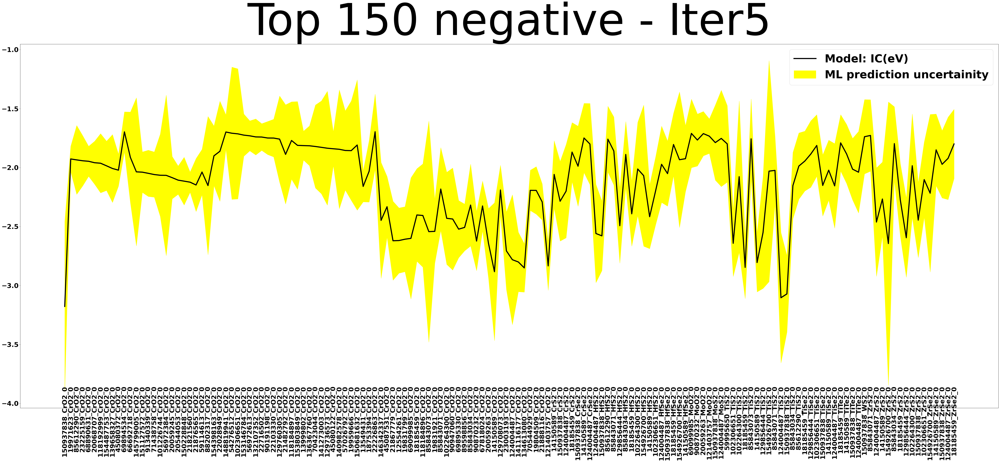

In [24]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 30))
ax.tick_params(axis="x",direction="in", pad=-100)
plt.plot(THN.System[:150], THN.Mean[:150], color = "black", label="Model: IC(eV)", linewidth=5)
plt.fill_between(THN.System[:150], THN.Mean[:150]-np.sqrt(THN.Variance[:150]), THN.Mean[:150]+np.sqrt(THN.Variance[:150]), color = "yellow",label="ML prediction uncertainity")

plt.legend(fontsize=50)
#plt.xlim([-3, 3])
#plt.ylim([-3, 3])
#plt.plot([-3, 3], [-3, 3], 'k--')
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
plt.title("Top 150 negative - Iter5", fontsize = 200)
plt.show()

#f.savefig("Results_Code_5/THN_plot", dpi = 300, transparent = False, facecolor = 'white')

## Check overlap with previous iteration

### Comparing with top 150 predicted from previous iteration

In [25]:
THN_combos_minus1 = pd.read_csv('Results_Code_4/Top_150_negative_combos', index_col = None, delimiter = ' ')
THN_combos_minus1

,CID,SMILES,Name
0,45088086,C1=CN2C=CC2=C3C1=CON3,CrO2
1,124004487,B1=C(C=C1)F,CrO2
2,57376260,C1=COC=C2C1=COC=C2,CrO2
3,66171,C=CN1C=CN=C1,CrO2
4,70524480,B1=CC=CC(=O)C1=O,CrO2
...,...,...,...
145,86249522,C=C1C(=C)C2=C1C=C2,ZrS2
146,87361649,C1=CC2=C(O2)C3=CSC=C31,ZrS2
147,88942740,C1=CC2=C1C3=CC(=C23)O,ZrS2
148,154926700,C1=CC2=COC3=CC1=C23,ZrS2


In [26]:
Overlap = pd.concat([THN_combos,THN_combos_minus1], axis=0).reset_index()

## Adding "System" column: 
Overlap = Overlap.astype({'CID' :'str'})
system = []
for i in Overlap.index:
    cid_name = Overlap.CID[i]+'_'+Overlap.Name[i]+'_0'
    system.append(cid_name)

Overlap['System'] = pd.DataFrame(system)
Overlap



,index,CID,SMILES,Name,System
0,200420,150937838,B1=C(C(=C1F)F)F,CrO2,150937838_CrO2_0
1,53357,19971623,C1=COC2=CN=CNC2=C1,CrO2,19971623_CrO2_0
2,127277,85612290,B1=NC=C1,CrO2,85612290_CrO2_0
3,71144,23225159,C1=CC=C2C=CON2C=C1,CrO2,23225159_CrO2_0
4,104492,68890631,C1=CN2C=COC=C2N=C1,CrO2,68890631_CrO2_0
...,...,...,...,...,...
295,145,86249522,C=C1C(=C)C2=C1C=C2,ZrS2,86249522_ZrS2_0
296,146,87361649,C1=CC2=C(O2)C3=CSC=C31,ZrS2,87361649_ZrS2_0
297,147,88942740,C1=CC2=C1C3=CC(=C23)O,ZrS2,88942740_ZrS2_0
298,148,154926700,C1=CC2=COC3=CC1=C23,ZrS2,154926700_ZrS2_0


In [27]:
print('Number of materials predicted to be in top 150 again = ', Overlap.duplicated(subset=['System']).sum())

Number of materials predicted to be in top 150 again =  68


In [28]:
NonRepeating = Overlap.drop_duplicates(subset=['System'], keep=False)
Repeating = Overlap[~Overlap.System.isin(NonRepeating.System)].drop_duplicates(subset=['System'])
Repeating

,index,CID,SMILES,Name,System
0,200420,150937838,B1=C(C(=C1F)F)F,CrO2,150937838_CrO2_0
1,53357,19971623,C1=COC2=CN=CNC2=C1,CrO2,19971623_CrO2_0
3,71144,23225159,C1=CC=C2C=CON2C=C1,CrO2,23225159_CrO2_0
4,104492,68890631,C1=CN2C=COC=C2N=C1,CrO2,68890631_CrO2_0
5,53861,20068707,C1=CSC2=CN=CNC2=C1,CrO2,20068707_CrO2_0
...,...,...,...,...,...
108,152400,121403757,C1=CN2C=CNC=C2N=C1,MoO2,121403757_MoO2_0
117,161144,129856444,B1=CC=C2C1=CC=B2,TiS2,129856444_TiS2_0
118,210620,154926700,C1=CC2=COC3=CC1=C23,TiS2,154926700_TiS2_0
138,210627,154926700,C1=CC2=COC3=CC1=C23,ZrS2,154926700_ZrS2_0


In [29]:
## Adding "System" column: 
THN_combos = THN_combos.reset_index()
THN_combos = THN_combos.astype({'CID' :'str'})
system = []
for i in THN_combos.index:
    cid_name = THN_combos.CID[i]+'_'+THN_combos.Name[i]+'_0'
    system.append(cid_name)

THN_combos['System'] = pd.DataFrame(system)
THN_combos

,index,CID,SMILES,Name,System
0,200420,150937838,B1=C(C(=C1F)F)F,CrO2,150937838_CrO2_0
1,53357,19971623,C1=COC2=CN=CNC2=C1,CrO2,19971623_CrO2_0
2,127277,85612290,B1=NC=C1,CrO2,85612290_CrO2_0
3,71144,23225159,C1=CC=C2C=CON2C=C1,CrO2,23225159_CrO2_0
4,104492,68890631,C1=CN2C=COC=C2N=C1,CrO2,68890631_CrO2_0
...,...,...,...,...,...
145,210628,154926700,C1=CC2=COC3=CC1=C23,ZrSe2,154926700_ZrSe2_0
146,38785,14150589,B1=CC=C1,ZrSe2,14150589_ZrSe2_0
147,200422,150937838,B1=C(C(=C1F)F)F,ZrSe2,150937838_ZrSe2_0
148,154768,124004487,B1=C(C=C1)F,ZrSe2,124004487_ZrSe2_0


In [30]:
NonRepeating_combos = THN_combos[~THN_combos.System.isin(Repeating.System)]
NonRepeating_combos = NonRepeating_combos[['CID', 'SMILES', 'Name']]
#NonRepeating_combos.to_csv('Results_Code_5/Top_150_negative_combos_minus_overlap', index=False, sep=' ')
NonRepeating_combos

,CID,SMILES,Name
2,85612290,B1=NC=C1,CrO2
6,118192999,C1=C2C(=CN=CN2Cl)NN1,CrO2
10,69894534,C1=CSC2=CN=CN=C2N1,CrO2
16,101226744,B=C1C=N1,CrO2
26,22028949,C1=CN(NC(=C1)Cl)Cl,CrO2
...,...,...,...
144,102306651,B1=BC=B1,ZrS2
146,14150589,B1=CC=C1,ZrSe2
147,150937838,B1=C(C(=C1F)F)F,ZrSe2
148,124004487,B1=C(C=C1)F,ZrSe2


In [31]:
NonRepeating_molecules = NonRepeating_combos[['CID','SMILES']].drop_duplicates()
#NonRepeating_molecules.to_csv('Results_Code_5/Top_150_negative_mols_minus_overlap', index=False, sep=' ')
NonRepeating_molecules

,CID,SMILES
2,85612290,B1=NC=C1
6,118192999,C1=C2C(=CN=CN2Cl)NN1
10,69894534,C1=CSC2=CN=CN=C2N1
16,101226744,B=C1C=N1
26,22028949,C1=CN(NC(=C1)Cl)Cl
29,102306651,B1=BC=B1
34,90191198,C=C1C2=C(NC(=O)N1)N=CN2
35,22103330,C1=CNC2=C(N1)C=NC(=O)N2
37,21482792,C1=CNN(C=C1)Br
38,118184897,C1=CN2C=CON2N=C1


## 2) Top N uncertain - from Bootstrap

In [32]:
THU = ExploreSet.nlargest(150, ['Variance']).sort_values(by=['Name'])
THU_combos = THU[['CID', 'SMILES', 'Name']]
#THU_combos.to_csv('Results_Code_5/Top_150_uncertain_combos', index=False, sep=' ')
THU_combos

,CID,SMILES,Name
143111,101916876,C1=C(C(=C1F)F)F,CrO2
205376,153368103,B1=C(C(=COO1)F)F,CrO2
199895,150681632,B1=C(C(=C(C1=O)F)F)F,CrO2
143468,102306651,B1=BC=B1,CrO2
127592,85775083,B1=NB=N1,CrO2
...,...,...,...
131878,87720547,C1=C(C=C(C2=C1O2)Cl)Cl,ZrSe2
32779,12514937,C=C1C=COC1=C,ZrSe2
19990,3016547,C1=COC=C1Cl,ZrSe2
52918,19898419,C1=CC2=C(O2)C=C1Cl,ZrSe2


In [33]:
THU_molecules = THU[['CID','SMILES']].drop_duplicates()
#THU_molecules.to_csv('Results_Code_5/Top_150_uncertain_mols', index=False, sep=' ')
THU_molecules

,CID,SMILES
143111,101916876,C1=C(C(=C1F)F)F
205376,153368103,B1=C(C(=COO1)F)F
199895,150681632,B1=C(C(=C(C1=O)F)F)F
143468,102306651,B1=BC=B1
127592,85775083,B1=NB=N1
...,...,...
52476,19836588,C=C1C=COC=C1
198132,149759399,C1=C(C(=CO1)Cl)F
159303,129774545,C1=COC2=C1S2
6864,123046,C1=CC=PC=C1


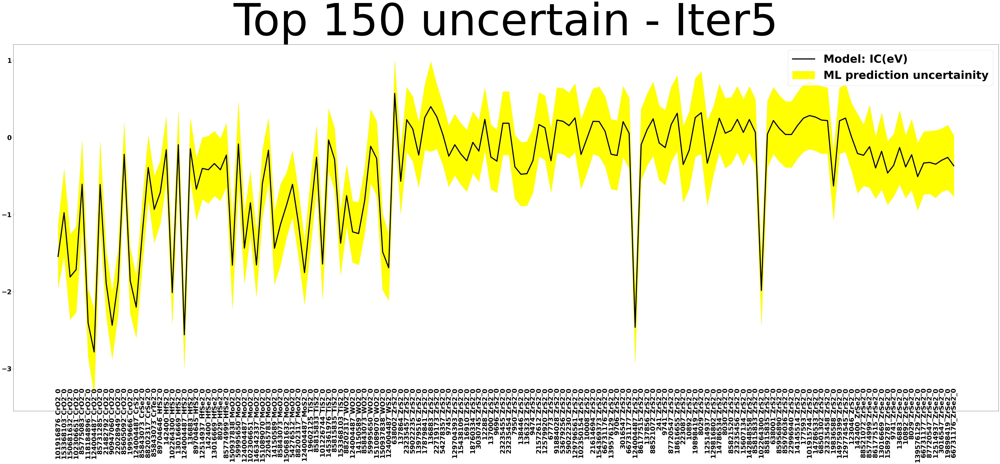

In [34]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 30))
ax.tick_params(axis="x",direction="in", pad=-105)
plt.plot(THU.System[:150], THU.Mean[:150], color = "black", label="Model: IC(eV)", linewidth=5)
plt.fill_between(THU.System[:150], THU.Mean[:150]-np.sqrt(THU.Variance[:150]), THU.Mean[:150]+np.sqrt(THU.Variance[:150]), color = "yellow",label="ML prediction uncertainity")

plt.legend(fontsize=50)
#plt.xlim([-3, 3])
#plt.ylim([-3, 3])
#plt.plot([-3, 3], [-3, 3], 'k--')
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
plt.title("Top 150 uncertain - Iter5", fontsize = 200)
plt.show()

#f.savefig("Results_Code_5/THU_plot", dpi = 300, transparent = False, facecolor = 'white')

In [35]:
Repeating

,index,CID,SMILES,Name,System
0,200420,150937838,B1=C(C(=C1F)F)F,CrO2,150937838_CrO2_0
1,53357,19971623,C1=COC2=CN=CNC2=C1,CrO2,19971623_CrO2_0
3,71144,23225159,C1=CC=C2C=CON2C=C1,CrO2,23225159_CrO2_0
4,104492,68890631,C1=CN2C=COC=C2N=C1,CrO2,68890631_CrO2_0
5,53861,20068707,C1=CSC2=CN=CNC2=C1,CrO2,20068707_CrO2_0
...,...,...,...,...,...
108,152400,121403757,C1=CN2C=CNC=C2N=C1,MoO2,121403757_MoO2_0
117,161144,129856444,B1=CC=C2C1=CC=B2,TiS2,129856444_TiS2_0
118,210620,154926700,C1=CC2=COC3=CC1=C23,TiS2,154926700_TiS2_0
138,210627,154926700,C1=CC2=COC3=CC1=C23,ZrS2,154926700_ZrS2_0


In [38]:
#Repeating.to_csv('Repeating_5iter.txt', index=False)

In [40]:
#THN.to_csv('THN_5iter.txt', index=False)